In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import uproot3 as uproot
import uproot4 as uprootnew
import pandas as pd
import numpy as np
import math
from tqdm import tqdm
import scipy.optimize
from scipy.linalg import cholesky
from numpy.linalg import inv
from numpy.linalg import pinv

from scipy.stats import norm
from scipy import stats
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score

import matplotlib as mpl

from matplotlib import colors, cm

import statistics

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

print(uproot.__version__)
print(pd.__version__)

3.14.4
2.2.2


In [2]:
good_runs = [4952, 4953, 4954, 4955, 4957, 4958, 4961, 4962, 4966, 4967, 4968, 4969, 4971, 4974, 4975, 4977, 4978, 4979, 4981, 4982, 4983, 4986, 4987,
4988, 4989, 4991, 4992, 4995, 4997, 4998, 4999, 5000, 5001, 5002, 5005, 5009, 5010, 5011, 5012, 5013, 5015, 5016, 5017, 5019, 5021, 5022, 5023, 5024,
5025, 5027, 5029, 5031, 5034, 5036, 5037, 5038, 5039, 5041, 5042, 5044, 5046, 5047, 5048, 5049, 5051, 5055, 5056, 5059, 5060, 5061, 5062, 5064, 5065,
5066, 5067, 5068, 5069, 5070, 5071, 5074, 5075, 5076, 5077, 5078, 5079, 5082, 5084, 5086, 5087, 5089, 5090, 5091, 5092, 5093, 5095, 5097, 5098, 5099,
5100, 5102, 5103, 5104, 5106, 5108, 5109, 5110, 5114, 5121, 5122, 5124, 5125, 5127, 5128, 5130, 5133, 5134, 5135, 5136, 5137, 5138, 5139, 5142, 5143,
5144, 5145, 5146, 5147, 5151, 5153, 5154, 5155, 5157, 5159, 5160, 5161, 5162, 5164, 5165, 5166, 5167, 5168, 5169, 5170, 5171, 5176, 5177, 5179, 5181,
5182, 5183, 5184, 5185, 5187, 5189, 5190, 5191, 5192, 5194, 5195, 5197, 5198, 5201, 5203, 5204, 5205, 5207, 5208, 5211, 5212, 5213, 5214, 5215, 5216,
5217, 5219, 5222, 5223, 5226, 5227, 5229, 5233, 5235, 5237, 5262, 5263, 5264, 5265, 5266, 5267, 5268, 5269, 5270, 5271, 5272, 5273, 5274, 5275, 5277,
5278, 5279, 5280, 5281, 5315, 5320, 5321, 5322, 5326, 5328, 5329, 5330, 5331, 5332, 5333, 5334, 5337, 5338, 5339, 5340, 5341, 5343, 5344, 5345, 5347,
5348, 5349, 5351, 5353, 5354, 5359, 5360, 5361, 5362, 5363, 5364, 5365, 5366, 5367, 5368, 5370, 5371, 5374, 5375, 5376, 5377, 5380, 5382, 5383, 5384,
5385, 5386, 5387, 5388, 5389, 5390, 5391, 5392, 5393, 5394, 5395, 5396, 5397, 5399, 5401, 5403, 5404, 5408, 5409, 5411, 5412, 5413, 5415, 5417, 5418,
5419, 5422, 5423, 5424, 5425, 5427, 5428, 5430, 5431, 5432, 5433, 5435, 5436, 5437, 5440, 5441, 5442, 5444, 5445, 5448, 5449, 5450, 5451, 5452, 5454,
5455, 5456, 5457, 5458, 5459, 5460, 5462, 5463, 5464, 5465, 5466, 5470, 5474, 5476, 5478, 5480, 5482, 5484, 5485, 5487, 5488, 5489, 5490, 5491, 5492,
5493, 5495, 5497, 5498, 5499, 5500, 5501, 5504, 5506, 5507, 5508, 5509, 5510, 5511, 5512, 5513, 5514, 5515, 5516, 5517, 5518, 5519, 5520, 5521, 5522,
5523, 5524, 5525, 5526, 5527, 5528, 5530, 5531, 5532, 5533, 5535, 5536, 5538, 5539, 5540, 5541, 5544, 5545, 5546, 5547, 5553, 5555, 5557, 5561, 5564,
5565, 5566, 5567, 5568, 5569, 5570, 5573, 5574, 5575, 5576, 5577, 5578, 5579, 5581, 5582, 5583, 5584, 5585, 5586, 5587, 5588, 5589, 5593, 5597, 5598,
5600, 5601, 5602, 5603, 5604, 5605, 5606, 5607, 5608, 5609, 5611, 5614, 5616, 5617, 5618, 5619, 5622, 5623, 5624, 5625, 5627, 5628, 5630, 5632, 5634,
5635, 5636, 5637, 5638, 5639, 5643, 5646, 5647, 5650, 5652, 5653, 5654, 5656, 5657, 5659, 5661, 5680, 5684, 5685, 5686, 5691, 5693, 5694, 5695, 5697,
5698, 5699, 5702, 5703, 5704, 5705, 5706, 5707, 5708, 5709, 5710, 5712, 5713, 5715, 5718, 5719, 5720, 5721, 5722, 5723, 5724, 5725, 5726, 5727, 5728,
5729, 5730, 5731, 5733, 5735, 5739, 5740, 5741, 5743, 5745, 5746, 5748, 5749, 5752, 5753, 5754, 5755, 5756, 5758, 5760, 5761, 5762, 5765, 5766, 5767,
5768, 5769, 5771, 5772, 5773, 5774, 5776, 5777, 5778, 5779, 5781, 5782, 5783, 5891, 5892, 5894, 5895, 5896, 5897, 5899, 5900, 5901, 5904, 5905, 5906,
5908, 5909, 5910, 5911, 5912, 5914, 5915, 5916, 5918, 5919, 5920, 5921, 5922, 5923, 5924, 5925, 5926, 5929, 5930, 5931, 5932, 5933, 5934, 5935, 5936,
5937, 5938, 5940, 5941, 5942, 5946, 5947, 5948, 5949, 5952, 5953, 5956, 5957, 5959, 5960, 5961, 5963, 5964, 5965, 5966, 5968, 5969, 5971, 5975, 5976,
5977, 5979, 5982, 5983, 5984, 5985, 5986, 5987, 5988, 5989, 5990, 5993, 5994, 5996, 5998, 6000, 6001, 6002, 6003, 6004, 6007, 6011, 6012, 6021, 6022,
6023, 6024, 6025, 6026, 6027, 6028, 6030, 6031, 6032, 6035, 6036, 6037, 6041, 6043, 6044, 6045, 6046, 6047, 6050, 6052, 6055, 6056, 6058, 6059, 6060,
6063, 6064, 6065, 6070, 6072, 6073, 6074, 6075, 6076, 6078, 6079, 6080, 6081, 6082, 6083, 6084, 6085, 6086, 6089, 6090, 6091, 6092, 6093, 6094, 6095,
6096, 6098, 6099, 6100, 6101, 6102, 6103, 6105, 6106, 6107, 6108, 6110, 6111, 6113, 6114, 6115, 6117, 6118, 6119, 6120, 6121, 6122, 6123, 6125, 6130,
6134, 6138, 6139, 6140, 6141, 6143, 6144, 6145, 6146, 6147, 6148, 6149, 6151, 6153, 6154, 6155, 6156, 6157, 6158, 6159, 6160, 6161, 6162, 6163, 6164,
6165, 6166, 6168, 6170, 6172, 6173, 6176, 6178, 6179, 6180, 6182, 6183, 6184, 6185, 6187, 6190, 6191, 6192, 6194, 6195, 6197, 6198, 6199, 6201, 6203,
6205, 6206, 6207, 6210, 6211, 6213, 6214, 6216, 6217, 6218, 6219, 6220, 6221, 6223, 6224, 6226, 6227, 6228, 6229, 6230, 6231, 6233, 6234, 6235, 6236,
6238, 6239, 6241, 6244, 6246, 6247, 6254, 6260, 6261, 6262, 6265, 6266, 6276, 6277, 6278, 6279, 6280, 6281, 6282, 6283, 6284, 6285, 6286, 6288, 6295,
6296, 6297, 6298, 6299, 6300, 6301, 6302, 6303, 6304, 6305, 6307, 6308, 6309, 6310, 6311, 6312, 6313, 6314, 6315, 6318, 6319, 6320, 6321, 6322, 6323,
6324, 6325, 6326, 6327, 6329, 6330, 6332, 6333, 6334, 6335, 6336, 6337, 6338, 6339, 6340, 6341, 6342, 6343, 6344, 6346, 6347, 6348, 6349, 6350, 6352,
6353, 6354, 6355, 6356, 6358, 6359, 6360, 6361, 6362, 6363, 6365, 6366, 6367, 6369, 6370, 6371, 6374, 6375, 6376, 6377, 6378, 6379, 6380, 6381, 6382,
6383, 6384, 6385, 6386, 6387, 6388, 6397, 6401, 6402, 6404, 6405, 6406, 6407, 6408, 6409, 6410, 6412, 6417, 6419, 6420, 6421, 6423, 6425, 6426, 6427,
6428, 6429, 6430, 6431, 6432, 6433, 6436, 6437, 6438, 6439, 6440, 6441, 6442, 6443, 6444, 6445, 6446, 6448, 6450, 6451, 6453, 6454, 6455, 6457, 6460,
6461, 6462, 6466, 6467, 6468, 6475, 6478, 6479, 6480, 6481, 6482, 6483, 6484, 6487, 6488, 6489, 6490, 6493, 6494, 6497, 6501, 6502, 6503, 6506, 6507,
6508, 6510, 6517, 6520, 6521, 6525, 6527, 6528, 6529, 6530, 6533, 6534, 6535, 6540, 6542, 6544, 6546, 6547, 6548, 6549, 6551, 6552, 6553, 6559, 6560,
6562, 6563, 6564, 6565, 6566, 6567, 6568, 6569, 6571, 6572, 6573, 6575, 6577, 6579, 6580, 6581, 6582, 6583, 6588, 6589, 6590, 6591, 6592, 6593, 6594,
6596, 6598, 6599, 6600, 6602, 6603, 6605, 6606, 6608, 6609, 6611, 6614, 6615, 6616, 6617, 6619, 6620, 6621, 6622, 6623, 6625, 6626, 6628, 6629, 6630,
6631, 6632, 6633, 6634, 6635, 6637, 6638, 6639, 6640, 6641, 6642, 6645, 6647, 6649, 6650, 6653, 6655, 6656, 6657, 6658, 6659, 6663, 6664, 6665, 6666,
6667, 6668, 6669, 6670, 6671, 6672, 6674, 6675, 6676, 6680, 6681, 6683, 6684, 6685, 6686, 6687, 6688, 6689, 6690, 6691, 6692, 6693, 6694, 6695, 6696,
6697, 6698, 6699, 6710, 6711, 6712, 6714, 6717, 6720, 6722, 6725, 6747, 6748, 6749, 6751, 6752, 6756, 6758, 6761, 6763, 6765, 6766, 6767, 6768, 6769,
6772, 6773, 6775, 6776, 6777, 6778, 6779, 6780, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6792, 6793, 6794, 6795, 6797, 6798, 6799, 6800,
6801, 6802, 6803, 6804, 6805, 6806, 6810, 6811, 6812, 6813, 6814, 6822, 6823, 6824, 6825, 6826, 6827, 6828, 6829, 6830, 6831, 6832, 6835, 6836, 6837,
6840, 6841, 6850, 6851, 6853, 6854, 6855, 6856, 6857, 6859, 6861, 6863, 6865, 6866, 6867, 6869, 6870, 6871, 6873, 6874, 6875, 6876, 6879, 6880, 6881,
6882, 6883, 6884, 6885, 6886, 6887, 6888, 6890, 6891, 6893, 6894, 6895, 6896, 6901, 6902, 6903, 6905, 6906, 6907, 6908, 6911, 6912, 6913, 6914, 6915,
6916, 6917, 6918, 6919, 6921, 6922, 6923, 6925, 6926, 6928, 6930, 6932, 6933, 6934, 6935, 6936, 6937, 6938, 6939, 6940, 6942, 6944, 6945, 6946, 6947,
6949, 6950, 6951, 6952, 6953, 6954, 6955, 6956, 6957, 6958, 6959, 6960, 6963, 6964, 6965, 6966, 6967, 6968, 6969, 6970, 6971, 6972, 6973, 6974, 6975,
6976, 6977, 6978, 6979, 6980, 6981, 6982, 6983, 6984, 6985, 6986, 6987, 6989, 6990, 6991, 6992, 6993, 6995, 6997, 6998, 6999, 7001, 7003, 7004, 7006,
7007, 7008, 7010, 7011, 7012, 7013, 7014, 7016, 7017, 7018, 7019, 7020, 7021, 7022, 7023, 7025, 7026, 7046, 7047, 7048, 7049, 7051, 7053, 7054, 7055,
7057, 7058, 7059, 7078, 7079, 7080, 7082, 7084, 7085, 7086, 7090, 7093, 7095, 7096, 7097, 7098, 7099, 7100, 7103, 7105, 7107, 7108, 7110, 7112, 7113,
7114, 7115, 7116, 7117, 7123, 7124, 7125, 7126, 7127, 7128, 7129, 7130, 7131, 7132, 7133, 7134, 7135, 7136, 7139, 7141, 7142, 7143, 7144, 7145, 7146,
7165, 7166, 7167, 7279, 7280, 7282, 7283, 7285, 7287, 7288, 7289, 7290, 7291, 7292, 7293, 7294, 7295, 7297, 7298, 7299, 7301, 7302, 7303, 7305, 7306,
7307, 7308, 7309, 7310, 7311, 7312, 7314, 7315, 7318, 7319, 7320, 7322, 7323, 7324, 7326, 7327, 7328, 7331, 7332, 7333, 7334, 7336, 7337, 7338, 7341,
7343, 7344, 7345, 7346, 7349, 7350, 7351, 7352, 7353, 7354, 7355, 7356, 7357, 7359, 7360, 7361, 7362, 7365, 7368, 7369, 7371, 7372, 7373, 7375, 7376,
7377, 7378, 7380, 7381, 7382, 7383, 7384, 7385, 7386, 7387, 7388, 7389, 7390, 7391, 7392, 7393, 7394, 7397, 7398, 7400, 7401, 7403, 7404, 7406, 7407,
7408, 7409, 7411, 7412, 7413, 7414, 7415, 7416, 7417, 7418, 7419, 7420, 7421, 7422, 7426, 7427, 7429, 7430, 7431, 7432, 7434, 7435, 7436, 7437, 7438,
7439, 7440, 7441, 7442, 7443, 7444, 7445, 7455, 7456, 7457, 7458, 7459, 7461, 7462, 7463, 7464, 7465, 7466, 7468, 7469, 7470, 7471, 7473, 7474, 7476,
7477, 7478, 7479, 7480, 7481, 7482, 7483, 7484, 7485, 7486, 7487, 7488, 7490, 7491, 7492, 7493, 7494, 7495, 7496, 7497, 7498, 7499, 7500, 7501, 7502,
7503, 7504, 7505, 7506, 7507, 7508, 7509, 7510, 7512, 7513, 7514, 7515, 7516, 7517, 7518, 7519, 7520, 7521, 7522, 7523, 7524, 7525, 7526, 7527, 7528,
7529, 7531, 7532, 7534, 7535, 7537, 7538, 7539, 7540, 7542, 7543, 7544, 7546, 7547, 7556, 7557, 7558, 7559, 7560, 7561, 7562, 7563, 7564, 7565, 7567,
7568, 7571, 7573, 7574, 7575, 7576, 7577, 7578, 7580, 7583, 7584, 7586, 7587, 7588, 7611, 7623, 7625, 7626, 7627, 7628, 7631, 7633, 7634, 7635, 7636,
7637, 7638, 7639, 7640, 7641, 7642, 7643, 7644, 7645, 7648, 7649, 7650, 7652, 7653, 7654, 7655, 7656, 7657, 7660, 7662, 7663, 7665, 7666, 7667, 7668,
7669, 7670, 7671, 7673, 7674, 7675, 7676, 7677, 7678, 7680, 7681, 7682, 7683, 7685, 7687, 7688, 7689, 7690, 7691, 7693, 7694, 7695, 7696, 7699, 7700,
7704, 7705, 7707, 7708, 7709, 7710, 7711, 7712, 7713, 7714, 7715, 7716, 7717, 7718, 7719, 7720, 7721, 7722, 7723, 7724, 7725, 7726, 7727, 7728, 7729,
7730, 7731, 7736, 7738, 7739, 7740, 7741, 7742, 7744, 7745, 7746, 7747, 7748, 7749, 7750, 7751, 7753, 7754, 7755, 7756, 7757, 7759, 7760, 7761, 7762,
       7764, 7765, 7766, 7767, 7768, 7769, 7770, 
       13697, 13698, 13699, 13700, 13701, 13702, 13705, 13707, 13708, 13709, 13712, 13713, 13714, 13715, 13717, 13719, 13720, 13721, 13723, 13724,
13725, 13728, 13729, 13730, 13731, 13732, 13733, 13736, 13737, 13738, 13739, 13740, 13741, 13742, 13743, 13744, 13745, 13746, 13755, 13756, 13757,
13762, 13763, 13764, 13765, 13766, 13767, 13769, 13770, 13771, 13772, 13773, 13774, 13775, 13776, 13777, 13779, 13780, 13782, 13787, 13789, 13790,
13791, 13792, 13793, 13794, 13797, 13799, 13800, 13801, 13802, 13803, 13805, 13806, 13807, 13809, 13810, 13811, 13812, 13860, 13861, 13862, 13864,
13865, 13867, 13868, 13869, 13871, 13872, 13873, 13874, 13875, 13876, 13877, 13878, 13879, 13883, 13884, 13888, 13889, 13894, 13895, 13896, 13897,
13898, 13899, 13900, 13902, 13904, 13905, 13906, 13907, 13908, 13909, 13910, 13911, 13912, 13913, 13917, 13918, 13919, 13921, 13922, 13923, 13926,
13928, 13929, 13930, 13935, 13936, 13937, 13938, 13939, 13940, 13942, 13943, 13944, 13945, 13947, 13948, 13950, 13951, 13954, 13955, 13956, 13957,
13959, 13960, 13962, 13963, 13964, 13965, 13969, 13970, 13971, 13972, 13977, 13978, 13979, 13982, 13984, 13985, 13986, 13988, 13989, 13990, 13991,
13992, 13993, 13996, 13997, 13998, 14000, 14001, 14002, 14004, 14006, 14007, 14008, 14009, 14010, 14011, 14012, 14014, 14015, 14016, 14017, 14020,
14021, 14022, 14023, 14024, 14025, 14026, 14028, 14030, 14031, 14032, 14034, 14035, 14036, 14038, 14039, 14040, 14042, 14043, 14044, 14045, 14046,
14047, 14049, 14053, 14055, 14056, 14058, 14059, 14060, 14062, 14063, 14064, 14065, 14066, 14067, 14068, 14069, 14073, 14074, 14075, 14076, 14077,
14079, 14080, 14082, 14083, 14084, 14087, 14088, 14089, 14090, 14091, 14093, 14095, 14096, 14097, 14098, 14099, 14101, 14102, 14103, 14104, 14105,
14107, 14108, 14109, 14110, 14111, 14112, 14114, 14115, 14116, 14117, 14121, 14122, 14123, 14124, 14125, 14127, 14128, 14129, 14131, 14132, 14133,
14134, 14135, 14136, 14138, 14139, 14140, 14141, 14142, 14143, 14146, 14147, 14148, 14149, 14150, 14151, 14152, 14153, 14154, 14156, 14157, 14158,
14159, 14161, 14162, 14163, 14164, 14165, 14171, 14172, 14173, 14174, 14175, 14177, 14181, 14182, 14183, 14184, 14185, 14186, 14187, 14188, 14189,
14190, 14191, 14192, 14193, 14194, 14195, 14196, 14201, 14202, 14203, 14205, 14206, 14207, 14209, 14211, 14212, 14213, 14214, 14216, 14217, 14218,
14219, 14220, 14222, 14223, 14224, 14225, 14226, 14227, 14228, 14229, 14231, 14232, 14233, 14234, 14235, 14238, 14239, 14240, 14241, 14242, 14243,
14244, 14245, 14246, 14248, 14250, 14251, 14253, 14256, 14257, 14259, 14260, 14261, 14262, 14263, 14264, 14265, 14266, 14268, 14269, 14270, 14271,
14272, 14274, 14275, 14276, 14277, 14278, 14279, 14280, 14281, 14282, 14283, 14284, 14285, 14286, 14287, 14290, 14291, 14292, 14293, 14294, 14295,
14297, 14298, 14299, 14300, 14301, 14302, 14306, 14307, 14308, 14310, 14313, 14314, 14315, 14316, 14317, 14319, 14320, 14321, 14323, 14324, 14325,
14327, 14328, 14329, 14332, 14333, 14334, 14335, 14336, 14337, 14338, 14340, 14341, 14342, 14343, 14344, 14347, 14349, 14350, 14351, 14355, 14356,
14357, 14358, 14359, 14360, 14361, 14362, 14363, 14366, 14367, 14368, 14369, 14370, 14372, 14375, 14376, 14377, 14379, 14381, 14382, 14383, 14384,
14385, 14388, 14390, 14391, 14392, 14393, 14394, 14396, 14399, 14401, 14403, 14404, 14406, 14407, 14408, 14409, 14410, 14411, 14412, 14413, 14414,
14417, 14418, 14420, 14421, 14423, 14425, 14427, 14428, 14430, 14431, 14432, 14436, 14438, 14439, 14441, 14443, 14445, 14446, 14450, 14451, 14452,
14453, 14454, 14455, 14456, 14458, 14459, 14460, 14461, 14463, 14464, 14467, 14468, 14469, 14470, 14473, 14475, 14478, 14480, 14481, 14488, 14490,
14497, 14500, 14505, 14509, 14510, 14512, 14516, 14517, 14521, 14524, 14526, 14527, 14529, 14530, 14531, 14534, 14535, 14536, 14537, 14538, 14539,
14541, 14542, 14543, 14544, 14545, 14546, 14548, 14549, 14550, 14551, 14552, 14553, 14554, 14555, 14556, 14557, 14558, 14559, 14560, 14561, 14562,
14563, 14564, 14568, 14569, 14571, 14572, 14573, 14575, 14576, 14577, 14578, 14580, 14582, 14583, 14584, 14585, 14586, 14587, 14590, 14592, 14596,
14597, 14598, 14600, 14601, 14603, 14607, 14609, 14610, 14611, 14613, 14614, 14615, 14617, 14618, 14619, 14621, 14622, 14623, 14625, 14626, 14630,
14631, 14632, 14633, 14634, 14635, 14636, 14637, 14639, 14640, 14641, 14642, 14643, 14644, 14645, 14647, 14664, 14667, 14669, 14671, 14672, 14673,
14675, 14676, 14677, 14681, 14682, 14684, 14685, 14686, 14687, 14688, 14689, 14690, 14692, 14693, 14694, 14695, 14697, 14698, 14699, 14700, 14701,
14702, 14704, 14706, 14707, 14708, 14709, 14710, 14712, 14713, 14715, 14716, 14717, 14719, 14720, 14721, 14722, 14724, 14725, 14726, 14727, 14729,
14730, 14731, 14733, 14734, 14736, 14737, 14738, 14739, 14740, 14741, 14742, 14743, 14745, 14746, 14747, 14748, 14749, 14750, 14751, 14754, 14755,
14756, 14758, 14759, 14760, 14761, 14763, 14764, 14766, 14767, 14768, 14770, 14771, 14772, 14773, 14774, 14775, 14779, 14780, 14782, 14783, 14784,
14785, 14787, 14788, 14789, 14790, 14793, 14794, 14795, 14796, 14797, 14798, 14799, 14801, 14802, 14805, 14806, 14807, 14808, 14810, 14811, 14812,
14813, 14814, 14816, 14817, 14818, 14819, 14820, 14822, 14824, 14825, 14826, 14828, 14829, 14830, 14831, 14852, 14857, 14860, 14866, 14870, 14871,
14872, 14873, 14874, 14875, 14876, 14877, 14878, 14880, 14881, 14882, 14883, 14884, 14885, 14886, 14887, 14888, 14890, 14891, 14893, 14897, 14899,
14900, 14901, 14902, 14903, 14904, 14905, 14907, 14908, 14909, 14911, 14912, 14913, 14914, 14915, 14916, 14917, 14918, 14919, 14920, 14921, 14922,
14923, 14924, 14925, 14926, 14927, 14929, 14930, 14931, 14932, 14934, 14935, 14936, 14937, 14938, 14939, 14940, 14942, 14944, 14945, 14947, 14948,
14949, 14954, 14955, 14956, 14957, 14958, 14959, 14965, 14967, 14968, 14970, 14971, 14972, 14973, 14974, 14975, 14976, 14977, 14978, 14979, 14980,
14981, 14983, 14985, 14986, 14987, 14989, 14990, 14991, 14993, 14994, 14995, 14997, 14998, 15000, 15001, 15002, 15003, 15004, 15006, 15010, 15011,
15012, 15013, 15014, 15016, 15017, 15018, 15019, 15021, 15025, 15027, 15031, 15035, 15042, 15043, 15045, 15047, 15051, 15052, 15053, 15054, 15055,
15057, 15060, 15061, 15062, 15064, 15065, 15073, 15074, 15077, 15078, 15079, 15080, 15081, 15082, 15083, 15086, 15090, 15092, 15093, 15097, 15098,
15099, 15100, 15101, 15102, 15103, 15104, 15106, 15111, 15113, 15114, 15115, 15116, 15117, 15118, 15120, 15121, 15122, 15123, 15124, 15125, 15127,
15128, 15129, 15130, 15133, 15135, 15136, 15138, 15140, 15141, 15144, 15145, 15146, 15147, 15148, 15149, 15150, 15151, 15152, 15153, 15154, 15155,
15156, 15160, 15161, 15162, 15163, 15165, 15166, 15167, 15170, 15172, 15174, 15176, 15177, 15179, 15181, 15182, 15183, 15206, 15222, 15223, 15225,
15227, 15228, 15231, 15234, 15236, 15238, 15242, 15243, 15244, 15246, 15247, 15249, 15250, 15251, 15252, 15254, 15256, 15257, 15259, 15261, 15262,
15264, 15265, 15266, 15267, 15270, 15271, 15273, 15274, 15275, 15276, 15277, 15279, 15281, 15282, 15283, 15286, 15287, 15288, 15289, 15290, 15291,
15292, 15293, 15294, 15295, 15296, 15297, 15299, 15301, 15303, 15305, 15306, 15308, 15309, 15311, 15312, 15314, 15315, 15316, 15318, 15319, 15320,
15322, 15323, 15324, 15326, 15327, 15328, 15330, 15334, 15335, 15336, 15337, 15339, 15341, 15342, 15343, 15345, 15346, 15348, 15350, 15351, 15353,
15354, 15355, 15356, 15358, 15360, 15361, 15362, 15364, 15366, 15367, 15368, 15369, 15370, 15376, 15377, 15378, 15382, 15383, 15386, 15387, 15388,
15389, 15391, 15392, 15393, 15394, 15395, 15396, 15397, 15398, 15399, 15402, 15403, 15407, 15409, 15410, 15411, 15412, 15413, 15415, 15416, 15417,
15419, 15420, 15421, 15422, 15423, 15425, 15426, 15427, 15428, 15429, 15430, 15431, 15432, 15433, 15434, 15436, 15437, 15438, 15439, 15440, 15442,
15443, 15445, 15446, 15447, 15448, 15449, 15450, 15451, 15456, 15457, 15458, 15460, 15461, 15462, 15463, 15464, 15465, 15466, 15467, 15469, 15470,
15471, 15473, 15474, 15477, 15478, 15479, 15481, 15482, 15483, 15484, 15485, 15486, 15488, 15489, 15491, 15492, 15494, 15495, 15496, 15497, 15498,
15499, 15500, 15501, 15502, 15503, 15504, 15505, 15507, 15509, 15510, 15511, 15514, 15516, 15517, 15519, 15520, 15521, 15527, 15528, 15529, 15530,
15550, 15554, 15580, 15587, 15588, 15589, 15590, 15591, 15592, 15593, 15595, 15596, 15597, 15599, 15601, 15603, 15632, 15633, 15634, 15636, 15637,
15638, 15639, 15640, 15641, 15643, 15644, 15647, 15652, 15655, 15656, 15657, 15662, 15667, 15668, 15669, 15670, 15673, 15676, 15677, 15678, 15680,
15681, 15682, 15683, 15687, 15688, 15689, 15692, 15696, 15697, 15698, 15700, 15701, 15702, 15703, 15704, 15706, 15708, 15709, 15710, 15713, 15714,
15715, 15718, 15719, 15720, 15721, 15722, 15724, 15727, 15728, 15729, 15730, 15731, 15733, 15734, 15737, 15738, 15741, 15742, 15748, 15751, 15753,
15757, 15762, 15764, 15766, 15767, 15771, 15773, 15774, 15775, 15776, 15777, 15778, 15779, 15780, 15782, 15783, 15784, 15785, 15789, 15790, 15792,
15794, 15797, 15799, 15800, 15801, 15803, 15805, 15806, 15807, 15808, 15822, 15824, 15825, 15827, 15828, 15829, 15832, 15834, 15836, 15838, 15840,
15843, 15844, 15846, 15851, 15857, 15858, 15859, 15861, 15862, 15863, 15865, 15867, 15870, 15871, 15872, 15873, 15875, 15876, 15877, 15878, 15880,
15882, 15883, 15885, 15886, 15888, 15890, 15892, 15893, 15894, 15895, 15897, 15898, 15900, 15901, 15902, 15903, 15904, 15907, 15909, 15910, 15913,
15915, 15916, 15917, 15918, 15919, 15920, 15921, 15922, 15923, 15924, 15926, 15927, 15928, 15930, 15931, 15932, 15933, 15935, 15939, 15940, 15941,
15943, 15946, 15948, 15949, 15952, 15954, 15955, 15957, 15959, 15960, 15961, 15963, 15965, 15966, 15967, 15969, 15970, 15973, 15975, 15976, 15978,
15979, 15980, 15981, 15983, 15986, 15987, 15988, 15989, 15990, 15993, 15997, 15998, 15999, 16002, 16004, 16006, 16008, 16011, 16013, 16017, 16018,
16021, 16022, 16023, 16024, 16026, 16028, 16031, 16034, 16036, 16038, 16039, 16040, 16041, 16042, 16043, 16047, 16048, 16051, 16052, 16057, 16058,
16059, 16060, 16061, 16063, 16064, 16065, 16066, 16067, 16069, 16071, 16072, 16073, 16075, 16076, 16078, 16079, 16080, 16081, 16088, 16089, 16090,
16091, 16092, 16094, 16095, 16096, 16099, 16101, 16102, 16104, 16105, 16106, 16107, 16108, 16109, 16110, 16112, 16113, 16114, 16115, 16116, 16117,
16118, 16119, 16121, 16122, 16125, 16126, 16134, 16137, 16138, 16140, 16141, 16142, 16144, 16145, 16147, 16148, 16150, 16151, 16152, 16155, 16158,
16159, 16160, 16161, 16162, 16166, 16167, 16168, 16169, 16171, 16172, 16173, 16175, 16176, 16178, 16179, 16180, 16184, 16185, 16186, 16187, 16188,
16191, 16196, 16197, 16198, 16199, 16200, 16203, 16204, 16205, 16206, 16207, 16208, 16209, 16210, 16211, 16212, 16214, 16215, 16216, 16218, 16219,
16220, 16221, 16222, 16225, 16226, 16227, 16228, 16230, 16231, 16232, 16239, 16242, 16243, 16247, 16250, 16252, 16253, 16254, 16256, 16257, 16258,
16260, 16262, 16263, 16265, 16266, 16267, 16270, 16271, 16272, 16274, 16275, 16276, 16277, 16278, 16279, 16280, 16281, 16283, 16285, 16286, 16288,
16289, 16290, 16292, 16293, 16295, 16298, 16299, 16301, 16303, 16304, 16305, 16307, 16310, 16312, 16313, 16314, 16315, 16317, 16319, 16320, 16322,
16323, 16325, 16326, 16329, 16330, 16331, 16332, 16333, 16335, 16336, 16337, 16338, 16339, 16340, 16341, 16344, 16346, 16347, 16348, 16350, 16352,
16355, 16356, 16357, 16358, 16363, 16364, 16370, 16374, 16376, 16378, 16379, 16381, 16382, 16384, 16385, 16386, 16387, 16389, 16391, 16392, 16394,
16396, 16403, 16404, 16405, 16406, 16408, 16410, 16411, 16414, 16415, 16416, 16420, 16422, 16424, 16425, 16426, 16431, 16432, 16433, 16434, 16437,
16438, 16439, 16440, 16442, 16444, 16445, 16446, 16448, 16451, 16453, 16457, 16458, 16459, 16462, 16464, 16466, 16467, 16468, 16469, 16470, 16471,
16472, 16473, 16476, 16477, 16479, 16480, 16481, 16483, 16485, 16486, 16489, 16491, 16492, 16493, 16494, 16495, 16497, 16498, 16499, 16504, 16506,
16507, 16508, 16509, 16510, 16511, 16513, 16514, 16515, 16517, 16518, 16519, 16520, 16521, 16522, 16524, 16525, 16526, 16527, 16529, 16530, 16532,
16536, 16540, 16542, 16544, 16545, 16546, 16547, 16548, 16549, 16551, 16552, 16553, 16554, 16555, 16557, 16558, 16562, 16563, 16565, 16568, 16569,
16570, 16571, 16573, 16576, 16578, 16579, 16581, 16583, 16584, 16585, 16586, 16587, 16588, 16593, 16594, 16645, 16650, 16659, 16664, 16666, 16668,
16670, 16672, 16676, 16679, 16680, 16683, 16684, 16685, 16687, 16689, 16690, 16692, 16693, 16694, 16696, 16697, 16724, 16726, 16730, 16731, 16733,
16734, 16735, 16736, 16738, 16739, 16741, 16742, 16743, 16744, 16746, 16747, 16749, 16750, 16751, 16752, 16753, 16757, 16759, 16760, 16761, 16762,
16763, 16764, 16765, 16769, 16770, 16772, 16776, 16778, 16782, 16783, 16785, 16786, 16787, 16788, 16789, 16793, 16794, 16795, 16797, 16798, 16801,
16802, 16803, 16804, 16805, 16807, 16808, 16809, 16813, 16814, 16815, 16816, 16817, 16818, 16819, 16820, 16821, 16823, 16824, 16825, 16826, 16828,
16830, 16831, 16832, 16834, 16835, 16836, 16839, 16840, 16841, 16842, 16843, 16845, 16846, 16847, 16848, 16849, 16850, 16851, 16852, 16853, 16854,
16855, 16856, 16858, 16864, 16867, 16869, 16872, 16873, 16874, 16875, 16877, 16878, 16879, 16880, 16882, 16883, 16884, 16885, 16886, 16888, 16889,
16890, 16891, 16893, 16894, 16895, 16896, 16898, 16901, 16903, 16904, 16906, 16907, 16909, 16910, 16912, 16913, 16916, 16919, 16920, 16921, 16923,
16925, 16926, 16927, 16929, 16931, 16932, 16934, 16935, 16937, 16939, 16941, 16942, 16944, 16945, 16946, 16947, 16948, 16949, 16950, 16951, 16952,
16955, 16956, 16960, 16962, 16963, 16964, 16965, 16966, 16970, 16973, 16975, 16976, 16978, 16979, 16985, 16986, 16990, 16992, 16993, 16994, 16996,
17001, 17002, 17004, 17005, 17009, 17010, 17011, 17013, 17019, 17021, 17022, 17023, 17024, 17027, 17028, 17029, 17030, 17031, 17032, 17033, 17034,
17035, 17036, 17037, 17039, 17041, 17043, 17044, 17045, 17046, 17047, 17048, 17052, 17053, 17055, 17056, 17057, 17060, 17065, 17067, 17068, 17070,
17072, 17073, 17075, 17076, 17077, 17078, 17079, 17080, 17082, 17083, 17084, 17087, 17088, 17089, 17090, 17091, 17092, 17093, 17095, 17096, 17097,
17098, 17099, 17100, 17101, 17102, 17103, 17106, 17108, 17109, 17110, 17111, 17112, 17114, 17116, 17118, 17119, 17120, 17121, 17122, 17123, 17124,
17125, 17126, 17128, 17129, 17131, 17132, 17133, 17134, 17135, 17136, 17137, 17138, 17139, 17140, 17141, 17142, 17143, 17144, 17146, 17147, 17149,
17150, 17152, 17155, 17156, 17157, 17158, 17159, 17160, 17161, 17162, 17164, 17165, 17166, 17168, 17169, 17170, 17171, 17172, 17173, 17174, 17175,
17177, 17178, 17179, 17181, 17182, 17183, 17184, 17185, 17186, 17188, 17190, 17191, 17193, 17194, 17195, 17196, 17197, 17198, 17199, 17201, 17203,
17204, 17205, 17206, 17208, 17209, 17210, 17212, 17213, 17214, 17215, 17217, 17218, 17219, 17220, 17222, 17223, 17224, 17226, 17227, 17228, 17229,
17231, 17232, 17235, 17237, 17238, 17239, 17240, 17242, 17243, 17244, 17245, 17246, 17249, 17250, 17251, 17252, 17254, 17255, 17256, 17257, 17258,
17259, 17260, 17264, 17265, 17266, 17267, 17268, 17269, 17270, 17271, 17274, 17275, 17276, 17279, 17280, 17281, 17282, 17283, 17287, 17295, 17300,
17301, 17302, 17303, 17304, 17305, 17306, 17307, 17308, 17309, 17310, 17311, 17312, 17313, 17314, 17316, 17317, 17318, 17320, 17322, 17323, 17324,
17325, 17326, 17327, 17328, 17331, 17332, 17333, 17334, 17335, 17336, 17337, 17338, 17339, 17341, 17343, 17344, 17345, 17348, 17349, 17351, 17352,
17353, 17354, 17355, 17356, 17357, 17358, 17360, 17361, 17363, 17364, 17365, 17366, 17367, 17368, 17369, 17370, 17371, 17372, 17373, 17379, 17380,
17382, 17383, 17386, 17387, 17388, 17389, 17390, 17391, 17393, 17394, 17395, 17396, 17397, 17398, 17400, 17401, 17402, 17404, 17406, 17407, 17408,
17409, 17410, 17413, 17414, 17415, 17417, 17418, 17419, 17420, 17421, 17422, 17423, 17426, 17427, 17428, 17429, 17430, 17431, 17432, 17433, 17434,
17435, 17438, 17439, 17440, 17441, 17443, 17444, 17447, 17448, 17449, 17451, 17452, 17453, 17455, 17456, 17457, 17458, 17459, 17460, 17461, 17462,
17463, 17466, 17467, 17468, 17469, 17471, 17472, 17474, 17475, 17476, 17478, 17479, 17480, 17481, 17482, 17484, 17486, 17487, 17488, 17489, 17491,
17492, 17493, 17494, 17495, 17496, 17497, 17498, 17499, 17500, 17501, 17502, 17503, 17504, 17505, 17506, 17508, 17509, 17510, 17511, 17513, 17514,
17517, 17518, 17520, 17521, 17522, 17523, 17524, 17525, 17526, 17528, 17529, 17530, 17531, 17532, 17534, 17535, 17536, 17537, 17540, 17541, 17543,
17544, 17545, 17547, 17549, 17550, 17552, 17555, 17556, 17557, 17559, 17560, 17561, 17563, 17564, 17566, 17567, 17568, 17569, 17571, 17572, 17573,
17575, 17577, 17578, 17579, 17580, 17581, 17582, 17584, 17585, 17586, 17587, 17589, 17590, 17591, 17592, 17594, 17596, 17597, 17598, 17599, 17600,
17601, 17602, 17603, 17604, 17605, 17606, 17607, 17608, 17609, 17611, 17612, 17614, 17615, 17616, 17618, 17619, 17620, 17621, 17622, 17623, 17626,
17630, 17631, 17633, 17634, 17636, 17637, 17638, 17641, 17644, 17645, 17646, 17647, 17648, 17650, 17651, 17652, 17653, 17655, 17657, 17658, 17660,
17661, 17662, 17663, 17664, 17665, 17666, 17667, 17668, 17669, 17670, 17671, 17674, 17675, 17678, 17679, 17680, 17681, 17683, 17684, 17686, 17687,
17688, 17689, 17691, 17692, 17693, 17694, 17695, 17696, 17697, 17698, 17699, 17700, 17701, 17702, 17703, 17719, 17720, 17721, 17722, 17723, 17724,
17725, 17726, 17727, 17729, 17730, 17731, 17732, 17734, 17736, 17738, 17739, 17742, 17743, 17744, 17745, 17746, 17749, 17751, 17753, 17754, 17755,
17756, 17757, 17758, 17759, 17760, 17761, 17762, 17763, 17765, 17766, 17768, 17769, 17771, 17774, 17776, 17779, 17780, 17781, 17783, 17784, 17787,
17788, 17789, 17790, 17791, 17792, 17793, 17795, 17797, 17798, 17799, 17800, 17801, 17802, 17805, 17818, 17822, 17823, 17824, 17825, 17827, 17829,
17830, 17831, 17833, 17834, 17835, 17840, 17841, 17846, 17847, 17849, 17850, 17851, 17853, 17855, 17856, 17857, 17858, 17860, 17861, 17862, 17865,
17866, 17869, 17870, 17871, 17872, 17874, 17875, 17876, 17877, 17955, 17956, 17958, 17960, 17961, 17963, 17965, 17966, 17972, 17973, 17974, 17975,
17978, 17983, 17984, 17985, 17986, 17987, 17989, 17990, 17992, 17994, 17996, 17998, 18001, 18005, 18007, 18008, 18009, 18010, 18011, 18014, 18018,
18021, 18024, 18026, 18027, 18028, 18030, 18031, 18032, 18034, 18035, 18037, 18039, 18040, 18041, 18044, 18045, 18048, 18049, 18050, 18052, 18054,
18057, 18059, 18062, 18202, 18208, 18210, 18212, 18213, 18215, 18218, 18219, 18220, 18224, 18225, 18226, 18228, 18229, 18232, 18233, 18234, 18235,
18237, 18238, 18240, 18241, 18242, 18244, 18245, 18246, 18248, 18249, 18250, 18251, 18253, 18257, 18258, 18261, 18263, 18265, 18266, 18267, 18268,
18269, 18270, 18272, 18282, 18283, 18285, 18286, 18463, 18465, 18466, 18467, 18468, 18469, 18470, 18472, 18474, 18476, 18479, 18480, 18481, 18482,
18484, 18488, 18489, 18490, 18491, 18492, 18495, 18496, 18497, 18499, 18502, 18505, 18506, 18508, 18509, 18510, 18511, 18512, 18514, 18515, 18516,
18519, 18520, 18523, 18525, 18526, 18527, 18574, 18575, 18577, 18595, 18603, 18604, 18605, 18607, 18609, 18610, 18612, 18615, 18617, 18619, 18621,
18622, 18623, 18625, 18628, 18630, 18631, 18632, 18634, 18636, 18637, 18639, 18643, 18644, 18645, 18646, 18647, 18650, 18651, 18653, 18654, 18657,
18658, 18659, 18662, 18663, 18665, 18666, 18668, 18673, 18674, 18676, 18677, 18678, 18679, 18685, 18686, 18687, 18689, 18690, 18692, 18694, 18696,
18697, 18699, 18701, 18703, 18704, 18708, 18709, 18710, 18711, 18712, 18713, 18714, 18717, 18719, 18723, 18724, 18731, 18732, 18733, 18737, 18740,
18741, 18743, 18746, 18747, 18748, 18750, 18752, 18753, 18754, 18756, 18758, 18760, 18761, 18762, 18763, 18764, 18765, 18766, 18767, 18768, 18769,
18770, 18771, 18773, 18777, 18779, 18780, 18781, 18782, 18784, 18786, 18788, 18790, 18792, 18793, 18794, 18795, 18796, 18841, 18845, 18846, 18852,
18856, 18860, 18861, 18862, 18863, 18864, 18865, 18867, 18868, 18872, 18873, 18874, 18876, 18882, 18883, 18885, 18900, 18901, 18903, 18907, 18910,
18911, 18913, 18915, 18918, 18919, 18920, 18921, 18922, 18923, 18924, 18926, 18927, 18928, 18929, 18930, 18931, 18933, 18935, 18937, 18938, 18941,
       18944, 18947, 18948, 18949, 18950, 18951, 18952, 18953, 18954, 18955, 18957, 18958, 18959, 18960,
       8321, 8334, 8335, 8336, 8341, 8343, 8344, 8348, 8354, 8360, 8361, 8362, 8363, 8364, 8365, 8366, 8368, 8371, 8372, 8373, 8374, 8375, 8377,
8378, 8379, 8380, 8382, 8390, 8391, 8404, 8406, 8407, 8408, 8409, 8410, 8411, 8412, 8413, 8414, 8415, 8416, 8418, 8419, 8420, 8421, 8423, 8424, 8427,
8430, 8431, 8433, 8434, 8435, 8436, 8438, 8439, 8440, 8441, 8443, 8444, 8445, 8446, 8447, 8448, 8454, 8455, 8458, 8459, 8460, 8461, 8462, 8464, 8465,
8467, 8468, 8469, 8470, 8471, 8472, 8473, 8475, 8476, 8487, 8489, 8490, 8492, 8493, 8495, 8498, 8504, 8506, 8507, 8508, 8510, 8513, 8514, 8518, 8520,
8522, 8526, 8528, 8529, 8531, 8534, 8536, 8537, 8538, 8539, 8540, 8541, 8543, 8546, 8547, 8548, 8549, 8550, 8553, 8554, 8555, 8556, 8562, 8565, 8566,
8567, 8571, 8572, 8573, 8578, 8579, 8580, 8581, 8584, 8585, 8586, 8587, 8588, 8589, 8590, 8601, 8613, 8614, 8615, 8616, 8617, 8618, 8619, 8620, 8621,
8622, 8624, 8626, 8627, 8635, 8638, 8644, 8646, 8647, 8648, 8649, 8650, 8652, 8653, 8654, 8655, 8656, 8658, 8659, 8660, 8661, 8663, 8664, 8666, 8668,
8669, 8670, 8671, 8672, 8673, 8675, 8677, 8680, 8681, 8682, 8683, 8686, 8687, 8688, 8689, 8690, 8691, 8693, 8695, 8697, 8698, 8699, 8700, 8701, 8702,
8703, 8704, 8705, 8706, 8707, 8708, 8709, 8711, 8712, 8714, 8715, 8716, 8718, 8719, 8720, 8721, 8724, 8735, 8736, 8738, 8739, 8740, 8742, 8743, 8744,
8745, 8746, 8747, 8748, 8749, 8750, 8751, 8752, 8754, 8755, 8756, 8757, 8758, 8759, 8762, 8763, 8764, 8766, 8767, 8768, 8769, 8770, 8771, 8772, 8773,
8774, 8776, 8777, 8778, 8780, 8782, 8783, 8784, 8786, 8787, 8789, 8790, 8791, 8792, 8793, 8794, 8795, 8796, 8797, 8798, 8799, 8800, 8801, 8802, 8804,
8806, 8807, 8809, 8810, 8811, 8813, 8814, 8817, 8825, 8830, 8832, 8836, 8841, 8852, 8853, 8855, 8856, 8857, 8859, 8860, 8861, 8862, 8863, 8866, 8867,
8868, 8873, 8874, 8876, 8877, 8878, 8879, 8882, 8883, 8885, 8886, 8888, 8889, 8890, 8891, 8893, 8894, 8897, 8899, 8900, 8902, 8903, 8904, 8905, 8906,
8907, 8908, 8909, 8911, 8912, 8914, 8915, 8917, 8918, 8919, 8920, 8921, 8922, 8923, 8925, 8926, 8927, 8928, 8931, 8934, 8935, 8936, 8937, 8938, 8939,
8940, 8941, 8943, 8954, 8955, 8957, 8958, 8959, 8960, 8962, 8963, 8964, 8966, 8968, 8971, 8972, 8974, 8975, 8976, 8977, 8979, 8981, 8982, 8987, 8989,
8990, 8991, 8993, 8994, 8995, 8996, 8997, 8998, 8999, 9001, 9002, 9004, 9005, 9007, 9008, 9009, 9014, 9018, 9022, 9023, 9024, 9025, 9026, 9028, 9030,
9033, 9034, 9035, 9037, 9038, 9039, 9040, 9041, 9044, 9049, 9050, 9052, 9053, 9055, 9056, 9057, 9059, 9060, 9061, 9062, 9063, 9064, 9065, 9066, 9067,
9068, 9069, 9072, 9073, 9074, 9075, 9076, 9079, 9080, 9081, 9083, 9084, 9085, 9087, 9088, 9089, 9090, 9092, 9093, 9094, 9095, 9096, 9108, 9109, 9113,
9114, 9116, 9134, 9136, 9138, 9142, 9144, 9146, 9148, 9149, 9158, 9169, 9175, 9186, 9188, 9191, 9192, 9194, 9195, 9196, 9199, 9201, 9202, 9203, 9205,
9206, 9207, 9208, 9209, 9210, 9212, 9214, 9215, 9216, 9217, 9218, 9223, 9225, 9226, 9228, 9230, 9231, 9232, 9233, 9236, 9237, 9238, 9239, 9240, 9241,
9242, 9243, 9245, 9246, 9247, 9249, 9250, 9252, 9254, 9255, 9262, 9265, 9266, 9267, 9268, 9269, 9272, 9273, 9275, 9277, 9278, 9279, 9280, 9281, 9282,
9284, 9285, 9286, 9287, 9288, 9289, 9290, 9291, 9292, 9293, 9295, 9297, 9298, 9299, 9300, 9301, 9302, 9303, 9304, 9305, 9307, 9308, 9310, 9311, 9313,
9316, 9317, 9319, 9320, 9321, 9324, 9325, 9326, 9327, 9328, 9329, 9331, 9332, 9333, 9336, 9337, 9338, 9340, 9341, 9343, 9344, 9345, 9346, 9347, 9348,
9349, 9350, 9351, 9354, 9356, 9358, 9360, 9361, 9362, 9363, 9364, 9366, 9367, 9369, 9370, 9372, 9373, 9374, 9375, 9377, 9378, 9379, 9383, 9384, 9385,
9386, 9390, 9391, 9392, 9394, 9395, 9396, 9397, 9398, 9401, 9403, 9404, 9405, 9406, 9407, 9408, 9410, 9411, 9412, 9414, 9415, 9416, 9417, 9421, 9422,
9423, 9425, 9427, 9428, 9429, 9431, 9432, 9433, 9434, 9435, 9436, 9437, 9438, 9439, 9440, 9442, 9444, 9445, 9446, 9447, 9448, 9449, 9452, 9453, 9454,
9456, 9457, 9458, 9459, 9460, 9461, 9463, 9464, 9465, 9466, 9467, 9468, 9470, 9471, 9472, 9473, 9474, 9477, 9479, 9480, 9481, 9482, 9483, 9485, 9486,
9488, 9489, 9491, 9492, 9494, 9497, 9498, 9499, 9500, 9501, 9503, 9504, 9505, 9506, 9507, 9508, 9509, 9510, 9511, 9512, 9513, 9515, 9516, 9517, 9518,
9519, 9521, 9523, 9524, 9525, 9526, 9527, 9529, 9530, 9531, 9532, 9533, 9534, 9535, 9536, 9538, 9539, 9542, 9543, 9545, 9546, 9548, 9550, 9551, 9553,
9554, 9556, 9557, 9558, 9559, 9560, 9561, 9562, 9563, 9564, 9565, 9567, 9569, 9570, 9571, 9572, 9573, 9574, 9575, 9576, 9577, 9578, 9579, 9580, 9581,
9582, 9583, 9584, 9585, 9586, 9587, 9589, 9590, 9591, 9592, 9593, 9594, 9595, 9597, 9598, 9599, 9601, 9602, 9603, 9604, 9605, 9607, 9608, 9609, 9610,
9612, 9613, 9614, 9615, 9617, 9618, 9619, 9620, 9621, 9627, 9628, 9629, 9630, 9631, 9632, 9633, 9634, 9636, 9637, 9639, 9640, 9644, 9645, 9649, 9650,
9651, 9653, 9654, 9655, 9656, 9657, 9658, 9660, 9661, 9662, 9665, 9667, 9668, 9669, 9670, 9672, 9674, 9675, 9677, 9678, 9679, 9681, 9682, 9683, 9684,
9685, 9689, 9690, 9694, 9695, 9696, 9698, 9699, 9700, 9702, 9703, 9704, 9706, 9708, 9709, 9710, 9712, 9713, 9716, 9717, 9718, 9719, 9720, 9721, 9722,
9724, 9725, 9726, 9727, 9729, 9730, 9741, 9742, 9744, 9749, 9750, 9751, 9757, 9758, 9760, 9761, 9762, 9765, 9767, 10307, 10308, 10353, 10354, 10355,
10356, 10357, 10359, 10362, 10363, 10366, 10371, 10374, 10375, 10379, 10380, 10381, 10382, 10383, 10385, 10386, 10389, 10390, 10394, 10396, 10432,
10433, 10434, 10436, 10437, 10438, 10439, 10441, 10442, 10444, 10445, 10446, 10447, 10448, 10449, 10450, 10452, 10453, 10471, 10472, 10473, 10475,
10478, 10479, 10480, 10481, 10482, 10483, 10484, 10485, 10486, 10487, 10488, 10489, 10490, 10491, 10492, 10493, 10500, 10501, 10502, 10504, 10505,
10508, 10512, 10516, 10517, 10518, 10519, 10520, 10521, 10522, 10523, 10525, 10529, 10530, 10532, 10533, 10534, 10535, 10537, 10538, 10540, 10544,
10545, 10546, 10547, 10551, 10553, 10555, 10556, 10558, 10560, 10561, 10562, 10563, 10565, 10567, 10568, 10569, 10570, 10571, 10573, 10574, 10575,
10577, 10578, 10579, 10580, 10581, 10583, 10584, 10585, 10586, 10590, 10591, 10592, 10593, 10594, 10595, 10597, 10598, 10599, 10600, 10601, 10602,
10603, 10605, 10606, 10608, 10609, 10610, 10611, 10612, 10613, 10616, 10618, 10622, 10623, 10624, 10625, 10626, 10627, 10629, 10630, 10631, 10633,
10634, 10635, 10639, 10640, 10641, 10643, 10644, 10645, 10646, 10647, 10648, 10649, 10652, 10654, 10655, 10656, 10657, 10658, 10660, 10662, 10663,
10665, 10666, 10667, 10668, 10669, 10670, 10672, 10673, 10674, 10675, 10678, 10680, 10681, 10682, 10683, 10685, 10687, 10688, 10689, 10690, 10692,
10693, 10694, 10695, 10696, 10697, 10698, 10700, 10701, 10702, 10704, 10705, 10706, 10707, 10708, 10710, 10711, 10712, 10713, 10714, 10716, 10719,
10720, 10721, 10724, 10725, 10726, 10727, 10728, 10729, 10730, 10732, 10733, 10734, 10735, 10736, 10737, 10741, 10743, 10744, 10745, 10746, 10747,
10748, 10750, 10752, 10755, 10756, 10757, 10758, 10760, 10761, 10762, 10763, 10764, 10765, 10766, 10767, 10768, 10769, 10771, 10772, 10773, 10774,
10778, 10781, 10782, 10784, 10786, 10787, 10788, 10789, 10790, 10791, 10792, 10793, 10794, 10795, 10796, 10797, 10798, 10799, 10800, 10801, 10803,
10804, 10805, 10807, 10809, 10810, 10811, 10813, 10815, 10816, 10818, 10819, 10820, 10821, 10822, 10823, 10824, 10827, 10828, 10829, 10830, 10831,
10832, 10833, 10834, 10836, 10837, 10838, 10839, 10840, 10841, 10842, 10843, 10844, 10845, 10846, 10847, 10848, 10849, 10850, 10855, 10856, 10857,
10858, 10861, 10862, 10863, 10864, 10865, 10867, 10868, 10869, 10870, 10873, 10874, 10877, 10878, 10881, 10882, 10883, 10884, 10885, 10886, 10887,
10888, 10890, 10892, 10893, 10894, 10897, 10898, 10900, 10901, 10902, 10903, 10905, 10906, 10908, 10910, 10911, 10913, 10918, 10920, 10921, 10922,
10923, 10924, 10925, 10926, 10927, 10928, 10929, 10931, 10933, 10936, 10937, 10938, 10939, 10940, 10942, 10946, 10947, 10948, 10949, 10950, 10951,
10952, 10953, 10954, 10955, 10956, 10958, 10959, 10960, 10961, 10963, 10965, 10966, 10967, 10968, 10969, 10970, 10971, 10972, 10973, 10974, 10975,
10976, 10979, 10983, 10984, 10987, 10988, 10989, 10990, 10991, 10992, 10993, 10994, 10995, 10997, 10998, 11000, 11001, 11002, 11005, 11024, 11025,
11026, 11027, 11029, 11030, 11031, 11032, 11036, 11039, 11041, 11042, 11044, 11045, 11046, 11047, 11048, 11049, 11050, 11059, 11064, 11065, 11066,
11067, 11068, 11069, 11070, 11071, 11072, 11073, 11074, 11075, 11076, 11077, 11078, 11080, 11081, 11083, 11085, 11086, 11087, 11088, 11090, 11091,
11093, 11094, 11095, 11096, 11103, 11108, 11110, 11111, 11112, 11115, 11116, 11118, 11119, 11120, 11127, 11128, 11129, 11131, 11132, 11133, 11134,
11135, 11137, 11138, 11139, 11141, 11142, 11143, 11144, 11145, 11146, 11147, 11149, 11150, 11153, 11154, 11157, 11162, 11164, 11166, 11168, 11169,
11170, 11171, 11172, 11173, 11174, 11176, 11177, 11179, 11182, 11184, 11186, 11187, 11188, 11189, 11190, 11192, 11193, 11194, 11196, 11197, 11198,
11201, 11202, 11203, 11204, 11205, 11206, 11208, 11210, 11211, 11212, 11213, 11214, 11215, 11217, 11218, 11219, 11224, 11225, 11226, 11227, 11228,
11229, 11230, 11232, 11233, 11234, 11235, 11236, 11237, 11238, 11239, 11240, 11242, 11243, 11244, 11247, 11249, 11253, 11255, 11256, 11259, 11260,
11263, 11264, 11265, 11269, 11270, 11271, 11274, 11275, 11278, 11279, 11281, 11282, 11283, 11284, 11285, 11286, 11288, 11290, 11291, 11292, 11293,
11294, 11296, 11297, 11492, 11493, 11494, 11495, 11500, 11501, 11502, 11503, 11504, 11505, 11506, 11507, 11508, 11509, 11510, 11512, 11514, 11515,
11518, 11519, 11520, 11521, 11524, 11526, 11527, 11528, 11529, 11531, 11532, 11535, 11537, 11538, 11539, 11540, 11543, 11544, 11545, 11546, 11550,
11551, 11553, 11554, 11557, 11558, 11559, 11561, 11564, 11565, 11568, 11570, 11571, 11572, 11574, 11575, 11576, 11577, 11578, 11579, 11581, 11582,
11583, 11584, 11586, 11587, 11589, 11591, 11593, 11598, 11599, 11601, 11603, 11604, 11605, 11606, 11608, 11609, 11610, 11611, 11613, 11614, 11617,
11618, 11619, 11621, 11622, 11623, 11624, 11625, 11626, 11628, 11629, 11630, 11631, 11632, 11634, 11636, 11637, 11638, 11639, 11640, 11644, 11646,
11647, 11648, 11649, 11650, 11652, 11653, 11655, 11656, 11657, 11658, 11659, 11660, 11664, 11665, 11666, 11667, 11668, 11672, 11673, 11674, 11675,
11677, 11678, 11679, 11680, 11681, 11682, 11684, 11685, 11686, 11687, 11691, 11692, 11693, 11695, 11696, 11698, 11700, 11702, 11707, 11709, 11710,
11712, 11713, 11714, 11715, 11716, 11719, 11720, 11721, 11723, 11724, 11726, 11727, 11728, 11729, 11730, 11733, 11737, 11738, 11739, 11740, 11741,
11742, 11744, 11745, 11746, 11747, 11749, 11751, 11753, 11754, 11755, 11756, 11758, 11759, 11761, 11762, 11763, 11765, 11766, 11767, 11769, 11771,
11772, 11774, 11775, 11776, 11777, 11778, 11779, 11780, 11781, 11782, 11783, 11784, 11785, 11786, 11787, 11791, 11792, 11793, 11794, 11795, 11796,
11797, 11799, 11800, 11801, 11802, 11803, 11804, 11807, 11809, 11811, 11813, 11814, 11815, 11816, 11817, 11818, 11819, 11820, 11821, 11822, 11824,
11828, 11829, 11830, 11831, 11832, 11833, 11836, 11840, 11841, 11842, 11844, 11845, 11846, 11847, 11848, 11849, 11851, 11852, 11853, 11854, 11857,
11858, 11861, 11865, 11866, 11867, 11868, 11869, 11870, 11872, 11873, 11874, 11875, 11876, 11878, 11879, 11880, 11881, 11882, 11884, 11885, 11886,
11887, 11888, 11889, 11891, 11892, 11893, 11894, 11895, 11896, 11897, 11898, 11900, 11901, 11904, 11905, 11906, 11907, 11909, 11910, 11911, 11912,
11913, 11914, 11915, 11917, 11919, 11920, 11921, 11922, 11923, 11924, 11925, 11926, 11927, 11928, 11929, 11930, 11931, 11933, 11934, 11935, 11936,
11937, 11938, 11939, 11940, 11943, 11945, 11946, 11947, 11952, 11953, 11956, 11957, 11958, 11959, 11960, 11961, 11963, 11964, 11965, 11969, 11970,
11971, 11972, 11973, 11974, 11976, 11977, 11979, 11981, 11984, 11988, 11989, 11990, 11991, 11993, 11994, 11995, 11996, 11998, 12000, 12001, 12002,
12004, 12005, 12006, 12008, 12009, 12010, 12011, 12012, 12013, 12015, 12016, 12017, 12020, 12021, 12023, 12024, 12025, 12026, 12027, 12028, 12029,
12030, 12031, 12032, 12034, 12036, 12039, 12040, 12041, 12042, 12043, 12044, 12045, 12046, 12048, 12052, 12053, 12054, 12056, 12057, 12060, 12061,
12062, 12063, 12066, 12067, 12068, 12069, 12070, 12071, 12072, 12073, 12075, 12076, 12077, 12079, 12080, 12083, 12084, 12086, 12089, 12090, 12091,
12093, 12094, 12095, 12097, 12098, 12100, 12102, 12103, 12104, 12106, 12107, 12108, 12109, 12110, 12111, 12116, 12117, 12118, 12120, 12121, 12122,
12125, 12127, 12130, 12131, 12132, 12133, 12135, 12136, 12137, 12139, 12140, 12142, 12143, 12145, 12146, 12331, 12364, 12365, 12366, 12367, 12368,
12369, 12374, 12377, 12378, 12379, 12380, 12381, 12382, 12383, 12384, 12389, 12392, 12401, 12402, 12403, 12404, 12406, 12418, 12419, 12420, 12422,
12425, 12426, 12429, 12430, 12431, 12432, 12433, 12434, 12436, 12438, 12441, 12442, 12444, 12446, 12447, 12448, 12449, 12450, 12451, 12453, 12454,
12456, 12459, 12460, 12461, 12462, 12464, 12466, 12469, 12479, 12480, 12481, 12482, 12485, 12486, 12492, 12493, 12495, 12496, 12497, 12498, 12499,
12502, 12503, 12504, 12505, 12506, 12507, 12508, 12513, 12514, 12515, 12516, 12517, 12518, 12520, 12521, 12522, 12526, 12527, 12528, 12529, 12530,
12533, 12534, 12535, 12537, 12538, 12539, 12540, 12541, 12542, 12543, 12544, 12545, 12549, 12550, 12551, 12552, 12553, 12554, 12555, 12556, 12557,
12558, 12560, 12561, 12565, 12566, 13452, 13453, 13454, 13455, 13457, 13460, 13461, 13462, 13463, 13464, 13465, 13466, 13467, 13468, 13469, 13470,
13471, 13472, 13473, 13474, 13475, 13476, 13477, 13478, 13479, 13480, 13481, 13483, 13484, 13487, 13488, 13491, 13492, 13503, 13504, 13505, 13506,
13507, 13509, 13510, 13511, 13517, 13518, 13519, 13520, 13521, 13522, 13523, 13524, 13525, 13526, 13527, 13528, 13529, 13530, 13531, 13532, 13533,
13535, 13536, 13537, 13538, 13539, 13540, 13542, 13543, 13544, 13545, 13546, 13547, 13548, 13549, 13550, 13552, 13553, 13554, 13555, 13557, 13558,
13559, 13561, 13562, 13563, 13564, 13565, 13567, 13568, 13569, 13570, 13571, 13572, 13573, 13574, 13579, 13580, 13582, 13583, 13584, 13586, 13587,
13588, 13591, 13592, 13593, 13612, 13614, 13616, 13617, 13618, 13619, 13620, 13621, 13623, 13624, 13625, 13626, 13627, 13629, 13630, 13631, 13632,
13633, 13634, 13635, 13636, 13637, 13638, 13639, 13641, 13642, 13643, 13644, 13645, 13647, 13648, 13649, 13650, 13651, 13652, 13653, 13654, 13655,
13656, 13658, 13659, 13660, 13661, 13662, 13664, 13665, 13667, 13668, 13669, 13670, 13671, 13672, 13674, 13675, 13676, 13678, 13680, 13681, 13683,
13684, 13685, 13687, 13688, 13689, 13690, 13691, 13692, 13693, 13695, 13696, 
       18961, 18963, 18964, 18965, 18966, 18968, 18969, 18970, 18972, 18974, 18976, 18979, 18980, 18982, 18984, 18986, 18987, 18988, 18990, 18991,
18997, 18999, 19001, 19002, 19003, 19004, 19006, 19008, 19009, 19012, 19015, 19018, 19021, 19022, 19023, 19027, 19033, 19036, 19038, 19046, 19048,
19051, 19054, 19056, 19058, 19061, 19064, 19065, 19067, 19068, 19070, 19071, 19074, 19075, 19077, 19078, 19079, 19080, 19082, 19085, 19086, 19408,
19411, 19413, 19416, 19419, 19420, 19421, 19423, 19425, 19427, 19428, 19430, 19432, 19434, 19436, 19438, 19441, 19443, 19444, 19446, 19447, 19451,
19455, 19456, 19459, 19460, 19462, 19463, 19464, 19465, 19467, 19470, 19471, 19473, 19475, 19477, 19480, 19482, 19483, 19488, 19489, 19490, 19491,
19493, 19495, 19496, 19498, 19499, 19500, 19501, 19503, 19504, 19507, 19509, 19510, 19513, 19515, 19518, 19519, 19521, 19523, 19525, 19526, 19527,
19529, 19530, 19531, 19532, 19536, 19538, 19539, 19540, 19543, 19544, 19545, 19547, 19548, 19550, 19552, 19553, 19554, 19556, 19559, 19560, 19561,
19563, 19564, 19565, 19568, 19570, 19571, 19574, 19575, 19578, 19580, 19581, 19582, 19585, 19586, 19587, 19588, 19589, 19591, 19592, 19593, 19594,
19596, 19598, 19600, 19601, 19603, 19606, 19607, 19610, 19612, 19613, 19615, 19616, 19618, 19619, 19620, 19621, 19623, 19624, 19625, 19628, 19629,
19630, 19631, 19632, 19635, 19636, 19637, 19639, 19640, 19645, 19646, 19648, 19649, 19650, 19651, 19652, 19653, 19655, 19656, 19657, 19658, 19659,
19660, 19661, 19664, 19666, 19667, 19668, 19669, 19670, 19671, 19672, 19673, 19674, 19675, 19678, 19680, 19681, 19682, 19683, 19684, 19685, 19686,
19687, 19691, 19692, 19694, 19696, 19697, 19698, 19703, 19705, 19706, 19707, 19708, 19709, 19711, 19712, 19713, 19715, 19716, 19717, 19718, 19721,
19722, 19724, 19725, 19727, 19728, 19729, 19730, 19731, 19733, 19734, 19735, 19738, 19742, 19743, 19744, 19747, 19748, 19749, 19750, 19751, 19752,
19753, 19757, 19760, 19761, 19762, 19763, 19764, 19765, 19766, 19767, 19768, 19769, 19770, 19772, 19773, 19774, 19776, 19777, 19780, 19781, 19783,
19785, 19786, 19787, 19788, 19789, 19790, 19792, 19794, 19795, 19798, 19799, 19800, 19801, 19802, 19803, 19804, 19805, 19806, 19807, 19808, 19810,
19811, 19812, 19813, 19814, 19815, 19816, 19818, 19819, 19822, 19823, 19824, 19825, 19826, 19827, 19828, 19829, 19830, 19831, 19832, 19836, 19837,
19838, 19839, 19840, 19841, 19842, 19843, 19845, 19846, 19847, 19848, 19849, 19850, 19852, 19853, 19854, 19855, 19856, 19857, 19858, 19859, 19866,
19867, 19868, 19869, 19875, 19876, 19877, 19878, 19879, 19880, 19881, 19883, 19884, 19886, 19887, 19888, 19889, 19890, 19891, 19892, 19893, 19894,
19897, 19898, 19899, 19901, 19902, 19903, 19904, 19905, 19906, 19907, 19910, 19911, 19912, 19913, 19915, 19917, 19918, 19921, 19922, 19923, 19924,
19925, 19926, 19927, 19928, 19929, 19933, 19934, 19935, 19936, 19937, 19938, 19940, 19941, 19942, 19945, 19946, 19947, 19948, 19949, 19950, 19951,
19952, 19954, 19955, 19956, 19957, 19961, 19962, 19963, 19964, 19966, 19967, 19968, 19969, 19970, 19971, 19972, 19973, 19974, 19975, 19976, 19978,
19980, 19981, 19982, 19983, 19984, 19985, 19986, 19987, 19989, 19990, 19991, 19992, 19993, 19994, 19995, 19996, 19997, 19998, 19999, 20000, 20001,
20002, 20003, 20004, 20005, 20006, 20007, 20008, 20009, 20012, 20013, 20014, 20015, 20016, 20017, 20018, 20019, 20021, 20022, 20023, 20025, 20026,
20027, 20028, 20029, 20033, 20035, 20036, 20038, 20039, 20040, 20041, 20042, 20043, 20044, 20045, 20046, 20047, 20048, 20049, 20050, 20051, 20052,
20053, 20055, 20056, 20057, 20058, 20059, 20060, 20061, 20062, 20063, 20064, 20066, 20067, 20068, 20069, 20071, 20072, 20073, 20074, 20075, 20077,
20080, 20081, 20082, 20083, 20084, 20086, 20087, 20088, 20090, 20091, 20092, 20093, 20094, 20095, 20096, 20097, 20098, 20099, 20100, 20102, 20103,
20104, 20105, 20106, 20107, 20108, 20109, 20110, 20112, 20113, 20115, 20116, 20117, 20119, 20120, 20121, 20122, 20124, 20126, 20127, 20128, 20130,
20131, 20132, 20133, 20134, 20135, 20136, 20138, 20139, 20140, 20141, 20142, 20143, 20146, 20147, 20148, 20149, 20150, 20152, 20153, 20154, 20155,
20156, 20157, 20159, 20160, 20161, 20162, 20163, 20164, 20165, 20167, 20168, 20169, 20170, 20171, 20172, 20174, 20175, 20176, 20177, 20178, 20179,
20180, 20185, 20186, 20187, 20188, 20190, 20191, 20192, 20193, 20194, 20196, 20197, 20198, 20199, 20200, 20201, 20202, 20203, 20204, 20205, 20206,
20207, 20208, 20209, 20210, 20211, 20212, 20213, 20214, 20215, 20216, 20217, 20218, 20219, 20220, 20221, 20222, 20223, 20224, 20225, 20226, 20228,
20229, 20230, 20231, 20233, 20235, 20236, 20237, 20238, 20239, 20241, 20242, 20243, 20245, 20248, 20249, 20250, 20251, 20252, 20253, 20254, 20255,
20256, 20257, 20258, 20259, 20261, 20263, 20264, 20265, 20266, 20267, 20268, 20269, 20270, 20271, 20272, 20273, 20274, 20275, 20276, 20278, 20279,
20280, 20281, 20282, 20283, 20286, 20288, 20290, 20291, 20292, 20293, 20294, 20295, 20296, 20298, 20299, 20300, 20302, 20303, 20304, 20305, 20307,
20308, 20309, 20310, 20311, 20314, 20315, 20318, 20319, 20320, 20323, 20327, 20328, 20329, 20330, 20331, 20332, 20334, 20335, 20336, 20337, 20338,
20339, 20340, 20341, 20342, 20343, 20344, 20345, 20346, 20350, 20351, 20352, 20353, 20354, 20355, 20356, 20357, 20360, 20362, 20363, 20364, 20365,
20366, 20367, 20368, 20369, 20370, 20371, 20373, 20374, 20375, 20376, 20377, 20379, 20380, 20381, 20383, 20384, 20385, 20386, 20387, 20388, 20389,
20391, 20392, 20393, 20394, 20396, 20397, 20398, 20400, 20401, 20402, 20403, 20405, 20406, 20407, 20408, 20409, 20410, 20413, 20414, 20416, 20417,
20418, 20419, 20420, 20421, 20423, 20424, 20425, 20426, 20427, 20428, 20429, 20430, 20431, 20433, 20435, 20436, 20437, 20438, 20439, 20440, 20441,
20442, 20443, 20444, 20445, 20446, 20447, 20450, 20451, 20452, 20453, 20454, 20456, 20458, 20460, 20461, 20462, 20466, 20467, 20468, 20469, 20470,
20471, 20472, 20473, 20474, 20475, 20476, 20477, 20478, 20480, 20481, 20483, 20484, 20485, 20486, 20487, 20489, 20490, 20491, 20492, 20494, 20495,
20496, 20497, 20498, 20499, 20500, 20501, 20502, 20503, 20504, 20505, 20506, 20508, 20509, 20510, 20512, 20513, 20514, 20515, 20517, 20518, 20520,
20523, 20524, 20525, 20526, 20527, 20528, 20529, 20530, 20531, 20532, 20533, 20534, 20535, 20536, 20537, 20538, 20541, 20542, 20543, 20544, 20545,
20546, 20547, 20548, 20549, 20550, 20551, 20552, 20553, 20554, 20555, 20556, 20557, 20558, 20559, 20560, 20561, 20562, 20563, 20565, 20566, 20567,
20568, 20569, 20570, 20571, 20572, 20573, 20574, 20575, 20576, 20578, 20579, 20580, 20581, 20582, 20583, 20585, 20586, 20589, 20590, 20591, 20593,
20594, 20595, 20596, 20597, 20598, 20599, 20601, 20602, 20603, 20604, 20605, 20606, 20607, 20608, 20609, 20610, 20611, 20612, 20613, 20614, 20618,
20620, 20621, 20622, 20623, 20624, 20625, 20626, 20627, 20629, 20630, 20631, 20632, 20634, 20635, 20636, 20637, 20638, 20639, 20640, 20641, 20642,
20643, 20644, 20645, 20646, 20647, 20648, 20649, 20650, 20651, 20652, 20654, 20656, 20657, 20660, 20661, 20662, 20663, 20664, 20665, 20666, 20667,
20669, 20670, 20672, 20675, 20676, 20677, 20678, 20679, 20680, 20681, 20682, 20684, 20686, 20687, 20688, 20689, 20690, 20691, 20692, 20693, 20694,
20695, 20696, 20697, 20698, 20699, 20700, 20701, 20702, 20703, 20704, 20705, 20706, 20707, 20708, 20709, 20710, 20713, 20714, 20715, 20718, 20719,
20721, 20723, 20724, 20725, 20726, 20727, 20728, 20729, 20730, 20731, 20732, 20734, 20735, 20738, 20740, 20741, 20742, 20743, 20744, 20745, 20746,
20748, 20749, 20750, 20751, 20753, 20754, 20755, 20756, 20757, 20758, 20761, 20762, 20763, 20764, 20765, 20766, 20767, 20768, 20769, 20770, 20771,
20772, 20774, 20775, 20776, 20777, 20778, 20780, 20781, 20782, 20783, 20785, 20786, 20787, 20788, 20791, 20792, 20794, 20795, 20796, 20800, 20801,
20802, 20803, 20804, 20806, 20808, 20809, 20810, 20811, 20812, 20813, 20814, 20815, 20817, 20818, 20819, 20820, 20821, 20822, 20823, 20824, 20825,
20826, 20828, 20829, 20830, 20831, 20838, 20839, 20840, 20841, 20842, 20843, 20844, 20845, 20847, 20848, 20850, 20851, 20852, 20853, 20854, 20855,
20856, 20857, 20858, 20860, 20862, 20863, 20864, 20866, 20867, 20868, 20869, 20870, 20872, 20874, 20875, 20876, 20877, 20879, 20880, 20881, 20882,
20883, 20885, 20889, 20893, 20894, 20895, 20896, 20898, 20899, 20901, 20902, 20904, 20918, 20920, 20922, 20924, 20925, 20926, 20927, 20928, 20929,
20930, 20931, 20932, 20933, 20934, 20935, 20936, 20937, 20938, 20939, 20940, 20941, 20942, 20943, 20949, 20950, 20951, 20952, 20953, 20955, 21010,
21011, 21012, 21013, 21014, 21015, 21016, 21017, 21018, 21020, 21021, 21022, 21023, 21024, 21025, 21026, 21027, 21028, 21030, 21031, 21034, 21035,
21040, 21042, 21043, 21044, 21045, 21046, 21047, 21049, 21050, 21051, 21052, 21054, 21056, 21057, 21059, 21060, 21061, 21062, 21064, 21069, 21070,
21071, 21072, 21073, 21077, 21078, 21113, 21118, 21120, 21122, 21125, 21126, 21127, 21128, 21129, 21130, 21131, 21132, 21133, 21134, 21137, 21138,
21139, 21140, 21143, 21146, 21148, 21150, 21154, 21157, 21240, 21241, 21243, 21244, 21245, 21246, 21247, 21248, 21249, 21250, 21251, 21254, 21256,
21257, 21258, 21259, 21260, 21261, 21265, 21266, 21267, 21269, 21271, 21272, 21275, 21276, 21277, 21278, 21279, 21280, 21281, 21283, 21284, 21285,
21286, 21287, 21288, 21289, 21290, 21291, 21292, 21293, 21294, 21295, 21297, 21298, 21299, 21300, 21301, 21303, 21304, 21305, 21306, 21308, 21309,
21311, 21313, 21315, 21318, 21319, 21321, 21322, 21323, 21325, 21326, 21327, 21328, 21329, 21330, 21331, 21332, 21333, 21334, 21335, 21337, 21338,
21339, 21340, 21341, 21342, 21343, 21344, 21345, 21346, 21347, 21349, 21350, 21351, 21352, 21353, 21355, 21356, 21358, 21359, 21360, 21361, 21362,
21363, 21364, 21365, 21366, 21367, 21368, 21369, 21370, 21371, 21372, 21374, 21377, 21378, 21381, 21382, 21383, 21384, 21385, 21386, 21387, 21390,
21395, 21396, 21397, 21398, 21399, 21402, 21403, 21405, 21406, 21407, 21408, 21410, 21411, 21412, 21413, 21414, 21418, 21421, 21422, 21423, 21425,
21427, 21428, 21429, 21431, 21432, 21435, 21436, 21438, 21439, 21440, 21441, 21442, 21443, 21444, 21445, 21446, 21448, 21449, 21450, 21451, 21452,
21453, 21455, 21456, 21457, 21458, 21459, 21460, 21461, 21462, 21463, 21465, 21467, 21468, 21469, 21470, 21472, 21474, 21475, 21476, 21478, 21479,
21480, 21481, 21483, 21484, 21486, 21487, 21488, 21490, 21491, 21492, 21495, 21496, 21497, 21498, 21499, 21500, 21501, 21502, 21503, 21505, 21506,
21507, 21508, 21509, 21510, 21511, 21513, 21514, 21515, 21516, 21517, 21518, 21519, 21520, 21522, 21523, 21524, 21525, 21526, 21528, 21529, 21530,
21531, 21532, 21534, 21535, 21536, 21537, 21538, 21540, 21541, 21542, 21543, 21546, 21547, 21548, 21549, 21550, 21551, 21553, 21554, 21555, 21556,
21571, 21573, 21577, 21578, 21579, 21581, 21583, 21584, 21585, 21586, 21587, 21588, 21589, 21590, 21592, 21593, 21594, 21595, 21597, 21598, 21600,
21601, 21607, 21608, 21610, 21611, 21612, 21614, 21615, 21616, 21617, 21618, 21620, 21621, 21622, 21623, 21624, 21625, 21628, 21629, 21631, 21633,
21635, 21636, 21637, 21638, 21640, 21641, 21642, 21643, 21644, 21645, 21647, 21651, 21652, 21653, 21654, 21655, 21658, 21660, 21661, 21662, 21663,
21665, 21666, 21667, 21668, 21669, 21670, 21671, 21672, 21673, 21674, 21676, 21679, 21680, 21685, 21686, 21687, 21688, 21689, 21690, 21691, 21692,
21694, 21695, 21697, 21699, 21700, 21701, 21702, 21703, 21705, 21706, 21707, 21708, 21709, 21710, 21711, 21712, 21713, 21714, 21715, 21716, 21717,
21719, 21722, 21723, 21725, 21726, 21728, 21729, 21730, 21731, 21732, 21734, 21735, 21737, 21738, 21739, 21740, 21741, 21742, 21743, 21744, 21745,
21746, 21747, 21749, 21750, 21751, 21752, 21753, 21754, 21755, 21756, 21757, 21758, 21759, 21760, 21761, 21762, 21763, 21764, 21765, 21767, 21769,
21770, 21772, 21773, 21774, 21775, 21776, 21778, 21780, 21782, 21783, 21784, 21785, 21786, 21787, 21788, 21791, 21792, 21793, 21794, 21795, 21796,
21797, 21799, 21800, 21801, 21802, 21803, 21804, 21805, 21807, 21808, 21809, 21811, 21812, 21813, 21814, 21815, 21816, 21817, 21818, 21819, 21820,
21821, 21822, 21823, 21824, 21825, 21826, 21827, 21828, 21829, 21830, 21832, 21833, 21834, 21835, 21838, 21839, 21840, 21842, 21843, 21844, 21845,
21847, 21848, 21849, 21850, 21851, 21853, 21854, 21855, 21857, 21859, 21860, 21861, 21863, 21864, 21865, 21867, 21868, 21870, 21871, 21872, 21873,
21875, 21877, 21880, 21881, 21882, 21883, 21885, 21887, 21888, 21889, 21890, 21891, 21892, 21893, 21894, 21895, 21896, 21897, 21898, 21903, 21904,
21905, 21906, 21907, 21908, 21909, 21911, 21912, 21913, 21914, 21915, 21916, 21918, 21920, 21921, 21922, 21923, 21924, 21925, 21926, 21927, 21928,
21929, 21930, 21932, 21933, 21935, 21936, 21937, 21939, 21941, 21942, 21943, 21944, 21945, 21946, 21947, 21948, 21949, 21951, 21952, 21953, 21954,
21955, 21957, 21958, 21959, 21960, 21961, 21962, 21963, 21964, 21965, 21968, 21969, 21970, 21972, 21973, 21974, 21975, 21976, 21977, 21978, 21979,
21980, 21981, 21982, 21983, 21985, 21986, 21987, 21988, 21989, 21990, 21991, 21993, 21995, 21996, 21997, 21998, 21999, 22000, 22002, 22003, 22005,
22006, 22008, 22010, 22011, 22012, 22014, 22015, 22018, 22019, 22020, 22021, 22023, 22025, 22027, 22028, 22029, 22030, 22031, 22032, 22033, 22034,
22035, 22036, 22037, 22039, 22040, 22041, 22042, 22043, 22044, 22045, 22047, 22048, 22049, 22050, 22051, 22052, 22053, 22054, 22055, 22058, 22060,
22061, 22062, 22063, 22066, 22067, 22070, 22072, 22073, 22074, 22075, 22077, 22078, 22079, 22081, 22082, 22083, 22084, 22085, 22086, 22087, 22088,
22089, 22090, 22091, 22093, 22098, 22099, 22100, 22101, 22102, 22105, 22106, 22107, 22108, 22109, 22110, 22111, 22112, 22113, 22114, 22115, 22116,
22117, 22118, 22119, 22120, 22121, 22122, 22123, 22125, 22126, 22127, 22129, 22130, 22131, 22132, 22133, 22134, 22136, 22137, 22139, 22140, 22141,
22142, 22143, 22144, 22145, 22146, 22147, 22150, 22151, 22154, 22155, 22157, 22158, 22159, 22160, 22161, 22162, 22163, 22164, 22166, 22167, 22168,
22170, 22171, 22172, 22173, 22175, 22176, 22179, 22180, 22181, 22182, 22183, 22184, 22185, 22186, 22187, 22188, 22189, 22190, 22191, 22193, 22194,
22195, 22196, 22197, 22198, 22202, 22204, 22205, 22206, 22207, 22208, 22209, 22211, 22213, 22214, 22233, 22237, 22239, 22240, 22241, 22242, 22243,
22244, 22245, 22246, 22247, 22248, 22250, 22251, 22252, 22253, 22254, 22255, 22256, 22257, 22258, 22259, 22260, 22261, 22263, 22264, 22265, 22266,
22267, 22268, 22269, 22270, 22272, 22273, 22274, 22275, 22276, 22277, 22278, 22279, 22281, 22282, 22283, 22284, 22285, 22286, 22287, 22289, 22290,
22291, 22292, 22293, 22295, 22296, 22297, 22298, 22299, 22300, 22301, 22302, 22304, 22305, 22306, 22307, 22308, 22310, 22312, 22313, 22314, 22315,
22316, 22317, 22318, 22319, 22320, 22321, 22322, 22323, 22325, 22326, 22327, 22329, 22330, 22331, 22332, 22333, 22334, 22335, 22336, 22337, 22338,
22340, 22341, 22342, 22343, 22345, 22346, 22347, 22349, 22351, 22352, 22353, 22354, 22356, 22357, 22358, 22359, 22360, 22362, 22363, 22365, 22366,
22368, 22371, 22372, 22374, 22375, 22376, 22377, 22378, 22379, 22380, 22381, 22382, 22383, 22385, 22386, 22387, 22388, 22389, 22390, 22391, 22392,
22393, 22394, 22395, 22396, 22397, 22398, 22400, 22402, 22403, 22404, 22405, 22406, 22407, 22408, 22409, 22412, 22413, 22414, 22415, 22416, 22417,
22418, 22419, 22420, 22421, 22422, 22423, 22424, 22425, 22426, 22428, 22429, 22430, 22431, 22432, 22433, 22434, 22436, 22437, 22438, 22439, 22440,
22441, 22442, 22444, 22445, 22447, 22448, 22449, 22450, 22451, 22453, 22454, 22455, 22456, 22457, 22458, 22459, 22460, 22465, 22468, 22469, 22470,
22471, 22472, 22473, 22474, 22475, 22476, 22477, 22478, 22481, 22482, 22483, 22484, 22485, 22486, 22487, 22488, 22489, 22490, 22491, 22492, 22494,
22495, 22499, 22500, 22502, 22504, 22505, 22506, 22507, 22508, 22509, 22512, 22514, 22515, 22517, 22518, 22519, 22520, 22521, 22522, 22523, 22524,
22525, 22526, 22527, 22528, 22530, 22532, 22533, 22534, 22536, 22537, 22538, 22539, 22540, 22541, 22543, 22544, 22546, 22547, 22548, 22549, 22550,
22552, 22553, 22555, 22556, 22557, 22560, 22562, 22563, 22564, 22565, 22566, 22567, 22568, 22569, 22576, 22577, 22579, 22580, 22581, 22585, 22586,
22587, 22588, 22589, 22590, 22591, 22592, 22595, 22596, 22597, 22598, 22600, 22601, 22602, 22603, 22604, 22605, 22607, 22608, 22609, 22610, 22611,
22612, 22613, 22614, 22615, 22616, 22618, 22620, 22621, 22622, 22623, 22624, 22625, 22626, 22628, 22629, 22631, 22632, 22633, 22634, 22635, 22636,
22637, 22640, 22641, 22642, 22643, 22644, 22646, 22647, 22649, 22650, 22653, 22654, 22656, 22659, 22660, 22662, 22664, 22666, 22667, 22669, 22671,
22672, 22674, 22675, 22676, 22677, 22679, 22681, 22682, 22684, 22685, 22686, 22690, 22691, 22693, 22695, 22700, 22702, 22703, 22706, 22707, 22709,
22710, 22712, 22713, 22715, 22716, 22717, 22719, 22720, 22721, 22723, 22724, 22726, 22727, 22728, 22729, 22730, 22732, 22733, 22734, 22737, 22739,
22741, 22742, 22745, 22747, 22748, 22749, 22750, 22751, 22752, 22753, 22754, 22755, 22756, 22757, 22758, 22759, 22760, 22761, 22763, 22764, 22766,
22767, 22768, 22769, 22770, 22771, 22772, 22774, 22777, 22780, 22781, 22782, 22783, 22784, 22785, 22786, 22787, 22788, 22789, 22790, 22791, 22792,
22793, 22794, 22795, 22797, 22798, 22799, 22800, 22801, 22802, 22803, 22804, 22805, 22806, 22807, 22808, 22809, 22810, 22811, 22812, 22813, 22814,
22815, 22816, 22817, 22818, 22819, 22821, 22822, 22823, 22824, 22825, 22826, 22827, 22828, 22829, 22833, 22834, 22835, 22836, 22838, 22839, 22840,
22842, 22843, 22844, 22845, 22846, 22847, 22848, 22850, 22852, 22853, 22854, 22855, 22856, 22857, 22858, 22859, 22860, 22861, 22862, 22864, 22866,
22868, 22869, 22870, 22871, 22872, 22873, 22874, 22875, 22876, 22877, 22878, 22880, 22881, 22882, 22883, 22885, 22887, 22889, 22890, 22891, 22892,
22893, 22894, 22895, 22896, 22897, 22898, 22899, 22900, 22901, 22902, 22903, 22905, 22906, 22907, 22909, 22910, 22911, 22912, 22913, 22914, 22915,
22916, 22918, 22920, 22921, 22922, 22923, 22924, 22925, 22926, 22927, 22928, 22929, 22930, 22931, 22933, 22934, 22935, 22950, 22952, 22953, 22954,
22956, 22957, 22958, 22959, 22960, 22961, 22962, 22963, 22964, 22965, 22966, 22967, 22968, 22969, 22970, 22971, 22973, 22974, 22975, 22976, 22977,
22978, 22980, 22981, 22982, 22983, 22984, 22985, 22986, 22987, 22988, 22989, 22990, 22991, 22992, 22993, 22995, 22996, 22997, 22998, 23000, 23001,
23002, 23003, 23004, 23005, 23006, 23007, 23008, 23009, 23010, 23011, 23012, 23013, 23014, 23015, 23016, 23017, 23018, 23019, 23020, 23021, 23022,
23023, 23024, 23025, 23027, 23028, 23029, 23030, 23031, 23032, 23033, 23038, 23039, 23040, 23041, 23042, 23043, 23044, 23045, 23046, 23047, 23048,
23049, 23050, 23051, 23052, 23053, 23054, 23055, 23056, 23057, 23058, 23060, 23061, 23062, 23063, 23064, 23065, 23067, 23068, 23071, 23073, 23074,
23075, 23076, 23077, 23078, 23079, 23080, 23081, 23083, 23084, 23085, 23086, 23087, 23088, 23089, 23091, 23092, 23093, 23094, 23095, 23096, 23097,
23098, 23099, 23100, 23101, 23102, 23103, 23105, 23106, 23107, 23108, 23109, 23111, 23113, 23114, 23115, 23116, 23117, 23118, 23119, 23120, 23121,
23122, 23123, 23124, 23125, 23126, 23127, 23128, 23129, 23130, 23131, 23132, 23133, 23134, 23135, 23136, 23137, 23138, 23141, 23142, 23143, 23144,
23146, 23148, 23149, 23151, 23152, 23153, 23154, 23156, 23157, 23158, 23160, 23161, 23162, 23163, 23164, 23165, 23166, 23167, 23168, 23169, 23170,
23171, 23172, 23173, 23174, 23175, 23176, 23177, 23178, 23179, 23181, 23183, 23184, 23185, 23186, 23187, 23188, 23189, 23190, 23191, 23192, 23194,
23195, 23196, 23197, 23198, 23199, 23200, 23202, 23203, 23204, 23205, 23206, 23207, 23208, 23210, 23211, 23215, 23216, 23217, 23218, 23219, 23221,
23222, 23223, 23224, 23225, 23226, 23229, 23231, 23232, 23233, 23234, 23236, 23237, 23238, 23239, 23241, 23243, 23244, 23245, 23247, 23248, 23249,
23250, 23253, 23254, 23255, 23256, 23257, 23258, 23259, 23260, 23261, 23263, 23264, 23265, 23266, 23267, 23268, 23269, 23270, 23271, 23272, 23273,
23274, 23275, 23276, 23277, 23278, 23279, 23280, 23281, 23282, 23283, 23284, 23286, 23287, 23288, 23289, 23291, 23292, 23293, 23294, 23295, 23297,
23298, 23299, 23300, 23301, 23302, 23303, 23304, 23305, 23306, 23307, 23308, 23309, 23310, 23311, 23312, 23315, 23316, 23317, 23318, 23319, 23320,
23321, 23322, 23323, 23324, 23325, 23326, 23328, 23329, 23330, 23331, 23332, 23333, 23334, 23335, 23336, 23339, 23340, 23342, 23343, 23344, 23347,
23348, 23349, 23350, 23352, 23354, 23358, 23359, 23360, 23361, 23362, 23363, 23365, 23367, 23368, 23369, 23371, 23372, 23373, 23374, 23376, 23377,
23378, 23379, 23380, 23382, 23383, 23384, 23385, 23386, 23387, 23388, 23389, 23390, 23391, 23392, 23393, 23394, 23395, 23396, 23397, 23399, 23400,
23401, 23402, 23403, 23404, 23405, 23406, 23407, 23408, 23409, 23412, 23413, 23419, 23420, 23421, 23422, 23423, 23424, 23425, 23427, 23428, 23429,
23430, 23431, 23432, 23433, 23434, 23435, 23436, 23437, 23438, 23440, 23469, 23470, 23471, 23472, 23473, 23474, 23475, 23476, 23477, 23478, 23480,
23481, 23482, 23483, 23484, 23485, 23486, 23487, 23489, 23490, 23491, 23492, 23493, 23495, 23496, 23497, 23498, 23499, 23500, 23501, 23502, 23503,
23505, 23506, 23507, 23508, 23509, 23510, 23511, 23513, 23515, 23516, 23517, 23518, 23519, 23520, 23521, 23522, 23523, 23524, 23525, 23526, 23528,
23529, 23530, 23531, 23532, 23533, 23534, 23535, 23536, 23537, 23538, 23539, 23540, 23541, 23542, 
       23554, 23556, 23559, 23561, 23563, 23564, 23565, 23567, 23568, 23569, 23570, 23571, 23572, 23573, 23574, 23575, 23576, 23577, 23578, 23581,
23582, 23584, 23585, 23586, 23587, 23588, 23591, 23592, 23593, 23595, 23596, 23597, 23598, 23599, 23600, 23601, 23603, 23604, 23607, 23609, 23610,
23611, 23612, 23613, 23614, 23615, 23618, 23622, 23623, 23624, 23625, 23626, 23627, 23628, 23629, 23630, 23631, 23632, 23633, 23634, 23635, 23636,
23637, 23638, 23639, 23640, 23641, 23642, 23643, 23645, 23646, 23648, 23649, 23650, 23651, 23652, 23653, 23654, 23655, 23656, 23657, 23658, 23659,
23660, 23661, 23662, 23663, 23664, 23666, 23669, 23670, 23671, 23672, 23673, 23674, 23676, 23678, 23679, 23680, 23681, 23682, 23683, 23684, 23685,
23686, 23688, 23689, 23690, 23691, 23692, 23693, 23694, 23695, 23697, 23698, 23699, 23701, 23702, 23704, 23706, 23707, 23708, 23709, 23710, 23712,
23713, 23714, 23715, 23716, 23717, 23718, 23719, 23720, 23721, 23722, 23723, 23724, 23725, 23726, 23727, 23728, 23729, 23730, 23732, 23734, 23736,
23738, 23739, 23740, 23742, 23743, 23744, 23754, 23755, 23756, 23757, 23758, 23760, 23761, 23762, 23763, 23764, 23765, 23766, 23767, 23768, 23769,
23770, 23771, 23772, 23773, 23774, 23775, 23776, 23777, 23778, 23780, 23781, 23782, 23783, 23784, 23785, 23786, 23787, 23788, 23789, 23790, 23793,
23795, 23796, 23797, 23798, 23801, 23802, 23803, 23804, 23805, 23806, 23807, 23808, 23809, 23811, 23812, 23813, 23814, 23815, 23816, 23817, 23818,
23819, 23821, 23822, 23824, 23825, 23826, 23827, 23828, 23829, 23830, 23831, 23832, 23833, 23835, 23836, 23837, 23838, 23839, 23840, 23841, 23842,
23844, 23845, 23846, 23848, 23849, 23851, 23852, 23853, 23854, 23855, 23856, 23857, 23859, 23860, 23861, 23862, 23863, 23864, 23865, 23866, 23867,
23868, 23887, 23889, 23891, 23892, 23893, 23897, 23899, 23900, 23901, 23902, 23903, 23904, 23905, 23907, 23908, 23909, 23910, 23912, 23915, 23916,
23918, 23919, 23920, 23922, 23923, 23924, 23925, 23926, 23928, 23931, 23932, 23933, 23934, 23935, 23938, 23940, 23942, 23944, 23945, 23946, 23947,
23948, 23949, 23950, 23951, 23952, 23954, 23955, 23957, 23958, 23959, 23961, 23963, 23964, 23965, 23966, 23967, 23968, 23969, 23974, 23976, 23977,
23978, 23979, 23980, 23981, 23982, 23983, 23985, 23986, 23988, 23989, 23990, 23991, 23992, 23993, 23994, 23995, 23996, 23997, 23998, 23999, 24000,
24002, 24003, 24004, 24005, 24006, 24007, 24008, 24010, 24011, 24012, 24014, 24015, 24016, 24017, 24018, 24019, 24020, 24021, 24022, 24023, 24024,
24025, 24026, 24027, 24028, 24029, 24030, 24031, 24032, 24033, 24034, 24035, 24055, 24056, 24057, 24058, 24060, 24061, 24062, 24064, 24065, 24066,
24067, 24068, 24069, 24070, 24071, 24072, 24074, 24075, 24077, 24078, 24079, 24080, 24081, 24082, 24083, 24084, 24085, 24088, 24089, 24091, 24092,
24093, 24094, 24095, 24096, 24097, 24098, 24100, 24101, 24102, 24103, 24104, 24106, 24107, 24108, 24109, 24110, 24111, 24112, 24113, 24115, 24116,
24117, 24119, 24121, 24122, 24123, 24124, 24135, 24136, 24138, 24139, 24141, 24142, 24143, 24144, 24145, 24147, 24149, 24150, 24151, 24152, 24153,
24154, 24155, 24156, 24159, 24160, 24162, 24163, 24164, 24165, 24166, 24167, 24168, 24169, 24170, 24171, 24172, 24174, 24175, 24176, 24178, 24179,
24180, 24181, 24182, 24183, 24184, 24185, 24188, 24189, 24190, 24191, 24219, 24222, 24223, 24224, 24225, 24226, 24228, 24231, 24232, 24233, 24238,
24240, 24241, 24242, 24243, 24244, 24247, 24248, 24249, 24250, 24252, 24253, 24255, 24256, 24257, 24258, 24259, 24260, 24261, 24263, 24264, 24265,
24266, 24267, 24268, 24269, 24271, 24272, 24274, 24275, 24277, 24278, 24279, 24280, 24281, 24282, 24283, 24284, 24285, 24286, 24287, 24288, 24289,
24290, 24291, 24292, 24293, 24294, 24295, 24296, 24298, 24299, 24300, 24303, 24304, 24305, 24307, 24308, 24309, 24310, 24311, 24312, 24313, 24314,
24317, 24319, 24320, 24321, 24322, 24323, 24324, 24325, 24326, 24327, 24328, 24329, 24330, 24332, 24333, 24334, 24335, 24336, 24337, 24338, 24339,
24340, 24341, 24342, 24343, 24344, 24345, 24346, 24347, 24350, 24351, 24352, 24353, 24354, 24355, 24357, 24358, 24359, 24361, 24363, 24364, 24365,
24366, 24367, 24368, 24369, 24370, 24371, 24373, 24374, 24375, 24376, 24378, 24380, 24381, 24386, 24387, 24388, 24389, 24391, 24392, 24393, 24395,
24397, 24400, 24401, 24403, 24410, 24411, 24412, 24413, 24416, 24417, 24418, 24420, 24421, 24422, 24423, 24424, 24425, 24426, 24430, 24431, 24433,
24434, 24435, 24437, 24438, 24440, 24441, 24442, 24443, 24444, 24445, 24446, 24447, 24448, 24450, 24451, 24452, 24453, 24455, 24456, 24457, 24458,
24459, 24460, 24461, 24462, 24463, 24465, 24467, 24468, 24470, 24471, 24472, 24473, 24474, 24475, 24476, 24477, 24478, 24479, 24481, 24482, 24483,
24486, 24487, 24488, 24489, 24490, 24492, 24493, 24494, 24495, 24496, 24497, 24498, 24499, 24503, 24504, 24505, 24506, 24507, 24509, 24510, 24512,
24513, 24514, 24516, 24517, 24518, 24520, 24521, 24522, 24523, 24524, 24525, 24526, 24528, 24529, 24530, 24532, 24533, 24534, 24536, 24537, 24539,
24540, 24541, 24542, 24544, 24545, 24547, 24548, 24549, 24550, 24552, 24554, 24555, 24557, 24558, 24559, 24560, 24561, 24562, 24563, 24564, 24565,
24567, 24568, 24569, 24570, 24571, 24573, 24574, 24575, 24576, 24577, 24578, 24580, 24581, 24582, 24583, 24584, 24585, 24586, 24587, 24588, 24589,
24590, 24591, 24593, 24594, 24596, 24597, 24598, 24599, 24600, 24602, 24603, 24604, 24605, 24606, 24608, 24609, 24610, 24611, 24612, 24613, 24614,
24615, 24616, 24617, 24618, 24619, 24620, 24621, 24622, 24623, 24624, 24625, 24626, 24627, 24628, 24629, 24630, 24631, 24632, 24633, 24634, 24635,
24636, 24637, 24639, 24640, 24641, 24642, 24643, 24644, 24646, 24647, 24648, 24649, 24650, 24651, 24652, 24653, 24655, 24656, 24657, 24658, 24660,
24662, 24664, 24665, 24667, 24668, 24669, 24670, 24672, 24673, 24674, 24675, 24676, 24677, 24678, 24679, 24680, 24681, 24683, 24684, 24685, 24686,
24687, 24689, 24690, 24691, 24692, 24693, 24694, 24695, 24696, 24697, 24698, 24699, 24700, 24701, 24702, 24703, 24704, 24705, 24706, 24707, 24708,
24709, 24710, 24711, 24714, 24715, 24717, 24721, 24722, 24723, 24725, 24726, 24727, 24729, 24730, 24731, 24732, 24733, 24734, 24738, 24739, 24740,
24741, 24742, 24743, 24744, 24745, 24747, 24749, 24752, 24753, 24754, 24755, 24758, 24760, 24761, 24762, 24764, 24765, 24766, 24767, 24769, 24770,
24772, 24773, 24774, 24775, 24776, 24777, 24779, 24780, 24781, 24782, 24783, 24784, 24785, 24786, 24787, 24788, 24789, 24790, 24791, 24792, 24793,
24794, 24795, 24797, 24799, 24800, 24801, 24802, 24804, 24805, 24806, 24807, 24808, 24809, 24810, 24811, 24812, 24813, 24815, 24818, 24819, 24821,
24822, 24823, 24824, 24825, 24826, 24827, 24829, 24830, 24831, 24832, 24833, 24834, 24835, 24836, 24837, 24838, 24839, 24840, 24841, 24842, 24843,
24844, 24845, 24846, 24847, 24848, 24850, 24851, 24852, 24853, 24854, 24855, 24856, 24857, 24858, 24861, 24862, 24863, 24865, 24866, 24867, 24868,
24869, 24871, 24872, 24874, 24875, 24876, 24877, 24878, 24879, 24880, 24881, 24883, 24884, 24885, 24886, 24887, 24888, 24889, 24890, 24891, 24892,
24894, 24895, 24896, 24897, 24898, 24899, 24900, 24901, 24902, 24903, 24904, 24905, 24906, 24908, 24909, 24911, 24912, 24913, 24914, 24915, 24916,
24919, 24920, 24921, 24922, 24923, 24924, 24925, 24929, 24930, 24931, 24932, 24933, 24934, 24935, 24936, 24937, 24939, 24940, 24941, 24942, 24943,
24946, 24947, 24948, 24949, 24950, 24951, 24952, 24953, 24954, 24955, 24957, 24959, 24960, 24961, 24962, 24963, 24965, 24966, 24968, 24969, 24970,
24971, 24972, 24974, 24976, 24977, 24978, 24979, 24983, 24985, 24986, 24987, 24988, 24989, 24990, 24991, 24993, 24995, 24996, 24997, 24998, 24999,
25000, 25001, 25002, 25003, 25005, 25006, 25007, 25008, 25009, 25010, 25011, 25012, 25013, 25014, 25015, 25017, 25019, 25022, 25024, 25025, 25026,
25027, 25030, 25031, 25032, 25034, 25035, 25036, 25037, 25038, 25039, 25040, 25041, 25042, 25045, 25046, 25047, 25048, 25049, 25050, 25051, 25052,
25053, 25054, 25056, 25058, 25059, 25060, 25062, 25064, 25065, 25066, 25067, 25068, 25069, 25070, 25071, 25072, 25074, 25076, 25077, 25078, 25080,
25081, 25082, 25083, 25084, 25085, 25087, 25088, 25089, 25090, 25091, 25093, 25094, 25095, 25096, 25097, 25098, 25099, 25105, 25106, 25107, 25108,
25109, 25110, 25111, 25112, 25113, 25115, 25117, 25118, 25120, 25121, 25122, 25123, 25124, 25125, 25126, 25127, 25128, 25129, 25130, 25131, 25132,
25134, 25135, 25137, 25138, 25139, 25140, 25141, 25142, 25143, 25144, 25145, 25147, 25149, 25150, 25152, 25153, 25154, 25155, 25156, 25157, 25158,
25159, 25163, 25164, 25165, 25166, 25167, 25168, 25169, 25170, 25171, 25172, 25173, 25174, 25175, 25177, 25178, 25179, 25181, 25183, 25184, 25185,
25186, 25187, 25191, 25192, 25193, 25194, 25195, 25196, 25197, 25198, 25199, 25200, 25201, 25202, 25203, 25204, 25205, 25206, 25207, 25208, 25209,
25210, 25211, 25212, 25213, 25214, 25215, 25216, 25217, 25218, 25219, 25220, 25221, 25222, 25223, 25224, 25226, 25227, 25228, 25230, 25231, 25232,
25233, 25234, 25237, 25238, 25239, 25240, 25241, 25242, 25243, 25245, 25246, 25248, 25251, 25252, 25254, 25255, 25256, 25257, 25258, 25259, 25260,
25261, 25262, 25263, 25264, 25265, 25266, 25267, 25268, 25269, 25270, 25272, 25273, 25274, 25275, 25276, 25277, 25278, 25279, 25280, 25281, 25282,
25283, 25284, 25287, 25288, 25289, 25290, 25291, 25294, 25295, 25297, 25298, 25299, 25300, 25301, 25302, 25303, 25304, 25307, 25308, 25310, 25312,
25313, 25314, 25315, 25316, 25317, 25319, 25320, 25321, 25322, 25323, 25324, 25325, 25326, 25327, 25328, 25329, 25330, 25332, 25333, 25334, 25336,
25337, 25338, 25339, 25340, 25341, 25342, 25343, 25344, 25345, 25346, 25347, 25348, 25349, 25350, 25352, 25353, 25354, 25356, 25359, 25360, 25361,
25362, 25364, 25366, 25367, 25368, 25369, 25370, 25372, 25374, 25375, 25377, 25378, 25379, 25380, 25381, 25383, 25384, 25385, 25387, 25388, 25389,
25390, 25391, 25392, 25393, 25394, 25395, 25397, 25399, 25400, 25401, 25403, 25404, 25405, 25408, 25409, 25410, 25411, 25412, 25413, 25414, 25415,
25416, 25417, 25420, 25421, 25423, 25424, 25426, 25428, 25429, 25431, 25433, 25434, 25435, 25437, 25439, 25440, 25441, 25443, 25444, 25445, 25446,
25447, 25448, 25449, 25450, 25451, 25452, 25524, 25528, 25529, 25530, 25531, 25533, 25534, 25535, 25536, 25537, 25538, 25539, 25542, 25543, 25544,
25545, 25546, 25547, 25548, 25549, 25550, 25551, 25552, 25553, 25554, 25555, 25559, 25562, 25564, 25566, 25567, 25568, 25569, 25570, 25571, 25573,
25574, 25575, 25576, 25577, 25578, 25579, 25581, 25582, 25583, 25584, 25585, 25587, 25588, 25589, 25590, 25591, 25592, 25593, 25594, 25595, 25597,
25599, 25600, 25601, 25602, 25604, 25606, 25609, 25610, 25611, 25614, 25615, 25616, 25618, 25619, 25621, 25622, 25623, 25624, 25625, 25626, 25628,
25629, 25630, 25633, 25634, 25635, 25636, 25638, 25639, 25642, 25643, 25644, 25645, 25646, 25647, 25648, 25651, 25652, 25653, 25654, 25655, 25656,
25657, 25658, 25659, 25660, 25661, 25662, 25663, 25665, 25666, 25667, 25668, 25669, 25670, 25671, 25672, 25673, 25674, 25675, 25677, 25678, 25679,
25680, 25681, 25682, 25683, 25684, 25686, 25687, 25688, 25689, 25690, 25691, 25692, 25693, 25694, 25695, 25696, 25697, 25701, 25702, 25703, 25704,
25705, 25706, 25708, 25709, 25710, 25711, 25712, 25713, 25714, 25716, 25717, 25718, 25719, 25720, 25721, 25723, 25725, 25726, 25727, 25728, 25729,
25730, 25731, 25732, 25733, 25735, 25736, 25737, 25739, 25740, 25741, 25742, 25743, 25745, 25746, 25748, 25749, 25751, 25752, 25753, 25755, 25756,
25758, 25759, 25762, 25763, 25764, 25765, 25766, 25767, 25768 ]


In [3]:
def get_dE_dx(dqdx):
    #alpha = 1.
    #beta = 0.255
    #dedx = (np.exp((dqdx*43e3) * 23.6e-6*beta/1.38/0.273) - alpha)/(beta/1.38/0.273)
    alpha = 0.93
    beta = 0.212
    dedx = (np.exp((dqdx) * 23.6e-6*beta/1.38/0.273) - alpha)/(beta/1.38/0.273)
    #if(dedx<0) dedx = 0
    #if(dedx>50) dedx = 50
    return dedx
    
def get_dE_dx_range(R,pdg):
    if pdg==22 or pdg==11 or pdg==2112: return 0
    A = 8 
    b = -0.37 
    if pdg==2212:    
        A = 17
        b = -0.42
    dedx = A*pow(R,b)
    return dedx

def get_T_range(R,pdg):
    if pdg==22 or pdg==11 or pdg==2112: return 0
    A = 8 
    b = -0.37 
    if pdg==2212:    
        A = 17
        b = -0.42
    T = A/(b+1)*pow(R,b+1)
    return T

def get_angle(momentum_0,momentum_1,momentum_2,to_numi=False):
    momentum_0_new = momentum_0
    momentum_1_new = momentum_1
    momentum_2_new = momentum_2    
    if to_numi:
        R = np.array([[0.9210,0.0227,0.3889], 
        [0.00005,0.9983,-0.0584],
        [-0.3895,0.05383,0.9195]])
        R = inv(R)
        momentum_0_new = momentum_0*R[0][0] + momentum_1*R[0][1] + momentum_2*R[0][2] 
        momentum_1_new = momentum_0*R[1][0] + momentum_1*R[1][1] + momentum_2*R[1][2]
        momentum_2_new = momentum_0*R[2][0] + momentum_1*R[2][1] + momentum_2*R[2][2]
    
    momentum_perp = np.sqrt(momentum_0_new * momentum_0_new + momentum_1_new * momentum_1_new)
    # defined in https://root.cern/doc/master/TVector3_8cxx_source.html
    theta = np.arctan2(momentum_perp, momentum_2_new)
    phi = np.arctan2(momentum_1_new, momentum_0_new)
    return theta, phi


def get_bin_centers(x):
    centers = []
    for i in range(len(x)-1): centers.append( x[i] + (x[i+1]-x[i])/2 )
    return centers

def get_x_err_Enu(x, x_bins):
    x_err = np.zeros_like([x,x])
    for i in range(len(x)):
            x_err[0][i] = x[i] - x_bins[i]
            x_err[1][i] = x_bins[i+1] - x[i]
    return x_err

In [4]:
get_T_range(5,13)

35.002618959696356

In [5]:
def line(x,m,b):
    return m*x+b

def quad(x,m,b,c):
    return c*x*x + m*x + b

def gaus(x,a,x0,sigma, offset):
    return a*np.exp(-(x-x0)**2/(2*sigma**2)) + offset

def gaus_nox0(x,a,sigma, offset):
    return a*np.exp(-(x-0)**2/(2*sigma**2)) + offset

def triple_gaus(x,a,x0,sigma, offset):
    return a* ( np.exp(-(x-x0-slope)**2/(2*sigma**2)) + np.exp(-(x-x0)**2/(2*sigma**2)) + np.exp(-(x-x0+slope)**2/(2*sigma**2)) ) + offset


In [6]:
pf_vars = ["reco_startMomentum","reco_endMomentum","reco_startXYZT","reco_endXYZT","reco_mother","reco_pdg","reco_id","evtTimeNS","run","subrun","event",'reco_nuvtxX','reco_nuvtxY','reco_nuvtxZ',"reco_muonMomentum",
           "PMT_ID","PMT_Time","PMT_Amp","PMT_TimeProp","RWM_Time",

          "reco_sps_id","reco_sps_pdg","reco_sps_x","reco_sps_y","reco_sps_z"]
eval_vars = ['match_chargeU','match_chargeV','match_chargeY',"match_isFC",'flash_measPe', 'flash_predPe']

bdt_vars = ["numu_score",  "nue_score", "numu_cc_flag",         "ssmsp_Ntrack","ssmsp_Nsp_tot","ssmsp_Nsp","ssmsp_x","ssmsp_y","ssmsp_z","ssmsp_id","ssmsp_pdg","ssmsp_mother","ssmsp_dx","ssmsp_dQ","ssmsp_KE"]



kine_vars_data = ["kine_particle_type", "kine_energy_particle", "kine_reco_add_energy", "kine_energy_info",
                 "kine_pio_mass",
                    "kine_pio_flag",
                    "kine_pio_vtx_dis",
                    "kine_pio_energy_1",
                    "kine_pio_theta_1",
                    "kine_pio_phi_1",
                    "kine_pio_dis_1",
                    "kine_pio_energy_2",
                    "kine_pio_theta_2",
                    "kine_pio_phi_2",
                    "kine_pio_dis_2",
                    "kine_pio_angle"]




In [7]:
file_name = "../../data/kdarv5/numi_4b_unified_ssmsp_v5_1.root"
ns_times_df = uproot.open(file_name)["wcpselection"]["T_PFeval"].pandas.df(pf_vars, flatten=False)
eval_df = uproot.open(file_name)["wcpselection"]["T_eval"].pandas.df(eval_vars, flatten=False)
kine_df = uproot.open(file_name)["wcpselection"]["T_KINEvars"].pandas.df(kine_vars_data, flatten=False)
bdt_df = uproot.open(file_name)["wcpselection"]["T_BDTvars"].pandas.df(bdt_vars, flatten=False)
df = pd.concat([ns_times_df,eval_df,kine_df,bdt_df], axis=1, sort=False)
df["WC_file"] = ["numi_run4b" for i in range(df.shape[0])]
df["rse_num"] = (df["run"].to_numpy() * 100_000_000_000
                         + df["subrun"].to_numpy() * 1_000_000
                         + df["event"].to_numpy())
del kine_df
del ns_times_df
del eval_df
del bdt_df

print("df.shape[0]",df.shape[0])
df = df.query("numu_cc_flag>=0")
print("df.shape[0]",df.shape[0])
df = df[df['run'].isin(good_runs)]
print("df.shape[0]",df.shape[0])
print(df.shape[0])
df = df.drop_duplicates(subset=['rse_num'])
print(df.shape[0])



file_name = "../../data/kdarv5/numi_4b_unified_ssmsp_v5_2.root"
ns_times_df = uproot.open(file_name)["wcpselection"]["T_PFeval"].pandas.df(pf_vars, flatten=False)
eval_df = uproot.open(file_name)["wcpselection"]["T_eval"].pandas.df(eval_vars, flatten=False)
kine_df = uproot.open(file_name)["wcpselection"]["T_KINEvars"].pandas.df(kine_vars_data, flatten=False)
bdt_df = uproot.open(file_name)["wcpselection"]["T_BDTvars"].pandas.df(bdt_vars, flatten=False)
df2 = pd.concat([ns_times_df,eval_df,kine_df,bdt_df], axis=1, sort=False)
df2["WC_file"] = ["numi_run4b" for i in range(df2.shape[0])]
df2["rse_num"] = (df2["run"].to_numpy() * 100_000_000_000
                         + df2["subrun"].to_numpy() * 1_000_000
                         + df2["event"].to_numpy())
del kine_df
del ns_times_df
del eval_df
del bdt_df

print("df2.shape[0]",df2.shape[0])
df2 = df2.query("numu_cc_flag>=0")
print("df.shape[0]",df.shape[0])
df2 = df2[df2['run'].isin(good_runs)]
print("df2.shape[0]",df2.shape[0])
print(df2.shape[0])
df2 = df2.drop_duplicates(subset=['rse_num'])
print(df2.shape[0])



file_name = "../../data/kdarv5/numi_4b_unified_ssmsp_v5_3.root"
ns_times_df = uproot.open(file_name)["wcpselection"]["T_PFeval"].pandas.df(pf_vars, flatten=False)
eval_df = uproot.open(file_name)["wcpselection"]["T_eval"].pandas.df(eval_vars, flatten=False)
kine_df = uproot.open(file_name)["wcpselection"]["T_KINEvars"].pandas.df(kine_vars_data, flatten=False)
bdt_df = uproot.open(file_name)["wcpselection"]["T_BDTvars"].pandas.df(bdt_vars, flatten=False)
df3 = pd.concat([ns_times_df,eval_df,kine_df,bdt_df], axis=1, sort=False)
df3["WC_file"] = ["numi_run4b" for i in range(df3.shape[0])]
df3["rse_num"] = (df3["run"].to_numpy() * 100_000_000_000
                         + df3["subrun"].to_numpy() * 1_000_000
                         + df3["event"].to_numpy())
del kine_df
del ns_times_df
del eval_df
del bdt_df


print("df.shape[0]",df3.shape[0])
df3 = df3.query("numu_cc_flag>=0")
print("df.shape[0]",df3.shape[0])
df3 = df3[df3['run'].isin(good_runs)]
print("df3.shape[0]",df3.shape[0])
print(df3.shape[0])
df3 = df3.drop_duplicates(subset=['rse_num'])
print(df3.shape[0])



df = pd.concat([df, df2, df3], sort=False)


print("df.shape[0]",df.shape[0])
df = df.query("numu_cc_flag>=0")
print("df.shape[0]",df.shape[0])
df = df[df['run'].isin(good_runs)]
print("df.shape[0]",df.shape[0])
print(df.shape[0])
df = df.drop_duplicates(subset=['rse_num'])
print(df.shape[0])

df.shape[0] 87316
df.shape[0] 4477
df.shape[0] 4236
4236
4236
df2.shape[0] 84229
df.shape[0] 4236
df2.shape[0] 4029
4029
4029
df.shape[0] 89505
df.shape[0] 4520
df3.shape[0] 4337
4337
4337
df.shape[0] 12602
df.shape[0] 12602
df.shape[0] 12602
12602
12602


In [8]:
em_charge_scale = 0.95
df["pio_mass"] = df['kine_pio_mass'].to_numpy()* em_charge_scale
df["em_charge_scale"] = np.ones_like(df['kine_pio_mass'].to_numpy())* em_charge_scale

In [9]:
#Get the reconstructed neutrino energy
corrected_kine_reco_Enus = []
energy_info_lists = df["kine_energy_info"].to_numpy()
energy_lists = df["kine_energy_particle"].to_numpy()
pdg_lists = df["kine_particle_type"].to_numpy()
add_energies = df["kine_reco_add_energy"].to_numpy()
for i in tqdm(range(df.shape[0])):
    corrected_kine_reco_Enu = 0.
    energy_list = energy_lists[i]
    pdg_list = pdg_lists[i]
    energy_info_list = energy_info_lists[i]
    for j in range(len(energy_list)):
        if energy_info_list[j] == 2 and pdg_list[j] == 11:
            corrected_kine_reco_Enu += em_charge_scale * energy_list[j]
        else:
            corrected_kine_reco_Enu += energy_list[j]
    corrected_kine_reco_Enu += add_energies[i]
    
    corrected_kine_reco_Enus.append(corrected_kine_reco_Enu) 

df["kine_reco_Enu"] = corrected_kine_reco_Enus

100%|██████████████████████████████████| 12602/12602 [00:00<00:00, 59969.62it/s]


In [33]:
RWM_offset = 5700.0 

slope_bnb = 18.936
slope_numi = 18.833793103448276

#z plane location
target_dir = [-0.46, -0.05, -0.885]
min_a = -122.86902944472968
min_b = 80.60659897339974
min_c = 59.34119182916038

# origional correction parameters
f_ccnd1_a = 0.529594 
f_ccnd1_b = 7.13804
f_ccnd2_a = 0.068752
f_ccnd2_b = 2.32023
f_ccnd3_a = 0.4697
f_ccnd3_b = 0.004233
f_ccnd3_c = 0.000001006
f_ccnd3_d = -0.195


DL_cal_m = -0.0221   
DL_cal_b = 5.1807

propt_cal_m = -0.3616   
propt_cal_b = 6.9653

# pmt location
PMT_location = [[-11.4545, -28.625, 990.356], [-11.4175, 27.607, 989.712],
               [-11.7755, -56.514, 951.865], [-11.6415, 55.313, 951.861],
               [-12.0585, -56.309, 911.939], [-11.8345, 55.822, 911.065],
               [-12.1765, -0.722, 865.599], [-12.3045, -0.502, 796.208],
               [-12.6045, -56.284, 751.905], [-12.5405, 55.625, 751.884],
               [-12.6125, -56.408, 711.274], [-12.6615, 55.8, 711.073],
               [-12.6245, -0.051, 664.203], [-12.6515, -0.549, 585.284],
               [-12.8735, 55.822, 540.929], [-12.6205, -56.205, 540.616],
               [-12.5945, -56.323, 500.221], [-12.9835, 55.771, 500.134],
               [-12.6185, -0.875, 453.096], [-13.0855, -0.706, 373.839],
               [-12.6485, -57.022, 328.341], [-13.1865, 54.693, 328.212],
               [-13.4175, 54.646, 287.976], [-13.0075, -56.261, 287.639],
               [-13.1505, -0.829, 242.014], [-13.4415, -0.303, 173.743],
               [-13.3965, 55.249, 128.354], [-13.2784, -56.203, 128.18],
               [-13.2375, -56.615, 87.8695], [-13.5415, 55.249, 87.7605],
               [-13.4345, 27.431, 51.1015], [-13.1525, -28.576, 50.4745]]

#PMT timing ofsets
offset = [1.03002, -5.18104, -2.11164, -5.99395, -1.25798, 0.633079, 2.87666, 2.21969, 0.885092, 2.35423, -1.63039, -1.83775, -0.859883, 3.4741, 1.84833, 1.58233, -2.71783, 0, 3.18776, 0.982666, 0.728438, 0.280592, -5.27068,-3.27857, -1.41196, 1.59643, 1.41425, -1.62682, -2.55772, 1.49136, -0.522791, 0.974533]

gap =(18.83080036545879+18.831684024402236)/2
gap5 =(18.83080036545879+18.831684024402236)/2
gap4b =(18.83080036545879+18.831684024402236)/2
Shift4b = 11581.472512841323
Shift5 = 11567.520183887013
Shift = Shift4b

In [11]:
def get_time(momentum,startXYZT,endXYZT,pdg,mother_time):
    dx_i = 0.5
    dx = dx_i
    time_position_points = []
    length = np.sqrt( pow(startXYZT[0]-endXYZT[0],2) + pow(startXYZT[1]-endXYZT[1],2) + pow(startXYZT[2]-endXYZT[2],2) )
    residual_range = length
    x_pos = startXYZT[0]
    y_pos = startXYZT[1]
    z_pos = startXYZT[2]            
    mass = 0
    if pdg == 13: mass = 0.1057
    if pdg == 2212: mass = 0.9397933 #Don't do neutrons, KE is not assigned well so just assume c
    if pdg == 211: mass = 0.13982067  
    KE = momentum[3] - mass
    KE_R = momentum[3] - mass
    v_i = np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE),2) ),nan=0.033356)
    v = v_i
    v_R = v_i
    tPh = mother_time
    tPh_R = mother_time
    gamma = 0
    DPh = np.sqrt( pow(startXYZT[0]-x_pos,2) + pow(startXYZT[1]-y_pos,2) + pow(startXYZT[2]-z_pos,2) )
    tPh_alt = DPh*v_i+mother_time
    while residual_range>=0:       
        #save this point
        time_position_points.append([x_pos,y_pos,z_pos,tPh])
        #update for the next point
        if residual_range<dx and dx==dx_i:
            dx = residual_range*1.0000001
        tPh += v*dx 
        dedx = get_dE_dx_range(residual_range,pdg)/1000
        de = dedx*dx #automatically 0 for showers and neutrons, so just useing the "alt" treatment
        KE = KE-de
        v = np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE),2) ),nan=0.033356)
            
        tPh_R += v_R*dx
        if(pdg==13 or pdg==2212 or abs(pdg)==211): KE_R = get_T_range(residual_range,pdg)/1000
        v_R= np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE_R),2) ),nan=0.033356)

        gamma+=(dx/length)
        x_pos = startXYZT[0] + gamma*(endXYZT[0]-startXYZT[0])
        y_pos = startXYZT[1] + gamma*(endXYZT[1]-startXYZT[1])
        z_pos = startXYZT[2] + gamma*(endXYZT[2]-startXYZT[2])
        residual_range = length - np.sqrt( pow(startXYZT[0]-x_pos,2) + pow(startXYZT[1]-y_pos,2) + pow(startXYZT[2]-z_pos,2)) 
        DPh = np.sqrt( pow(startXYZT[0]-x_pos,2) + pow(startXYZT[1]-y_pos,2) + pow(startXYZT[2]-z_pos,2) )
        tPh_alt = DPh*v_i+mother_time
    return time_position_points

def set_particle_propegation_times(momentum,startXYZT,endXYZT,ID,pdg,mother):

    dx = 3

    particle_times = {}

    #first round, just do the primary
    for part in range(len(pdg)):
        # Check to see if we already added this particle
        if ID[part] in particle_times: continue  
        # Daughter particles get added after their mother to do the cummulative time right
        if mother[part] != 0: continue
            
        time_position_points = get_time(momentum[part],startXYZT[part],endXYZT[part],pdg[part],0)       
        particle_times.update({ID[part]:time_position_points})
        
        #check for daughters
        daughters = []
        
        for daught_part in range(len(pdg)): 
            if mother[daught_part] == ID[part]: 
                if len(particle_times[ID[part]])>0: daughters.append([ID[daught_part],daught_part,particle_times[ID[part]][-1][3]])
                else: daughters.append([ID[daught_part],daught_part,0])

        while len(daughters) > 0 :
            this_daughter = daughters[0]
            daughters_id = this_daughter[0]
            #double check we have not already added this particle
            if daughters_id in particle_times: 
                daughters.remove(this_daughter)
                continue 
            daughters_index = this_daughter[1]
            mothers_time = this_daughter[2]
            time_position_points = get_time(momentum[daughters_index],startXYZT[daughters_index],endXYZT[daughters_index],pdg[daughters_index],mothers_time)       
            particle_times.update({daughters_id:time_position_points})  
            #add the daughters of the daughters
            for daught_part in range(len(pdg)): 
                if mother[daught_part] == daughters_id and not(ID[daught_part] in particle_times): 
                    if len(particle_times[daughters_id])>0: daughters.append([ID[daught_part],daught_part,particle_times[daughters_id][-1][3]])
                    else: daughters.append([ID[daught_part],daught_part,0])
            daughters.remove(this_daughter)
            
    return particle_times

In [12]:
def get_time_ssmsp(ssmsp_particle,mother_time):
    # ID: [pdg,mother,KE,[sps_x,sps_y,sps_z,sps_dQ]]
    pdg = ssmsp_particle[0]
    KE = ssmsp_particle[2]/1000
    KE_R = ssmsp_particle[2]/1000
    KE_i = ssmsp_particle[2]/1000
    sps = ssmsp_particle[3]# which point, coordinate direction
    
    time_position_points = []
    
    length = 0
    for i in range(len(sps)-1):
        length+=np.sqrt( pow(sps[i][0]-sps[i+1][0],2) + pow(sps[i][1]-sps[i+1][1],2) + pow(sps[i][2]-sps[i+1][2],2) )
        
    residual_range = length   
    
    mass = 0
    if pdg == 13: mass = 0.1057
    if pdg == 2212: mass = 0.9397933 #Don't do neutrons, KE is not assigned well so just assume c
    if pdg == 211: mass = 0.13982067  
        
    v_i = np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE),2) ),nan=0.033356)
    v = v_i
    v_R = v_i
    
    tPh = mother_time[0]
    tPh_R = mother_time[1]
    tPh_alt = mother_time[2]

    DPh=0
    
    for point in range(len(sps)-1):       

        #save this point
        time_position_points.append([sps[point][0],sps[point][1],sps[point][2],[tPh,tPh_R,tPh_alt]])
        #update for the next point
        dx = np.sqrt( pow(sps[point][0]-sps[point+1][0],2) + pow(sps[point][1]-sps[point+1][1],2) + pow(sps[point][2]-sps[point+1][2],2) )
        
        tPh += v*dx 
        dedx = get_dE_dx_range(residual_range,pdg)/1000
        de = dedx*dx #automatically 0 for showers and neutrons, so just useing the "alt" treatment
        KE = KE-de
        v = np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE),2) ),nan=0.033356)
        
        tPh_R += v_R*dx
        if(pdg==13 or pdg==2212 or abs(pdg)==211): KE_R = get_T_range(residual_range,pdg)/1000
        v_R= np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE_R),2) ),nan=0.033356)
        
        residual_range = length - dx 
        DPh += dx
        tPh_alt = DPh*v_i+mother_time[2]
    time_position_points.append([sps[-1][0],sps[-1][1],sps[-1][2],[tPh,tPh_R,tPh_alt]])         

    return time_position_points

def set_particle_propegation_times_ssmsp(ssmsp_particles):

    particle_times = {}

    #first round, just do the primary
    for ID in ssmsp_particles:
        # Check to see if we already added this particle
        if ID in particle_times: continue  
        # Daughter particles get added after their mother to do the cummulative time right
        if ssmsp_particles[ID][1] != 0: continue
            
        time_position_points = get_time_ssmsp(ssmsp_particles[ID],[0,0,0])       
        particle_times.update({ID:time_position_points})
        
        #check for daughters
        daughters = []
        
        for daught_id in ssmsp_particles: 
            if ssmsp_particles[daught_id][1] == ID: 
                if len(particle_times[ID])>0: daughters.append([daught_id,particle_times[ID][-1][3]])
                else: daughters.append([daught_id,[0,0,0]])

        while len(daughters) > 0 :
            this_daughter = daughters[0]
            daughters_id = this_daughter[0]
            #double check we have not already added this particle
            if daughters_id in particle_times: 
                daughters.remove(this_daughter)
                continue 
            mothers_time = this_daughter[1]
            time_position_points = get_time_ssmsp(ssmsp_particles[daughters_id],mothers_time)       
            particle_times.update({daughters_id:time_position_points})  
            #add the daughters of the daughters
            for new_daughters_id in ssmsp_particles: 
                if ssmsp_particles[new_daughters_id][1] == daughters_id and not(new_daughters_id in particle_times): 
                    if len(particle_times[daughters_id])>0: daughters.append([new_daughters_id,particle_times[daughters_id][-1][3]])
                    else: daughters.append([new_daughters_id,[0,0,0]])
            daughters.remove(this_daughter)
            
    for part in ssmsp_particles:
        if not (part in particle_times): print("missing mother[part]",ssmsp_particles[part][1],"ID",part,"pdg[part]",ssmsp_particles[part][0])
    return particle_times

def point_to_particle(ssmsp_x,ssmsp_y,ssmsp_z,ssmsp_pdg,ssmsp_id,ssmsp_mother,ssmsp_dQ,ssmsp_KE):

    # ID: [pdg,mother,KE,[sps_x,sps_y,sps_z,sps_dQ]]
    particle_points = {}

    for point in range(len(ssmsp_id)):
        if not (ssmsp_id[point] in particle_points):
            particle_points.update({ssmsp_id[point]:[ssmsp_pdg[point],ssmsp_mother[point],ssmsp_KE[point],[[ssmsp_x[point],ssmsp_y[point],ssmsp_z[point],ssmsp_dQ[point]]]]})    
            continue
        particle_points[ssmsp_id[point]][3].append([ssmsp_x[point],ssmsp_y[point],ssmsp_z[point],ssmsp_dQ[point]])

    return particle_points


In [13]:
PMT_ID_list =  df["PMT_ID"].to_numpy()
PMT_Time_list =  df["PMT_Time"].to_numpy()
PMT_Amp_list =  df["PMT_Amp"].to_numpy()
PMT_TimeProp_list =  df["PMT_TimeProp"].to_numpy()
RWM_Time_list =  df["RWM_Time"].to_numpy()

reco_nuvtxX_list =  df["reco_nuvtxX"].to_numpy()
reco_nuvtxY_list =  df["reco_nuvtxY"].to_numpy()
reco_nuvtxZ_list =  df["reco_nuvtxZ"].to_numpy()
reco_id_list =  df["reco_id"].to_numpy()
reco_pdg_list =  df["reco_pdg"].to_numpy()
reco_startMomentum_list =  df["reco_startMomentum"].to_numpy()
reco_startXYZT_list =  df["reco_startXYZT"].to_numpy()
reco_endXYZT_list =  df["reco_endXYZT"].to_numpy()
reco_mother_list =  df["reco_mother"].to_numpy()

reco_sps_x_list =  df["reco_sps_x"].to_numpy()
reco_sps_y_list =  df["reco_sps_y"].to_numpy()
reco_sps_z_list =  df["reco_sps_z"].to_numpy()
reco_sps_id_list =  df["reco_sps_id"].to_numpy()
reco_sps_pdg_list =  df["reco_sps_pdg"].to_numpy()

ssmsp_x_list =  df["ssmsp_x"].to_numpy()
ssmsp_y_list =  df["ssmsp_y"].to_numpy()
ssmsp_z_list =  df["ssmsp_z"].to_numpy()
ssmsp_id_list =  df["ssmsp_id"].to_numpy()
ssmsp_pdg_list =  df["ssmsp_pdg"].to_numpy()
ssmsp_mother_list =  df["ssmsp_mother"].to_numpy()
ssmsp_dQ_list =  df["ssmsp_dQ"].to_numpy()
ssmsp_KE_list =  df["ssmsp_KE"].to_numpy()

evtTimeNS =  df["evtTimeNS"].to_numpy()
evtTimeNS_new = []
evtTimeNS_nocor = []
evtTimeNS_fullDp = []
evtTimeNS_fullDp_nocor = []
evtTimeNS_ssmsp = []
evtTimeNS_ssmsp_nocor = []

DLh_all = []
DPh_all = []
DLh_full_all = []
DPh_full_all = []
DLh_ssmsp_all = []
DPh_ssmsp_all = []
nu_tof = []
nu_tof_ssmsp = []

TT3_array_all = []
TT3_array_nocor_all = []
TT3_array_fullDp_all = []
TT3_array_fullDp_nocor_all = []
TT3_array_ssmsp_all = []
TT3_array_ssmsp_nocor_all = []

timeProp_all = []
timeProp_full_all = []
timeProp_ssmsp_all = []

Ph_Tot_all = []

for event in tqdm(range(len(PMT_ID_list))):
    
    PMT_ID = PMT_ID_list[event]
    PMT_Time = PMT_Time_list[event] 
    PMT_Amp = PMT_Amp_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event] 
    RWM_Time = RWM_Time_list[event] 

    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxY = reco_nuvtxY_list[event]
    reco_nuvtxZ = reco_nuvtxZ_list[event]
    reco_id = reco_id_list[event]
    reco_pdg = reco_pdg_list[event]
    reco_startMomentum = reco_startMomentum_list[event]
    reco_startXYZT = reco_startXYZT_list[event]
    reco_endXYZT = reco_endXYZT_list[event]
    reco_mother = reco_mother_list[event]

    reco_sps_x = reco_sps_x_list[event]
    reco_sps_y = reco_sps_y_list[event]
    reco_sps_z = reco_sps_z_list[event]
    reco_sps_id = reco_sps_id_list[event]
    reco_sps_pdg = reco_sps_pdg_list[event]

    ssmsp_x = ssmsp_x_list[event]
    ssmsp_y = ssmsp_y_list[event]
    ssmsp_z = ssmsp_z_list[event]
    ssmsp_id = ssmsp_id_list[event]
    ssmsp_pdg = ssmsp_pdg_list[event]
    ssmsp_mother = ssmsp_mother_list[event]
    ssmsp_dQ = ssmsp_dQ_list[event]
    ssmsp_KE = ssmsp_KE_list[event]
    #get the spacepoint for the vertex for the ssmsp from the butt of the muon
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_nuvtxY_ssmsp = reco_nuvtxY_list[event]
    reco_nuvtxZ_ssmsp = reco_nuvtxZ_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
        reco_nuvtxY_ssmsp = reco_sps_y[0]
        reco_nuvtxZ_ssmsp = reco_sps_z[0]
    else:
        print("using default nu vertex instead of spacepoint 0")
    
    N_PMT = len(PMT_ID)
    if(N_PMT<3):
        evtTimeNS_new.append(-99999)
        evtTimeNS_nocor.append(-99999)
        evtTimeNS_fullDp.append(-99999)
        evtTimeNS_fullDp_nocor.append(-99999)
        evtTimeNS_ssmsp.append(-99999)
        evtTimeNS_ssmsp_nocor.append(-99999)
        
        nu_tof.append(-99999)
        nu_tof_ssmsp.append(-99999)
        
        DPh_all.append([])
        DLh_all.append([])
        DPh_full_all.append([])
        DLh_full_all.append([])
        DPh_ssmsp_all.append([])
        DLh_ssmsp_all.append([])
        
        TT3_array_all.append([])
        TT3_array_nocor_all.append([])
        TT3_array_fullDp_all.append([])
        TT3_array_fullDp_nocor_all.append([])
        TT3_array_ssmsp_all.append([])
        TT3_array_ssmsp_nocor_all.append([])
        
        timeProp_all.append([])
        timeProp_full_all.append([])
        timeProp_ssmsp_all.append([])
        
        Ph_Tot_all.append(-99999)
        
        continue
            
    Ph_Tot = 0
    
    timeProp = []
    timeProp_full = []
    timeProp_ssmsp = []
    
    TT3_array = []
    TT3_array_nocor = []
    TT3_array_altcor = []
    TT3_array_fullDp = []
    TT3_array_fullDp_nocor = []
    TT3_array_ssmsp = []
    TT3_array_ssmsp_nocor = []
    
    ccnd1 = 0
    ccnd2 = 0
    ccnd3 = 0

    DPh_event = []
    DLh_event = []
    DPh_full_event = []
    DLh_full_event = []
    DPh_ssmsp_event = []
    DLh_ssmsp_event = [] 
    
    dist = ( (min_a-reco_nuvtxX)*target_dir[0] + (min_b-reco_nuvtxY)*target_dir[1] + (min_c-reco_nuvtxZ)*target_dir[2] ) / np.sqrt(target_dir[0]*target_dir[0] + target_dir[1]*target_dir[1] + target_dir[2]*target_dir[2] )
    nuToF=dist*0.033356;
    nu_tof.append(nuToF)
    dist_ssmsp = ( (min_a-reco_nuvtxX_ssmsp)*target_dir[0] + (min_b-reco_nuvtxY_ssmsp)*target_dir[1] + (min_c-reco_nuvtxZ_ssmsp)*target_dir[2] ) / np.sqrt(target_dir[0]*target_dir[0] + target_dir[1]*target_dir[1] + target_dir[2]*target_dir[2] )
    nuToF_ssmsp=dist_ssmsp*0.033356;
    nu_tof_ssmsp.append(nuToF_ssmsp)
    if(nuToF!=nuToF_ssmsp): print("nuToF",nuToF,"nuToF_ssmsp",nuToF_ssmsp)
    
    particle_times = set_particle_propegation_times(reco_startMomentum,reco_startXYZT,reco_endXYZT,reco_id,reco_pdg,reco_mother)
    ssmsp_particles = point_to_particle(ssmsp_x,ssmsp_y,ssmsp_z,ssmsp_pdg,ssmsp_id,ssmsp_mother,ssmsp_dQ,ssmsp_KE)
    particle_times_ssmsp = set_particle_propegation_times_ssmsp(ssmsp_particles)
    
    for pmt in range(N_PMT):

        pmt_id = PMT_ID[pmt]
        
        Ph_Tot=Ph_Tot+PMT_Amp[pmt]

        tp=5000000000.0
        tp_full=5000000000.0
        tp_ssmsp=5000000000.0

        DPh_event.append(0)
        DLh_event.append(0)
        DPh_full_event.append(0)
        DLh_full_event.append(0)
        DPh_ssmsp_event.append(0)
        DLh_ssmsp_event.append(0)
        
        for point in range(len(reco_sps_x)):
            DPh = np.sqrt( pow(reco_nuvtxX-reco_sps_x[point],2) + pow(reco_nuvtxY-reco_sps_y[point],2) + pow(reco_nuvtxZ-reco_sps_z[point],2) )  
            DLh = np.sqrt( pow(PMT_location[pmt_id][0]-reco_sps_x[point],2) + pow(PMT_location[pmt_id][1]-reco_sps_y[point],2) + pow(PMT_location[pmt_id][2]-reco_sps_z[point],2) )
            tPhelp = (DPh*0.033356)+(DLh*0.0746)
            if tPhelp<tp: 
                tp=tPhelp
                DPh_event[pmt] = DPh
                DLh_event[pmt] = DLh
        
        for part in particle_times:
            particle_time = particle_times[part]
            pdg = 0
            for i in range(len(reco_id)): 
                if reco_id[i]==part: pdg = reco_pdg[i]
            if pdg==2112 or pdg==22: continue
                
            for point in range(len(particle_time)):
                particle_time_point = particle_time[point]
                x_pos = particle_time_point[0]
                y_pos = particle_time_point[1]
                z_pos = particle_time_point[2]
                DLh = np.sqrt( pow(PMT_location[pmt_id][0]-x_pos,2) + pow(PMT_location[pmt_id][1]-y_pos,2) + pow(PMT_location[pmt_id][2]-z_pos,2) )
                DPh = np.sqrt( pow(reco_nuvtxX-x_pos,2) + pow(reco_nuvtxY-y_pos,2) + pow(reco_nuvtxZ-z_pos,2) ) 
                tPhelp_full = particle_time_point[3]+(DLh*0.0746)
                if tPhelp_full<tp_full: 
                    tp_full=tPhelp_full
                    DPh_full_event[pmt] = DPh
                    DLh_full_event[pmt] = DLh
             
        for part in particle_times_ssmsp:
            particle_time_ssmsp = particle_times_ssmsp[part]
            for point in range(len(particle_time_ssmsp)):
                particle_time_point_ssmsp = particle_time_ssmsp[point]
                x_pos = particle_time_point_ssmsp[0]
                y_pos = particle_time_point_ssmsp[1]
                z_pos = particle_time_point_ssmsp[2]
                DLh = np.sqrt( pow(PMT_location[pmt_id][0]-x_pos,2) + pow(PMT_location[pmt_id][1]-y_pos,2) + pow(PMT_location[pmt_id][2]-z_pos,2) )
                DPh = np.sqrt( pow(reco_nuvtxX_ssmsp-x_pos,2) + pow(reco_nuvtxY_ssmsp-y_pos,2) + pow(reco_nuvtxZ_ssmsp-z_pos,2) ) 
                tPhelp_ssmsp = particle_time_point_ssmsp[3][0]+(DLh*0.0746)
                if tPhelp_ssmsp<tp_ssmsp: 
                    tp_ssmsp=tPhelp_ssmsp
                    DPh_ssmsp_event[pmt] = DPh
                    DLh_ssmsp_event[pmt] = DLh
                    
        timeProp.append(tp)
        timeProp_full.append(tp_full)
        timeProp_ssmsp.append(tp_ssmsp)
      
    DPh_all.append(DPh_event)
    DPh_full_all.append(DPh_full_event)
    DPh_ssmsp_all.append(DPh_ssmsp_event)

    DLh_all.append(DLh_event)
    DLh_full_all.append(DLh_full_event)
    DLh_ssmsp_all.append(DLh_ssmsp_event)   
    
    timeProp_all.append(timeProp)
    timeProp_full_all.append(timeProp_full)
    timeProp_ssmsp_all.append(timeProp_ssmsp)  
    
    Ph_Tot_all.append(Ph_Tot)

    
    for pmt in range(N_PMT):
        
        pmt_id = PMT_ID[pmt]
        
        ccnd1 = timeProp[pmt]*(f_ccnd1_a)-(f_ccnd1_b)
        
        ccnd2 = PMT_Amp[pmt]*(f_ccnd2_a)-(f_ccnd2_b)
        
        if Ph_Tot>150: ccnd3 = f_ccnd3_a-f_ccnd3_b*Ph_Tot+f_ccnd3_c*Ph_Tot*Ph_Tot
        else: ccnd3 = f_ccnd3_d

        ccnd1_full = timeProp_full[pmt]*(f_ccnd1_a)-(f_ccnd1_b)
        
        TT3_array.append( PMT_Time[pmt] - RWM_Time_list[event] + RWM_offset - nuToF - timeProp[pmt] - offset[pmt_id] +ccnd1+ccnd2+ccnd3 )
        TT3_array_nocor.append( PMT_Time[pmt] - RWM_Time_list[event] + RWM_offset - nuToF - timeProp[pmt] - offset[pmt_id] )
        TT3_array_fullDp.append( PMT_Time[pmt] - RWM_Time_list[event] + RWM_offset - nuToF - timeProp_full[pmt] - offset[pmt_id] +ccnd1_full+ccnd2+ccnd3 )
        TT3_array_fullDp_nocor.append( PMT_Time[pmt] - RWM_Time_list[event] + RWM_offset - nuToF - timeProp_full[pmt] - offset[pmt_id]  )
        TT3_array_ssmsp.append( PMT_Time[pmt] - RWM_Time_list[event] + RWM_offset - nuToF_ssmsp - timeProp_ssmsp[pmt] - offset[pmt_id] +ccnd1_full+ccnd2+ccnd3 )
        TT3_array_ssmsp_nocor.append( PMT_Time[pmt] - RWM_Time_list[event] + RWM_offset - nuToF_ssmsp - timeProp_ssmsp[pmt] - offset[pmt_id]  )
    
    Med_TT3 = np.median(TT3_array)
    evtTimeNS_new.append(Med_TT3)
    TT3_array_all.append(TT3_array)
    
    Med_TT3_nocor = np.median(TT3_array_nocor)
    evtTimeNS_nocor.append(Med_TT3_nocor)
    TT3_array_nocor_all.append(TT3_array_nocor)   
    
    Med_TT3_fullDp = np.median(TT3_array_fullDp)
    evtTimeNS_fullDp.append(Med_TT3_fullDp)
    TT3_array_fullDp_all.append(TT3_array_fullDp)    

    Med_TT3_fullDp_nocor = np.median(TT3_array_fullDp_nocor)
    evtTimeNS_fullDp_nocor.append(Med_TT3_fullDp_nocor)
    TT3_array_fullDp_nocor_all.append(TT3_array_fullDp_nocor) 
    
    Med_TT3_ssmsp = np.median(TT3_array_ssmsp)
    evtTimeNS_ssmsp.append(Med_TT3_ssmsp)
    TT3_array_ssmsp_all.append(TT3_array_ssmsp)    

    Med_TT3_ssmsp_nocor = np.median(TT3_array_ssmsp_nocor)
    evtTimeNS_ssmsp_nocor.append(Med_TT3_ssmsp_nocor)
    TT3_array_ssmsp_nocor_all.append(TT3_array_ssmsp_nocor) 



  0%|                                                 | 0/12602 [00:00<?, ?it/s]/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/657249522.py:22: RuntimeWarning: invalid value encountered in scalar divide
  v_i = np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE),2) ),nan=0.033356)
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/657249522.py:43: RuntimeWarning: invalid value encountered in scalar divide
  v = np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE),2) ),nan=0.033356)
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/657249522.py:47: RuntimeWarning: invalid value encountered in scalar divide
  v_R= np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE_R),2) ),nan=0.033356)
  0%|                                         | 1/12602 [00:00<35:01,  6.00it/s]/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/554097196.py:19: RuntimeWarning: divide by zero encountered in scalar power
  dedx = A*pow(R,b)
/var/folder

using default nu vertex instead of spacepoint 0


  0%|                                         | 8/12602 [00:01<35:17,  5.95it/s]/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/657249522.py:43: RuntimeWarning: invalid value encountered in sqrt
  v = np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE),2) ),nan=0.033356)


nuToF 14.046095631925072 nuToF_ssmsp 14.172266969780118


  0%|                                        | 18/12602 [00:02<20:54, 10.03it/s]

nuToF 19.20350695987785 nuToF_ssmsp 19.75457795289466


  0%|▏                                       | 46/12602 [00:04<12:50, 16.30it/s]

using default nu vertex instead of spacepoint 0


  1%|▏                                       | 66/12602 [00:06<19:05, 10.95it/s]

nuToF 25.906423402077294 nuToF_ssmsp 27.34626191210187


  1%|▎                                       | 80/12602 [00:06<12:30, 16.68it/s]

nuToF 31.350033027787042 nuToF_ssmsp 31.489453700342793
using default nu vertex instead of spacepoint 0


  1%|▎                                       | 89/12602 [00:07<13:46, 15.14it/s]

using default nu vertex instead of spacepoint 0


  1%|▎                                       | 94/12602 [00:08<23:09,  9.00it/s]

nuToF 9.512434797041214 nuToF_ssmsp 9.770013477898713
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


  1%|▎                                      | 107/12602 [00:09<16:31, 12.60it/s]

using default nu vertex instead of spacepoint 0


  1%|▎                                      | 113/12602 [00:09<15:06, 13.78it/s]

nuToF 8.813871078353912 nuToF_ssmsp 10.232159391987564


  1%|▍                                      | 122/12602 [00:10<16:11, 12.85it/s]

nuToF 29.286849384760714 nuToF_ssmsp 33.25326820531647
nuToF 8.67818534225989 nuToF_ssmsp 11.408737531296547


  1%|▍                                      | 137/12602 [00:11<14:30, 14.32it/s]

nuToF 19.539203211994295 nuToF_ssmsp 19.539703035050152


  1%|▍                                      | 149/12602 [00:12<13:54, 14.92it/s]

nuToF 23.87674122838592 nuToF_ssmsp 24.265568421194853
nuToF 18.921810895853117 nuToF_ssmsp 18.845060346876085


  1%|▍                                      | 156/12602 [00:13<15:46, 13.15it/s]

nuToF 2.496894110094339 nuToF_ssmsp 2.879890647786292


  1%|▍                                      | 158/12602 [00:13<14:35, 14.22it/s]

nuToF 14.860112518496555 nuToF_ssmsp 12.807313867710606


  1%|▌                                      | 164/12602 [00:14<24:34,  8.44it/s]

nuToF 15.960385819977496 nuToF_ssmsp 16.01725818773832
nuToF 2.1028827950638638 nuToF_ssmsp 3.5554961588547256


  1%|▌                                      | 170/12602 [00:14<14:56, 13.87it/s]

using default nu vertex instead of spacepoint 0


  1%|▌                                      | 179/12602 [00:15<11:49, 17.51it/s]

nuToF 10.247645232403043 nuToF_ssmsp 10.97674291008106


  2%|▌                                      | 191/12602 [00:15<11:35, 17.84it/s]

using default nu vertex instead of spacepoint 0


  2%|▋                                      | 207/12602 [00:16<08:59, 22.96it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


  2%|▋                                      | 221/12602 [00:17<11:56, 17.29it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


  2%|▋                                      | 227/12602 [00:17<11:21, 18.17it/s]

using default nu vertex instead of spacepoint 0


  2%|▋                                      | 235/12602 [00:17<10:26, 19.73it/s]

nuToF 25.731041266926 nuToF_ssmsp 25.93790741415445
using default nu vertex instead of spacepoint 0


  2%|▊                                      | 251/12602 [00:19<12:39, 16.26it/s]

nuToF 25.954536939176243 nuToF_ssmsp 26.32122811235914
nuToF 6.300240038465381 nuToF_ssmsp 6.335357423097937


  2%|▊                                      | 255/12602 [00:19<16:42, 12.32it/s]

nuToF 13.325186392572228 nuToF_ssmsp 13.872496656081276


  2%|▊                                      | 257/12602 [00:19<17:44, 11.59it/s]

nuToF 21.787562761779025 nuToF_ssmsp 21.983283411914083


  2%|▊                                      | 264/12602 [00:20<17:07, 12.01it/s]

nuToF 13.67660513924994 nuToF_ssmsp 14.390449143152264


  2%|▊                                      | 270/12602 [00:20<12:54, 15.93it/s]

nuToF 32.13643071649334 nuToF_ssmsp 31.95702987192156
using default nu vertex instead of spacepoint 0


  2%|▊                                      | 278/12602 [00:21<11:13, 18.30it/s]

nuToF 10.106785322897517 nuToF_ssmsp 12.4628861571899


  2%|▉                                      | 292/12602 [00:22<11:41, 17.56it/s]

nuToF 12.430257362201447 nuToF_ssmsp 12.410361163432055
nuToF 17.565728456611556 nuToF_ssmsp 17.69381513133931


  2%|▉                                      | 301/12602 [00:22<16:31, 12.41it/s]

nuToF 25.665552936067172 nuToF_ssmsp 25.79570591746054


  2%|▉                                      | 307/12602 [00:23<12:45, 16.07it/s]

nuToF 23.554476520341147 nuToF_ssmsp 24.147640062796313


  3%|▉                                      | 321/12602 [00:24<11:38, 17.58it/s]

nuToF 23.61697067813244 nuToF_ssmsp 23.53642387746054


  3%|█                                      | 348/12602 [00:26<22:47,  8.96it/s]

nuToF 29.657300271248495 nuToF_ssmsp 29.803527848238012


  3%|█                                      | 354/12602 [00:27<19:53, 10.27it/s]

using default nu vertex instead of spacepoint 0


  3%|█                                      | 362/12602 [00:27<14:04, 14.50it/s]

nuToF 18.27736616837938 nuToF_ssmsp 18.29806482674268


  3%|█▏                                     | 368/12602 [00:28<12:26, 16.39it/s]

using default nu vertex instead of spacepoint 0
nuToF 9.019698657809819 nuToF_ssmsp 8.22106995615881


  3%|█▏                                     | 372/12602 [00:28<15:57, 12.78it/s]

nuToF 21.894999340552214 nuToF_ssmsp 23.350994983410594


  3%|█▏                                     | 379/12602 [00:29<13:37, 14.95it/s]

using default nu vertex instead of spacepoint 0
nuToF 4.711611252977309 nuToF_ssmsp 4.968061864558049


  3%|█▏                                     | 384/12602 [00:29<25:04,  8.12it/s]/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1177221130.py:38: RuntimeWarning: divide by zero encountered in scalar divide
  v_R= np.nan_to_num(0.033356*1/np.sqrt( 1-pow(mass/(mass+KE_R),2) ),nan=0.033356)
  3%|█▏                                     | 387/12602 [00:30<19:14, 10.58it/s]

nuToF 14.884185851447425 nuToF_ssmsp 14.927314479076767


  3%|█▏                                     | 393/12602 [00:30<20:07, 10.11it/s]

nuToF 13.661634458661945 nuToF_ssmsp 15.295674688505066


  3%|█▎                                     | 404/12602 [00:31<10:42, 19.00it/s]

nuToF 4.137638546484119 nuToF_ssmsp 4.03822878510566


  3%|█▎                                     | 430/12602 [00:33<10:43, 18.92it/s]

nuToF 14.353134700683814 nuToF_ssmsp 16.041693139517893
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


  3%|█▎                                     | 439/12602 [00:33<10:15, 19.76it/s]

nuToF -0.6064692861592083 nuToF_ssmsp -0.23373815805363427
nuToF 13.714775002674607 nuToF_ssmsp 13.812991727710935


  4%|█▍                                     | 452/12602 [00:34<09:31, 21.27it/s]

nuToF 31.775319198946868 nuToF_ssmsp 32.18520783111884
nuToF 2.4115003002986213 nuToF_ssmsp 2.440592309226815


  4%|█▍                                     | 467/12602 [00:35<16:45, 12.07it/s]

nuToF 19.153122427484387 nuToF_ssmsp 20.233674213565756


  4%|█▍                                     | 478/12602 [00:36<14:26, 13.99it/s]

nuToF 12.942374651702353 nuToF_ssmsp 14.67002714894094


  4%|█▌                                     | 494/12602 [00:37<15:24, 13.10it/s]

nuToF 5.208531943611994 nuToF_ssmsp 5.161990398211518
nuToF 14.149719088172363 nuToF_ssmsp 15.049357561144733


  4%|█▌                                     | 504/12602 [00:38<18:38, 10.82it/s]

nuToF 3.3321226985171806 nuToF_ssmsp 7.4392495541492


  4%|█▌                                     | 519/12602 [00:39<16:53, 11.92it/s]

nuToF 6.001641734683989 nuToF_ssmsp 5.984320392191599


  4%|█▋                                     | 526/12602 [00:40<17:23, 11.57it/s]

nuToF 25.044519782209424 nuToF_ssmsp 26.04332591739548


  4%|█▋                                     | 534/12602 [00:41<19:43, 10.20it/s]

using default nu vertex instead of spacepoint 0
nuToF 21.130852112271647 nuToF_ssmsp 30.62119535725131


  4%|█▋                                     | 542/12602 [00:41<14:02, 14.31it/s]

using default nu vertex instead of spacepoint 0
nuToF 18.661859430113484 nuToF_ssmsp 18.663347304008944


  4%|█▋                                     | 557/12602 [00:42<10:36, 18.93it/s]

using default nu vertex instead of spacepoint 0


  4%|█▋                                     | 560/12602 [00:43<15:14, 13.16it/s]

nuToF 12.110711637799243 nuToF_ssmsp 13.220830535083465


  5%|█▊                                     | 576/12602 [00:44<09:51, 20.33it/s]

nuToF 20.3032388785441 nuToF_ssmsp 20.28834021083273


  5%|█▊                                     | 590/12602 [00:44<09:58, 20.08it/s]

using default nu vertex instead of spacepoint 0


  5%|█▊                                     | 600/12602 [00:45<08:27, 23.64it/s]

nuToF 9.89524766281366 nuToF_ssmsp 12.022432492246057


  5%|█▉                                     | 606/12602 [00:45<08:28, 23.60it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


  5%|█▉                                     | 612/12602 [00:46<15:33, 12.84it/s]

nuToF 16.345461823608755 nuToF_ssmsp 17.31626022088735
nuToF 9.204582943570506 nuToF_ssmsp 9.508908058018887


  5%|█▉                                     | 623/12602 [00:46<10:56, 18.26it/s]

missing mother[part] 49001 ID 49034 pdg[part] 22
missing mother[part] 49034 ID 49001 pdg[part] 11
missing mother[part] 49034 ID 49035 pdg[part] 22
missing mother[part] 49035 ID 49003 pdg[part] 11
missing mother[part] 49034 ID 49036 pdg[part] 22
missing mother[part] 49036 ID 49005 pdg[part] 11
missing mother[part] 49034 ID 49037 pdg[part] 22
missing mother[part] 49037 ID 49006 pdg[part] 11
missing mother[part] 49034 ID 49038 pdg[part] 22
missing mother[part] 49038 ID 49007 pdg[part] 11
missing mother[part] 49034 ID 49039 pdg[part] 22
missing mother[part] 49039 ID 47009 pdg[part] 13
missing mother[part] 49034 ID 49040 pdg[part] 22
missing mother[part] 49040 ID 48010 pdg[part] 13
missing mother[part] 49034 ID 49041 pdg[part] 22
missing mother[part] 49041 ID 114024 pdg[part] 11
missing mother[part] 49034 ID 49042 pdg[part] 22
missing mother[part] 49042 ID 115025 pdg[part] 211


  5%|█▉                                     | 635/12602 [00:47<13:31, 14.75it/s]

using default nu vertex instead of spacepoint 0
nuToF 2.126832574636212 nuToF_ssmsp 2.179979477860237


  5%|██                                     | 654/12602 [00:48<10:11, 19.55it/s]

nuToF 31.795382596812868 nuToF_ssmsp 31.874139133277982


  5%|██                                     | 678/12602 [00:50<10:37, 18.69it/s]

using default nu vertex instead of spacepoint 0


  5%|██                                     | 683/12602 [00:50<12:18, 16.13it/s]

nuToF 3.6772622113272173 nuToF_ssmsp 9.009547084684629


  5%|██                                     | 685/12602 [00:50<12:27, 15.93it/s]

nuToF 13.683871134531875 nuToF_ssmsp 13.83974125181923


  5%|██▏                                    | 691/12602 [00:51<15:15, 13.01it/s]

using default nu vertex instead of spacepoint 0


  6%|██▏                                    | 697/12602 [00:51<14:04, 14.10it/s]

nuToF 24.750447319346843 nuToF_ssmsp 28.350913983273838
nuToF 3.900987701029514 nuToF_ssmsp 4.063429153531421


  6%|██▎                                    | 738/12602 [00:54<15:20, 12.90it/s]

nuToF 8.926562492885553 nuToF_ssmsp 13.084645361996715


  6%|██▎                                    | 745/12602 [00:55<13:18, 14.85it/s]

using default nu vertex instead of spacepoint 0


  6%|██▍                                    | 771/12602 [00:57<11:33, 17.07it/s]

nuToF 8.01481050903848 nuToF_ssmsp 9.594288555007559
using default nu vertex instead of spacepoint 0


  6%|██▍                                    | 789/12602 [00:58<12:55, 15.24it/s]

nuToF 24.00543372948322 nuToF_ssmsp 25.184612851859164


  6%|██▍                                    | 798/12602 [00:59<12:52, 15.29it/s]

nuToF 7.5168773481160915 nuToF_ssmsp 8.137101678072025
nuToF 22.82553844345139 nuToF_ssmsp 22.76089463140651


  6%|██▌                                    | 808/12602 [00:59<10:08, 19.37it/s]

using default nu vertex instead of spacepoint 0
nuToF 27.00074840478291 nuToF_ssmsp 27.096380712427813


  6%|██▌                                    | 816/12602 [00:59<09:25, 20.82it/s]

nuToF 21.49991959029586 nuToF_ssmsp 22.097505708473804


  7%|██▌                                    | 837/12602 [01:01<12:39, 15.49it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 28.63821517418212 nuToF_ssmsp 28.703355589541893


  7%|██▌                                    | 845/12602 [01:01<08:56, 21.92it/s]

nuToF 23.027760542456893 nuToF_ssmsp 23.943733377356043


  7%|██▋                                    | 862/12602 [01:03<14:53, 13.14it/s]

nuToF 15.773965180731429 nuToF_ssmsp 15.800190965937917
using default nu vertex instead of spacepoint 0


  7%|██▋                                    | 872/12602 [01:04<32:58,  5.93it/s]

using default nu vertex instead of spacepoint 0
missing mother[part] 178121 ID 178172 pdg[part] 22
missing mother[part] 178172 ID 178121 pdg[part] 11
missing mother[part] 178172 ID 178173 pdg[part] 22
missing mother[part] 178173 ID 177118 pdg[part] 11
missing mother[part] 178172 ID 178174 pdg[part] 22
missing mother[part] 178174 ID 177119 pdg[part] 11


  7%|██▊                                    | 889/12602 [01:06<18:06, 10.79it/s]

nuToF 10.987767760537483 nuToF_ssmsp 11.47720862724876


  7%|██▊                                    | 897/12602 [01:07<15:58, 12.21it/s]

nuToF 20.907036040757312 nuToF_ssmsp 26.529565468265663


  7%|██▊                                    | 906/12602 [01:07<11:34, 16.83it/s]

using default nu vertex instead of spacepoint 0


  7%|██▊                                    | 909/12602 [01:07<13:02, 14.94it/s]

nuToF 25.159658292562852 nuToF_ssmsp 25.204084355074084


  7%|██▊                                    | 922/12602 [01:08<10:47, 18.04it/s]

nuToF 20.307857753030607 nuToF_ssmsp 20.32219239143904
using default nu vertex instead of spacepoint 0


  7%|██▉                                    | 937/12602 [01:09<12:08, 16.01it/s]

nuToF 27.823213318268266 nuToF_ssmsp 27.760834617559166
using default nu vertex instead of spacepoint 0
nuToF 13.124001589751824 nuToF_ssmsp 13.410041444909902


  7%|██▉                                    | 945/12602 [01:10<12:16, 15.82it/s]

using default nu vertex instead of spacepoint 0


  8%|██▉                                    | 965/12602 [01:11<10:18, 18.81it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


  8%|███                                    | 983/12602 [01:13<20:29,  9.45it/s]

nuToF 11.72624117990914 nuToF_ssmsp 12.304247782246433


  8%|███                                    | 986/12602 [01:13<27:30,  7.04it/s]

nuToF 7.077903545939386 nuToF_ssmsp 8.480179780720007


  8%|███                                   | 1013/12602 [01:15<12:15, 15.77it/s]

using default nu vertex instead of spacepoint 0
nuToF 29.613635394297273 nuToF_ssmsp 29.861510006365332


  8%|███                                   | 1035/12602 [01:18<16:31, 11.67it/s]

nuToF 30.79629508722854 nuToF_ssmsp 30.78391084481122


  8%|███▏                                  | 1052/12602 [01:19<14:18, 13.46it/s]

nuToF 9.666525413223983 nuToF_ssmsp 10.23657078111727


  9%|███▎                                  | 1079/12602 [01:22<22:27,  8.55it/s]

using default nu vertex instead of spacepoint 0
nuToF 4.705485125628142 nuToF_ssmsp 6.460318044066564


  9%|███▎                                  | 1093/12602 [01:23<12:46, 15.01it/s]

using default nu vertex instead of spacepoint 0


  9%|███▍                                  | 1123/12602 [01:25<14:13, 13.44it/s]

using default nu vertex instead of spacepoint 0
missing mother[part] 41058 ID 41123 pdg[part] 22
missing mother[part] 41123 ID 41058 pdg[part] 11
missing mother[part] 41123 ID 41124 pdg[part] 22
missing mother[part] 41124 ID 32005 pdg[part] 11
missing mother[part] 41123 ID 41125 pdg[part] 22
missing mother[part] 41125 ID 32016 pdg[part] 11
missing mother[part] 41123 ID 41126 pdg[part] 22
missing mother[part] 41126 ID 32017 pdg[part] 11
missing mother[part] 41123 ID 41127 pdg[part] 22
missing mother[part] 41127 ID 32018 pdg[part] 11
missing mother[part] 41123 ID 41128 pdg[part] 22
missing mother[part] 41128 ID 32021 pdg[part] 11
missing mother[part] 41123 ID 41129 pdg[part] 22
missing mother[part] 41129 ID 41059 pdg[part] 11
missing mother[part] 41123 ID 41130 pdg[part] 22
missing mother[part] 41130 ID 41060 pdg[part] 11
missing mother[part] 41123 ID 41131 pdg[part] 22
missing mother[part] 41131 ID 41062 pdg[part] 11
missing mother[part] 41123 ID 41132 pdg[part] 22
missing mother[part] 

  9%|███▍                                  | 1145/12602 [01:26<13:03, 14.62it/s]

nuToF 21.740537172219426 nuToF_ssmsp 21.7812298638632
nuToF 15.179566393003146 nuToF_ssmsp 15.18140274492858


  9%|███▍                                  | 1153/12602 [01:27<13:43, 13.91it/s]

nuToF 15.40595597339596 nuToF_ssmsp 15.499846361047071


  9%|███▌                                  | 1187/12602 [01:30<27:23,  6.95it/s]

nuToF 16.36805283088815 nuToF_ssmsp 17.20086315813609


 10%|███▌                                  | 1199/12602 [01:32<20:38,  9.21it/s]

using default nu vertex instead of spacepoint 0


 10%|███▌                                  | 1202/12602 [01:32<18:41, 10.16it/s]

nuToF 26.9038909178556 nuToF_ssmsp 27.30840422785472


 10%|███▋                                  | 1219/12602 [01:34<16:24, 11.56it/s]

using default nu vertex instead of spacepoint 0


 10%|███▋                                  | 1229/12602 [01:34<12:34, 15.08it/s]

nuToF 15.825548226339404 nuToF_ssmsp 15.867258753656387


 10%|███▋                                  | 1236/12602 [01:36<29:22,  6.45it/s]

nuToF 20.377918600221996 nuToF_ssmsp 23.2206367311083


 10%|███▊                                  | 1249/12602 [01:37<11:40, 16.21it/s]

using default nu vertex instead of spacepoint 0


 10%|███▊                                  | 1257/12602 [01:38<14:09, 13.35it/s]

using default nu vertex instead of spacepoint 0


 10%|███▊                                  | 1266/12602 [01:38<10:30, 17.97it/s]

nuToF 26.525750085582263 nuToF_ssmsp 26.618866040165777
using default nu vertex instead of spacepoint 0
nuToF 23.157604988700893 nuToF_ssmsp 23.197451238621014


 10%|███▉                                  | 1293/12602 [01:40<18:16, 10.32it/s]

nuToF 20.763495718882723 nuToF_ssmsp 24.46797218631171


 10%|███▉                                  | 1295/12602 [01:41<31:25,  6.00it/s]

using default nu vertex instead of spacepoint 0


 10%|███▉                                  | 1309/12602 [01:42<14:46, 12.74it/s]

using default nu vertex instead of spacepoint 0


 10%|███▉                                  | 1314/12602 [01:43<16:56, 11.10it/s]

using default nu vertex instead of spacepoint 0


 11%|████                                  | 1328/12602 [01:44<13:40, 13.75it/s]

nuToF 30.52830469725659 nuToF_ssmsp 33.02779380794158


 11%|████                                  | 1343/12602 [01:45<12:48, 14.65it/s]

using default nu vertex instead of spacepoint 0


 11%|████                                  | 1358/12602 [01:46<11:36, 16.14it/s]

using default nu vertex instead of spacepoint 0
nuToF 7.491480299641484 nuToF_ssmsp 8.256042833414815


 11%|████                                  | 1363/12602 [01:46<15:38, 11.98it/s]

nuToF 32.838639416227295 nuToF_ssmsp 32.87378340991018
using default nu vertex instead of spacepoint 0


 11%|████▏                                 | 1382/12602 [01:47<09:39, 19.36it/s]

nuToF 27.123410117965854 nuToF_ssmsp 29.461859816299103
using default nu vertex instead of spacepoint 0


 11%|████▏                                 | 1389/12602 [01:48<09:52, 18.91it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 11%|████▎                                 | 1415/12602 [01:49<08:26, 22.09it/s]

nuToF 11.714291912136192 nuToF_ssmsp 13.724700607830274


 11%|████▎                                 | 1420/12602 [01:49<12:34, 14.82it/s]

nuToF 22.548223263199013 nuToF_ssmsp 22.666728378719974


 11%|████▎                                 | 1427/12602 [01:50<11:47, 15.79it/s]

nuToF 4.7979188913846755 nuToF_ssmsp 6.123991747127381
using default nu vertex instead of spacepoint 0


 11%|████▎                                 | 1432/12602 [01:50<13:01, 14.29it/s]

missing mother[part] 35086 ID 35135 pdg[part] 22
missing mother[part] 35135 ID 35086 pdg[part] 11
missing mother[part] 35135 ID 35136 pdg[part] 22
missing mother[part] 35136 ID 35073 pdg[part] 11
missing mother[part] 35135 ID 35137 pdg[part] 22
missing mother[part] 35137 ID 35075 pdg[part] 11
missing mother[part] 35135 ID 35138 pdg[part] 22
missing mother[part] 35138 ID 35077 pdg[part] 11
missing mother[part] 35135 ID 35139 pdg[part] 22
missing mother[part] 35139 ID 35084 pdg[part] 11
missing mother[part] 35135 ID 35140 pdg[part] 22
missing mother[part] 35140 ID 35087 pdg[part] 11
missing mother[part] 35135 ID 35141 pdg[part] 22
missing mother[part] 35141 ID 35091 pdg[part] 11
missing mother[part] 35135 ID 35142 pdg[part] 22
missing mother[part] 35142 ID 35092 pdg[part] 11
missing mother[part] 35135 ID 35143 pdg[part] 22
missing mother[part] 35143 ID 36093 pdg[part] 2212
missing mother[part] 35135 ID 35144 pdg[part] 22
missing mother[part] 35144 ID 37094 pdg[part] 2212
missing mother[p

 11%|████▎                                 | 1439/12602 [01:50<08:44, 21.28it/s]

using default nu vertex instead of spacepoint 0


 12%|████▍                                 | 1455/12602 [01:51<10:26, 17.80it/s]

using default nu vertex instead of spacepoint 0


 12%|████▍                                 | 1474/12602 [01:53<12:02, 15.41it/s]

nuToF 11.136658598436632 nuToF_ssmsp 11.6080225971249
using default nu vertex instead of spacepoint 0


 12%|████▌                                 | 1497/12602 [01:54<10:33, 17.54it/s]

using default nu vertex instead of spacepoint 0
nuToF 25.631005095196944 nuToF_ssmsp 30.048399891002695


 12%|████▌                                 | 1510/12602 [01:55<08:52, 20.82it/s]

using default nu vertex instead of spacepoint 0
nuToF 28.112840080800392 nuToF_ssmsp 30.396000359364322
nuToF 27.315432649701947 nuToF_ssmsp 30.649904945811084


 12%|████▌                                 | 1518/12602 [01:55<13:39, 13.53it/s]

using default nu vertex instead of spacepoint 0


 12%|████▌                                 | 1531/12602 [01:56<11:44, 15.71it/s]

using default nu vertex instead of spacepoint 0
nuToF 15.841842233202676 nuToF_ssmsp 15.880524751504005


 13%|████▊                                 | 1587/12602 [02:00<08:46, 20.90it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 13%|████▊                                 | 1596/12602 [02:01<08:55, 20.56it/s]

nuToF 20.05026682311012 nuToF_ssmsp 19.99515206313911


 13%|████▊                                 | 1603/12602 [02:01<16:07, 11.37it/s]

nuToF 24.00034250358107 nuToF_ssmsp 24.026600492567823


 13%|████▊                                 | 1613/12602 [02:02<14:06, 12.98it/s]

nuToF 6.930586796966098 nuToF_ssmsp 4.432504599681877


 13%|████▉                                 | 1627/12602 [02:03<10:02, 18.22it/s]

using default nu vertex instead of spacepoint 0


 13%|████▉                                 | 1644/12602 [02:04<11:02, 16.55it/s]

using default nu vertex instead of spacepoint 0
nuToF 11.234302171995356 nuToF_ssmsp 11.266330260410104


 13%|████▉                                 | 1653/12602 [02:05<10:26, 17.47it/s]

nuToF 26.971037552596137 nuToF_ssmsp 31.520739530802153
nuToF 10.552023335607652 nuToF_ssmsp 14.355829080447148


 13%|█████                                 | 1672/12602 [02:06<10:34, 17.24it/s]

nuToF 29.49303596660762 nuToF_ssmsp 30.876427820549065


 13%|█████                                 | 1684/12602 [02:07<11:31, 15.79it/s]

nuToF 26.520615425508364 nuToF_ssmsp 27.683826568301864


 13%|█████                                 | 1695/12602 [02:08<15:05, 12.04it/s]

using default nu vertex instead of spacepoint 0


 13%|█████                                 | 1699/12602 [02:09<17:26, 10.42it/s]

nuToF 16.55277186252039 nuToF_ssmsp 18.34598737535703


 14%|█████▏                                | 1703/12602 [02:09<17:30, 10.38it/s]

nuToF 8.046116734588274 nuToF_ssmsp 10.739219755319835


 14%|█████▏                                | 1716/12602 [02:10<11:07, 16.31it/s]

nuToF 24.755558759412157 nuToF_ssmsp 24.847345984110817
using default nu vertex instead of spacepoint 0


 14%|█████▏                                | 1728/12602 [02:11<16:42, 10.85it/s]

nuToF 21.414306208054857 nuToF_ssmsp 21.51820215733739


 14%|█████▏                                | 1735/12602 [02:12<13:15, 13.67it/s]

using default nu vertex instead of spacepoint 0


 14%|█████▏                                | 1740/12602 [02:12<10:55, 16.57it/s]

nuToF 27.567916273490464 nuToF_ssmsp 27.699365475195847
using default nu vertex instead of spacepoint 0


 14%|█████▎                                | 1753/12602 [02:12<07:37, 23.73it/s]

using default nu vertex instead of spacepoint 0
nuToF 6.953111584863972 nuToF_ssmsp 9.012516450966807


 14%|█████▎                                | 1763/12602 [02:13<06:30, 27.73it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 18.681418570931342 nuToF_ssmsp 18.605995131138528


 14%|█████▍                                | 1785/12602 [02:14<15:41, 11.49it/s]

nuToF 2.8692429719222776 nuToF_ssmsp 3.0132944838952556


 14%|█████▍                                | 1792/12602 [02:15<19:16,  9.35it/s]

nuToF 23.921866367118934 nuToF_ssmsp 23.962538942708


 14%|█████▍                                | 1800/12602 [02:16<17:05, 10.54it/s]

using default nu vertex instead of spacepoint 0


 14%|█████▍                                | 1820/12602 [02:17<15:31, 11.58it/s]

nuToF 13.930505254754467 nuToF_ssmsp 13.151878254769743


 15%|█████▌                                | 1837/12602 [02:19<12:12, 14.69it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 15%|█████▌                                | 1854/12602 [02:20<10:57, 16.34it/s]

nuToF 4.1800867308524134 nuToF_ssmsp 4.053949461475256


 15%|█████▌                                | 1864/12602 [02:20<07:23, 24.21it/s]

using default nu vertex instead of spacepoint 0


 15%|█████▋                                | 1870/12602 [02:21<14:13, 12.57it/s]

using default nu vertex instead of spacepoint 0
missing mother[part] 108162 ID 108212 pdg[part] 22
missing mother[part] 108212 ID 108162 pdg[part] 11
missing mother[part] 108212 ID 108213 pdg[part] 22
missing mother[part] 108213 ID 109163 pdg[part] 2212
missing mother[part] 108212 ID 108214 pdg[part] 22
missing mother[part] 108214 ID 110164 pdg[part] 11


 15%|█████▋                                | 1876/12602 [02:21<14:27, 12.37it/s]

nuToF 26.871529369967107 nuToF_ssmsp 26.689887774260338


 15%|█████▋                                | 1887/12602 [02:23<24:42,  7.23it/s]

nuToF 18.704080796026666 nuToF_ssmsp 20.743412443862457


 15%|█████▋                                | 1897/12602 [02:23<12:31, 14.24it/s]

using default nu vertex instead of spacepoint 0


 15%|█████▊                                | 1911/12602 [02:24<10:06, 17.62it/s]

nuToF 24.451110516310433 nuToF_ssmsp 24.496383863465727
nuToF 26.51580800840004 nuToF_ssmsp 26.721343108090757


 15%|█████▊                                | 1931/12602 [02:26<12:06, 14.69it/s]

using default nu vertex instead of spacepoint 0


 15%|█████▊                                | 1939/12602 [02:26<08:46, 20.24it/s]

using default nu vertex instead of spacepoint 0


 15%|█████▊                                | 1946/12602 [02:27<10:04, 17.61it/s]

nuToF 27.52406253203888 nuToF_ssmsp 27.610382619389274
using default nu vertex instead of spacepoint 0


 16%|█████▉                                | 1968/12602 [02:28<08:57, 19.80it/s]

using default nu vertex instead of spacepoint 0
nuToF 26.157718960245646 nuToF_ssmsp 29.725569675339017


 16%|█████▉                                | 1974/12602 [02:29<13:24, 13.22it/s]

using default nu vertex instead of spacepoint 0


 16%|█████▉                                | 1986/12602 [02:30<10:26, 16.95it/s]

nuToF 25.229912800419967 nuToF_ssmsp 24.110887703388492


 16%|██████                                | 1995/12602 [02:30<11:01, 16.04it/s]

nuToF 6.292901249898693 nuToF_ssmsp 7.161511117478647


 16%|██████                                | 2007/12602 [02:31<12:03, 14.65it/s]

nuToF 19.052334946339798 nuToF_ssmsp 19.928347661570847


 16%|██████                                | 2025/12602 [02:33<16:45, 10.52it/s]

nuToF 14.463071998236073 nuToF_ssmsp 16.783584714632617
nuToF 18.968476521686313 nuToF_ssmsp 24.391591603026452


 16%|██████▏                               | 2041/12602 [02:34<11:58, 14.71it/s]

using default nu vertex instead of spacepoint 0


 16%|██████▏                               | 2045/12602 [02:34<13:09, 13.38it/s]

nuToF 19.113543373778437 nuToF_ssmsp 19.385608751745515


 16%|██████▎                               | 2073/12602 [02:36<14:31, 12.09it/s]

using default nu vertex instead of spacepoint 0


 16%|██████▎                               | 2076/12602 [02:37<18:50,  9.31it/s]

nuToF 26.191490183224058 nuToF_ssmsp 27.276564256022656


 17%|██████▎                               | 2087/12602 [02:37<09:04, 19.30it/s]

nuToF 21.857783055588254 nuToF_ssmsp 23.068423207181272


 17%|██████▎                               | 2093/12602 [02:38<11:39, 15.03it/s]

nuToF 8.029432080262252 nuToF_ssmsp 9.527654392623736


 17%|██████▎                               | 2096/12602 [02:38<10:43, 16.32it/s]

using default nu vertex instead of spacepoint 0


 17%|██████▎                               | 2112/12602 [02:39<11:51, 14.75it/s]

using default nu vertex instead of spacepoint 0


 17%|██████▎                               | 2114/12602 [02:39<12:10, 14.35it/s]

nuToF 25.49188021579631 nuToF_ssmsp 26.187421848765645


 17%|██████▍                               | 2121/12602 [02:40<19:00,  9.19it/s]

missing mother[part] 47008 ID 47035 pdg[part] 22
missing mother[part] 47035 ID 47008 pdg[part] 11
missing mother[part] 47035 ID 47036 pdg[part] 22
missing mother[part] 47036 ID 44000 pdg[part] 11
missing mother[part] 47035 ID 47037 pdg[part] 22
missing mother[part] 47037 ID 48028 pdg[part] 11
missing mother[part] 47035 ID 47038 pdg[part] 22
missing mother[part] 47038 ID 48029 pdg[part] 11
nuToF 17.251908098006446 nuToF_ssmsp 18.313178191419013


 17%|██████▍                               | 2136/12602 [02:42<17:45,  9.82it/s]

using default nu vertex instead of spacepoint 0
nuToF 4.266254584785802 nuToF_ssmsp 4.585011152526588


 17%|██████▌                               | 2172/12602 [02:44<12:01, 14.46it/s]

using default nu vertex instead of spacepoint 0
nuToF 24.67656311386027 nuToF_ssmsp 24.901538173306488


 17%|██████▌                               | 2181/12602 [02:45<09:29, 18.31it/s]

using default nu vertex instead of spacepoint 0


 17%|██████▌                               | 2191/12602 [02:46<12:28, 13.90it/s]

nuToF 4.381426779465197 nuToF_ssmsp 5.127120286371818


 17%|██████▌                               | 2194/12602 [02:47<19:03,  9.10it/s]

nuToF 24.37705646534736 nuToF_ssmsp 24.41997378521275


 17%|██████▋                               | 2201/12602 [02:47<16:33, 10.47it/s]

nuToF 29.889276343652924 nuToF_ssmsp 29.648214468056352


 18%|██████▋                               | 2233/12602 [02:49<10:51, 15.93it/s]

using default nu vertex instead of spacepoint 0
nuToF 18.519271087977806 nuToF_ssmsp 18.590472414687106


 18%|██████▊                               | 2241/12602 [02:50<16:15, 10.62it/s]

nuToF 28.50934814101862 nuToF_ssmsp 29.55855411861292


 18%|██████▊                               | 2248/12602 [02:51<20:58,  8.22it/s]

nuToF 12.786183055639412 nuToF_ssmsp 13.605135495485204


 18%|██████▊                               | 2259/12602 [02:52<13:11, 13.07it/s]

nuToF 29.02450851479045 nuToF_ssmsp 30.227259585926618
nuToF 25.31871173728397 nuToF_ssmsp 25.52284380459133


 18%|██████▊                               | 2263/12602 [02:52<10:50, 15.89it/s]

nuToF 22.705143945202288 nuToF_ssmsp 22.99479507812829


 18%|██████▊                               | 2279/12602 [02:53<09:13, 18.66it/s]

using default nu vertex instead of spacepoint 0
nuToF 18.845614127668373 nuToF_ssmsp 18.985398441743268


 18%|██████▉                               | 2292/12602 [02:54<10:16, 16.71it/s]

using default nu vertex instead of spacepoint 0


 18%|██████▉                               | 2297/12602 [02:55<12:10, 14.12it/s]

nuToF 15.299238671629286 nuToF_ssmsp 18.823333321152262


 18%|██████▉                               | 2303/12602 [02:55<10:45, 15.94it/s]

nuToF 23.94026502193984 nuToF_ssmsp 25.2242833834131


 18%|██████▉                               | 2308/12602 [02:55<11:14, 15.26it/s]

using default nu vertex instead of spacepoint 0


 18%|██████▉                               | 2316/12602 [02:56<21:59,  7.80it/s]

using default nu vertex instead of spacepoint 0


 18%|███████                               | 2329/12602 [02:58<15:26, 11.09it/s]

missing mother[part] 76008 ID 76071 pdg[part] 22
missing mother[part] 76071 ID 76008 pdg[part] 11
missing mother[part] 76071 ID 76072 pdg[part] 22
missing mother[part] 76072 ID 76001 pdg[part] 11
missing mother[part] 76071 ID 76073 pdg[part] 22
missing mother[part] 76073 ID 76007 pdg[part] 11
missing mother[part] 76071 ID 76074 pdg[part] 22
missing mother[part] 76074 ID 76009 pdg[part] 11
missing mother[part] 76071 ID 76075 pdg[part] 22
missing mother[part] 76075 ID 71010 pdg[part] 11
missing mother[part] 76071 ID 76076 pdg[part] 22
missing mother[part] 76076 ID 71011 pdg[part] 11
missing mother[part] 76071 ID 76077 pdg[part] 22
missing mother[part] 76077 ID 73013 pdg[part] 13
missing mother[part] 76071 ID 76078 pdg[part] 22
missing mother[part] 76078 ID 74014 pdg[part] 2212
missing mother[part] 76071 ID 76079 pdg[part] 22
missing mother[part] 76079 ID 77023 pdg[part] 11
missing mother[part] 76071 ID 76080 pdg[part] 22
missing mother[part] 76080 ID 77025 pdg[part] 11
missing mother[par

 19%|███████                               | 2334/12602 [02:58<12:28, 13.72it/s]

nuToF 20.016010509588618 nuToF_ssmsp 20.02404356324062


 19%|███████                               | 2341/12602 [02:58<09:22, 18.24it/s]

using default nu vertex instead of spacepoint 0
nuToF 8.463985617042773 nuToF_ssmsp 8.468244652668181


 19%|███████                               | 2355/12602 [02:59<10:15, 16.66it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 19%|███████▏                              | 2375/12602 [03:01<22:54,  7.44it/s]

nuToF 30.15843195239895 nuToF_ssmsp 30.30401386684717


 19%|███████▏                              | 2386/12602 [03:02<11:55, 14.28it/s]

nuToF 31.434465231429975 nuToF_ssmsp 32.15875153564899


 19%|███████▏                              | 2396/12602 [03:02<08:12, 20.70it/s]

using default nu vertex instead of spacepoint 0


 19%|███████▎                              | 2408/12602 [03:03<11:52, 14.30it/s]

nuToF 5.313284883585951 nuToF_ssmsp 5.373348374579933


 19%|███████▎                              | 2415/12602 [03:04<15:30, 10.95it/s]

nuToF 26.7248898980276 nuToF_ssmsp 27.768924918128956


 19%|███████▎                              | 2421/12602 [03:05<13:46, 12.33it/s]

nuToF 25.516408687863418 nuToF_ssmsp 25.560752625638443


 19%|███████▎                              | 2426/12602 [03:05<13:44, 12.34it/s]

using default nu vertex instead of spacepoint 0
nuToF 18.29934814005988 nuToF_ssmsp 18.774540678316235


 19%|███████▎                              | 2440/12602 [03:06<08:11, 20.66it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 20.656456701032692 nuToF_ssmsp 21.667436142919744


 19%|███████▍                              | 2453/12602 [03:07<09:57, 16.98it/s]

using default nu vertex instead of spacepoint 0
nuToF 23.950063195685843 nuToF_ssmsp 33.70275828253697


 19%|███████▍                              | 2456/12602 [03:07<10:13, 16.53it/s]

nuToF 12.964608700941502 nuToF_ssmsp 12.801005908453178
nuToF 30.566884162186945 nuToF_ssmsp 31.80358074341514
using default nu vertex instead of spacepoint 0


 20%|███████▍                              | 2478/12602 [03:09<13:18, 12.69it/s]

nuToF 20.93641669908019 nuToF_ssmsp 20.994167468746106
using default nu vertex instead of spacepoint 0
nuToF 17.2285503056591 nuToF_ssmsp 17.323903095958542


 20%|███████▌                              | 2490/12602 [03:10<09:52, 17.07it/s]

nuToF 26.32532441537069 nuToF_ssmsp 27.060619993736985


 20%|███████▌                              | 2512/12602 [03:11<09:55, 16.95it/s]

nuToF 9.897486347300514 nuToF_ssmsp 12.35899333017694


 20%|███████▌                              | 2514/12602 [03:11<09:55, 16.93it/s]

nuToF 21.346650382494126 nuToF_ssmsp 22.011658253804512
nuToF 29.93666513515485 nuToF_ssmsp 31.12749623057968
nuToF 10.70284268366869 nuToF_ssmsp 12.047743211018052


 20%|███████▌                              | 2523/12602 [03:12<10:37, 15.80it/s]

nuToF 17.076672036144497 nuToF_ssmsp 16.115317943076647
using default nu vertex instead of spacepoint 0


 20%|███████▋                              | 2547/12602 [03:15<15:44, 10.65it/s]

using default nu vertex instead of spacepoint 0


 20%|███████▋                              | 2549/12602 [03:15<17:11,  9.75it/s]

nuToF 3.2739401981564336 nuToF_ssmsp 5.326132370533876


 20%|███████▋                              | 2557/12602 [03:16<12:36, 13.28it/s]

using default nu vertex instead of spacepoint 0


 20%|███████▋                              | 2562/12602 [03:16<13:11, 12.69it/s]

nuToF 9.49840324732975 nuToF_ssmsp 9.642328099222976


 20%|███████▊                              | 2579/12602 [03:17<10:19, 16.19it/s]

nuToF 22.64028858330767 nuToF_ssmsp 22.979553042308243


 21%|███████▊                              | 2584/12602 [03:17<09:16, 18.00it/s]/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/398271047.py:264: RuntimeWarning: invalid value encountered in scalar add
  if Ph_Tot>150: ccnd3 = f_ccnd3_a-f_ccnd3_b*Ph_Tot+f_ccnd3_c*Ph_Tot*Ph_Tot
 21%|███████▉                              | 2620/12602 [03:20<08:16, 20.12it/s]

nuToF 2.437679060341113 nuToF_ssmsp 2.449950230221242


 21%|███████▉                              | 2628/12602 [03:21<14:03, 11.83it/s]

using default nu vertex instead of spacepoint 0


 21%|███████▉                              | 2646/12602 [03:22<10:09, 16.35it/s]

nuToF 12.9919306442179 nuToF_ssmsp 13.071236969289565
nuToF 4.477543937478601 nuToF_ssmsp 5.67146855913237


 21%|████████                              | 2660/12602 [03:23<10:52, 15.23it/s]

nuToF 12.649220450806656 nuToF_ssmsp 15.142579579881923


 21%|████████                              | 2683/12602 [03:25<09:32, 17.34it/s]

nuToF 4.076342199858559 nuToF_ssmsp 4.085703049453934


 22%|████████▏                             | 2725/12602 [03:29<16:45,  9.82it/s]

nuToF 32.364276981213386 nuToF_ssmsp 31.938931927145518


 22%|████████▏                             | 2728/12602 [03:30<23:35,  6.98it/s]

nuToF 14.027651186418419 nuToF_ssmsp 13.898913058202536


 22%|████████▎                             | 2753/12602 [03:32<11:17, 14.53it/s]

nuToF 29.562610901756916 nuToF_ssmsp 30.862618328643872


 22%|████████▍                             | 2791/12602 [03:36<19:09,  8.53it/s]

nuToF 9.71292547349783 nuToF_ssmsp 10.83048061480444


 22%|████████▍                             | 2801/12602 [03:36<09:44, 16.76it/s]

using default nu vertex instead of spacepoint 0
nuToF 28.67367941964789 nuToF_ssmsp 28.802102690104583
using default nu vertex instead of spacepoint 0


 22%|████████▌                             | 2819/12602 [03:37<05:43, 28.49it/s]

using default nu vertex instead of spacepoint 0
nuToF 9.744531735074682 nuToF_ssmsp 9.756066767310344
nuToF 1.3507515913841361 nuToF_ssmsp 2.3160341533297215


 22%|████████▌                             | 2824/12602 [03:37<05:42, 28.53it/s]

nuToF 8.082086110840764 nuToF_ssmsp 8.14727301431633


 23%|████████▌                             | 2837/12602 [03:38<11:27, 14.21it/s]

nuToF 22.679806659426447 nuToF_ssmsp 22.80379232830771


 23%|████████▌                             | 2856/12602 [03:40<10:14, 15.86it/s]

nuToF 6.989678979263801 nuToF_ssmsp 7.6978194165570315


 23%|████████▋                             | 2863/12602 [03:40<11:08, 14.57it/s]

nuToF 18.9907514171683 nuToF_ssmsp 20.119560387046484


 23%|████████▋                             | 2871/12602 [03:41<14:53, 10.89it/s]

nuToF 13.216462706105673 nuToF_ssmsp 14.526980033853958


 23%|████████▋                             | 2882/12602 [03:43<13:44, 11.79it/s]

using default nu vertex instead of spacepoint 0


 23%|████████▋                             | 2892/12602 [03:44<14:37, 11.06it/s]

using default nu vertex instead of spacepoint 0


 23%|████████▊                             | 2941/12602 [03:48<08:39, 18.59it/s]

using default nu vertex instead of spacepoint 0
nuToF 23.460539452816818 nuToF_ssmsp 23.39443633363633
nuToF 28.26080289940134 nuToF_ssmsp 30.494283920463854


 23%|████████▉                             | 2947/12602 [03:48<08:31, 18.88it/s]

nuToF 12.33662988544792 nuToF_ssmsp 12.804173115521847
nuToF 18.166824966809834 nuToF_ssmsp 20.638286535695897


 23%|████████▉                             | 2952/12602 [03:49<11:43, 13.71it/s]

nuToF 13.330589435797354 nuToF_ssmsp 13.119847855709866


 24%|████████▉                             | 2967/12602 [03:50<11:54, 13.49it/s]

nuToF 29.611835808832108 nuToF_ssmsp 29.637743545554898


 24%|█████████                             | 2993/12602 [03:52<09:34, 16.72it/s]

nuToF 16.50548974548315 nuToF_ssmsp 17.6873858577978


 24%|█████████                             | 2999/12602 [03:53<15:27, 10.36it/s]

nuToF 21.503588833594122 nuToF_ssmsp 21.591018502671282


 24%|█████████                             | 3022/12602 [03:56<22:46,  7.01it/s]

nuToF 12.108783968168758 nuToF_ssmsp 12.104705347572878
missing mother[part] 43029 ID 43137 pdg[part] 22
missing mother[part] 43137 ID 43029 pdg[part] 11
missing mother[part] 43137 ID 43138 pdg[part] 22
missing mother[part] 43138 ID 40022 pdg[part] 11
missing mother[part] 43137 ID 43139 pdg[part] 22
missing mother[part] 43139 ID 43027 pdg[part] 11
missing mother[part] 43137 ID 43140 pdg[part] 22
missing mother[part] 43140 ID 43028 pdg[part] 11
missing mother[part] 43137 ID 43141 pdg[part] 22
missing mother[part] 43141 ID 43030 pdg[part] 11
missing mother[part] 43137 ID 43142 pdg[part] 22
missing mother[part] 43142 ID 43031 pdg[part] 11
missing mother[part] 43137 ID 43143 pdg[part] 22
missing mother[part] 43143 ID 43032 pdg[part] 11
missing mother[part] 43137 ID 43144 pdg[part] 22
missing mother[part] 43144 ID 158093 pdg[part] 211


 24%|█████████▏                            | 3048/12602 [03:57<09:28, 16.82it/s]

nuToF 27.587725811919018 nuToF_ssmsp 30.522720043185757


 24%|█████████▏                            | 3058/12602 [03:58<11:29, 13.84it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 24%|█████████▏                            | 3063/12602 [03:59<12:15, 12.96it/s]

nuToF 25.699203736975047 nuToF_ssmsp 26.021889875920042


 24%|█████████▎                            | 3074/12602 [03:59<09:39, 16.45it/s]

nuToF 26.236257624599585 nuToF_ssmsp 26.25668096516875


 25%|█████████▍                            | 3116/12602 [04:02<08:53, 17.77it/s]

using default nu vertex instead of spacepoint 0


 25%|█████████▍                            | 3132/12602 [04:04<11:28, 13.76it/s]

using default nu vertex instead of spacepoint 0
nuToF 22.75598615988688 nuToF_ssmsp 22.785604699666774


 25%|█████████▍                            | 3144/12602 [04:04<10:07, 15.57it/s]

using default nu vertex instead of spacepoint 0


 25%|█████████▍                            | 3150/12602 [04:05<10:25, 15.11it/s]

nuToF 21.86988471763785 nuToF_ssmsp 23.043362779629646


 25%|█████████▌                            | 3163/12602 [04:06<08:00, 19.66it/s]

nuToF 19.72922807794123 nuToF_ssmsp 21.210480442974013
nuToF 11.252560125920164 nuToF_ssmsp 11.779964451803462


 25%|█████████▌                            | 3172/12602 [04:06<08:01, 19.59it/s]

nuToF 8.059945648144211 nuToF_ssmsp 11.63807460679488


 25%|█████████▌                            | 3185/12602 [04:07<08:57, 17.50it/s]

using default nu vertex instead of spacepoint 0


 25%|█████████▌                            | 3190/12602 [04:07<10:33, 14.86it/s]

using default nu vertex instead of spacepoint 0


 25%|█████████▋                            | 3201/12602 [04:08<11:03, 14.17it/s]

nuToF 6.412401157074277 nuToF_ssmsp 6.57529790127017


 26%|█████████▋                            | 3215/12602 [04:09<10:53, 14.36it/s]

nuToF 25.449048168737967 nuToF_ssmsp 25.9814708074699


 26%|█████████▋                            | 3217/12602 [04:09<12:11, 12.82it/s]

nuToF 18.750512982677034 nuToF_ssmsp 21.47435160313631


 26%|█████████▋                            | 3222/12602 [04:10<13:49, 11.30it/s]

nuToF 16.69622540460392 nuToF_ssmsp 20.177924330894474


 26%|█████████▊                            | 3235/12602 [04:11<10:07, 15.42it/s]

nuToF 17.285450602474857 nuToF_ssmsp 17.2835195784432
nuToF 18.159784839796302 nuToF_ssmsp 17.824204824214565


 26%|█████████▊                            | 3247/12602 [04:11<08:45, 17.81it/s]

nuToF 5.0813533730430125 nuToF_ssmsp 9.724810480235863


 26%|█████████▊                            | 3255/12602 [04:12<10:08, 15.36it/s]

nuToF 6.256931957739161 nuToF_ssmsp 6.253569804083291
using default nu vertex instead of spacepoint 0


 26%|█████████▉                            | 3275/12602 [04:13<11:15, 13.80it/s]

nuToF 13.506898387462734 nuToF_ssmsp 16.817306710421978


 26%|█████████▉                            | 3281/12602 [04:14<08:47, 17.67it/s]

nuToF 23.556630278585878 nuToF_ssmsp 25.652494959350427
using default nu vertex instead of spacepoint 0


 26%|█████████▉                            | 3303/12602 [04:15<06:50, 22.65it/s]

nuToF 3.2838879633990365 nuToF_ssmsp 3.889292444634694


 27%|██████████                            | 3348/12602 [04:18<09:34, 16.12it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 27%|██████████▏                           | 3361/12602 [04:19<10:06, 15.23it/s]

nuToF 29.56503262666976 nuToF_ssmsp 30.750961876080694


 27%|██████████▏                           | 3396/12602 [04:22<10:44, 14.27it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 27%|██████████▎                           | 3405/12602 [04:22<08:34, 17.86it/s]

nuToF 29.577066582421455 nuToF_ssmsp 29.561190407821343


 27%|██████████▎                           | 3410/12602 [04:22<09:43, 15.74it/s]

nuToF 7.305552403716156 nuToF_ssmsp 7.3085521141775205


 27%|██████████▎                           | 3418/12602 [04:23<06:53, 22.20it/s]

nuToF 4.845777027341955 nuToF_ssmsp 6.934125968845491


 27%|██████████▎                           | 3424/12602 [04:23<08:18, 18.42it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 27%|██████████▎                           | 3435/12602 [04:24<06:16, 24.36it/s]

nuToF 25.97804751568576 nuToF_ssmsp 26.000384123931227
nuToF 20.55464666354206 nuToF_ssmsp 21.144752889311796


 27%|██████████▍                           | 3441/12602 [04:24<06:46, 22.51it/s]

using default nu vertex instead of spacepoint 0


 27%|██████████▍                           | 3444/12602 [04:24<08:31, 17.92it/s]

nuToF 19.8178356701997 nuToF_ssmsp 23.077120246083254


 27%|██████████▍                           | 3453/12602 [04:25<07:44, 19.69it/s]

nuToF 4.407896249498362 nuToF_ssmsp 9.771276990509792


 28%|██████████▍                           | 3476/12602 [04:26<11:50, 12.84it/s]

missing mother[part] 47015 ID 67211 pdg[part] 22
missing mother[part] 67211 ID 67108 pdg[part] 11
missing mother[part] 47042 ID 77212 pdg[part] 22
missing mother[part] 77212 ID 77131 pdg[part] 11
missing mother[part] 47019 ID 76213 pdg[part] 22
missing mother[part] 76213 ID 76127 pdg[part] 11
missing mother[part] 76213 ID 76214 pdg[part] 22
missing mother[part] 76214 ID 76128 pdg[part] 11
missing mother[part] 76213 ID 76215 pdg[part] 22
missing mother[part] 76215 ID 76129 pdg[part] 11
missing mother[part] 47022 ID 56216 pdg[part] 22
missing mother[part] 56216 ID 56061 pdg[part] 11
missing mother[part] 56216 ID 56217 pdg[part] 22
missing mother[part] 56217 ID 80134 pdg[part] 13
missing mother[part] 47020 ID 79219 pdg[part] 22
missing mother[part] 79219 ID 79133 pdg[part] 11
missing mother[part] 79219 ID 79220 pdg[part] 22
missing mother[part] 79220 ID 136148 pdg[part] 2212
missing mother[part] 47043 ID 128221 pdg[part] 22
missing mother[part] 128221 ID 128163 pdg[part] 11
missing mother

 28%|██████████▌                           | 3485/12602 [04:26<07:32, 20.14it/s]

nuToF 15.363807412871818 nuToF_ssmsp 20.127653540406154
nuToF 6.0371856782945 nuToF_ssmsp 11.378379687644928


 28%|██████████▌                           | 3510/12602 [04:29<09:36, 15.76it/s]

nuToF 24.971067012455265 nuToF_ssmsp 25.13569989397999


 28%|██████████▌                           | 3523/12602 [04:29<08:54, 16.99it/s]

using default nu vertex instead of spacepoint 0


 28%|██████████▋                           | 3537/12602 [04:31<09:41, 15.60it/s]

nuToF 6.877721249665375 nuToF_ssmsp 7.330615575756114


 28%|██████████▋                           | 3544/12602 [04:31<09:49, 15.35it/s]

using default nu vertex instead of spacepoint 0
nuToF 24.511955686381842 nuToF_ssmsp 24.545268884645154


 28%|██████████▋                           | 3546/12602 [04:31<10:17, 14.67it/s]

using default nu vertex instead of spacepoint 0


 28%|██████████▊                           | 3568/12602 [04:33<08:49, 17.05it/s]

using default nu vertex instead of spacepoint 0
nuToF 18.12117562220427 nuToF_ssmsp 19.74581449640342


 28%|██████████▊                           | 3586/12602 [04:34<09:52, 15.20it/s]

using default nu vertex instead of spacepoint 0


 29%|██████████▊                           | 3594/12602 [04:35<09:49, 15.28it/s]

nuToF 15.85165099629063 nuToF_ssmsp 14.96234016543586


 29%|██████████▊                           | 3602/12602 [04:35<11:05, 13.53it/s]

using default nu vertex instead of spacepoint 0


 29%|██████████▉                           | 3612/12602 [04:36<11:44, 12.77it/s]

using default nu vertex instead of spacepoint 0


 29%|██████████▉                           | 3640/12602 [04:39<15:14,  9.79it/s]

nuToF 26.872411670568223 nuToF_ssmsp 27.102153552302745


 29%|██████████▉                           | 3645/12602 [04:39<13:40, 10.91it/s]

nuToF 20.711629165654752 nuToF_ssmsp 21.170994764622662


 29%|███████████                           | 3660/12602 [04:40<06:31, 22.86it/s]

nuToF 27.86568288645631 nuToF_ssmsp 27.751865795315524
nuToF 27.104872704668757 nuToF_ssmsp 28.878539808095624


 29%|███████████                           | 3671/12602 [04:41<14:15, 10.44it/s]

nuToF 26.311636978659497 nuToF_ssmsp 26.361373242904126


 29%|███████████                           | 3687/12602 [04:43<14:55,  9.96it/s]

nuToF 2.3807892426545654 nuToF_ssmsp 5.143215814743675


 29%|███████████▏                          | 3705/12602 [04:44<08:33, 17.31it/s]

using default nu vertex instead of spacepoint 0


 30%|███████████▏                          | 3719/12602 [04:45<07:43, 19.17it/s]

using default nu vertex instead of spacepoint 0


 30%|███████████▏                          | 3728/12602 [04:46<10:53, 13.58it/s]

using default nu vertex instead of spacepoint 0


 30%|███████████▎                          | 3766/12602 [04:50<13:02, 11.29it/s]

nuToF 17.085279983017628 nuToF_ssmsp 20.620908039297614


 30%|███████████▍                          | 3781/12602 [04:51<11:03, 13.30it/s]

using default nu vertex instead of spacepoint 0


 30%|███████████▍                          | 3795/12602 [04:52<08:08, 18.04it/s]

using default nu vertex instead of spacepoint 0


 30%|███████████▍                          | 3798/12602 [04:52<07:34, 19.38it/s]

nuToF 22.429919659886608 nuToF_ssmsp 22.55812543954711


 30%|███████████▍                          | 3803/12602 [04:52<09:16, 15.81it/s]

nuToF 29.090726893880618 nuToF_ssmsp 29.59025442669536


 30%|███████████▌                          | 3815/12602 [04:53<08:06, 18.06it/s]

using default nu vertex instead of spacepoint 0


 30%|███████████▌                          | 3819/12602 [04:54<10:48, 13.55it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 30%|███████████▌                          | 3828/12602 [04:54<11:37, 12.58it/s]

nuToF 4.04373889905168 nuToF_ssmsp 5.22959905909039


 31%|███████████▌                          | 3848/12602 [04:56<10:32, 13.85it/s]

using default nu vertex instead of spacepoint 0


 31%|███████████▋                          | 3862/12602 [04:57<07:11, 20.23it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 13.844361356802306 nuToF_ssmsp 27.73783336406141


 31%|███████████▋                          | 3874/12602 [04:58<08:48, 16.51it/s]

nuToF 18.29294641205845 nuToF_ssmsp 18.480615790949017
using default nu vertex instead of spacepoint 0


 31%|███████████▋                          | 3882/12602 [04:58<07:26, 19.54it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 15.113493400761707 nuToF_ssmsp 15.258236617922073


 31%|███████████▊                          | 3924/12602 [05:02<10:59, 13.16it/s]

nuToF 20.498776425183447 nuToF_ssmsp 21.836744823492438


 31%|███████████▊                          | 3928/12602 [05:02<11:20, 12.76it/s]

using default nu vertex instead of spacepoint 0


 31%|███████████▊                          | 3933/12602 [05:03<11:57, 12.07it/s]

nuToF 28.50207416901002 nuToF_ssmsp 27.636575033707185


 31%|███████████▉                          | 3942/12602 [05:04<12:32, 11.50it/s]

nuToF 5.15628060872358 nuToF_ssmsp 5.261787241383924


 31%|███████████▉                          | 3954/12602 [05:04<07:00, 20.54it/s]

nuToF 15.42999531049468 nuToF_ssmsp 15.292358912115182
using default nu vertex instead of spacepoint 0
nuToF 10.059257979170118 nuToF_ssmsp 11.291941770134569


 32%|███████████▉                          | 3971/12602 [05:07<15:56,  9.02it/s]

using default nu vertex instead of spacepoint 0
nuToF 19.678554343496714 nuToF_ssmsp 20.082777299307565


 32%|███████████▉                          | 3975/12602 [05:07<14:23,  9.99it/s]

nuToF 7.9198517503062575 nuToF_ssmsp 9.26804923569802
nuToF 12.567257812687428 nuToF_ssmsp 13.017213235169793


 32%|████████████                          | 3983/12602 [05:08<08:24, 17.10it/s]

using default nu vertex instead of spacepoint 0


 32%|████████████                          | 3989/12602 [05:08<08:39, 16.58it/s]

using default nu vertex instead of spacepoint 0
nuToF 22.906707008955156 nuToF_ssmsp 23.238085470449423


 32%|████████████                          | 4002/12602 [05:09<11:47, 12.16it/s]

using default nu vertex instead of spacepoint 0
nuToF 24.17231754376146 nuToF_ssmsp 24.996618688129356


 32%|████████████                          | 4008/12602 [05:10<10:22, 13.80it/s]

nuToF 2.2474357839407646 nuToF_ssmsp 4.328383138411138
missing mother[part] 94004 ID 94005 pdg[part] 22
missing mother[part] 94005 ID 94004 pdg[part] 11
missing mother[part] 94005 ID 94006 pdg[part] 22
missing mother[part] 94006 ID 37003 pdg[part] 11
nuToF 23.69105394375338 nuToF_ssmsp 24.20048089696066


 32%|████████████▏                         | 4029/12602 [05:12<15:40,  9.12it/s]

nuToF 12.832276972237008 nuToF_ssmsp 12.987850119306742


 32%|████████████▏                         | 4035/12602 [05:13<12:21, 11.55it/s]

nuToF 2.7724216951357206 nuToF_ssmsp 21.42301327695321


 32%|████████████▏                         | 4045/12602 [05:13<08:17, 17.19it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 32%|████████████▏                         | 4056/12602 [05:14<10:55, 13.03it/s]

using default nu vertex instead of spacepoint 0


 32%|████████████▎                         | 4070/12602 [05:16<10:26, 13.63it/s]

using default nu vertex instead of spacepoint 0
nuToF 16.24598783400437 nuToF_ssmsp 20.291331792308217


 32%|████████████▎                         | 4088/12602 [05:17<07:19, 19.39it/s]

using default nu vertex instead of spacepoint 0


 33%|████████████▎                         | 4101/12602 [05:17<05:56, 23.88it/s]

using default nu vertex instead of spacepoint 0


 33%|████████████▍                         | 4115/12602 [05:18<09:18, 15.20it/s]

nuToF 26.42754338799403 nuToF_ssmsp 26.39706525637465
nuToF 19.349030570512706 nuToF_ssmsp 19.38771057876667
nuToF 9.820945972106644 nuToF_ssmsp 10.50051263542572


 33%|████████████▍                         | 4126/12602 [05:19<07:36, 18.58it/s]

nuToF 28.51266270570543 nuToF_ssmsp 28.646757738143833


 33%|████████████▌                         | 4154/12602 [05:21<06:11, 22.72it/s]

nuToF 8.313160474212488 nuToF_ssmsp 8.345249115130885
nuToF 17.6900419064622 nuToF_ssmsp 21.419776180992162


 33%|████████████▌                         | 4157/12602 [05:21<06:52, 20.45it/s]

using default nu vertex instead of spacepoint 0


 33%|████████████▌                         | 4169/12602 [05:22<11:18, 12.42it/s]

using default nu vertex instead of spacepoint 0


 33%|████████████▌                         | 4183/12602 [05:23<07:41, 18.25it/s]

nuToF 1.2191459851793869 nuToF_ssmsp 4.960979257541155


 33%|████████████▋                         | 4191/12602 [05:23<06:09, 22.77it/s]

nuToF 28.631275759633713 nuToF_ssmsp 29.389958841281086
nuToF 29.951318277550506 nuToF_ssmsp 29.992808305488467


 33%|████████████▋                         | 4204/12602 [05:24<06:32, 21.42it/s]

nuToF 9.598214488235765 nuToF_ssmsp 9.621930817277505


 33%|████████████▋                         | 4211/12602 [05:24<07:13, 19.35it/s]

missing mother[part] 31011 ID 31112 pdg[part] 22
missing mother[part] 31112 ID 31011 pdg[part] 11
missing mother[part] 31112 ID 31113 pdg[part] 22
missing mother[part] 31113 ID 31012 pdg[part] 11
missing mother[part] 31112 ID 31114 pdg[part] 22
missing mother[part] 31114 ID 31013 pdg[part] 11
missing mother[part] 31112 ID 31115 pdg[part] 22
missing mother[part] 31115 ID 31015 pdg[part] 11
missing mother[part] 31112 ID 31116 pdg[part] 22
missing mother[part] 31116 ID 31016 pdg[part] 11
missing mother[part] 31112 ID 31117 pdg[part] 22
missing mother[part] 31117 ID 33018 pdg[part] 11
missing mother[part] 31112 ID 31118 pdg[part] 22
missing mother[part] 31118 ID 36021 pdg[part] 11
missing mother[part] 31112 ID 31119 pdg[part] 22
missing mother[part] 31119 ID 42036 pdg[part] 13
missing mother[part] 31112 ID 31120 pdg[part] 22
missing mother[part] 31120 ID 43037 pdg[part] 13
missing mother[part] 31112 ID 31121 pdg[part] 22
missing mother[part] 31121 ID 44038 pdg[part] 2212
missing mother[par

 34%|████████████▋                         | 4226/12602 [05:25<07:54, 17.64it/s]

nuToF 3.475806620265153 nuToF_ssmsp 3.750552449780967
nuToF 9.556916524790015 nuToF_ssmsp 9.656541225856289


 34%|████████████▊                         | 4235/12602 [05:26<07:40, 18.18it/s]

nuToF 2.829187280130325 nuToF_ssmsp 3.6984447800653943
nuToF 16.150471238746604 nuToF_ssmsp 18.48032936141729


 34%|████████████▊                         | 4246/12602 [05:26<07:47, 17.88it/s]

nuToF 27.300685397093925 nuToF_ssmsp 27.160710019360423


 34%|████████████▊                         | 4267/12602 [05:28<07:31, 18.48it/s]

nuToF 17.64520751275859 nuToF_ssmsp 21.653572016393515


 34%|████████████▉                         | 4280/12602 [05:29<09:05, 15.27it/s]

using default nu vertex instead of spacepoint 0
nuToF 10.41803419658874 nuToF_ssmsp 10.418779196484197


 34%|████████████▉                         | 4307/12602 [05:30<08:42, 15.88it/s]

nuToF 21.870571901076843 nuToF_ssmsp 22.631268799457736


 34%|█████████████                         | 4316/12602 [05:31<07:20, 18.80it/s]

using default nu vertex instead of spacepoint 0
nuToF 14.268144068679298 nuToF_ssmsp 15.895786749208341


 34%|█████████████                         | 4327/12602 [05:32<10:51, 12.69it/s]

nuToF 7.1189909317009485 nuToF_ssmsp 7.31660592350036
nuToF 29.299951219140063 nuToF_ssmsp 30.145603195883144
using default nu vertex instead of spacepoint 0


 34%|█████████████                         | 4337/12602 [05:32<08:50, 15.59it/s]

nuToF 29.432018460761455 nuToF_ssmsp 30.099832474560845
using default nu vertex instead of spacepoint 0


 34%|█████████████                         | 4340/12602 [05:32<08:45, 15.73it/s]

using default nu vertex instead of spacepoint 0


 35%|█████████████                         | 4350/12602 [05:34<15:14,  9.02it/s]

nuToF 13.125026861281084 nuToF_ssmsp 13.241472577226155


 35%|█████████████▏                        | 4361/12602 [05:35<13:47,  9.95it/s]

using default nu vertex instead of spacepoint 0


 35%|█████████████▏                        | 4375/12602 [05:36<08:00, 17.13it/s]

using default nu vertex instead of spacepoint 0
nuToF 31.127719910201453 nuToF_ssmsp 31.348735162565813


 35%|█████████████▏                        | 4389/12602 [05:37<08:55, 15.34it/s]

using default nu vertex instead of spacepoint 0


 35%|█████████████▎                        | 4399/12602 [05:38<12:35, 10.86it/s]

nuToF 10.217552645332866 nuToF_ssmsp 10.355276028957807
nuToF 17.376211682861292 nuToF_ssmsp 19.9349451127452


 35%|█████████████▎                        | 4411/12602 [05:39<14:09,  9.64it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 35%|█████████████▎                        | 4418/12602 [05:39<08:11, 16.65it/s]

using default nu vertex instead of spacepoint 0


 35%|█████████████▍                        | 4436/12602 [05:42<11:32, 11.80it/s]

using default nu vertex instead of spacepoint 0
nuToF 17.74584267703028 nuToF_ssmsp 17.742392523916934


 35%|█████████████▍                        | 4451/12602 [05:43<07:40, 17.70it/s]

nuToF 15.014577706530995 nuToF_ssmsp 15.064913299371545
nuToF 11.786349355479805 nuToF_ssmsp 16.244375048621162


 35%|█████████████▍                        | 4458/12602 [05:44<17:47,  7.63it/s]

using default nu vertex instead of spacepoint 0


 35%|█████████████▍                        | 4470/12602 [05:45<12:49, 10.57it/s]

missing mother[part] 31011 ID 31043 pdg[part] 22
missing mother[part] 31043 ID 31011 pdg[part] 11
missing mother[part] 31043 ID 31044 pdg[part] 22
missing mother[part] 31044 ID 31015 pdg[part] 11
missing mother[part] 31043 ID 31045 pdg[part] 22
missing mother[part] 31045 ID 32017 pdg[part] 11
missing mother[part] 31043 ID 31046 pdg[part] 22
missing mother[part] 31046 ID 32018 pdg[part] 211
missing mother[part] 31043 ID 31047 pdg[part] 22
missing mother[part] 31047 ID 33019 pdg[part] 11
missing mother[part] 31043 ID 31048 pdg[part] 22
missing mother[part] 31048 ID 34020 pdg[part] 13
missing mother[part] 31043 ID 31049 pdg[part] 22
missing mother[part] 31049 ID 35021 pdg[part] 13
missing mother[part] 31043 ID 31050 pdg[part] 22
missing mother[part] 31050 ID 36022 pdg[part] 11
missing mother[part] 31043 ID 31051 pdg[part] 22
missing mother[part] 31051 ID 37023 pdg[part] 11
missing mother[part] 31043 ID 31052 pdg[part] 22
missing mother[part] 31052 ID 87024 pdg[part] 13
missing mother[part

 36%|█████████████▍                        | 4476/12602 [05:46<09:36, 14.10it/s]

nuToF 24.842458779588622 nuToF_ssmsp 27.99192593585488
nuToF 20.39169311837587 nuToF_ssmsp 19.728246374845764


 36%|█████████████▌                        | 4478/12602 [05:46<10:44, 12.61it/s]

nuToF 20.669841788523428 nuToF_ssmsp 21.123254948411997


 36%|█████████████▌                        | 4484/12602 [05:46<10:25, 12.99it/s]

using default nu vertex instead of spacepoint 0


 36%|█████████████▌                        | 4498/12602 [05:48<14:30,  9.31it/s]

nuToF 13.130228750966856 nuToF_ssmsp 15.441800430197356


 36%|█████████████▌                        | 4504/12602 [05:48<11:44, 11.49it/s]

nuToF 8.66006447068574 nuToF_ssmsp 10.957257747494175


 36%|█████████████▌                        | 4514/12602 [05:49<13:04, 10.31it/s]

nuToF 28.54148676707755 nuToF_ssmsp 31.275292318328894


 36%|█████████████▋                        | 4521/12602 [05:50<12:38, 10.66it/s]

nuToF 12.618067215829019 nuToF_ssmsp 12.631962900467238


 36%|█████████████▋                        | 4523/12602 [05:50<14:38,  9.20it/s]

missing mother[part] 48001 ID 48029 pdg[part] 22
missing mother[part] 48029 ID 48001 pdg[part] 11
missing mother[part] 48029 ID 48030 pdg[part] 22
missing mother[part] 48030 ID 48002 pdg[part] 11
missing mother[part] 48029 ID 48031 pdg[part] 22
missing mother[part] 48031 ID 48003 pdg[part] 11
missing mother[part] 48029 ID 48032 pdg[part] 22
missing mother[part] 48032 ID 45005 pdg[part] 11
missing mother[part] 48029 ID 48033 pdg[part] 22
missing mother[part] 48033 ID 46006 pdg[part] 13
missing mother[part] 48029 ID 48034 pdg[part] 22
missing mother[part] 48034 ID 47008 pdg[part] 11
missing mother[part] 48029 ID 48035 pdg[part] 22
missing mother[part] 48035 ID 47009 pdg[part] 11
missing mother[part] 48029 ID 48036 pdg[part] 22
missing mother[part] 48036 ID 49012 pdg[part] 11
missing mother[part] 48029 ID 48037 pdg[part] 22
missing mother[part] 48037 ID 83024 pdg[part] 11
missing mother[part] 48029 ID 48038 pdg[part] 22
missing mother[part] 48038 ID 84025 pdg[part] 13


 36%|█████████████▋                        | 4553/12602 [05:53<07:54, 16.97it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 36%|█████████████▊                        | 4566/12602 [05:54<07:44, 17.30it/s]

using default nu vertex instead of spacepoint 0
nuToF 11.26359178790613 nuToF_ssmsp 12.095732391196822


 36%|█████████████▊                        | 4571/12602 [05:54<07:44, 17.31it/s]

using default nu vertex instead of spacepoint 0


 36%|█████████████▊                        | 4582/12602 [05:55<07:11, 18.58it/s]

nuToF 18.084506959497606 nuToF_ssmsp 18.583198027310267


 36%|█████████████▊                        | 4596/12602 [05:57<16:28,  8.10it/s]

nuToF 10.059191898191592 nuToF_ssmsp 10.910676121606432


 37%|█████████████▊                        | 4600/12602 [05:57<13:45,  9.70it/s]

nuToF 21.955940574086053 nuToF_ssmsp 22.16787506756157


 37%|█████████████▉                        | 4630/12602 [05:59<05:34, 23.80it/s]

nuToF 22.08134649019836 nuToF_ssmsp 22.08885669206555
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 37%|█████████████▉                        | 4637/12602 [05:59<06:41, 19.84it/s]

nuToF 10.608362905680254 nuToF_ssmsp 10.052625534017542


 37%|██████████████                        | 4645/12602 [06:00<10:39, 12.45it/s]

using default nu vertex instead of spacepoint 0


 37%|██████████████                        | 4650/12602 [06:00<08:24, 15.75it/s]

using default nu vertex instead of spacepoint 0


 37%|██████████████                        | 4667/12602 [06:01<06:26, 20.52it/s]

nuToF 19.41515497628045 nuToF_ssmsp 21.5011907763893


 37%|██████████████                        | 4672/12602 [06:02<11:42, 11.30it/s]

using default nu vertex instead of spacepoint 0


 37%|██████████████                        | 4678/12602 [06:03<13:09, 10.04it/s]

using default nu vertex instead of spacepoint 0


 37%|██████████████                        | 4680/12602 [06:03<12:27, 10.60it/s]

nuToF 24.51459161453206 nuToF_ssmsp 15.85675488327941


 37%|██████████████▏                       | 4692/12602 [06:04<07:37, 17.29it/s]

nuToF 24.820056140135552 nuToF_ssmsp 24.062112647766316
nuToF 29.342765751928837 nuToF_ssmsp 31.143109855340423


 37%|██████████████▏                       | 4715/12602 [06:05<04:22, 30.02it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 28.914710810114016 nuToF_ssmsp 30.05782022298698
nuToF 23.46403422106645 nuToF_ssmsp 23.48090222861878


 37%|██████████████▏                       | 4720/12602 [06:05<04:12, 31.22it/s]

using default nu vertex instead of spacepoint 0


 38%|██████████████▎                       | 4730/12602 [06:06<08:38, 15.17it/s]

nuToF 22.397136023006794 nuToF_ssmsp 22.76154556568434


 38%|██████████████▎                       | 4736/12602 [06:06<08:33, 15.33it/s]

nuToF 25.650805447106976 nuToF_ssmsp 26.055464626215194
nuToF 17.02145170511033 nuToF_ssmsp 24.429574329041728


 38%|██████████████▎                       | 4754/12602 [06:07<05:19, 24.55it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 38%|██████████████▎                       | 4757/12602 [06:07<07:24, 17.64it/s]

nuToF 29.19812755476793 nuToF_ssmsp 30.070378034542433


 38%|██████████████▍                       | 4769/12602 [06:08<09:53, 13.20it/s]

using default nu vertex instead of spacepoint 0


 38%|██████████████▍                       | 4771/12602 [06:09<12:08, 10.75it/s]

using default nu vertex instead of spacepoint 0


 38%|██████████████▍                       | 4789/12602 [06:10<07:45, 16.78it/s]

nuToF 5.798530287036384 nuToF_ssmsp 6.051730484115421


 38%|██████████████▍                       | 4806/12602 [06:12<10:20, 12.55it/s]

nuToF 15.785400599762548 nuToF_ssmsp 15.769457887406258
nuToF 15.4272786390899 nuToF_ssmsp 15.485013568700577


 38%|██████████████▌                       | 4815/12602 [06:12<09:30, 13.65it/s]

nuToF 19.039254475394024 nuToF_ssmsp 20.32536486960717


 38%|██████████████▌                       | 4827/12602 [06:13<06:27, 20.08it/s]

nuToF 21.893314855809408 nuToF_ssmsp 24.88960189885105


 38%|██████████████▌                       | 4838/12602 [06:14<09:28, 13.66it/s]

nuToF 7.349045278716183 nuToF_ssmsp 7.613320742527849


 38%|██████████████▌                       | 4848/12602 [06:15<08:29, 15.22it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 39%|██████████████▋                       | 4853/12602 [06:15<09:35, 13.47it/s]

nuToF 18.79279746576979 nuToF_ssmsp 19.905736096748722
using default nu vertex instead of spacepoint 0


 39%|██████████████▋                       | 4862/12602 [06:15<07:00, 18.42it/s]

using default nu vertex instead of spacepoint 0
nuToF 7.573673471595575 nuToF_ssmsp 7.984005571800615


 39%|██████████████▋                       | 4871/12602 [06:16<09:40, 13.31it/s]

nuToF 4.358623182004251 nuToF_ssmsp 4.493176854883841


 39%|██████████████▋                       | 4880/12602 [06:17<09:41, 13.28it/s]

nuToF 15.810528267278396 nuToF_ssmsp 16.010225589274206


 39%|██████████████▊                       | 4894/12602 [06:19<15:19,  8.38it/s]

nuToF 7.275121858517558 nuToF_ssmsp 7.400991284817767


 39%|██████████████▊                       | 4898/12602 [06:19<13:00,  9.88it/s]

nuToF 21.0078798301002 nuToF_ssmsp 20.947828126135743
nuToF 32.60655000308011 nuToF_ssmsp 32.96381285608484
nuToF 22.039520513444007 nuToF_ssmsp 22.594217989684758


 39%|██████████████▊                       | 4911/12602 [06:20<07:55, 16.16it/s]

using default nu vertex instead of spacepoint 0


 39%|██████████████▊                       | 4918/12602 [06:20<05:36, 22.81it/s]

using default nu vertex instead of spacepoint 0


 39%|██████████████▊                       | 4921/12602 [06:20<05:54, 21.68it/s]

using default nu vertex instead of spacepoint 0
nuToF 23.838084167634765 nuToF_ssmsp 23.786884022744374


 39%|██████████████▉                       | 4934/12602 [06:21<06:12, 20.60it/s]

nuToF 21.13708032560425 nuToF_ssmsp 21.165850363303406


 39%|██████████████▉                       | 4944/12602 [06:21<05:51, 21.81it/s]

using default nu vertex instead of spacepoint 0


 39%|██████████████▉                       | 4949/12602 [06:22<13:24,  9.52it/s]

nuToF 7.660522582007133 nuToF_ssmsp 8.042269910535573
using default nu vertex instead of spacepoint 0


 39%|██████████████▉                       | 4958/12602 [06:23<09:41, 13.15it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 40%|███████████████                       | 4984/12602 [06:25<09:16, 13.69it/s]

nuToF 32.94727551032275 nuToF_ssmsp 32.70905608944606


 40%|███████████████                       | 4996/12602 [06:25<06:22, 19.89it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 40%|███████████████                       | 4999/12602 [06:25<05:53, 21.50it/s]

using default nu vertex instead of spacepoint 0


 40%|███████████████                       | 5009/12602 [06:26<06:25, 19.68it/s]

nuToF 20.015796180848884 nuToF_ssmsp 20.038343077549726


 40%|███████████████▏                      | 5019/12602 [06:27<07:04, 17.84it/s]

nuToF 7.635952217631768 nuToF_ssmsp 7.758938430247548
using default nu vertex instead of spacepoint 0


 40%|███████████████▏                      | 5037/12602 [06:27<05:06, 24.66it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 40%|███████████████▏                      | 5040/12602 [06:28<07:02, 17.89it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 40%|███████████████▏                      | 5052/12602 [06:28<06:03, 20.79it/s]

nuToF 15.080334128286168 nuToF_ssmsp 15.6552107729125
nuToF 15.67175274697259 nuToF_ssmsp 16.128805931042073
nuToF 4.330818317560094 nuToF_ssmsp 4.542496771074151


 40%|███████████████▏                      | 5057/12602 [06:28<05:18, 23.72it/s]

using default nu vertex instead of spacepoint 0


 40%|███████████████▎                      | 5066/12602 [06:29<06:34, 19.12it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 9.096762020483956 nuToF_ssmsp 9.860119879003909


 40%|███████████████▎                      | 5072/12602 [06:30<09:08, 13.73it/s]

nuToF 10.298799747308044 nuToF_ssmsp 10.318082996015086


 40%|███████████████▎                      | 5081/12602 [06:30<07:23, 16.95it/s]

using default nu vertex instead of spacepoint 0
nuToF 13.571606086583698 nuToF_ssmsp 14.173912821852001
nuToF 18.609593041948642 nuToF_ssmsp 20.652529576487588


 40%|███████████████▎                      | 5090/12602 [06:31<06:06, 20.50it/s]

using default nu vertex instead of spacepoint 0
nuToF 2.714790171990885 nuToF_ssmsp 3.601929821909852


 41%|███████████████▍                      | 5106/12602 [06:31<05:46, 21.63it/s]

nuToF 26.723969073773798 nuToF_ssmsp 27.910059305773178


 41%|███████████████▍                      | 5133/12602 [06:34<12:53,  9.66it/s]

nuToF 14.49111711673722 nuToF_ssmsp 25.10269522736217


 41%|███████████████▌                      | 5156/12602 [06:37<12:42,  9.77it/s]

nuToF 5.19275877189523 nuToF_ssmsp 7.859096563521637
nuToF 3.122919062454528 nuToF_ssmsp 4.013384789254781


 41%|███████████████▌                      | 5164/12602 [06:38<09:53, 12.54it/s]

using default nu vertex instead of spacepoint 0
nuToF 14.622980487087773 nuToF_ssmsp 14.512527083025192


 41%|███████████████▌                      | 5172/12602 [06:38<08:42, 14.23it/s]

using default nu vertex instead of spacepoint 0
nuToF 6.618238497046849 nuToF_ssmsp 6.782100846907548


 41%|███████████████▋                      | 5182/12602 [06:39<06:57, 17.76it/s]

using default nu vertex instead of spacepoint 0


 41%|███████████████▋                      | 5201/12602 [06:40<08:47, 14.03it/s]

nuToF 22.16434679336497 nuToF_ssmsp 22.434481018612686


 41%|███████████████▋                      | 5217/12602 [06:42<08:43, 14.10it/s]

using default nu vertex instead of spacepoint 0


 41%|███████████████▋                      | 5219/12602 [06:42<08:57, 13.74it/s]

using default nu vertex instead of spacepoint 0


 42%|███████████████▊                      | 5230/12602 [06:43<06:18, 19.47it/s]

using default nu vertex instead of spacepoint 0


 42%|███████████████▊                      | 5246/12602 [06:45<15:27,  7.93it/s]

nuToF 28.87234917507748 nuToF_ssmsp 30.62214403092657
using default nu vertex instead of spacepoint 0


 42%|███████████████▊                      | 5256/12602 [06:45<08:54, 13.75it/s]

nuToF 2.247788726562202 nuToF_ssmsp 2.0709218416962267
using default nu vertex instead of spacepoint 0


 42%|███████████████▊                      | 5263/12602 [06:45<07:43, 15.82it/s]

using default nu vertex instead of spacepoint 0


 42%|███████████████▉                      | 5268/12602 [06:46<11:27, 10.66it/s]

nuToF 8.906061208975062 nuToF_ssmsp 10.427064083060785


 42%|███████████████▉                      | 5270/12602 [06:47<16:14,  7.53it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 42%|███████████████▉                      | 5288/12602 [06:48<12:27,  9.78it/s]

nuToF 22.16741242824543 nuToF_ssmsp 24.367236508977122


 42%|███████████████▉                      | 5294/12602 [06:48<10:07, 12.03it/s]

nuToF 1.7374598980475124 nuToF_ssmsp 2.511981267073095


 42%|███████████████▉                      | 5302/12602 [06:49<06:46, 17.96it/s]

nuToF 3.326863196555199 nuToF_ssmsp 3.99592369955688
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 42%|████████████████                      | 5323/12602 [06:51<07:11, 16.86it/s]

using default nu vertex instead of spacepoint 0


 42%|████████████████                      | 5334/12602 [06:51<05:39, 21.39it/s]

nuToF 31.009249704725022 nuToF_ssmsp 31.075850845333452
nuToF 30.95890375825763 nuToF_ssmsp 32.77646798172365


 43%|████████████████▏                     | 5364/12602 [06:54<10:42, 11.27it/s]

nuToF 20.30078634782673 nuToF_ssmsp 23.849225038420993
nuToF 6.066963897859067 nuToF_ssmsp 6.056974676381153


 43%|████████████████▏                     | 5387/12602 [06:55<08:16, 14.52it/s]

nuToF 16.478058829201228 nuToF_ssmsp 18.803182468203264
nuToF 13.936355587145671 nuToF_ssmsp 20.246974609374792


 43%|████████████████▎                     | 5396/12602 [06:56<04:49, 24.90it/s]

using default nu vertex instead of spacepoint 0
nuToF 20.439690529471378 nuToF_ssmsp 20.50488177774974


 43%|████████████████▎                     | 5402/12602 [06:56<06:49, 17.60it/s]

nuToF 2.3880485901333945 nuToF_ssmsp 2.3287818263967304
nuToF 27.97011147670838 nuToF_ssmsp 30.71882545555069
nuToF 7.707371549599422 nuToF_ssmsp 11.657897742799815


 43%|████████████████▎                     | 5405/12602 [06:56<06:40, 17.97it/s]

using default nu vertex instead of spacepoint 0


 43%|████████████████▎                     | 5424/12602 [06:58<07:07, 16.80it/s]

using default nu vertex instead of spacepoint 0
nuToF 29.224130317806676 nuToF_ssmsp 29.58192169122603


 43%|████████████████▍                     | 5460/12602 [07:00<06:15, 19.04it/s]

nuToF 1.400067002190733 nuToF_ssmsp 1.6610505011386083
nuToF 3.996053810473957 nuToF_ssmsp 4.339230117769444
nuToF 24.399129653678024 nuToF_ssmsp 26.980019996624737


 43%|████████████████▌                     | 5481/12602 [07:01<06:02, 19.66it/s]

nuToF 30.48180466829434 nuToF_ssmsp 21.94670184020613


 44%|████████████████▌                     | 5484/12602 [07:01<08:11, 14.47it/s]

nuToF 6.707728289408986 nuToF_ssmsp 8.180082240937892


 44%|████████████████▌                     | 5499/12602 [07:02<04:27, 26.53it/s]

using default nu vertex instead of spacepoint 0


 44%|████████████████▌                     | 5507/12602 [07:02<06:07, 19.31it/s]

nuToF 9.105206628891699 nuToF_ssmsp 10.707451823758316


 44%|████████████████▋                     | 5523/12602 [07:03<06:28, 18.21it/s]

using default nu vertex instead of spacepoint 0


 44%|████████████████▋                     | 5527/12602 [07:03<05:39, 20.81it/s]

nuToF 10.199764420015331 nuToF_ssmsp 9.917507055886364


 44%|████████████████▋                     | 5541/12602 [07:05<09:34, 12.28it/s]

nuToF 29.734705771853278 nuToF_ssmsp 31.093188213904902
nuToF 20.1969363340733 nuToF_ssmsp 20.475781769160445


 44%|████████████████▋                     | 5549/12602 [07:05<08:20, 14.09it/s]

nuToF 15.015833140484558 nuToF_ssmsp 16.04616465511211


 44%|████████████████▊                     | 5563/12602 [07:06<05:49, 20.17it/s]

using default nu vertex instead of spacepoint 0


 44%|████████████████▊                     | 5585/12602 [07:07<04:09, 28.11it/s]

nuToF 0.3136534103649253 nuToF_ssmsp 5.509420198004974
nuToF 4.368445670719225 nuToF_ssmsp 11.603713814144538


 44%|████████████████▊                     | 5594/12602 [07:07<05:28, 21.32it/s]

using default nu vertex instead of spacepoint 0


 44%|████████████████▉                     | 5600/12602 [07:08<05:47, 20.15it/s]

nuToF 5.590366207057514 nuToF_ssmsp 5.758726110112893


 44%|████████████████▉                     | 5605/12602 [07:08<05:06, 22.81it/s]

nuToF 16.164726324421036 nuToF_ssmsp 16.414151759378218


 45%|████████████████▉                     | 5612/12602 [07:08<05:34, 20.87it/s]

nuToF 5.425474542197856 nuToF_ssmsp 5.052970684148872


 45%|████████████████▉                     | 5626/12602 [07:09<06:26, 18.07it/s]

nuToF 16.078540471090896 nuToF_ssmsp 16.139796270258447
nuToF 10.660889408014787 nuToF_ssmsp 11.740317599424772


 45%|████████████████▉                     | 5635/12602 [07:10<09:07, 12.74it/s]

using default nu vertex instead of spacepoint 0


 45%|█████████████████                     | 5651/12602 [07:11<05:38, 20.51it/s]

using default nu vertex instead of spacepoint 0


 45%|█████████████████                     | 5663/12602 [07:12<10:22, 11.14it/s]

nuToF 26.76898489134371 nuToF_ssmsp 27.038151377386356
nuToF 24.63059858439103 nuToF_ssmsp 25.489022837761834


 45%|█████████████████                     | 5669/12602 [07:13<09:11, 12.57it/s]

nuToF 14.161521380567878 nuToF_ssmsp 14.35328060005364
nuToF 12.106876253414818 nuToF_ssmsp 12.272173862532853


 45%|█████████████████                     | 5677/12602 [07:13<09:08, 12.62it/s]

using default nu vertex instead of spacepoint 0
nuToF 5.55273154943758 nuToF_ssmsp 7.376150339884863


 45%|█████████████████▏                    | 5687/12602 [07:14<09:16, 12.42it/s]

nuToF 6.026571001430703 nuToF_ssmsp 6.397585055268614


 45%|█████████████████▏                    | 5691/12602 [07:15<10:43, 10.75it/s]

nuToF 23.72828766144224 nuToF_ssmsp 23.935077429330953


 45%|█████████████████▏                    | 5698/12602 [07:15<10:58, 10.48it/s]

nuToF 26.19985312080644 nuToF_ssmsp 29.762712495548712


 45%|█████████████████▏                    | 5714/12602 [07:16<07:52, 14.59it/s]

using default nu vertex instead of spacepoint 0
nuToF 32.30442557456907 nuToF_ssmsp 32.74756323698135


 45%|█████████████████▎                    | 5728/12602 [07:17<05:47, 19.76it/s]

nuToF 24.06574038991598 nuToF_ssmsp 29.565518624716013
nuToF 3.1919713323803522 nuToF_ssmsp 3.195013681474972


 45%|█████████████████▎                    | 5731/12602 [07:18<10:22, 11.04it/s]

using default nu vertex instead of spacepoint 0


 46%|█████████████████▎                    | 5743/12602 [07:18<09:16, 12.33it/s]

nuToF 20.96728536930335 nuToF_ssmsp 21.07084998556503


 46%|█████████████████▍                    | 5770/12602 [07:20<05:23, 21.13it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 46%|█████████████████▍                    | 5773/12602 [07:20<05:39, 20.12it/s]

nuToF 19.81936297126934 nuToF_ssmsp 21.08094550436346


 46%|█████████████████▍                    | 5789/12602 [07:22<06:30, 17.43it/s]

nuToF 20.426926663413532 nuToF_ssmsp 20.5303869958873


 46%|█████████████████▌                    | 5813/12602 [07:24<08:16, 13.69it/s]

nuToF 23.365507609659833 nuToF_ssmsp 24.83133945157057


 46%|█████████████████▌                    | 5822/12602 [07:24<04:57, 22.82it/s]

using default nu vertex instead of spacepoint 0
nuToF 20.791922014195833 nuToF_ssmsp 21.294732985835946


 46%|█████████████████▌                    | 5841/12602 [07:25<06:09, 18.29it/s]

using default nu vertex instead of spacepoint 0


 46%|█████████████████▋                    | 5859/12602 [07:26<06:56, 16.18it/s]

nuToF 11.103603682772912 nuToF_ssmsp 13.56053015156688


 47%|█████████████████▋                    | 5869/12602 [07:27<08:06, 13.84it/s]

using default nu vertex instead of spacepoint 0


 47%|█████████████████▋                    | 5871/12602 [07:28<09:55, 11.31it/s]

using default nu vertex instead of spacepoint 0


 47%|█████████████████▊                    | 5889/12602 [07:29<08:47, 12.73it/s]

nuToF 15.276328949493218 nuToF_ssmsp 19.54045415844186


 47%|█████████████████▊                    | 5894/12602 [07:30<09:38, 11.60it/s]

nuToF 19.80973928690599 nuToF_ssmsp 19.860848254644424


 47%|█████████████████▊                    | 5898/12602 [07:31<14:52,  7.51it/s]

nuToF 24.65204162341983 nuToF_ssmsp 25.276090845093286


 47%|█████████████████▊                    | 5907/12602 [07:32<10:08, 11.00it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 47%|█████████████████▊                    | 5916/12602 [07:32<08:17, 13.43it/s]

missing mother[part] 40013 ID 40027 pdg[part] 22
missing mother[part] 40027 ID 40013 pdg[part] 11
missing mother[part] 40027 ID 40028 pdg[part] 22
missing mother[part] 40028 ID 40008 pdg[part] 11
missing mother[part] 40027 ID 40029 pdg[part] 22
missing mother[part] 40029 ID 40010 pdg[part] 11
missing mother[part] 40027 ID 40030 pdg[part] 22
missing mother[part] 40030 ID 40011 pdg[part] 11
missing mother[part] 40027 ID 40031 pdg[part] 22
missing mother[part] 40031 ID 40012 pdg[part] 13
missing mother[part] 40027 ID 40032 pdg[part] 22
missing mother[part] 40032 ID 40014 pdg[part] 11
missing mother[part] 40027 ID 40033 pdg[part] 22
missing mother[part] 40033 ID 45021 pdg[part] 11
missing mother[part] 40013 ID 43035 pdg[part] 2112
missing mother[part] 43035 ID 43019 pdg[part] 211


 47%|█████████████████▊                    | 5922/12602 [07:33<08:28, 13.13it/s]

using default nu vertex instead of spacepoint 0


 47%|█████████████████▉                    | 5936/12602 [07:33<06:38, 16.72it/s]

nuToF 26.007746039335327 nuToF_ssmsp 25.83810245561349


 47%|█████████████████▉                    | 5948/12602 [07:34<06:25, 17.24it/s]

nuToF 10.719855375702439 nuToF_ssmsp 10.626249086949928


 47%|█████████████████▉                    | 5956/12602 [07:35<07:40, 14.43it/s]

nuToF 29.289371064983534 nuToF_ssmsp 30.58056298765189


 47%|█████████████████▉                    | 5966/12602 [07:36<07:52, 14.05it/s]

nuToF 11.197904284151926 nuToF_ssmsp 10.598859820492313


 47%|█████████████████▉                    | 5968/12602 [07:36<07:48, 14.16it/s]

using default nu vertex instead of spacepoint 0


 47%|██████████████████                    | 5979/12602 [07:36<06:47, 16.25it/s]

missing mother[part] 52099 ID 52192 pdg[part] 22
missing mother[part] 52192 ID 52099 pdg[part] 11
missing mother[part] 52192 ID 52193 pdg[part] 22
missing mother[part] 52193 ID 47070 pdg[part] 2212
missing mother[part] 52192 ID 52194 pdg[part] 22
missing mother[part] 52194 ID 48071 pdg[part] 11
missing mother[part] 52192 ID 52195 pdg[part] 22
missing mother[part] 52195 ID 52101 pdg[part] 11
missing mother[part] 52192 ID 52196 pdg[part] 22
missing mother[part] 52196 ID 52105 pdg[part] 11
missing mother[part] 52192 ID 52197 pdg[part] 22
missing mother[part] 52197 ID 52107 pdg[part] 11
missing mother[part] 52192 ID 52198 pdg[part] 22
missing mother[part] 52198 ID 52109 pdg[part] 11
missing mother[part] 52192 ID 52199 pdg[part] 22
missing mother[part] 52199 ID 54111 pdg[part] 211
missing mother[part] 52192 ID 52200 pdg[part] 22
missing mother[part] 52200 ID 55113 pdg[part] 11
missing mother[part] 52192 ID 52201 pdg[part] 22
missing mother[part] 52201 ID 55120 pdg[part] 11
missing mother[pa

 47%|██████████████████                    | 5981/12602 [07:37<08:56, 12.35it/s]

nuToF 24.43834336425657 nuToF_ssmsp 28.881729364141847


 48%|██████████████████                    | 6002/12602 [07:38<05:28, 20.10it/s]

using default nu vertex instead of spacepoint 0


 48%|██████████████████                    | 6009/12602 [07:39<06:40, 16.46it/s]

using default nu vertex instead of spacepoint 0


 48%|██████████████████▏                   | 6017/12602 [07:39<06:51, 15.98it/s]

nuToF 29.805799277694277 nuToF_ssmsp 30.062666946067328
using default nu vertex instead of spacepoint 0


 48%|██████████████████▏                   | 6045/12602 [07:41<07:50, 13.94it/s]

using default nu vertex instead of spacepoint 0


 48%|██████████████████▎                   | 6058/12602 [07:42<06:19, 17.26it/s]

nuToF 13.828444536157935 nuToF_ssmsp 13.149969947303791


 48%|██████████████████▎                   | 6063/12602 [07:43<06:50, 15.94it/s]

using default nu vertex instead of spacepoint 0
nuToF 11.127847148199349 nuToF_ssmsp 11.347997250944221


 48%|██████████████████▎                   | 6074/12602 [07:43<06:15, 17.37it/s]

nuToF 13.01902726805986 nuToF_ssmsp 13.11029637948444
missing mother[part] 53045 ID 53205 pdg[part] 22
missing mother[part] 53205 ID 53045 pdg[part] 11
missing mother[part] 53205 ID 53206 pdg[part] 22
missing mother[part] 53206 ID 50035 pdg[part] 11
missing mother[part] 53205 ID 53207 pdg[part] 22
missing mother[part] 53207 ID 51036 pdg[part] 13
missing mother[part] 53205 ID 53208 pdg[part] 22
missing mother[part] 53208 ID 53046 pdg[part] 11
missing mother[part] 53205 ID 53209 pdg[part] 22
missing mother[part] 53209 ID 53047 pdg[part] 11
missing mother[part] 53205 ID 53210 pdg[part] 22
missing mother[part] 53210 ID 53048 pdg[part] 11
missing mother[part] 53205 ID 53211 pdg[part] 22
missing mother[part] 53211 ID 57062 pdg[part] 11
missing mother[part] 53205 ID 53212 pdg[part] 22
missing mother[part] 53212 ID 141138 pdg[part] 13


 48%|██████████████████▎                   | 6084/12602 [07:44<06:04, 17.87it/s]

nuToF 26.19589117222097 nuToF_ssmsp 26.236195906739557


 48%|██████████████████▎                   | 6091/12602 [07:44<07:02, 15.42it/s]

nuToF 9.932177320754858 nuToF_ssmsp 9.9891180267849


 48%|██████████████████▍                   | 6094/12602 [07:45<08:10, 13.28it/s]

nuToF 3.5971500642174834 nuToF_ssmsp 4.17759017085233


 49%|██████████████████▍                   | 6113/12602 [07:46<08:55, 12.12it/s]

nuToF 30.782077922222072 nuToF_ssmsp 30.764166513781888


 49%|██████████████████▍                   | 6115/12602 [07:47<09:55, 10.90it/s]

nuToF 21.032892879552236 nuToF_ssmsp 20.916995991196853


 49%|██████████████████▍                   | 6124/12602 [07:48<15:41,  6.88it/s]

nuToF 28.116281657706228 nuToF_ssmsp 28.178848522778104


 49%|██████████████████▍                   | 6134/12602 [07:49<10:17, 10.48it/s]

nuToF 17.94119758650759 nuToF_ssmsp 17.94359564243828
using default nu vertex instead of spacepoint 0


 49%|██████████████████▌                   | 6148/12602 [07:50<08:47, 12.24it/s]

nuToF 22.408634241639167 nuToF_ssmsp 22.931501532684305


 49%|██████████████████▌                   | 6154/12602 [07:51<08:14, 13.04it/s]

nuToF 21.43776354225514 nuToF_ssmsp 23.22514310323335


 49%|██████████████████▌                   | 6161/12602 [07:51<06:49, 15.74it/s]

using default nu vertex instead of spacepoint 0


 49%|██████████████████▌                   | 6169/12602 [07:52<07:24, 14.46it/s]

using default nu vertex instead of spacepoint 0
nuToF 26.3475704491304 nuToF_ssmsp 26.971290417570657


 49%|██████████████████▌                   | 6172/12602 [07:52<08:20, 12.84it/s]

using default nu vertex instead of spacepoint 0


 49%|██████████████████▋                   | 6184/12602 [07:53<08:09, 13.10it/s]

nuToF 9.092806357847053 nuToF_ssmsp 9.290046310346252
nuToF 9.34395445869613 nuToF_ssmsp 9.367383452295647
using default nu vertex instead of spacepoint 0


 49%|██████████████████▋                   | 6188/12602 [07:53<06:31, 16.38it/s]

nuToF 29.958479268122613 nuToF_ssmsp 28.90226227783446


 49%|██████████████████▋                   | 6210/12602 [07:55<10:06, 10.54it/s]

nuToF 20.068279959262703 nuToF_ssmsp 20.40321575972131


 49%|██████████████████▊                   | 6225/12602 [07:56<06:56, 15.30it/s]

nuToF 23.01469028434596 nuToF_ssmsp 23.364322719504408


 49%|██████████████████▊                   | 6233/12602 [07:57<11:14,  9.44it/s]

missing mother[part] 16038 ID 16075 pdg[part] 22
missing mother[part] 16075 ID 16038 pdg[part] 11
missing mother[part] 16075 ID 16076 pdg[part] 22
missing mother[part] 16076 ID 11001 pdg[part] 11
missing mother[part] 16075 ID 16077 pdg[part] 22
missing mother[part] 16077 ID 11005 pdg[part] 11
missing mother[part] 16075 ID 16078 pdg[part] 22
missing mother[part] 16078 ID 11007 pdg[part] 11
missing mother[part] 16075 ID 16079 pdg[part] 22
missing mother[part] 16079 ID 12010 pdg[part] 11
missing mother[part] 16075 ID 16080 pdg[part] 22
missing mother[part] 16080 ID 12012 pdg[part] 11
missing mother[part] 16075 ID 16081 pdg[part] 22
missing mother[part] 16081 ID 12016 pdg[part] 11
missing mother[part] 16075 ID 16082 pdg[part] 22
missing mother[part] 16082 ID 13017 pdg[part] 13
missing mother[part] 16075 ID 16083 pdg[part] 22
missing mother[part] 16083 ID 14019 pdg[part] 11
missing mother[part] 16075 ID 16084 pdg[part] 22
missing mother[part] 16084 ID 14021 pdg[part] 11
missing mother[part]

 50%|██████████████████▊                   | 6243/12602 [07:58<06:03, 17.49it/s]

nuToF 24.250917652354783 nuToF_ssmsp 24.661852618793564


 50%|██████████████████▉                   | 6260/12602 [08:00<11:18,  9.35it/s]

using default nu vertex instead of spacepoint 0
nuToF 18.48576547292376 nuToF_ssmsp 19.389626347571383
nuToF 24.606055827988403 nuToF_ssmsp 24.444876408507472


 50%|██████████████████▉                   | 6275/12602 [08:01<06:20, 16.65it/s]

nuToF 25.89468316901018 nuToF_ssmsp 26.44933409932123


 50%|██████████████████▉                   | 6285/12602 [08:02<08:07, 12.95it/s]

using default nu vertex instead of spacepoint 0


 50%|██████████████████▉                   | 6291/12602 [08:02<07:18, 14.39it/s]

nuToF 2.4131268731044293 nuToF_ssmsp 2.515511498023623
using default nu vertex instead of spacepoint 0


 50%|██████████████████▉                   | 6296/12602 [08:02<07:07, 14.76it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 50%|███████████████████                   | 6314/12602 [08:04<09:44, 10.75it/s]

nuToF 23.079258174863998 nuToF_ssmsp 23.185631933806132
nuToF 14.091162923303841 nuToF_ssmsp 14.732071745384


 50%|███████████████████                   | 6323/12602 [08:05<10:56,  9.57it/s]

using default nu vertex instead of spacepoint 0


 50%|███████████████████                   | 6336/12602 [08:05<07:03, 14.80it/s]

nuToF 21.192475206861054 nuToF_ssmsp 21.272935101283927


 50%|███████████████████                   | 6340/12602 [08:06<09:28, 11.02it/s]

nuToF 7.032818378436501 nuToF_ssmsp 8.16192004277174


 50%|███████████████████▏                  | 6356/12602 [08:07<08:42, 11.94it/s]

nuToF 5.135426903333071 nuToF_ssmsp 5.268536995734218


 51%|███████████████████▏                  | 6365/12602 [08:08<05:33, 18.71it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 51%|███████████████████▏                  | 6375/12602 [08:08<04:14, 24.49it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 4.156174856379682 nuToF_ssmsp 4.055197258896394


 51%|███████████████████▎                  | 6384/12602 [08:09<05:29, 18.89it/s]

nuToF 0.8889885765396545 nuToF_ssmsp 1.7516384293478224


 51%|███████████████████▎                  | 6406/12602 [08:11<12:00,  8.59it/s]

using default nu vertex instead of spacepoint 0


 51%|███████████████████▎                  | 6420/12602 [08:13<10:40,  9.65it/s]

nuToF 32.22308940895439 nuToF_ssmsp 32.990259159224955
nuToF 27.025204911116415 nuToF_ssmsp 27.70265204584681


 51%|███████████████████▍                  | 6439/12602 [08:14<05:56, 17.31it/s]

nuToF 10.646283648018937 nuToF_ssmsp 11.139482596663587
using default nu vertex instead of spacepoint 0


 51%|███████████████████▌                  | 6479/12602 [08:18<05:55, 17.22it/s]

nuToF 4.064929334303777 nuToF_ssmsp 4.247498412897612


 51%|███████████████████▌                  | 6487/12602 [08:18<04:54, 20.80it/s]

using default nu vertex instead of spacepoint 0


 52%|███████████████████▌                  | 6493/12602 [08:18<05:18, 19.18it/s]

nuToF 26.290607106805197 nuToF_ssmsp 26.305633565232505
nuToF 23.38596546529145 nuToF_ssmsp 23.71070777260416


 52%|███████████████████▌                  | 6497/12602 [08:18<04:58, 20.48it/s]

nuToF 7.9129410592364025 nuToF_ssmsp 10.09036382346607


 52%|███████████████████▌                  | 6500/12602 [08:19<06:55, 14.70it/s]

nuToF 12.547789931203281 nuToF_ssmsp 15.149035332511916


 52%|███████████████████▋                  | 6512/12602 [08:20<08:21, 12.15it/s]

using default nu vertex instead of spacepoint 0


 52%|███████████████████▋                  | 6522/12602 [08:21<05:52, 17.25it/s]

using default nu vertex instead of spacepoint 0


 52%|███████████████████▋                  | 6531/12602 [08:21<06:20, 15.94it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 52%|███████████████████▋                  | 6539/12602 [08:22<06:43, 15.04it/s]

nuToF 16.30565556602164 nuToF_ssmsp 19.92920852515705


 52%|███████████████████▊                  | 6567/12602 [08:24<07:41, 13.07it/s]

nuToF 27.494109992551707 nuToF_ssmsp 27.600434863065622


 52%|███████████████████▊                  | 6573/12602 [08:24<06:26, 15.61it/s]

nuToF 29.35282823875879 nuToF_ssmsp 30.850561062579224


 52%|███████████████████▊                  | 6588/12602 [08:25<06:31, 15.34it/s]

using default nu vertex instead of spacepoint 0
nuToF 22.575356791744966 nuToF_ssmsp 22.554350240396698


 52%|███████████████████▉                  | 6603/12602 [08:27<07:11, 13.90it/s]

nuToF 20.404467427250058 nuToF_ssmsp 21.840112929910383


 52%|███████████████████▉                  | 6605/12602 [08:27<07:34, 13.20it/s]

using default nu vertex instead of spacepoint 0


 52%|███████████████████▉                  | 6612/12602 [08:28<06:06, 16.34it/s]

nuToF 9.568757708904176 nuToF_ssmsp 9.978898973202371
nuToF 4.227989046191567 nuToF_ssmsp 5.155922911684621


 53%|███████████████████▉                  | 6620/12602 [08:28<04:54, 20.33it/s]

using default nu vertex instead of spacepoint 0


 53%|███████████████████▉                  | 6625/12602 [08:28<06:20, 15.70it/s]

nuToF 4.0365628660332895 nuToF_ssmsp 4.0954667546434385


 53%|████████████████████                  | 6660/12602 [08:32<07:23, 13.40it/s]

nuToF 24.851218439314685 nuToF_ssmsp 24.87507837874143


 53%|████████████████████                  | 6667/12602 [08:32<07:17, 13.55it/s]

nuToF 23.663425000661164 nuToF_ssmsp 23.663736682288675
nuToF 23.838833920056445 nuToF_ssmsp 25.433950883654386


 53%|████████████████████▏                 | 6677/12602 [08:33<06:35, 15.00it/s]

nuToF 14.814949733194023 nuToF_ssmsp 14.952315168775268


 53%|████████████████████▏                 | 6697/12602 [08:35<07:29, 13.14it/s]

using default nu vertex instead of spacepoint 0


 53%|████████████████████▏                 | 6704/12602 [08:35<07:19, 13.43it/s]

using default nu vertex instead of spacepoint 0


 53%|████████████████████▏                 | 6712/12602 [08:35<03:48, 25.73it/s]

using default nu vertex instead of spacepoint 0


 53%|████████████████████▎                 | 6732/12602 [08:37<07:22, 13.27it/s]

using default nu vertex instead of spacepoint 0


 53%|████████████████████▎                 | 6740/12602 [08:37<04:45, 20.54it/s]

using default nu vertex instead of spacepoint 0


 54%|████████████████████▎                 | 6752/12602 [08:38<05:55, 16.47it/s]

nuToF 13.155377970488367 nuToF_ssmsp 13.239829420588379
nuToF 6.702432120050789 nuToF_ssmsp 8.536141332563089


 54%|████████████████████▎                 | 6756/12602 [08:38<06:55, 14.07it/s]

nuToF 23.644143482548955 nuToF_ssmsp 23.705227238355892


 54%|████████████████████▍                 | 6762/12602 [08:39<05:44, 16.96it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 54%|████████████████████▍                 | 6774/12602 [08:40<07:13, 13.45it/s]

nuToF 30.322471025520752 nuToF_ssmsp 30.3229413472382
nuToF 24.998835931460352 nuToF_ssmsp 24.809226364954043


 54%|████████████████████▍                 | 6784/12602 [08:40<04:46, 20.28it/s]

using default nu vertex instead of spacepoint 0
nuToF 32.05012076552964 nuToF_ssmsp 32.43603429169563


 54%|████████████████████▍                 | 6795/12602 [08:41<05:36, 17.24it/s]

using default nu vertex instead of spacepoint 0


 54%|████████████████████▌                 | 6806/12602 [08:41<04:08, 23.33it/s]

using default nu vertex instead of spacepoint 0


 54%|████████████████████▌                 | 6818/12602 [08:42<03:55, 24.60it/s]

using default nu vertex instead of spacepoint 0


 54%|████████████████████▌                 | 6833/12602 [08:43<06:16, 15.30it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 54%|████████████████████▋                 | 6849/12602 [08:44<08:36, 11.13it/s]

nuToF 23.650539628561813 nuToF_ssmsp 23.660265065722104
nuToF 33.06036507888771 nuToF_ssmsp 32.311634349053
nuToF 20.35242321968631 nuToF_ssmsp 20.36365375387163


 54%|████████████████████▋                 | 6855/12602 [08:45<09:36,  9.96it/s]

nuToF 13.518509004614502 nuToF_ssmsp 14.80721380289483


 55%|████████████████████▋                 | 6872/12602 [08:47<14:28,  6.60it/s]

nuToF 8.587667624343796 nuToF_ssmsp 7.828500849561691


 55%|████████████████████▋                 | 6877/12602 [08:47<10:50,  8.80it/s]

nuToF 22.886114868994827 nuToF_ssmsp 23.472362960846166


 55%|████████████████████▊                 | 6884/12602 [08:48<10:26,  9.13it/s]

using default nu vertex instead of spacepoint 0


 55%|████████████████████▊                 | 6899/12602 [08:49<04:18, 22.04it/s]

nuToF 6.392697626737427 nuToF_ssmsp 6.458804571988202
nuToF 29.16435107144057 nuToF_ssmsp 31.15552960792019


 55%|████████████████████▊                 | 6908/12602 [08:50<07:31, 12.60it/s]

nuToF 8.02434441302116 nuToF_ssmsp 9.421537722893826
using default nu vertex instead of spacepoint 0
nuToF 15.928843369665653 nuToF_ssmsp 14.67289488697294


 55%|████████████████████▊                 | 6917/12602 [08:50<06:05, 15.56it/s]

nuToF 16.760247993941768 nuToF_ssmsp 18.26342876089295


 55%|████████████████████▉                 | 6925/12602 [08:51<05:53, 16.07it/s]

nuToF 11.458171185441428 nuToF_ssmsp 12.023339041640718


 55%|████████████████████▉                 | 6933/12602 [08:51<05:49, 16.20it/s]

nuToF 18.26001294701133 nuToF_ssmsp 17.963002590930003


 55%|████████████████████▉                 | 6944/12602 [08:52<05:20, 17.67it/s]

nuToF 17.633507023488377 nuToF_ssmsp 21.79326302328007


 55%|████████████████████▉                 | 6952/12602 [08:53<05:30, 17.11it/s]

using default nu vertex instead of spacepoint 0


 55%|█████████████████████                 | 6969/12602 [08:54<08:06, 11.57it/s]

missing mother[part] 159195 ID 159248 pdg[part] 22
missing mother[part] 159248 ID 159195 pdg[part] 11
missing mother[part] 159248 ID 159249 pdg[part] 22
missing mother[part] 159249 ID 58096 pdg[part] 13


 55%|█████████████████████                 | 6973/12602 [08:54<06:56, 13.50it/s]

using default nu vertex instead of spacepoint 0


 55%|█████████████████████                 | 6975/12602 [08:54<06:41, 14.00it/s]

nuToF 9.020481651795302 nuToF_ssmsp 9.196563920701026


 56%|█████████████████████                 | 7004/12602 [08:56<04:05, 22.77it/s]

nuToF 10.303867676275667 nuToF_ssmsp 10.33392676504369
nuToF 2.5489468012717724 nuToF_ssmsp 3.7236359237485597


 56%|█████████████████████▏                | 7028/12602 [08:58<06:38, 14.00it/s]

nuToF 22.402073654714997 nuToF_ssmsp 22.522874955512147
using default nu vertex instead of spacepoint 0


 56%|█████████████████████▏                | 7038/12602 [08:59<06:02, 15.36it/s]

nuToF 13.483661361521115 nuToF_ssmsp 23.88964020666207


 56%|█████████████████████▎                | 7048/12602 [08:59<04:24, 20.97it/s]

nuToF 18.575213544985957 nuToF_ssmsp 20.77652781822158


 56%|█████████████████████▎                | 7056/12602 [09:00<07:02, 13.13it/s]

nuToF 27.63543868047779 nuToF_ssmsp 28.119443027959164


 56%|█████████████████████▎                | 7074/12602 [09:02<07:22, 12.49it/s]

nuToF 12.958040139520408 nuToF_ssmsp 13.020444626188166


 56%|█████████████████████▎                | 7080/12602 [09:02<08:25, 10.92it/s]

nuToF 31.040371165306134 nuToF_ssmsp 32.382962102515954


 56%|█████████████████████▎                | 7082/12602 [09:02<08:10, 11.24it/s]

nuToF 10.80474526291063 nuToF_ssmsp 12.057253173990595


 56%|█████████████████████▍                | 7096/12602 [09:03<06:44, 13.62it/s]

nuToF 20.361290994048595 nuToF_ssmsp 21.409709104725355


 56%|█████████████████████▍                | 7116/12602 [09:05<04:56, 18.47it/s]

using default nu vertex instead of spacepoint 0


 57%|█████████████████████▍                | 7124/12602 [09:06<06:52, 13.28it/s]

nuToF 7.927835669462578 nuToF_ssmsp 7.892416290456367


 57%|█████████████████████▌                | 7133/12602 [09:06<05:57, 15.29it/s]

nuToF 23.235246253467658 nuToF_ssmsp 23.247045458632332


 57%|█████████████████████▌                | 7144/12602 [09:07<06:07, 14.84it/s]

nuToF 23.163393119697567 nuToF_ssmsp 24.109611430945268


 57%|█████████████████████▌                | 7157/12602 [09:08<05:28, 16.57it/s]

using default nu vertex instead of spacepoint 0


 57%|█████████████████████▌                | 7163/12602 [09:08<04:54, 18.47it/s]

nuToF 10.744106922016131 nuToF_ssmsp 11.257629564101546


 57%|█████████████████████▌                | 7169/12602 [09:09<05:02, 17.96it/s]

nuToF 2.8016932412537487 nuToF_ssmsp 2.8515964089955004


 57%|█████████████████████▋                | 7183/12602 [09:10<06:26, 14.01it/s]

using default nu vertex instead of spacepoint 0


 57%|█████████████████████▋                | 7185/12602 [09:10<10:33,  8.55it/s]

nuToF 27.33652807456479 nuToF_ssmsp 29.584932213366027


 57%|█████████████████████▋                | 7189/12602 [09:11<09:00, 10.02it/s]

nuToF 23.58370868993189 nuToF_ssmsp 25.40484671628611
missing mother[part] 30024 ID 30059 pdg[part] 22
missing mother[part] 30059 ID 30024 pdg[part] 11
missing mother[part] 30059 ID 30060 pdg[part] 22
missing mother[part] 30060 ID 25001 pdg[part] 11
missing mother[part] 30059 ID 30061 pdg[part] 22
missing mother[part] 30061 ID 25003 pdg[part] 11
missing mother[part] 30059 ID 30062 pdg[part] 22
missing mother[part] 30062 ID 25005 pdg[part] 11
missing mother[part] 30059 ID 30063 pdg[part] 22
missing mother[part] 30063 ID 25006 pdg[part] 11
missing mother[part] 30059 ID 30064 pdg[part] 22
missing mother[part] 30064 ID 25007 pdg[part] 11
missing mother[part] 30059 ID 30065 pdg[part] 22
missing mother[part] 30065 ID 24009 pdg[part] 11
missing mother[part] 30059 ID 30066 pdg[part] 22
missing mother[part] 30066 ID 26011 pdg[part] 11
missing mother[part] 30059 ID 30067 pdg[part] 22
missing mother[part] 30067 ID 26012 pdg[part] 11
missing mother[part] 30059 ID 30068 pdg[part] 22
missing mother[

 57%|█████████████████████▊                | 7219/12602 [09:13<05:10, 17.32it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 57%|█████████████████████▊                | 7229/12602 [09:14<06:01, 14.86it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 58%|█████████████████████▊                | 7250/12602 [09:15<05:54, 15.08it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 58%|█████████████████████▉                | 7257/12602 [09:15<04:50, 18.39it/s]

nuToF 17.24653172435309 nuToF_ssmsp 17.33686085234508


 58%|█████████████████████▉                | 7260/12602 [09:16<06:22, 13.96it/s]

nuToF 3.1151562468564578 nuToF_ssmsp 2.8070892907479195


 58%|█████████████████████▉                | 7264/12602 [09:16<09:25,  9.43it/s]

nuToF 13.05540592218757 nuToF_ssmsp 13.155629967776463


 58%|█████████████████████▉                | 7276/12602 [09:18<08:53,  9.99it/s]

nuToF 21.102878568662973 nuToF_ssmsp 22.054125448914785
nuToF 8.59899177182856 nuToF_ssmsp 8.642659499021386


 58%|█████████████████████▉                | 7283/12602 [09:19<08:35, 10.31it/s]

nuToF 14.051920246523885 nuToF_ssmsp 17.109757057724025
using default nu vertex instead of spacepoint 0
nuToF 6.083182506467111 nuToF_ssmsp 7.007262686686624


 58%|█████████████████████▉                | 7289/12602 [09:19<06:07, 14.47it/s]

nuToF 7.088173495191693 nuToF_ssmsp 8.264587195182028
using default nu vertex instead of spacepoint 0


 58%|██████████████████████                | 7303/12602 [09:20<06:07, 14.40it/s]

nuToF 3.6738977298253905 nuToF_ssmsp 3.6615931578403567
nuToF 22.934459456590673 nuToF_ssmsp 23.276846004240014


 58%|██████████████████████                | 7312/12602 [09:21<07:40, 11.48it/s]

nuToF 13.743866117159524 nuToF_ssmsp 16.139743085603858


 58%|██████████████████████                | 7316/12602 [09:21<07:31, 11.71it/s]

nuToF 11.215669280701194 nuToF_ssmsp 11.293722070281513


 58%|██████████████████████                | 7324/12602 [09:22<06:26, 13.66it/s]

nuToF 20.132059225230254 nuToF_ssmsp 20.300113156060263


 58%|██████████████████████                | 7333/12602 [09:22<05:56, 14.80it/s]

nuToF 2.6456208327034796 nuToF_ssmsp 2.647319469829143


 58%|██████████████████████▏               | 7346/12602 [09:23<04:26, 19.73it/s]

using default nu vertex instead of spacepoint 0


 58%|██████████████████████▏               | 7361/12602 [09:24<05:45, 15.16it/s]

nuToF 0.12879545645041549 nuToF_ssmsp 1.7840236503594091
nuToF 28.695608240438396 nuToF_ssmsp 29.21525520824507


 59%|██████████████████████▏               | 7374/12602 [09:25<08:07, 10.72it/s]

using default nu vertex instead of spacepoint 0
nuToF 4.386012713083929 nuToF_ssmsp 7.540626211576314


 59%|██████████████████████▎               | 7381/12602 [09:26<07:29, 11.62it/s]

using default nu vertex instead of spacepoint 0
nuToF 25.16900108606244 nuToF_ssmsp 26.74570942536456


 59%|██████████████████████▎               | 7398/12602 [09:26<03:14, 26.76it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 59%|██████████████████████▎               | 7420/12602 [09:28<04:32, 19.05it/s]

nuToF 10.944313189879535 nuToF_ssmsp 10.432074754280464


 59%|██████████████████████▍               | 7426/12602 [09:28<05:34, 15.46it/s]

missing mother[part] 48015 ID 48033 pdg[part] 22
missing mother[part] 48033 ID 48015 pdg[part] 11
missing mother[part] 48033 ID 48034 pdg[part] 22
missing mother[part] 48034 ID 48016 pdg[part] 11
missing mother[part] 48033 ID 48035 pdg[part] 22
missing mother[part] 48035 ID 51021 pdg[part] 11
missing mother[part] 48033 ID 48036 pdg[part] 22
missing mother[part] 48036 ID 51022 pdg[part] 11
missing mother[part] 48033 ID 48037 pdg[part] 22
missing mother[part] 48037 ID 52023 pdg[part] 2212
missing mother[part] 48015 ID 49043 pdg[part] 2112
missing mother[part] 49043 ID 49018 pdg[part] 211
missing mother[part] 48015 ID 50044 pdg[part] 22
missing mother[part] 50044 ID 50019 pdg[part] 11
missing mother[part] 48015 ID 53045 pdg[part] 2112
missing mother[part] 53045 ID 53024 pdg[part] 2212
missing mother[part] 48015 ID 54046 pdg[part] 2112
missing mother[part] 54046 ID 54025 pdg[part] 211


 59%|██████████████████████▍               | 7447/12602 [09:30<07:36, 11.30it/s]

nuToF 22.839282423120387 nuToF_ssmsp 23.098852819712523
nuToF 11.650997270935484 nuToF_ssmsp 11.668484934007912
using default nu vertex instead of spacepoint 0


 59%|██████████████████████▌               | 7466/12602 [09:31<06:07, 13.98it/s]

using default nu vertex instead of spacepoint 0


 59%|██████████████████████▌               | 7482/12602 [09:32<05:59, 14.24it/s]

using default nu vertex instead of spacepoint 0


 60%|██████████████████████▌               | 7503/12602 [09:34<05:49, 14.60it/s]

using default nu vertex instead of spacepoint 0


 60%|██████████████████████▋               | 7526/12602 [09:36<06:33, 12.91it/s]

missing mother[part] 86148 ID 157771 pdg[part] 22
missing mother[part] 157771 ID 157294 pdg[part] 11
missing mother[part] 157771 ID 157772 pdg[part] 22
missing mother[part] 157772 ID 104184 pdg[part] 11
missing mother[part] 157771 ID 157773 pdg[part] 22
missing mother[part] 157773 ID 157293 pdg[part] 11
missing mother[part] 157771 ID 157774 pdg[part] 22
missing mother[part] 157774 ID 157296 pdg[part] 11
missing mother[part] 157771 ID 157775 pdg[part] 22
missing mother[part] 157775 ID 157297 pdg[part] 11
missing mother[part] 157771 ID 157776 pdg[part] 22
missing mother[part] 157776 ID 157298 pdg[part] 11
missing mother[part] 157771 ID 157777 pdg[part] 22
missing mother[part] 157777 ID 157299 pdg[part] 11
missing mother[part] 86148 ID 156778 pdg[part] 22
missing mother[part] 156778 ID 156289 pdg[part] 11
missing mother[part] 156778 ID 156779 pdg[part] 22
missing mother[part] 156779 ID 156290 pdg[part] 11
missing mother[part] 156778 ID 156780 pdg[part] 22
missing mother[part] 156780 ID 15

 60%|██████████████████████▋               | 7534/12602 [09:38<11:32,  7.32it/s]

nuToF 14.064109500307524 nuToF_ssmsp 15.352540475354912


 60%|██████████████████████▋               | 7540/12602 [09:38<08:18, 10.16it/s]

using default nu vertex instead of spacepoint 0


 60%|██████████████████████▊               | 7553/12602 [09:39<04:41, 17.97it/s]

nuToF 21.265113109487686 nuToF_ssmsp 21.40180920335239
using default nu vertex instead of spacepoint 0


 60%|██████████████████████▊               | 7564/12602 [09:40<04:48, 17.47it/s]

using default nu vertex instead of spacepoint 0
nuToF 16.452692606529105 nuToF_ssmsp 18.352585229795338


 60%|██████████████████████▊               | 7573/12602 [09:41<07:19, 11.45it/s]

nuToF 11.630458001853915 nuToF_ssmsp 20.49313496504578


 60%|██████████████████████▉               | 7588/12602 [09:42<05:41, 14.70it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 60%|██████████████████████▉               | 7598/12602 [09:42<05:02, 16.52it/s]

nuToF 11.013252682807927 nuToF_ssmsp 11.025337996581396


 60%|██████████████████████▉               | 7603/12602 [09:42<04:03, 20.56it/s]

using default nu vertex instead of spacepoint 0


 60%|██████████████████████▉               | 7612/12602 [09:43<04:02, 20.60it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 60%|██████████████████████▉               | 7618/12602 [09:43<04:19, 19.23it/s]

nuToF 29.972917923148625 nuToF_ssmsp 30.302132532197295
nuToF 16.7148074663241 nuToF_ssmsp 16.457756165848288


 61%|███████████████████████               | 7634/12602 [09:45<08:12, 10.08it/s]

nuToF 27.006579079171193 nuToF_ssmsp 27.149330334848003
nuToF 17.874035729349096 nuToF_ssmsp 18.125727232517978


 61%|███████████████████████               | 7637/12602 [09:45<07:30, 11.02it/s]

nuToF 18.002747798622746 nuToF_ssmsp 17.338580677551395


 61%|███████████████████████               | 7653/12602 [09:47<07:14, 11.38it/s]

nuToF 15.545343706358066 nuToF_ssmsp 16.463033240690088


 61%|███████████████████████               | 7664/12602 [09:48<05:34, 14.77it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 61%|███████████████████████▏              | 7679/12602 [09:48<04:01, 20.40it/s]

nuToF 19.55674070651464 nuToF_ssmsp 19.559012363085596
nuToF 29.16278763978402 nuToF_ssmsp 31.07401406402428
using default nu vertex instead of spacepoint 0


 61%|███████████████████████▏              | 7685/12602 [09:49<04:19, 18.94it/s]

nuToF 1.58354980439947 nuToF_ssmsp 2.9870744335736297
nuToF 2.7504533828271795 nuToF_ssmsp 11.20279743418955


 61%|███████████████████████▏              | 7695/12602 [09:50<05:22, 15.20it/s]

nuToF 2.825415495663645 nuToF_ssmsp 3.3237336781025255


 61%|███████████████████████▎              | 7711/12602 [09:51<05:59, 13.62it/s]

nuToF 23.50912007023194 nuToF_ssmsp 23.414013871062746


 61%|███████████████████████▎              | 7722/12602 [09:52<05:49, 13.95it/s]

nuToF 8.277515508203335 nuToF_ssmsp 10.111907952104168
using default nu vertex instead of spacepoint 0


 61%|███████████████████████▎              | 7736/12602 [09:53<04:23, 18.46it/s]

nuToF 5.7605130943758125 nuToF_ssmsp 7.633145692902047


 62%|███████████████████████▍              | 7753/12602 [09:55<10:56,  7.39it/s]

using default nu vertex instead of spacepoint 0


 62%|███████████████████████▍              | 7769/12602 [09:57<06:41, 12.03it/s]

nuToF 10.649877384282632 nuToF_ssmsp 10.76353817464667


 62%|███████████████████████▍              | 7785/12602 [09:58<04:20, 18.51it/s]

using default nu vertex instead of spacepoint 0


 62%|███████████████████████▍              | 7792/12602 [09:58<04:27, 18.01it/s]

nuToF 26.382661276952195 nuToF_ssmsp 26.455209043395758


 62%|███████████████████████▌              | 7798/12602 [09:58<05:25, 14.76it/s]

nuToF 3.8119797780361 nuToF_ssmsp 4.346687204740969
nuToF 12.696388756307986 nuToF_ssmsp 12.898223206529144


 62%|███████████████████████▌              | 7813/12602 [10:00<06:37, 12.04it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 62%|███████████████████████▌              | 7821/12602 [10:01<05:31, 14.44it/s]

nuToF 5.194048161247133 nuToF_ssmsp 7.966398361670345


 62%|███████████████████████▋              | 7837/12602 [10:01<03:35, 22.14it/s]

using default nu vertex instead of spacepoint 0


 62%|███████████████████████▋              | 7840/12602 [10:01<03:34, 22.16it/s]

using default nu vertex instead of spacepoint 0


 62%|███████████████████████▋              | 7850/12602 [10:02<05:20, 14.82it/s]

nuToF 32.56069318458496 nuToF_ssmsp 32.67382500731274
nuToF 28.599813400378213 nuToF_ssmsp 29.304352833419077


 62%|███████████████████████▋              | 7853/12602 [10:03<06:36, 11.98it/s]

nuToF 23.057707631509995 nuToF_ssmsp 23.34912255815472


 62%|███████████████████████▋              | 7862/12602 [10:03<05:01, 15.72it/s]

nuToF 25.098364273464714 nuToF_ssmsp 25.804145221641296
nuToF 31.0090295264282 nuToF_ssmsp 33.29073854784599


 62%|███████████████████████▋              | 7873/12602 [10:05<08:08,  9.68it/s]

using default nu vertex instead of spacepoint 0


 63%|███████████████████████▊              | 7889/12602 [10:07<08:20,  9.42it/s]

using default nu vertex instead of spacepoint 0


 63%|███████████████████████▊              | 7898/12602 [10:08<06:37, 11.83it/s]

nuToF 6.400016684675459 nuToF_ssmsp 6.497291053838489


 63%|███████████████████████▉              | 7921/12602 [10:10<05:39, 13.80it/s]

using default nu vertex instead of spacepoint 0


 63%|███████████████████████▉              | 7923/12602 [10:10<09:19,  8.36it/s]

nuToF 4.831401545876025 nuToF_ssmsp 5.072020984215331


 63%|███████████████████████▉              | 7938/12602 [10:11<05:43, 13.58it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 63%|███████████████████████▉              | 7948/12602 [10:12<03:36, 21.50it/s]

using default nu vertex instead of spacepoint 0
nuToF 24.831630071734676 nuToF_ssmsp 25.499746464696706


 63%|███████████████████████▉              | 7951/12602 [10:12<03:45, 20.63it/s]

nuToF 27.612767494385963 nuToF_ssmsp 31.167110271415375


 63%|███████████████████████▉              | 7957/12602 [10:12<04:16, 18.09it/s]

nuToF 25.229796568663264 nuToF_ssmsp 26.965444601353507
using default nu vertex instead of spacepoint 0


 63%|████████████████████████              | 7979/12602 [10:14<06:16, 12.29it/s]

nuToF 17.884260992113514 nuToF_ssmsp 18.61838027054739


 63%|████████████████████████              | 7989/12602 [10:14<03:44, 20.59it/s]

nuToF 12.133441418844455 nuToF_ssmsp 12.070975546866094
nuToF 0.24478724157300874 nuToF_ssmsp 0.26777258598822123


 63%|████████████████████████              | 7998/12602 [10:15<03:09, 24.24it/s]

nuToF 27.399575183048956 nuToF_ssmsp 27.672261855074666


 64%|████████████████████████▏             | 8016/12602 [10:16<04:11, 18.20it/s]

using default nu vertex instead of spacepoint 0


 64%|████████████████████████▏             | 8023/12602 [10:16<04:55, 15.52it/s]

nuToF 24.105176110998514 nuToF_ssmsp 23.868893515930484
nuToF 11.026663855838482 nuToF_ssmsp 15.390875051400336


 64%|████████████████████████▏             | 8037/12602 [10:17<03:12, 23.66it/s]

using default nu vertex instead of spacepoint 0


 64%|████████████████████████▎             | 8048/12602 [10:18<04:23, 17.31it/s]

using default nu vertex instead of spacepoint 0


 64%|████████████████████████▎             | 8062/12602 [10:18<03:27, 21.86it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 64%|████████████████████████▎             | 8065/12602 [10:19<05:18, 14.27it/s]

nuToF 11.510038731221124 nuToF_ssmsp 11.914641606909054


 64%|████████████████████████▎             | 8076/12602 [10:20<09:05,  8.29it/s]

nuToF 30.621729633574045 nuToF_ssmsp 30.576202014798394


 64%|████████████████████████▍             | 8089/12602 [10:22<07:02, 10.68it/s]

nuToF 30.695134526404477 nuToF_ssmsp 30.716499139831583


 64%|████████████████████████▍             | 8093/12602 [10:22<06:29, 11.57it/s]

nuToF 20.935108087161247 nuToF_ssmsp 24.02223347011794


 64%|████████████████████████▍             | 8106/12602 [10:23<05:37, 13.33it/s]

nuToF 2.459279524093632 nuToF_ssmsp 2.481557479253275
nuToF 21.732050779247523 nuToF_ssmsp 22.059266176502597
nuToF 20.516453088451687 nuToF_ssmsp 20.722916264776725


 64%|████████████████████████▍             | 8112/12602 [10:23<04:52, 15.35it/s]

using default nu vertex instead of spacepoint 0


 64%|████████████████████████▍             | 8116/12602 [10:24<06:19, 11.83it/s]

nuToF 6.000496258642859 nuToF_ssmsp 6.173659337368029
nuToF 9.275422104209815 nuToF_ssmsp 9.900351804629583


 64%|████████████████████████▍             | 8124/12602 [10:24<03:51, 19.32it/s]

nuToF 2.874884404825301 nuToF_ssmsp 3.0100373136074405
using default nu vertex instead of spacepoint 0


 64%|████████████████████████▌             | 8127/12602 [10:24<03:30, 21.26it/s]

using default nu vertex instead of spacepoint 0


 65%|████████████████████████▌             | 8136/12602 [10:25<03:55, 19.00it/s]

using default nu vertex instead of spacepoint 0


 65%|████████████████████████▌             | 8140/12602 [10:25<04:15, 17.49it/s]

using default nu vertex instead of spacepoint 0


 65%|████████████████████████▌             | 8145/12602 [10:25<04:44, 15.64it/s]

using default nu vertex instead of spacepoint 0


 65%|████████████████████████▌             | 8147/12602 [10:25<04:38, 16.02it/s]

nuToF 2.4248677218976336 nuToF_ssmsp 2.4449985807904118


 65%|████████████████████████▌             | 8149/12602 [10:26<06:19, 11.73it/s]

nuToF 4.136289313207297 nuToF_ssmsp 4.424501706096448


 65%|████████████████████████▌             | 8153/12602 [10:26<05:49, 12.73it/s]

nuToF 20.51101372407673 nuToF_ssmsp 20.39419806410018


 65%|████████████████████████▌             | 8155/12602 [10:26<08:17,  8.94it/s]

nuToF 6.400557376271522 nuToF_ssmsp 8.272657131957349
using default nu vertex instead of spacepoint 0


 65%|████████████████████████▌             | 8159/12602 [10:27<06:54, 10.72it/s]

using default nu vertex instead of spacepoint 0


 65%|████████████████████████▋             | 8167/12602 [10:27<05:36, 13.19it/s]

using default nu vertex instead of spacepoint 0


 65%|████████████████████████▋             | 8178/12602 [10:28<05:15, 14.01it/s]

using default nu vertex instead of spacepoint 0


 65%|████████████████████████▋             | 8180/12602 [10:28<05:47, 12.74it/s]

nuToF 15.24771368328942 nuToF_ssmsp 15.984930834148622


 65%|████████████████████████▋             | 8185/12602 [10:29<06:25, 11.46it/s]

nuToF 9.054539147905288 nuToF_ssmsp 11.466216948915747
nuToF 26.67831427459323 nuToF_ssmsp 27.011026034525322
using default nu vertex instead of spacepoint 0


 65%|████████████████████████▋             | 8197/12602 [10:29<04:42, 15.59it/s]

nuToF 21.1615905635151 nuToF_ssmsp 21.28509463585195


 65%|████████████████████████▊             | 8211/12602 [10:30<04:36, 15.87it/s]

nuToF 25.97822428417868 nuToF_ssmsp 25.99650311163188
nuToF 19.24503421806148 nuToF_ssmsp 19.08316747626077
nuToF 12.066637880503146 nuToF_ssmsp 16.439216037367977


 65%|████████████████████████▊             | 8216/12602 [10:31<08:50,  8.27it/s]

nuToF 6.918016330694695 nuToF_ssmsp 9.945736977580268


 65%|████████████████████████▊             | 8220/12602 [10:32<10:00,  7.30it/s]

nuToF 3.540463690966308 nuToF_ssmsp 3.563701222739808


 65%|████████████████████████▊             | 8228/12602 [10:33<06:13, 11.73it/s]

nuToF 26.779719321675334 nuToF_ssmsp 26.88581946204258


 65%|████████████████████████▊             | 8232/12602 [10:33<06:00, 12.12it/s]

nuToF 30.121438597864955 nuToF_ssmsp 29.06497320016609


 65%|████████████████████████▊             | 8242/12602 [10:33<03:57, 18.38it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 66%|████████████████████████▉             | 8256/12602 [10:34<04:56, 14.66it/s]

nuToF 26.90769266712754 nuToF_ssmsp 27.214323108457357
nuToF 5.90379520595801 nuToF_ssmsp 6.12557620242144


 66%|████████████████████████▉             | 8262/12602 [10:35<04:58, 14.55it/s]

using default nu vertex instead of spacepoint 0
nuToF 22.95465470648021 nuToF_ssmsp 23.142455466601167


 66%|████████████████████████▉             | 8272/12602 [10:35<04:46, 15.13it/s]

using default nu vertex instead of spacepoint 0
nuToF 17.084073454852387 nuToF_ssmsp 26.902570595673808


 66%|█████████████████████████             | 8301/12602 [10:38<05:55, 12.10it/s]

nuToF 9.378995231459188 nuToF_ssmsp 9.976846555571674
using default nu vertex instead of spacepoint 0
nuToF 6.860429379524802 nuToF_ssmsp 7.078954086128197


 66%|█████████████████████████             | 8315/12602 [10:38<04:17, 16.63it/s]

nuToF 11.684444724879361 nuToF_ssmsp 11.598673932089397


 66%|█████████████████████████             | 8330/12602 [10:40<06:11, 11.50it/s]

nuToF 2.827079107276231 nuToF_ssmsp 4.112250598523874


 66%|█████████████████████████▏            | 8346/12602 [10:41<06:46, 10.48it/s]

using default nu vertex instead of spacepoint 0
nuToF 6.59282621564267 nuToF_ssmsp 7.2011818172184965


 66%|█████████████████████████▏            | 8355/12602 [10:42<04:36, 15.34it/s]

nuToF 19.304526448395258 nuToF_ssmsp 19.307620686985516


 66%|█████████████████████████▏            | 8357/12602 [10:43<09:55,  7.13it/s]

using default nu vertex instead of spacepoint 0


 66%|█████████████████████████▏            | 8370/12602 [10:44<06:51, 10.27it/s]

nuToF 27.560027594704895 nuToF_ssmsp 27.584876388313816
nuToF 9.443691120616183 nuToF_ssmsp 9.39997164057878


 67%|█████████████████████████▎            | 8381/12602 [10:45<06:58, 10.08it/s]

nuToF 6.967558424619302 nuToF_ssmsp 8.604313353186576


 67%|█████████████████████████▎            | 8402/12602 [10:47<05:27, 12.84it/s]

nuToF 25.67065827939308 nuToF_ssmsp 25.894634265133064


 67%|█████████████████████████▎            | 8413/12602 [10:48<04:41, 14.90it/s]

nuToF 11.781303753829434 nuToF_ssmsp 11.84757492768866


 67%|█████████████████████████▍            | 8422/12602 [10:49<07:47,  8.93it/s]

nuToF 5.075931249396617 nuToF_ssmsp 5.11155446909441


 67%|█████████████████████████▍            | 8439/12602 [10:50<05:32, 12.52it/s]

nuToF 19.083991100523082 nuToF_ssmsp 19.083457542175836


 67%|█████████████████████████▌            | 8461/12602 [10:53<06:04, 11.35it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 67%|█████████████████████████▌            | 8465/12602 [10:53<06:25, 10.74it/s]

nuToF 26.032463770247794 nuToF_ssmsp 26.052567572868604
nuToF 17.77422579952873 nuToF_ssmsp 17.78968777538222


 67%|█████████████████████████▌            | 8469/12602 [10:53<04:57, 13.90it/s]

using default nu vertex instead of spacepoint 0


 67%|█████████████████████████▌            | 8472/12602 [10:54<05:38, 12.21it/s]

nuToF 2.6107394730126567 nuToF_ssmsp 4.233293849730455
using default nu vertex instead of spacepoint 0


 67%|█████████████████████████▌            | 8482/12602 [10:54<03:40, 18.69it/s]

using default nu vertex instead of spacepoint 0


 67%|█████████████████████████▌            | 8489/12602 [10:54<03:35, 19.05it/s]

using default nu vertex instead of spacepoint 0


 67%|█████████████████████████▌            | 8498/12602 [10:55<05:01, 13.59it/s]

nuToF 19.445896500181817 nuToF_ssmsp 18.818367664828948


 68%|█████████████████████████▋            | 8517/12602 [10:56<03:37, 18.75it/s]

using default nu vertex instead of spacepoint 0


 68%|█████████████████████████▋            | 8531/12602 [10:57<02:36, 26.09it/s]

nuToF 24.793943484165297 nuToF_ssmsp 30.82039955368567


 68%|█████████████████████████▋            | 8539/12602 [10:57<02:50, 23.76it/s]

nuToF 23.966128920112062 nuToF_ssmsp 24.213014843954124


 68%|█████████████████████████▉            | 8589/12602 [11:00<07:10,  9.32it/s]

nuToF 4.559493564442414 nuToF_ssmsp 4.8137075696516565


 68%|█████████████████████████▉            | 8591/12602 [11:01<07:25,  9.00it/s]

nuToF 32.5040269809022 nuToF_ssmsp 32.5811760183732
using default nu vertex instead of spacepoint 0


 68%|█████████████████████████▉            | 8599/12602 [11:01<05:16, 12.66it/s]

nuToF 11.70455788093048 nuToF_ssmsp 13.009129632572199


 68%|█████████████████████████▉            | 8618/12602 [11:02<03:31, 18.80it/s]

nuToF 23.774238862814798 nuToF_ssmsp 25.815687675717506


 69%|██████████████████████████            | 8634/12602 [11:04<04:08, 15.95it/s]

nuToF 21.286947412660922 nuToF_ssmsp 21.287635685485956


 69%|██████████████████████████            | 8637/12602 [11:04<05:12, 12.69it/s]

nuToF 7.55019446466527 nuToF_ssmsp 7.671324954988832


 69%|██████████████████████████            | 8651/12602 [11:05<05:07, 12.84it/s]

nuToF 22.666682102110705 nuToF_ssmsp 22.750555378090116


 69%|██████████████████████████            | 8661/12602 [11:06<03:08, 20.92it/s]

nuToF 20.007376489439235 nuToF_ssmsp 17.65238908540054
nuToF 5.681486095847787 nuToF_ssmsp 6.025172042655512
using default nu vertex instead of spacepoint 0


 69%|██████████████████████████▏           | 8664/12602 [11:06<03:38, 18.04it/s]

nuToF 12.944669337002269 nuToF_ssmsp 28.068247371211847


 69%|██████████████████████████▏           | 8669/12602 [11:07<07:33,  8.67it/s]

nuToF 18.40694774577228 nuToF_ssmsp 18.51169372323161


 69%|██████████████████████████▏           | 8680/12602 [11:08<06:12, 10.52it/s]

nuToF 3.7710352271886913 nuToF_ssmsp 3.936536980083342


 69%|██████████████████████████▏           | 8685/12602 [11:08<04:47, 13.65it/s]

nuToF 10.066434139124278 nuToF_ssmsp 9.98699006469191
using default nu vertex instead of spacepoint 0
nuToF 28.303830219862704 nuToF_ssmsp 28.343097389990632


 69%|██████████████████████████▏           | 8690/12602 [11:09<06:00, 10.85it/s]

nuToF 28.519180172373048 nuToF_ssmsp 32.04465157873408


 69%|██████████████████████████▏           | 8701/12602 [11:10<05:23, 12.04it/s]

nuToF 24.813407952239853 nuToF_ssmsp 25.670330581242524


 69%|██████████████████████████▎           | 8711/12602 [11:11<03:34, 18.13it/s]

using default nu vertex instead of spacepoint 0


 69%|██████████████████████████▎           | 8717/12602 [11:11<04:09, 15.59it/s]

using default nu vertex instead of spacepoint 0


 69%|██████████████████████████▎           | 8730/12602 [11:12<02:51, 22.54it/s]

nuToF 6.246519267062409 nuToF_ssmsp 6.252175758179142
nuToF 6.3561779782642445 nuToF_ssmsp 7.205881707624609
nuToF 3.305046327062453 nuToF_ssmsp 4.990234346285188


 69%|██████████████████████████▎           | 8736/12602 [11:13<07:13,  8.92it/s]

nuToF 30.80897446279868 nuToF_ssmsp 31.25418700553582


 69%|██████████████████████████▎           | 8744/12602 [11:14<05:10, 12.42it/s]

using default nu vertex instead of spacepoint 0


 69%|██████████████████████████▍           | 8754/12602 [11:15<05:20, 12.02it/s]

nuToF 19.466655463667355 nuToF_ssmsp 19.604243298722324
nuToF 9.932670307435519 nuToF_ssmsp 10.232190017113673


 70%|██████████████████████████▍           | 8766/12602 [11:15<04:45, 13.45it/s]

nuToF 16.93504909262657 nuToF_ssmsp 16.997744125240025
using default nu vertex instead of spacepoint 0


 70%|██████████████████████████▍           | 8768/12602 [11:16<07:30,  8.51it/s]

nuToF 24.92678748606317 nuToF_ssmsp 25.086194050172153
nuToF 29.33871830310311 nuToF_ssmsp 32.08015153535721


 70%|██████████████████████████▍           | 8775/12602 [11:16<04:07, 15.48it/s]

using default nu vertex instead of spacepoint 0


 70%|██████████████████████████▍           | 8783/12602 [11:16<03:01, 21.01it/s]

using default nu vertex instead of spacepoint 0


 70%|██████████████████████████▌           | 8791/12602 [11:17<02:55, 21.70it/s]

using default nu vertex instead of spacepoint 0


 70%|██████████████████████████▌           | 8801/12602 [11:17<03:19, 19.08it/s]

nuToF 8.19448284644897 nuToF_ssmsp 7.428443578548758


 70%|██████████████████████████▌           | 8812/12602 [11:18<04:12, 15.02it/s]

nuToF 9.569768144397138 nuToF_ssmsp 10.129328137267526


 70%|██████████████████████████▋           | 8831/12602 [11:20<02:59, 21.06it/s]

nuToF 17.769860848823527 nuToF_ssmsp 17.842174689045873
using default nu vertex instead of spacepoint 0
nuToF 26.941118980611595 nuToF_ssmsp 26.71334086941109
nuToF 12.69910705096167 nuToF_ssmsp 5.480877406551998


 70%|██████████████████████████▋           | 8834/12602 [11:20<05:57, 10.55it/s]

nuToF 3.5898646114746224 nuToF_ssmsp 3.6173866889170982


 70%|██████████████████████████▋           | 8845/12602 [11:22<08:30,  7.36it/s]

nuToF 30.883427765463004 nuToF_ssmsp 32.373419236262635
using default nu vertex instead of spacepoint 0


 70%|██████████████████████████▋           | 8859/12602 [11:23<04:23, 14.23it/s]

nuToF 12.267119722261965 nuToF_ssmsp 14.130344742265383


 70%|██████████████████████████▋           | 8867/12602 [11:23<03:11, 19.45it/s]

using default nu vertex instead of spacepoint 0
nuToF 3.253335183512567 nuToF_ssmsp 3.309496625350537


 70%|██████████████████████████▊           | 8879/12602 [11:24<03:37, 17.10it/s]

using default nu vertex instead of spacepoint 0


 71%|██████████████████████████▊           | 8886/12602 [11:25<04:05, 15.13it/s]

using default nu vertex instead of spacepoint 0
nuToF 9.217546381328209 nuToF_ssmsp 8.095168202487171


 71%|██████████████████████████▊           | 8891/12602 [11:25<04:11, 14.78it/s]

nuToF 0.6912192373927213 nuToF_ssmsp 1.608574180320778
missing mother[part] 82093 ID 82160 pdg[part] 22
missing mother[part] 82160 ID 82093 pdg[part] 11
missing mother[part] 82160 ID 82161 pdg[part] 22
missing mother[part] 82161 ID 81092 pdg[part] 11
missing mother[part] 82160 ID 82162 pdg[part] 22
missing mother[part] 82162 ID 88099 pdg[part] 13
missing mother[part] 82093 ID 83167 pdg[part] 2112
missing mother[part] 83167 ID 83094 pdg[part] 2212
missing mother[part] 82093 ID 84168 pdg[part] 2112
missing mother[part] 84168 ID 84095 pdg[part] 2212
missing mother[part] 82093 ID 90171 pdg[part] 2112
missing mother[part] 90171 ID 90101 pdg[part] 211
missing mother[part] 82093 ID 157173 pdg[part] 2112
missing mother[part] 157173 ID 157103 pdg[part] 211


 71%|██████████████████████████▊           | 8897/12602 [11:25<03:19, 18.53it/s]

nuToF 26.978672191654056 nuToF_ssmsp 31.55647695383259


 71%|██████████████████████████▊           | 8904/12602 [11:26<05:19, 11.58it/s]

nuToF 1.305159186445504 nuToF_ssmsp 5.0305381016304755


 71%|██████████████████████████▉           | 8929/12602 [11:28<05:54, 10.37it/s]

nuToF 14.931994961847627 nuToF_ssmsp 15.600721655625318
using default nu vertex instead of spacepoint 0
nuToF 5.60157054437541 nuToF_ssmsp 5.310218933993969


 71%|██████████████████████████▉           | 8935/12602 [11:29<04:58, 12.28it/s]

nuToF 9.367714061209247 nuToF_ssmsp 11.32023876105851


 71%|██████████████████████████▉           | 8939/12602 [11:29<05:38, 10.81it/s]

using default nu vertex instead of spacepoint 0


 71%|██████████████████████████▉           | 8954/12602 [11:30<03:26, 17.68it/s]

nuToF 6.397620341820244 nuToF_ssmsp 6.851926285420813


 71%|███████████████████████████           | 8964/12602 [11:31<03:45, 16.15it/s]

using default nu vertex instead of spacepoint 0


 71%|███████████████████████████           | 8971/12602 [11:32<06:06,  9.90it/s]

nuToF 13.703439136963649 nuToF_ssmsp 13.909254216511094


 71%|███████████████████████████           | 8976/12602 [11:32<06:05,  9.91it/s]

nuToF 10.109407080110282 nuToF_ssmsp 10.168464659430168
nuToF 7.266082127435893 nuToF_ssmsp 6.989380945063223


 71%|███████████████████████████           | 8980/12602 [11:33<06:34,  9.18it/s]

nuToF 24.29468736678552 nuToF_ssmsp 24.29867390619034


 71%|███████████████████████████           | 8984/12602 [11:34<08:33,  7.04it/s]

nuToF 26.557650110616034 nuToF_ssmsp 26.569341432161224


 71%|███████████████████████████           | 8988/12602 [11:34<06:58,  8.64it/s]

nuToF 16.412998039678996 nuToF_ssmsp 17.16634195944371


 71%|███████████████████████████           | 8991/12602 [11:34<05:44, 10.47it/s]

nuToF 28.88573056120396 nuToF_ssmsp 29.05809265833265
nuToF 17.50218084086066 nuToF_ssmsp 17.49615636533318


 71%|███████████████████████████▏          | 9009/12602 [11:36<06:17,  9.51it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 72%|███████████████████████████▏          | 9025/12602 [11:38<04:30, 13.21it/s]

nuToF 14.974734761480024 nuToF_ssmsp 15.02825796380595


 72%|███████████████████████████▏          | 9027/12602 [11:38<04:21, 13.69it/s]

nuToF 18.10592389658209 nuToF_ssmsp 18.56139720587542


 72%|███████████████████████████▎          | 9037/12602 [11:38<03:37, 16.39it/s]

using default nu vertex instead of spacepoint 0


 72%|███████████████████████████▎          | 9041/12602 [11:39<04:11, 14.17it/s]

nuToF 7.949627333684025 nuToF_ssmsp 9.50780172087873


 72%|███████████████████████████▎          | 9052/12602 [11:40<04:20, 13.62it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 72%|███████████████████████████▎          | 9056/12602 [11:40<03:10, 18.61it/s]

nuToF 12.026283914017498 nuToF_ssmsp 13.605053196510934


 72%|███████████████████████████▎          | 9074/12602 [11:42<03:26, 17.12it/s]

using default nu vertex instead of spacepoint 0


 72%|███████████████████████████▍          | 9087/12602 [11:42<02:36, 22.42it/s]

using default nu vertex instead of spacepoint 0


 72%|███████████████████████████▍          | 9090/12602 [11:42<02:42, 21.64it/s]

nuToF 16.322657436820734 nuToF_ssmsp 16.185095422484434


 72%|███████████████████████████▍          | 9099/12602 [11:43<03:35, 16.25it/s]

using default nu vertex instead of spacepoint 0


 72%|███████████████████████████▍          | 9104/12602 [11:44<05:35, 10.43it/s]

nuToF 14.808643404830313 nuToF_ssmsp 14.941866829055272


 72%|███████████████████████████▍          | 9117/12602 [11:45<04:59, 11.63it/s]

using default nu vertex instead of spacepoint 0
nuToF 21.852085908074905 nuToF_ssmsp 21.95573290270544
nuToF 15.44366993003762 nuToF_ssmsp 19.075924948488275
nuToF 15.103784972676175 nuToF_ssmsp 15.896678459779535


 72%|███████████████████████████▌          | 9126/12602 [11:45<04:01, 14.39it/s]

nuToF 21.009710548434562 nuToF_ssmsp 26.80612057957872


 73%|███████████████████████████▌          | 9143/12602 [11:47<04:11, 13.73it/s]

nuToF 31.8063894456428 nuToF_ssmsp 31.789257054929067


 73%|███████████████████████████▌          | 9147/12602 [11:48<05:18, 10.86it/s]

nuToF 16.264906938545728 nuToF_ssmsp 16.78219030559979
nuToF 7.952634463437672 nuToF_ssmsp 8.11298903676013


 73%|███████████████████████████▌          | 9156/12602 [11:48<03:14, 17.71it/s]

nuToF 15.633435531026318 nuToF_ssmsp 17.708866414071334
nuToF 13.306700848066066 nuToF_ssmsp 21.203100786504184


 73%|███████████████████████████▋          | 9180/12602 [11:50<03:09, 18.09it/s]

nuToF 22.889269398413102 nuToF_ssmsp 27.13122831538593


 73%|███████████████████████████▋          | 9186/12602 [11:50<03:36, 15.79it/s]

using default nu vertex instead of spacepoint 0
nuToF 6.009937755932616 nuToF_ssmsp 6.135661993193665


 73%|███████████████████████████▋          | 9192/12602 [11:51<05:56,  9.57it/s]

nuToF 6.125841877556467 nuToF_ssmsp 6.127098228887745
missing mother[part] 124261 ID 124338 pdg[part] 22
missing mother[part] 124338 ID 124261 pdg[part] 11
missing mother[part] 124338 ID 124339 pdg[part] 22
missing mother[part] 124339 ID 121258 pdg[part] 11
missing mother[part] 124338 ID 124340 pdg[part] 22
missing mother[part] 124340 ID 122259 pdg[part] 2212
missing mother[part] 124338 ID 124341 pdg[part] 22
missing mother[part] 124341 ID 123260 pdg[part] 13


 73%|███████████████████████████▊          | 9210/12602 [11:52<04:15, 13.28it/s]

nuToF 3.976830775191191 nuToF_ssmsp 4.291831894477865
nuToF 29.48518171242087 nuToF_ssmsp 29.604817052578426


 73%|███████████████████████████▊          | 9221/12602 [11:53<04:44, 11.87it/s]

using default nu vertex instead of spacepoint 0


 73%|███████████████████████████▊          | 9232/12602 [11:54<03:29, 16.09it/s]

using default nu vertex instead of spacepoint 0


 73%|███████████████████████████▊          | 9244/12602 [11:56<05:34, 10.03it/s]

nuToF 3.083863997759243 nuToF_ssmsp 3.917109334849556


 73%|███████████████████████████▉          | 9246/12602 [11:56<06:30,  8.60it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 74%|███████████████████████████▉          | 9265/12602 [11:57<04:23, 12.64it/s]

nuToF 13.511314397245622 nuToF_ssmsp 13.772934103532897


 74%|███████████████████████████▉          | 9272/12602 [11:58<03:27, 16.08it/s]

nuToF 12.03337040460006 nuToF_ssmsp 12.129461179403695


 74%|███████████████████████████▉          | 9279/12602 [11:58<04:29, 12.33it/s]

nuToF 10.962362481783206 nuToF_ssmsp 10.95520652277305


 74%|███████████████████████████▉          | 9284/12602 [11:59<05:37,  9.84it/s]

nuToF 10.310444048785778 nuToF_ssmsp 11.577038144357509
nuToF 3.1346774496263436 nuToF_ssmsp 3.632625757474144


 74%|████████████████████████████          | 9290/12602 [11:59<04:55, 11.19it/s]

nuToF 13.968422785156273 nuToF_ssmsp 19.318865585139847


 74%|████████████████████████████          | 9298/12602 [12:00<04:06, 13.38it/s]

using default nu vertex instead of spacepoint 0


 74%|████████████████████████████          | 9307/12602 [12:01<03:20, 16.41it/s]

nuToF 17.855631990726675 nuToF_ssmsp 19.836822955335972


 74%|████████████████████████████          | 9318/12602 [12:01<03:42, 14.77it/s]

nuToF 21.015404202267774 nuToF_ssmsp 21.14889468279088
nuToF 3.6304562088156924 nuToF_ssmsp 7.871491241110486


 74%|████████████████████████████          | 9326/12602 [12:02<04:34, 11.94it/s]

nuToF 2.4570810053615983 nuToF_ssmsp 7.104845270553883


 74%|████████████████████████████▏         | 9338/12602 [12:04<05:03, 10.76it/s]

nuToF 8.685571419099603 nuToF_ssmsp 8.884450881023087


 74%|████████████████████████████▏         | 9345/12602 [12:04<03:25, 15.87it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 74%|████████████████████████████▏         | 9355/12602 [12:05<03:53, 13.88it/s]

nuToF 27.36349288205901 nuToF_ssmsp 31.63164497082343


 74%|████████████████████████████▎         | 9376/12602 [12:07<03:50, 14.00it/s]

nuToF 24.856191853133673 nuToF_ssmsp 26.45074352133595
using default nu vertex instead of spacepoint 0
nuToF 12.342119325904854 nuToF_ssmsp 12.308173863274382


 74%|████████████████████████████▎         | 9386/12602 [12:08<06:18,  8.49it/s]

nuToF 7.301176376949155 nuToF_ssmsp 7.780635505181589


 75%|████████████████████████████▎         | 9397/12602 [12:09<07:51,  6.79it/s]

nuToF 30.05620945424208 nuToF_ssmsp 31.416612416350503


 75%|████████████████████████████▎         | 9405/12602 [12:10<04:55, 10.83it/s]

nuToF 13.24005447755086 nuToF_ssmsp 17.020698247501983


 75%|████████████████████████████▍         | 9429/12602 [12:11<02:20, 22.58it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 75%|████████████████████████████▍         | 9437/12602 [12:11<02:25, 21.82it/s]

nuToF 19.449149241255345 nuToF_ssmsp 21.118576696015708


 75%|████████████████████████████▍         | 9451/12602 [12:13<03:40, 14.29it/s]

nuToF 7.834568031570154 nuToF_ssmsp 6.443397808417031
nuToF 19.756182678971285 nuToF_ssmsp 19.212885662662895


 75%|████████████████████████████▌         | 9462/12602 [12:13<02:25, 21.51it/s]

nuToF 5.554509098725513 nuToF_ssmsp 6.114076509614046
nuToF 31.972917707252495 nuToF_ssmsp 32.142513845584446


 75%|████████████████████████████▌         | 9468/12602 [12:13<02:33, 20.36it/s]

nuToF 24.253784143644985 nuToF_ssmsp 24.239054572855377


 75%|████████████████████████████▌         | 9479/12602 [12:14<02:54, 17.94it/s]

nuToF 29.811497090625007 nuToF_ssmsp 29.92775061084189


 75%|████████████████████████████▋         | 9497/12602 [12:15<02:51, 18.11it/s]

nuToF 13.563707698883963 nuToF_ssmsp 13.716553355942173


 75%|████████████████████████████▋         | 9512/12602 [12:17<03:52, 13.27it/s]

using default nu vertex instead of spacepoint 0


 76%|████████████████████████████▋         | 9523/12602 [12:17<03:00, 17.03it/s]

nuToF 12.527387333563597 nuToF_ssmsp 12.610942745808984


 76%|████████████████████████████▋         | 9529/12602 [12:18<04:40, 10.94it/s]

nuToF 19.406741494132323 nuToF_ssmsp 14.93834585055979


 76%|████████████████████████████▊         | 9539/12602 [12:19<03:08, 16.21it/s]

nuToF 27.78213849038833 nuToF_ssmsp 27.82736693317853
using default nu vertex instead of spacepoint 0


 76%|████████████████████████████▊         | 9541/12602 [12:19<03:06, 16.44it/s]

using default nu vertex instead of spacepoint 0


 76%|████████████████████████████▊         | 9558/12602 [12:20<02:52, 17.60it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 76%|████████████████████████████▉         | 9582/12602 [12:22<04:13, 11.92it/s]

using default nu vertex instead of spacepoint 0
nuToF 22.310045409088914 nuToF_ssmsp 23.247749616744425


 76%|████████████████████████████▉         | 9606/12602 [12:25<04:30, 11.08it/s]

nuToF 13.252570357299849 nuToF_ssmsp 13.377113560577229
nuToF 8.227969057053109 nuToF_ssmsp 8.404133872115434


 76%|████████████████████████████▉         | 9611/12602 [12:26<03:58, 12.56it/s]

nuToF 19.260252930827217 nuToF_ssmsp 24.38137627979477


 76%|█████████████████████████████         | 9619/12602 [12:27<04:35, 10.81it/s]

using default nu vertex instead of spacepoint 0
nuToF 7.007728938814589 nuToF_ssmsp 9.570542705515377


 76%|█████████████████████████████         | 9628/12602 [12:28<04:06, 12.09it/s]

nuToF 20.80081380920173 nuToF_ssmsp 20.857515603954567
nuToF 28.860884263626907 nuToF_ssmsp 28.941986141524197


 76%|█████████████████████████████         | 9640/12602 [12:28<03:09, 15.62it/s]

nuToF 7.08649969240457 nuToF_ssmsp 7.442487867546928


 77%|█████████████████████████████         | 9652/12602 [12:30<03:24, 14.43it/s]

using default nu vertex instead of spacepoint 0
nuToF 5.027140978045698 nuToF_ssmsp 4.983644773729042


 77%|█████████████████████████████▏        | 9661/12602 [12:30<03:24, 14.37it/s]

using default nu vertex instead of spacepoint 0


 77%|█████████████████████████████▏        | 9667/12602 [12:31<03:08, 15.55it/s]

nuToF 16.644093559437245 nuToF_ssmsp 17.079507411129274


 77%|█████████████████████████████▏        | 9672/12602 [12:31<02:57, 16.52it/s]

nuToF 32.26993139265045 nuToF_ssmsp 31.53908247149053


 77%|█████████████████████████████▏        | 9674/12602 [12:31<04:44, 10.30it/s]

nuToF 5.725254030948 nuToF_ssmsp 6.222939535562682


 77%|█████████████████████████████▎        | 9707/12602 [12:34<03:24, 14.17it/s]

using default nu vertex instead of spacepoint 0


 77%|█████████████████████████████▎        | 9716/12602 [12:34<03:29, 13.78it/s]

nuToF 17.447682351031144 nuToF_ssmsp 17.416481063299052


 77%|█████████████████████████████▎        | 9722/12602 [12:35<03:24, 14.09it/s]

nuToF 2.0533388962065633 nuToF_ssmsp 1.8867174959129813


 77%|█████████████████████████████▎        | 9728/12602 [12:35<02:16, 21.12it/s]

nuToF 29.198979813956367 nuToF_ssmsp 29.66544354018835


 77%|█████████████████████████████▎        | 9736/12602 [12:35<03:07, 15.29it/s]

nuToF 24.37136922806162 nuToF_ssmsp 24.627948723566742


 77%|█████████████████████████████▍        | 9747/12602 [12:37<03:56, 12.05it/s]

nuToF 11.062440463001707 nuToF_ssmsp 11.089138479855087
nuToF 7.340183392135051 nuToF_ssmsp 7.476020519760905


 77%|█████████████████████████████▍        | 9753/12602 [12:37<03:32, 13.42it/s]

nuToF 2.0207623094467566 nuToF_ssmsp 13.95838246000593


 78%|█████████████████████████████▍        | 9769/12602 [12:39<04:27, 10.59it/s]

nuToF 9.77684242169506 nuToF_ssmsp 10.844298949848582


 78%|█████████████████████████████▌        | 9786/12602 [12:40<03:15, 14.41it/s]

nuToF 21.822714397090877 nuToF_ssmsp 22.801930317837197


 78%|█████████████████████████████▌        | 9819/12602 [12:43<02:39, 17.39it/s]

using default nu vertex instead of spacepoint 0


 78%|█████████████████████████████▋        | 9829/12602 [12:43<01:55, 24.05it/s]

using default nu vertex instead of spacepoint 0


 78%|█████████████████████████████▋        | 9853/12602 [12:45<03:39, 12.50it/s]

nuToF 22.046620056272857 nuToF_ssmsp 22.48086372515806


 78%|█████████████████████████████▋        | 9860/12602 [12:46<04:17, 10.67it/s]

nuToF 27.807139358465836 nuToF_ssmsp 28.54937064969774


 78%|█████████████████████████████▊        | 9870/12602 [12:47<05:16,  8.64it/s]

nuToF 7.027302853873158 nuToF_ssmsp 16.084243391076114


 78%|█████████████████████████████▊        | 9881/12602 [12:48<03:21, 13.53it/s]

using default nu vertex instead of spacepoint 0


 78%|█████████████████████████████▊        | 9888/12602 [12:49<05:10,  8.75it/s]

nuToF 2.3876270060382585 nuToF_ssmsp 5.65145899648669


 79%|█████████████████████████████▉        | 9935/12602 [12:53<03:37, 12.25it/s]

nuToF 29.078614860366287 nuToF_ssmsp 29.082214805971137
nuToF 29.5385548218778 nuToF_ssmsp 30.1934188719047


 79%|█████████████████████████████▉        | 9940/12602 [12:53<03:15, 13.64it/s]

using default nu vertex instead of spacepoint 0


 79%|█████████████████████████████▉        | 9945/12602 [12:53<02:14, 19.78it/s]

nuToF 22.19523030018187 nuToF_ssmsp 22.199345610750058


 79%|█████████████████████████████▉        | 9948/12602 [12:54<03:32, 12.46it/s]

nuToF 10.008185767858132 nuToF_ssmsp 12.920664530892699


 79%|██████████████████████████████        | 9971/12602 [12:55<02:40, 16.42it/s]

nuToF 14.229467463164033 nuToF_ssmsp 15.1292627771467
nuToF 2.1564506066730194 nuToF_ssmsp 3.01021735376235


 79%|██████████████████████████████        | 9985/12602 [12:56<03:04, 14.17it/s]

nuToF 2.2304598436151832 nuToF_ssmsp 4.579683771302783


 79%|██████████████████████████████▏       | 9992/12602 [12:57<03:16, 13.27it/s]

using default nu vertex instead of spacepoint 0
nuToF 30.000510504318672 nuToF_ssmsp 32.17676992721324


 79%|██████████████████████████████▏       | 9996/12602 [12:57<03:38, 11.95it/s]

nuToF 7.6093874943272235 nuToF_ssmsp 11.467978350285392


 79%|█████████████████████████████▍       | 10015/12602 [12:58<02:10, 19.76it/s]

nuToF 18.78745250593256 nuToF_ssmsp 18.868282418923854


 80%|█████████████████████████████▍       | 10044/12602 [12:59<01:36, 26.42it/s]

nuToF 29.497956876240124 nuToF_ssmsp 30.229627214859303
nuToF 2.406852321844784 nuToF_ssmsp 4.1968389908196135


 80%|█████████████████████████████▌       | 10051/12602 [13:00<02:15, 18.84it/s]

nuToF 14.408757136846177 nuToF_ssmsp 14.408991345925521


 80%|█████████████████████████████▌       | 10066/12602 [13:01<01:54, 22.11it/s]

nuToF 6.931153280254426 nuToF_ssmsp 18.106357191915585


 80%|█████████████████████████████▌       | 10087/12602 [13:02<03:20, 12.56it/s]

nuToF 15.570498101418861 nuToF_ssmsp 15.669051764637972


 80%|█████████████████████████████▋       | 10101/12602 [13:03<03:23, 12.31it/s]

nuToF 12.207051922140986 nuToF_ssmsp 12.840932560398393
using default nu vertex instead of spacepoint 0


 80%|█████████████████████████████▋       | 10106/12602 [13:03<02:42, 15.31it/s]

using default nu vertex instead of spacepoint 0


 80%|█████████████████████████████▋       | 10109/12602 [13:03<02:30, 16.59it/s]

nuToF 14.692415657830729 nuToF_ssmsp 15.63741511046478


 80%|█████████████████████████████▋       | 10123/12602 [13:04<02:43, 15.12it/s]

nuToF 26.11483286275748 nuToF_ssmsp 26.84782476297397
nuToF 10.469293268504131 nuToF_ssmsp 10.910662883336325


 80%|█████████████████████████████▊       | 10133/12602 [13:05<02:38, 15.54it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 81%|█████████████████████████████▊       | 10146/12602 [13:06<02:19, 17.59it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 14.77117524170994 nuToF_ssmsp 16.697344553178716


 81%|█████████████████████████████▊       | 10152/12602 [13:07<03:56, 10.35it/s]

using default nu vertex instead of spacepoint 0


 81%|█████████████████████████████▊       | 10154/12602 [13:07<03:41, 11.04it/s]

using default nu vertex instead of spacepoint 0


 81%|█████████████████████████████▊       | 10169/12602 [13:08<02:47, 14.49it/s]

nuToF 9.27533903820584 nuToF_ssmsp 11.675784750585406


 81%|█████████████████████████████▉       | 10184/12602 [13:09<02:46, 14.51it/s]

using default nu vertex instead of spacepoint 0
nuToF 31.892224360586894 nuToF_ssmsp 32.852629186869315


 81%|█████████████████████████████▉       | 10187/12602 [13:09<02:23, 16.78it/s]

nuToF 22.362822419246893 nuToF_ssmsp 25.7215470548192
nuToF 20.32064575313015 nuToF_ssmsp 18.837530883262183


 81%|██████████████████████████████       | 10226/12602 [13:12<02:19, 17.09it/s]

using default nu vertex instead of spacepoint 0


 81%|██████████████████████████████       | 10240/12602 [13:14<03:28, 11.31it/s]

nuToF 4.723226628388915 nuToF_ssmsp 4.796219895112008


 81%|██████████████████████████████       | 10248/12602 [13:14<03:18, 11.86it/s]

nuToF 12.309465373106654 nuToF_ssmsp 12.570130619231316
nuToF 27.216148980616513 nuToF_ssmsp 27.302266695079677


 81%|██████████████████████████████▏      | 10262/12602 [13:15<02:52, 13.56it/s]

using default nu vertex instead of spacepoint 0


 82%|██████████████████████████████▏      | 10271/12602 [13:16<02:40, 14.54it/s]

nuToF 24.775764983432637 nuToF_ssmsp 24.79669711952138


 82%|██████████████████████████████▏      | 10284/12602 [13:17<01:57, 19.66it/s]

using default nu vertex instead of spacepoint 0


 82%|██████████████████████████████▏      | 10287/12602 [13:17<02:00, 19.14it/s]

nuToF 27.3369737774319 nuToF_ssmsp 26.969007614860445


 82%|██████████████████████████████▏      | 10292/12602 [13:17<02:32, 15.18it/s]

nuToF 9.436682265671168 nuToF_ssmsp 9.384777516084121
nuToF 12.587245750502623 nuToF_ssmsp 12.608469956721917


 82%|██████████████████████████████▎      | 10305/12602 [13:19<03:11, 12.00it/s]

nuToF 22.577065387993194 nuToF_ssmsp 23.432195819606658
nuToF 7.7361059525893605 nuToF_ssmsp 9.9162173120062


 82%|██████████████████████████████▎      | 10311/12602 [13:19<02:23, 16.00it/s]

nuToF 10.702478449039365 nuToF_ssmsp 10.577139233931874
nuToF 6.745966091661318 nuToF_ssmsp 7.071151464380205
nuToF 8.026348505550887 nuToF_ssmsp 7.8197659146781255
nuToF 3.049165668878666 nuToF_ssmsp 3.299345896738428
nuToF 4.958274515232033 nuToF_ssmsp 4.965114435707587


 82%|██████████████████████████████▎      | 10341/12602 [13:21<02:40, 14.05it/s]

nuToF 4.093884386383684 nuToF_ssmsp 5.567616270459385
nuToF 12.262025607575605 nuToF_ssmsp 12.22943830537423


 82%|██████████████████████████████▍      | 10346/12602 [13:21<03:07, 12.04it/s]

using default nu vertex instead of spacepoint 0


 82%|██████████████████████████████▍      | 10359/12602 [13:22<02:40, 13.99it/s]

using default nu vertex instead of spacepoint 0


 82%|██████████████████████████████▍      | 10369/12602 [13:23<02:36, 14.22it/s]

nuToF 13.552414449190355 nuToF_ssmsp 13.526682109990448
nuToF 11.351767041388502 nuToF_ssmsp 11.423609955316007


 82%|██████████████████████████████▍      | 10376/12602 [13:24<04:27,  8.33it/s]

nuToF 32.12014014915944 nuToF_ssmsp 32.11993841142886


 82%|██████████████████████████████▍      | 10380/12602 [13:25<04:11,  8.85it/s]

missing mother[part] 26007 ID 26016 pdg[part] 22
missing mother[part] 26016 ID 26007 pdg[part] 11
missing mother[part] 26016 ID 26017 pdg[part] 22
missing mother[part] 26017 ID 25000 pdg[part] 11
missing mother[part] 26016 ID 26018 pdg[part] 22
missing mother[part] 26018 ID 26006 pdg[part] 11
missing mother[part] 26016 ID 26019 pdg[part] 22
missing mother[part] 26019 ID 26008 pdg[part] 11
missing mother[part] 26007 ID 28020 pdg[part] 22
missing mother[part] 28020 ID 28010 pdg[part] 11


 82%|██████████████████████████████▌      | 10395/12602 [13:26<03:30, 10.46it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 2.7558424519688214 nuToF_ssmsp 5.736540396486328


 83%|██████████████████████████████▌      | 10407/12602 [13:27<02:31, 14.48it/s]

nuToF 28.462080335153388 nuToF_ssmsp 31.3464256552451


 83%|██████████████████████████████▌      | 10414/12602 [13:27<02:10, 16.75it/s]

nuToF 22.690428392453853 nuToF_ssmsp 22.804741819341032


 83%|██████████████████████████████▌      | 10423/12602 [13:28<03:22, 10.77it/s]

nuToF 15.192731105980164 nuToF_ssmsp 30.50020777876785


 83%|██████████████████████████████▌      | 10427/12602 [13:29<03:35, 10.08it/s]

using default nu vertex instead of spacepoint 0


 83%|██████████████████████████████▋      | 10436/12602 [13:29<02:05, 17.26it/s]

nuToF 10.663505425485043 nuToF_ssmsp 12.035049509065905
nuToF 20.257695847822813 nuToF_ssmsp 20.246892728834656


 83%|██████████████████████████████▋      | 10445/12602 [13:29<01:47, 20.11it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 83%|██████████████████████████████▋      | 10448/12602 [13:30<01:44, 20.68it/s]

using default nu vertex instead of spacepoint 0


 83%|██████████████████████████████▋      | 10453/12602 [13:30<02:44, 13.03it/s]

nuToF 14.18306316670746 nuToF_ssmsp 14.623554023593265


 83%|██████████████████████████████▋      | 10466/12602 [13:31<03:13, 11.05it/s]

nuToF 25.94285081355651 nuToF_ssmsp 27.298376549775504


 83%|██████████████████████████████▋      | 10470/12602 [13:32<03:15, 10.91it/s]

nuToF 25.863436360231304 nuToF_ssmsp 26.462392187365584


 83%|██████████████████████████████▋      | 10473/12602 [13:32<02:30, 14.13it/s]

nuToF 6.532232801092108 nuToF_ssmsp 6.660701544845358


 83%|██████████████████████████████▊      | 10492/12602 [13:33<02:47, 12.61it/s]

using default nu vertex instead of spacepoint 0
nuToF 12.581608607136761 nuToF_ssmsp 13.602070281706599
nuToF 15.11532070504941 nuToF_ssmsp 18.2196490855877


 83%|██████████████████████████████▊      | 10504/12602 [13:34<01:31, 23.05it/s]

nuToF 28.135402739834202 nuToF_ssmsp 28.165079581516263
nuToF 10.323808439215918 nuToF_ssmsp 10.466296012505962


 83%|██████████████████████████████▊      | 10514/12602 [13:34<01:35, 21.86it/s]

nuToF 15.54763632317828 nuToF_ssmsp 15.962158556934453


 84%|██████████████████████████████▉      | 10540/12602 [13:36<01:34, 21.74it/s]

using default nu vertex instead of spacepoint 0


 84%|███████████████████████████████      | 10568/12602 [13:38<01:40, 20.23it/s]

nuToF 21.658225824814593 nuToF_ssmsp 21.523716124906894


 84%|███████████████████████████████      | 10586/12602 [13:39<02:27, 13.63it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 84%|███████████████████████████████▏     | 10612/12602 [13:41<02:59, 11.09it/s]

nuToF 15.015539687916755 nuToF_ssmsp 15.098108901278799


 84%|███████████████████████████████▏     | 10626/12602 [13:42<02:25, 13.58it/s]

nuToF 29.936475702389963 nuToF_ssmsp 32.77307011659189


 84%|███████████████████████████████▏     | 10633/12602 [13:43<02:18, 14.19it/s]

nuToF 29.175857204128047 nuToF_ssmsp 29.611451091196983
nuToF 1.166238439847001 nuToF_ssmsp 2.5288387891255386


 84%|███████████████████████████████▎     | 10647/12602 [13:44<02:06, 15.48it/s]

nuToF 23.22340337539006 nuToF_ssmsp 23.25973301574645


 85%|███████████████████████████████▎     | 10657/12602 [13:44<02:34, 12.57it/s]

nuToF 25.205285500015925 nuToF_ssmsp 29.148743111566866


 85%|███████████████████████████████▎     | 10661/12602 [13:45<03:21,  9.63it/s]

using default nu vertex instead of spacepoint 0


 85%|███████████████████████████████▎     | 10670/12602 [13:46<04:08,  7.77it/s]

nuToF 5.567395271619162 nuToF_ssmsp 6.047012662797353


 85%|███████████████████████████████▍     | 10689/12602 [13:48<02:51, 11.12it/s]

using default nu vertex instead of spacepoint 0


 85%|███████████████████████████████▍     | 10701/12602 [13:49<02:19, 13.67it/s]

using default nu vertex instead of spacepoint 0


 85%|███████████████████████████████▍     | 10721/12602 [13:51<03:04, 10.20it/s]

nuToF 26.985012642646417 nuToF_ssmsp 26.629595401985515


 85%|███████████████████████████████▌     | 10729/12602 [13:51<01:47, 17.37it/s]

nuToF 6.324404357607113 nuToF_ssmsp 7.227550010662942
nuToF 8.340077166439974 nuToF_ssmsp 8.470108733609239


 85%|███████████████████████████████▌     | 10745/12602 [13:52<01:17, 24.03it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 85%|███████████████████████████████▌     | 10752/12602 [13:52<01:27, 21.07it/s]

nuToF 16.822469124834946 nuToF_ssmsp 18.19531063047671
nuToF 4.483854728184128 nuToF_ssmsp 4.587734861620002


 85%|███████████████████████████████▌     | 10758/12602 [13:53<02:02, 15.00it/s]

using default nu vertex instead of spacepoint 0


 86%|███████████████████████████████▋     | 10777/12602 [13:54<01:41, 18.03it/s]

nuToF 18.032171526555288 nuToF_ssmsp 18.05161651182059


 86%|███████████████████████████████▋     | 10798/12602 [13:55<01:36, 18.64it/s]

using default nu vertex instead of spacepoint 0


 86%|███████████████████████████████▊     | 10816/12602 [13:57<01:47, 16.62it/s]

using default nu vertex instead of spacepoint 0


 86%|███████████████████████████████▊     | 10846/12602 [13:59<02:36, 11.23it/s]

missing mother[part] 46030 ID 46073 pdg[part] 22
missing mother[part] 46073 ID 46030 pdg[part] 11
missing mother[part] 46073 ID 46074 pdg[part] 22
missing mother[part] 46074 ID 42020 pdg[part] 11
missing mother[part] 46073 ID 46075 pdg[part] 22
missing mother[part] 46075 ID 42022 pdg[part] 11
missing mother[part] 46073 ID 46076 pdg[part] 22
missing mother[part] 46076 ID 42024 pdg[part] 11
missing mother[part] 46073 ID 46077 pdg[part] 22
missing mother[part] 46077 ID 42025 pdg[part] 11
missing mother[part] 46073 ID 46078 pdg[part] 22
missing mother[part] 46078 ID 46031 pdg[part] 11
missing mother[part] 46073 ID 46079 pdg[part] 22
missing mother[part] 46079 ID 153053 pdg[part] 13
missing mother[part] 46030 ID 40080 pdg[part] 2112
missing mother[part] 40080 ID 40017 pdg[part] 2212
missing mother[part] 46030 ID 61091 pdg[part] 2112
missing mother[part] 61091 ID 61049 pdg[part] 211
missing mother[part] 46030 ID 154092 pdg[part] 2112
missing mother[part] 154092 ID 154054 pdg[part] 2212


 86%|███████████████████████████████▊     | 10852/12602 [14:00<03:52,  7.53it/s]

nuToF 14.000272420670685 nuToF_ssmsp 17.60058670242532
using default nu vertex instead of spacepoint 0


 86%|███████████████████████████████▉     | 10865/12602 [14:00<01:32, 18.84it/s]

nuToF 6.584910295835461 nuToF_ssmsp 6.582258198902988


 86%|███████████████████████████████▉     | 10874/12602 [14:01<01:45, 16.39it/s]

nuToF 8.80201971899191 nuToF_ssmsp 10.710615446683208


 86%|███████████████████████████████▉     | 10882/12602 [14:01<01:41, 16.96it/s]

nuToF 9.405774118343633 nuToF_ssmsp 9.466745620245577
using default nu vertex instead of spacepoint 0
nuToF 12.999559233679427 nuToF_ssmsp 13.794032022516404
using default nu vertex instead of spacepoint 0


 87%|████████████████████████████████     | 10903/12602 [14:03<02:08, 13.26it/s]

using default nu vertex instead of spacepoint 0
nuToF 23.089191100805333 nuToF_ssmsp 23.49746992493074


 87%|████████████████████████████████     | 10915/12602 [14:03<01:12, 23.43it/s]

using default nu vertex instead of spacepoint 0


 87%|████████████████████████████████     | 10938/12602 [14:05<01:29, 18.66it/s]

nuToF 9.368862653786344 nuToF_ssmsp 11.69952988528745


 87%|████████████████████████████████     | 10941/12602 [14:05<01:29, 18.47it/s]

nuToF 3.9261862980880937 nuToF_ssmsp 8.623133565365674


 87%|████████████████████████████████▏    | 10947/12602 [14:05<01:48, 15.24it/s]

nuToF 19.495112766705635 nuToF_ssmsp 19.56863917768187


 87%|████████████████████████████████▏    | 10960/12602 [14:06<02:35, 10.54it/s]

nuToF 28.866003120436233 nuToF_ssmsp 28.871091814630713
nuToF 24.914508026018996 nuToF_ssmsp 24.933612204188414


 87%|████████████████████████████████▏    | 10968/12602 [14:07<02:00, 13.56it/s]

nuToF 32.07921218134766 nuToF_ssmsp 32.19555379148565
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 87%|████████████████████████████████▏    | 10977/12602 [14:07<01:15, 21.39it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 87%|████████████████████████████████▎    | 10987/12602 [14:08<01:58, 13.65it/s]

using default nu vertex instead of spacepoint 0


 87%|████████████████████████████████▎    | 10995/12602 [14:08<01:29, 17.92it/s]

using default nu vertex instead of spacepoint 0


 87%|████████████████████████████████▎    | 11002/12602 [14:09<01:46, 15.06it/s]

nuToF 10.322638746951338 nuToF_ssmsp 10.456183142527331


 87%|████████████████████████████████▎    | 11009/12602 [14:09<01:12, 21.89it/s]

using default nu vertex instead of spacepoint 0


 87%|████████████████████████████████▎    | 11018/12602 [14:10<01:02, 25.20it/s]

nuToF 4.171877643883802 nuToF_ssmsp 4.3862020477403645


 87%|████████████████████████████████▎    | 11026/12602 [14:10<01:39, 15.88it/s]

nuToF 13.918073964238705 nuToF_ssmsp 14.943042015910683


 88%|████████████████████████████████▍    | 11030/12602 [14:10<01:26, 18.10it/s]

nuToF 28.721837562645646 nuToF_ssmsp 31.66582539427332


 88%|████████████████████████████████▍    | 11060/12602 [14:13<02:13, 11.51it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 11.67910766404651 nuToF_ssmsp 13.094199704071904


 88%|████████████████████████████████▍    | 11068/12602 [14:14<02:21, 10.84it/s]

nuToF 32.53171571918365 nuToF_ssmsp 33.14790159252668
nuToF 5.659809636111122 nuToF_ssmsp 15.041604468197608


 88%|████████████████████████████████▌    | 11076/12602 [14:14<02:02, 12.47it/s]

nuToF 13.320984524987649 nuToF_ssmsp 16.532413056288256


 88%|████████████████████████████████▌    | 11083/12602 [14:15<02:15, 11.21it/s]

using default nu vertex instead of spacepoint 0


 88%|████████████████████████████████▌    | 11091/12602 [14:16<01:45, 14.37it/s]

using default nu vertex instead of spacepoint 0


 88%|████████████████████████████████▌    | 11097/12602 [14:16<01:31, 16.38it/s]

using default nu vertex instead of spacepoint 0
nuToF 6.756185031527239 nuToF_ssmsp 9.264567979020606


 88%|████████████████████████████████▌    | 11109/12602 [14:17<02:11, 11.37it/s]

nuToF 11.019141677095549 nuToF_ssmsp 12.412547493682272


 88%|████████████████████████████████▋    | 11136/12602 [14:19<01:35, 15.38it/s]

nuToF 9.338847920230922 nuToF_ssmsp 10.591040046966356


 89%|████████████████████████████████▊    | 11170/12602 [14:22<01:24, 16.90it/s]

nuToF 22.126303824938834 nuToF_ssmsp 32.745028966386435


 89%|████████████████████████████████▊    | 11185/12602 [14:23<01:34, 14.94it/s]

nuToF 14.624033270392514 nuToF_ssmsp 14.506563762189751


 89%|████████████████████████████████▉    | 11200/12602 [14:24<01:09, 20.26it/s]

nuToF 17.39126390562676 nuToF_ssmsp 17.394478995153676


 89%|████████████████████████████████▉    | 11203/12602 [14:24<01:02, 22.30it/s]

nuToF 23.32969520947602 nuToF_ssmsp 23.48538746665468


 89%|████████████████████████████████▉    | 11209/12602 [14:25<01:47, 12.97it/s]

nuToF 6.535351278521719 nuToF_ssmsp 6.848845555217437
nuToF 1.6665890681278714 nuToF_ssmsp 2.270773984560155


 89%|████████████████████████████████▉    | 11216/12602 [14:25<01:43, 13.37it/s]

nuToF 13.38447830838503 nuToF_ssmsp 13.574073091094608


 89%|████████████████████████████████▉    | 11224/12602 [14:26<01:12, 19.10it/s]

nuToF 2.5689826146370165 nuToF_ssmsp 4.573464231330547
using default nu vertex instead of spacepoint 0


 89%|████████████████████████████████▉    | 11227/12602 [14:26<01:06, 20.80it/s]

using default nu vertex instead of spacepoint 0


 89%|█████████████████████████████████    | 11241/12602 [14:27<01:03, 21.46it/s]

using default nu vertex instead of spacepoint 0
nuToF 16.540218426984058 nuToF_ssmsp 16.200719544849346


 89%|█████████████████████████████████    | 11252/12602 [14:28<01:20, 16.77it/s]

nuToF 30.513859302052634 nuToF_ssmsp 31.331772420474607


 89%|█████████████████████████████████    | 11261/12602 [14:29<02:50,  7.87it/s]

nuToF 27.37623853498384 nuToF_ssmsp 29.641607350969913


 89%|█████████████████████████████████    | 11267/12602 [14:30<02:25,  9.18it/s]

nuToF 16.72093197982111 nuToF_ssmsp 21.650435987107326


 89%|█████████████████████████████████    | 11272/12602 [14:30<02:21,  9.37it/s]

nuToF 18.780397878936025 nuToF_ssmsp 18.783945314859682


 90%|█████████████████████████████████▏   | 11284/12602 [14:31<01:08, 19.12it/s]

using default nu vertex instead of spacepoint 0


 90%|█████████████████████████████████▏   | 11301/12602 [14:32<01:36, 13.46it/s]

nuToF 10.613950899579342 nuToF_ssmsp 14.744555568913567
nuToF 23.334955824077017 nuToF_ssmsp 23.385950516494145


 90%|█████████████████████████████████▏   | 11309/12602 [14:33<01:42, 12.65it/s]

nuToF 5.912993404484216 nuToF_ssmsp 6.1623544306067375


 90%|█████████████████████████████████▍   | 11372/12602 [14:39<01:27, 14.11it/s]

using default nu vertex instead of spacepoint 0


 90%|█████████████████████████████████▍   | 11384/12602 [14:40<01:29, 13.55it/s]

using default nu vertex instead of spacepoint 0


 90%|█████████████████████████████████▍   | 11393/12602 [14:41<01:03, 18.95it/s]

nuToF 11.724938081175452 nuToF_ssmsp 11.250754358985564
using default nu vertex instead of spacepoint 0


 90%|█████████████████████████████████▍   | 11400/12602 [14:41<01:16, 15.63it/s]

nuToF 22.505706740561504 nuToF_ssmsp 22.50306636058109


 91%|█████████████████████████████████▍   | 11409/12602 [14:41<00:56, 20.96it/s]

using default nu vertex instead of spacepoint 0


 91%|█████████████████████████████████▌   | 11431/12602 [14:43<01:47, 10.87it/s]

nuToF 27.548804642901235 nuToF_ssmsp 27.726160428294623


 91%|█████████████████████████████████▌   | 11452/12602 [14:46<01:43, 11.13it/s]

using default nu vertex instead of spacepoint 0


 91%|█████████████████████████████████▋   | 11461/12602 [14:46<01:10, 16.08it/s]

using default nu vertex instead of spacepoint 0
nuToF 5.6066179151632305 nuToF_ssmsp 5.500809596470073


 91%|█████████████████████████████████▋   | 11492/12602 [14:49<01:32, 11.96it/s]

using default nu vertex instead of spacepoint 0


 91%|█████████████████████████████████▊   | 11506/12602 [14:50<01:10, 15.60it/s]

nuToF 11.613651528686065 nuToF_ssmsp 13.926310276302264
nuToF 31.88853603583213 nuToF_ssmsp 31.903329160511326


 91%|█████████████████████████████████▊   | 11520/12602 [14:50<00:49, 22.07it/s]

using default nu vertex instead of spacepoint 0


 92%|█████████████████████████████████▊   | 11536/12602 [14:51<00:52, 20.42it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 92%|█████████████████████████████████▉   | 11547/12602 [14:52<00:58, 18.02it/s]

nuToF 26.279379657302453 nuToF_ssmsp 29.696804581604987


 92%|█████████████████████████████████▉   | 11554/12602 [14:52<00:57, 18.34it/s]

nuToF 22.8815971627955 nuToF_ssmsp 30.132959126613738


 92%|█████████████████████████████████▉   | 11559/12602 [14:53<01:17, 13.39it/s]

nuToF 6.1216496404072585 nuToF_ssmsp 6.427207176006939


 92%|█████████████████████████████████▉   | 11571/12602 [14:53<01:15, 13.61it/s]

nuToF 21.050172859299018 nuToF_ssmsp 29.01509257315932


 92%|██████████████████████████████████   | 11606/12602 [14:57<01:11, 13.86it/s]

nuToF 0.3059329030605181 nuToF_ssmsp 5.846548804827121
nuToF 15.796569715031932 nuToF_ssmsp 17.22523710612907


 92%|██████████████████████████████████   | 11613/12602 [14:57<01:26, 11.47it/s]

using default nu vertex instead of spacepoint 0
nuToF 21.375257875514443 nuToF_ssmsp 22.442258654081453
nuToF 8.534336860787445 nuToF_ssmsp 13.745710269980892


 92%|██████████████████████████████████▏  | 11625/12602 [14:58<01:09, 13.98it/s]

using default nu vertex instead of spacepoint 0
nuToF 22.569459192741043 nuToF_ssmsp 22.721615037818275


 92%|██████████████████████████████████▏  | 11632/12602 [14:59<01:13, 13.20it/s]

using default nu vertex instead of spacepoint 0


 92%|██████████████████████████████████▏  | 11654/12602 [15:01<01:05, 14.58it/s]

using default nu vertex instead of spacepoint 0


 93%|██████████████████████████████████▎  | 11673/12602 [15:03<01:44,  8.86it/s]

nuToF 13.559304173719905 nuToF_ssmsp 14.475508466202323
missing mother[part] 23013 ID 47079 pdg[part] 22
missing mother[part] 47079 ID 47055 pdg[part] 11
missing mother[part] 47079 ID 47080 pdg[part] 22
missing mother[part] 47080 ID 47056 pdg[part] 13
missing mother[part] 47079 ID 47081 pdg[part] 22
missing mother[part] 47081 ID 47057 pdg[part] 211
missing mother[part] 23013 ID 23082 pdg[part] 22
missing mother[part] 23082 ID 23013 pdg[part] 11
missing mother[part] 23082 ID 23083 pdg[part] 22
missing mother[part] 23083 ID 23014 pdg[part] 11
missing mother[part] 23082 ID 23084 pdg[part] 22
missing mother[part] 23084 ID 24017 pdg[part] 11
missing mother[part] 23082 ID 23085 pdg[part] 22
missing mother[part] 23085 ID 24018 pdg[part] 11
missing mother[part] 23082 ID 23086 pdg[part] 22
missing mother[part] 23086 ID 24019 pdg[part] 11
missing mother[part] 23082 ID 23087 pdg[part] 22
missing mother[part] 23087 ID 24020 pdg[part] 11
missing mother[part] 23082 ID 23088 pdg[part] 22
missing moth

 93%|██████████████████████████████████▎  | 11675/12602 [15:03<02:02,  7.55it/s]

using default nu vertex instead of spacepoint 0


 93%|██████████████████████████████████▎  | 11688/12602 [15:05<01:56,  7.85it/s]

nuToF 2.0748718632764174 nuToF_ssmsp 3.0817540616605816


 93%|██████████████████████████████████▎  | 11698/12602 [15:06<01:21, 11.14it/s]

nuToF 32.05549422523461 nuToF_ssmsp 32.42613707523935


 93%|██████████████████████████████████▍  | 11723/12602 [15:07<00:47, 18.31it/s]

nuToF 22.061897366540247 nuToF_ssmsp 23.383398785302617
using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 93%|██████████████████████████████████▍  | 11736/12602 [15:09<01:30,  9.52it/s]

missing mother[part] 36002 ID 36029 pdg[part] 22
missing mother[part] 36029 ID 36002 pdg[part] 11
missing mother[part] 36029 ID 36030 pdg[part] 22
missing mother[part] 36030 ID 36001 pdg[part] 13
missing mother[part] 36029 ID 36031 pdg[part] 22
missing mother[part] 36031 ID 38004 pdg[part] 13
missing mother[part] 36029 ID 36032 pdg[part] 22
missing mother[part] 36032 ID 41007 pdg[part] 11
missing mother[part] 36002 ID 43035 pdg[part] 2112
missing mother[part] 43035 ID 43009 pdg[part] 211


 93%|██████████████████████████████████▍  | 11742/12602 [15:09<01:06, 12.86it/s]

nuToF 21.98453579558674 nuToF_ssmsp 24.180261474168283


 93%|██████████████████████████████████▌  | 11761/12602 [15:11<00:55, 15.04it/s]

nuToF 7.279586675343243 nuToF_ssmsp 7.755928608563665
nuToF 7.624682287170062 nuToF_ssmsp 14.002070935224785


 93%|██████████████████████████████████▌  | 11768/12602 [15:11<00:55, 15.13it/s]

using default nu vertex instead of spacepoint 0


 93%|██████████████████████████████████▌  | 11770/12602 [15:11<00:56, 14.62it/s]

using default nu vertex instead of spacepoint 0


 94%|██████████████████████████████████▌  | 11788/12602 [15:12<00:41, 19.81it/s]

nuToF 23.60756487065827 nuToF_ssmsp 24.377517552129124


 94%|██████████████████████████████████▋  | 11794/12602 [15:12<00:45, 17.93it/s]

nuToF 26.958883597468425 nuToF_ssmsp 27.714402510223746


 94%|██████████████████████████████████▋  | 11802/12602 [15:13<00:57, 13.90it/s]

nuToF 30.06028750653361 nuToF_ssmsp 32.59732760107181


 94%|██████████████████████████████████▋  | 11823/12602 [15:15<00:43, 18.01it/s]

nuToF 9.167621505817701 nuToF_ssmsp 10.316272314101955


 94%|██████████████████████████████████▋  | 11834/12602 [15:15<00:52, 14.63it/s]

nuToF 23.422170006862135 nuToF_ssmsp 28.257466337398427
nuToF 23.918848014777893 nuToF_ssmsp 23.935158730656962


 94%|██████████████████████████████████▊  | 11848/12602 [15:16<00:34, 21.68it/s]

using default nu vertex instead of spacepoint 0


 94%|██████████████████████████████████▊  | 11857/12602 [15:17<00:34, 21.31it/s]

nuToF 31.44612561441167 nuToF_ssmsp 32.805346285601544


 94%|██████████████████████████████████▊  | 11872/12602 [15:18<01:15,  9.66it/s]

nuToF 9.917406383875047 nuToF_ssmsp 10.630290562229249


 94%|██████████████████████████████████▉  | 11884/12602 [15:19<00:43, 16.48it/s]

using default nu vertex instead of spacepoint 0


 94%|██████████████████████████████████▉  | 11894/12602 [15:20<00:48, 14.66it/s]

nuToF 4.328837555251688 nuToF_ssmsp 4.322740310648039


 94%|██████████████████████████████████▉  | 11906/12602 [15:20<00:35, 19.44it/s]

using default nu vertex instead of spacepoint 0
nuToF 10.485616694364786 nuToF_ssmsp 13.869626306071051


 95%|███████████████████████████████████  | 11930/12602 [15:22<00:34, 19.64it/s]

nuToF 3.1693641983651832 nuToF_ssmsp 7.288256029187287
nuToF 9.053217590130389 nuToF_ssmsp 12.134504402242685


 95%|███████████████████████████████████  | 11948/12602 [15:23<00:35, 18.35it/s]

nuToF 25.941061776660945 nuToF_ssmsp 25.373333522678614


 95%|███████████████████████████████████  | 11953/12602 [15:23<00:59, 10.96it/s]

using default nu vertex instead of spacepoint 0


 95%|███████████████████████████████████▏ | 11966/12602 [15:25<00:56, 11.20it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 95%|███████████████████████████████████▏ | 11970/12602 [15:25<00:59, 10.65it/s]

using default nu vertex instead of spacepoint 0


 95%|███████████████████████████████████▏ | 12001/12602 [15:28<00:35, 17.01it/s]

missing mother[part] 52011 ID 52126 pdg[part] 22
missing mother[part] 52126 ID 52011 pdg[part] 11
missing mother[part] 52126 ID 52127 pdg[part] 22
missing mother[part] 52127 ID 52001 pdg[part] 11
missing mother[part] 52126 ID 52128 pdg[part] 22
missing mother[part] 52128 ID 52006 pdg[part] 11
missing mother[part] 52126 ID 52129 pdg[part] 22
missing mother[part] 52129 ID 52007 pdg[part] 11
missing mother[part] 52126 ID 52130 pdg[part] 22
missing mother[part] 52130 ID 52009 pdg[part] 11
missing mother[part] 52126 ID 52131 pdg[part] 22
missing mother[part] 52131 ID 52013 pdg[part] 11
missing mother[part] 52126 ID 52132 pdg[part] 22
missing mother[part] 52132 ID 52014 pdg[part] 11
missing mother[part] 52126 ID 52133 pdg[part] 22
missing mother[part] 52133 ID 52016 pdg[part] 11
missing mother[part] 52126 ID 52134 pdg[part] 22
missing mother[part] 52134 ID 52017 pdg[part] 11
missing mother[part] 52126 ID 52135 pdg[part] 22
missing mother[part] 52135 ID 52018 pdg[part] 11
missing mother[part]

 95%|███████████████████████████████████▎ | 12010/12602 [15:28<00:28, 20.92it/s]

using default nu vertex instead of spacepoint 0


 95%|███████████████████████████████████▎ | 12032/12602 [15:30<00:42, 13.36it/s]

nuToF 26.4793798540997 nuToF_ssmsp 26.68815119353227


 96%|███████████████████████████████████▎ | 12040/12602 [15:30<00:37, 15.06it/s]

nuToF 2.077476688479723 nuToF_ssmsp 2.3118684857326333
nuToF 7.847439215531223 nuToF_ssmsp 10.53581577630455


 96%|███████████████████████████████████▍ | 12049/12602 [15:31<00:28, 19.56it/s]

nuToF 3.128954793915927 nuToF_ssmsp 4.301132599770825
nuToF 8.690460958236606 nuToF_ssmsp 9.099421893466715


 96%|███████████████████████████████████▍ | 12063/12602 [15:32<00:40, 13.32it/s]

using default nu vertex instead of spacepoint 0


 96%|███████████████████████████████████▍ | 12091/12602 [15:35<00:38, 13.17it/s]

nuToF 3.4052609364022253 nuToF_ssmsp 5.525864355391886


 96%|███████████████████████████████████▌ | 12099/12602 [15:35<00:28, 17.77it/s]

nuToF 9.113928233767389 nuToF_ssmsp 9.80893550886931
using default nu vertex instead of spacepoint 0


 96%|███████████████████████████████████▌ | 12120/12602 [15:36<00:24, 19.36it/s]

nuToF 17.621544693276046 nuToF_ssmsp 17.651495288113583


 96%|███████████████████████████████████▌ | 12123/12602 [15:37<00:33, 14.25it/s]

nuToF 4.138763932908857 nuToF_ssmsp 4.75393739425589


 96%|███████████████████████████████████▋ | 12137/12602 [15:38<00:34, 13.59it/s]

nuToF 12.342436878749755 nuToF_ssmsp 12.48381999934637


 96%|███████████████████████████████████▋ | 12144/12602 [15:38<00:31, 14.40it/s]

nuToF 21.245181013218584 nuToF_ssmsp 24.789116680922753
nuToF 11.684701646702008 nuToF_ssmsp 12.156481100275453


 96%|███████████████████████████████████▋ | 12152/12602 [15:39<00:25, 17.70it/s]

using default nu vertex instead of spacepoint 0
nuToF 27.699773822951993 nuToF_ssmsp 27.933141930515134


 97%|███████████████████████████████████▋ | 12161/12602 [15:39<00:20, 21.57it/s]

using default nu vertex instead of spacepoint 0


 97%|███████████████████████████████████▋ | 12173/12602 [15:40<00:23, 18.18it/s]

nuToF 13.633283151332362 nuToF_ssmsp 14.124704938504138
nuToF 15.271384397874302 nuToF_ssmsp 17.639299046969665


 97%|███████████████████████████████████▊ | 12178/12602 [15:41<00:35, 12.10it/s]

nuToF 20.390821714342678 nuToF_ssmsp 20.852167909822082
nuToF 8.794405369271162 nuToF_ssmsp 11.28908729967779
nuToF 19.213964871223887 nuToF_ssmsp 24.61025543027912


 97%|███████████████████████████████████▊ | 12188/12602 [15:41<00:23, 17.82it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0
nuToF 9.3408475867317 nuToF_ssmsp 9.878641501618523


 97%|███████████████████████████████████▊ | 12191/12602 [15:41<00:27, 14.80it/s]

nuToF 12.423814580273056 nuToF_ssmsp 12.669810784062447


 97%|███████████████████████████████████▊ | 12203/12602 [15:42<00:18, 21.01it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 97%|███████████████████████████████████▉ | 12221/12602 [15:43<00:21, 18.02it/s]

using default nu vertex instead of spacepoint 0


 97%|███████████████████████████████████▉ | 12234/12602 [15:44<00:21, 17.43it/s]

nuToF 14.652634807783954 nuToF_ssmsp 14.720554035421591


 97%|███████████████████████████████████▉ | 12246/12602 [15:45<00:29, 11.93it/s]

nuToF 31.55332863092848 nuToF_ssmsp 31.608773098352117


 97%|████████████████████████████████████ | 12269/12602 [15:47<00:19, 16.67it/s]

using default nu vertex instead of spacepoint 0


 97%|████████████████████████████████████ | 12278/12602 [15:47<00:23, 13.89it/s]

nuToF 21.280774423237126 nuToF_ssmsp 22.441224520858643


 98%|████████████████████████████████████ | 12293/12602 [15:48<00:22, 13.85it/s]

nuToF 6.172014962019439 nuToF_ssmsp 6.193999211854603


 98%|████████████████████████████████████ | 12298/12602 [15:49<00:19, 15.35it/s]

nuToF 8.651828568256814 nuToF_ssmsp 8.590572288103031


 98%|████████████████████████████████████ | 12303/12602 [15:49<00:17, 17.00it/s]

using default nu vertex instead of spacepoint 0
nuToF 30.527201660127943 nuToF_ssmsp 30.670027076874195


 98%|████████████████████████████████████▏| 12310/12602 [15:50<00:21, 13.60it/s]

nuToF 21.839132788268238 nuToF_ssmsp 21.89511183909127
nuToF 32.34494980508481 nuToF_ssmsp 32.366221001429366


 98%|████████████████████████████████████▏| 12314/12602 [15:50<00:25, 11.08it/s]

using default nu vertex instead of spacepoint 0


 98%|████████████████████████████████████▏| 12337/12602 [15:51<00:17, 15.11it/s]

nuToF 15.585425197646366 nuToF_ssmsp 15.912759348013461


 98%|████████████████████████████████████▎| 12349/12602 [15:53<00:18, 13.90it/s]

nuToF 19.061911977268245 nuToF_ssmsp 22.778127724710828


 98%|████████████████████████████████████▎| 12362/12602 [15:54<00:24,  9.94it/s]

using default nu vertex instead of spacepoint 0
nuToF 22.09195212579511 nuToF_ssmsp 22.091563993476264


 98%|████████████████████████████████████▎| 12377/12602 [15:55<00:13, 17.27it/s]

nuToF 27.654050768321024 nuToF_ssmsp 27.883938511898087


 98%|████████████████████████████████████▎| 12381/12602 [15:55<00:13, 16.13it/s]

nuToF 14.573983537545026 nuToF_ssmsp 19.48560322547202


 98%|████████████████████████████████████▎| 12383/12602 [15:56<00:18, 11.98it/s]

nuToF 22.336561185036462 nuToF_ssmsp 21.29465855401266


 98%|████████████████████████████████████▍| 12400/12602 [15:57<00:14, 13.96it/s]

using default nu vertex instead of spacepoint 0
using default nu vertex instead of spacepoint 0


 98%|████████████████████████████████████▍| 12405/12602 [15:57<00:11, 17.46it/s]

nuToF 20.398260120891916 nuToF_ssmsp 21.596896517572155
using default nu vertex instead of spacepoint 0


 98%|████████████████████████████████████▍| 12408/12602 [15:58<00:10, 17.94it/s]

nuToF 9.695501075086188 nuToF_ssmsp 15.842903967947901
using default nu vertex instead of spacepoint 0


 99%|████████████████████████████████████▍| 12427/12602 [15:59<00:09, 18.77it/s]

nuToF 18.06686949820006 nuToF_ssmsp 18.329763759236346
nuToF 13.553978395995902 nuToF_ssmsp 12.51461039487329


 99%|████████████████████████████████████▌| 12432/12602 [15:59<00:11, 14.58it/s]

nuToF 14.678865624552396 nuToF_ssmsp 16.92172887903003


 99%|████████████████████████████████████▌| 12442/12602 [16:00<00:09, 16.66it/s]

nuToF 13.985770965406356 nuToF_ssmsp 15.506641214705226


 99%|████████████████████████████████████▌| 12451/12602 [16:01<00:12, 11.94it/s]

nuToF 19.317465477853556 nuToF_ssmsp 19.25335838544591


 99%|████████████████████████████████████▋| 12479/12602 [16:03<00:05, 23.06it/s]

nuToF 3.349274631924556 nuToF_ssmsp 3.7825855595645823


 99%|████████████████████████████████████▋| 12512/12602 [16:05<00:08, 10.66it/s]

nuToF 20.270035362979904 nuToF_ssmsp 20.864317204161345


 99%|████████████████████████████████████▊| 12526/12602 [16:06<00:03, 20.13it/s]

nuToF 25.33774701274205 nuToF_ssmsp 31.346814796042366


 99%|████████████████████████████████████▊| 12535/12602 [16:06<00:03, 19.25it/s]

nuToF 20.027163633658418 nuToF_ssmsp 20.638030160477474
nuToF 13.208454105666366 nuToF_ssmsp 13.125584969675339


100%|████████████████████████████████████▊| 12546/12602 [16:07<00:03, 14.00it/s]

nuToF 6.123021985868932 nuToF_ssmsp 6.42389851184263


100%|████████████████████████████████████▊| 12550/12602 [16:08<00:05,  9.42it/s]

nuToF 22.756034629283718 nuToF_ssmsp 27.949186494573155


100%|████████████████████████████████████▊| 12552/12602 [16:08<00:05,  9.78it/s]

nuToF 16.439840894228606 nuToF_ssmsp 17.499213181283274


100%|████████████████████████████████████▉| 12561/12602 [16:09<00:03, 13.51it/s]

using default nu vertex instead of spacepoint 0


100%|████████████████████████████████████▉| 12571/12602 [16:10<00:02, 10.78it/s]

nuToF 12.80359908958897 nuToF_ssmsp 13.806926245319884


100%|████████████████████████████████████▉| 12587/12602 [16:11<00:00, 17.92it/s]

using default nu vertex instead of spacepoint 0
nuToF 10.84092590360646 nuToF_ssmsp 12.060386334878752


100%|████████████████████████████████████▉| 12594/12602 [16:11<00:00, 21.06it/s]

nuToF 26.256252776571213 nuToF_ssmsp 26.26973696506393
missing mother[part] 27000 ID 27093 pdg[part] 22
missing mother[part] 27093 ID 27000 pdg[part] 11
missing mother[part] 27093 ID 27094 pdg[part] 22
missing mother[part] 27094 ID 32015 pdg[part] 2212
missing mother[part] 27093 ID 27095 pdg[part] 22
missing mother[part] 27095 ID 33016 pdg[part] 11
missing mother[part] 27093 ID 27096 pdg[part] 22
missing mother[part] 27096 ID 35021 pdg[part] 11
missing mother[part] 27093 ID 27097 pdg[part] 22
missing mother[part] 27097 ID 36029 pdg[part] 11
missing mother[part] 27093 ID 27098 pdg[part] 22
missing mother[part] 27098 ID 36030 pdg[part] 11
missing mother[part] 27093 ID 27099 pdg[part] 22
missing mother[part] 27099 ID 50059 pdg[part] 11
missing mother[part] 27093 ID 27100 pdg[part] 22
missing mother[part] 27100 ID 52061 pdg[part] 13
missing mother[part] 27093 ID 27101 pdg[part] 22
missing mother[part] 27101 ID 54063 pdg[part] 13
missing mother[part] 27093 ID 27102 pdg[part] 22
missing moth

100%|████████████████████████████████████▉| 12597/12602 [16:12<00:00, 12.32it/s]

nuToF 16.89214111281306 nuToF_ssmsp 16.851220585316806


100%|█████████████████████████████████████| 12602/12602 [16:12<00:00, 12.96it/s]


In [14]:
df["evtTimeNS_new"] = evtTimeNS_new
df["evtTimeNS_nocor"] = evtTimeNS_nocor
df["evtTimeNS_fullDp"] = evtTimeNS_fullDp
df["evtTimeNS_fullDp_nocor"] = evtTimeNS_fullDp_nocor
df["evtTimeNS_ssmsp"] = evtTimeNS_ssmsp
df["evtTimeNS_ssmsp_nocor"] = evtTimeNS_ssmsp_nocor

df["TT3_array"] = TT3_array_all
df["TT3_array_nocor"] = TT3_array_nocor_all
df["TT3_array_fullDp"] = TT3_array_fullDp_all
df["TT3_array_fullDp_nocor"] = TT3_array_fullDp_nocor_all
df["TT3_array_ssmsp"] = TT3_array_ssmsp_all
df["TT3_array_ssmsp_nocor"] = TT3_array_ssmsp_nocor_all

df["timeProp_all"] = timeProp_all
df["timeProp_full_all"] = timeProp_full_all
df["timeProp_ssmsp_all"] = timeProp_ssmsp_all


df["nu_tof"] = nu_tof
df["nu_tof_ssmsp"] = nu_tof_ssmsp


df["DPh_all"] = DPh_all
df["DLh_all"] = DLh_all
df["DPh_full_all"] = DPh_full_all
df["DLh_full_all"] = DLh_full_all
df["DPh_ssmsp_all"] = DPh_ssmsp_all
df["DLh_ssmsp_all"] = DLh_ssmsp_all

df["Ph_Tot"] = Ph_Tot_all

In [15]:
PMT_TimeProp = df["timeProp_all"].to_numpy()
PMT_TimeProp_full = df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp = df["timeProp_ssmsp_all"].to_numpy()

PMT_TimeProp_all = []
PMT_TimeProp_full_all = []
PMT_TimeProp_ssmsp_all = []

diff_full = []
diff_ssmsp = []
diff_ssmsp_full = []
diff_full_ssmsp_full = []

kine_reco_Enu = df["kine_reco_Enu"].to_numpy()
kine_reco_Enu_all = []

Ph_Tot = df["Ph_Tot"].to_numpy()
Ph_Tot_all = []

PMT_Amp =  df["PMT_Amp"].to_numpy()
PMT_Amp_all = []

reco_nuvtxX =  df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_all = []

for event in range(len(PMT_TimeProp)):
    for pmt in range(len(PMT_TimeProp[event])): 
            PMT_TimeProp_all.append(PMT_TimeProp[event][pmt])
            PMT_TimeProp_full_all.append(PMT_TimeProp_full[event][pmt])
            PMT_TimeProp_ssmsp_all.append(PMT_TimeProp_ssmsp[event][pmt])

            diff_full.append(PMT_TimeProp[event][pmt]-PMT_TimeProp_full[event][pmt])
            diff_ssmsp.append(PMT_TimeProp[event][pmt]-PMT_TimeProp_ssmsp[event][pmt])
            diff_ssmsp_full.append(PMT_TimeProp_full[event][pmt]-PMT_TimeProp_ssmsp[event][pmt])

            kine_reco_Enu_all.append(kine_reco_Enu[event])

            Ph_Tot_all.append(Ph_Tot[event])

            PMT_Amp_all.append(PMT_Amp[event][pmt])

            reco_nuvtxX_all.append(reco_nuvtxX[event])




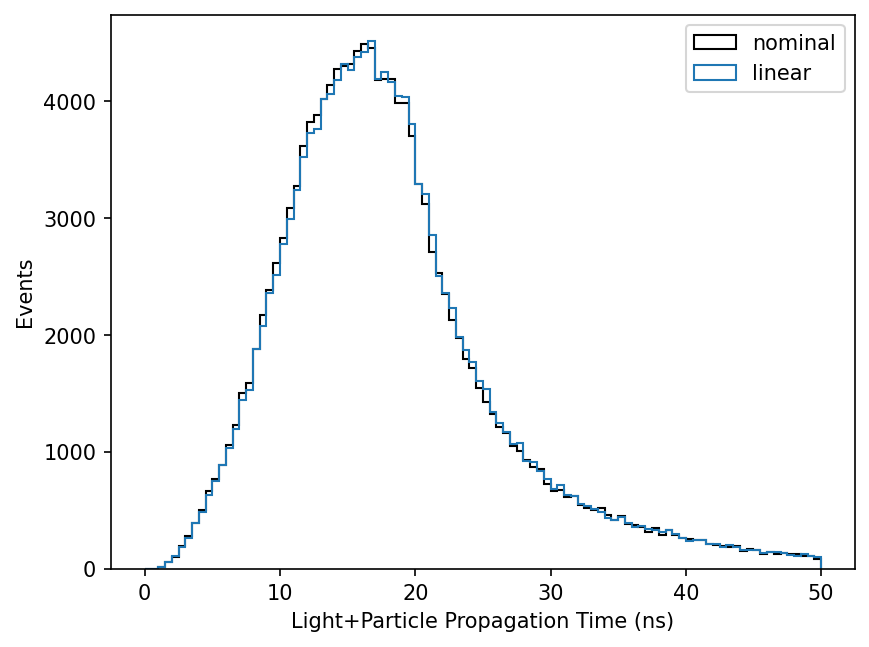

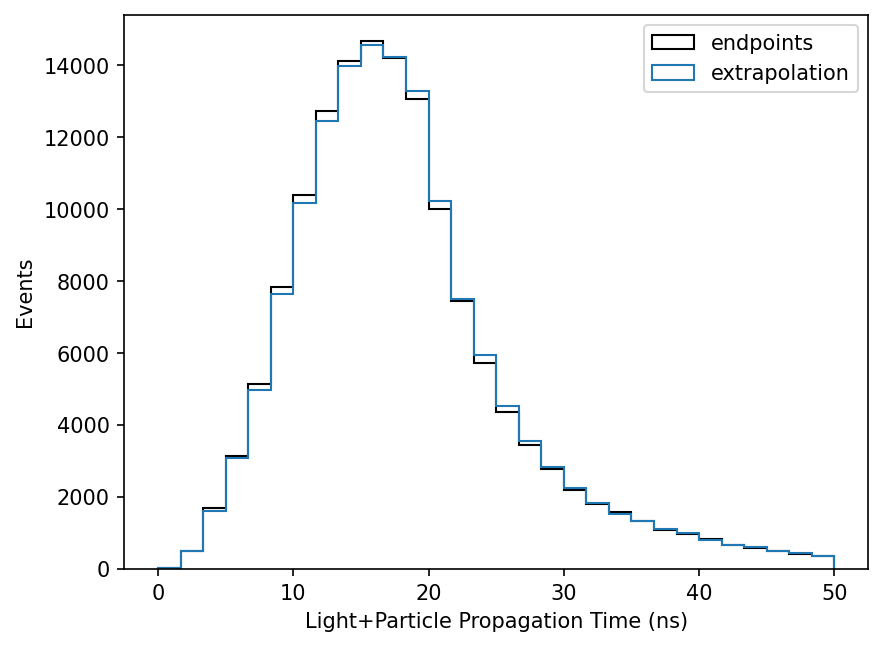

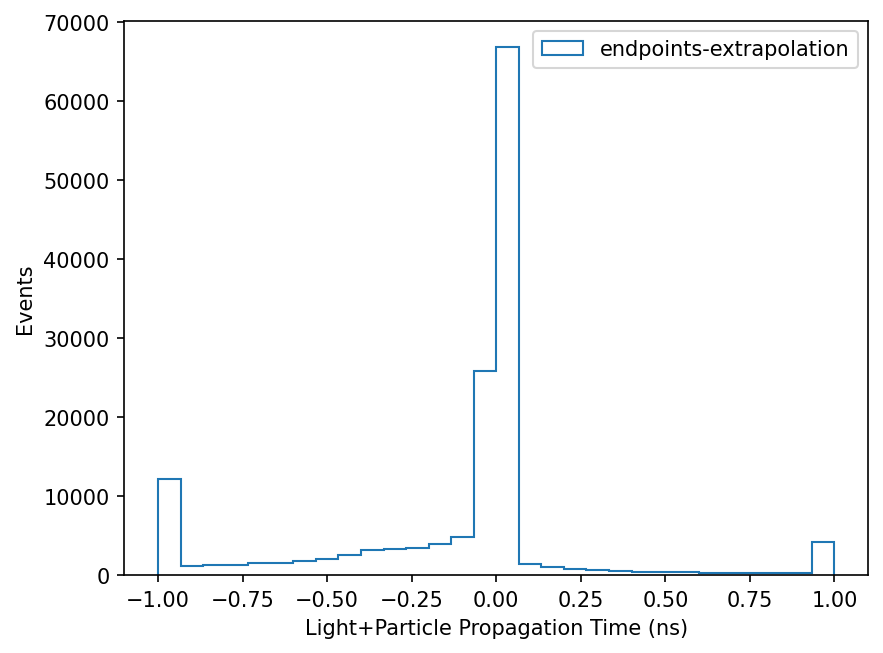

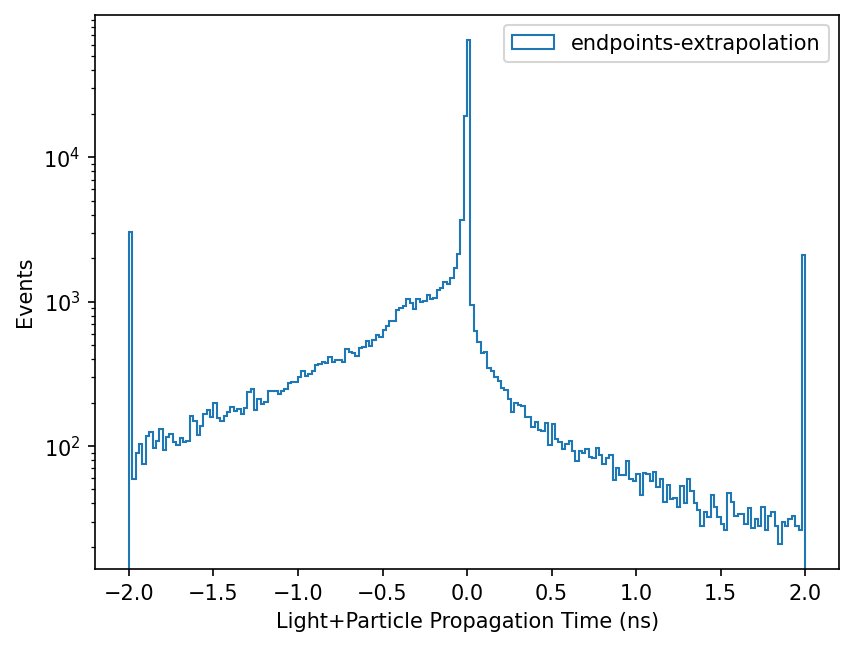

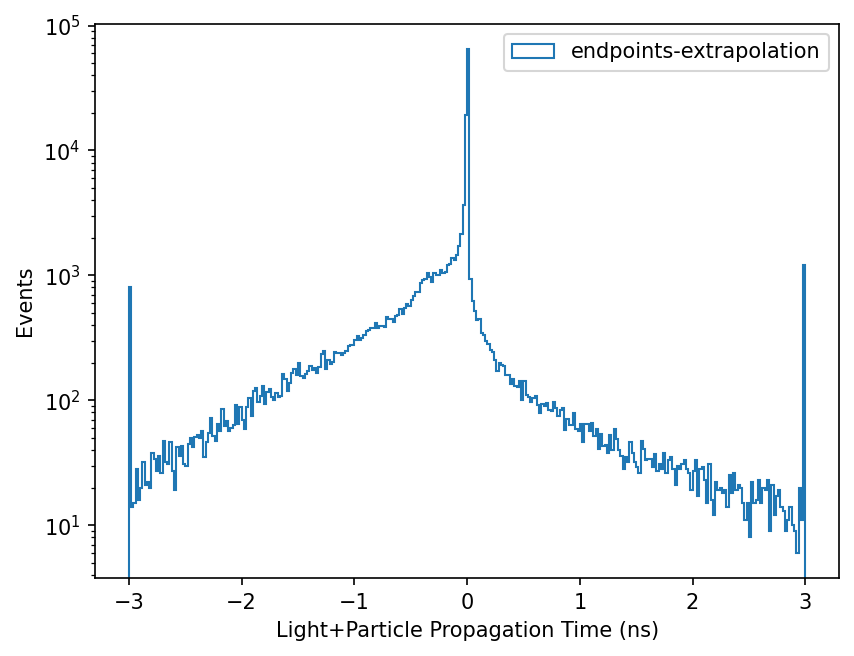

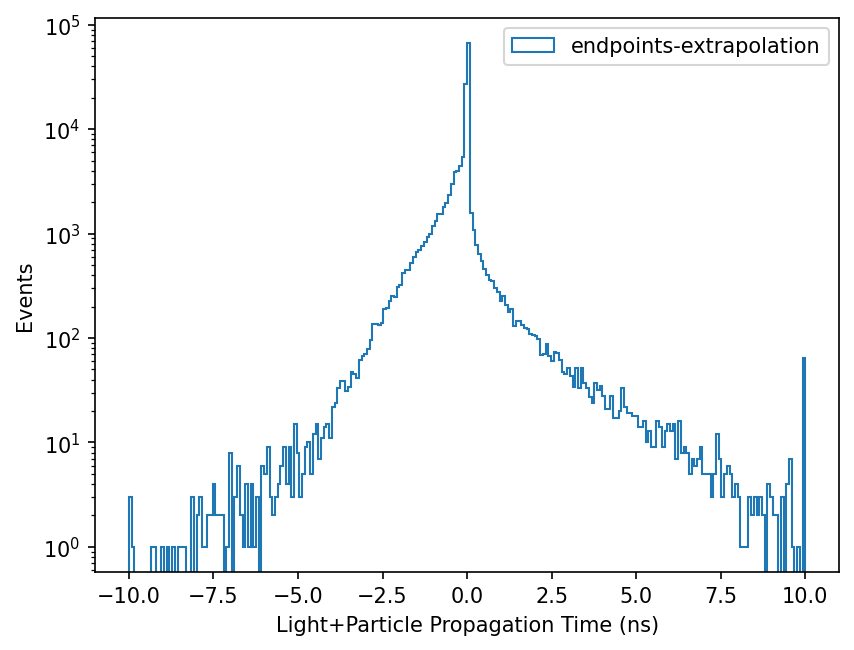

In [16]:
plt.figure(dpi=150)
plt.hist(PMT_TimeProp_all,bins=100,range=(0,50),label="nominal",histtype='step',color='black')
plt.hist(PMT_TimeProp_full_all,bins=100,range=(0,50),label='linear',histtype='step')
plt.ylabel("Events")
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.legend()
plt.show()

plt.figure(dpi=150)
plt.hist(PMT_TimeProp_all,bins=30,range=(0,50),label="endpoints",histtype='step',color='black')
plt.hist(PMT_TimeProp_full_all,bins=30,range=(0,50),label='extrapolation',histtype='step')
plt.ylabel("Events")
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.legend()
plt.show()

plt.figure(dpi=150)
plt.hist(np.clip(diff_full,-1,1),bins=30,range=(-1,1),label='endpoints-extrapolation',histtype='step')
plt.ylabel("Events")
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.legend()
plt.show()

plt.figure(dpi=150)
plt.hist(np.clip(diff_full,-2,2),bins=200,range=(-2,2),label='endpoints-extrapolation',histtype='step')
plt.ylabel("Events")
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.legend()
plt.yscale('log')
plt.show()

plt.figure(dpi=150)
plt.hist(np.clip(diff_full,-3,3),bins=300,range=(-3,3),label='endpoints-extrapolation',histtype='step')
plt.ylabel("Events")
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.legend()
plt.yscale('log')
plt.show()

plt.figure(dpi=150)
plt.hist(np.clip(diff_full,-10,10),bins=250,range=(-10,10),label='endpoints-extrapolation',histtype='step')
plt.ylabel("Events")
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.legend()
plt.yscale('log')
plt.show()

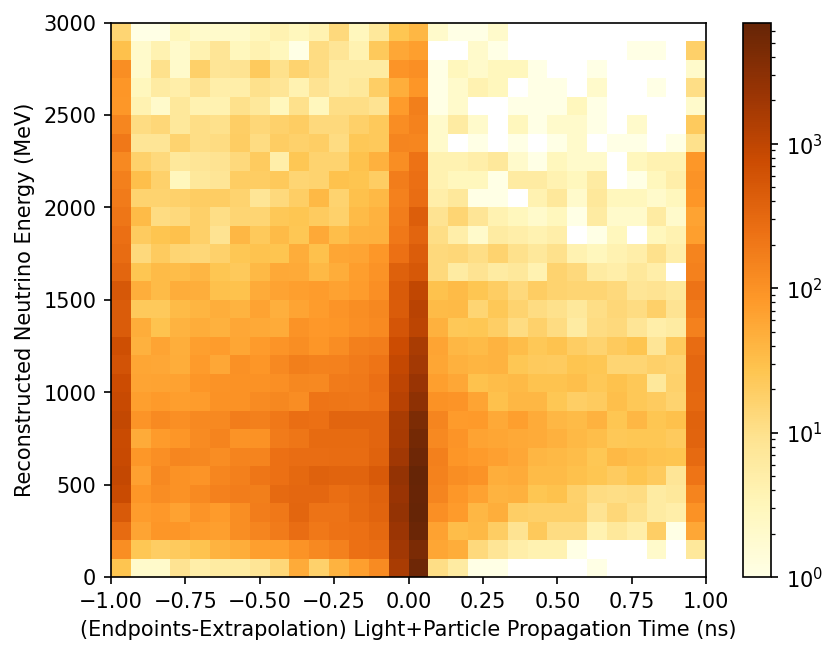

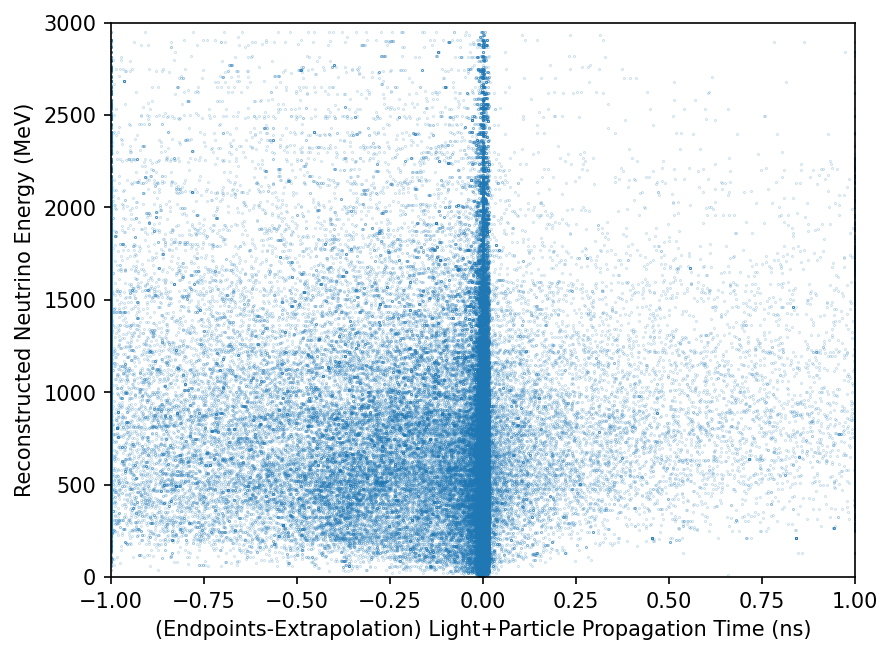

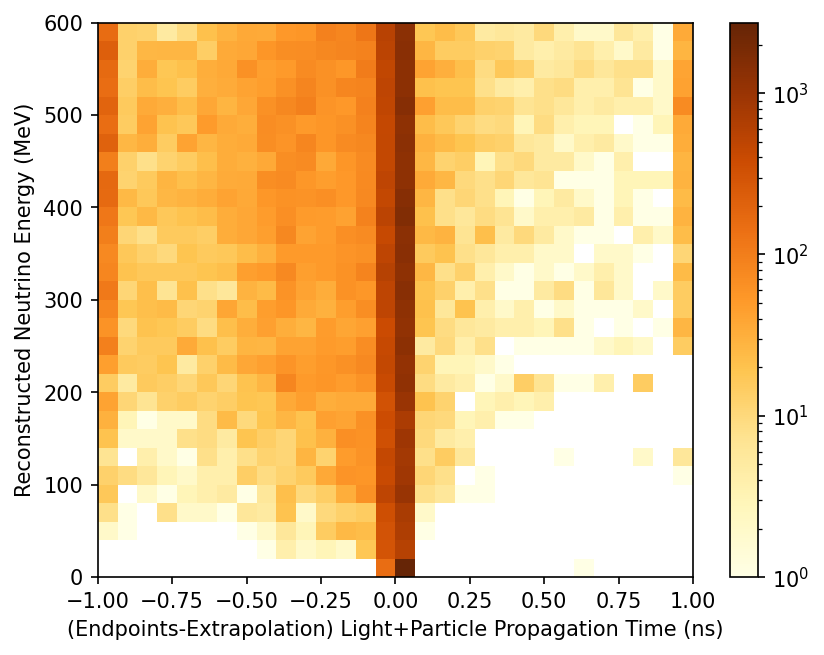

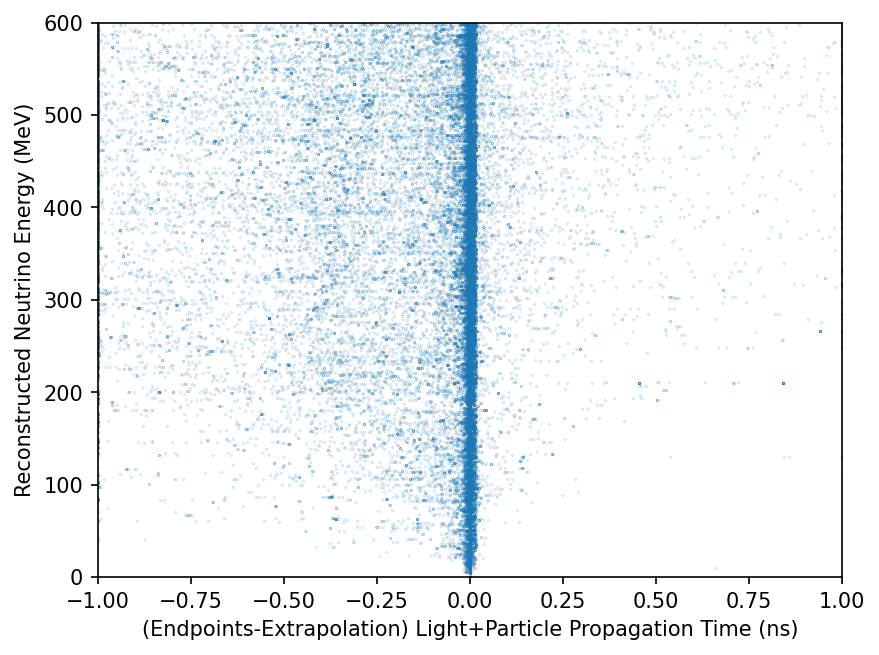

In [17]:
dist, x, y = np.histogram2d(np.clip(diff_full,-1,1),kine_reco_Enu_all,bins=(30,30),range=((-1,1),(0,3000)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("(Endpoints-Extrapolation) Light+Particle Propagation Time (ns)")
plt.show()

plt.figure(dpi=150)
plt.scatter(np.clip(diff_full,-1,1),kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,3000)
plt.xlabel("(Endpoints-Extrapolation) Light+Particle Propagation Time (ns)")
plt.xlim((-1,1))
plt.show()


dist, x, y = np.histogram2d(np.clip(diff_full,-1,1),kine_reco_Enu_all,bins=(30,30),range=((-1,1),(0,600)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("(Endpoints-Extrapolation) Light+Particle Propagation Time (ns)")
plt.show()

plt.figure(dpi=150)
plt.scatter(np.clip(diff_full,-1,1),kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,600)
plt.xlabel("(Endpoints-Extrapolation) Light+Particle Propagation Time (ns)")
plt.xlim((-1,1))
plt.show()

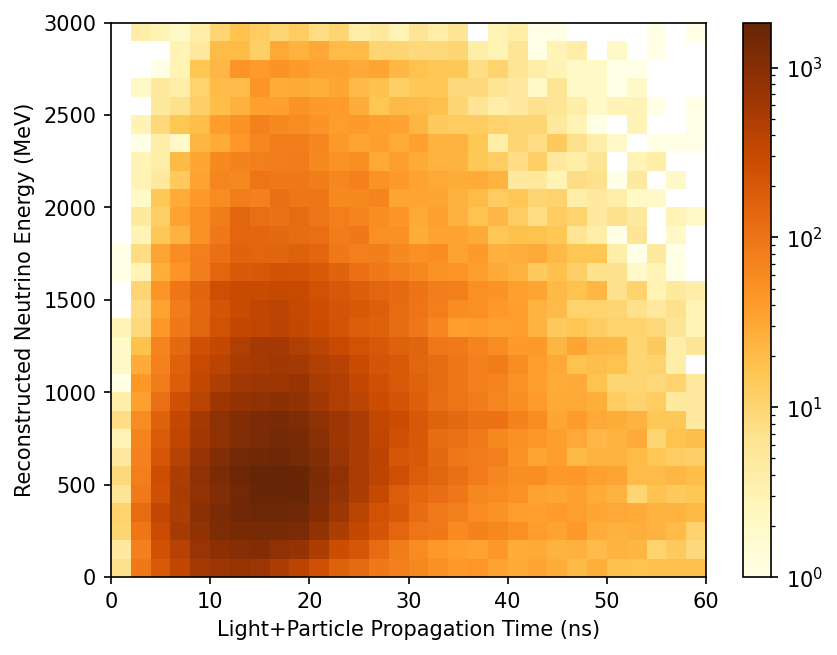

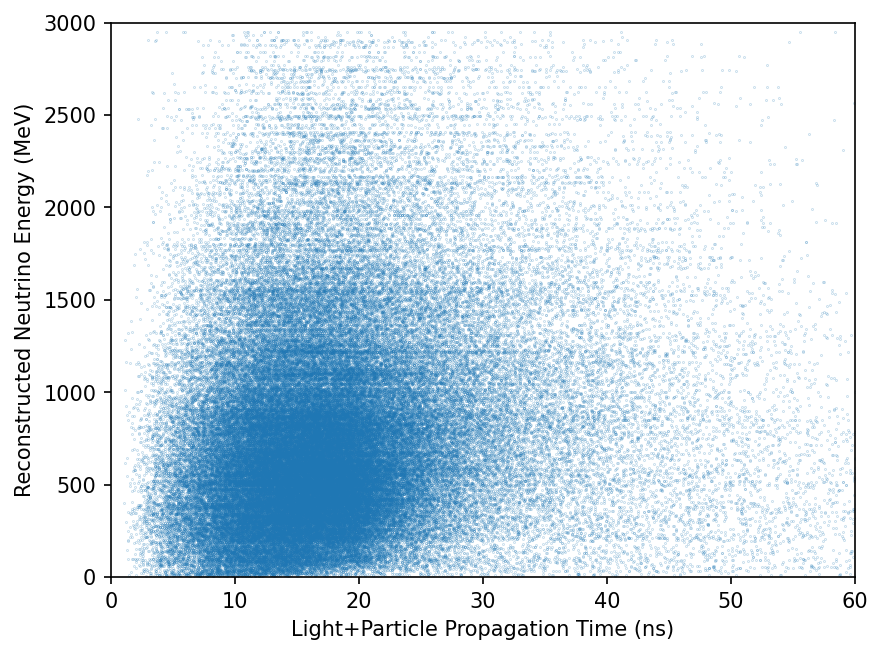

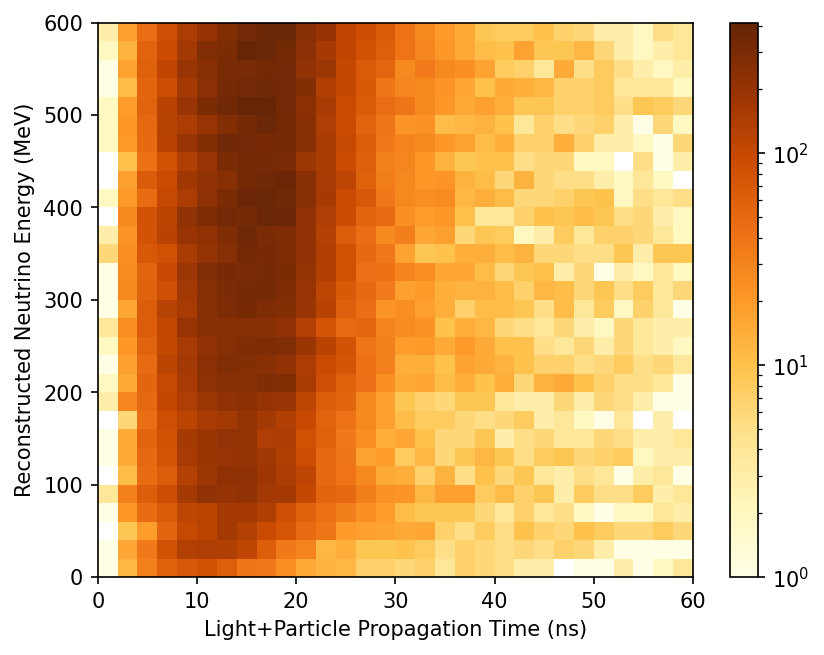

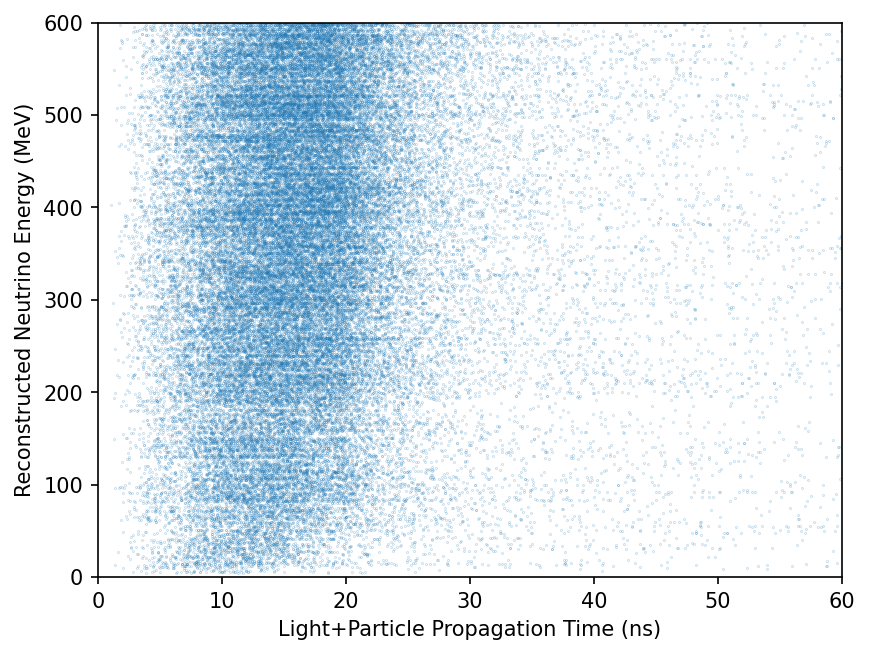

In [18]:
dist, x, y = np.histogram2d(PMT_TimeProp_full_all,kine_reco_Enu_all,bins=(30,30),range=((0,60),(0,3000)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.show()

plt.figure(dpi=150)
plt.scatter(PMT_TimeProp_full_all,kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,3000)
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.xlim((0,60))
plt.show()


dist, x, y = np.histogram2d(PMT_TimeProp_full_all,kine_reco_Enu_all,bins=(30,30),range=((0,60),(0,600)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.show()

plt.figure(dpi=150)
plt.scatter(PMT_TimeProp_full_all,kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,600)
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.xlim((0,60))
plt.show()

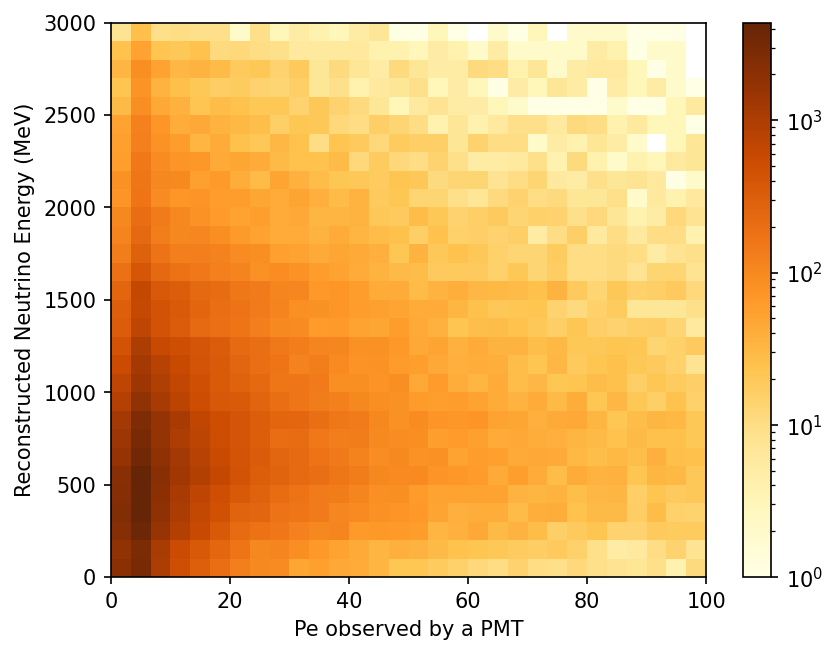

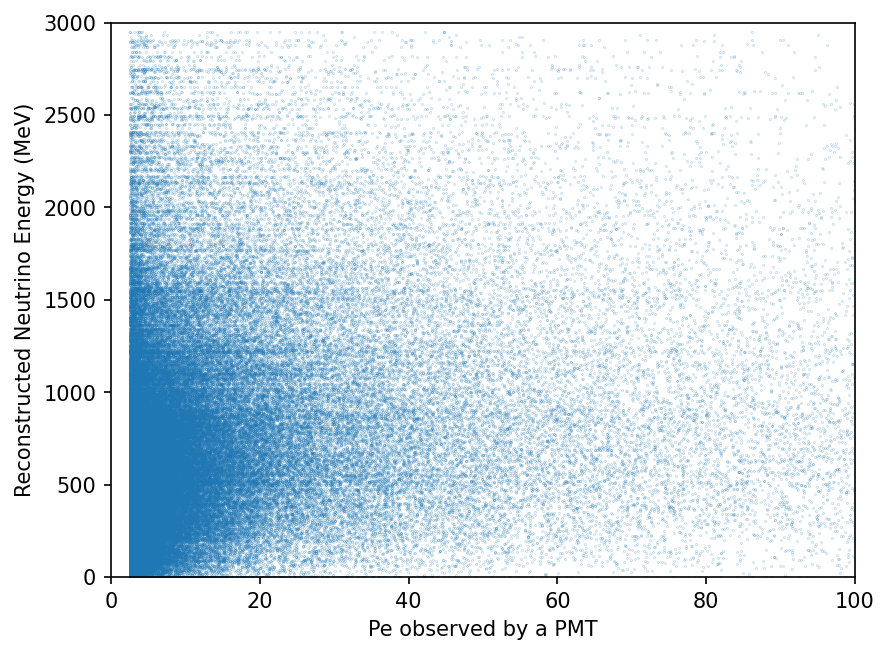

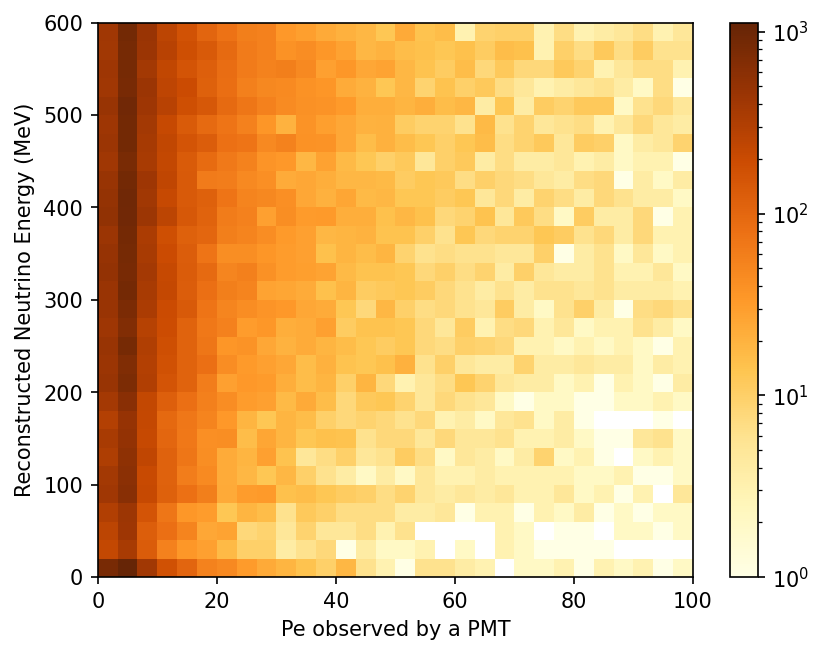

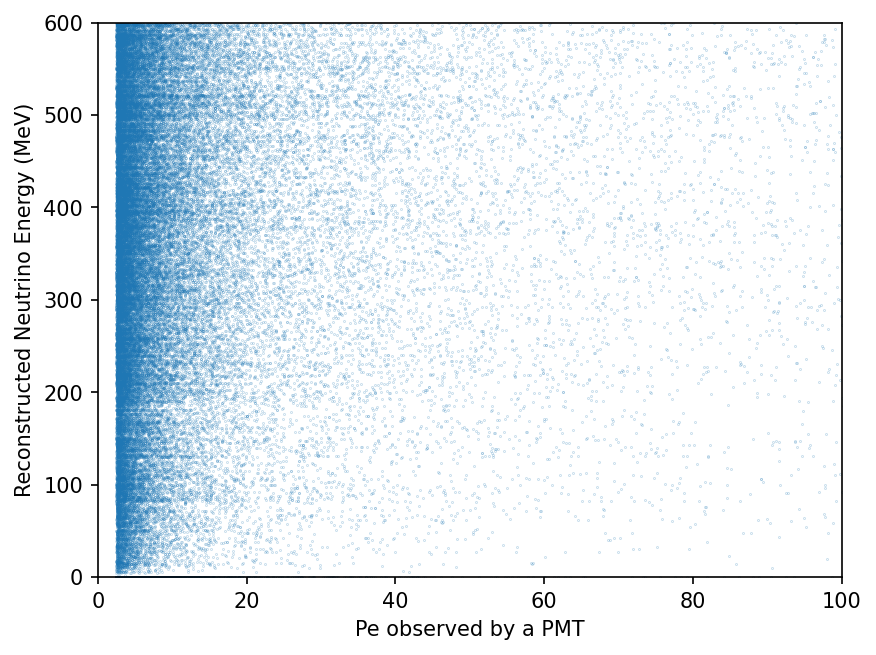

In [19]:
dist, x, y = np.histogram2d(PMT_Amp_all,kine_reco_Enu_all,bins=(30,30),range=((0,100),(0,3000)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("Pe observed by a PMT")
plt.show()

plt.figure(dpi=150)
plt.scatter(PMT_Amp_all,kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,3000)
plt.xlabel("Pe observed by a PMT")
plt.xlim((0,100))
plt.show()

dist, x, y = np.histogram2d(PMT_Amp_all,kine_reco_Enu_all,bins=(30,30),range=((0,100),(0,600)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("Pe observed by a PMT")
plt.show()

plt.figure(dpi=150)
plt.scatter(PMT_Amp_all,kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,600)
plt.xlabel("Pe observed by a PMT")
plt.xlim((0,100))
plt.show()

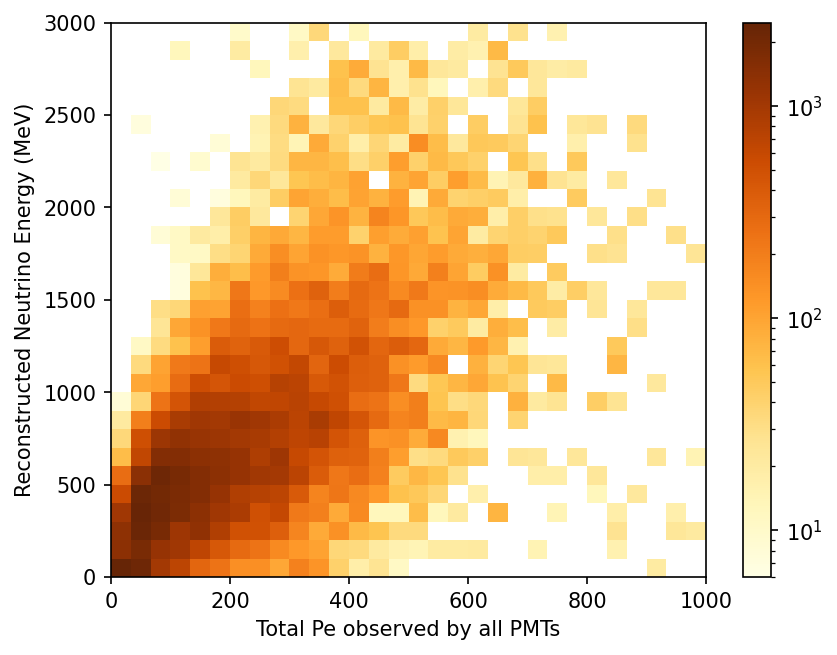

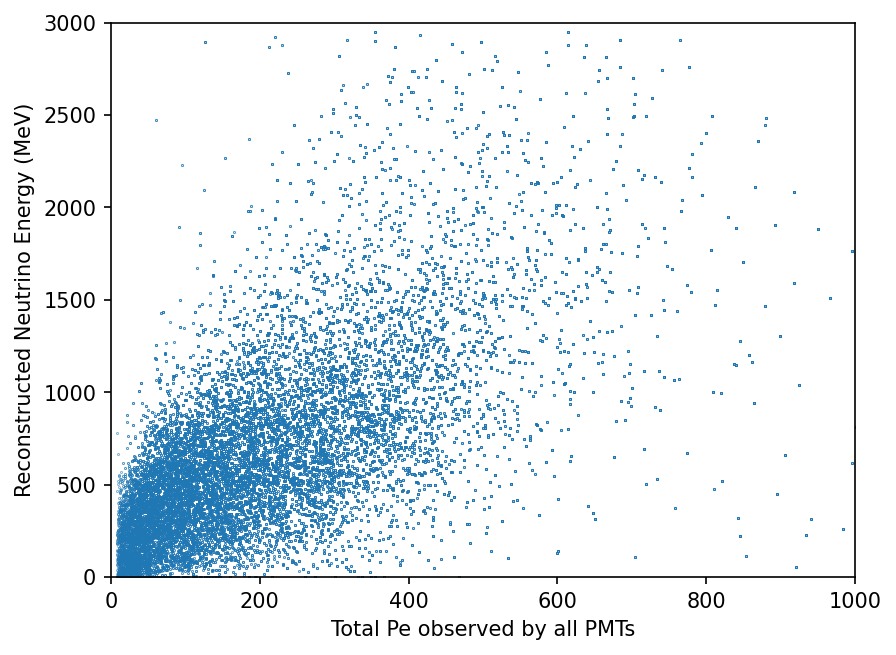

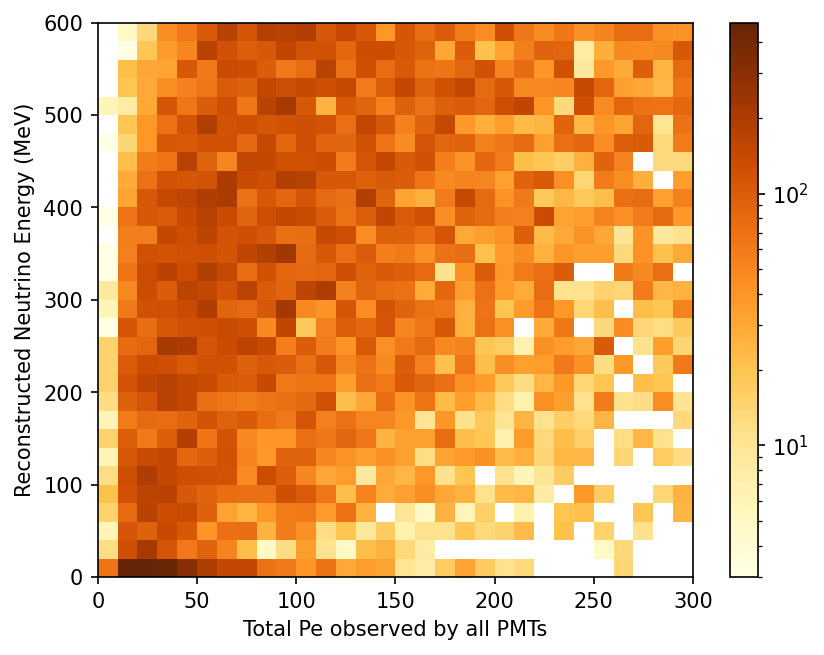

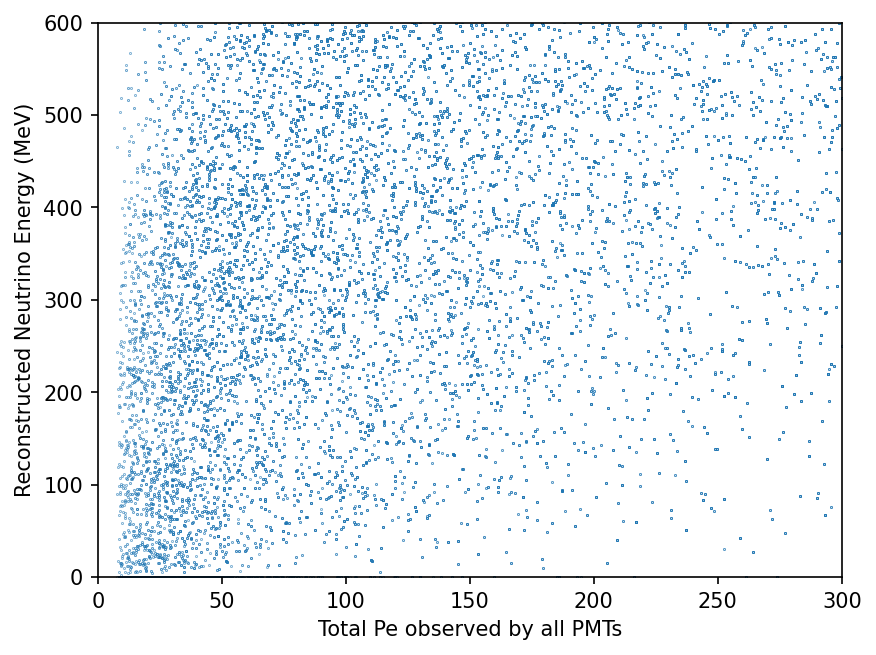

In [20]:
dist, x, y = np.histogram2d(Ph_Tot_all,kine_reco_Enu_all,bins=(30,30),range=((0,1000),(0,3000)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("Total Pe observed by all PMTs")
plt.show()

plt.figure(dpi=150)
plt.scatter(Ph_Tot_all,kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,3000)
plt.xlabel("Total Pe observed by all PMTs")
plt.xlim((0,1000))
plt.show()

dist, x, y = np.histogram2d(Ph_Tot_all,kine_reco_Enu_all,bins=(30,30),range=((0,300),(0,600)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("Total Pe observed by all PMTs")
plt.show()

plt.figure(dpi=150)
plt.scatter(Ph_Tot_all,kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,600)
plt.xlabel("Total Pe observed by all PMTs")
plt.xlim((0,300))
plt.show()

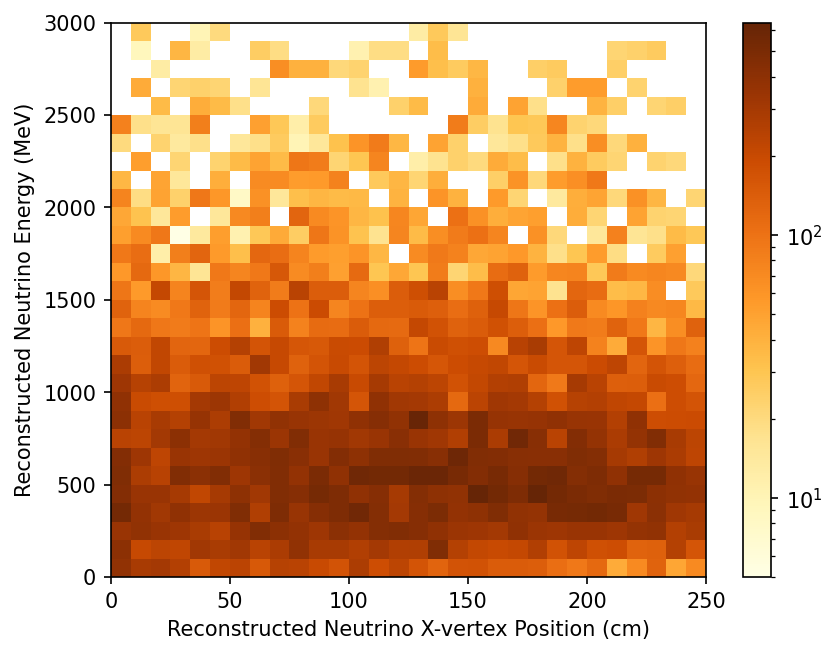

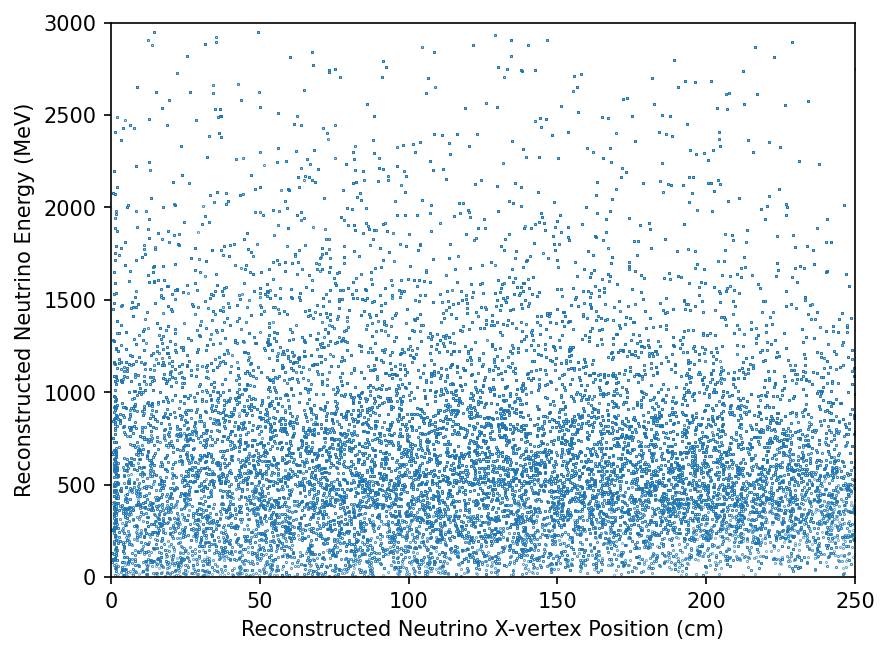

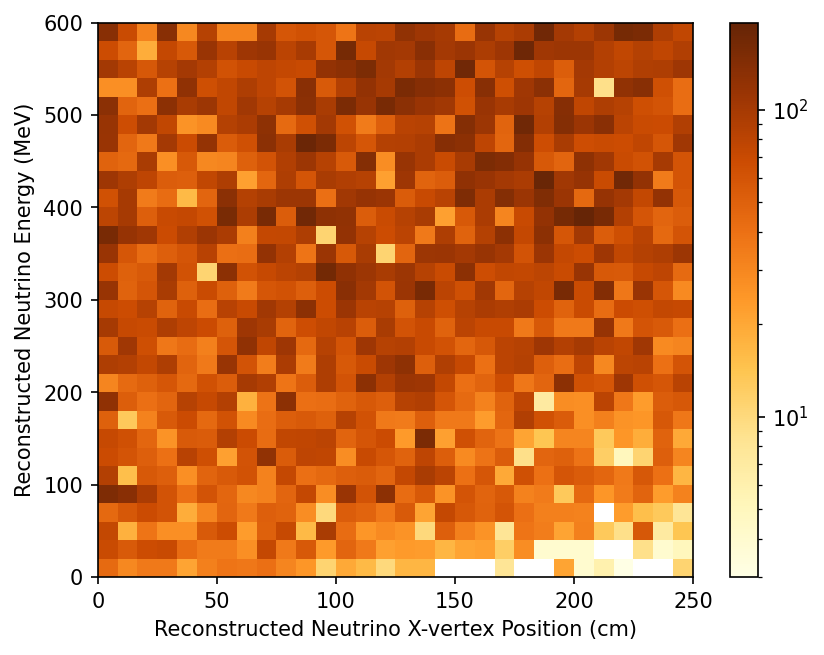

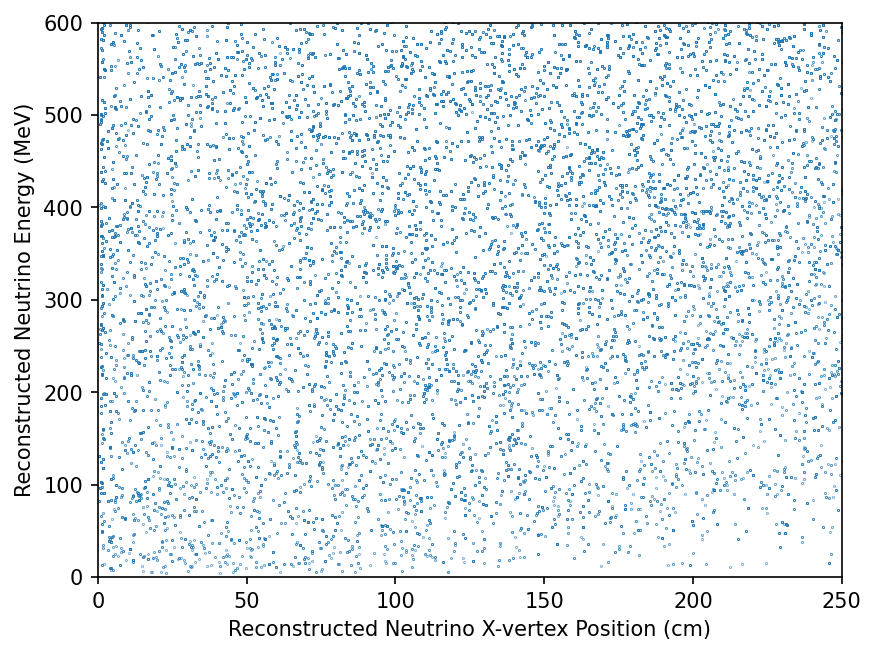

In [21]:
dist, x, y = np.histogram2d(reco_nuvtxX_all,kine_reco_Enu_all,bins=(30,30),range=((0,250),(0,3000)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.show()

plt.figure(dpi=150)
plt.scatter(reco_nuvtxX_all,kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,3000)
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.xlim((0,250))
plt.show()


dist, x, y = np.histogram2d(reco_nuvtxX_all,kine_reco_Enu_all,bins=(30,30),range=((0,250),(0,600)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.show()

plt.figure(dpi=150)
plt.scatter(reco_nuvtxX_all,kine_reco_Enu_all,s=0.01)
plt.ylabel("Reconstructed Neutrino Energy (MeV)")
plt.ylim(0,600)
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.xlim((0,250))
plt.show()

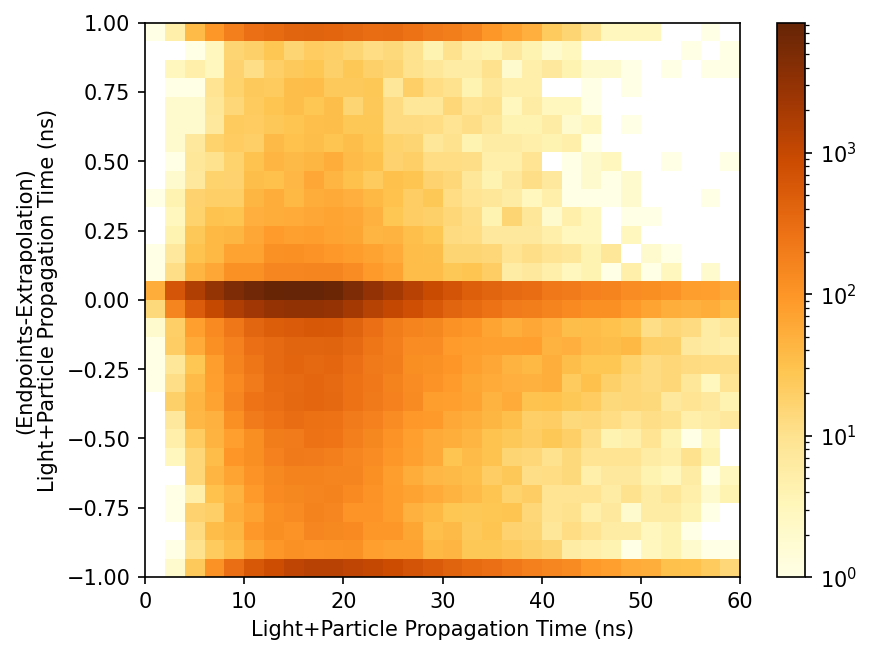

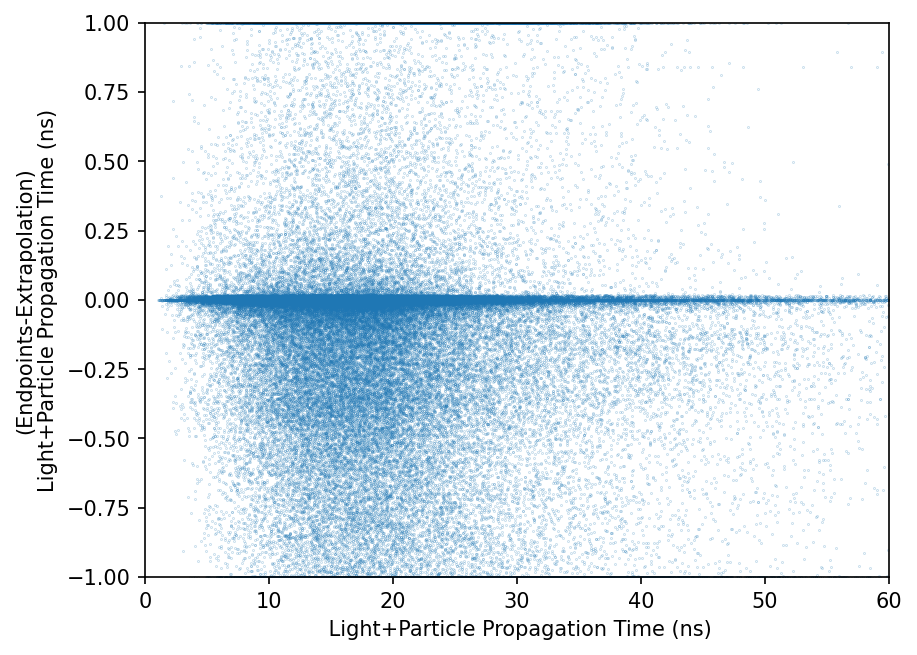

In [22]:
dist, x, y = np.histogram2d(PMT_TimeProp_full_all,np.clip(diff_full,-1,1),bins=(30,30),range=((0,60),(-1,1)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("(Endpoints-Extrapolation)"+"\n"+"Light+Particle Propagation Time (ns)")
plt.xlabel("Light+Particle Propagation Time (ns)")
plt.show()

plt.figure(dpi=150)
plt.scatter(PMT_TimeProp_full_all,np.clip(diff_full,-1,1),s=0.01)
plt.ylabel("(Endpoints-Extrapolation)"+"\n"+"Light+Particle Propagation Time (ns)")
plt.ylim((-1,1))
plt.xlabel(" Light+Particle Propagation Time (ns)")
plt.xlim(0,60)
plt.show()

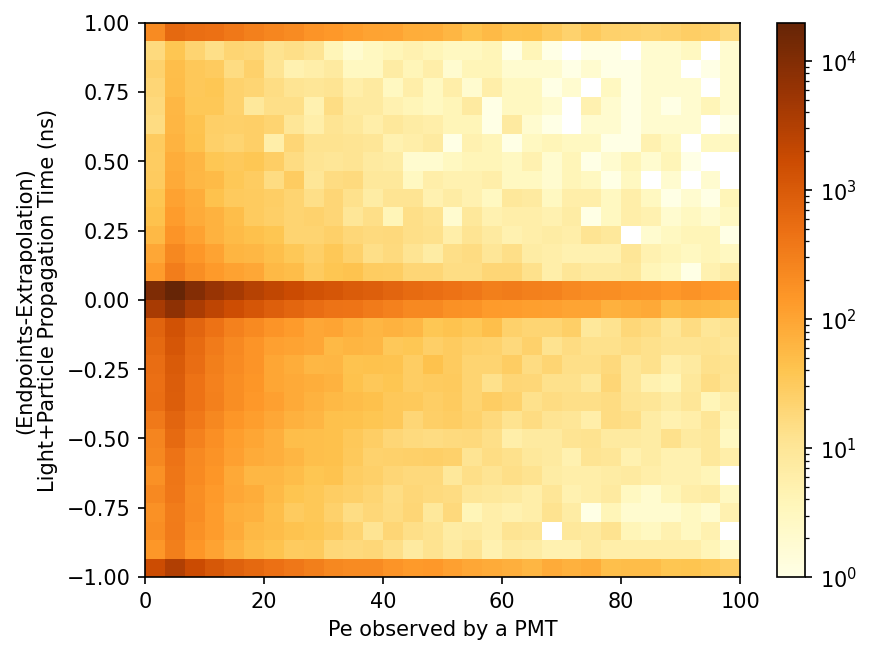

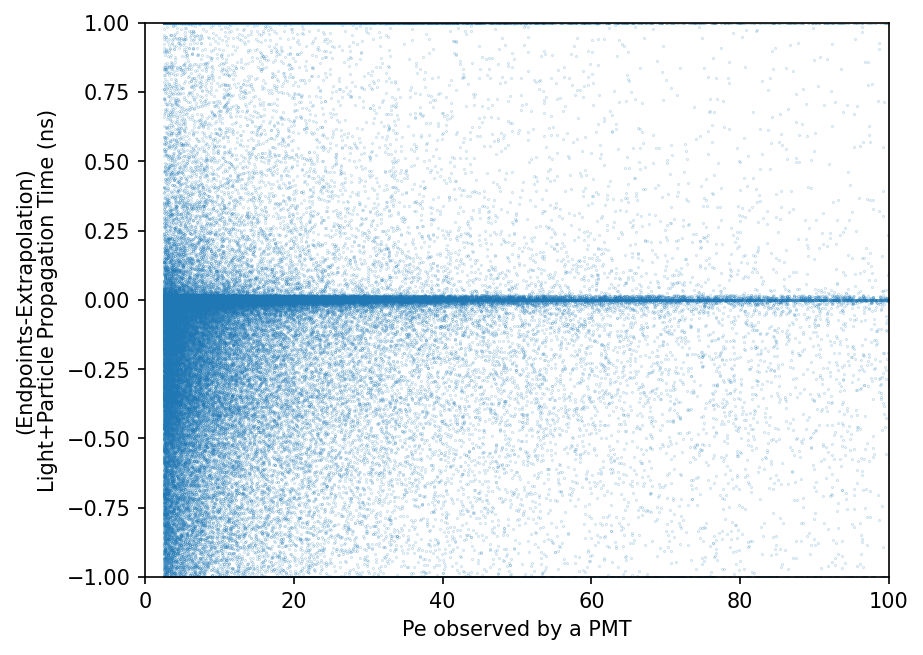

In [23]:
dist, x, y = np.histogram2d(PMT_Amp_all,np.clip(diff_full,-1,1),bins=(30,30),range=((0,100),(-1,1)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("(Endpoints-Extrapolation)"+"\n"+"Light+Particle Propagation Time (ns)")
plt.xlabel("Pe observed by a PMT")
plt.show()

plt.figure(dpi=150)
plt.scatter(PMT_Amp_all,np.clip(diff_full,-1,1),s=0.01)
plt.ylabel("(Endpoints-Extrapolation)"+"\n"+"Light+Particle Propagation Time (ns)")
plt.ylim((-1,1))
plt.xlabel("Pe observed by a PMT")
plt.xlim(0,100)
plt.show()

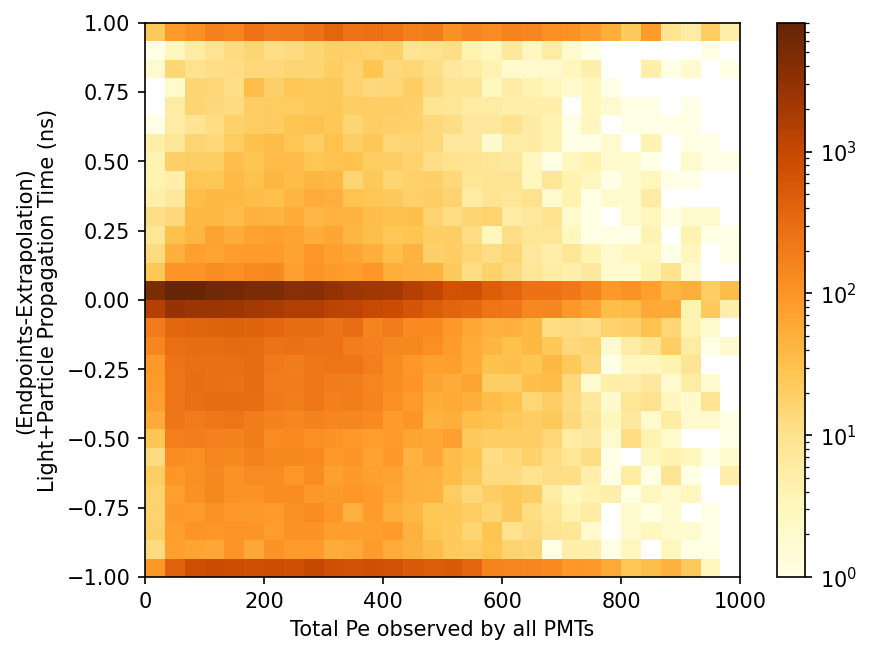

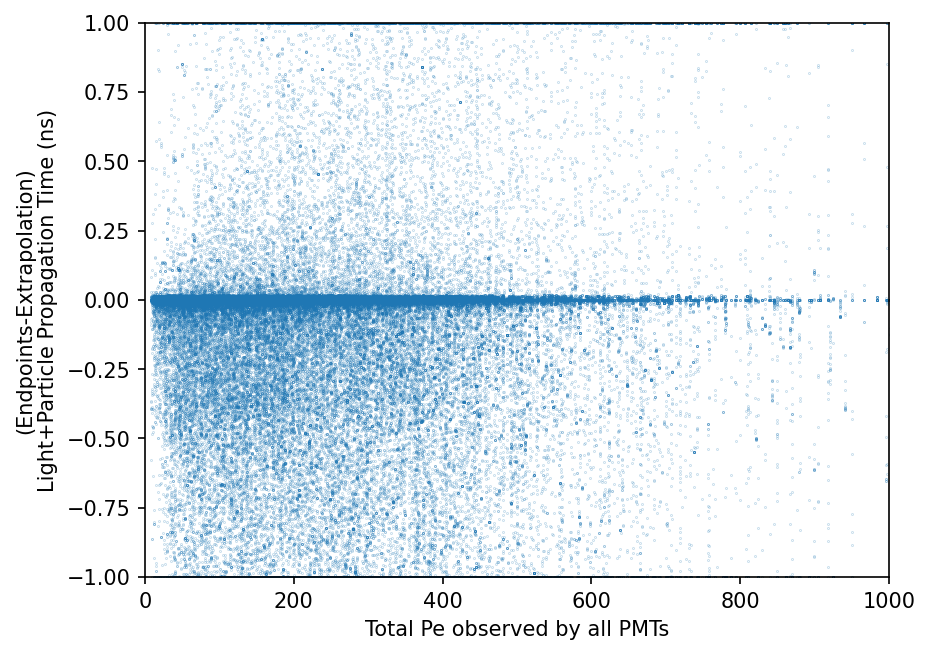

In [24]:
dist, x, y = np.histogram2d(Ph_Tot_all,np.clip(diff_full,-1,1),bins=(30,30),range=((0,1000),(-1,1)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("(Endpoints-Extrapolation)"+"\n"+"Light+Particle Propagation Time (ns)")
plt.xlabel("Total Pe observed by all PMTs")
plt.show()

plt.figure(dpi=150)
plt.scatter(Ph_Tot_all,np.clip(diff_full,-1,1),s=0.01)
plt.ylabel("(Endpoints-Extrapolation)"+"\n"+"Light+Particle Propagation Time (ns)")
plt.ylim((-1,1))
plt.xlabel("Total Pe observed by all PMTs")
plt.xlim(0,1000)
plt.show()

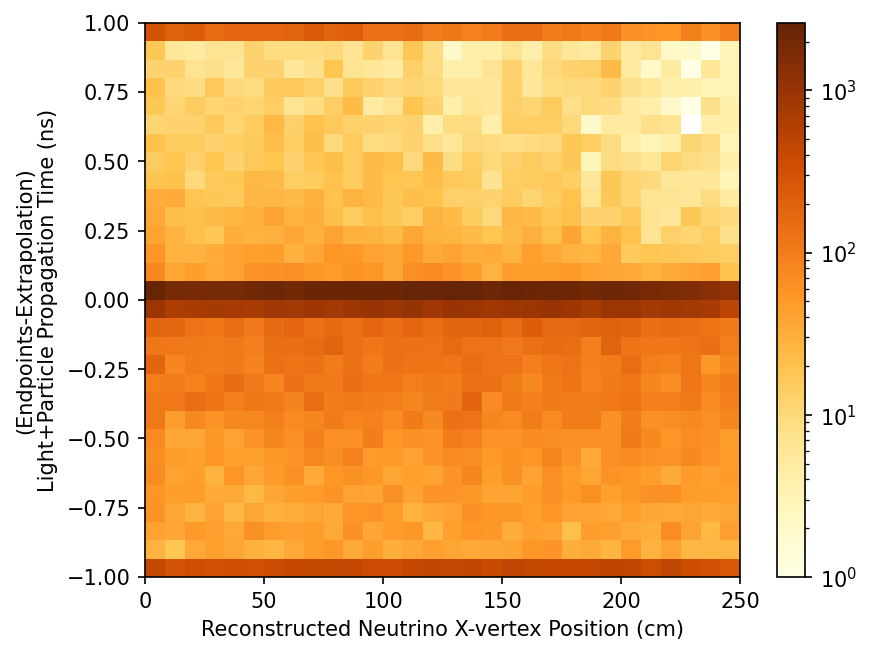

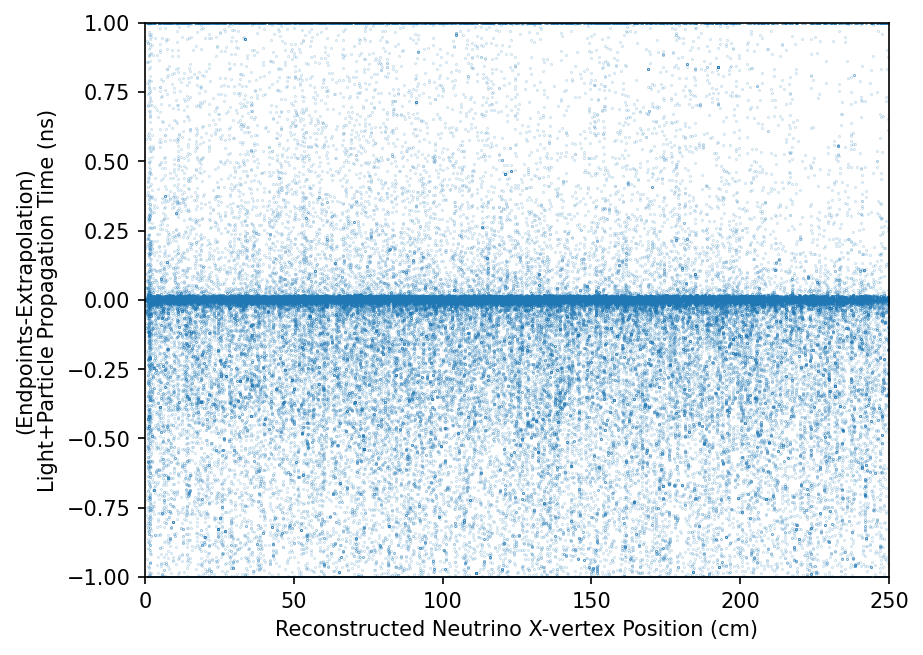

In [25]:
dist, x, y = np.histogram2d(reco_nuvtxX_all,np.clip(diff_full,-1,1),bins=(30,30),range=((0,250),(-1,1)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("(Endpoints-Extrapolation)"+"\n"+"Light+Particle Propagation Time (ns)")
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.show()

plt.figure(dpi=150)
plt.scatter(reco_nuvtxX_all,np.clip(diff_full,-1,1),s=0.01)
plt.ylabel("(Endpoints-Extrapolation)"+"\n"+"Light+Particle Propagation Time (ns)")
plt.ylim((-1,1))
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.xlim(0,250)
plt.show()

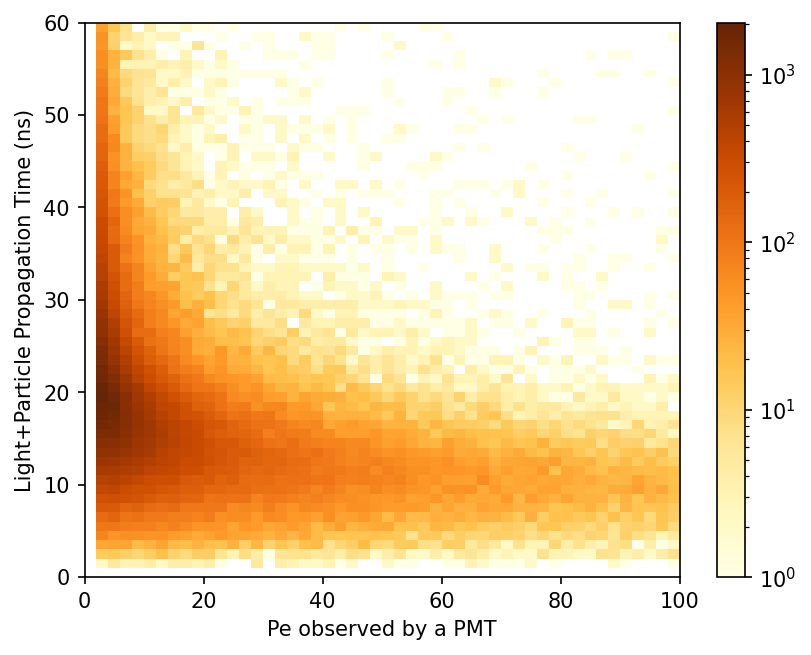

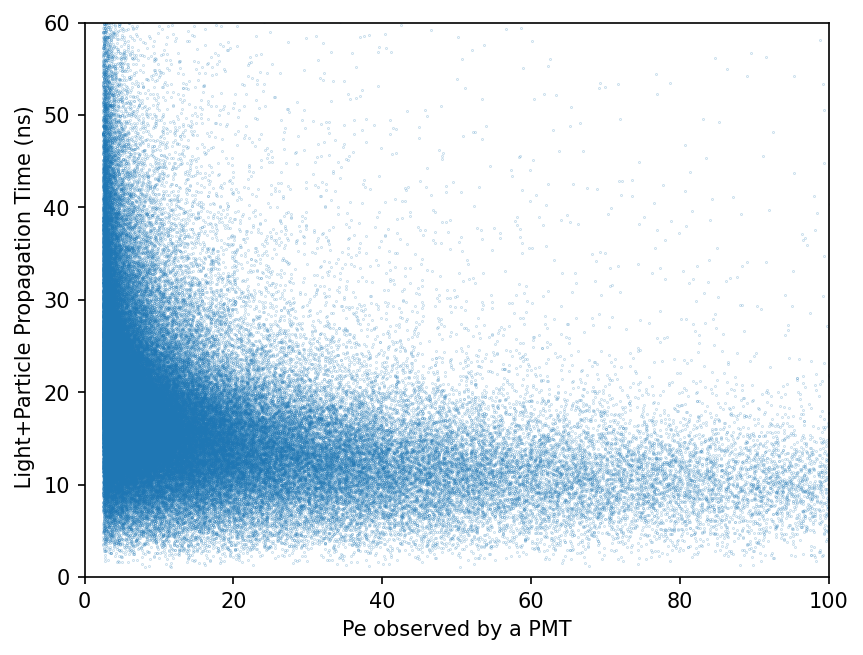

In [26]:
dist, x, y = np.histogram2d(PMT_Amp_all,PMT_TimeProp_full_all,bins=(50,60),range=((0,100),(0,60)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Light+Particle Propagation Time (ns)")
plt.xlabel("Pe observed by a PMT")
plt.show()

plt.figure(dpi=150)
plt.scatter(PMT_Amp_all,PMT_TimeProp_full_all,s=0.01)
plt.ylabel(" Light+Particle Propagation Time (ns)")
plt.ylim(0,60)
plt.xlabel("Pe observed by a PMT")
plt.xlim(0,100)
plt.show()

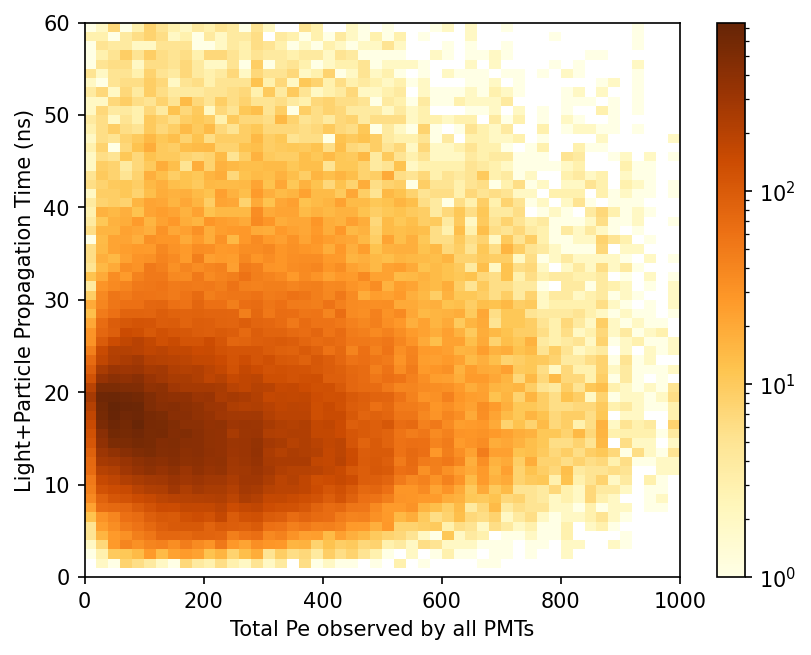

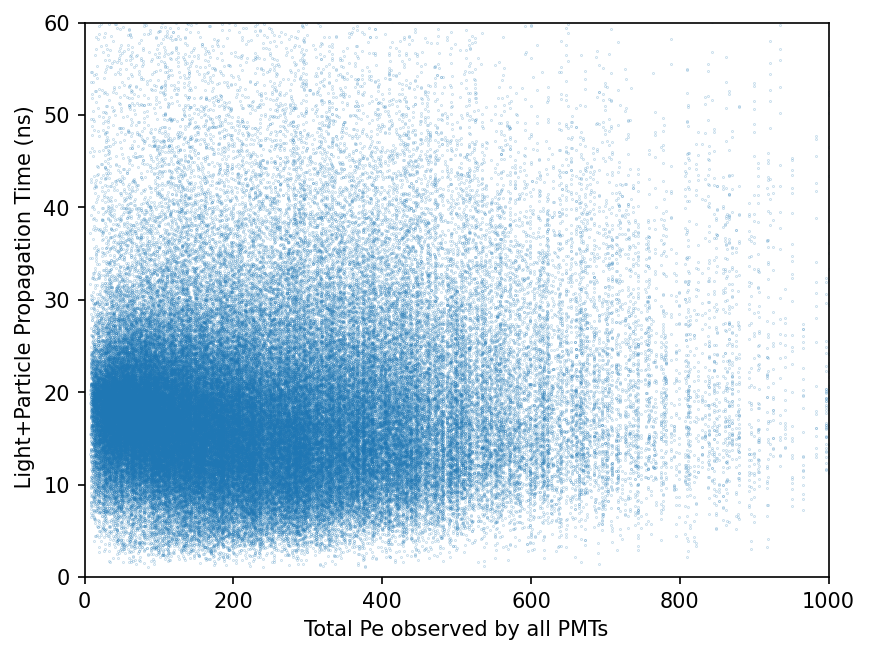

In [27]:
dist, x, y = np.histogram2d(Ph_Tot_all,PMT_TimeProp_full_all,bins=(50,60),range=((0,1000),(0,60)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Light+Particle Propagation Time (ns)")
plt.xlabel("Total Pe observed by all PMTs")
plt.show()

plt.figure(dpi=150)
plt.scatter(Ph_Tot_all,PMT_TimeProp_full_all,s=0.01)
plt.ylabel(" Light+Particle Propagation Time (ns)")
plt.ylim(0,60)
plt.xlabel("Total Pe observed by all PMTs")
plt.xlim(0,1000)
plt.show()

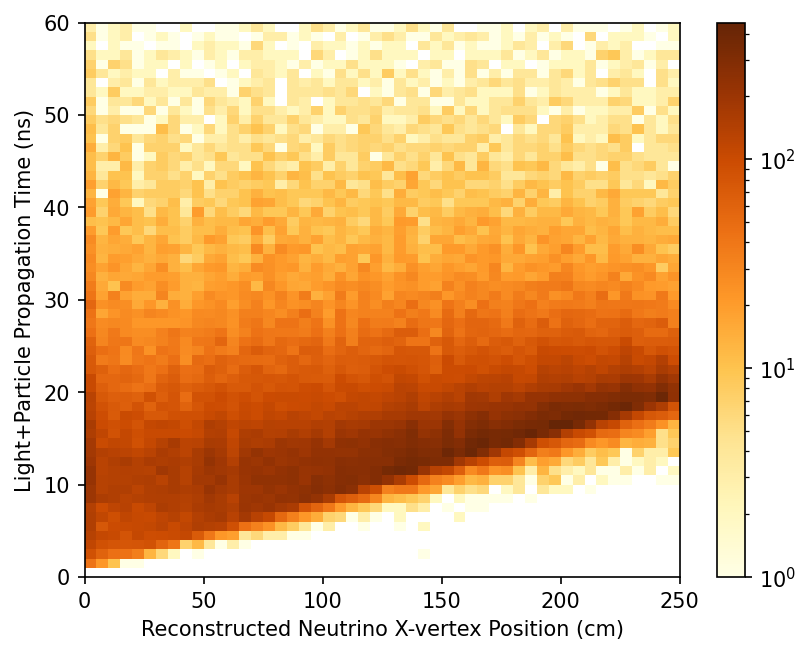

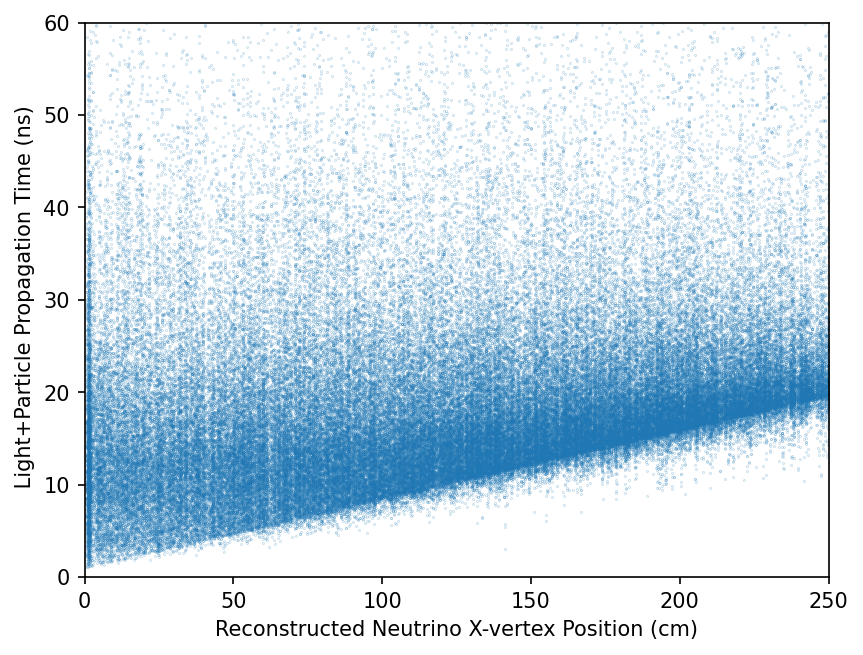

In [28]:
dist, x, y = np.histogram2d(reco_nuvtxX_all,PMT_TimeProp_full_all,bins=(50,60),range=((0,250),(0,60)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Light+Particle Propagation Time (ns)")
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.show()

plt.figure(dpi=150)
plt.scatter(reco_nuvtxX_all,PMT_TimeProp_full_all,s=0.01)
plt.ylabel(" Light+Particle Propagation Time (ns)")
plt.ylim(0,60)
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.xlim(0,250)
plt.show()

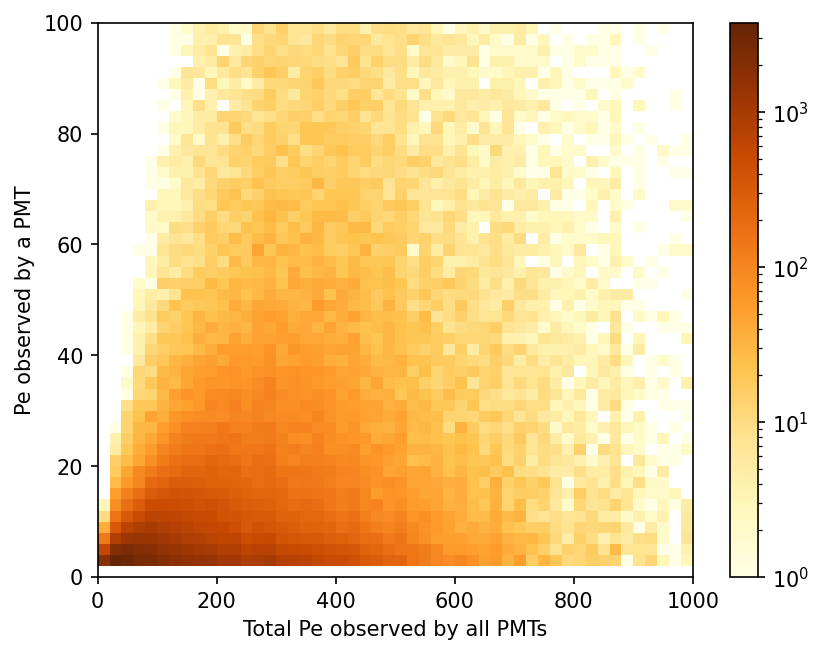

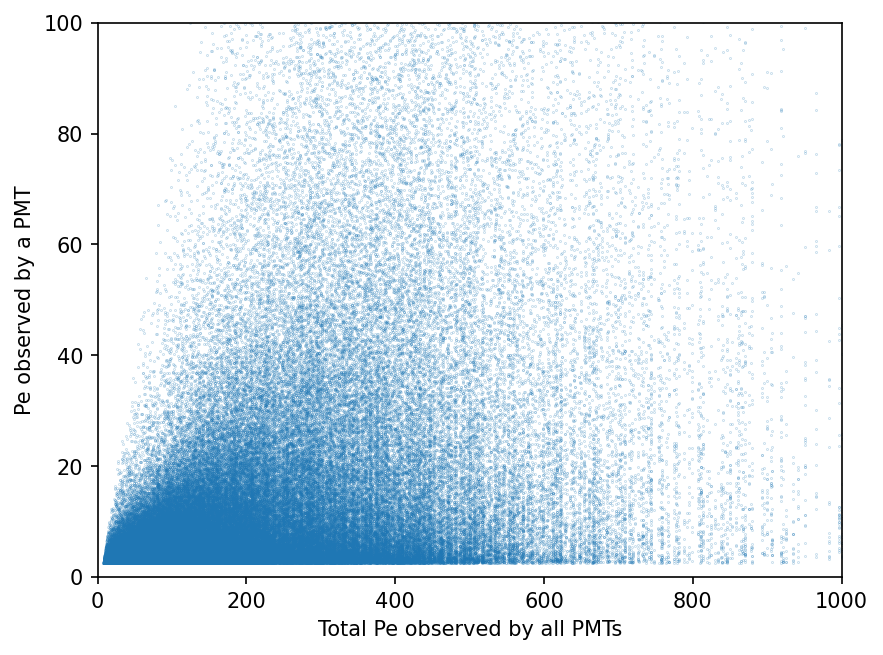

In [29]:
dist, x, y = np.histogram2d(Ph_Tot_all,PMT_Amp_all,bins=(50,50),range=((0,1000),(0,100)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Pe observed by a PMT")
plt.xlabel("Total Pe observed by all PMTs")
plt.show()

plt.figure(dpi=150)
plt.scatter(Ph_Tot_all,PMT_Amp_all,s=0.01)
plt.ylabel("Pe observed by a PMT")
plt.ylim(0,100)
plt.xlabel("Total Pe observed by all PMTs")
plt.xlim(0,1000)
plt.show()

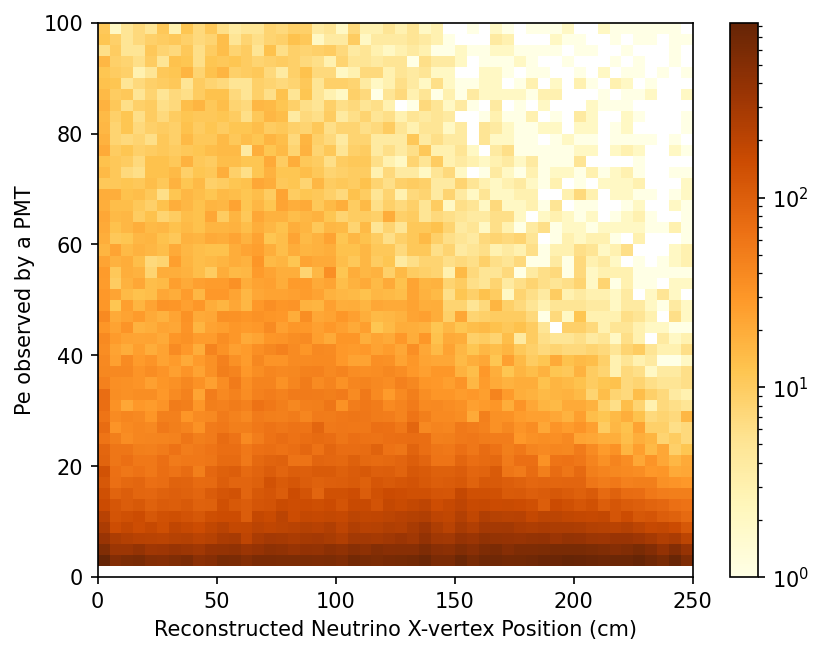

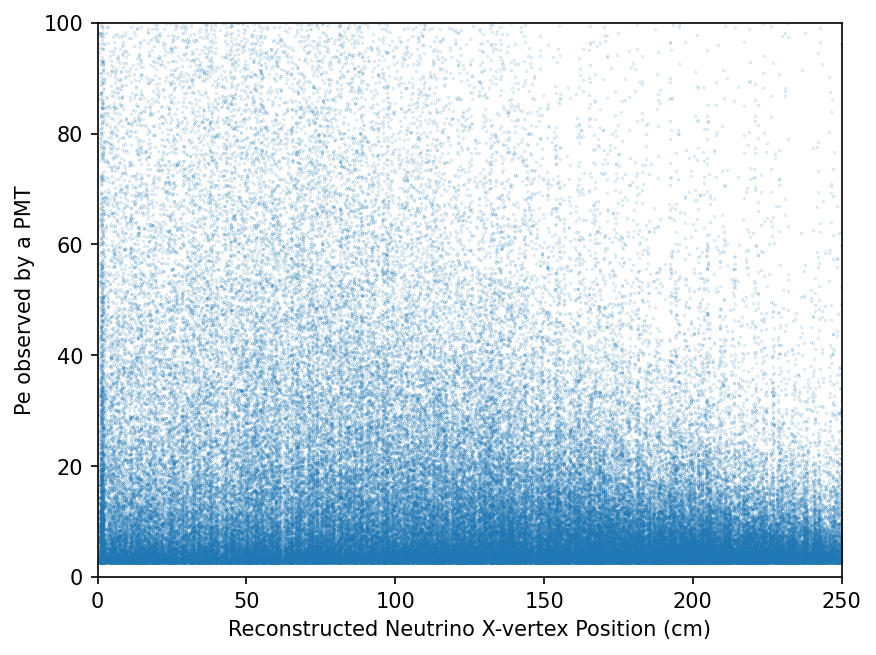

In [30]:
dist, x, y = np.histogram2d(reco_nuvtxX_all,PMT_Amp_all,bins=(50,50),range=((0,250),(0,100)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Pe observed by a PMT")
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.show()

plt.figure(dpi=150)
plt.scatter(reco_nuvtxX_all,PMT_Amp_all,s=0.01)
plt.ylabel("Pe observed by a PMT")
plt.ylim(0,100)
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.xlim(0,250)
plt.show()

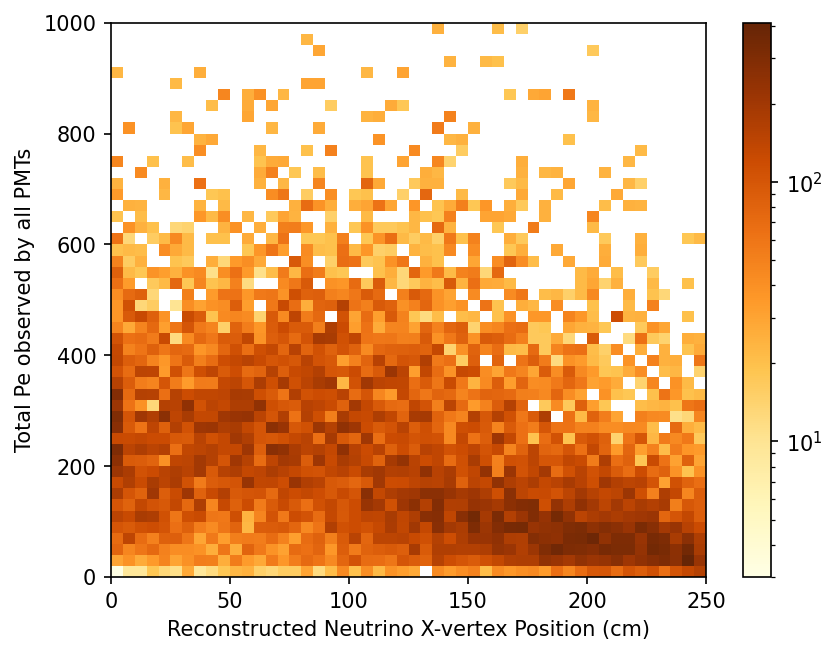

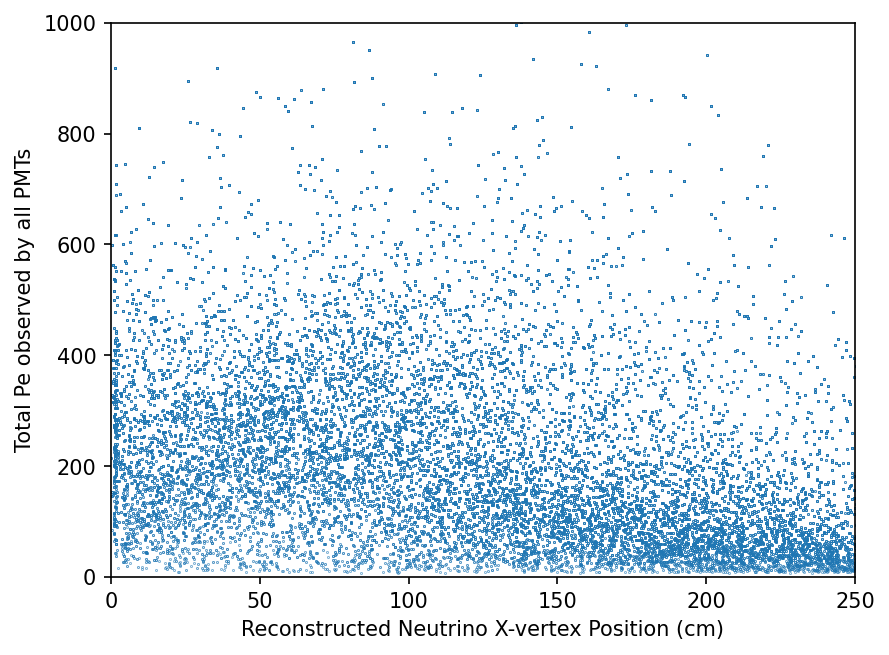

In [31]:
dist, x, y = np.histogram2d(reco_nuvtxX_all,Ph_Tot_all,bins=(50,50),range=((0,250),(0,1000)))
col_sum = dist.sum(axis=0)
row_sum = dist.sum(axis=1)
plt.figure(dpi=150)
c = plt.pcolormesh(x, y, dist.T,norm=colors.LogNorm(),cmap='YlOrBr')
plt.colorbar(c)
plt.ylabel("Total Pe observed by all PMTs")
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.show()

plt.figure(dpi=150)
plt.scatter(reco_nuvtxX_all,Ph_Tot_all,s=0.01)
plt.ylabel("Total Pe observed by all PMTs")
plt.ylim(0,1000)
plt.xlabel("Reconstructed Neutrino X-vertex Position (cm)")
plt.xlim(0,250)
plt.show()

# iteration 0

Query the df
Setting recalibrated times


100%|███████████████████████████████████| 11703/11703 [00:02<00:00, 4814.68it/s]


Setting Bins
Filling nominal with corrections histograms
Setting nominal with corrections averages
Filling nocor nominal histograms
Setting nocor nominal averages
Filling nominal histograms
Setting nominal averages
Filling nocor linear histograms
Setting nocor linear averages
Filling linear histograms
Setting linear averages
Filling sapcepoints histograms
Setting spacepoints averages
data nominal linear fit: m = -0.0371   b = 1.6896
1.099394519622555 0.5
data no cor linear fit: m = -0.3244   b = 6.7252
0.9438480811190403 0.956
data linear no cor linear fit: m = -0.3254   b = 6.756
0.5318248886000909 0.959
data spacepoints wi cor linear fit: m = -0.32   b = 6.0548
-4.513211726293074 0.952


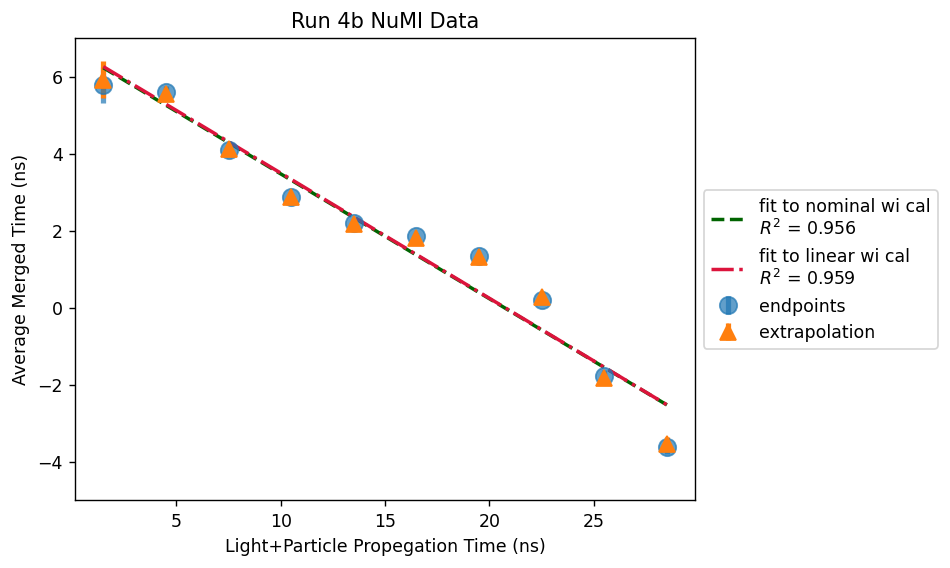

data nominal linear fit: m = -0.027   b = 0.7451
9.006645760813917 0.317
data wi cor linear fit: m = -0.0219   b = 1.1971
0.5118702626832156 0.894
data linear wi cor linear fit: m = -0.0218   b = 1.1532
1.0886175126772406 0.889
data spacepoints wi cor linear fit: m = -0.0191   b = 0.5264
0.20104335017822508 0.867


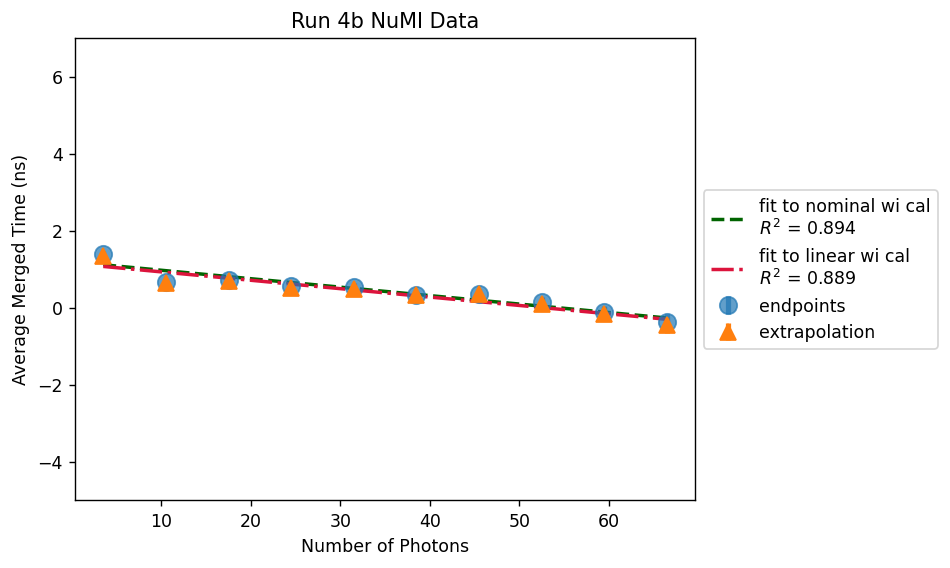

data nominal linear fit: m = -0.0017   b = 1.4529
0.7714507129294969 0.263
data wi cor linear fit: m = -0.0212   b = 5.5404
-16.8747448613232 0.951
data linear wi cor linear fit: m = -0.0219   b = 5.6583
-5.543012257858269 0.951
data spacepoints wi cor linear fit: m = -0.0217   b = 5.0224
3.466996521520322 0.955


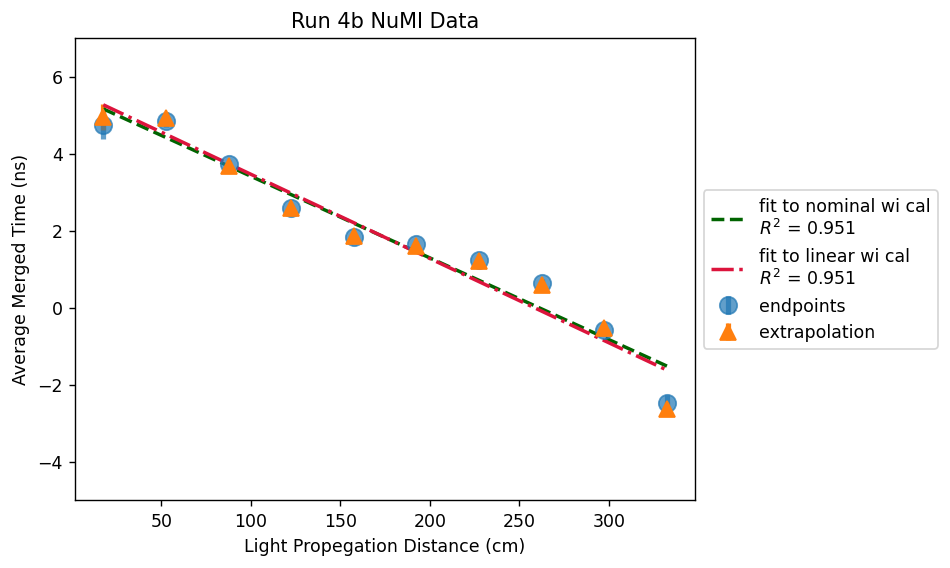

data nominal linear fit: m = -0.0049   b = 0.7031
-4.135378203376091 0.561
data no cor linear fit: m = -0.0211   b = 1.6835
8.1692279548207 0.927
data linear no cor linear fit: m = -0.0204   b = 1.2244
-4.687120874523109 0.905
data spacepoints wi cor linear fit: m = -0.0195   b = 0.6718
2.679256327449373 0.921


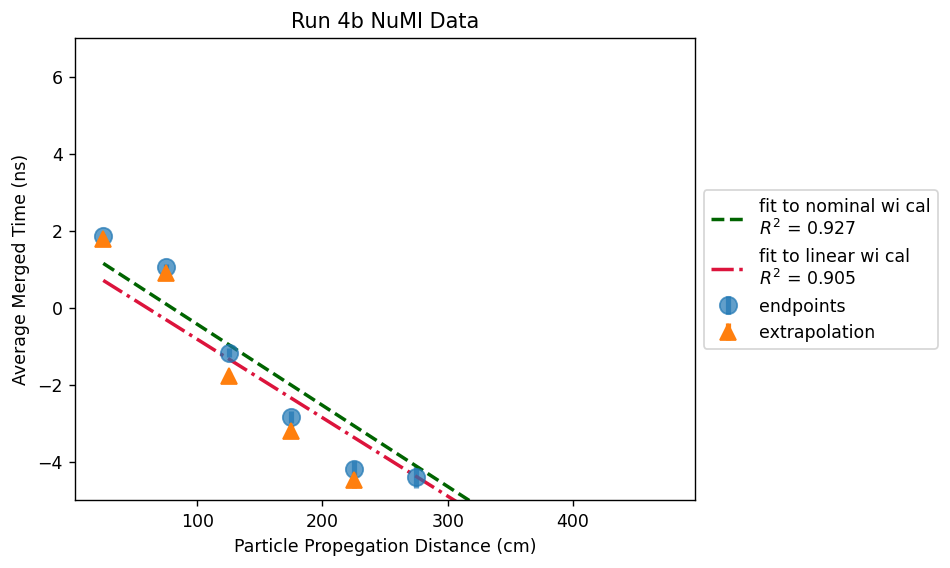

data nominal linear fit: m = -0.0023   b = 1.584
3.7494261755553615 0.558
data no cor linear fit: m = -0.0008   b = 1.0017
6.956974791989863 0.166
data linear no cor linear fit: m = -0.0004   b = 0.8243
6.658508516227878 0.044
data spacepoints wi cor linear fit: m = -0.0004   b = 0.227
18.42909778450286 0.057


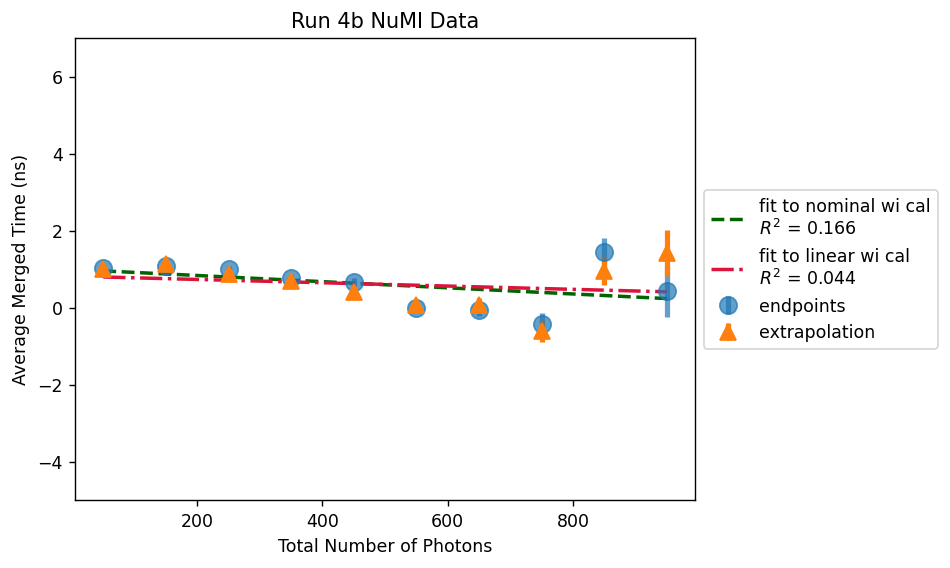

data nominal linear fit: m = -0.0052   b = 1.5395
0.3947435205283887 0.846
data no cor linear fit: m = -0.0075   b = 1.779
3.736866882406377 0.896
data linear no cor linear fit: m = -0.0074   b = 1.7271
-0.5907333036829349 0.923
data spacepoints wi cor linear fit: m = -0.0084   b = 1.2421
0.4128152335330743 0.866


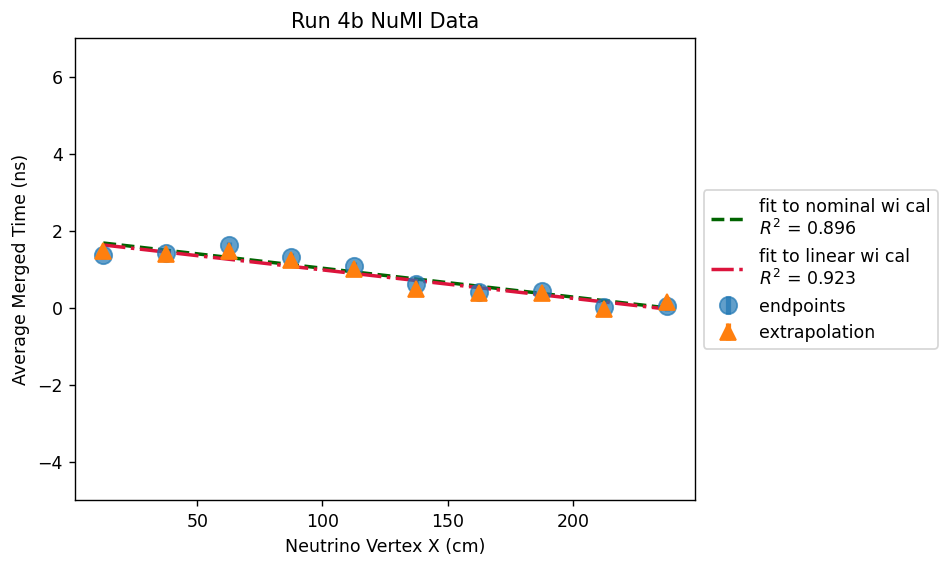

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1842265009.py:1294: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times"] = merge_times
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1842265009.py:1295: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times_nocor"] = merge_times_nocor
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1842265009.py:1296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

data nominal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779
data no cal: Triple Gaussian      mean: -0.1217   std: 3.2197   C: 276.113
38.01962704650277
data linear vp no cal: Triple Gaussian      mean: -0.2238   std: 3.1028   C: 278.4871
42.53108636445447
data spacepoints vp wi cal: Triple Gaussian      mean: 0.4394   std: 3.2401   C: 275.5739
29.0162447734498


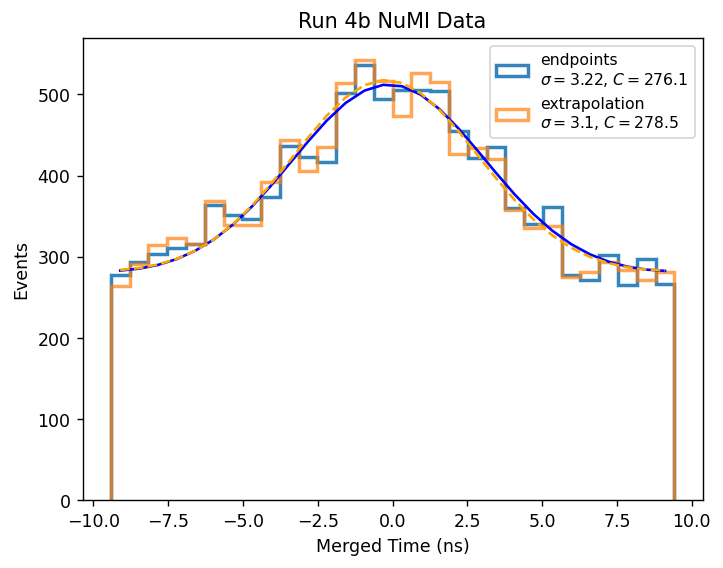

data nominal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data no cal: Triple Gaussian      mean: -0.1685   std: 3.5262   C: 93.3192
31.199254124247094
data linear vp no cal: Triple Gaussian      mean: -0.2806   std: 3.4042   C: 93.9275
24.377554895228702
data spacepoints vp wi cal: Triple Gaussian      mean: 0.3693   std: 3.6027   C: 90.8901
29.76138994030023


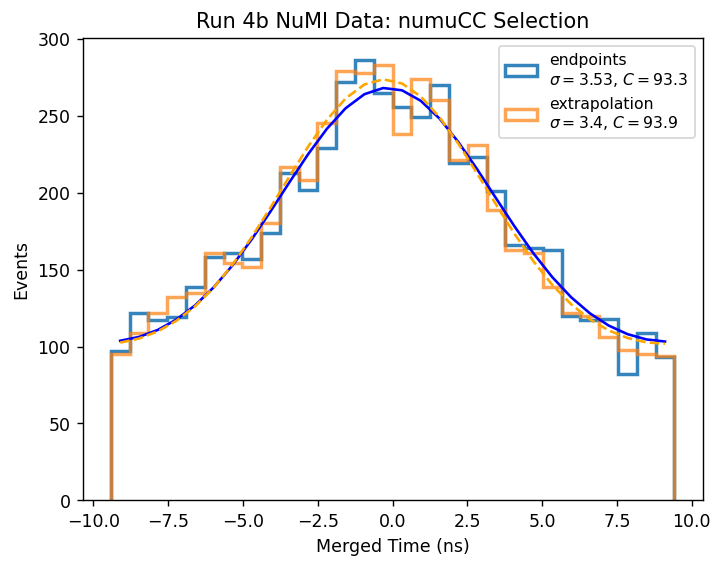

In [39]:

same_y = True
same_y_tight = False
use_overflow = False
use_event_time = True

const_propt = []
const_propt_full = []
const_propt_ssmsp = []
const_Np = []
const_Np_full = []
const_Np_ssmsp = []
const_xvtx = []
const_xvtx_full = []
const_xvtx_ssmsp = []

m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_DL_i_ssmsp = 0
b_DL_i_ssmsp = 0
global_cor_ssmsp = 0
const_propt_ssmsp.append(m_propt_i_ssmsp)
const_Np_ssmsp.append(m_Np_i_ssmsp)
const_xvtx_ssmsp.append(m_xvtx_i_ssmsp)

m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_DL_i_fullDp = 0
b_DL_i_fullDp = 0
global_cor_fullDp = 0
const_propt_full.append(m_propt_i_fullDp)
const_Np_full.append(m_Np_i_fullDp)
const_xvtx_full.append(m_xvtx_i_fullDp)


m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DLi = 0   
b_DL_i = 0
global_cor = -2.2
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)


n_pmt_propt_bins = 10
n_pmt_propt_min = 0
n_pmt_propt_max = 30

n_pmt_Nphoton_bins = 10
n_pmt_Nphoton_min = 0
n_pmt_Nphoton_max = 70

n_pmt_DL_bins = 10
n_pmt_DL_min = 0
n_pmt_DL_max = 350

n_pmt_DP_bins = 10
n_pmt_DP_min = 0
n_pmt_DP_max = 500

n_pmt_PhT_bins = 10
n_pmt_PhT_min = 0
n_pmt_PhT_max = 1000

n_pmt_xvtx_bins = 10
n_pmt_xvtx_min = 0
n_pmt_xvtx_max = 250

print("Query the df")
temp_df = df.query("evtTimeNS>0")

reco_nuvtxX_list =  temp_df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  temp_df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = temp_df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = temp_df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = temp_df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = temp_df["PMT_Amp"].to_numpy()

TT3_array_list = temp_df["TT3_array"].to_numpy()
TT3_array_nocor_list = temp_df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = temp_df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = temp_df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = temp_df["DLh_all"].to_numpy()
DP_all = temp_df["DPh_all"].to_numpy()
DP_full_all = temp_df["DPh_full_all"].to_numpy()
DL_full_all = temp_df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = temp_df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = temp_df["DPh_ssmsp_all"].to_numpy()

PhT_all = temp_df["Ph_Tot"].to_numpy()

file = temp_df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_fullDp = []
TT3_array_fullDp_list = []
merge_times_fullDp = []
merge_match_TT3_array_fullDp = []

ns_time_nocor = []
merge_times_nocor = []
merge_match_TT3_array_nocor = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
            
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i)  +global_cor)
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) +global_cor_fullDp)
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) +global_cor_ssmsp)

    ns_time.append(np.median(TT3_array))
    ns_time_nocor.append(np.median(TT3_array_nocor))
    #TT3_array_nocor_list.append(TT3_array_nocor)
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp.append(np.median(TT3_array_fullDp_nocor))
    TT3_array_fullDp_list.append(TT3_array_fullDp_nocor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_fullDp = ns_time_fullDp[event]-Shift+gap*0.5-0.8
    TT_merged_fullDp=-9999
    
    if TThelp_fullDp>=0:
        TT_merged_fullDp=(TThelp_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        
    merge_times_fullDp.append(TT_merged_fullDp)
    merge_match_TT3_array_fullDp.append([])

    TThelp_nocor = ns_time_nocor[event]-Shift+gap*0.5-0.8
    TT_merged_nocor=-9999
    
    if TThelp_nocor>=0:
        TT_merged_nocor=(TThelp_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        
    merge_times_nocor.append(TT_merged_nocor)
    merge_match_TT3_array_nocor.append([])
    
    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)

        TThelp_array_fullDp = TT3_array_fullDp_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp=-9999
        #shift according to the events time
        if TThelp_fullDp>=0:
            TT_array_merged_match_fullDp=(TThelp_array_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp[event].append(TT_array_merged_match_fullDp)

        TThelp_array_nocor = TT3_array_nocor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_nocor=-9999
        #shift according to the events time
        if TThelp_nocor>=0:
            TT_array_merged_match_nocor=(TThelp_array_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_nocor[event].append(TT_array_merged_match_nocor)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
    

#######################

print("Setting Bins")
#Propegation time bins
pmt_propt_bins = np.linspace(n_pmt_propt_min,n_pmt_propt_max,n_pmt_propt_bins+1)
pmt_propt_all_times = []
pmt_propt_avg_times = []
pmt_propt_avg_times_errors = []
pmt_propt_all_times_fullDp = []
pmt_propt_avg_times_fullDp = []
pmt_propt_avg_times_fullDp_errors = []
pmt_propt_all_times_nocor = []
pmt_propt_avg_times_nocor = []
pmt_propt_avg_times_nocor_errors = []
pmt_propt_all_times_recor = []
pmt_propt_avg_times_recor = []
pmt_propt_avg_times_recor_errors = []
pmt_propt_all_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor_errors = []
pmt_propt_all_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_propt_bins): 
    pmt_propt_all_times.append([])
    pmt_propt_avg_times.append(0)
    pmt_propt_avg_times_errors.append(0)
    pmt_propt_all_times_fullDp.append([])
    pmt_propt_avg_times_fullDp.append(0)
    pmt_propt_avg_times_fullDp_errors.append(0)
    pmt_propt_all_times_nocor.append([])
    pmt_propt_avg_times_nocor.append(0)
    pmt_propt_avg_times_nocor_errors.append(0)
    pmt_propt_all_times_recor.append([])
    pmt_propt_avg_times_recor.append(0)
    pmt_propt_avg_times_recor_errors.append(0)
    pmt_propt_all_times_fullDp_recor.append([])
    pmt_propt_avg_times_fullDp_recor.append(0)
    pmt_propt_avg_times_fullDp_recor_errors.append(0)
    pmt_propt_all_times_ssmsp_recor.append([])
    pmt_propt_avg_times_ssmsp_recor.append(0)
    pmt_propt_avg_times_ssmsp_recor_errors.append(0)
    
#Number of photon bins
pmt_Nphoton_bins = np.linspace(n_pmt_Nphoton_min,n_pmt_Nphoton_max,n_pmt_Nphoton_bins+1)
pmt_Nphoton_all_times = []
pmt_Nphoton_avg_times = []
pmt_Nphoton_avg_times_errors = []
pmt_Nphoton_all_times_nocor = []
pmt_Nphoton_avg_times_nocor = []
pmt_Nphoton_avg_times_nocor_errors = []
pmt_Nphoton_all_times_recor = []
pmt_Nphoton_avg_times_recor = []
pmt_Nphoton_avg_times_recor_errors = []
pmt_Nphoton_all_times_fullDp = []
pmt_Nphoton_avg_times_fullDp = []
pmt_Nphoton_avg_times_fullDp_errors = []
pmt_Nphoton_all_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor_errors = []
pmt_Nphoton_all_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_all_times.append([])
    pmt_Nphoton_avg_times.append(0)
    pmt_Nphoton_avg_times_errors.append(0)
    pmt_Nphoton_all_times_nocor.append([])
    pmt_Nphoton_avg_times_nocor.append(0)
    pmt_Nphoton_avg_times_nocor_errors.append(0)
    pmt_Nphoton_all_times_recor.append([])
    pmt_Nphoton_avg_times_recor.append(0)
    pmt_Nphoton_avg_times_recor_errors.append(0)
    pmt_Nphoton_all_times_fullDp.append([])
    pmt_Nphoton_avg_times_fullDp.append(0)
    pmt_Nphoton_avg_times_fullDp_errors.append(0)
    pmt_Nphoton_all_times_fullDp_recor.append([])
    pmt_Nphoton_avg_times_fullDp_recor.append(0)
    pmt_Nphoton_avg_times_fullDp_recor_errors.append(0)
    pmt_Nphoton_all_times_ssmsp_recor.append([])
    pmt_Nphoton_avg_times_ssmsp_recor.append(0)
    pmt_Nphoton_avg_times_ssmsp_recor_errors.append(0)
    
#Light propegation distance bins
pmt_DL_bins = np.linspace(n_pmt_DL_min,n_pmt_DL_max,n_pmt_DL_bins+1)
pmt_DL_all_times = []
pmt_DL_avg_times = []
pmt_DL_avg_times_errors = []
pmt_DL_all_times_nocor = []
pmt_DL_avg_times_nocor = []
pmt_DL_avg_times_nocor_errors = []
pmt_DL_all_times_recor = []
pmt_DL_avg_times_recor = []
pmt_DL_avg_times_recor_errors = []
pmt_DL_all_times_fullDp = []
pmt_DL_avg_times_fullDp = []
pmt_DL_avg_times_fullDp_errors = []
pmt_DL_all_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor_errors = []
pmt_DL_all_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DL_bins): 
    pmt_DL_all_times.append([])
    pmt_DL_avg_times.append(0)
    pmt_DL_avg_times_errors.append(0)
    pmt_DL_all_times_nocor.append([])
    pmt_DL_avg_times_nocor.append(0)
    pmt_DL_avg_times_nocor_errors.append(0)
    pmt_DL_all_times_recor.append([])
    pmt_DL_avg_times_recor.append(0)
    pmt_DL_avg_times_recor_errors.append(0)
    pmt_DL_all_times_fullDp.append([])
    pmt_DL_avg_times_fullDp.append(0)
    pmt_DL_avg_times_fullDp_errors.append(0)
    pmt_DL_all_times_fullDp_recor.append([])
    pmt_DL_avg_times_fullDp_recor.append(0)
    pmt_DL_avg_times_fullDp_recor_errors.append(0) 
    pmt_DL_all_times_ssmsp_recor.append([])
    pmt_DL_avg_times_ssmsp_recor.append(0)
    pmt_DL_avg_times_ssmsp_recor_errors.append(0) 
    
#Particle propegation bins
pmt_DP_bins = np.linspace(n_pmt_DP_min,n_pmt_DP_max,n_pmt_DP_bins+1)
pmt_DP_all_times= []
pmt_DP_avg_times = []
pmt_DP_avg_times_errors = []
pmt_DP_all_times_nocor = []
pmt_DP_avg_times_nocor = []
pmt_DP_avg_times_nocor_errors = []
pmt_DP_all_times_recor = []
pmt_DP_avg_times_recor = []
pmt_DP_avg_times_recor_errors = []
pmt_DP_all_times_fullDp = []
pmt_DP_avg_times_fullDp = []
pmt_DP_avg_times_fullDp_errors = []
pmt_DP_all_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor_errors = []
pmt_DP_all_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DP_bins): 
    pmt_DP_all_times.append([])
    pmt_DP_avg_times.append(0)
    pmt_DP_avg_times_errors.append(0)
    pmt_DP_all_times_nocor.append([])
    pmt_DP_avg_times_nocor.append(0)
    pmt_DP_avg_times_nocor_errors.append(0)
    pmt_DP_all_times_recor.append([])
    pmt_DP_avg_times_recor.append(0)
    pmt_DP_avg_times_recor_errors.append(0)
    pmt_DP_all_times_fullDp.append([])
    pmt_DP_avg_times_fullDp.append(0)
    pmt_DP_avg_times_fullDp_errors.append(0) 
    pmt_DP_all_times_fullDp_recor.append([])
    pmt_DP_avg_times_fullDp_recor.append(0)
    pmt_DP_avg_times_fullDp_recor_errors.append(0) 
    pmt_DP_all_times_ssmsp_recor.append([])
    pmt_DP_avg_times_ssmsp_recor.append(0)
    pmt_DP_avg_times_ssmsp_recor_errors.append(0)
    
#Total Photon bins
pmt_PhT_bins = np.linspace(n_pmt_PhT_min,n_pmt_PhT_max,n_pmt_PhT_bins+1)
pmt_PhT_all_times = []
pmt_PhT_avg_times = []
pmt_PhT_avg_times_errors = []
pmt_PhT_all_times_nocor = []
pmt_PhT_avg_times_nocor = []
pmt_PhT_avg_times_nocor_errors = []
pmt_PhT_all_times_recor = []
pmt_PhT_avg_times_recor = []
pmt_PhT_avg_times_recor_errors = []
pmt_PhT_all_times_fullDp = []
pmt_PhT_avg_times_fullDp = []
pmt_PhT_avg_times_fullDp_errors = []
pmt_PhT_all_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor_errors = []
pmt_PhT_all_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_all_times.append([])
    pmt_PhT_avg_times.append(0)
    pmt_PhT_avg_times_errors.append(0)
    pmt_PhT_all_times_nocor.append([])
    pmt_PhT_avg_times_nocor.append(0)
    pmt_PhT_avg_times_nocor_errors.append(0)
    pmt_PhT_all_times_recor.append([])
    pmt_PhT_avg_times_recor.append(0)
    pmt_PhT_avg_times_recor_errors.append(0)
    pmt_PhT_all_times_fullDp.append([])
    pmt_PhT_avg_times_fullDp.append(0)
    pmt_PhT_avg_times_fullDp_errors.append(0) 
    pmt_PhT_all_times_fullDp_recor.append([])
    pmt_PhT_avg_times_fullDp_recor.append(0)
    pmt_PhT_avg_times_fullDp_recor_errors.append(0) 
    pmt_PhT_all_times_ssmsp_recor.append([])
    pmt_PhT_avg_times_ssmsp_recor.append(0)
    pmt_PhT_avg_times_ssmsp_recor_errors.append(0) 
    
#X vertex bins
pmt_xvtx_bins = np.linspace(n_pmt_xvtx_min,n_pmt_xvtx_max,n_pmt_xvtx_bins+1)
pmt_xvtx_all_times = []
pmt_xvtx_avg_times = []
pmt_xvtx_avg_times_errors = []
pmt_xvtx_all_times_nocor = []
pmt_xvtx_avg_times_nocor = []
pmt_xvtx_avg_times_nocor_errors = []
pmt_xvtx_all_times_recor = []
pmt_xvtx_avg_times_recor = []
pmt_xvtx_avg_times_recor_errors = []
pmt_xvtx_all_times_fullDp = []
pmt_xvtx_avg_times_fullDp = []
pmt_xvtx_avg_times_fullDp_errors = []
pmt_xvtx_all_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor_errors = []
pmt_xvtx_all_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_all_times.append([])
    pmt_xvtx_avg_times.append(0)
    pmt_xvtx_avg_times_errors.append(0)
    pmt_xvtx_all_times_nocor.append([])
    pmt_xvtx_avg_times_nocor.append(0)
    pmt_xvtx_avg_times_nocor_errors.append(0)
    pmt_xvtx_all_times_recor.append([])
    pmt_xvtx_avg_times_recor.append(0)
    pmt_xvtx_avg_times_recor_errors.append(0)
    pmt_xvtx_all_times_fullDp.append([])
    pmt_xvtx_avg_times_fullDp.append(0)
    pmt_xvtx_avg_times_fullDp_errors.append(0) 
    pmt_xvtx_all_times_fullDp_recor.append([])
    pmt_xvtx_avg_times_fullDp_recor.append(0)
    pmt_xvtx_avg_times_fullDp_recor_errors.append(0) 
    pmt_xvtx_all_times_ssmsp_recor.append([])
    pmt_xvtx_avg_times_ssmsp_recor.append(0)
    pmt_xvtx_avg_times_ssmsp_recor_errors.append(0) 

print("Filling nominal with corrections histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_propt_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_Nphoton_all_times[ibin].append(merge_match_TT3_array[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DL_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DP_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_PhT_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_xvtx_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break 

print("Setting nominal with corrections averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times[i] = statistics.mean(pmt_propt_all_times[i])     
    pmt_propt_avg_times_errors[i] = (statistics.stdev(pmt_propt_all_times[i])/np.sqrt(len(pmt_propt_all_times[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times[i] = statistics.mean(pmt_Nphoton_all_times[i])     
    pmt_Nphoton_avg_times_errors[i] = (statistics.stdev(pmt_Nphoton_all_times[i])/np.sqrt(len(pmt_Nphoton_all_times[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times[i] = statistics.mean(pmt_DL_all_times[i])     
    pmt_DL_avg_times_errors[i] = (statistics.stdev(pmt_DL_all_times[i])/np.sqrt(len(pmt_DL_all_times[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times[i] = statistics.mean(pmt_DP_all_times[i])     
    pmt_DP_avg_times_errors[i] = (statistics.stdev(pmt_DP_all_times[i])/np.sqrt(len(pmt_DP_all_times[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times[i] = statistics.mean(pmt_PhT_all_times[i])     
    pmt_PhT_avg_times_errors[i] = (statistics.stdev(pmt_PhT_all_times[i])/np.sqrt(len(pmt_PhT_all_times[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times[i] = statistics.mean(pmt_xvtx_all_times[i])     
    pmt_xvtx_avg_times_errors[i] = (statistics.stdev(pmt_xvtx_all_times[i])/np.sqrt(len(pmt_xvtx_all_times[i])))

print("Filling nocor nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_propt_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_Nphoton_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DL_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DP_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_PhT_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_xvtx_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break 

print("Setting nocor nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_nocor[i] = statistics.mean(pmt_propt_all_times_nocor[i])     
    pmt_propt_avg_times_nocor_errors[i] = (statistics.stdev(pmt_propt_all_times_nocor[i])/np.sqrt(len(pmt_propt_all_times_nocor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_nocor[i] = statistics.mean(pmt_Nphoton_all_times_nocor[i])     
    pmt_Nphoton_avg_times_nocor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_nocor[i])/np.sqrt(len(pmt_Nphoton_all_times_nocor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_nocor[i] = statistics.mean(pmt_DL_all_times_nocor[i])     
    pmt_DL_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DL_all_times_nocor[i])/np.sqrt(len(pmt_DL_all_times_nocor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_nocor[i] = statistics.mean(pmt_DP_all_times_nocor[i])     
    pmt_DP_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DP_all_times_nocor[i])/np.sqrt(len(pmt_DP_all_times_nocor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_nocor[i] = statistics.mean(pmt_PhT_all_times_nocor[i])     
    pmt_PhT_avg_times_nocor_errors[i] = (statistics.stdev(pmt_PhT_all_times_nocor[i])/np.sqrt(len(pmt_PhT_all_times_nocor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_nocor[i] = statistics.mean(pmt_xvtx_all_times_nocor[i])     
    pmt_xvtx_avg_times_nocor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_nocor[i])/np.sqrt(len(pmt_xvtx_all_times_nocor[i])))




print("Filling nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_propt_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_Nphoton_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DL_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DP_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_PhT_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_xvtx_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break 

print("Setting nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_recor[i] = statistics.mean(pmt_propt_all_times_recor[i])     
    pmt_propt_avg_times_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_recor[i])/np.sqrt(len(pmt_propt_all_times_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_recor[i] = statistics.mean(pmt_Nphoton_all_times_recor[i])     
    pmt_Nphoton_avg_times_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_recor[i] = statistics.mean(pmt_DL_all_times_recor[i])     
    pmt_DL_avg_times_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_recor[i])/np.sqrt(len(pmt_DL_all_times_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_recor[i] = statistics.mean(pmt_DP_all_times_recor[i])     
    pmt_DP_avg_times_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_recor[i])/np.sqrt(len(pmt_DP_all_times_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_recor[i] = statistics.mean(pmt_PhT_all_times_recor[i])     
    pmt_PhT_avg_times_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_recor[i])/np.sqrt(len(pmt_PhT_all_times_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_recor[i] = statistics.mean(pmt_xvtx_all_times_recor[i])     
    pmt_xvtx_avg_times_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_recor[i])/np.sqrt(len(pmt_xvtx_all_times_recor[i])))




print("Filling nocor linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_propt_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_Nphoton_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DL_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DP_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_PhT_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_xvtx_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break

print("Setting nocor linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp[i] = statistics.mean(pmt_propt_all_times_fullDp[i])     
    pmt_propt_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp[i])/np.sqrt(len(pmt_propt_all_times_fullDp[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp[i] = statistics.mean(pmt_Nphoton_all_times_fullDp[i])     
    pmt_Nphoton_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp[i] = statistics.mean(pmt_DL_all_times_fullDp[i])     
    pmt_DL_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp[i])/np.sqrt(len(pmt_DL_all_times_fullDp[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp[i] = statistics.mean(pmt_DP_all_times_fullDp[i])     
    pmt_DP_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp[i])/np.sqrt(len(pmt_DP_all_times_fullDp[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp[i] = statistics.mean(pmt_PhT_all_times_fullDp[i])     
    pmt_PhT_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp[i])/np.sqrt(len(pmt_PhT_all_times_fullDp[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp[i] = statistics.mean(pmt_xvtx_all_times_fullDp[i])     
    pmt_xvtx_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp[i])))



print("Filling linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_propt_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_Nphoton_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DL_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DP_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_PhT_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_xvtx_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break

print("Setting linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp_recor[i] = statistics.mean(pmt_propt_all_times_fullDp_recor[i])     
    pmt_propt_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp_recor[i])/np.sqrt(len(pmt_propt_all_times_fullDp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp_recor[i] = statistics.mean(pmt_Nphoton_all_times_fullDp_recor[i])     
    pmt_Nphoton_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp_recor[i] = statistics.mean(pmt_DL_all_times_fullDp_recor[i])     
    pmt_DL_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DL_all_times_fullDp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp_recor[i] = statistics.mean(pmt_DP_all_times_fullDp_recor[i])     
    pmt_DP_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DP_all_times_fullDp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp_recor[i] = statistics.mean(pmt_PhT_all_times_fullDp_recor[i])     
    pmt_PhT_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp_recor[i])/np.sqrt(len(pmt_PhT_all_times_fullDp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp_recor[i] = statistics.mean(pmt_xvtx_all_times_fullDp_recor[i])     
    pmt_xvtx_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp_recor[i])))


print("Filling sapcepoints histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_ssmsp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_ssmsp_all[event]
    DP = DP_ssmsp_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_ssmsp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_ssmsp_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_ssmsp_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_propt_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_Nphoton_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DL_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DP_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_PhT_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX_ssmsp>pmt_xvtx_bins[ibin] and reco_nuvtxX_ssmsp<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_xvtx_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break

print("Setting spacepoints averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_ssmsp_recor[i] = statistics.mean(pmt_propt_all_times_ssmsp_recor[i])     
    pmt_propt_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_propt_all_times_ssmsp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_ssmsp_recor[i] = statistics.mean(pmt_Nphoton_all_times_ssmsp_recor[i])     
    pmt_Nphoton_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DL_all_times_ssmsp_recor[i])     
    pmt_DL_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DL_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DP_all_times_ssmsp_recor[i])     
    pmt_DP_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DP_all_times_ssmsp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_ssmsp_recor[i] = statistics.mean(pmt_PhT_all_times_ssmsp_recor[i])     
    pmt_PhT_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_PhT_all_times_ssmsp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_ssmsp_recor[i] = statistics.mean(pmt_xvtx_all_times_ssmsp_recor[i])     
    pmt_xvtx_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_ssmsp_recor[i])))

############################################################################################



plot_title = "Run 4b NuMI Data"

popt,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_propt_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_propt_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_propt_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_propt_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor,yerr=pmt_propt_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.plot(x,line(x,*popt_nocor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_nocor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7) 
if same_y_tight: plt.ylim(-2,2) 
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light+Particle Propegation Time (ns)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_Nphoton_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor)
print("data wi cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_Nphoton_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp)
print("data linear wi cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_Nphoton_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_Nphoton_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor,yerr=pmt_Nphoton_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp,yerr=pmt_Nphoton_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.plot(x,line(x,*popt_nocor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_nocor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DL_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor)
print("data wi cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DL_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp)
print("data linear wi cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DL_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DL_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor,yerr=pmt_DL_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp,yerr=pmt_DL_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.plot(x,line(x,*popt_nocor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_nocor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DP_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DP_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DP_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DP_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor,yerr=pmt_DP_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp,yerr=pmt_DP_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.plot(x,line(x,*popt_nocor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_nocor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Particle Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_PhT_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_PhT_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_PhT_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_PhT_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor,yerr=pmt_PhT_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp,yerr=pmt_PhT_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.plot(x,line(x,*popt_nocor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_nocor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Total Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_xvtx_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_xvtx_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_xvtx_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_xvtx_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor,yerr=pmt_xvtx_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp,yerr=pmt_xvtx_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.plot(x,line(x,*popt_nocor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_nocor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Neutrino Vertex X (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################
#######################
nbins = 30

temp_df["merge_times"] = merge_times
temp_df["merge_times_nocor"] = merge_times_nocor
temp_df["merge_times_recor"] = merge_times_recor
temp_df["merge_times_fullDp"] = merge_times_fullDp
temp_df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
temp_df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor


data = temp_df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)

data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_fullDp[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)


data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_ssmsp_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()





data = temp_df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42").query("numu_score>0.8")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)


data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42").query("numu_score>0.8")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_fullDp[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_ssmsp_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()

# iteration 1

Query the df
Setting recalibrated times


100%|███████████████████████████████████| 11703/11703 [00:02<00:00, 4771.29it/s]


Setting Bins
Filling nominal with corrections histograms
Setting nominal with corrections averages
Filling nocor nominal histograms
Setting nocor nominal averages
Filling nominal histograms
Setting nominal averages
Filling nocor linear histograms
Setting nocor linear averages
Filling linear histograms
Setting linear averages
Filling sapcepoints histograms
Setting spacepoints averages
data nominal linear fit: m = -0.0371   b = 1.6896
1.099394519622555 0.5
data no cor linear fit: m = -0.3244   b = 6.7252
0.9438480811190403 0.956
data wi cor linear fit: m = -0.114   b = 2.6835
3.5640962709991824 0.825
data linear no cor linear fit: m = -0.3254   b = 6.756
0.5318248886000909 0.959
data linear wi cor linear fit: m = -0.1113   b = 2.6173
3.9627801594153405 0.822
data spacepoints wi cor linear fit: m = -0.1148   b = 2.7285
2.5673394033827934 0.84


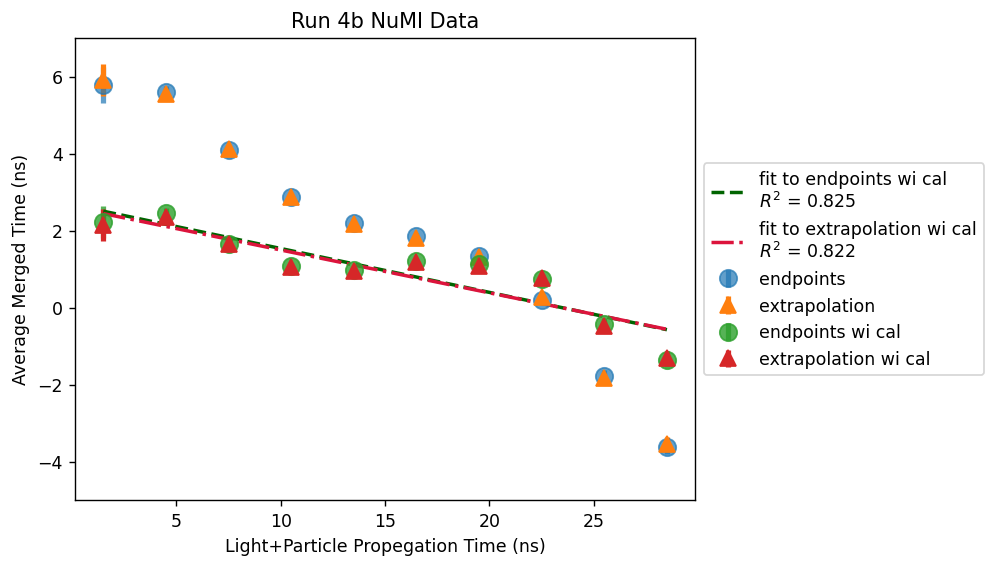

data nominal linear fit: m = -0.027   b = 0.7451
9.006645760813917 0.317
data no cor linear fit: m = -0.0219   b = 1.1971
0.5118702626832156 0.894
data wi cor linear fit: m = -0.0439   b = 0.9104
2.048038774688261 0.763
data linear no cor linear fit: m = -0.0218   b = 1.1532
1.0886175126772406 0.889
data linear wi cor linear fit: m = -0.0441   b = 0.89
2.4837510478585227 0.774
data spacepoints wi cor linear fit: m = -0.0434   b = 0.9093
1.661912772762186 0.771


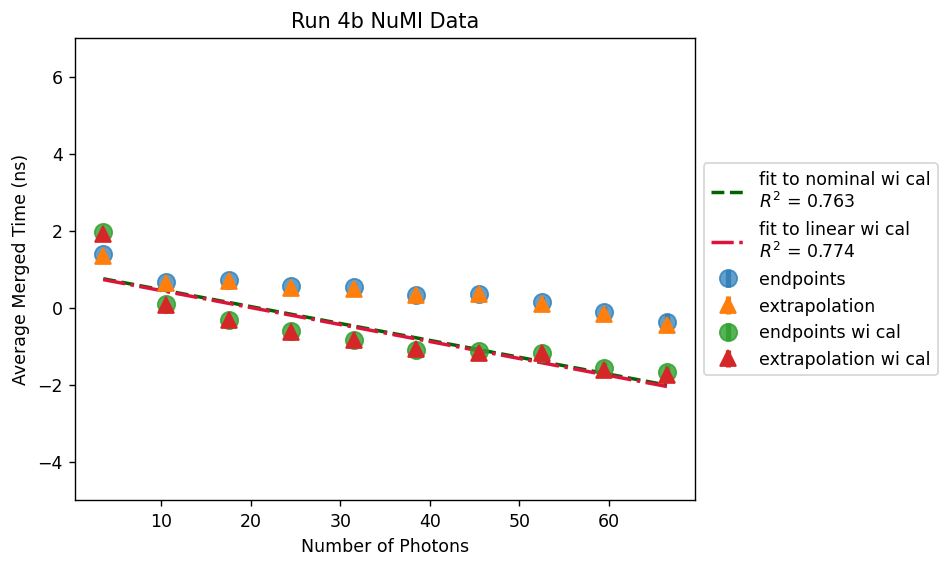

data nominal linear fit: m = -0.0017   b = 1.4529
0.7714507129294969 0.263
data no cor linear fit: m = -0.0212   b = 5.5404
-16.8747448613232 0.951
data wi cor linear fit: m = -0.007   b = 2.2233
-1.5001962477846882 0.802
data linear no cor linear fit: m = -0.0219   b = 5.6583
-5.543012257858269 0.951
data linear wi cor linear fit: m = -0.0069   b = 2.1441
-0.8741813469816067 0.781
data spacepoints wi cor linear fit: m = -0.0069   b = 2.1919
-1.425199396977531 0.818


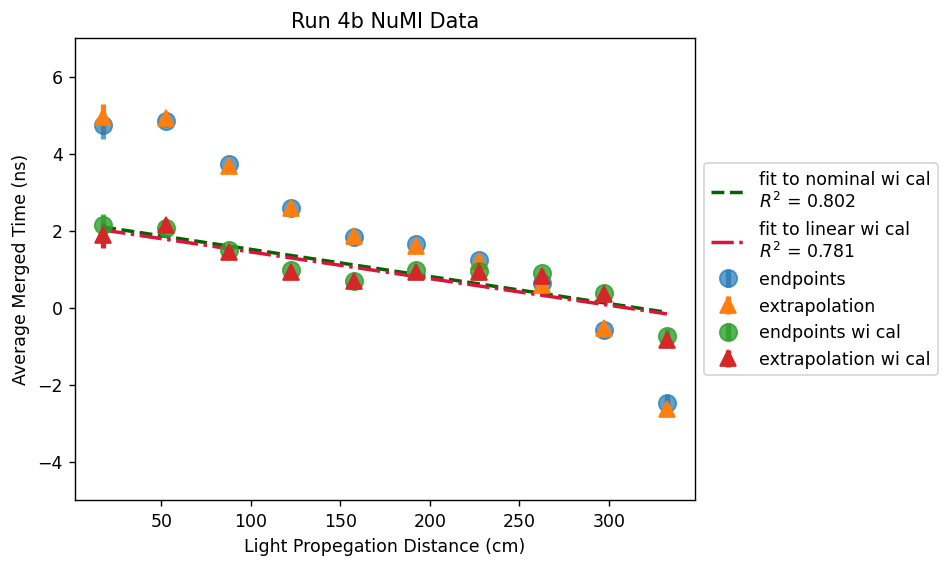

data nominal linear fit: m = -0.0049   b = 0.7031
-4.135378203376091 0.561
data no cor linear fit: m = -0.0211   b = 1.6835
8.1692279548207 0.927
data wi cor linear fit: m = -0.0103   b = 0.6613
-6.301470916415881 0.832
data linear no cor linear fit: m = -0.0204   b = 1.2244
-4.687120874523109 0.905
data linear wi cor linear fit: m = -0.0094   b = 0.286
14.479636543027956 0.729
data spacepoints wi cor linear fit: m = -0.0095   b = 0.37
2.9111282302585555 0.765


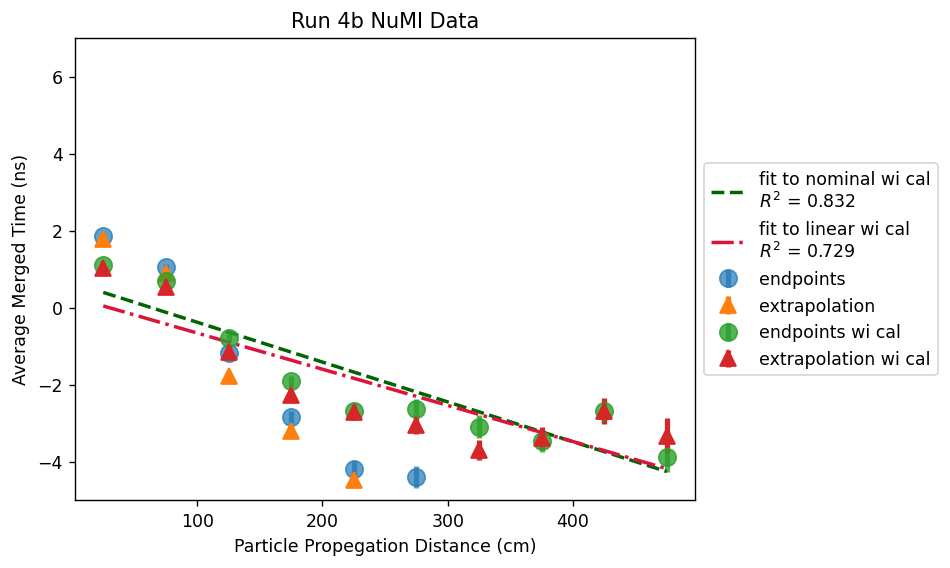

data nominal linear fit: m = -0.0023   b = 1.584
3.7494261755553615 0.558
data no cor linear fit: m = -0.0008   b = 1.0017
6.956974791989863 0.166
data wi cor linear fit: m = -0.0013   b = 0.8714
14.66195226746549 0.688
data linear no cor linear fit: m = -0.0004   b = 0.8243
6.658508516227878 0.044
data linear wi cor linear fit: m = -0.0009   b = 0.7435
0.836525608182028 0.653
data spacepoints wi cor linear fit: m = -0.001   b = 0.7762
-3.7994270808108865 0.551


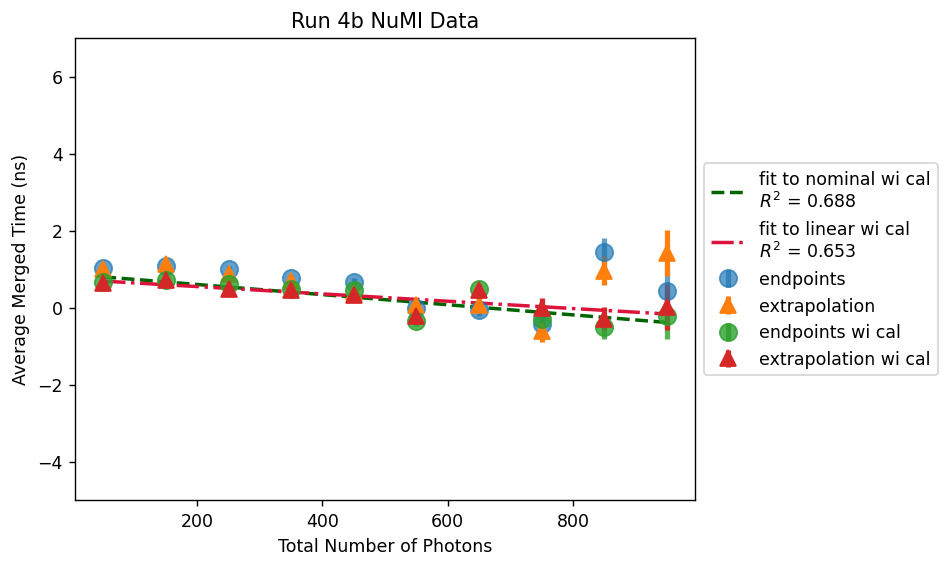

data nominal linear fit: m = -0.0052   b = 1.5395
0.3947435205283887 0.846
data no cor linear fit: m = -0.0075   b = 1.779
3.736866882406377 0.896
data wi cor linear fit: m = -0.004   b = 1.0218
1.4913485698449245 0.735
data linear no cor linear fit: m = -0.0074   b = 1.7271
-0.5907333036829349 0.923
data linear wi cor linear fit: m = -0.004   b = 0.9982
2.3240345012058317 0.728
data spacepoints wi cor linear fit: m = -0.0041   b = 1.0423
1.553250285267189 0.725


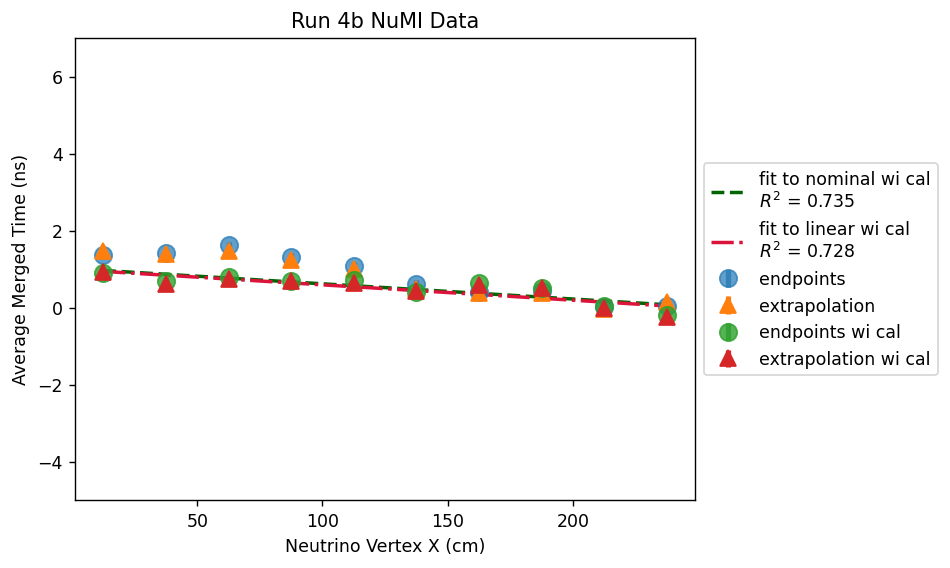

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/454379097.py:1477: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times"] = merge_times
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/454379097.py:1478: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp_df["merge_times_nocor"] = merge_times_nocor
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/454379097.py:1478: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

data nominal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779
data no cal: Triple Gaussian      mean: -0.1217   std: 3.2197   C: 276.113
38.01962704650277
data no cal: Triple Gaussian      mean: -0.3107   std: 2.8854   C: 254.7605
36.998777142601014
data linear vp no cal: Triple Gaussian      mean: -0.2238   std: 3.1028   C: 278.4874
42.53111561433273
data linear vp wi cal: Triple Gaussian      mean: -0.3252   std: 2.8251   C: 255.8307
39.678346347793315
data spacepoints vp wi cal: Triple Gaussian      mean: -0.252   std: 2.9104   C: 254.0552
27.921041748408413


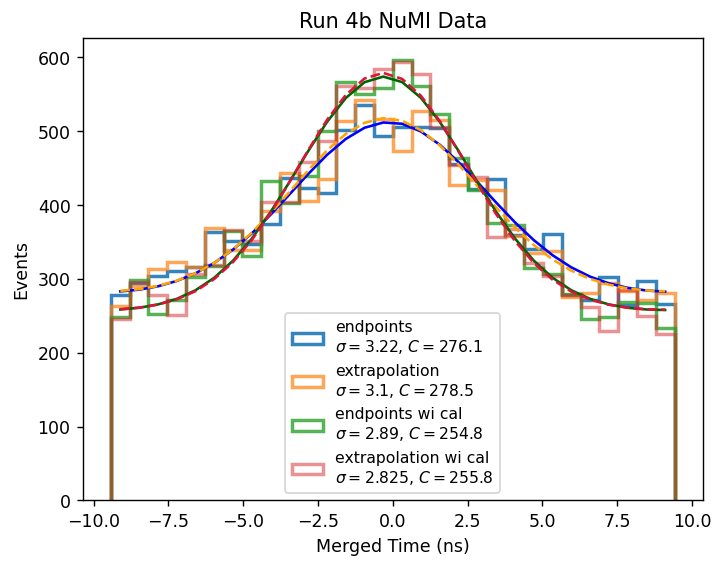

data nominal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data no cal: Triple Gaussian      mean: -0.1685   std: 3.5262   C: 93.3192
31.199254124247094
data wi cal: Triple Gaussian      mean: -0.17   std: 2.8277   C: 89.3103
31.292264775300154
data linear vp no cal: Triple Gaussian      mean: -0.2806   std: 3.4042   C: 93.9276
24.377572721378815
data linear vp wi cal: Triple Gaussian      mean: -0.1854   std: 2.7634   C: 89.8537
35.118258937291344
data spacepoints vp wi cal: Triple Gaussian      mean: -0.0992   std: 2.8342   C: 89.7315
27.218217020244953


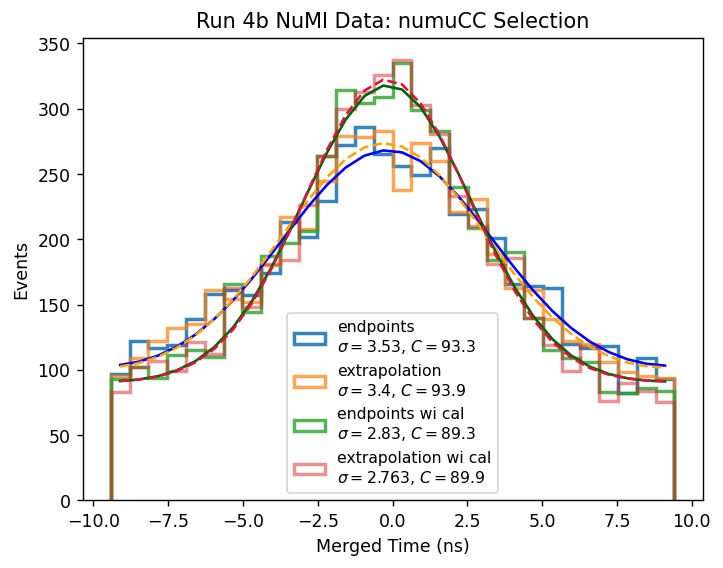

In [85]:

same_y = True
use_overflow=False

const_propt = []
const_propt_full = []
const_propt_ssmsp = []
const_Np = []
const_Np_full = []
const_Np_ssmsp = []
const_xvtx = []
const_xvtx_full = []
const_xvtx_ssmsp = []

m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_DL_i_ssmsp = 0
b_DL_i_ssmsp = 0
global_cor_ssmsp = 0
const_propt_ssmsp.append(m_propt_i_ssmsp)
const_Np_ssmsp.append(m_Np_i_ssmsp)
const_xvtx_ssmsp.append(m_xvtx_i_ssmsp)

#it 1
m_propt_i_ssmsp = -0.3199
b_propt_i_ssmsp = 6.0556
m_Np_i_ssmsp = -0.0191
b_Np_i_ssmsp = 0.5295
m_xvtx_i_ssmsp = -0.0084
b_xvtx_i_ssmsp = 1.2429
global_cor_ssmsp = 1.1
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)


m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_DL_i_fullDp = 0
b_DL_i_fullDp = 0
global_cor_fullDp = 0
const_propt_full.append(m_propt_i_fullDp)
const_Np_full.append(m_Np_i_fullDp)
const_xvtx_full.append(m_xvtx_i_fullDp)

#it 1
m_propt_i_fullDp = -0.323
b_propt_i_fullDp = 6.1711
m_Np_i_fullDp = -0.0196
b_Np_i_fullDp = 0.599
m_xvtx_i_fullDp = -0.0085
b_xvtx_i_fullDp = 1.317
global_cor_fullDp = 1.1
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)


m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DLi = 0   
b_DL_i = 0
global_cor = -2.2

#it1
m_propt_i = -0.3227
b_propt_i = 6.1476
m_Np_i = -0.0203
b_Np_i = 0.6463
m_xvtx_i = -0.0081
b_xvtx_i = 1.3101
global_cor = 1.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)


n_pmt_propt_bins = 10
n_pmt_propt_min = 0
n_pmt_propt_max = 30

n_pmt_Nphoton_bins = 10
n_pmt_Nphoton_min = 0
n_pmt_Nphoton_max = 70

n_pmt_DL_bins = 10
n_pmt_DL_min = 0
n_pmt_DL_max = 350

n_pmt_DP_bins = 10
n_pmt_DP_min = 0
n_pmt_DP_max = 500

n_pmt_PhT_bins = 10
n_pmt_PhT_min = 0
n_pmt_PhT_max = 1000

n_pmt_xvtx_bins = 10
n_pmt_xvtx_min = 0
n_pmt_xvtx_max = 250

print("Query the df")
temp_df = df.query("evtTimeNS>0")

reco_nuvtxX_list =  temp_df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  temp_df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = temp_df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = temp_df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = temp_df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = temp_df["PMT_Amp"].to_numpy()

TT3_array_list = temp_df["TT3_array"].to_numpy()
TT3_array_nocor_list = temp_df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = temp_df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = temp_df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = temp_df["DLh_all"].to_numpy()
DP_all = temp_df["DPh_all"].to_numpy()
DP_full_all = temp_df["DPh_full_all"].to_numpy()
DL_full_all = temp_df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = temp_df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = temp_df["DPh_ssmsp_all"].to_numpy()

PhT_all = temp_df["Ph_Tot"].to_numpy()

file = temp_df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_fullDp = []
TT3_array_fullDp_list = []
merge_times_fullDp = []
merge_match_TT3_array_fullDp = []

ns_time_nocor = []
merge_times_nocor = []
merge_match_TT3_array_nocor = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
            
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i)  +global_cor)
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) +global_cor_fullDp)
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) +global_cor_ssmsp)

    ns_time.append(np.median(TT3_array))
    ns_time_nocor.append(np.median(TT3_array_nocor))
    #TT3_array_nocor_list.append(TT3_array_nocor)
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp.append(np.median(TT3_array_fullDp_nocor))
    TT3_array_fullDp_list.append(TT3_array_fullDp_nocor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_fullDp = ns_time_fullDp[event]-Shift+gap*0.5-0.8
    TT_merged_fullDp=-9999
    
    if TThelp_fullDp>=0:
        TT_merged_fullDp=(TThelp_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        
    merge_times_fullDp.append(TT_merged_fullDp)
    merge_match_TT3_array_fullDp.append([])

    TThelp_nocor = ns_time_nocor[event]-Shift+gap*0.5-0.8
    TT_merged_nocor=-9999
    
    if TThelp_nocor>=0:
        TT_merged_nocor=(TThelp_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        
    merge_times_nocor.append(TT_merged_nocor)
    merge_match_TT3_array_nocor.append([])
    
    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)

        TThelp_array_fullDp = TT3_array_fullDp_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp=-9999
        #shift according to the events time
        if TThelp_fullDp>=0:
            TT_array_merged_match_fullDp=(TThelp_array_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp[event].append(TT_array_merged_match_fullDp)

        TThelp_array_nocor = TT3_array_nocor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_nocor=-9999
        #shift according to the events time
        if TThelp_nocor>=0:
            TT_array_merged_match_nocor=(TThelp_array_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_nocor[event].append(TT_array_merged_match_nocor)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
    

#######################

print("Setting Bins")
#Propegation time bins
pmt_propt_bins = np.linspace(n_pmt_propt_min,n_pmt_propt_max,n_pmt_propt_bins+1)
pmt_propt_all_times = []
pmt_propt_avg_times = []
pmt_propt_avg_times_errors = []
pmt_propt_all_times_fullDp = []
pmt_propt_avg_times_fullDp = []
pmt_propt_avg_times_fullDp_errors = []
pmt_propt_all_times_nocor = []
pmt_propt_avg_times_nocor = []
pmt_propt_avg_times_nocor_errors = []
pmt_propt_all_times_recor = []
pmt_propt_avg_times_recor = []
pmt_propt_avg_times_recor_errors = []
pmt_propt_all_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor_errors = []
pmt_propt_all_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_propt_bins): 
    pmt_propt_all_times.append([])
    pmt_propt_avg_times.append(0)
    pmt_propt_avg_times_errors.append(0)
    pmt_propt_all_times_fullDp.append([])
    pmt_propt_avg_times_fullDp.append(0)
    pmt_propt_avg_times_fullDp_errors.append(0)
    pmt_propt_all_times_nocor.append([])
    pmt_propt_avg_times_nocor.append(0)
    pmt_propt_avg_times_nocor_errors.append(0)
    pmt_propt_all_times_recor.append([])
    pmt_propt_avg_times_recor.append(0)
    pmt_propt_avg_times_recor_errors.append(0)
    pmt_propt_all_times_fullDp_recor.append([])
    pmt_propt_avg_times_fullDp_recor.append(0)
    pmt_propt_avg_times_fullDp_recor_errors.append(0)
    pmt_propt_all_times_ssmsp_recor.append([])
    pmt_propt_avg_times_ssmsp_recor.append(0)
    pmt_propt_avg_times_ssmsp_recor_errors.append(0)
    
#Number of photon bins
pmt_Nphoton_bins = np.linspace(n_pmt_Nphoton_min,n_pmt_Nphoton_max,n_pmt_Nphoton_bins+1)
pmt_Nphoton_all_times = []
pmt_Nphoton_avg_times = []
pmt_Nphoton_avg_times_errors = []
pmt_Nphoton_all_times_nocor = []
pmt_Nphoton_avg_times_nocor = []
pmt_Nphoton_avg_times_nocor_errors = []
pmt_Nphoton_all_times_recor = []
pmt_Nphoton_avg_times_recor = []
pmt_Nphoton_avg_times_recor_errors = []
pmt_Nphoton_all_times_fullDp = []
pmt_Nphoton_avg_times_fullDp = []
pmt_Nphoton_avg_times_fullDp_errors = []
pmt_Nphoton_all_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor_errors = []
pmt_Nphoton_all_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_all_times.append([])
    pmt_Nphoton_avg_times.append(0)
    pmt_Nphoton_avg_times_errors.append(0)
    pmt_Nphoton_all_times_nocor.append([])
    pmt_Nphoton_avg_times_nocor.append(0)
    pmt_Nphoton_avg_times_nocor_errors.append(0)
    pmt_Nphoton_all_times_recor.append([])
    pmt_Nphoton_avg_times_recor.append(0)
    pmt_Nphoton_avg_times_recor_errors.append(0)
    pmt_Nphoton_all_times_fullDp.append([])
    pmt_Nphoton_avg_times_fullDp.append(0)
    pmt_Nphoton_avg_times_fullDp_errors.append(0)
    pmt_Nphoton_all_times_fullDp_recor.append([])
    pmt_Nphoton_avg_times_fullDp_recor.append(0)
    pmt_Nphoton_avg_times_fullDp_recor_errors.append(0)
    pmt_Nphoton_all_times_ssmsp_recor.append([])
    pmt_Nphoton_avg_times_ssmsp_recor.append(0)
    pmt_Nphoton_avg_times_ssmsp_recor_errors.append(0)
    
#Light propegation distance bins
pmt_DL_bins = np.linspace(n_pmt_DL_min,n_pmt_DL_max,n_pmt_DL_bins+1)
pmt_DL_all_times = []
pmt_DL_avg_times = []
pmt_DL_avg_times_errors = []
pmt_DL_all_times_nocor = []
pmt_DL_avg_times_nocor = []
pmt_DL_avg_times_nocor_errors = []
pmt_DL_all_times_recor = []
pmt_DL_avg_times_recor = []
pmt_DL_avg_times_recor_errors = []
pmt_DL_all_times_fullDp = []
pmt_DL_avg_times_fullDp = []
pmt_DL_avg_times_fullDp_errors = []
pmt_DL_all_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor_errors = []
pmt_DL_all_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DL_bins): 
    pmt_DL_all_times.append([])
    pmt_DL_avg_times.append(0)
    pmt_DL_avg_times_errors.append(0)
    pmt_DL_all_times_nocor.append([])
    pmt_DL_avg_times_nocor.append(0)
    pmt_DL_avg_times_nocor_errors.append(0)
    pmt_DL_all_times_recor.append([])
    pmt_DL_avg_times_recor.append(0)
    pmt_DL_avg_times_recor_errors.append(0)
    pmt_DL_all_times_fullDp.append([])
    pmt_DL_avg_times_fullDp.append(0)
    pmt_DL_avg_times_fullDp_errors.append(0)
    pmt_DL_all_times_fullDp_recor.append([])
    pmt_DL_avg_times_fullDp_recor.append(0)
    pmt_DL_avg_times_fullDp_recor_errors.append(0) 
    pmt_DL_all_times_ssmsp_recor.append([])
    pmt_DL_avg_times_ssmsp_recor.append(0)
    pmt_DL_avg_times_ssmsp_recor_errors.append(0) 
    
#Particle propegation bins
pmt_DP_bins = np.linspace(n_pmt_DP_min,n_pmt_DP_max,n_pmt_DP_bins+1)
pmt_DP_all_times= []
pmt_DP_avg_times = []
pmt_DP_avg_times_errors = []
pmt_DP_all_times_nocor = []
pmt_DP_avg_times_nocor = []
pmt_DP_avg_times_nocor_errors = []
pmt_DP_all_times_recor = []
pmt_DP_avg_times_recor = []
pmt_DP_avg_times_recor_errors = []
pmt_DP_all_times_fullDp = []
pmt_DP_avg_times_fullDp = []
pmt_DP_avg_times_fullDp_errors = []
pmt_DP_all_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor_errors = []
pmt_DP_all_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DP_bins): 
    pmt_DP_all_times.append([])
    pmt_DP_avg_times.append(0)
    pmt_DP_avg_times_errors.append(0)
    pmt_DP_all_times_nocor.append([])
    pmt_DP_avg_times_nocor.append(0)
    pmt_DP_avg_times_nocor_errors.append(0)
    pmt_DP_all_times_recor.append([])
    pmt_DP_avg_times_recor.append(0)
    pmt_DP_avg_times_recor_errors.append(0)
    pmt_DP_all_times_fullDp.append([])
    pmt_DP_avg_times_fullDp.append(0)
    pmt_DP_avg_times_fullDp_errors.append(0) 
    pmt_DP_all_times_fullDp_recor.append([])
    pmt_DP_avg_times_fullDp_recor.append(0)
    pmt_DP_avg_times_fullDp_recor_errors.append(0) 
    pmt_DP_all_times_ssmsp_recor.append([])
    pmt_DP_avg_times_ssmsp_recor.append(0)
    pmt_DP_avg_times_ssmsp_recor_errors.append(0)
    
#Total Photon bins
pmt_PhT_bins = np.linspace(n_pmt_PhT_min,n_pmt_PhT_max,n_pmt_PhT_bins+1)
pmt_PhT_all_times = []
pmt_PhT_avg_times = []
pmt_PhT_avg_times_errors = []
pmt_PhT_all_times_nocor = []
pmt_PhT_avg_times_nocor = []
pmt_PhT_avg_times_nocor_errors = []
pmt_PhT_all_times_recor = []
pmt_PhT_avg_times_recor = []
pmt_PhT_avg_times_recor_errors = []
pmt_PhT_all_times_fullDp = []
pmt_PhT_avg_times_fullDp = []
pmt_PhT_avg_times_fullDp_errors = []
pmt_PhT_all_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor_errors = []
pmt_PhT_all_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_all_times.append([])
    pmt_PhT_avg_times.append(0)
    pmt_PhT_avg_times_errors.append(0)
    pmt_PhT_all_times_nocor.append([])
    pmt_PhT_avg_times_nocor.append(0)
    pmt_PhT_avg_times_nocor_errors.append(0)
    pmt_PhT_all_times_recor.append([])
    pmt_PhT_avg_times_recor.append(0)
    pmt_PhT_avg_times_recor_errors.append(0)
    pmt_PhT_all_times_fullDp.append([])
    pmt_PhT_avg_times_fullDp.append(0)
    pmt_PhT_avg_times_fullDp_errors.append(0) 
    pmt_PhT_all_times_fullDp_recor.append([])
    pmt_PhT_avg_times_fullDp_recor.append(0)
    pmt_PhT_avg_times_fullDp_recor_errors.append(0) 
    pmt_PhT_all_times_ssmsp_recor.append([])
    pmt_PhT_avg_times_ssmsp_recor.append(0)
    pmt_PhT_avg_times_ssmsp_recor_errors.append(0) 
    
#X vertex bins
pmt_xvtx_bins = np.linspace(n_pmt_xvtx_min,n_pmt_xvtx_max,n_pmt_xvtx_bins+1)
pmt_xvtx_all_times = []
pmt_xvtx_avg_times = []
pmt_xvtx_avg_times_errors = []
pmt_xvtx_all_times_nocor = []
pmt_xvtx_avg_times_nocor = []
pmt_xvtx_avg_times_nocor_errors = []
pmt_xvtx_all_times_recor = []
pmt_xvtx_avg_times_recor = []
pmt_xvtx_avg_times_recor_errors = []
pmt_xvtx_all_times_fullDp = []
pmt_xvtx_avg_times_fullDp = []
pmt_xvtx_avg_times_fullDp_errors = []
pmt_xvtx_all_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor_errors = []
pmt_xvtx_all_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_all_times.append([])
    pmt_xvtx_avg_times.append(0)
    pmt_xvtx_avg_times_errors.append(0)
    pmt_xvtx_all_times_nocor.append([])
    pmt_xvtx_avg_times_nocor.append(0)
    pmt_xvtx_avg_times_nocor_errors.append(0)
    pmt_xvtx_all_times_recor.append([])
    pmt_xvtx_avg_times_recor.append(0)
    pmt_xvtx_avg_times_recor_errors.append(0)
    pmt_xvtx_all_times_fullDp.append([])
    pmt_xvtx_avg_times_fullDp.append(0)
    pmt_xvtx_avg_times_fullDp_errors.append(0) 
    pmt_xvtx_all_times_fullDp_recor.append([])
    pmt_xvtx_avg_times_fullDp_recor.append(0)
    pmt_xvtx_avg_times_fullDp_recor_errors.append(0) 
    pmt_xvtx_all_times_ssmsp_recor.append([])
    pmt_xvtx_avg_times_ssmsp_recor.append(0)
    pmt_xvtx_avg_times_ssmsp_recor_errors.append(0) 

print("Filling nominal with corrections histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_propt_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_Nphoton_all_times[ibin].append(merge_match_TT3_array[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DL_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DP_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_PhT_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_xvtx_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break 

print("Setting nominal with corrections averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times[i] = statistics.mean(pmt_propt_all_times[i])     
    pmt_propt_avg_times_errors[i] = (statistics.stdev(pmt_propt_all_times[i])/np.sqrt(len(pmt_propt_all_times[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times[i] = statistics.mean(pmt_Nphoton_all_times[i])     
    pmt_Nphoton_avg_times_errors[i] = (statistics.stdev(pmt_Nphoton_all_times[i])/np.sqrt(len(pmt_Nphoton_all_times[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times[i] = statistics.mean(pmt_DL_all_times[i])     
    pmt_DL_avg_times_errors[i] = (statistics.stdev(pmt_DL_all_times[i])/np.sqrt(len(pmt_DL_all_times[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times[i] = statistics.mean(pmt_DP_all_times[i])     
    pmt_DP_avg_times_errors[i] = (statistics.stdev(pmt_DP_all_times[i])/np.sqrt(len(pmt_DP_all_times[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times[i] = statistics.mean(pmt_PhT_all_times[i])     
    pmt_PhT_avg_times_errors[i] = (statistics.stdev(pmt_PhT_all_times[i])/np.sqrt(len(pmt_PhT_all_times[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times[i] = statistics.mean(pmt_xvtx_all_times[i])     
    pmt_xvtx_avg_times_errors[i] = (statistics.stdev(pmt_xvtx_all_times[i])/np.sqrt(len(pmt_xvtx_all_times[i])))

print("Filling nocor nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_propt_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_Nphoton_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DL_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DP_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_PhT_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_xvtx_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break 

print("Setting nocor nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_nocor[i] = statistics.mean(pmt_propt_all_times_nocor[i])     
    pmt_propt_avg_times_nocor_errors[i] = (statistics.stdev(pmt_propt_all_times_nocor[i])/np.sqrt(len(pmt_propt_all_times_nocor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_nocor[i] = statistics.mean(pmt_Nphoton_all_times_nocor[i])     
    pmt_Nphoton_avg_times_nocor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_nocor[i])/np.sqrt(len(pmt_Nphoton_all_times_nocor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_nocor[i] = statistics.mean(pmt_DL_all_times_nocor[i])     
    pmt_DL_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DL_all_times_nocor[i])/np.sqrt(len(pmt_DL_all_times_nocor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_nocor[i] = statistics.mean(pmt_DP_all_times_nocor[i])     
    pmt_DP_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DP_all_times_nocor[i])/np.sqrt(len(pmt_DP_all_times_nocor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_nocor[i] = statistics.mean(pmt_PhT_all_times_nocor[i])     
    pmt_PhT_avg_times_nocor_errors[i] = (statistics.stdev(pmt_PhT_all_times_nocor[i])/np.sqrt(len(pmt_PhT_all_times_nocor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_nocor[i] = statistics.mean(pmt_xvtx_all_times_nocor[i])     
    pmt_xvtx_avg_times_nocor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_nocor[i])/np.sqrt(len(pmt_xvtx_all_times_nocor[i])))




print("Filling nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_propt_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_Nphoton_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DL_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DP_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_PhT_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_xvtx_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break 

print("Setting nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_recor[i] = statistics.mean(pmt_propt_all_times_recor[i])     
    pmt_propt_avg_times_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_recor[i])/np.sqrt(len(pmt_propt_all_times_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_recor[i] = statistics.mean(pmt_Nphoton_all_times_recor[i])     
    pmt_Nphoton_avg_times_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_recor[i] = statistics.mean(pmt_DL_all_times_recor[i])     
    pmt_DL_avg_times_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_recor[i])/np.sqrt(len(pmt_DL_all_times_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_recor[i] = statistics.mean(pmt_DP_all_times_recor[i])     
    pmt_DP_avg_times_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_recor[i])/np.sqrt(len(pmt_DP_all_times_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_recor[i] = statistics.mean(pmt_PhT_all_times_recor[i])     
    pmt_PhT_avg_times_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_recor[i])/np.sqrt(len(pmt_PhT_all_times_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_recor[i] = statistics.mean(pmt_xvtx_all_times_recor[i])     
    pmt_xvtx_avg_times_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_recor[i])/np.sqrt(len(pmt_xvtx_all_times_recor[i])))




print("Filling nocor linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_propt_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_Nphoton_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DL_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DP_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_PhT_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_xvtx_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break

print("Setting nocor linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp[i] = statistics.mean(pmt_propt_all_times_fullDp[i])     
    pmt_propt_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp[i])/np.sqrt(len(pmt_propt_all_times_fullDp[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp[i] = statistics.mean(pmt_Nphoton_all_times_fullDp[i])     
    pmt_Nphoton_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp[i] = statistics.mean(pmt_DL_all_times_fullDp[i])     
    pmt_DL_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp[i])/np.sqrt(len(pmt_DL_all_times_fullDp[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp[i] = statistics.mean(pmt_DP_all_times_fullDp[i])     
    pmt_DP_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp[i])/np.sqrt(len(pmt_DP_all_times_fullDp[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp[i] = statistics.mean(pmt_PhT_all_times_fullDp[i])     
    pmt_PhT_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp[i])/np.sqrt(len(pmt_PhT_all_times_fullDp[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp[i] = statistics.mean(pmt_xvtx_all_times_fullDp[i])     
    pmt_xvtx_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp[i])))



print("Filling linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_propt_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_Nphoton_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DL_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DP_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_PhT_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_xvtx_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break

print("Setting linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp_recor[i] = statistics.mean(pmt_propt_all_times_fullDp_recor[i])     
    pmt_propt_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp_recor[i])/np.sqrt(len(pmt_propt_all_times_fullDp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp_recor[i] = statistics.mean(pmt_Nphoton_all_times_fullDp_recor[i])     
    pmt_Nphoton_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp_recor[i] = statistics.mean(pmt_DL_all_times_fullDp_recor[i])     
    pmt_DL_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DL_all_times_fullDp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp_recor[i] = statistics.mean(pmt_DP_all_times_fullDp_recor[i])     
    pmt_DP_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DP_all_times_fullDp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp_recor[i] = statistics.mean(pmt_PhT_all_times_fullDp_recor[i])     
    pmt_PhT_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp_recor[i])/np.sqrt(len(pmt_PhT_all_times_fullDp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp_recor[i] = statistics.mean(pmt_xvtx_all_times_fullDp_recor[i])     
    pmt_xvtx_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp_recor[i])))


print("Filling sapcepoints histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_ssmsp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_ssmsp_all[event]
    DP = DP_ssmsp_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_ssmsp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_ssmsp_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_ssmsp_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_propt_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_Nphoton_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DL_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DP_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_PhT_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX_ssmsp>pmt_xvtx_bins[ibin] and reco_nuvtxX_ssmsp<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_xvtx_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break

print("Setting spacepoints averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_ssmsp_recor[i] = statistics.mean(pmt_propt_all_times_ssmsp_recor[i])     
    pmt_propt_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_propt_all_times_ssmsp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_ssmsp_recor[i] = statistics.mean(pmt_Nphoton_all_times_ssmsp_recor[i])     
    pmt_Nphoton_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DL_all_times_ssmsp_recor[i])     
    pmt_DL_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DL_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DP_all_times_ssmsp_recor[i])     
    pmt_DP_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DP_all_times_ssmsp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_ssmsp_recor[i] = statistics.mean(pmt_PhT_all_times_ssmsp_recor[i])     
    pmt_PhT_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_PhT_all_times_ssmsp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_ssmsp_recor[i] = statistics.mean(pmt_xvtx_all_times_ssmsp_recor[i])     
    pmt_xvtx_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_ssmsp_recor[i])))

############################################################################################



plot_title = "Run 4b NuMI Data"

popt,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_propt_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_propt_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_propt_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_propt_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_propt_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_propt_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor,yerr=pmt_propt_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor,yerr=pmt_propt_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to endpoints wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to extrapolation wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7) 
if same_y_tight: plt.ylim(-2,2) 
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light+Particle Propegation Time (ns)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_Nphoton_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_Nphoton_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_Nphoton_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_Nphoton_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_Nphoton_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_Nphoton_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor,yerr=pmt_Nphoton_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp,yerr=pmt_Nphoton_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor,yerr=pmt_Nphoton_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor,yerr=pmt_Nphoton_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DL_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DL_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DL_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DL_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)



popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DL_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DL_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor,yerr=pmt_DL_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp,yerr=pmt_DL_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor,yerr=pmt_DL_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor,yerr=pmt_DL_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DP_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DP_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DP_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DP_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DP_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DP_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor,yerr=pmt_DP_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp,yerr=pmt_DP_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor,yerr=pmt_DP_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor,yerr=pmt_DP_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Particle Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_PhT_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_PhT_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_PhT_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_PhT_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_PhT_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_PhT_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor,yerr=pmt_PhT_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp,yerr=pmt_PhT_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor,yerr=pmt_PhT_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor,yerr=pmt_PhT_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Total Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_xvtx_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_xvtx_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_xvtx_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_xvtx_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_xvtx_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_xvtx_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor,yerr=pmt_xvtx_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp,yerr=pmt_xvtx_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor,yerr=pmt_xvtx_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor,yerr=pmt_xvtx_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Neutrino Vertex X (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################
#######################
nbins = 30

temp_df["merge_times"] = merge_times
temp_df["merge_times_nocor"] = merge_times_nocor
temp_df["merge_times_recor"] = merge_times_recor
temp_df["merge_times_fullDp"] = merge_times_fullDp
temp_df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
temp_df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor


data = temp_df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)

data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()





data = temp_df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42").query("numu_score>0.8")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)


data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42").query("numu_score>0.8")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data wi cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)


data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42").query("numu_score>0.8")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)


data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42").query("numu_score>0.8")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()

# iteration 2

Query the df
Setting recalibrated times


100%|███████████████████████████████████| 11703/11703 [00:02<00:00, 5474.69it/s]


Setting Bins
Filling nominal with corrections histograms
Setting nominal with corrections averages
Filling nocor nominal histograms
Setting nocor nominal averages
Filling nominal histograms
Setting nominal averages
Filling nocor linear histograms
Setting nocor linear averages
Filling linear histograms
Setting linear averages
Filling sapcepoints histograms
Setting spacepoints averages
data nominal linear fit: m = -0.0371   b = 1.6896
1.099394519622555 0.5
data no cor linear fit: m = -0.3244   b = 6.7252
0.9438480811190403 0.956
data wi cor linear fit: m = -0.0767   b = 2.065
-1.6705449313175853 0.743
data linear no cor linear fit: m = -0.3254   b = 6.756
0.5318248886000909 0.959
data linear wi cor linear fit: m = -0.0727   b = 2.0216
-5.083924072806326 0.734
data spacepoints wi cor linear fit: m = -0.07   b = 1.9556
-8.09689391778875 0.718


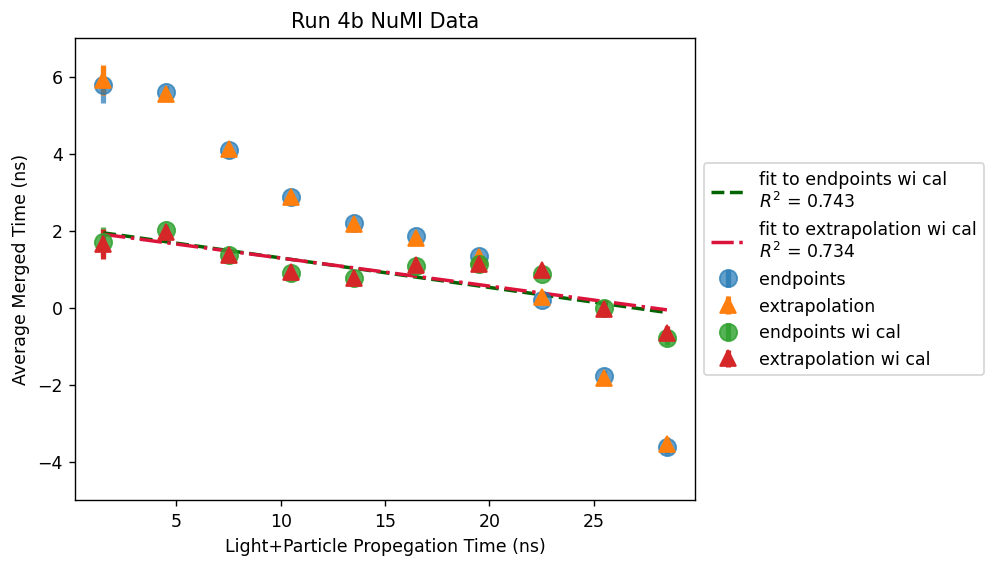

data nominal linear fit: m = -0.027   b = 0.7451
9.006645760813917 0.317
data no cor linear fit: m = -0.0219   b = 1.1971
0.5118702626832156 0.894
data wi cor linear fit: m = -0.0203   b = 0.423
6.371937683075368 0.269
data linear no cor linear fit: m = -0.0218   b = 1.1532
1.0886175126772406 0.889
data linear wi cor linear fit: m = -0.0206   b = 0.4422
3.8136398031237686 0.286
data spacepoints wi cor linear fit: m = -0.022   b = 0.4549
6.246752389582002 0.32


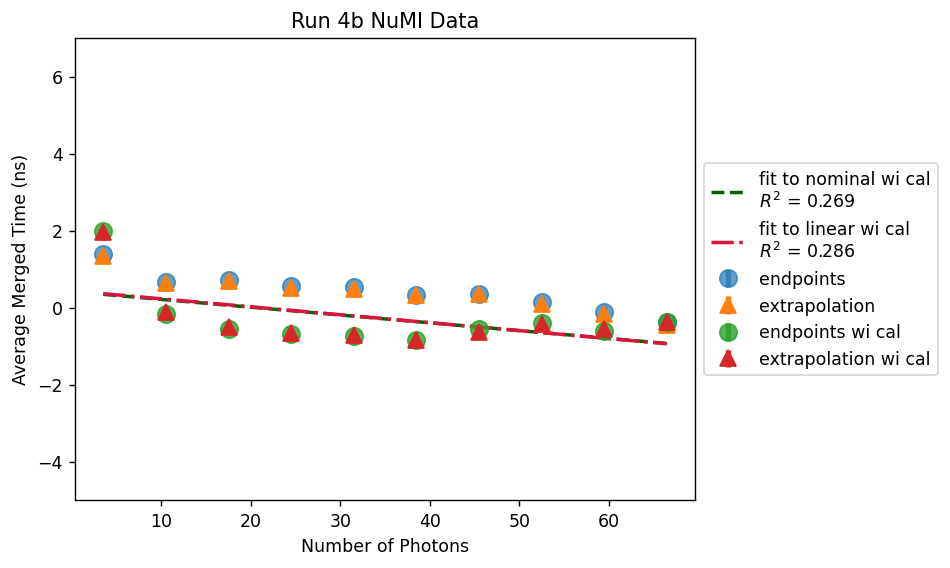

data nominal linear fit: m = -0.0017   b = 1.4529
0.7714507129294969 0.263
data no cor linear fit: m = -0.0212   b = 5.5404
-16.8747448613232 0.951
data wi cor linear fit: m = -0.0051   b = 1.8573
2.0749169518712955 0.711
data linear wi cor linear fit: m = -0.0219   b = 5.6583
-5.543012257858269 0.951
data linear wi cor linear fit: m = -0.0048   b = 1.7852
2.206137595061609 0.693
data spacepoints wi cor linear fit: m = -0.0044   b = 1.7004
1.3192408055180804 0.708


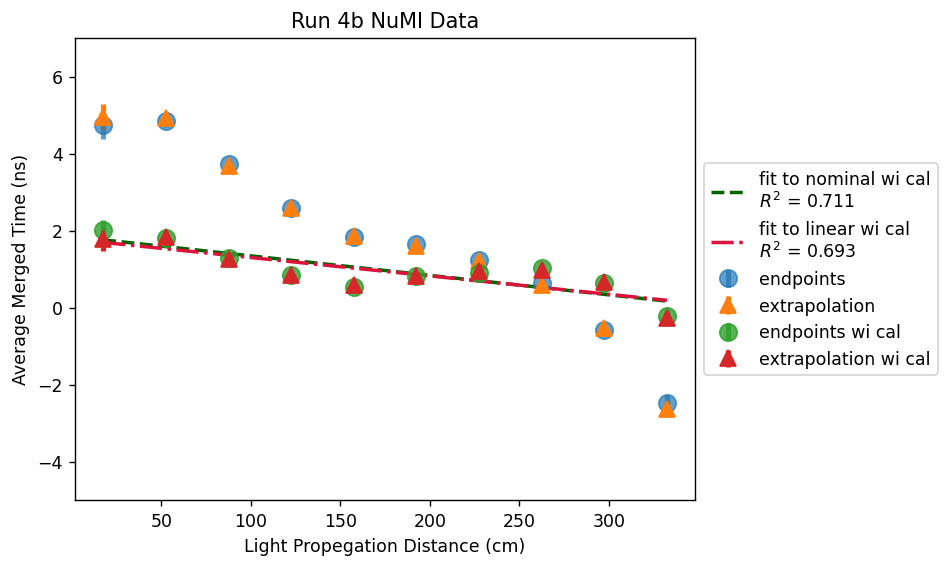

data nominal linear fit: m = -0.0049   b = 0.7031
-4.135378203376091 0.561
data no cor linear fit: m = -0.0211   b = 1.6835
8.1692279548207 0.927
data wi cor linear fit: m = -0.0077   b = 0.6134
12.427293163264501 0.783
data linear no cor linear fit: m = -0.0204   b = 1.2244
-4.687120874523109 0.905
data linear wi cor linear fit: m = -0.0057   b = 0.1317
-98.87345530483852 0.476
data spacepoints wi cor linear fit: m = -0.0057   b = 0.1608
52.7356360318044 0.521


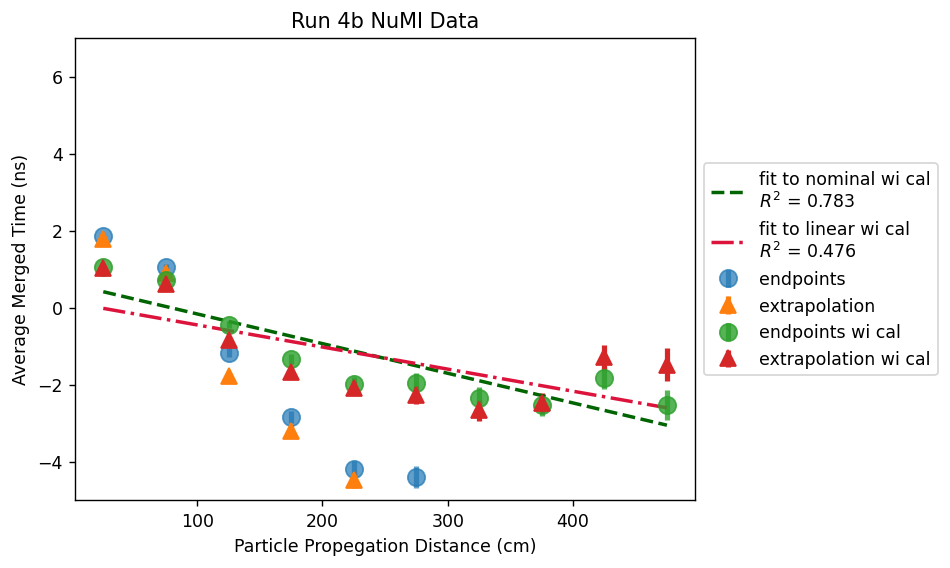

data nominal linear fit: m = -0.0023   b = 1.584
3.7494261755553615 0.558
data no cor linear fit: m = -0.0008   b = 1.0017
6.956974791989863 0.166
data wi cor linear fit: m = -0.0014   b = 1.0247
2612.696973852387 0.398
data linear no cor linear fit: m = -0.0004   b = 0.8243
6.658508516227878 0.044
data linear wi cor linear fit: m = -0.0009   b = 0.9179
55.84184540022401 0.215
data spacepoints wi cor linear fit: m = -0.0012   b = 0.9536
7.8050805640437 0.393


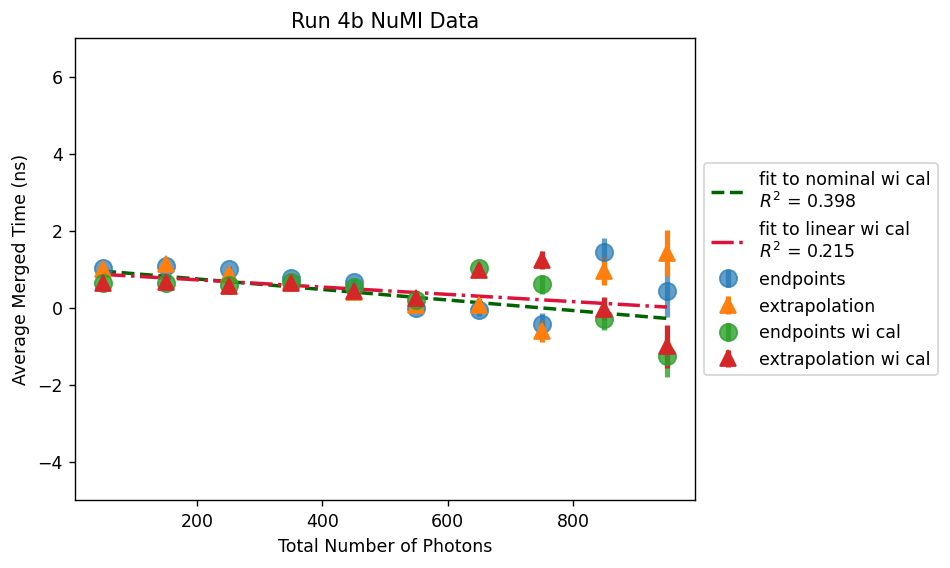

data nominal linear fit: m = -0.0052   b = 1.5395
0.3947435205283887 0.846
data no cor linear fit: m = -0.0075   b = 1.779
3.736866882406377 0.896
data wi cor linear fit: m = -0.0024   b = 0.8883
0.5153784917114305 0.536
data linear no cor linear fit: m = -0.0074   b = 1.7271
-0.5907333036829349 0.923
data linear wi cor linear fit: m = -0.0024   b = 0.8967
0.41327811713740986 0.588
data spacepoints wi cor linear fit: m = -0.0024   b = 0.8817
0.6043625774922005 0.523


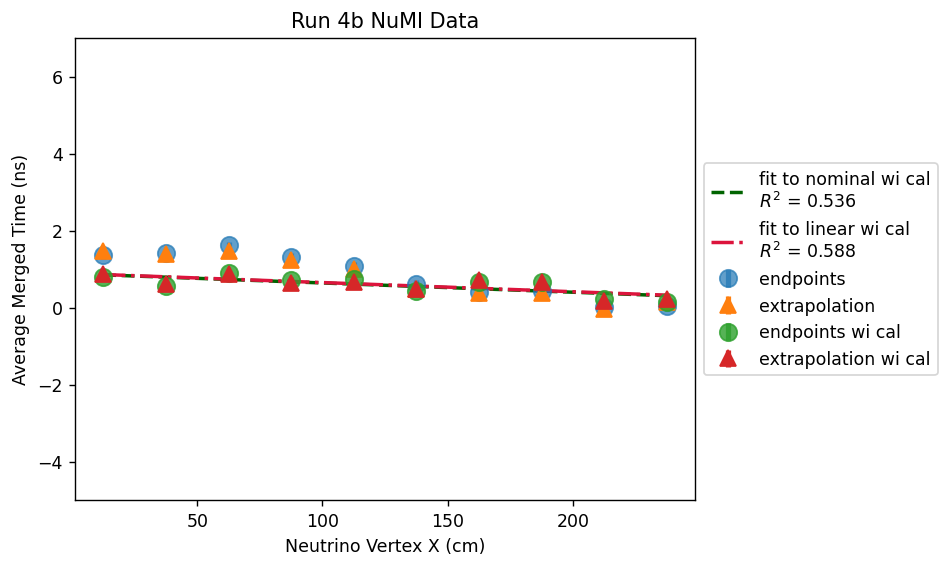

data nominal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/2180057574.py:1510: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times"] = merge_times
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/2180057574.py:1511: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp_df["merge_times_nocor"] = merge_times_nocor
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/2180057574.py:1511: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

data no cal: Triple Gaussian      mean: -0.1217   std: 3.2197   C: 276.113
38.01962704650277
data no cal: Triple Gaussian      mean: -0.4019   std: 2.8526   C: 251.3927
26.291419125880378
data linear vp no cal: Triple Gaussian      mean: -0.2238   std: 3.1028   C: 278.4874
42.53111902207415
data linear vp wi cal: Triple Gaussian      mean: -0.3358   std: 2.8203   C: 251.7986
32.03761564114982
data spacepoints vp wi cal: Triple Gaussian      mean: -0.3749   std: 2.8796   C: 250.0282
31.556793034963192


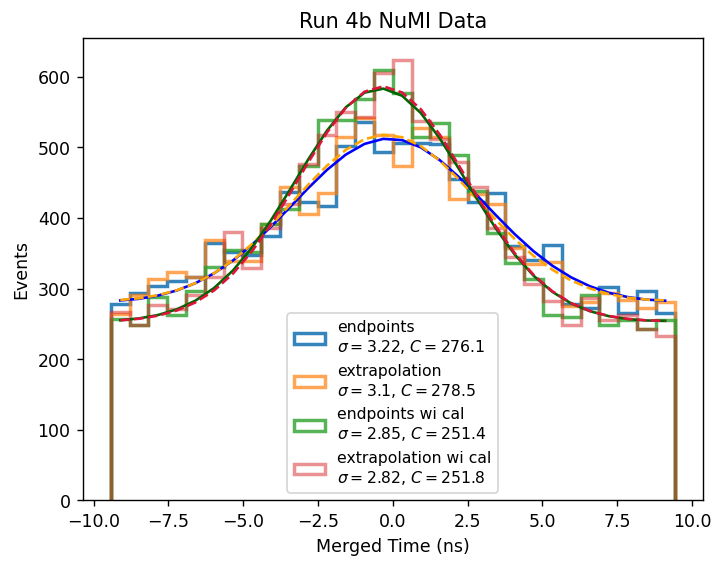

data nominal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data no cal: Triple Gaussian      mean: -0.1685   std: 3.5262   C: 93.3192
31.199254124247094
data wi cal: Triple Gaussian      mean: -0.1837   std: 2.7385   C: 89.5246
31.99045666519178
data linear vp no cal: Triple Gaussian      mean: -0.2806   std: 3.4042   C: 93.9276
24.377574720010422
data linear vp wi cal: Triple Gaussian      mean: -0.1217   std: 2.7197   C: 89.1763
34.93288246925706
data spacepoints vp wi cal: Triple Gaussian      mean: -0.1484   std: 2.8103   C: 87.6181
40.39680800324211


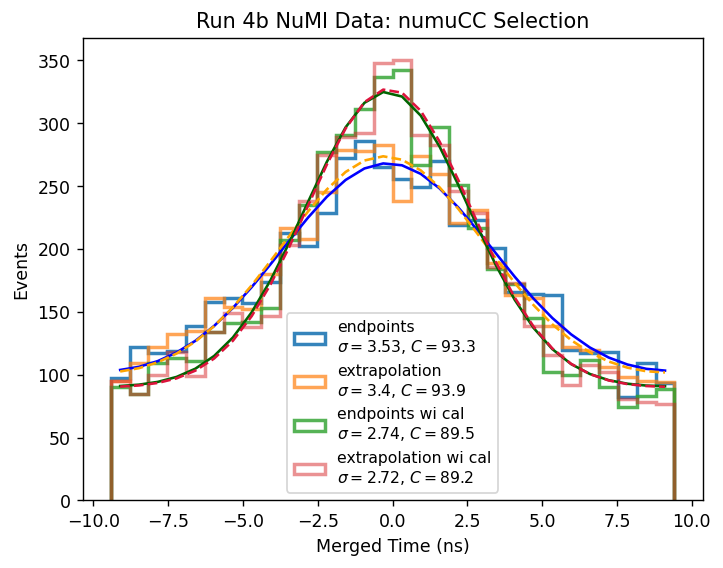

In [86]:

same_y = True
use_overflow=False

const_propt = []
const_propt_full = []
const_propt_ssmsp = []
const_Np = []
const_Np_full = []
const_Np_ssmsp = []
const_xvtx = []
const_xvtx_full = []
const_xvtx_ssmsp = []

m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_DL_i_ssmsp = 0
b_DL_i_ssmsp = 0
global_cor_ssmsp = 0
const_propt_ssmsp.append(m_propt_i_ssmsp)
const_Np_ssmsp.append(m_Np_i_ssmsp)
const_xvtx_ssmsp.append(m_xvtx_i_ssmsp)

#it 1
m_propt_i_ssmsp = -0.3199
b_propt_i_ssmsp = 6.0556
m_Np_i_ssmsp = -0.0191
b_Np_i_ssmsp = 0.5295
m_xvtx_i_ssmsp = -0.0084
b_xvtx_i_ssmsp = 1.2429
global_cor_ssmsp = 1.1
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 2
m_propt_i_ssmsp += -0.1147
b_propt_i_ssmsp += 2.7269
m_Np_i_ssmsp += -0.0434
b_Np_i_ssmsp += 0.9085
m_xvtx_i_ssmsp += -0.0041
b_xvtx_i_ssmsp += 1.0417
global_cor_ssmsp = 2.5
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)

m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_DL_i_fullDp = 0
b_DL_i_fullDp = 0
global_cor_fullDp = 0
const_propt_full.append(m_propt_i_fullDp)
const_Np_full.append(m_Np_i_fullDp)
const_xvtx_full.append(m_xvtx_i_fullDp)

#it 1
m_propt_i_fullDp = -0.323
b_propt_i_fullDp = 6.1711
m_Np_i_fullDp = -0.0196
b_Np_i_fullDp = 0.599
m_xvtx_i_fullDp = -0.0085
b_xvtx_i_fullDp = 1.317
global_cor_fullDp = 1.1
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 2
m_propt_i_fullDp += -0.1113
b_propt_i_fullDp += 2.6173
m_Np_i_fullDp += -0.0441
b_Np_i_fullDp += 0.89
m_xvtx_i_fullDp += -0.004
b_xvtx_i_fullDp += 0.9982
global_cor_fullDp = 2.5
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)

m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DLi = 0   
b_DL_i = 0
global_cor = -2.2

#it1
m_propt_i = -0.3227
b_propt_i = 6.1476
m_Np_i = -0.0203
b_Np_i = 0.6463
m_xvtx_i = -0.0081
b_xvtx_i = 1.3101
global_cor = 1.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it2
m_propt_i += -0.114
b_propt_i += 2.6835
m_Np_i += -0.0439
b_Np_i += 0.9104
m_xvtx_i += -0.004
b_xvtx_i += 1.0218
global_cor = 2.5
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)

n_pmt_propt_bins = 10
n_pmt_propt_min = 0
n_pmt_propt_max = 30

n_pmt_Nphoton_bins = 10
n_pmt_Nphoton_min = 0
n_pmt_Nphoton_max = 70

n_pmt_DL_bins = 10
n_pmt_DL_min = 0
n_pmt_DL_max = 350

n_pmt_DP_bins = 10
n_pmt_DP_min = 0
n_pmt_DP_max = 500

n_pmt_PhT_bins = 10
n_pmt_PhT_min = 0
n_pmt_PhT_max = 1000

n_pmt_xvtx_bins = 10
n_pmt_xvtx_min = 0
n_pmt_xvtx_max = 250

print("Query the df")
temp_df = df.query("evtTimeNS>0")

reco_nuvtxX_list =  temp_df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  temp_df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = temp_df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = temp_df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = temp_df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = temp_df["PMT_Amp"].to_numpy()

TT3_array_list = temp_df["TT3_array"].to_numpy()
TT3_array_nocor_list = temp_df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = temp_df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = temp_df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = temp_df["DLh_all"].to_numpy()
DP_all = temp_df["DPh_all"].to_numpy()
DP_full_all = temp_df["DPh_full_all"].to_numpy()
DL_full_all = temp_df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = temp_df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = temp_df["DPh_ssmsp_all"].to_numpy()

PhT_all = temp_df["Ph_Tot"].to_numpy()

file = temp_df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_fullDp = []
TT3_array_fullDp_list = []
merge_times_fullDp = []
merge_match_TT3_array_fullDp = []

ns_time_nocor = []
merge_times_nocor = []
merge_match_TT3_array_nocor = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
            
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i)  +global_cor)
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) +global_cor_fullDp)
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) +global_cor_ssmsp)

    ns_time.append(np.median(TT3_array))
    ns_time_nocor.append(np.median(TT3_array_nocor))
    #TT3_array_nocor_list.append(TT3_array_nocor)
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp.append(np.median(TT3_array_fullDp_nocor))
    TT3_array_fullDp_list.append(TT3_array_fullDp_nocor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_fullDp = ns_time_fullDp[event]-Shift+gap*0.5-0.8
    TT_merged_fullDp=-9999
    
    if TThelp_fullDp>=0:
        TT_merged_fullDp=(TThelp_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        
    merge_times_fullDp.append(TT_merged_fullDp)
    merge_match_TT3_array_fullDp.append([])

    TThelp_nocor = ns_time_nocor[event]-Shift+gap*0.5-0.8
    TT_merged_nocor=-9999
    
    if TThelp_nocor>=0:
        TT_merged_nocor=(TThelp_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        
    merge_times_nocor.append(TT_merged_nocor)
    merge_match_TT3_array_nocor.append([])
    
    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)

        TThelp_array_fullDp = TT3_array_fullDp_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp=-9999
        #shift according to the events time
        if TThelp_fullDp>=0:
            TT_array_merged_match_fullDp=(TThelp_array_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp[event].append(TT_array_merged_match_fullDp)

        TThelp_array_nocor = TT3_array_nocor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_nocor=-9999
        #shift according to the events time
        if TThelp_nocor>=0:
            TT_array_merged_match_nocor=(TThelp_array_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_nocor[event].append(TT_array_merged_match_nocor)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
    

#######################

print("Setting Bins")
#Propegation time bins
pmt_propt_bins = np.linspace(n_pmt_propt_min,n_pmt_propt_max,n_pmt_propt_bins+1)
pmt_propt_all_times = []
pmt_propt_avg_times = []
pmt_propt_avg_times_errors = []
pmt_propt_all_times_fullDp = []
pmt_propt_avg_times_fullDp = []
pmt_propt_avg_times_fullDp_errors = []
pmt_propt_all_times_nocor = []
pmt_propt_avg_times_nocor = []
pmt_propt_avg_times_nocor_errors = []
pmt_propt_all_times_recor = []
pmt_propt_avg_times_recor = []
pmt_propt_avg_times_recor_errors = []
pmt_propt_all_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor_errors = []
pmt_propt_all_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_propt_bins): 
    pmt_propt_all_times.append([])
    pmt_propt_avg_times.append(0)
    pmt_propt_avg_times_errors.append(0)
    pmt_propt_all_times_fullDp.append([])
    pmt_propt_avg_times_fullDp.append(0)
    pmt_propt_avg_times_fullDp_errors.append(0)
    pmt_propt_all_times_nocor.append([])
    pmt_propt_avg_times_nocor.append(0)
    pmt_propt_avg_times_nocor_errors.append(0)
    pmt_propt_all_times_recor.append([])
    pmt_propt_avg_times_recor.append(0)
    pmt_propt_avg_times_recor_errors.append(0)
    pmt_propt_all_times_fullDp_recor.append([])
    pmt_propt_avg_times_fullDp_recor.append(0)
    pmt_propt_avg_times_fullDp_recor_errors.append(0)
    pmt_propt_all_times_ssmsp_recor.append([])
    pmt_propt_avg_times_ssmsp_recor.append(0)
    pmt_propt_avg_times_ssmsp_recor_errors.append(0)
    
#Number of photon bins
pmt_Nphoton_bins = np.linspace(n_pmt_Nphoton_min,n_pmt_Nphoton_max,n_pmt_Nphoton_bins+1)
pmt_Nphoton_all_times = []
pmt_Nphoton_avg_times = []
pmt_Nphoton_avg_times_errors = []
pmt_Nphoton_all_times_nocor = []
pmt_Nphoton_avg_times_nocor = []
pmt_Nphoton_avg_times_nocor_errors = []
pmt_Nphoton_all_times_recor = []
pmt_Nphoton_avg_times_recor = []
pmt_Nphoton_avg_times_recor_errors = []
pmt_Nphoton_all_times_fullDp = []
pmt_Nphoton_avg_times_fullDp = []
pmt_Nphoton_avg_times_fullDp_errors = []
pmt_Nphoton_all_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor_errors = []
pmt_Nphoton_all_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_all_times.append([])
    pmt_Nphoton_avg_times.append(0)
    pmt_Nphoton_avg_times_errors.append(0)
    pmt_Nphoton_all_times_nocor.append([])
    pmt_Nphoton_avg_times_nocor.append(0)
    pmt_Nphoton_avg_times_nocor_errors.append(0)
    pmt_Nphoton_all_times_recor.append([])
    pmt_Nphoton_avg_times_recor.append(0)
    pmt_Nphoton_avg_times_recor_errors.append(0)
    pmt_Nphoton_all_times_fullDp.append([])
    pmt_Nphoton_avg_times_fullDp.append(0)
    pmt_Nphoton_avg_times_fullDp_errors.append(0)
    pmt_Nphoton_all_times_fullDp_recor.append([])
    pmt_Nphoton_avg_times_fullDp_recor.append(0)
    pmt_Nphoton_avg_times_fullDp_recor_errors.append(0)
    pmt_Nphoton_all_times_ssmsp_recor.append([])
    pmt_Nphoton_avg_times_ssmsp_recor.append(0)
    pmt_Nphoton_avg_times_ssmsp_recor_errors.append(0)
    
#Light propegation distance bins
pmt_DL_bins = np.linspace(n_pmt_DL_min,n_pmt_DL_max,n_pmt_DL_bins+1)
pmt_DL_all_times = []
pmt_DL_avg_times = []
pmt_DL_avg_times_errors = []
pmt_DL_all_times_nocor = []
pmt_DL_avg_times_nocor = []
pmt_DL_avg_times_nocor_errors = []
pmt_DL_all_times_recor = []
pmt_DL_avg_times_recor = []
pmt_DL_avg_times_recor_errors = []
pmt_DL_all_times_fullDp = []
pmt_DL_avg_times_fullDp = []
pmt_DL_avg_times_fullDp_errors = []
pmt_DL_all_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor_errors = []
pmt_DL_all_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DL_bins): 
    pmt_DL_all_times.append([])
    pmt_DL_avg_times.append(0)
    pmt_DL_avg_times_errors.append(0)
    pmt_DL_all_times_nocor.append([])
    pmt_DL_avg_times_nocor.append(0)
    pmt_DL_avg_times_nocor_errors.append(0)
    pmt_DL_all_times_recor.append([])
    pmt_DL_avg_times_recor.append(0)
    pmt_DL_avg_times_recor_errors.append(0)
    pmt_DL_all_times_fullDp.append([])
    pmt_DL_avg_times_fullDp.append(0)
    pmt_DL_avg_times_fullDp_errors.append(0)
    pmt_DL_all_times_fullDp_recor.append([])
    pmt_DL_avg_times_fullDp_recor.append(0)
    pmt_DL_avg_times_fullDp_recor_errors.append(0) 
    pmt_DL_all_times_ssmsp_recor.append([])
    pmt_DL_avg_times_ssmsp_recor.append(0)
    pmt_DL_avg_times_ssmsp_recor_errors.append(0) 
    
#Particle propegation bins
pmt_DP_bins = np.linspace(n_pmt_DP_min,n_pmt_DP_max,n_pmt_DP_bins+1)
pmt_DP_all_times= []
pmt_DP_avg_times = []
pmt_DP_avg_times_errors = []
pmt_DP_all_times_nocor = []
pmt_DP_avg_times_nocor = []
pmt_DP_avg_times_nocor_errors = []
pmt_DP_all_times_recor = []
pmt_DP_avg_times_recor = []
pmt_DP_avg_times_recor_errors = []
pmt_DP_all_times_fullDp = []
pmt_DP_avg_times_fullDp = []
pmt_DP_avg_times_fullDp_errors = []
pmt_DP_all_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor_errors = []
pmt_DP_all_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DP_bins): 
    pmt_DP_all_times.append([])
    pmt_DP_avg_times.append(0)
    pmt_DP_avg_times_errors.append(0)
    pmt_DP_all_times_nocor.append([])
    pmt_DP_avg_times_nocor.append(0)
    pmt_DP_avg_times_nocor_errors.append(0)
    pmt_DP_all_times_recor.append([])
    pmt_DP_avg_times_recor.append(0)
    pmt_DP_avg_times_recor_errors.append(0)
    pmt_DP_all_times_fullDp.append([])
    pmt_DP_avg_times_fullDp.append(0)
    pmt_DP_avg_times_fullDp_errors.append(0) 
    pmt_DP_all_times_fullDp_recor.append([])
    pmt_DP_avg_times_fullDp_recor.append(0)
    pmt_DP_avg_times_fullDp_recor_errors.append(0) 
    pmt_DP_all_times_ssmsp_recor.append([])
    pmt_DP_avg_times_ssmsp_recor.append(0)
    pmt_DP_avg_times_ssmsp_recor_errors.append(0)
    
#Total Photon bins
pmt_PhT_bins = np.linspace(n_pmt_PhT_min,n_pmt_PhT_max,n_pmt_PhT_bins+1)
pmt_PhT_all_times = []
pmt_PhT_avg_times = []
pmt_PhT_avg_times_errors = []
pmt_PhT_all_times_nocor = []
pmt_PhT_avg_times_nocor = []
pmt_PhT_avg_times_nocor_errors = []
pmt_PhT_all_times_recor = []
pmt_PhT_avg_times_recor = []
pmt_PhT_avg_times_recor_errors = []
pmt_PhT_all_times_fullDp = []
pmt_PhT_avg_times_fullDp = []
pmt_PhT_avg_times_fullDp_errors = []
pmt_PhT_all_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor_errors = []
pmt_PhT_all_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_all_times.append([])
    pmt_PhT_avg_times.append(0)
    pmt_PhT_avg_times_errors.append(0)
    pmt_PhT_all_times_nocor.append([])
    pmt_PhT_avg_times_nocor.append(0)
    pmt_PhT_avg_times_nocor_errors.append(0)
    pmt_PhT_all_times_recor.append([])
    pmt_PhT_avg_times_recor.append(0)
    pmt_PhT_avg_times_recor_errors.append(0)
    pmt_PhT_all_times_fullDp.append([])
    pmt_PhT_avg_times_fullDp.append(0)
    pmt_PhT_avg_times_fullDp_errors.append(0) 
    pmt_PhT_all_times_fullDp_recor.append([])
    pmt_PhT_avg_times_fullDp_recor.append(0)
    pmt_PhT_avg_times_fullDp_recor_errors.append(0) 
    pmt_PhT_all_times_ssmsp_recor.append([])
    pmt_PhT_avg_times_ssmsp_recor.append(0)
    pmt_PhT_avg_times_ssmsp_recor_errors.append(0) 
    
#X vertex bins
pmt_xvtx_bins = np.linspace(n_pmt_xvtx_min,n_pmt_xvtx_max,n_pmt_xvtx_bins+1)
pmt_xvtx_all_times = []
pmt_xvtx_avg_times = []
pmt_xvtx_avg_times_errors = []
pmt_xvtx_all_times_nocor = []
pmt_xvtx_avg_times_nocor = []
pmt_xvtx_avg_times_nocor_errors = []
pmt_xvtx_all_times_recor = []
pmt_xvtx_avg_times_recor = []
pmt_xvtx_avg_times_recor_errors = []
pmt_xvtx_all_times_fullDp = []
pmt_xvtx_avg_times_fullDp = []
pmt_xvtx_avg_times_fullDp_errors = []
pmt_xvtx_all_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor_errors = []
pmt_xvtx_all_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_all_times.append([])
    pmt_xvtx_avg_times.append(0)
    pmt_xvtx_avg_times_errors.append(0)
    pmt_xvtx_all_times_nocor.append([])
    pmt_xvtx_avg_times_nocor.append(0)
    pmt_xvtx_avg_times_nocor_errors.append(0)
    pmt_xvtx_all_times_recor.append([])
    pmt_xvtx_avg_times_recor.append(0)
    pmt_xvtx_avg_times_recor_errors.append(0)
    pmt_xvtx_all_times_fullDp.append([])
    pmt_xvtx_avg_times_fullDp.append(0)
    pmt_xvtx_avg_times_fullDp_errors.append(0) 
    pmt_xvtx_all_times_fullDp_recor.append([])
    pmt_xvtx_avg_times_fullDp_recor.append(0)
    pmt_xvtx_avg_times_fullDp_recor_errors.append(0) 
    pmt_xvtx_all_times_ssmsp_recor.append([])
    pmt_xvtx_avg_times_ssmsp_recor.append(0)
    pmt_xvtx_avg_times_ssmsp_recor_errors.append(0) 

print("Filling nominal with corrections histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_propt_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_Nphoton_all_times[ibin].append(merge_match_TT3_array[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DL_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DP_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_PhT_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_xvtx_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break 

print("Setting nominal with corrections averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times[i] = statistics.mean(pmt_propt_all_times[i])     
    pmt_propt_avg_times_errors[i] = (statistics.stdev(pmt_propt_all_times[i])/np.sqrt(len(pmt_propt_all_times[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times[i] = statistics.mean(pmt_Nphoton_all_times[i])     
    pmt_Nphoton_avg_times_errors[i] = (statistics.stdev(pmt_Nphoton_all_times[i])/np.sqrt(len(pmt_Nphoton_all_times[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times[i] = statistics.mean(pmt_DL_all_times[i])     
    pmt_DL_avg_times_errors[i] = (statistics.stdev(pmt_DL_all_times[i])/np.sqrt(len(pmt_DL_all_times[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times[i] = statistics.mean(pmt_DP_all_times[i])     
    pmt_DP_avg_times_errors[i] = (statistics.stdev(pmt_DP_all_times[i])/np.sqrt(len(pmt_DP_all_times[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times[i] = statistics.mean(pmt_PhT_all_times[i])     
    pmt_PhT_avg_times_errors[i] = (statistics.stdev(pmt_PhT_all_times[i])/np.sqrt(len(pmt_PhT_all_times[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times[i] = statistics.mean(pmt_xvtx_all_times[i])     
    pmt_xvtx_avg_times_errors[i] = (statistics.stdev(pmt_xvtx_all_times[i])/np.sqrt(len(pmt_xvtx_all_times[i])))

print("Filling nocor nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_propt_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_Nphoton_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DL_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DP_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_PhT_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_xvtx_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break 

print("Setting nocor nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_nocor[i] = statistics.mean(pmt_propt_all_times_nocor[i])     
    pmt_propt_avg_times_nocor_errors[i] = (statistics.stdev(pmt_propt_all_times_nocor[i])/np.sqrt(len(pmt_propt_all_times_nocor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_nocor[i] = statistics.mean(pmt_Nphoton_all_times_nocor[i])     
    pmt_Nphoton_avg_times_nocor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_nocor[i])/np.sqrt(len(pmt_Nphoton_all_times_nocor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_nocor[i] = statistics.mean(pmt_DL_all_times_nocor[i])     
    pmt_DL_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DL_all_times_nocor[i])/np.sqrt(len(pmt_DL_all_times_nocor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_nocor[i] = statistics.mean(pmt_DP_all_times_nocor[i])     
    pmt_DP_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DP_all_times_nocor[i])/np.sqrt(len(pmt_DP_all_times_nocor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_nocor[i] = statistics.mean(pmt_PhT_all_times_nocor[i])     
    pmt_PhT_avg_times_nocor_errors[i] = (statistics.stdev(pmt_PhT_all_times_nocor[i])/np.sqrt(len(pmt_PhT_all_times_nocor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_nocor[i] = statistics.mean(pmt_xvtx_all_times_nocor[i])     
    pmt_xvtx_avg_times_nocor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_nocor[i])/np.sqrt(len(pmt_xvtx_all_times_nocor[i])))




print("Filling nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_propt_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_Nphoton_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DL_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DP_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_PhT_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_xvtx_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break 

print("Setting nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_recor[i] = statistics.mean(pmt_propt_all_times_recor[i])     
    pmt_propt_avg_times_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_recor[i])/np.sqrt(len(pmt_propt_all_times_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_recor[i] = statistics.mean(pmt_Nphoton_all_times_recor[i])     
    pmt_Nphoton_avg_times_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_recor[i] = statistics.mean(pmt_DL_all_times_recor[i])     
    pmt_DL_avg_times_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_recor[i])/np.sqrt(len(pmt_DL_all_times_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_recor[i] = statistics.mean(pmt_DP_all_times_recor[i])     
    pmt_DP_avg_times_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_recor[i])/np.sqrt(len(pmt_DP_all_times_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_recor[i] = statistics.mean(pmt_PhT_all_times_recor[i])     
    pmt_PhT_avg_times_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_recor[i])/np.sqrt(len(pmt_PhT_all_times_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_recor[i] = statistics.mean(pmt_xvtx_all_times_recor[i])     
    pmt_xvtx_avg_times_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_recor[i])/np.sqrt(len(pmt_xvtx_all_times_recor[i])))




print("Filling nocor linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_propt_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_Nphoton_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DL_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DP_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_PhT_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_xvtx_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break

print("Setting nocor linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp[i] = statistics.mean(pmt_propt_all_times_fullDp[i])     
    pmt_propt_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp[i])/np.sqrt(len(pmt_propt_all_times_fullDp[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp[i] = statistics.mean(pmt_Nphoton_all_times_fullDp[i])     
    pmt_Nphoton_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp[i] = statistics.mean(pmt_DL_all_times_fullDp[i])     
    pmt_DL_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp[i])/np.sqrt(len(pmt_DL_all_times_fullDp[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp[i] = statistics.mean(pmt_DP_all_times_fullDp[i])     
    pmt_DP_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp[i])/np.sqrt(len(pmt_DP_all_times_fullDp[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp[i] = statistics.mean(pmt_PhT_all_times_fullDp[i])     
    pmt_PhT_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp[i])/np.sqrt(len(pmt_PhT_all_times_fullDp[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp[i] = statistics.mean(pmt_xvtx_all_times_fullDp[i])     
    pmt_xvtx_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp[i])))



print("Filling linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_propt_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_Nphoton_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DL_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DP_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_PhT_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_xvtx_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break

print("Setting linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp_recor[i] = statistics.mean(pmt_propt_all_times_fullDp_recor[i])     
    pmt_propt_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp_recor[i])/np.sqrt(len(pmt_propt_all_times_fullDp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp_recor[i] = statistics.mean(pmt_Nphoton_all_times_fullDp_recor[i])     
    pmt_Nphoton_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp_recor[i] = statistics.mean(pmt_DL_all_times_fullDp_recor[i])     
    pmt_DL_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DL_all_times_fullDp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp_recor[i] = statistics.mean(pmt_DP_all_times_fullDp_recor[i])     
    pmt_DP_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DP_all_times_fullDp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp_recor[i] = statistics.mean(pmt_PhT_all_times_fullDp_recor[i])     
    pmt_PhT_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp_recor[i])/np.sqrt(len(pmt_PhT_all_times_fullDp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp_recor[i] = statistics.mean(pmt_xvtx_all_times_fullDp_recor[i])     
    pmt_xvtx_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp_recor[i])))


print("Filling sapcepoints histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_ssmsp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_ssmsp_all[event]
    DP = DP_ssmsp_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_ssmsp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_ssmsp_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_ssmsp_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_propt_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_Nphoton_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DL_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DP_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_PhT_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX_ssmsp>pmt_xvtx_bins[ibin] and reco_nuvtxX_ssmsp<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_xvtx_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break

print("Setting spacepoints averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_ssmsp_recor[i] = statistics.mean(pmt_propt_all_times_ssmsp_recor[i])     
    pmt_propt_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_propt_all_times_ssmsp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_ssmsp_recor[i] = statistics.mean(pmt_Nphoton_all_times_ssmsp_recor[i])     
    pmt_Nphoton_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DL_all_times_ssmsp_recor[i])     
    pmt_DL_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DL_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DP_all_times_ssmsp_recor[i])     
    pmt_DP_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DP_all_times_ssmsp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_ssmsp_recor[i] = statistics.mean(pmt_PhT_all_times_ssmsp_recor[i])     
    pmt_PhT_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_PhT_all_times_ssmsp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_ssmsp_recor[i] = statistics.mean(pmt_xvtx_all_times_ssmsp_recor[i])     
    pmt_xvtx_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_ssmsp_recor[i])))

############################################################################################



plot_title = "Run 4b NuMI Data"

popt,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_propt_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_propt_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_propt_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_propt_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_propt_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_propt_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor,yerr=pmt_propt_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor,yerr=pmt_propt_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to endpoints wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to extrapolation wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7) 
if same_y_tight: plt.ylim(-2,2) 
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light+Particle Propegation Time (ns)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_Nphoton_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_Nphoton_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_Nphoton_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_Nphoton_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_Nphoton_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_Nphoton_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor,yerr=pmt_Nphoton_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp,yerr=pmt_Nphoton_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor,yerr=pmt_Nphoton_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor,yerr=pmt_Nphoton_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DL_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DL_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DL_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp)
print("data linear wi cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DL_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)



popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DL_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DL_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor,yerr=pmt_DL_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp,yerr=pmt_DL_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor,yerr=pmt_DL_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor,yerr=pmt_DL_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DP_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DP_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DP_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DP_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DP_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DP_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor,yerr=pmt_DP_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp,yerr=pmt_DP_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor,yerr=pmt_DP_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor,yerr=pmt_DP_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Particle Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_PhT_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_PhT_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_PhT_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_PhT_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_PhT_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_PhT_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor,yerr=pmt_PhT_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp,yerr=pmt_PhT_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor,yerr=pmt_PhT_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor,yerr=pmt_PhT_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Total Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_xvtx_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_xvtx_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_xvtx_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_xvtx_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_xvtx_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_xvtx_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor,yerr=pmt_xvtx_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp,yerr=pmt_xvtx_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor,yerr=pmt_xvtx_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor,yerr=pmt_xvtx_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Neutrino Vertex X (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################
#######################
nbins = 30

temp_df["merge_times"] = merge_times
temp_df["merge_times_nocor"] = merge_times_nocor
temp_df["merge_times_recor"] = merge_times_recor
temp_df["merge_times_fullDp"] = merge_times_fullDp
temp_df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
temp_df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor


data = temp_df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)

data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()





data = temp_df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42").query("numu_score>0.8")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)


data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42").query("numu_score>0.8")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data wi cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)


data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42").query("numu_score>0.8")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)


data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42").query("numu_score>0.8")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()

# Iteration 3

Query the df
Setting recalibrated times


100%|███████████████████████████████████| 11703/11703 [00:02<00:00, 4886.89it/s]


Setting Bins
Filling nominal with corrections histograms
Setting nominal with corrections averages
Filling nocor nominal histograms
Setting nocor nominal averages
Filling nominal histograms
Setting nominal averages
Filling nocor linear histograms
Setting nocor linear averages
Filling linear histograms
Setting linear averages
Filling sapcepoints histograms
Setting spacepoints averages
data nominal linear fit: m = -0.0371   b = 1.6896
1.099394519622555 0.5
data no cor linear fit: m = -0.3244   b = 6.7252
0.9438480811190403 0.956
data wi cor linear fit: m = -0.0333   b = 1.3345
2.080959299504091 0.4
data linear no cor linear fit: m = -0.3254   b = 6.756
0.5318248886000909 0.959
data linear wi cor linear fit: m = -0.0344   b = 1.3615
1.9851787653434316 0.424
data spacepoints wi cor linear fit: m = -0.0327   b = 1.3054
2.1198024391797743 0.381


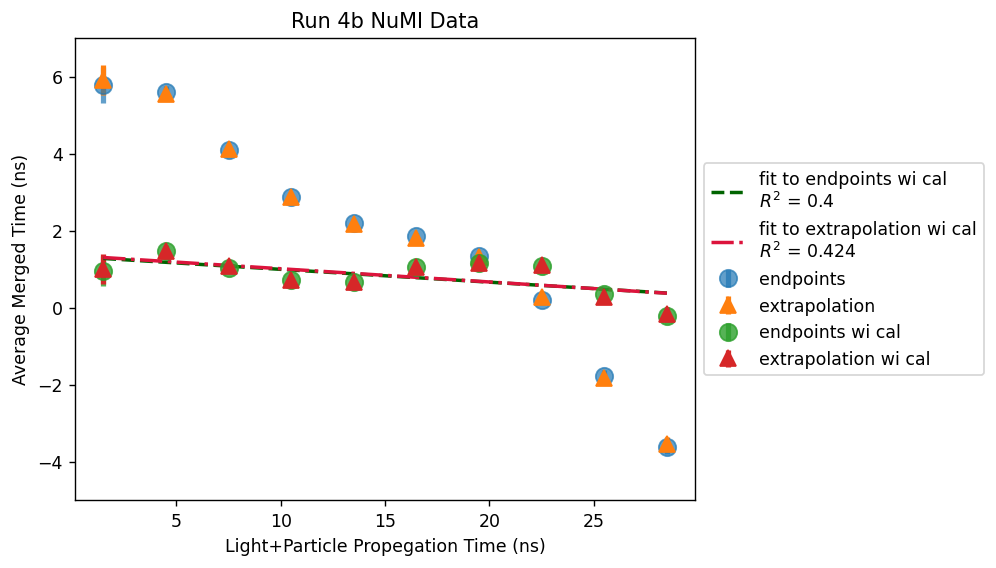

data nominal linear fit: m = -0.027   b = 0.7451
9.006645760813917 0.317
data no cor linear fit: m = -0.0219   b = 1.1971
0.5118702626832156 0.894
data wi cor linear fit: m = -0.0133   b = 0.2852
8.048302708205163 0.107
data linear no cor linear fit: m = -0.0218   b = 1.1532
1.0886175126772406 0.889
data linear wi cor linear fit: m = -0.0131   b = 0.2915
0.9294189017418538 0.109
data spacepoints wi cor linear fit: m = -0.0124   b = 0.2508
18.310599087102712 0.1


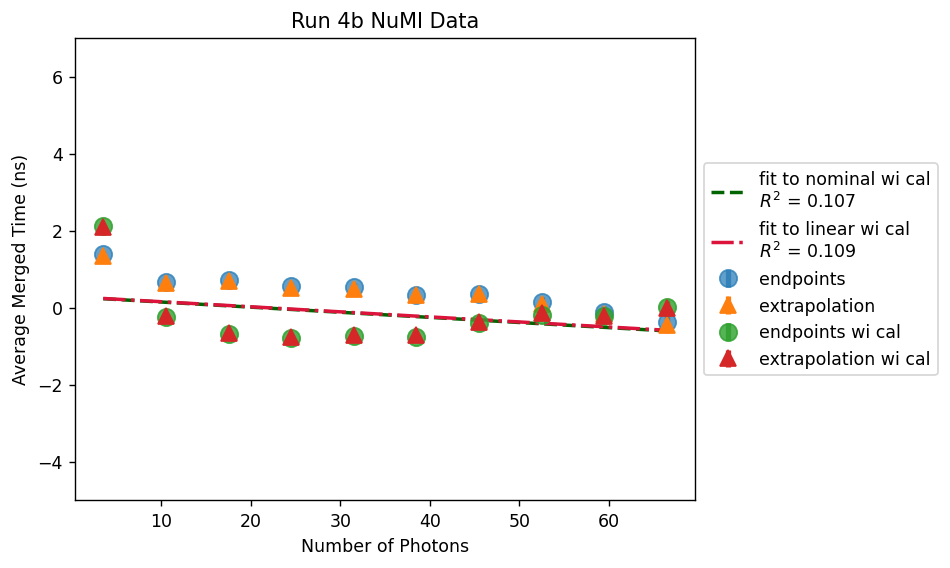

data nominal linear fit: m = -0.0017   b = 1.4529
0.7714507129294969 0.263
data no cor linear fit: m = -0.0212   b = 5.5404
-16.8747448613232 0.951
data wi cor linear fit: m = -0.0021   b = 1.2721
1.0015557935005097 0.353
data linear wi cor linear fit: m = -0.0219   b = 5.6583
-5.543012257858269 0.951
data linear wi cor linear fit: m = -0.0022   b = 1.2649
1.0437211799599746 0.377
data spacepoints wi cor linear fit: m = -0.0021   b = 1.2289
0.8268537968203283 0.395


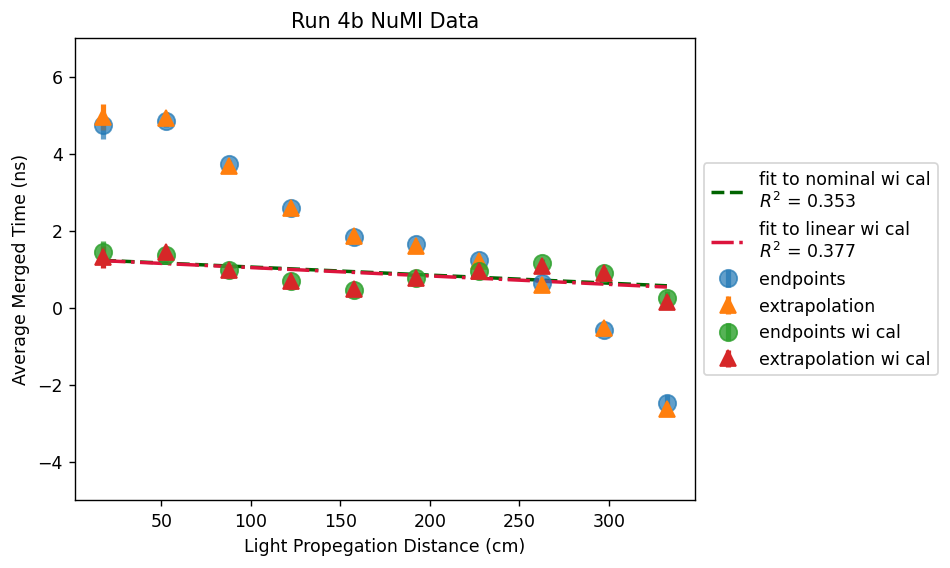

data nominal linear fit: m = -0.0049   b = 0.7031
-4.135378203376091 0.561
data no cor linear fit: m = -0.0211   b = 1.6835
8.1692279548207 0.927
data wi cor linear fit: m = -0.0058   b = 0.5767
0.5568609737146553 0.684
data linear no cor linear fit: m = -0.0204   b = 1.2244
-4.687120874523109 0.905
data linear wi cor linear fit: m = -0.0037   b = 0.1147
37.18813280643671 0.32
data spacepoints wi cor linear fit: m = -0.004   b = 0.1322
20.91120096733429 0.386


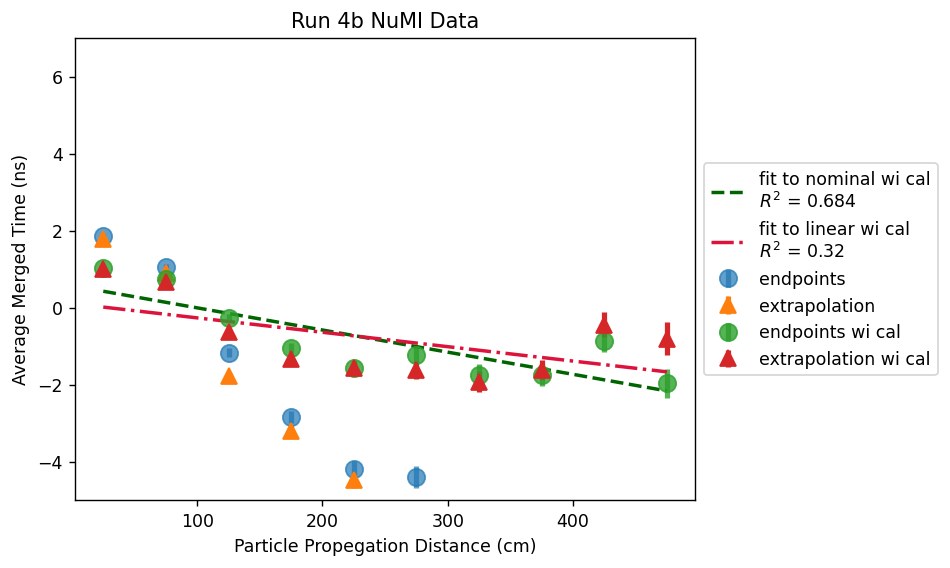

data nominal linear fit: m = -0.0023   b = 1.584
3.7494261755553615 0.558
data no cor linear fit: m = -0.0008   b = 1.0017
6.956974791989863 0.166
data wi cor linear fit: m = -0.0005   b = 0.8636
3.330387260427962 0.141
data linear no cor linear fit: m = -0.0004   b = 0.8243
6.658508516227878 0.044
data linear wi cor linear fit: m = -0.0003   b = 0.7933
2.3739349835387116 0.064
data spacepoints wi cor linear fit: m = -0.0004   b = 0.7637
1.9189866159962885 0.106


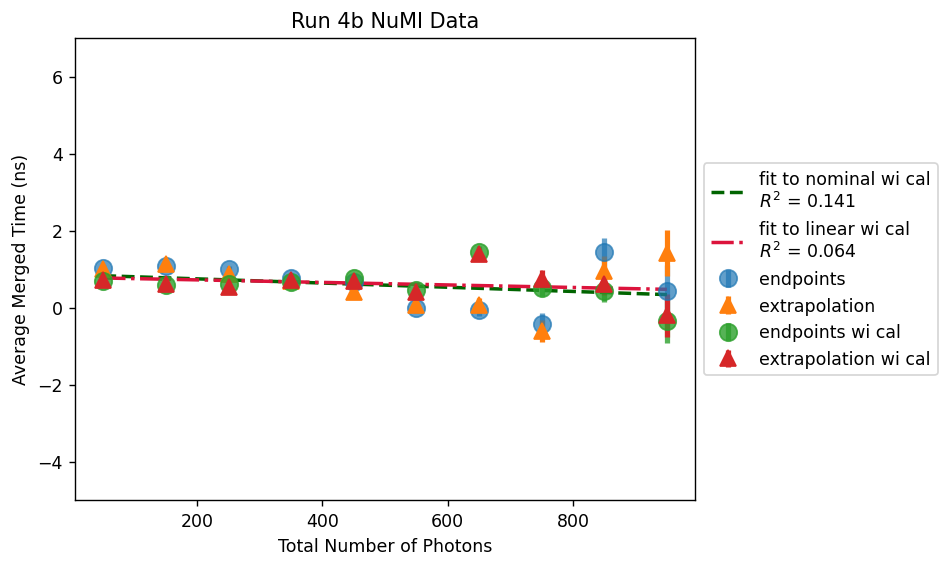

data nominal linear fit: m = -0.0052   b = 1.5395
0.3947435205283887 0.846
data no cor linear fit: m = -0.0075   b = 1.779
3.736866882406377 0.896
data wi cor linear fit: m = -0.0009   b = 0.7674
0.4919507062478382 0.124
data linear no cor linear fit: m = -0.0074   b = 1.7271
-0.5907333036829349 0.923
data linear wi cor linear fit: m = -0.0008   b = 0.7476
0.4462784577615022 0.109
data spacepoints wi cor linear fit: m = -0.0007   b = 0.7024
0.4256773717921048 0.09


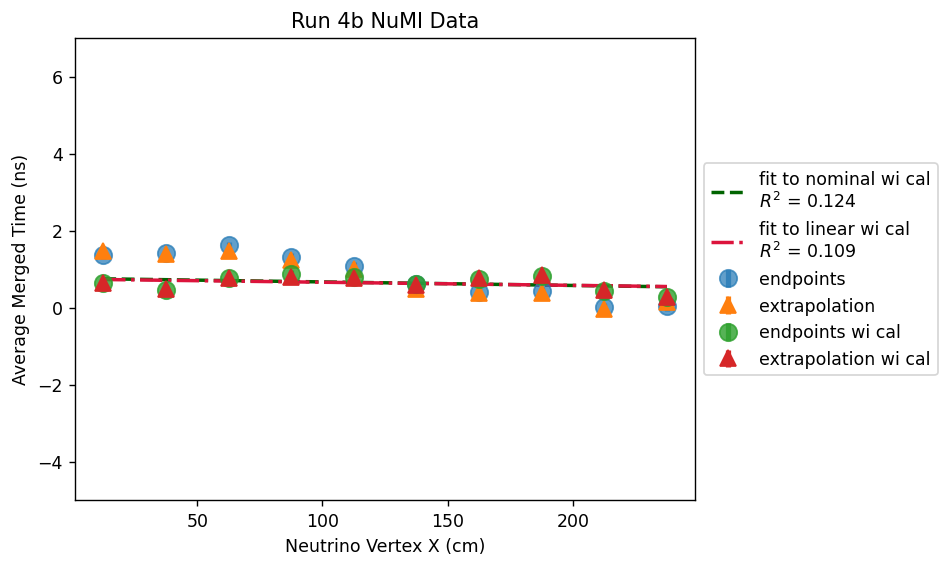

data nominal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779
data no cal: Triple Gaussian      mean: -0.1217   std: 3.2197   C: 276.113
38.01962704650277


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/81835337.py:1542: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times"] = merge_times
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/81835337.py:1543: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp_df["merge_times_nocor"] = merge_times_nocor
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/81835337.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try 

data no cal: Triple Gaussian      mean: -0.4847   std: 2.9383   C: 247.198
21.44007061537621
data linear vp no cal: Triple Gaussian      mean: -0.2238   std: 3.1028   C: 278.4874
42.531119628152545
data linear vp wi cal: Triple Gaussian      mean: -0.425   std: 2.8566   C: 250.184
30.555376386562035
data spacepoints vp wi cal: Triple Gaussian      mean: -0.4078   std: 2.871   C: 249.5582
32.085507107353756


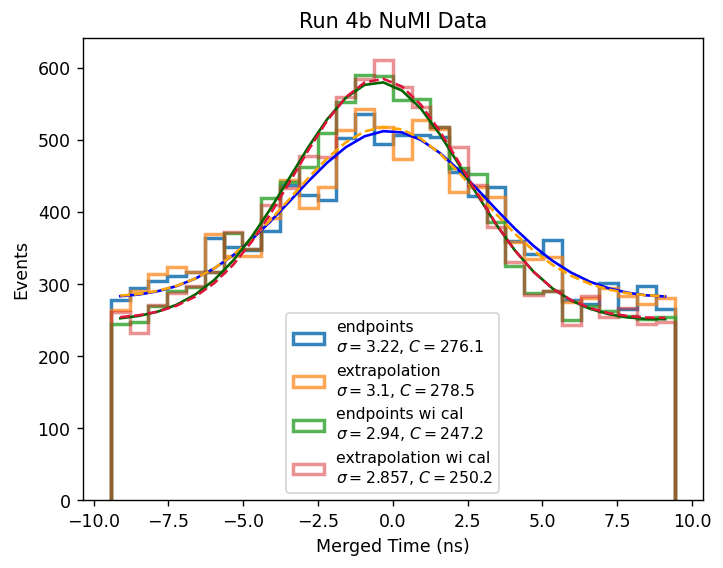

data nominal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data no cal: Triple Gaussian      mean: -0.1685   std: 3.5262   C: 93.3192
31.199254124247094
data wi cal: Triple Gaussian      mean: -0.217   std: 2.8103   C: 87.3294
30.16915384203142
data linear vp no cal: Triple Gaussian      mean: -0.2806   std: 3.4042   C: 93.9276
24.377574714077486
data linear vp wi cal: Triple Gaussian      mean: -0.1748   std: 2.7445   C: 88.6291
26.720522916742574
data spacepoints vp wi cal: Triple Gaussian      mean: -0.1393   std: 2.7698   C: 88.896
29.16284130539627


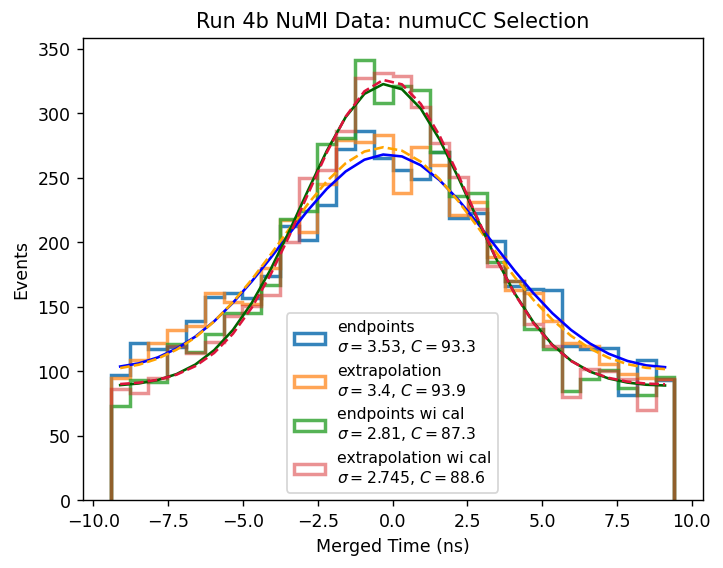

In [88]:

same_y = True
use_overflow=False

const_propt = []
const_propt_full = []
const_propt_ssmsp = []
const_Np = []
const_Np_full = []
const_Np_ssmsp = []
const_xvtx = []
const_xvtx_full = []
const_xvtx_ssmsp = []

m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_DL_i_ssmsp = 0
b_DL_i_ssmsp = 0
global_cor_ssmsp = 0
const_propt_ssmsp.append(m_propt_i_ssmsp)
const_Np_ssmsp.append(m_Np_i_ssmsp)
const_xvtx_ssmsp.append(m_xvtx_i_ssmsp)
#it 1
m_propt_i_ssmsp = -0.3199
b_propt_i_ssmsp = 6.0556
m_Np_i_ssmsp = -0.0191
b_Np_i_ssmsp = 0.5295
m_xvtx_i_ssmsp = -0.0084
b_xvtx_i_ssmsp = 1.2429
global_cor_ssmsp = 1.1
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 2
m_propt_i_ssmsp += -0.1147
b_propt_i_ssmsp += 2.7269
m_Np_i_ssmsp += -0.0434
b_Np_i_ssmsp += 0.9085
m_xvtx_i_ssmsp += -0.0041
b_xvtx_i_ssmsp += 1.0417
global_cor_ssmsp = 2.5
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 3
m_propt_i_ssmsp += -0.0699
b_propt_i_ssmsp += 1.9546
m_Np_i_ssmsp += -0.0221
b_Np_i_ssmsp += 0.4549
m_xvtx_i_ssmsp += -0.0024 
b_xvtx_i_ssmsp += 0.8808
global_cor_ssmsp = 3.9
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)

m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_DL_i_fullDp = 0
b_DL_i_fullDp = 0
global_cor_fullDp = 0
const_propt_full.append(m_propt_i_fullDp)
const_Np_full.append(m_Np_i_fullDp)
const_xvtx_full.append(m_xvtx_i_fullDp)

#it 1
m_propt_i_fullDp = -0.323
b_propt_i_fullDp = 6.1711
m_Np_i_fullDp = -0.0196
b_Np_i_fullDp = 0.599
m_xvtx_i_fullDp = -0.0085
b_xvtx_i_fullDp = 1.317
global_cor_fullDp = 1.1
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 2
m_propt_i_fullDp += -0.1113
b_propt_i_fullDp += 2.6173
m_Np_i_fullDp += -0.0441
b_Np_i_fullDp += 0.89
m_xvtx_i_fullDp += -0.004
b_xvtx_i_fullDp += 0.9982
global_cor_fullDp = 2.5
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 3
m_propt_i_fullDp += -0.0727
b_propt_i_fullDp += 2.0216
m_Np_i_fullDp += -0.0206
b_Np_i_fullDp += 0.4422
m_xvtx_i_fullDp += -0.0024
b_xvtx_i_fullDp += 0.8967
global_cor_fullDp = 3.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)

m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DLi = 0   
b_DL_i = 0
global_cor = -2.2

#it1
m_propt_i = -0.3227
b_propt_i = 6.1476
m_Np_i = -0.0203
b_Np_i = 0.6463
m_xvtx_i = -0.0081
b_xvtx_i = 1.3101
global_cor = 1.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it2
m_propt_i += -0.114
b_propt_i += 2.6835
m_Np_i += -0.0439
b_Np_i += 0.9104
m_xvtx_i += -0.004
b_xvtx_i += 1.0218
global_cor = 2.5
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it 3
m_propt_i += -0.0767 
b_propt_i += 2.065
m_Np_i += -0.0203
b_Np_i += 0.423
m_xvtx_i += -0.0024
b_xvtx_i += 0.8883
global_cor = 3.9
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)

n_pmt_propt_bins = 10
n_pmt_propt_min = 0
n_pmt_propt_max = 30

n_pmt_Nphoton_bins = 10
n_pmt_Nphoton_min = 0
n_pmt_Nphoton_max = 70

n_pmt_DL_bins = 10
n_pmt_DL_min = 0
n_pmt_DL_max = 350

n_pmt_DP_bins = 10
n_pmt_DP_min = 0
n_pmt_DP_max = 500

n_pmt_PhT_bins = 10
n_pmt_PhT_min = 0
n_pmt_PhT_max = 1000

n_pmt_xvtx_bins = 10
n_pmt_xvtx_min = 0
n_pmt_xvtx_max = 250

print("Query the df")
temp_df = df.query("evtTimeNS>0")

reco_nuvtxX_list =  temp_df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  temp_df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = temp_df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = temp_df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = temp_df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = temp_df["PMT_Amp"].to_numpy()

TT3_array_list = temp_df["TT3_array"].to_numpy()
TT3_array_nocor_list = temp_df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = temp_df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = temp_df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = temp_df["DLh_all"].to_numpy()
DP_all = temp_df["DPh_all"].to_numpy()
DP_full_all = temp_df["DPh_full_all"].to_numpy()
DL_full_all = temp_df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = temp_df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = temp_df["DPh_ssmsp_all"].to_numpy()

PhT_all = temp_df["Ph_Tot"].to_numpy()

file = temp_df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_fullDp = []
TT3_array_fullDp_list = []
merge_times_fullDp = []
merge_match_TT3_array_fullDp = []

ns_time_nocor = []
merge_times_nocor = []
merge_match_TT3_array_nocor = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
            
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i)  +global_cor)
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) +global_cor_fullDp)
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) +global_cor_ssmsp)

    ns_time.append(np.median(TT3_array))
    ns_time_nocor.append(np.median(TT3_array_nocor))
    #TT3_array_nocor_list.append(TT3_array_nocor)
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp.append(np.median(TT3_array_fullDp_nocor))
    TT3_array_fullDp_list.append(TT3_array_fullDp_nocor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_fullDp = ns_time_fullDp[event]-Shift+gap*0.5-0.8
    TT_merged_fullDp=-9999
    
    if TThelp_fullDp>=0:
        TT_merged_fullDp=(TThelp_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        
    merge_times_fullDp.append(TT_merged_fullDp)
    merge_match_TT3_array_fullDp.append([])

    TThelp_nocor = ns_time_nocor[event]-Shift+gap*0.5-0.8
    TT_merged_nocor=-9999
    
    if TThelp_nocor>=0:
        TT_merged_nocor=(TThelp_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        
    merge_times_nocor.append(TT_merged_nocor)
    merge_match_TT3_array_nocor.append([])
    
    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)

        TThelp_array_fullDp = TT3_array_fullDp_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp=-9999
        #shift according to the events time
        if TThelp_fullDp>=0:
            TT_array_merged_match_fullDp=(TThelp_array_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp[event].append(TT_array_merged_match_fullDp)

        TThelp_array_nocor = TT3_array_nocor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_nocor=-9999
        #shift according to the events time
        if TThelp_nocor>=0:
            TT_array_merged_match_nocor=(TThelp_array_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_nocor[event].append(TT_array_merged_match_nocor)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
    

#######################

print("Setting Bins")
#Propegation time bins
pmt_propt_bins = np.linspace(n_pmt_propt_min,n_pmt_propt_max,n_pmt_propt_bins+1)
pmt_propt_all_times = []
pmt_propt_avg_times = []
pmt_propt_avg_times_errors = []
pmt_propt_all_times_fullDp = []
pmt_propt_avg_times_fullDp = []
pmt_propt_avg_times_fullDp_errors = []
pmt_propt_all_times_nocor = []
pmt_propt_avg_times_nocor = []
pmt_propt_avg_times_nocor_errors = []
pmt_propt_all_times_recor = []
pmt_propt_avg_times_recor = []
pmt_propt_avg_times_recor_errors = []
pmt_propt_all_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor_errors = []
pmt_propt_all_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_propt_bins): 
    pmt_propt_all_times.append([])
    pmt_propt_avg_times.append(0)
    pmt_propt_avg_times_errors.append(0)
    pmt_propt_all_times_fullDp.append([])
    pmt_propt_avg_times_fullDp.append(0)
    pmt_propt_avg_times_fullDp_errors.append(0)
    pmt_propt_all_times_nocor.append([])
    pmt_propt_avg_times_nocor.append(0)
    pmt_propt_avg_times_nocor_errors.append(0)
    pmt_propt_all_times_recor.append([])
    pmt_propt_avg_times_recor.append(0)
    pmt_propt_avg_times_recor_errors.append(0)
    pmt_propt_all_times_fullDp_recor.append([])
    pmt_propt_avg_times_fullDp_recor.append(0)
    pmt_propt_avg_times_fullDp_recor_errors.append(0)
    pmt_propt_all_times_ssmsp_recor.append([])
    pmt_propt_avg_times_ssmsp_recor.append(0)
    pmt_propt_avg_times_ssmsp_recor_errors.append(0)
    
#Number of photon bins
pmt_Nphoton_bins = np.linspace(n_pmt_Nphoton_min,n_pmt_Nphoton_max,n_pmt_Nphoton_bins+1)
pmt_Nphoton_all_times = []
pmt_Nphoton_avg_times = []
pmt_Nphoton_avg_times_errors = []
pmt_Nphoton_all_times_nocor = []
pmt_Nphoton_avg_times_nocor = []
pmt_Nphoton_avg_times_nocor_errors = []
pmt_Nphoton_all_times_recor = []
pmt_Nphoton_avg_times_recor = []
pmt_Nphoton_avg_times_recor_errors = []
pmt_Nphoton_all_times_fullDp = []
pmt_Nphoton_avg_times_fullDp = []
pmt_Nphoton_avg_times_fullDp_errors = []
pmt_Nphoton_all_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor_errors = []
pmt_Nphoton_all_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_all_times.append([])
    pmt_Nphoton_avg_times.append(0)
    pmt_Nphoton_avg_times_errors.append(0)
    pmt_Nphoton_all_times_nocor.append([])
    pmt_Nphoton_avg_times_nocor.append(0)
    pmt_Nphoton_avg_times_nocor_errors.append(0)
    pmt_Nphoton_all_times_recor.append([])
    pmt_Nphoton_avg_times_recor.append(0)
    pmt_Nphoton_avg_times_recor_errors.append(0)
    pmt_Nphoton_all_times_fullDp.append([])
    pmt_Nphoton_avg_times_fullDp.append(0)
    pmt_Nphoton_avg_times_fullDp_errors.append(0)
    pmt_Nphoton_all_times_fullDp_recor.append([])
    pmt_Nphoton_avg_times_fullDp_recor.append(0)
    pmt_Nphoton_avg_times_fullDp_recor_errors.append(0)
    pmt_Nphoton_all_times_ssmsp_recor.append([])
    pmt_Nphoton_avg_times_ssmsp_recor.append(0)
    pmt_Nphoton_avg_times_ssmsp_recor_errors.append(0)
    
#Light propegation distance bins
pmt_DL_bins = np.linspace(n_pmt_DL_min,n_pmt_DL_max,n_pmt_DL_bins+1)
pmt_DL_all_times = []
pmt_DL_avg_times = []
pmt_DL_avg_times_errors = []
pmt_DL_all_times_nocor = []
pmt_DL_avg_times_nocor = []
pmt_DL_avg_times_nocor_errors = []
pmt_DL_all_times_recor = []
pmt_DL_avg_times_recor = []
pmt_DL_avg_times_recor_errors = []
pmt_DL_all_times_fullDp = []
pmt_DL_avg_times_fullDp = []
pmt_DL_avg_times_fullDp_errors = []
pmt_DL_all_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor_errors = []
pmt_DL_all_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DL_bins): 
    pmt_DL_all_times.append([])
    pmt_DL_avg_times.append(0)
    pmt_DL_avg_times_errors.append(0)
    pmt_DL_all_times_nocor.append([])
    pmt_DL_avg_times_nocor.append(0)
    pmt_DL_avg_times_nocor_errors.append(0)
    pmt_DL_all_times_recor.append([])
    pmt_DL_avg_times_recor.append(0)
    pmt_DL_avg_times_recor_errors.append(0)
    pmt_DL_all_times_fullDp.append([])
    pmt_DL_avg_times_fullDp.append(0)
    pmt_DL_avg_times_fullDp_errors.append(0)
    pmt_DL_all_times_fullDp_recor.append([])
    pmt_DL_avg_times_fullDp_recor.append(0)
    pmt_DL_avg_times_fullDp_recor_errors.append(0) 
    pmt_DL_all_times_ssmsp_recor.append([])
    pmt_DL_avg_times_ssmsp_recor.append(0)
    pmt_DL_avg_times_ssmsp_recor_errors.append(0) 
    
#Particle propegation bins
pmt_DP_bins = np.linspace(n_pmt_DP_min,n_pmt_DP_max,n_pmt_DP_bins+1)
pmt_DP_all_times= []
pmt_DP_avg_times = []
pmt_DP_avg_times_errors = []
pmt_DP_all_times_nocor = []
pmt_DP_avg_times_nocor = []
pmt_DP_avg_times_nocor_errors = []
pmt_DP_all_times_recor = []
pmt_DP_avg_times_recor = []
pmt_DP_avg_times_recor_errors = []
pmt_DP_all_times_fullDp = []
pmt_DP_avg_times_fullDp = []
pmt_DP_avg_times_fullDp_errors = []
pmt_DP_all_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor_errors = []
pmt_DP_all_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DP_bins): 
    pmt_DP_all_times.append([])
    pmt_DP_avg_times.append(0)
    pmt_DP_avg_times_errors.append(0)
    pmt_DP_all_times_nocor.append([])
    pmt_DP_avg_times_nocor.append(0)
    pmt_DP_avg_times_nocor_errors.append(0)
    pmt_DP_all_times_recor.append([])
    pmt_DP_avg_times_recor.append(0)
    pmt_DP_avg_times_recor_errors.append(0)
    pmt_DP_all_times_fullDp.append([])
    pmt_DP_avg_times_fullDp.append(0)
    pmt_DP_avg_times_fullDp_errors.append(0) 
    pmt_DP_all_times_fullDp_recor.append([])
    pmt_DP_avg_times_fullDp_recor.append(0)
    pmt_DP_avg_times_fullDp_recor_errors.append(0) 
    pmt_DP_all_times_ssmsp_recor.append([])
    pmt_DP_avg_times_ssmsp_recor.append(0)
    pmt_DP_avg_times_ssmsp_recor_errors.append(0)
    
#Total Photon bins
pmt_PhT_bins = np.linspace(n_pmt_PhT_min,n_pmt_PhT_max,n_pmt_PhT_bins+1)
pmt_PhT_all_times = []
pmt_PhT_avg_times = []
pmt_PhT_avg_times_errors = []
pmt_PhT_all_times_nocor = []
pmt_PhT_avg_times_nocor = []
pmt_PhT_avg_times_nocor_errors = []
pmt_PhT_all_times_recor = []
pmt_PhT_avg_times_recor = []
pmt_PhT_avg_times_recor_errors = []
pmt_PhT_all_times_fullDp = []
pmt_PhT_avg_times_fullDp = []
pmt_PhT_avg_times_fullDp_errors = []
pmt_PhT_all_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor_errors = []
pmt_PhT_all_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_all_times.append([])
    pmt_PhT_avg_times.append(0)
    pmt_PhT_avg_times_errors.append(0)
    pmt_PhT_all_times_nocor.append([])
    pmt_PhT_avg_times_nocor.append(0)
    pmt_PhT_avg_times_nocor_errors.append(0)
    pmt_PhT_all_times_recor.append([])
    pmt_PhT_avg_times_recor.append(0)
    pmt_PhT_avg_times_recor_errors.append(0)
    pmt_PhT_all_times_fullDp.append([])
    pmt_PhT_avg_times_fullDp.append(0)
    pmt_PhT_avg_times_fullDp_errors.append(0) 
    pmt_PhT_all_times_fullDp_recor.append([])
    pmt_PhT_avg_times_fullDp_recor.append(0)
    pmt_PhT_avg_times_fullDp_recor_errors.append(0) 
    pmt_PhT_all_times_ssmsp_recor.append([])
    pmt_PhT_avg_times_ssmsp_recor.append(0)
    pmt_PhT_avg_times_ssmsp_recor_errors.append(0) 
    
#X vertex bins
pmt_xvtx_bins = np.linspace(n_pmt_xvtx_min,n_pmt_xvtx_max,n_pmt_xvtx_bins+1)
pmt_xvtx_all_times = []
pmt_xvtx_avg_times = []
pmt_xvtx_avg_times_errors = []
pmt_xvtx_all_times_nocor = []
pmt_xvtx_avg_times_nocor = []
pmt_xvtx_avg_times_nocor_errors = []
pmt_xvtx_all_times_recor = []
pmt_xvtx_avg_times_recor = []
pmt_xvtx_avg_times_recor_errors = []
pmt_xvtx_all_times_fullDp = []
pmt_xvtx_avg_times_fullDp = []
pmt_xvtx_avg_times_fullDp_errors = []
pmt_xvtx_all_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor_errors = []
pmt_xvtx_all_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_all_times.append([])
    pmt_xvtx_avg_times.append(0)
    pmt_xvtx_avg_times_errors.append(0)
    pmt_xvtx_all_times_nocor.append([])
    pmt_xvtx_avg_times_nocor.append(0)
    pmt_xvtx_avg_times_nocor_errors.append(0)
    pmt_xvtx_all_times_recor.append([])
    pmt_xvtx_avg_times_recor.append(0)
    pmt_xvtx_avg_times_recor_errors.append(0)
    pmt_xvtx_all_times_fullDp.append([])
    pmt_xvtx_avg_times_fullDp.append(0)
    pmt_xvtx_avg_times_fullDp_errors.append(0) 
    pmt_xvtx_all_times_fullDp_recor.append([])
    pmt_xvtx_avg_times_fullDp_recor.append(0)
    pmt_xvtx_avg_times_fullDp_recor_errors.append(0) 
    pmt_xvtx_all_times_ssmsp_recor.append([])
    pmt_xvtx_avg_times_ssmsp_recor.append(0)
    pmt_xvtx_avg_times_ssmsp_recor_errors.append(0) 

print("Filling nominal with corrections histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_propt_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_Nphoton_all_times[ibin].append(merge_match_TT3_array[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DL_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DP_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_PhT_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_xvtx_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break 

print("Setting nominal with corrections averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times[i] = statistics.mean(pmt_propt_all_times[i])     
    pmt_propt_avg_times_errors[i] = (statistics.stdev(pmt_propt_all_times[i])/np.sqrt(len(pmt_propt_all_times[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times[i] = statistics.mean(pmt_Nphoton_all_times[i])     
    pmt_Nphoton_avg_times_errors[i] = (statistics.stdev(pmt_Nphoton_all_times[i])/np.sqrt(len(pmt_Nphoton_all_times[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times[i] = statistics.mean(pmt_DL_all_times[i])     
    pmt_DL_avg_times_errors[i] = (statistics.stdev(pmt_DL_all_times[i])/np.sqrt(len(pmt_DL_all_times[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times[i] = statistics.mean(pmt_DP_all_times[i])     
    pmt_DP_avg_times_errors[i] = (statistics.stdev(pmt_DP_all_times[i])/np.sqrt(len(pmt_DP_all_times[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times[i] = statistics.mean(pmt_PhT_all_times[i])     
    pmt_PhT_avg_times_errors[i] = (statistics.stdev(pmt_PhT_all_times[i])/np.sqrt(len(pmt_PhT_all_times[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times[i] = statistics.mean(pmt_xvtx_all_times[i])     
    pmt_xvtx_avg_times_errors[i] = (statistics.stdev(pmt_xvtx_all_times[i])/np.sqrt(len(pmt_xvtx_all_times[i])))

print("Filling nocor nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_propt_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_Nphoton_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DL_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DP_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_PhT_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_xvtx_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break 

print("Setting nocor nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_nocor[i] = statistics.mean(pmt_propt_all_times_nocor[i])     
    pmt_propt_avg_times_nocor_errors[i] = (statistics.stdev(pmt_propt_all_times_nocor[i])/np.sqrt(len(pmt_propt_all_times_nocor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_nocor[i] = statistics.mean(pmt_Nphoton_all_times_nocor[i])     
    pmt_Nphoton_avg_times_nocor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_nocor[i])/np.sqrt(len(pmt_Nphoton_all_times_nocor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_nocor[i] = statistics.mean(pmt_DL_all_times_nocor[i])     
    pmt_DL_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DL_all_times_nocor[i])/np.sqrt(len(pmt_DL_all_times_nocor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_nocor[i] = statistics.mean(pmt_DP_all_times_nocor[i])     
    pmt_DP_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DP_all_times_nocor[i])/np.sqrt(len(pmt_DP_all_times_nocor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_nocor[i] = statistics.mean(pmt_PhT_all_times_nocor[i])     
    pmt_PhT_avg_times_nocor_errors[i] = (statistics.stdev(pmt_PhT_all_times_nocor[i])/np.sqrt(len(pmt_PhT_all_times_nocor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_nocor[i] = statistics.mean(pmt_xvtx_all_times_nocor[i])     
    pmt_xvtx_avg_times_nocor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_nocor[i])/np.sqrt(len(pmt_xvtx_all_times_nocor[i])))




print("Filling nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_propt_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_Nphoton_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DL_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DP_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_PhT_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_xvtx_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break 

print("Setting nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_recor[i] = statistics.mean(pmt_propt_all_times_recor[i])     
    pmt_propt_avg_times_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_recor[i])/np.sqrt(len(pmt_propt_all_times_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_recor[i] = statistics.mean(pmt_Nphoton_all_times_recor[i])     
    pmt_Nphoton_avg_times_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_recor[i] = statistics.mean(pmt_DL_all_times_recor[i])     
    pmt_DL_avg_times_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_recor[i])/np.sqrt(len(pmt_DL_all_times_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_recor[i] = statistics.mean(pmt_DP_all_times_recor[i])     
    pmt_DP_avg_times_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_recor[i])/np.sqrt(len(pmt_DP_all_times_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_recor[i] = statistics.mean(pmt_PhT_all_times_recor[i])     
    pmt_PhT_avg_times_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_recor[i])/np.sqrt(len(pmt_PhT_all_times_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_recor[i] = statistics.mean(pmt_xvtx_all_times_recor[i])     
    pmt_xvtx_avg_times_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_recor[i])/np.sqrt(len(pmt_xvtx_all_times_recor[i])))




print("Filling nocor linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_propt_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_Nphoton_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DL_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DP_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_PhT_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_xvtx_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break

print("Setting nocor linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp[i] = statistics.mean(pmt_propt_all_times_fullDp[i])     
    pmt_propt_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp[i])/np.sqrt(len(pmt_propt_all_times_fullDp[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp[i] = statistics.mean(pmt_Nphoton_all_times_fullDp[i])     
    pmt_Nphoton_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp[i] = statistics.mean(pmt_DL_all_times_fullDp[i])     
    pmt_DL_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp[i])/np.sqrt(len(pmt_DL_all_times_fullDp[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp[i] = statistics.mean(pmt_DP_all_times_fullDp[i])     
    pmt_DP_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp[i])/np.sqrt(len(pmt_DP_all_times_fullDp[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp[i] = statistics.mean(pmt_PhT_all_times_fullDp[i])     
    pmt_PhT_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp[i])/np.sqrt(len(pmt_PhT_all_times_fullDp[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp[i] = statistics.mean(pmt_xvtx_all_times_fullDp[i])     
    pmt_xvtx_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp[i])))



print("Filling linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_propt_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_Nphoton_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DL_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DP_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_PhT_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_xvtx_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break

print("Setting linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp_recor[i] = statistics.mean(pmt_propt_all_times_fullDp_recor[i])     
    pmt_propt_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp_recor[i])/np.sqrt(len(pmt_propt_all_times_fullDp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp_recor[i] = statistics.mean(pmt_Nphoton_all_times_fullDp_recor[i])     
    pmt_Nphoton_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp_recor[i] = statistics.mean(pmt_DL_all_times_fullDp_recor[i])     
    pmt_DL_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DL_all_times_fullDp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp_recor[i] = statistics.mean(pmt_DP_all_times_fullDp_recor[i])     
    pmt_DP_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DP_all_times_fullDp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp_recor[i] = statistics.mean(pmt_PhT_all_times_fullDp_recor[i])     
    pmt_PhT_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp_recor[i])/np.sqrt(len(pmt_PhT_all_times_fullDp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp_recor[i] = statistics.mean(pmt_xvtx_all_times_fullDp_recor[i])     
    pmt_xvtx_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp_recor[i])))


print("Filling sapcepoints histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_ssmsp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_ssmsp_all[event]
    DP = DP_ssmsp_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_ssmsp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_ssmsp_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_ssmsp_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_propt_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_Nphoton_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DL_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DP_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_PhT_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX_ssmsp>pmt_xvtx_bins[ibin] and reco_nuvtxX_ssmsp<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_xvtx_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break

print("Setting spacepoints averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_ssmsp_recor[i] = statistics.mean(pmt_propt_all_times_ssmsp_recor[i])     
    pmt_propt_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_propt_all_times_ssmsp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_ssmsp_recor[i] = statistics.mean(pmt_Nphoton_all_times_ssmsp_recor[i])     
    pmt_Nphoton_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DL_all_times_ssmsp_recor[i])     
    pmt_DL_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DL_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DP_all_times_ssmsp_recor[i])     
    pmt_DP_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DP_all_times_ssmsp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_ssmsp_recor[i] = statistics.mean(pmt_PhT_all_times_ssmsp_recor[i])     
    pmt_PhT_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_PhT_all_times_ssmsp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_ssmsp_recor[i] = statistics.mean(pmt_xvtx_all_times_ssmsp_recor[i])     
    pmt_xvtx_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_ssmsp_recor[i])))

############################################################################################



plot_title = "Run 4b NuMI Data"

popt,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_propt_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_propt_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_propt_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_propt_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_propt_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_propt_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor,yerr=pmt_propt_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor,yerr=pmt_propt_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to endpoints wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to extrapolation wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7) 
if same_y_tight: plt.ylim(-2,2) 
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light+Particle Propegation Time (ns)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_Nphoton_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_Nphoton_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_Nphoton_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_Nphoton_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_Nphoton_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_Nphoton_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor,yerr=pmt_Nphoton_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp,yerr=pmt_Nphoton_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor,yerr=pmt_Nphoton_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor,yerr=pmt_Nphoton_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DL_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DL_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DL_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp)
print("data linear wi cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DL_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)



popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DL_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DL_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor,yerr=pmt_DL_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp,yerr=pmt_DL_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor,yerr=pmt_DL_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor,yerr=pmt_DL_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DP_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DP_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DP_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DP_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DP_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DP_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor,yerr=pmt_DP_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp,yerr=pmt_DP_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor,yerr=pmt_DP_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor,yerr=pmt_DP_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Particle Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_PhT_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_PhT_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_PhT_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_PhT_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_PhT_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_PhT_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor,yerr=pmt_PhT_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp,yerr=pmt_PhT_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor,yerr=pmt_PhT_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor,yerr=pmt_PhT_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Total Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_xvtx_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_xvtx_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_xvtx_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_xvtx_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_xvtx_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_xvtx_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor,yerr=pmt_xvtx_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp,yerr=pmt_xvtx_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor,yerr=pmt_xvtx_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor,yerr=pmt_xvtx_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Neutrino Vertex X (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################
#######################
nbins = 30

temp_df["merge_times"] = merge_times
temp_df["merge_times_nocor"] = merge_times_nocor
temp_df["merge_times_recor"] = merge_times_recor
temp_df["merge_times_fullDp"] = merge_times_fullDp
temp_df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
temp_df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor


data = temp_df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)

data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()





data = temp_df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42").query("numu_score>0.8")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)


data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42").query("numu_score>0.8")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data wi cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)


data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42").query("numu_score>0.8")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)


data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42").query("numu_score>0.8")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()

# Iteration 4

Query the df
Setting recalibrated times


100%|███████████████████████████████████| 11703/11703 [00:02<00:00, 5489.48it/s]


Setting Bins
Filling nominal with corrections histograms
Setting nominal with corrections averages
Filling nocor nominal histograms
Setting nocor nominal averages
Filling nominal histograms
Setting nominal averages
Filling nocor linear histograms
Setting nocor linear averages
Filling linear histograms
Setting linear averages
Filling sapcepoints histograms
Setting spacepoints averages
data nominal linear fit: m = -0.0371   b = 1.6896
1.099394519622555 0.5
data no cor linear fit: m = -0.3244   b = 6.7252
0.9438480811190403 0.956
data wi cor linear fit: m = -0.0211   b = 1.1939
1.3992635565084695 0.238
data linear no cor linear fit: m = -0.3254   b = 6.756
0.5318248886000909 0.959
data linear wi cor linear fit: m = -0.0245   b = 1.2028
1.4087418397877876 0.321
data spacepoints wi cor linear fit: m = -0.0237   b = 1.1817
1.4505251734482218 0.294


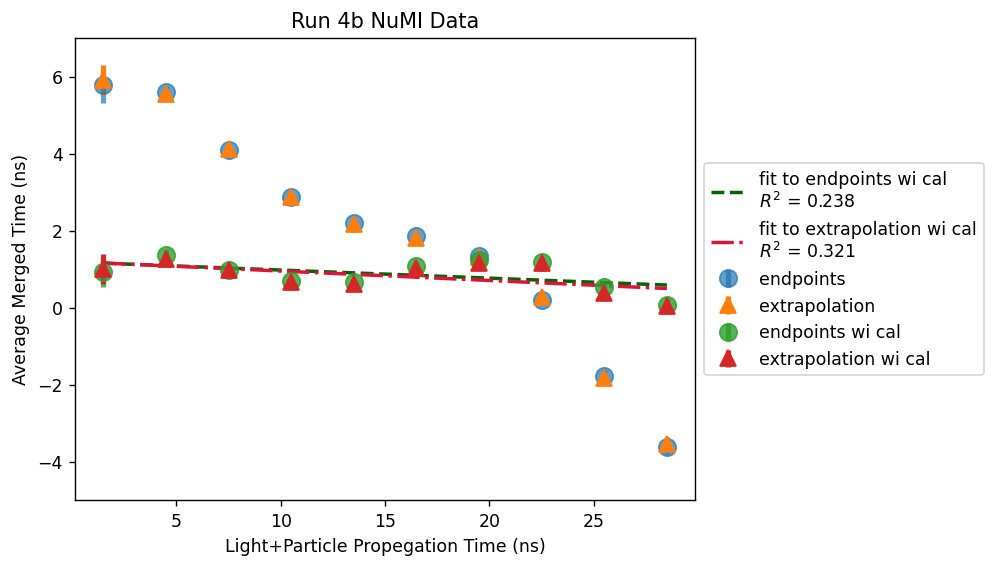

data nominal linear fit: m = -0.027   b = 0.7451
9.006645760813917 0.317
data no cor linear fit: m = -0.0219   b = 1.1971
0.5118702626832156 0.894
data wi cor linear fit: m = -0.0076   b = 0.2226
9.657809453217594 0.033
data linear no cor linear fit: m = -0.0218   b = 1.1532
1.0886175126772406 0.889
data linear wi cor linear fit: m = -0.0071   b = 0.1642
-24.793274094401276 0.03
data spacepoints wi cor linear fit: m = -0.0067   b = 0.153
-18.560516988069324 0.027


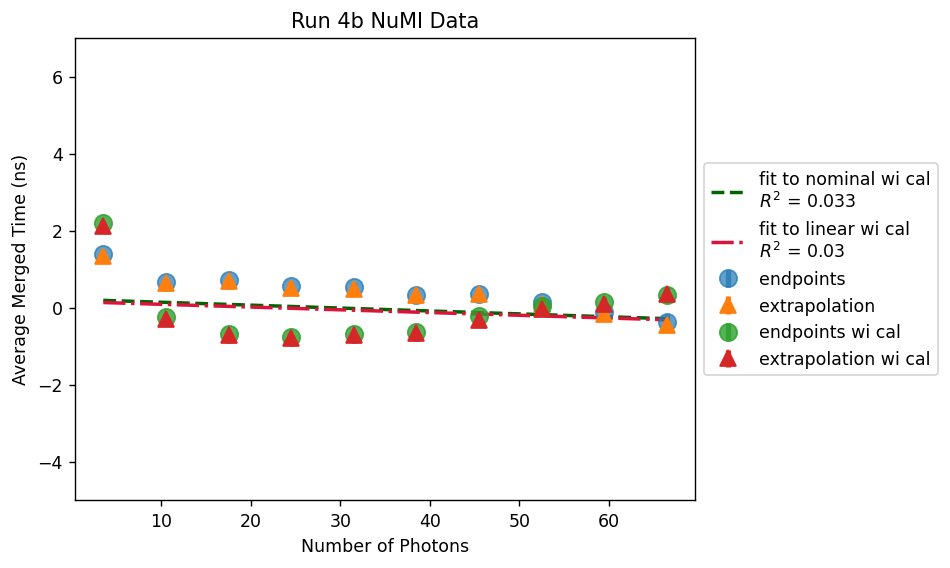

data nominal linear fit: m = -0.0017   b = 1.4529
0.7714507129294969 0.263
data no cor linear fit: m = -0.0212   b = 5.5404
-16.8747448613232 0.951
data wi cor linear fit: m = -0.0011   b = 1.1218
0.8327658041642501 0.131
data linear wi cor linear fit: m = -0.0219   b = 5.6583
-5.543012257858269 0.951
data linear wi cor linear fit: m = -0.0013   b = 1.0796
0.9041805208194629 0.177
data spacepoints wi cor linear fit: m = -0.0014   b = 1.1216
0.7709179523339198 0.228


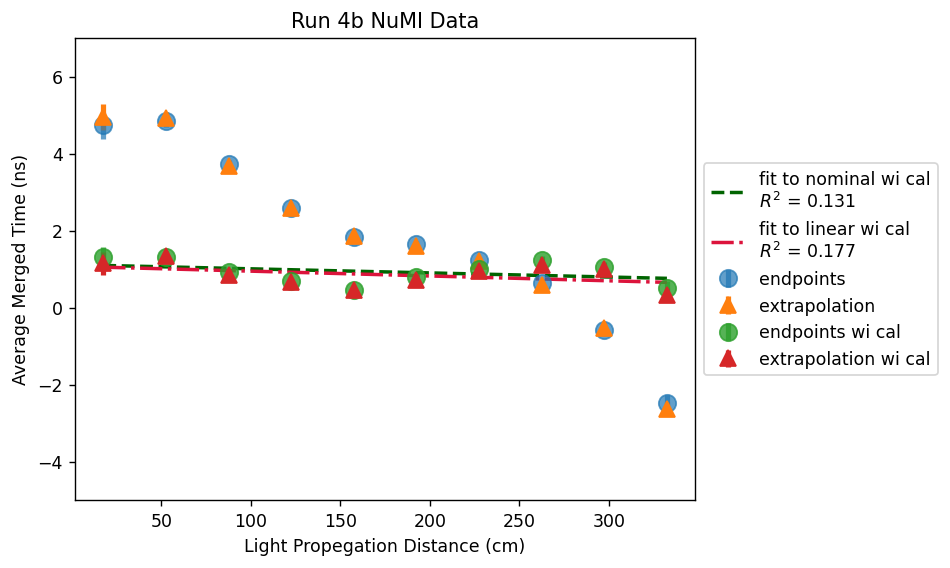

data nominal linear fit: m = -0.0049   b = 0.7031
-4.135378203376091 0.561
data no cor linear fit: m = -0.0211   b = 1.6835
8.1692279548207 0.927
data wi cor linear fit: m = -0.0048   b = 0.5935
-3.1584667888712787 0.548
data linear no cor linear fit: m = -0.0204   b = 1.2244
-4.687120874523109 0.905
data linear wi cor linear fit: m = -0.003   b = 0.1078
16.29131692529819 0.239
data spacepoints wi cor linear fit: m = -0.003   b = 0.111
16.43097704962191 0.266


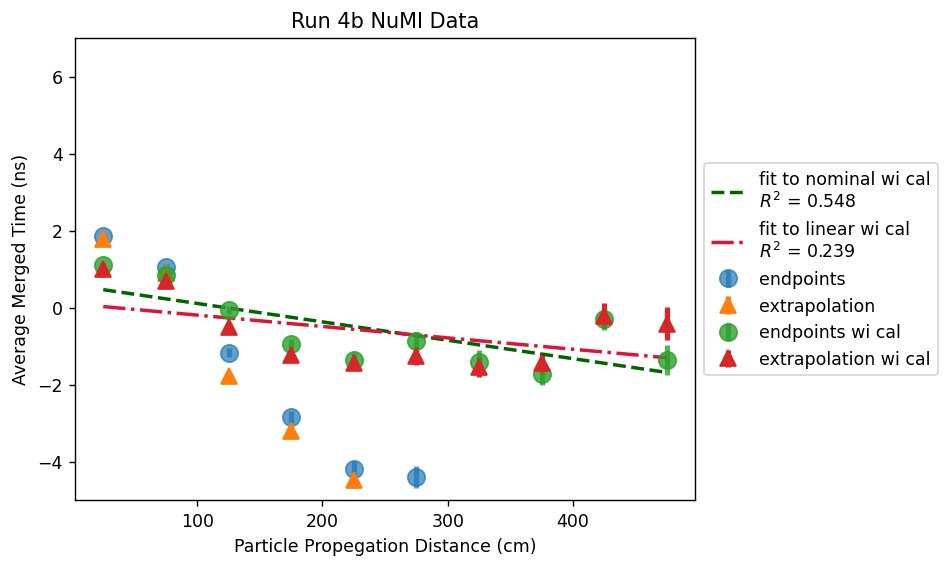

data nominal linear fit: m = -0.0023   b = 1.584
3.7494261755553615 0.558
data no cor linear fit: m = -0.0008   b = 1.0017
6.956974791989863 0.166
data wi cor linear fit: m = 0.0001   b = 0.7625
1.2156414752664815 0.008
data linear no cor linear fit: m = -0.0004   b = 0.8243
6.658508516227878 0.044
data linear wi cor linear fit: m = 0.0003   b = 0.6623
1.228615373641431 0.048
data spacepoints wi cor linear fit: m = 0.0001   b = 0.6753
0.9351082094456008 0.021


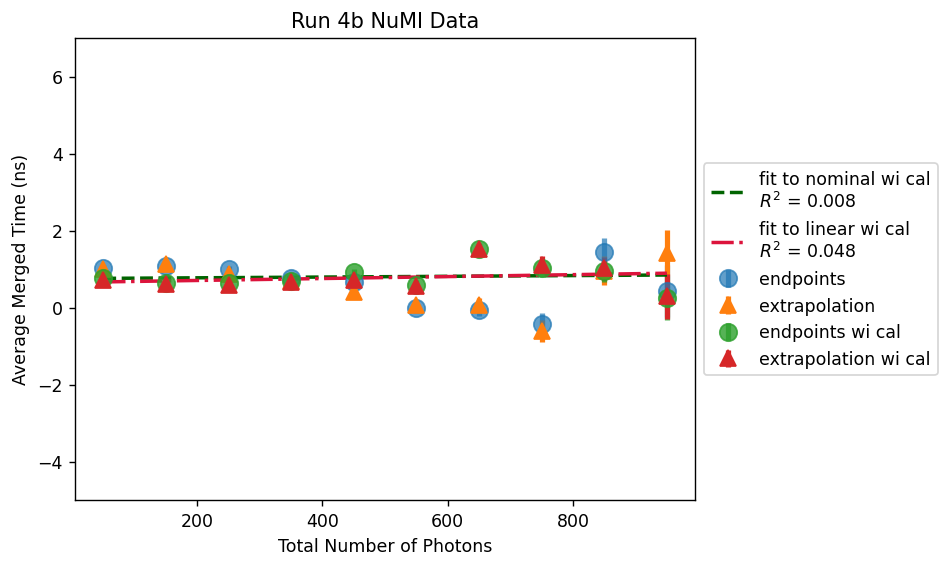

data nominal linear fit: m = -0.0052   b = 1.5395
0.3947435205283887 0.846
data no cor linear fit: m = -0.0075   b = 1.779
3.736866882406377 0.896
data wi cor linear fit: m = -0.0001   b = 0.739
0.40297274850871534 0.001
data linear no cor linear fit: m = -0.0074   b = 1.7271
-0.5907333036829349 0.923
data linear wi cor linear fit: m = -0.0003   b = 0.6968
0.40581502138832315 0.012
data spacepoints wi cor linear fit: m = -0.0002   b = 0.6845
0.4178439115581678 0.011


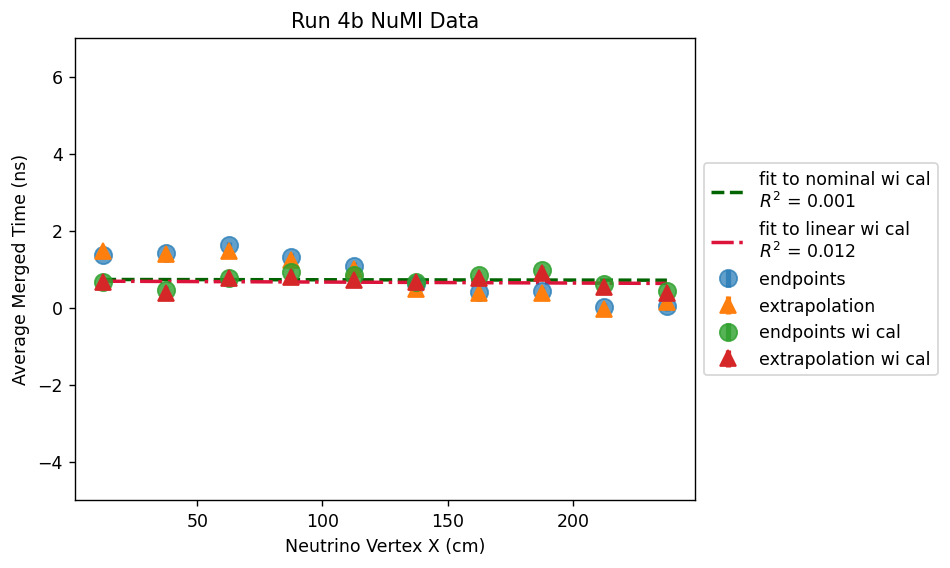

data nominal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/32573737.py:1576: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times"] = merge_times
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/32573737.py:1577: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp_df["merge_times_nocor"] = merge_times_nocor
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/32573737.py:1577: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try 

data no cal: Triple Gaussian      mean: -0.1217   std: 3.2197   C: 276.113
38.01962704650277
data no cal: Triple Gaussian      mean: -0.3581   std: 2.9374   C: 248.3968
23.918531693615215
data linear vp no cal: Triple Gaussian      mean: -0.2238   std: 3.1028   C: 278.4874
42.53111850276428
data linear vp wi cal: Triple Gaussian      mean: -0.409   std: 2.8682   C: 250.5504
22.98220909367344
data spacepoints vp wi cal: Triple Gaussian      mean: -0.4035   std: 2.9725   C: 246.1138
37.126357710050755


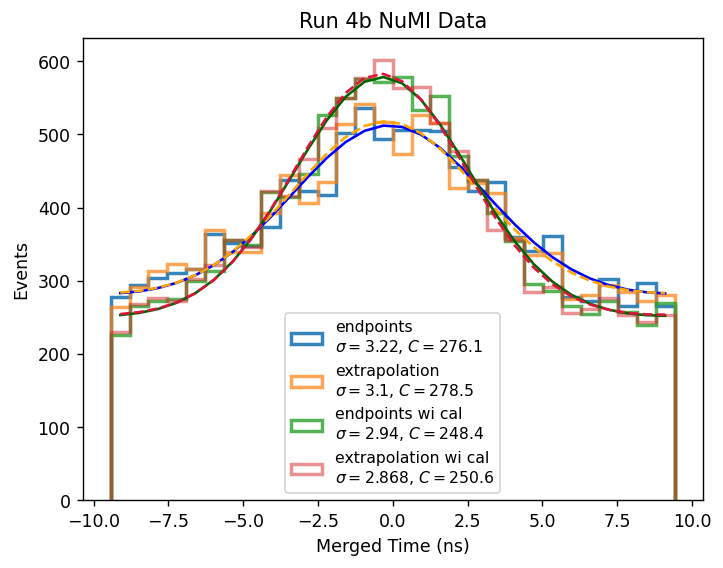

data nominal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data no cal: Triple Gaussian      mean: -0.1685   std: 3.5262   C: 93.3192
31.199254124247094
data wi cal: Triple Gaussian      mean: -0.0734   std: 2.8234   C: 87.9208
27.535649410800737
data linear vp no cal: Triple Gaussian      mean: -0.2806   std: 3.4042   C: 93.9276
24.377573632973785
data linear vp wi cal: Triple Gaussian      mean: -0.1305   std: 2.7753   C: 88.3868
28.09628256438423
data spacepoints vp wi cal: Triple Gaussian      mean: -0.1235   std: 2.8558   C: 87.0581
46.024142774984114


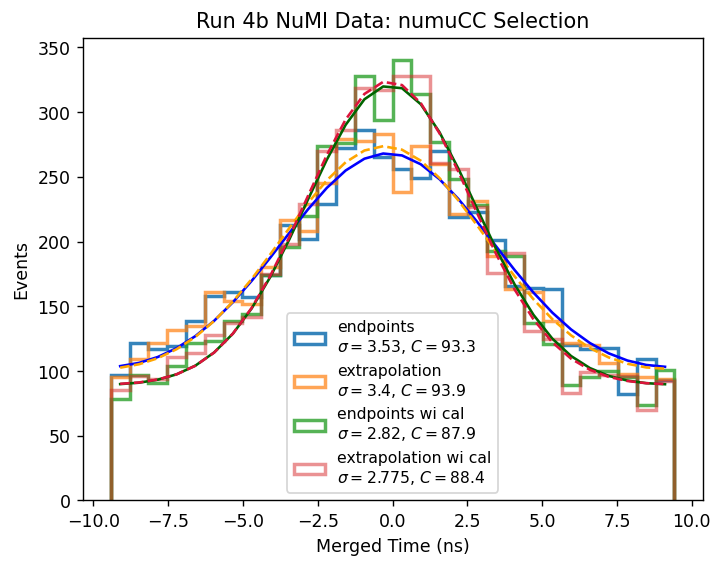

In [89]:

same_y = True
use_overflow=False

const_propt = []
const_propt_full = []
const_propt_ssmsp = []
const_Np = []
const_Np_full = []
const_Np_ssmsp = []
const_xvtx = []
const_xvtx_full = []
const_xvtx_ssmsp = []

m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_DL_i_ssmsp = 0
b_DL_i_ssmsp = 0
global_cor_ssmsp = 0
const_propt_ssmsp.append(m_propt_i_ssmsp)
const_Np_ssmsp.append(m_Np_i_ssmsp)
const_xvtx_ssmsp.append(m_xvtx_i_ssmsp)
#it 1
m_propt_i_ssmsp = -0.3199
b_propt_i_ssmsp = 6.0556
m_Np_i_ssmsp = -0.0191
b_Np_i_ssmsp = 0.5295
m_xvtx_i_ssmsp = -0.0084
b_xvtx_i_ssmsp = 1.2429
global_cor_ssmsp = 1.1
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 2
m_propt_i_ssmsp += -0.1147
b_propt_i_ssmsp += 2.7269
m_Np_i_ssmsp += -0.0434
b_Np_i_ssmsp += 0.9085
m_xvtx_i_ssmsp += -0.0041
b_xvtx_i_ssmsp += 1.0417
global_cor_ssmsp = 2.5
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 3
m_propt_i_ssmsp += -0.0699
b_propt_i_ssmsp += 1.9546
m_Np_i_ssmsp += -0.0221
b_Np_i_ssmsp += 0.4549
m_xvtx_i_ssmsp += -0.0024 
b_xvtx_i_ssmsp += 0.8808
global_cor_ssmsp = 3.9
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 4
m_propt_i_ssmsp += -0.0327 
b_propt_i_ssmsp += 1.305
m_Np_i_ssmsp += -0.0124
b_Np_i_ssmsp += 0.2517
m_xvtx_i_ssmsp += -0.0007
b_xvtx_i_ssmsp += 0.702
global_cor_ssmsp = 5.3
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)


m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_DL_i_fullDp = 0
b_DL_i_fullDp = 0
global_cor_fullDp = 0
const_propt_full.append(m_propt_i_fullDp)
const_Np_full.append(m_Np_i_fullDp)
const_xvtx_full.append(m_xvtx_i_fullDp)
#it 1
m_propt_i_fullDp = -0.323
b_propt_i_fullDp = 6.1711
m_Np_i_fullDp = -0.0196
b_Np_i_fullDp = 0.599
m_xvtx_i_fullDp = -0.0085
b_xvtx_i_fullDp = 1.317
global_cor_fullDp = 1.1
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 2
m_propt_i_fullDp += -0.1113
b_propt_i_fullDp += 2.6173
m_Np_i_fullDp += -0.0441
b_Np_i_fullDp += 0.89
m_xvtx_i_fullDp += -0.004
b_xvtx_i_fullDp += 0.9982
global_cor_fullDp = 2.5
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 3
m_propt_i_fullDp += -0.0727
b_propt_i_fullDp += 2.0216
m_Np_i_fullDp += -0.0206
b_Np_i_fullDp += 0.4422
m_xvtx_i_fullDp += -0.0024
b_xvtx_i_fullDp += 0.8967
global_cor_fullDp = 3.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 4
m_propt_i_fullDp += -0.0344
b_propt_i_fullDp += 1.3615
m_Np_i_fullDp += -0.0131
b_Np_i_fullDp += 0.2915
m_xvtx_i_fullDp += -0.0008
b_xvtx_i_fullDp += 0.7476
global_cor_fullDp = 5.4
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)


m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DLi = 0   
b_DL_i = 0
global_cor = -2.2

#it1
m_propt_i = -0.3227
b_propt_i = 6.1476
m_Np_i = -0.0203
b_Np_i = 0.6463
m_xvtx_i = -0.0081
b_xvtx_i = 1.3101
global_cor = 1.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it2
m_propt_i += -0.114
b_propt_i += 2.6835
m_Np_i += -0.0439
b_Np_i += 0.9104
m_xvtx_i += -0.004
b_xvtx_i += 1.0218
global_cor = 2.5
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it 3
m_propt_i += -0.0767 
b_propt_i += 2.065
m_Np_i += -0.0203
b_Np_i += 0.423
m_xvtx_i += -0.0024
b_xvtx_i += 0.8883
global_cor = 3.9
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it4
m_propt_i += -0.0333
b_propt_i += 1.3345
m_Np_i +=-0.0133 
b_Np_i += 0.2852
m_xvtx_i += -0.0009
b_xvtx_i += 0.7674
global_cor = 5.5 
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)

n_pmt_propt_bins = 10
n_pmt_propt_min = 0
n_pmt_propt_max = 30

n_pmt_Nphoton_bins = 10
n_pmt_Nphoton_min = 0
n_pmt_Nphoton_max = 70

n_pmt_DL_bins = 10
n_pmt_DL_min = 0
n_pmt_DL_max = 350

n_pmt_DP_bins = 10
n_pmt_DP_min = 0
n_pmt_DP_max = 500

n_pmt_PhT_bins = 10
n_pmt_PhT_min = 0
n_pmt_PhT_max = 1000

n_pmt_xvtx_bins = 10
n_pmt_xvtx_min = 0
n_pmt_xvtx_max = 250

print("Query the df")
temp_df = df.query("evtTimeNS>0")

reco_nuvtxX_list =  temp_df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  temp_df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = temp_df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = temp_df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = temp_df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = temp_df["PMT_Amp"].to_numpy()

TT3_array_list = temp_df["TT3_array"].to_numpy()
TT3_array_nocor_list = temp_df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = temp_df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = temp_df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = temp_df["DLh_all"].to_numpy()
DP_all = temp_df["DPh_all"].to_numpy()
DP_full_all = temp_df["DPh_full_all"].to_numpy()
DL_full_all = temp_df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = temp_df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = temp_df["DPh_ssmsp_all"].to_numpy()

PhT_all = temp_df["Ph_Tot"].to_numpy()

file = temp_df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_fullDp = []
TT3_array_fullDp_list = []
merge_times_fullDp = []
merge_match_TT3_array_fullDp = []

ns_time_nocor = []
merge_times_nocor = []
merge_match_TT3_array_nocor = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
            
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i)  +global_cor)
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) +global_cor_fullDp)
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) +global_cor_ssmsp)

    ns_time.append(np.median(TT3_array))
    ns_time_nocor.append(np.median(TT3_array_nocor))
    #TT3_array_nocor_list.append(TT3_array_nocor)
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp.append(np.median(TT3_array_fullDp_nocor))
    TT3_array_fullDp_list.append(TT3_array_fullDp_nocor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_fullDp = ns_time_fullDp[event]-Shift+gap*0.5-0.8
    TT_merged_fullDp=-9999
    
    if TThelp_fullDp>=0:
        TT_merged_fullDp=(TThelp_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        
    merge_times_fullDp.append(TT_merged_fullDp)
    merge_match_TT3_array_fullDp.append([])

    TThelp_nocor = ns_time_nocor[event]-Shift+gap*0.5-0.8
    TT_merged_nocor=-9999
    
    if TThelp_nocor>=0:
        TT_merged_nocor=(TThelp_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        
    merge_times_nocor.append(TT_merged_nocor)
    merge_match_TT3_array_nocor.append([])
    
    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)

        TThelp_array_fullDp = TT3_array_fullDp_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp=-9999
        #shift according to the events time
        if TThelp_fullDp>=0:
            TT_array_merged_match_fullDp=(TThelp_array_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp[event].append(TT_array_merged_match_fullDp)

        TThelp_array_nocor = TT3_array_nocor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_nocor=-9999
        #shift according to the events time
        if TThelp_nocor>=0:
            TT_array_merged_match_nocor=(TThelp_array_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_nocor[event].append(TT_array_merged_match_nocor)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
    

#######################

print("Setting Bins")
#Propegation time bins
pmt_propt_bins = np.linspace(n_pmt_propt_min,n_pmt_propt_max,n_pmt_propt_bins+1)
pmt_propt_all_times = []
pmt_propt_avg_times = []
pmt_propt_avg_times_errors = []
pmt_propt_all_times_fullDp = []
pmt_propt_avg_times_fullDp = []
pmt_propt_avg_times_fullDp_errors = []
pmt_propt_all_times_nocor = []
pmt_propt_avg_times_nocor = []
pmt_propt_avg_times_nocor_errors = []
pmt_propt_all_times_recor = []
pmt_propt_avg_times_recor = []
pmt_propt_avg_times_recor_errors = []
pmt_propt_all_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor_errors = []
pmt_propt_all_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_propt_bins): 
    pmt_propt_all_times.append([])
    pmt_propt_avg_times.append(0)
    pmt_propt_avg_times_errors.append(0)
    pmt_propt_all_times_fullDp.append([])
    pmt_propt_avg_times_fullDp.append(0)
    pmt_propt_avg_times_fullDp_errors.append(0)
    pmt_propt_all_times_nocor.append([])
    pmt_propt_avg_times_nocor.append(0)
    pmt_propt_avg_times_nocor_errors.append(0)
    pmt_propt_all_times_recor.append([])
    pmt_propt_avg_times_recor.append(0)
    pmt_propt_avg_times_recor_errors.append(0)
    pmt_propt_all_times_fullDp_recor.append([])
    pmt_propt_avg_times_fullDp_recor.append(0)
    pmt_propt_avg_times_fullDp_recor_errors.append(0)
    pmt_propt_all_times_ssmsp_recor.append([])
    pmt_propt_avg_times_ssmsp_recor.append(0)
    pmt_propt_avg_times_ssmsp_recor_errors.append(0)
    
#Number of photon bins
pmt_Nphoton_bins = np.linspace(n_pmt_Nphoton_min,n_pmt_Nphoton_max,n_pmt_Nphoton_bins+1)
pmt_Nphoton_all_times = []
pmt_Nphoton_avg_times = []
pmt_Nphoton_avg_times_errors = []
pmt_Nphoton_all_times_nocor = []
pmt_Nphoton_avg_times_nocor = []
pmt_Nphoton_avg_times_nocor_errors = []
pmt_Nphoton_all_times_recor = []
pmt_Nphoton_avg_times_recor = []
pmt_Nphoton_avg_times_recor_errors = []
pmt_Nphoton_all_times_fullDp = []
pmt_Nphoton_avg_times_fullDp = []
pmt_Nphoton_avg_times_fullDp_errors = []
pmt_Nphoton_all_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor_errors = []
pmt_Nphoton_all_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_all_times.append([])
    pmt_Nphoton_avg_times.append(0)
    pmt_Nphoton_avg_times_errors.append(0)
    pmt_Nphoton_all_times_nocor.append([])
    pmt_Nphoton_avg_times_nocor.append(0)
    pmt_Nphoton_avg_times_nocor_errors.append(0)
    pmt_Nphoton_all_times_recor.append([])
    pmt_Nphoton_avg_times_recor.append(0)
    pmt_Nphoton_avg_times_recor_errors.append(0)
    pmt_Nphoton_all_times_fullDp.append([])
    pmt_Nphoton_avg_times_fullDp.append(0)
    pmt_Nphoton_avg_times_fullDp_errors.append(0)
    pmt_Nphoton_all_times_fullDp_recor.append([])
    pmt_Nphoton_avg_times_fullDp_recor.append(0)
    pmt_Nphoton_avg_times_fullDp_recor_errors.append(0)
    pmt_Nphoton_all_times_ssmsp_recor.append([])
    pmt_Nphoton_avg_times_ssmsp_recor.append(0)
    pmt_Nphoton_avg_times_ssmsp_recor_errors.append(0)
    
#Light propegation distance bins
pmt_DL_bins = np.linspace(n_pmt_DL_min,n_pmt_DL_max,n_pmt_DL_bins+1)
pmt_DL_all_times = []
pmt_DL_avg_times = []
pmt_DL_avg_times_errors = []
pmt_DL_all_times_nocor = []
pmt_DL_avg_times_nocor = []
pmt_DL_avg_times_nocor_errors = []
pmt_DL_all_times_recor = []
pmt_DL_avg_times_recor = []
pmt_DL_avg_times_recor_errors = []
pmt_DL_all_times_fullDp = []
pmt_DL_avg_times_fullDp = []
pmt_DL_avg_times_fullDp_errors = []
pmt_DL_all_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor_errors = []
pmt_DL_all_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DL_bins): 
    pmt_DL_all_times.append([])
    pmt_DL_avg_times.append(0)
    pmt_DL_avg_times_errors.append(0)
    pmt_DL_all_times_nocor.append([])
    pmt_DL_avg_times_nocor.append(0)
    pmt_DL_avg_times_nocor_errors.append(0)
    pmt_DL_all_times_recor.append([])
    pmt_DL_avg_times_recor.append(0)
    pmt_DL_avg_times_recor_errors.append(0)
    pmt_DL_all_times_fullDp.append([])
    pmt_DL_avg_times_fullDp.append(0)
    pmt_DL_avg_times_fullDp_errors.append(0)
    pmt_DL_all_times_fullDp_recor.append([])
    pmt_DL_avg_times_fullDp_recor.append(0)
    pmt_DL_avg_times_fullDp_recor_errors.append(0) 
    pmt_DL_all_times_ssmsp_recor.append([])
    pmt_DL_avg_times_ssmsp_recor.append(0)
    pmt_DL_avg_times_ssmsp_recor_errors.append(0) 
    
#Particle propegation bins
pmt_DP_bins = np.linspace(n_pmt_DP_min,n_pmt_DP_max,n_pmt_DP_bins+1)
pmt_DP_all_times= []
pmt_DP_avg_times = []
pmt_DP_avg_times_errors = []
pmt_DP_all_times_nocor = []
pmt_DP_avg_times_nocor = []
pmt_DP_avg_times_nocor_errors = []
pmt_DP_all_times_recor = []
pmt_DP_avg_times_recor = []
pmt_DP_avg_times_recor_errors = []
pmt_DP_all_times_fullDp = []
pmt_DP_avg_times_fullDp = []
pmt_DP_avg_times_fullDp_errors = []
pmt_DP_all_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor_errors = []
pmt_DP_all_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DP_bins): 
    pmt_DP_all_times.append([])
    pmt_DP_avg_times.append(0)
    pmt_DP_avg_times_errors.append(0)
    pmt_DP_all_times_nocor.append([])
    pmt_DP_avg_times_nocor.append(0)
    pmt_DP_avg_times_nocor_errors.append(0)
    pmt_DP_all_times_recor.append([])
    pmt_DP_avg_times_recor.append(0)
    pmt_DP_avg_times_recor_errors.append(0)
    pmt_DP_all_times_fullDp.append([])
    pmt_DP_avg_times_fullDp.append(0)
    pmt_DP_avg_times_fullDp_errors.append(0) 
    pmt_DP_all_times_fullDp_recor.append([])
    pmt_DP_avg_times_fullDp_recor.append(0)
    pmt_DP_avg_times_fullDp_recor_errors.append(0) 
    pmt_DP_all_times_ssmsp_recor.append([])
    pmt_DP_avg_times_ssmsp_recor.append(0)
    pmt_DP_avg_times_ssmsp_recor_errors.append(0)
    
#Total Photon bins
pmt_PhT_bins = np.linspace(n_pmt_PhT_min,n_pmt_PhT_max,n_pmt_PhT_bins+1)
pmt_PhT_all_times = []
pmt_PhT_avg_times = []
pmt_PhT_avg_times_errors = []
pmt_PhT_all_times_nocor = []
pmt_PhT_avg_times_nocor = []
pmt_PhT_avg_times_nocor_errors = []
pmt_PhT_all_times_recor = []
pmt_PhT_avg_times_recor = []
pmt_PhT_avg_times_recor_errors = []
pmt_PhT_all_times_fullDp = []
pmt_PhT_avg_times_fullDp = []
pmt_PhT_avg_times_fullDp_errors = []
pmt_PhT_all_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor_errors = []
pmt_PhT_all_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_all_times.append([])
    pmt_PhT_avg_times.append(0)
    pmt_PhT_avg_times_errors.append(0)
    pmt_PhT_all_times_nocor.append([])
    pmt_PhT_avg_times_nocor.append(0)
    pmt_PhT_avg_times_nocor_errors.append(0)
    pmt_PhT_all_times_recor.append([])
    pmt_PhT_avg_times_recor.append(0)
    pmt_PhT_avg_times_recor_errors.append(0)
    pmt_PhT_all_times_fullDp.append([])
    pmt_PhT_avg_times_fullDp.append(0)
    pmt_PhT_avg_times_fullDp_errors.append(0) 
    pmt_PhT_all_times_fullDp_recor.append([])
    pmt_PhT_avg_times_fullDp_recor.append(0)
    pmt_PhT_avg_times_fullDp_recor_errors.append(0) 
    pmt_PhT_all_times_ssmsp_recor.append([])
    pmt_PhT_avg_times_ssmsp_recor.append(0)
    pmt_PhT_avg_times_ssmsp_recor_errors.append(0) 
    
#X vertex bins
pmt_xvtx_bins = np.linspace(n_pmt_xvtx_min,n_pmt_xvtx_max,n_pmt_xvtx_bins+1)
pmt_xvtx_all_times = []
pmt_xvtx_avg_times = []
pmt_xvtx_avg_times_errors = []
pmt_xvtx_all_times_nocor = []
pmt_xvtx_avg_times_nocor = []
pmt_xvtx_avg_times_nocor_errors = []
pmt_xvtx_all_times_recor = []
pmt_xvtx_avg_times_recor = []
pmt_xvtx_avg_times_recor_errors = []
pmt_xvtx_all_times_fullDp = []
pmt_xvtx_avg_times_fullDp = []
pmt_xvtx_avg_times_fullDp_errors = []
pmt_xvtx_all_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor_errors = []
pmt_xvtx_all_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_all_times.append([])
    pmt_xvtx_avg_times.append(0)
    pmt_xvtx_avg_times_errors.append(0)
    pmt_xvtx_all_times_nocor.append([])
    pmt_xvtx_avg_times_nocor.append(0)
    pmt_xvtx_avg_times_nocor_errors.append(0)
    pmt_xvtx_all_times_recor.append([])
    pmt_xvtx_avg_times_recor.append(0)
    pmt_xvtx_avg_times_recor_errors.append(0)
    pmt_xvtx_all_times_fullDp.append([])
    pmt_xvtx_avg_times_fullDp.append(0)
    pmt_xvtx_avg_times_fullDp_errors.append(0) 
    pmt_xvtx_all_times_fullDp_recor.append([])
    pmt_xvtx_avg_times_fullDp_recor.append(0)
    pmt_xvtx_avg_times_fullDp_recor_errors.append(0) 
    pmt_xvtx_all_times_ssmsp_recor.append([])
    pmt_xvtx_avg_times_ssmsp_recor.append(0)
    pmt_xvtx_avg_times_ssmsp_recor_errors.append(0) 

print("Filling nominal with corrections histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_propt_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_Nphoton_all_times[ibin].append(merge_match_TT3_array[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DL_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DP_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_PhT_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_xvtx_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break 

print("Setting nominal with corrections averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times[i] = statistics.mean(pmt_propt_all_times[i])     
    pmt_propt_avg_times_errors[i] = (statistics.stdev(pmt_propt_all_times[i])/np.sqrt(len(pmt_propt_all_times[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times[i] = statistics.mean(pmt_Nphoton_all_times[i])     
    pmt_Nphoton_avg_times_errors[i] = (statistics.stdev(pmt_Nphoton_all_times[i])/np.sqrt(len(pmt_Nphoton_all_times[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times[i] = statistics.mean(pmt_DL_all_times[i])     
    pmt_DL_avg_times_errors[i] = (statistics.stdev(pmt_DL_all_times[i])/np.sqrt(len(pmt_DL_all_times[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times[i] = statistics.mean(pmt_DP_all_times[i])     
    pmt_DP_avg_times_errors[i] = (statistics.stdev(pmt_DP_all_times[i])/np.sqrt(len(pmt_DP_all_times[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times[i] = statistics.mean(pmt_PhT_all_times[i])     
    pmt_PhT_avg_times_errors[i] = (statistics.stdev(pmt_PhT_all_times[i])/np.sqrt(len(pmt_PhT_all_times[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times[i] = statistics.mean(pmt_xvtx_all_times[i])     
    pmt_xvtx_avg_times_errors[i] = (statistics.stdev(pmt_xvtx_all_times[i])/np.sqrt(len(pmt_xvtx_all_times[i])))

print("Filling nocor nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_propt_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_Nphoton_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DL_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DP_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_PhT_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_xvtx_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break 

print("Setting nocor nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_nocor[i] = statistics.mean(pmt_propt_all_times_nocor[i])     
    pmt_propt_avg_times_nocor_errors[i] = (statistics.stdev(pmt_propt_all_times_nocor[i])/np.sqrt(len(pmt_propt_all_times_nocor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_nocor[i] = statistics.mean(pmt_Nphoton_all_times_nocor[i])     
    pmt_Nphoton_avg_times_nocor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_nocor[i])/np.sqrt(len(pmt_Nphoton_all_times_nocor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_nocor[i] = statistics.mean(pmt_DL_all_times_nocor[i])     
    pmt_DL_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DL_all_times_nocor[i])/np.sqrt(len(pmt_DL_all_times_nocor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_nocor[i] = statistics.mean(pmt_DP_all_times_nocor[i])     
    pmt_DP_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DP_all_times_nocor[i])/np.sqrt(len(pmt_DP_all_times_nocor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_nocor[i] = statistics.mean(pmt_PhT_all_times_nocor[i])     
    pmt_PhT_avg_times_nocor_errors[i] = (statistics.stdev(pmt_PhT_all_times_nocor[i])/np.sqrt(len(pmt_PhT_all_times_nocor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_nocor[i] = statistics.mean(pmt_xvtx_all_times_nocor[i])     
    pmt_xvtx_avg_times_nocor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_nocor[i])/np.sqrt(len(pmt_xvtx_all_times_nocor[i])))




print("Filling nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_propt_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_Nphoton_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DL_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DP_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_PhT_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_xvtx_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break 

print("Setting nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_recor[i] = statistics.mean(pmt_propt_all_times_recor[i])     
    pmt_propt_avg_times_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_recor[i])/np.sqrt(len(pmt_propt_all_times_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_recor[i] = statistics.mean(pmt_Nphoton_all_times_recor[i])     
    pmt_Nphoton_avg_times_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_recor[i] = statistics.mean(pmt_DL_all_times_recor[i])     
    pmt_DL_avg_times_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_recor[i])/np.sqrt(len(pmt_DL_all_times_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_recor[i] = statistics.mean(pmt_DP_all_times_recor[i])     
    pmt_DP_avg_times_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_recor[i])/np.sqrt(len(pmt_DP_all_times_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_recor[i] = statistics.mean(pmt_PhT_all_times_recor[i])     
    pmt_PhT_avg_times_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_recor[i])/np.sqrt(len(pmt_PhT_all_times_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_recor[i] = statistics.mean(pmt_xvtx_all_times_recor[i])     
    pmt_xvtx_avg_times_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_recor[i])/np.sqrt(len(pmt_xvtx_all_times_recor[i])))




print("Filling nocor linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_propt_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_Nphoton_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DL_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DP_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_PhT_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_xvtx_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break

print("Setting nocor linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp[i] = statistics.mean(pmt_propt_all_times_fullDp[i])     
    pmt_propt_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp[i])/np.sqrt(len(pmt_propt_all_times_fullDp[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp[i] = statistics.mean(pmt_Nphoton_all_times_fullDp[i])     
    pmt_Nphoton_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp[i] = statistics.mean(pmt_DL_all_times_fullDp[i])     
    pmt_DL_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp[i])/np.sqrt(len(pmt_DL_all_times_fullDp[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp[i] = statistics.mean(pmt_DP_all_times_fullDp[i])     
    pmt_DP_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp[i])/np.sqrt(len(pmt_DP_all_times_fullDp[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp[i] = statistics.mean(pmt_PhT_all_times_fullDp[i])     
    pmt_PhT_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp[i])/np.sqrt(len(pmt_PhT_all_times_fullDp[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp[i] = statistics.mean(pmt_xvtx_all_times_fullDp[i])     
    pmt_xvtx_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp[i])))



print("Filling linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_propt_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_Nphoton_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DL_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DP_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_PhT_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_xvtx_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break

print("Setting linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp_recor[i] = statistics.mean(pmt_propt_all_times_fullDp_recor[i])     
    pmt_propt_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp_recor[i])/np.sqrt(len(pmt_propt_all_times_fullDp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp_recor[i] = statistics.mean(pmt_Nphoton_all_times_fullDp_recor[i])     
    pmt_Nphoton_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp_recor[i] = statistics.mean(pmt_DL_all_times_fullDp_recor[i])     
    pmt_DL_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DL_all_times_fullDp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp_recor[i] = statistics.mean(pmt_DP_all_times_fullDp_recor[i])     
    pmt_DP_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DP_all_times_fullDp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp_recor[i] = statistics.mean(pmt_PhT_all_times_fullDp_recor[i])     
    pmt_PhT_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp_recor[i])/np.sqrt(len(pmt_PhT_all_times_fullDp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp_recor[i] = statistics.mean(pmt_xvtx_all_times_fullDp_recor[i])     
    pmt_xvtx_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp_recor[i])))


print("Filling sapcepoints histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_ssmsp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_ssmsp_all[event]
    DP = DP_ssmsp_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_ssmsp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_ssmsp_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_ssmsp_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_propt_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_Nphoton_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DL_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DP_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_PhT_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX_ssmsp>pmt_xvtx_bins[ibin] and reco_nuvtxX_ssmsp<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_xvtx_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break

print("Setting spacepoints averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_ssmsp_recor[i] = statistics.mean(pmt_propt_all_times_ssmsp_recor[i])     
    pmt_propt_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_propt_all_times_ssmsp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_ssmsp_recor[i] = statistics.mean(pmt_Nphoton_all_times_ssmsp_recor[i])     
    pmt_Nphoton_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DL_all_times_ssmsp_recor[i])     
    pmt_DL_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DL_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DP_all_times_ssmsp_recor[i])     
    pmt_DP_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DP_all_times_ssmsp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_ssmsp_recor[i] = statistics.mean(pmt_PhT_all_times_ssmsp_recor[i])     
    pmt_PhT_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_PhT_all_times_ssmsp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_ssmsp_recor[i] = statistics.mean(pmt_xvtx_all_times_ssmsp_recor[i])     
    pmt_xvtx_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_ssmsp_recor[i])))

############################################################################################



plot_title = "Run 4b NuMI Data"

popt,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_propt_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_propt_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_propt_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_propt_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_propt_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_propt_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor,yerr=pmt_propt_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor,yerr=pmt_propt_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to endpoints wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to extrapolation wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7) 
if same_y_tight: plt.ylim(-2,2) 
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light+Particle Propegation Time (ns)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_Nphoton_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_Nphoton_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_Nphoton_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_Nphoton_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_Nphoton_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_Nphoton_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor,yerr=pmt_Nphoton_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp,yerr=pmt_Nphoton_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor,yerr=pmt_Nphoton_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor,yerr=pmt_Nphoton_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DL_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DL_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DL_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp)
print("data linear wi cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DL_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)



popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DL_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DL_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor,yerr=pmt_DL_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp,yerr=pmt_DL_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor,yerr=pmt_DL_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor,yerr=pmt_DL_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DP_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DP_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DP_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DP_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DP_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DP_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor,yerr=pmt_DP_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp,yerr=pmt_DP_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor,yerr=pmt_DP_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor,yerr=pmt_DP_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Particle Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_PhT_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_PhT_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_PhT_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_PhT_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_PhT_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_PhT_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor,yerr=pmt_PhT_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp,yerr=pmt_PhT_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor,yerr=pmt_PhT_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor,yerr=pmt_PhT_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Total Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_xvtx_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_xvtx_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_xvtx_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_xvtx_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_xvtx_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_xvtx_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor,yerr=pmt_xvtx_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp,yerr=pmt_xvtx_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor,yerr=pmt_xvtx_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor,yerr=pmt_xvtx_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Neutrino Vertex X (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################
#######################
nbins = 30

temp_df["merge_times"] = merge_times
temp_df["merge_times_nocor"] = merge_times_nocor
temp_df["merge_times_recor"] = merge_times_recor
temp_df["merge_times_fullDp"] = merge_times_fullDp
temp_df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
temp_df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor


data = temp_df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)

data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()





data = temp_df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42").query("numu_score>0.8")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)


data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42").query("numu_score>0.8")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data wi cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)


data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42").query("numu_score>0.8")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)


data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42").query("numu_score>0.8")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()

# Iteration 5

Query the df
Setting recalibrated times


100%|███████████████████████████████████| 11703/11703 [00:02<00:00, 4770.26it/s]


Setting Bins
Filling nominal with corrections histograms
Setting nominal with corrections averages
Filling nocor nominal histograms
Setting nocor nominal averages
Filling nominal histograms
Setting nominal averages
Filling nocor linear histograms
Setting nocor linear averages
Filling linear histograms
Setting linear averages
Filling sapcepoints histograms
Setting spacepoints averages
data nominal linear fit: m = -0.0371   b = 1.6896
1.099394519622555 0.5
data no cor linear fit: m = -0.3244   b = 6.7252
0.9438480811190403 0.956
data wi cor linear fit: m = -0.015   b = 1.0668
1.2692789443234196 0.147
data linear no cor linear fit: m = -0.3254   b = 6.756
0.5318248886000909 0.959
data linear wi cor linear fit: m = -0.0119   b = 1.0088
1.1499138474658566 0.107
data spacepoints wi cor linear fit: m = -0.0112   b = 0.9687
1.2295222332423559 0.091


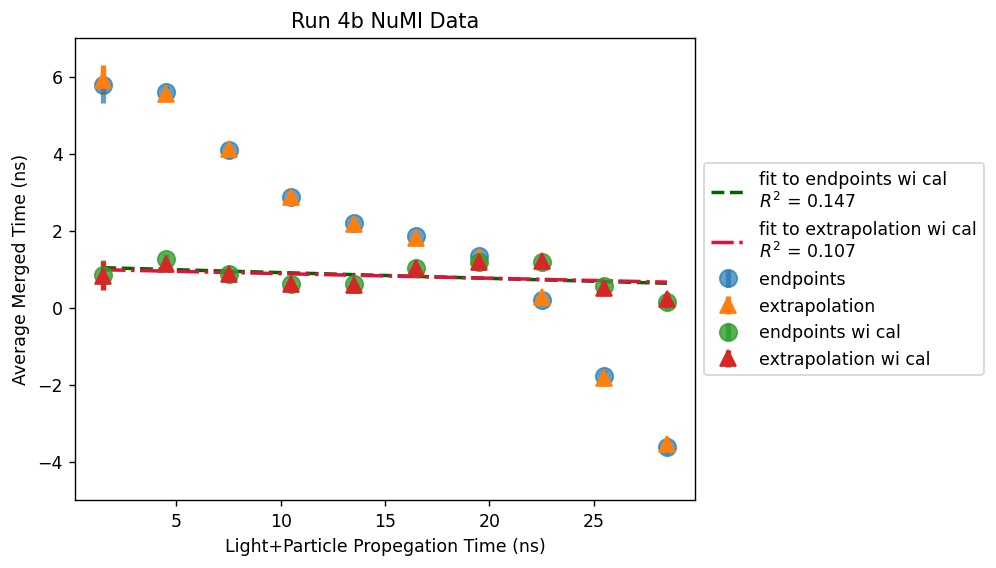

data nominal linear fit: m = -0.027   b = 0.7451
9.006645760813917 0.317
data no cor linear fit: m = -0.0219   b = 1.1971
0.5118702626832156 0.894
data wi cor linear fit: m = -0.0043   b = 0.1219
47.11528395143545 0.01
data linear no cor linear fit: m = -0.0218   b = 1.1532
1.0886175126772406 0.889
data linear wi cor linear fit: m = -0.0041   b = 0.1209
26.619339086884718 0.01
data spacepoints wi cor linear fit: m = -0.0043   b = 0.106
3705.1406133232867 0.011


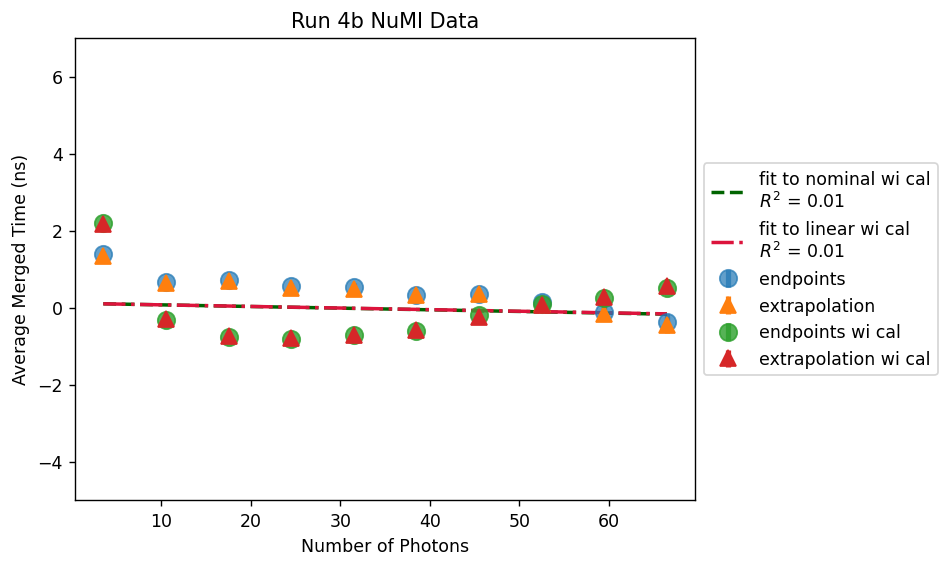

data nominal linear fit: m = -0.0017   b = 1.4529
0.7714507129294969 0.263
data no cor linear fit: m = -0.0212   b = 5.5404
-16.8747448613232 0.951
data wi cor linear fit: m = -0.0007   b = 1.0315
0.877077742394227 0.063
data linear wi cor linear fit: m = -0.0219   b = 5.6583
-5.543012257858269 0.951
data linear wi cor linear fit: m = -0.0004   b = 0.9418
0.8881061610689366 0.025
data spacepoints wi cor linear fit: m = -0.0004   b = 0.936
0.7405551732729718 0.031


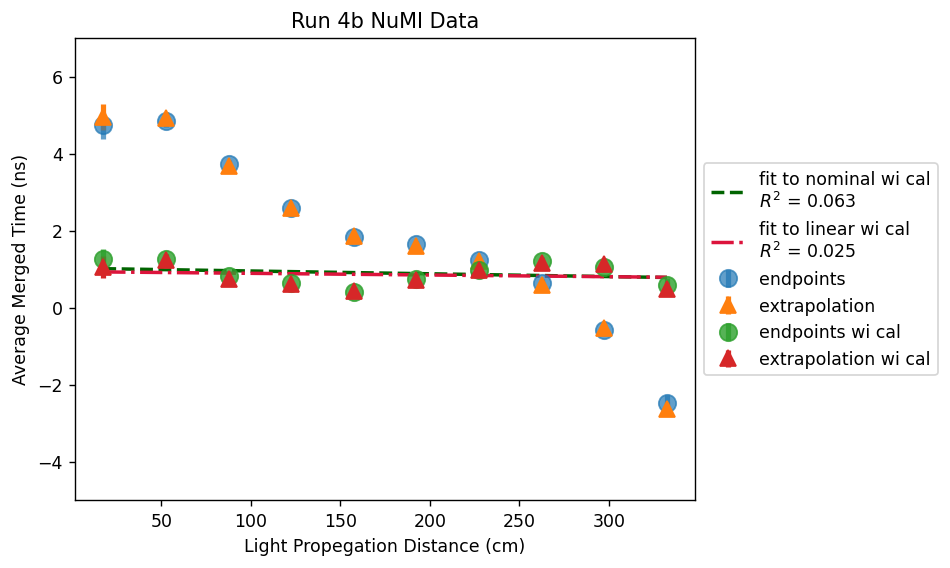

data nominal linear fit: m = -0.0049   b = 0.7031
-4.135378203376091 0.561
data no cor linear fit: m = -0.0211   b = 1.6835
8.1692279548207 0.927
data wi cor linear fit: m = -0.0041   b = 0.5084
-1.4165468945597877 0.462
data linear no cor linear fit: m = -0.0204   b = 1.2244
-4.687120874523109 0.905
data linear wi cor linear fit: m = -0.0022   b = 0.0988
4.163448924671753 0.151
data spacepoints wi cor linear fit: m = -0.0021   b = 0.056
401.5145453485916 0.141


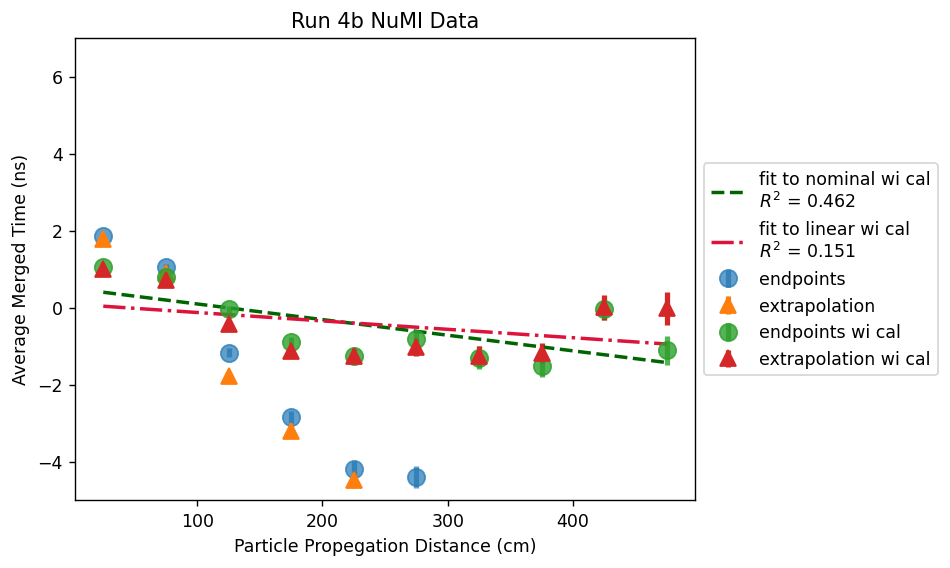

data nominal linear fit: m = -0.0023   b = 1.584
3.7494261755553615 0.558
data no cor linear fit: m = -0.0008   b = 1.0017
6.956974791989863 0.166
data wi cor linear fit: m = 0.0004   b = 0.6636
0.6387146488163713 0.153
data linear no cor linear fit: m = -0.0004   b = 0.8243
6.658508516227878 0.044
data linear wi cor linear fit: m = 0.0005   b = 0.6172
0.6580563761241389 0.266
data spacepoints wi cor linear fit: m = 0.0005   b = 0.6025
0.4598639825045059 0.297


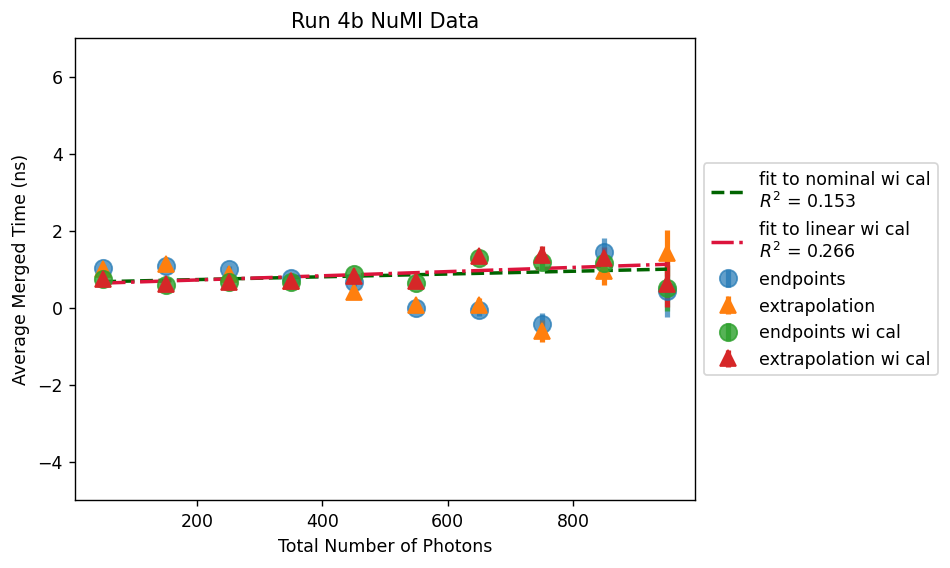

data nominal linear fit: m = -0.0052   b = 1.5395
0.3947435205283887 0.846
data no cor linear fit: m = -0.0075   b = 1.779
3.736866882406377 0.896
data wi cor linear fit: m = 0.0001   b = 0.7046
0.37252786607356436 0.001
data linear no cor linear fit: m = -0.0074   b = 1.7271
-0.5907333036829349 0.923
data linear wi cor linear fit: m = 0.0001   b = 0.6956
0.2954682725765575 0.004
data spacepoints wi cor linear fit: m = 0.0003   b = 0.6441
0.3063014843813754 0.02


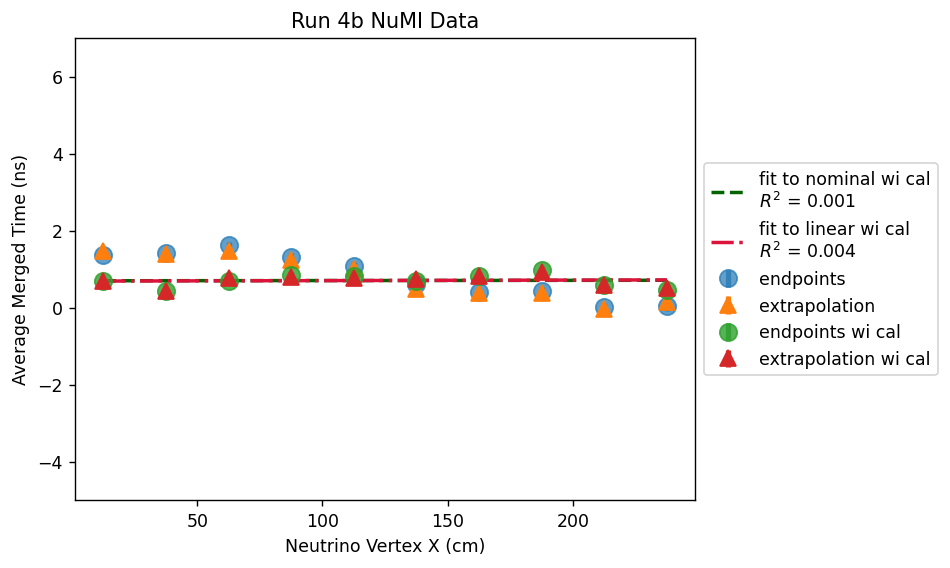

data nominal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1243971685.py:1609: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times"] = merge_times
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1243971685.py:1610: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp_df["merge_times_nocor"] = merge_times_nocor
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1243971685.py:1610: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

data no cal: Triple Gaussian      mean: -0.1217   std: 3.2197   C: 276.113
38.01962704650277
data no cal: Triple Gaussian      mean: -0.4026   std: 2.9518   C: 248.8798
28.806535275059126
data linear vp no cal: Triple Gaussian      mean: -0.2238   std: 3.1028   C: 278.4874
42.53111811186459
data linear vp wi cal: Triple Gaussian      mean: -0.3953   std: 2.8931   C: 250.7145
30.763579461070467
data spacepoints vp wi cal: Triple Gaussian      mean: -0.3738   std: 2.9971   C: 246.2405
27.313098004086292


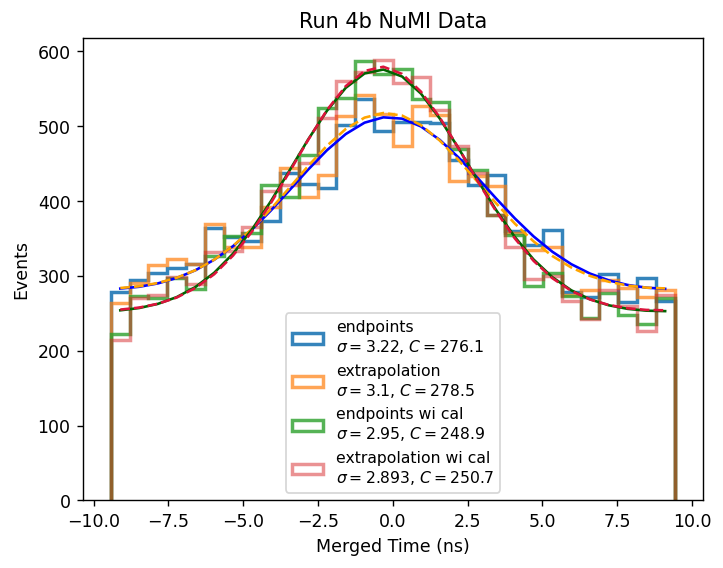

data nominal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data no cal: Triple Gaussian      mean: -0.1685   std: 3.5262   C: 93.3192
31.199254124247094
data wi cal: Triple Gaussian      mean: -0.1127   std: 2.8756   C: 86.9343
26.263903503902522
data linear vp no cal: Triple Gaussian      mean: -0.2806   std: 3.4042   C: 93.9276
24.37757325109679
data linear vp wi cal: Triple Gaussian      mean: -0.096   std: 2.8113   C: 88.1027
28.364900052230524
data spacepoints vp wi cal: Triple Gaussian      mean: -0.0776   std: 2.8896   C: 86.7209
26.75717102336812


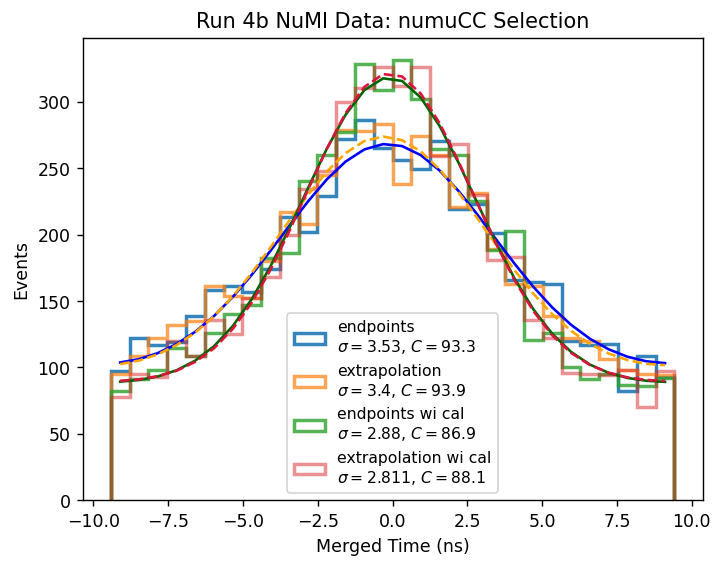

In [90]:

same_y = True
use_overflow=False

const_propt = []
const_propt_full = []
const_propt_ssmsp = []
const_Np = []
const_Np_full = []
const_Np_ssmsp = []
const_xvtx = []
const_xvtx_full = []
const_xvtx_ssmsp = []

m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_DL_i_ssmsp = 0
b_DL_i_ssmsp = 0
global_cor_ssmsp = 0
const_propt_ssmsp.append(m_propt_i_ssmsp)
const_Np_ssmsp.append(m_Np_i_ssmsp)
const_xvtx_ssmsp.append(m_xvtx_i_ssmsp)
#it 1
m_propt_i_ssmsp = -0.3199
b_propt_i_ssmsp = 6.0556
m_Np_i_ssmsp = -0.0191
b_Np_i_ssmsp = 0.5295
m_xvtx_i_ssmsp = -0.0084
b_xvtx_i_ssmsp = 1.2429
global_cor_ssmsp = 1.1
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 2
m_propt_i_ssmsp += -0.1147
b_propt_i_ssmsp += 2.7269
m_Np_i_ssmsp += -0.0434
b_Np_i_ssmsp += 0.9085
m_xvtx_i_ssmsp += -0.0041
b_xvtx_i_ssmsp += 1.0417
global_cor_ssmsp = 2.5
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 3
m_propt_i_ssmsp += -0.0699
b_propt_i_ssmsp += 1.9546
m_Np_i_ssmsp += -0.0221
b_Np_i_ssmsp += 0.4549
m_xvtx_i_ssmsp += -0.0024 
b_xvtx_i_ssmsp += 0.8808
global_cor_ssmsp = 3.9
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 4
m_propt_i_ssmsp += -0.0327 
b_propt_i_ssmsp += 1.305
m_Np_i_ssmsp += -0.0124
b_Np_i_ssmsp += 0.2517
m_xvtx_i_ssmsp += -0.0007
b_xvtx_i_ssmsp += 0.702
global_cor_ssmsp = 5.3
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 5
m_propt_i_ssmsp += -0.0236
b_propt_i_ssmsp += 1.1805
m_Np_i_ssmsp += -0.0067
b_Np_i_ssmsp += 0.1525
m_xvtx_i_ssmsp += -0.0002
b_xvtx_i_ssmsp += 0.6841
global_cor_ssmsp = 6.8
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)

m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_DL_i_fullDp = 0
b_DL_i_fullDp = 0
global_cor_fullDp = 0
const_propt_full.append(m_propt_i_fullDp)
const_Np_full.append(m_Np_i_fullDp)
const_xvtx_full.append(m_xvtx_i_fullDp)
#it 1
m_propt_i_fullDp = -0.323
b_propt_i_fullDp = 6.1711
m_Np_i_fullDp = -0.0196
b_Np_i_fullDp = 0.599
m_xvtx_i_fullDp = -0.0085
b_xvtx_i_fullDp = 1.317
global_cor_fullDp = 1.1
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 2
m_propt_i_fullDp += -0.1113
b_propt_i_fullDp += 2.6173
m_Np_i_fullDp += -0.0441
b_Np_i_fullDp += 0.89
m_xvtx_i_fullDp += -0.004
b_xvtx_i_fullDp += 0.9982
global_cor_fullDp = 2.5
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 3
m_propt_i_fullDp += -0.0727
b_propt_i_fullDp += 2.0216
m_Np_i_fullDp += -0.0206
b_Np_i_fullDp += 0.4422
m_xvtx_i_fullDp += -0.0024
b_xvtx_i_fullDp += 0.8967
global_cor_fullDp = 3.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 4
m_propt_i_fullDp += -0.0344
b_propt_i_fullDp += 1.3615
m_Np_i_fullDp += -0.0131
b_Np_i_fullDp += 0.2915
m_xvtx_i_fullDp += -0.0008
b_xvtx_i_fullDp += 0.7476
global_cor_fullDp = 5.4
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 5
m_propt_i_fullDp += -0.0245
b_propt_i_fullDp += 1.2028
m_Np_i_fullDp += -0.0071
b_Np_i_fullDp += 0.1642
m_xvtx_i_fullDp += -0.0003
b_xvtx_i_fullDp += 0.6968
global_cor_fullDp = 6.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)


m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DLi = 0   
b_DL_i = 0
global_cor = -2.2

#it1
m_propt_i = -0.3227
b_propt_i = 6.1476
m_Np_i = -0.0203
b_Np_i = 0.6463
m_xvtx_i = -0.0081
b_xvtx_i = 1.3101
global_cor = 1.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it2
m_propt_i += -0.114
b_propt_i += 2.6835
m_Np_i += -0.0439
b_Np_i += 0.9104
m_xvtx_i += -0.004
b_xvtx_i += 1.0218
global_cor = 2.5
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it 3
m_propt_i += -0.0767 
b_propt_i += 2.065
m_Np_i += -0.0203
b_Np_i += 0.423
m_xvtx_i += -0.0024
b_xvtx_i += 0.8883
global_cor = 3.9
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it4
m_propt_i += -0.0333
b_propt_i += 1.3345
m_Np_i +=-0.0133 
b_Np_i += 0.2852
m_xvtx_i += -0.0009
b_xvtx_i += 0.7674
global_cor = 5.5 
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it5
m_propt_i += -0.0211
b_propt_i += 1.1939
m_Np_i +=  -0.0076
b_Np_i += 0.2226
m_xvtx_i += -0.0001
b_xvtx_i += 0.739
global_cor = 7.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)


n_pmt_propt_bins = 10
n_pmt_propt_min = 0
n_pmt_propt_max = 30

n_pmt_Nphoton_bins = 10
n_pmt_Nphoton_min = 0
n_pmt_Nphoton_max = 70

n_pmt_DL_bins = 10
n_pmt_DL_min = 0
n_pmt_DL_max = 350

n_pmt_DP_bins = 10
n_pmt_DP_min = 0
n_pmt_DP_max = 500

n_pmt_PhT_bins = 10
n_pmt_PhT_min = 0
n_pmt_PhT_max = 1000

n_pmt_xvtx_bins = 10
n_pmt_xvtx_min = 0
n_pmt_xvtx_max = 250

print("Query the df")
temp_df = df.query("evtTimeNS>0")

reco_nuvtxX_list =  temp_df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  temp_df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = temp_df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = temp_df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = temp_df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = temp_df["PMT_Amp"].to_numpy()

TT3_array_list = temp_df["TT3_array"].to_numpy()
TT3_array_nocor_list = temp_df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = temp_df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = temp_df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = temp_df["DLh_all"].to_numpy()
DP_all = temp_df["DPh_all"].to_numpy()
DP_full_all = temp_df["DPh_full_all"].to_numpy()
DL_full_all = temp_df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = temp_df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = temp_df["DPh_ssmsp_all"].to_numpy()

PhT_all = temp_df["Ph_Tot"].to_numpy()

file = temp_df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_fullDp = []
TT3_array_fullDp_list = []
merge_times_fullDp = []
merge_match_TT3_array_fullDp = []

ns_time_nocor = []
merge_times_nocor = []
merge_match_TT3_array_nocor = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
            
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i)  +global_cor)
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) +global_cor_fullDp)
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) +global_cor_ssmsp)

    ns_time.append(np.median(TT3_array))
    ns_time_nocor.append(np.median(TT3_array_nocor))
    #TT3_array_nocor_list.append(TT3_array_nocor)
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp.append(np.median(TT3_array_fullDp_nocor))
    TT3_array_fullDp_list.append(TT3_array_fullDp_nocor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_fullDp = ns_time_fullDp[event]-Shift+gap*0.5-0.8
    TT_merged_fullDp=-9999
    
    if TThelp_fullDp>=0:
        TT_merged_fullDp=(TThelp_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        
    merge_times_fullDp.append(TT_merged_fullDp)
    merge_match_TT3_array_fullDp.append([])

    TThelp_nocor = ns_time_nocor[event]-Shift+gap*0.5-0.8
    TT_merged_nocor=-9999
    
    if TThelp_nocor>=0:
        TT_merged_nocor=(TThelp_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        
    merge_times_nocor.append(TT_merged_nocor)
    merge_match_TT3_array_nocor.append([])
    
    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)

        TThelp_array_fullDp = TT3_array_fullDp_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp=-9999
        #shift according to the events time
        if TThelp_fullDp>=0:
            TT_array_merged_match_fullDp=(TThelp_array_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp[event].append(TT_array_merged_match_fullDp)

        TThelp_array_nocor = TT3_array_nocor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_nocor=-9999
        #shift according to the events time
        if TThelp_nocor>=0:
            TT_array_merged_match_nocor=(TThelp_array_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_nocor[event].append(TT_array_merged_match_nocor)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
    

#######################

print("Setting Bins")
#Propegation time bins
pmt_propt_bins = np.linspace(n_pmt_propt_min,n_pmt_propt_max,n_pmt_propt_bins+1)
pmt_propt_all_times = []
pmt_propt_avg_times = []
pmt_propt_avg_times_errors = []
pmt_propt_all_times_fullDp = []
pmt_propt_avg_times_fullDp = []
pmt_propt_avg_times_fullDp_errors = []
pmt_propt_all_times_nocor = []
pmt_propt_avg_times_nocor = []
pmt_propt_avg_times_nocor_errors = []
pmt_propt_all_times_recor = []
pmt_propt_avg_times_recor = []
pmt_propt_avg_times_recor_errors = []
pmt_propt_all_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor_errors = []
pmt_propt_all_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_propt_bins): 
    pmt_propt_all_times.append([])
    pmt_propt_avg_times.append(0)
    pmt_propt_avg_times_errors.append(0)
    pmt_propt_all_times_fullDp.append([])
    pmt_propt_avg_times_fullDp.append(0)
    pmt_propt_avg_times_fullDp_errors.append(0)
    pmt_propt_all_times_nocor.append([])
    pmt_propt_avg_times_nocor.append(0)
    pmt_propt_avg_times_nocor_errors.append(0)
    pmt_propt_all_times_recor.append([])
    pmt_propt_avg_times_recor.append(0)
    pmt_propt_avg_times_recor_errors.append(0)
    pmt_propt_all_times_fullDp_recor.append([])
    pmt_propt_avg_times_fullDp_recor.append(0)
    pmt_propt_avg_times_fullDp_recor_errors.append(0)
    pmt_propt_all_times_ssmsp_recor.append([])
    pmt_propt_avg_times_ssmsp_recor.append(0)
    pmt_propt_avg_times_ssmsp_recor_errors.append(0)
    
#Number of photon bins
pmt_Nphoton_bins = np.linspace(n_pmt_Nphoton_min,n_pmt_Nphoton_max,n_pmt_Nphoton_bins+1)
pmt_Nphoton_all_times = []
pmt_Nphoton_avg_times = []
pmt_Nphoton_avg_times_errors = []
pmt_Nphoton_all_times_nocor = []
pmt_Nphoton_avg_times_nocor = []
pmt_Nphoton_avg_times_nocor_errors = []
pmt_Nphoton_all_times_recor = []
pmt_Nphoton_avg_times_recor = []
pmt_Nphoton_avg_times_recor_errors = []
pmt_Nphoton_all_times_fullDp = []
pmt_Nphoton_avg_times_fullDp = []
pmt_Nphoton_avg_times_fullDp_errors = []
pmt_Nphoton_all_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor_errors = []
pmt_Nphoton_all_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_all_times.append([])
    pmt_Nphoton_avg_times.append(0)
    pmt_Nphoton_avg_times_errors.append(0)
    pmt_Nphoton_all_times_nocor.append([])
    pmt_Nphoton_avg_times_nocor.append(0)
    pmt_Nphoton_avg_times_nocor_errors.append(0)
    pmt_Nphoton_all_times_recor.append([])
    pmt_Nphoton_avg_times_recor.append(0)
    pmt_Nphoton_avg_times_recor_errors.append(0)
    pmt_Nphoton_all_times_fullDp.append([])
    pmt_Nphoton_avg_times_fullDp.append(0)
    pmt_Nphoton_avg_times_fullDp_errors.append(0)
    pmt_Nphoton_all_times_fullDp_recor.append([])
    pmt_Nphoton_avg_times_fullDp_recor.append(0)
    pmt_Nphoton_avg_times_fullDp_recor_errors.append(0)
    pmt_Nphoton_all_times_ssmsp_recor.append([])
    pmt_Nphoton_avg_times_ssmsp_recor.append(0)
    pmt_Nphoton_avg_times_ssmsp_recor_errors.append(0)
    
#Light propegation distance bins
pmt_DL_bins = np.linspace(n_pmt_DL_min,n_pmt_DL_max,n_pmt_DL_bins+1)
pmt_DL_all_times = []
pmt_DL_avg_times = []
pmt_DL_avg_times_errors = []
pmt_DL_all_times_nocor = []
pmt_DL_avg_times_nocor = []
pmt_DL_avg_times_nocor_errors = []
pmt_DL_all_times_recor = []
pmt_DL_avg_times_recor = []
pmt_DL_avg_times_recor_errors = []
pmt_DL_all_times_fullDp = []
pmt_DL_avg_times_fullDp = []
pmt_DL_avg_times_fullDp_errors = []
pmt_DL_all_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor_errors = []
pmt_DL_all_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DL_bins): 
    pmt_DL_all_times.append([])
    pmt_DL_avg_times.append(0)
    pmt_DL_avg_times_errors.append(0)
    pmt_DL_all_times_nocor.append([])
    pmt_DL_avg_times_nocor.append(0)
    pmt_DL_avg_times_nocor_errors.append(0)
    pmt_DL_all_times_recor.append([])
    pmt_DL_avg_times_recor.append(0)
    pmt_DL_avg_times_recor_errors.append(0)
    pmt_DL_all_times_fullDp.append([])
    pmt_DL_avg_times_fullDp.append(0)
    pmt_DL_avg_times_fullDp_errors.append(0)
    pmt_DL_all_times_fullDp_recor.append([])
    pmt_DL_avg_times_fullDp_recor.append(0)
    pmt_DL_avg_times_fullDp_recor_errors.append(0) 
    pmt_DL_all_times_ssmsp_recor.append([])
    pmt_DL_avg_times_ssmsp_recor.append(0)
    pmt_DL_avg_times_ssmsp_recor_errors.append(0) 
    
#Particle propegation bins
pmt_DP_bins = np.linspace(n_pmt_DP_min,n_pmt_DP_max,n_pmt_DP_bins+1)
pmt_DP_all_times= []
pmt_DP_avg_times = []
pmt_DP_avg_times_errors = []
pmt_DP_all_times_nocor = []
pmt_DP_avg_times_nocor = []
pmt_DP_avg_times_nocor_errors = []
pmt_DP_all_times_recor = []
pmt_DP_avg_times_recor = []
pmt_DP_avg_times_recor_errors = []
pmt_DP_all_times_fullDp = []
pmt_DP_avg_times_fullDp = []
pmt_DP_avg_times_fullDp_errors = []
pmt_DP_all_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor_errors = []
pmt_DP_all_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DP_bins): 
    pmt_DP_all_times.append([])
    pmt_DP_avg_times.append(0)
    pmt_DP_avg_times_errors.append(0)
    pmt_DP_all_times_nocor.append([])
    pmt_DP_avg_times_nocor.append(0)
    pmt_DP_avg_times_nocor_errors.append(0)
    pmt_DP_all_times_recor.append([])
    pmt_DP_avg_times_recor.append(0)
    pmt_DP_avg_times_recor_errors.append(0)
    pmt_DP_all_times_fullDp.append([])
    pmt_DP_avg_times_fullDp.append(0)
    pmt_DP_avg_times_fullDp_errors.append(0) 
    pmt_DP_all_times_fullDp_recor.append([])
    pmt_DP_avg_times_fullDp_recor.append(0)
    pmt_DP_avg_times_fullDp_recor_errors.append(0) 
    pmt_DP_all_times_ssmsp_recor.append([])
    pmt_DP_avg_times_ssmsp_recor.append(0)
    pmt_DP_avg_times_ssmsp_recor_errors.append(0)
    
#Total Photon bins
pmt_PhT_bins = np.linspace(n_pmt_PhT_min,n_pmt_PhT_max,n_pmt_PhT_bins+1)
pmt_PhT_all_times = []
pmt_PhT_avg_times = []
pmt_PhT_avg_times_errors = []
pmt_PhT_all_times_nocor = []
pmt_PhT_avg_times_nocor = []
pmt_PhT_avg_times_nocor_errors = []
pmt_PhT_all_times_recor = []
pmt_PhT_avg_times_recor = []
pmt_PhT_avg_times_recor_errors = []
pmt_PhT_all_times_fullDp = []
pmt_PhT_avg_times_fullDp = []
pmt_PhT_avg_times_fullDp_errors = []
pmt_PhT_all_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor_errors = []
pmt_PhT_all_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_all_times.append([])
    pmt_PhT_avg_times.append(0)
    pmt_PhT_avg_times_errors.append(0)
    pmt_PhT_all_times_nocor.append([])
    pmt_PhT_avg_times_nocor.append(0)
    pmt_PhT_avg_times_nocor_errors.append(0)
    pmt_PhT_all_times_recor.append([])
    pmt_PhT_avg_times_recor.append(0)
    pmt_PhT_avg_times_recor_errors.append(0)
    pmt_PhT_all_times_fullDp.append([])
    pmt_PhT_avg_times_fullDp.append(0)
    pmt_PhT_avg_times_fullDp_errors.append(0) 
    pmt_PhT_all_times_fullDp_recor.append([])
    pmt_PhT_avg_times_fullDp_recor.append(0)
    pmt_PhT_avg_times_fullDp_recor_errors.append(0) 
    pmt_PhT_all_times_ssmsp_recor.append([])
    pmt_PhT_avg_times_ssmsp_recor.append(0)
    pmt_PhT_avg_times_ssmsp_recor_errors.append(0) 
    
#X vertex bins
pmt_xvtx_bins = np.linspace(n_pmt_xvtx_min,n_pmt_xvtx_max,n_pmt_xvtx_bins+1)
pmt_xvtx_all_times = []
pmt_xvtx_avg_times = []
pmt_xvtx_avg_times_errors = []
pmt_xvtx_all_times_nocor = []
pmt_xvtx_avg_times_nocor = []
pmt_xvtx_avg_times_nocor_errors = []
pmt_xvtx_all_times_recor = []
pmt_xvtx_avg_times_recor = []
pmt_xvtx_avg_times_recor_errors = []
pmt_xvtx_all_times_fullDp = []
pmt_xvtx_avg_times_fullDp = []
pmt_xvtx_avg_times_fullDp_errors = []
pmt_xvtx_all_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor_errors = []
pmt_xvtx_all_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_all_times.append([])
    pmt_xvtx_avg_times.append(0)
    pmt_xvtx_avg_times_errors.append(0)
    pmt_xvtx_all_times_nocor.append([])
    pmt_xvtx_avg_times_nocor.append(0)
    pmt_xvtx_avg_times_nocor_errors.append(0)
    pmt_xvtx_all_times_recor.append([])
    pmt_xvtx_avg_times_recor.append(0)
    pmt_xvtx_avg_times_recor_errors.append(0)
    pmt_xvtx_all_times_fullDp.append([])
    pmt_xvtx_avg_times_fullDp.append(0)
    pmt_xvtx_avg_times_fullDp_errors.append(0) 
    pmt_xvtx_all_times_fullDp_recor.append([])
    pmt_xvtx_avg_times_fullDp_recor.append(0)
    pmt_xvtx_avg_times_fullDp_recor_errors.append(0) 
    pmt_xvtx_all_times_ssmsp_recor.append([])
    pmt_xvtx_avg_times_ssmsp_recor.append(0)
    pmt_xvtx_avg_times_ssmsp_recor_errors.append(0) 

print("Filling nominal with corrections histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_propt_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_Nphoton_all_times[ibin].append(merge_match_TT3_array[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DL_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DP_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_PhT_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_xvtx_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break 

print("Setting nominal with corrections averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times[i] = statistics.mean(pmt_propt_all_times[i])     
    pmt_propt_avg_times_errors[i] = (statistics.stdev(pmt_propt_all_times[i])/np.sqrt(len(pmt_propt_all_times[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times[i] = statistics.mean(pmt_Nphoton_all_times[i])     
    pmt_Nphoton_avg_times_errors[i] = (statistics.stdev(pmt_Nphoton_all_times[i])/np.sqrt(len(pmt_Nphoton_all_times[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times[i] = statistics.mean(pmt_DL_all_times[i])     
    pmt_DL_avg_times_errors[i] = (statistics.stdev(pmt_DL_all_times[i])/np.sqrt(len(pmt_DL_all_times[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times[i] = statistics.mean(pmt_DP_all_times[i])     
    pmt_DP_avg_times_errors[i] = (statistics.stdev(pmt_DP_all_times[i])/np.sqrt(len(pmt_DP_all_times[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times[i] = statistics.mean(pmt_PhT_all_times[i])     
    pmt_PhT_avg_times_errors[i] = (statistics.stdev(pmt_PhT_all_times[i])/np.sqrt(len(pmt_PhT_all_times[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times[i] = statistics.mean(pmt_xvtx_all_times[i])     
    pmt_xvtx_avg_times_errors[i] = (statistics.stdev(pmt_xvtx_all_times[i])/np.sqrt(len(pmt_xvtx_all_times[i])))

print("Filling nocor nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_propt_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_Nphoton_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DL_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DP_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_PhT_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_xvtx_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break 

print("Setting nocor nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_nocor[i] = statistics.mean(pmt_propt_all_times_nocor[i])     
    pmt_propt_avg_times_nocor_errors[i] = (statistics.stdev(pmt_propt_all_times_nocor[i])/np.sqrt(len(pmt_propt_all_times_nocor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_nocor[i] = statistics.mean(pmt_Nphoton_all_times_nocor[i])     
    pmt_Nphoton_avg_times_nocor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_nocor[i])/np.sqrt(len(pmt_Nphoton_all_times_nocor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_nocor[i] = statistics.mean(pmt_DL_all_times_nocor[i])     
    pmt_DL_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DL_all_times_nocor[i])/np.sqrt(len(pmt_DL_all_times_nocor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_nocor[i] = statistics.mean(pmt_DP_all_times_nocor[i])     
    pmt_DP_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DP_all_times_nocor[i])/np.sqrt(len(pmt_DP_all_times_nocor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_nocor[i] = statistics.mean(pmt_PhT_all_times_nocor[i])     
    pmt_PhT_avg_times_nocor_errors[i] = (statistics.stdev(pmt_PhT_all_times_nocor[i])/np.sqrt(len(pmt_PhT_all_times_nocor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_nocor[i] = statistics.mean(pmt_xvtx_all_times_nocor[i])     
    pmt_xvtx_avg_times_nocor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_nocor[i])/np.sqrt(len(pmt_xvtx_all_times_nocor[i])))




print("Filling nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_propt_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_Nphoton_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DL_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DP_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_PhT_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_xvtx_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break 

print("Setting nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_recor[i] = statistics.mean(pmt_propt_all_times_recor[i])     
    pmt_propt_avg_times_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_recor[i])/np.sqrt(len(pmt_propt_all_times_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_recor[i] = statistics.mean(pmt_Nphoton_all_times_recor[i])     
    pmt_Nphoton_avg_times_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_recor[i] = statistics.mean(pmt_DL_all_times_recor[i])     
    pmt_DL_avg_times_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_recor[i])/np.sqrt(len(pmt_DL_all_times_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_recor[i] = statistics.mean(pmt_DP_all_times_recor[i])     
    pmt_DP_avg_times_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_recor[i])/np.sqrt(len(pmt_DP_all_times_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_recor[i] = statistics.mean(pmt_PhT_all_times_recor[i])     
    pmt_PhT_avg_times_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_recor[i])/np.sqrt(len(pmt_PhT_all_times_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_recor[i] = statistics.mean(pmt_xvtx_all_times_recor[i])     
    pmt_xvtx_avg_times_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_recor[i])/np.sqrt(len(pmt_xvtx_all_times_recor[i])))




print("Filling nocor linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_propt_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_Nphoton_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DL_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DP_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_PhT_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_xvtx_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break

print("Setting nocor linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp[i] = statistics.mean(pmt_propt_all_times_fullDp[i])     
    pmt_propt_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp[i])/np.sqrt(len(pmt_propt_all_times_fullDp[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp[i] = statistics.mean(pmt_Nphoton_all_times_fullDp[i])     
    pmt_Nphoton_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp[i] = statistics.mean(pmt_DL_all_times_fullDp[i])     
    pmt_DL_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp[i])/np.sqrt(len(pmt_DL_all_times_fullDp[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp[i] = statistics.mean(pmt_DP_all_times_fullDp[i])     
    pmt_DP_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp[i])/np.sqrt(len(pmt_DP_all_times_fullDp[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp[i] = statistics.mean(pmt_PhT_all_times_fullDp[i])     
    pmt_PhT_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp[i])/np.sqrt(len(pmt_PhT_all_times_fullDp[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp[i] = statistics.mean(pmt_xvtx_all_times_fullDp[i])     
    pmt_xvtx_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp[i])))



print("Filling linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_propt_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_Nphoton_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DL_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DP_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_PhT_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_xvtx_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break

print("Setting linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp_recor[i] = statistics.mean(pmt_propt_all_times_fullDp_recor[i])     
    pmt_propt_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp_recor[i])/np.sqrt(len(pmt_propt_all_times_fullDp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp_recor[i] = statistics.mean(pmt_Nphoton_all_times_fullDp_recor[i])     
    pmt_Nphoton_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp_recor[i] = statistics.mean(pmt_DL_all_times_fullDp_recor[i])     
    pmt_DL_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DL_all_times_fullDp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp_recor[i] = statistics.mean(pmt_DP_all_times_fullDp_recor[i])     
    pmt_DP_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DP_all_times_fullDp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp_recor[i] = statistics.mean(pmt_PhT_all_times_fullDp_recor[i])     
    pmt_PhT_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp_recor[i])/np.sqrt(len(pmt_PhT_all_times_fullDp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp_recor[i] = statistics.mean(pmt_xvtx_all_times_fullDp_recor[i])     
    pmt_xvtx_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp_recor[i])))


print("Filling sapcepoints histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_ssmsp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_ssmsp_all[event]
    DP = DP_ssmsp_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_ssmsp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_ssmsp_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_ssmsp_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_propt_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_Nphoton_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DL_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DP_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_PhT_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX_ssmsp>pmt_xvtx_bins[ibin] and reco_nuvtxX_ssmsp<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_xvtx_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break

print("Setting spacepoints averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_ssmsp_recor[i] = statistics.mean(pmt_propt_all_times_ssmsp_recor[i])     
    pmt_propt_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_propt_all_times_ssmsp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_ssmsp_recor[i] = statistics.mean(pmt_Nphoton_all_times_ssmsp_recor[i])     
    pmt_Nphoton_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DL_all_times_ssmsp_recor[i])     
    pmt_DL_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DL_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DP_all_times_ssmsp_recor[i])     
    pmt_DP_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DP_all_times_ssmsp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_ssmsp_recor[i] = statistics.mean(pmt_PhT_all_times_ssmsp_recor[i])     
    pmt_PhT_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_PhT_all_times_ssmsp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_ssmsp_recor[i] = statistics.mean(pmt_xvtx_all_times_ssmsp_recor[i])     
    pmt_xvtx_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_ssmsp_recor[i])))

############################################################################################



plot_title = "Run 4b NuMI Data"

popt,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_propt_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_propt_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_propt_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_propt_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_propt_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_propt_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor,yerr=pmt_propt_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor,yerr=pmt_propt_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to endpoints wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to extrapolation wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7) 
if same_y_tight: plt.ylim(-2,2) 
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light+Particle Propegation Time (ns)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_Nphoton_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_Nphoton_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_Nphoton_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_Nphoton_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_Nphoton_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_Nphoton_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor,yerr=pmt_Nphoton_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp,yerr=pmt_Nphoton_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor,yerr=pmt_Nphoton_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor,yerr=pmt_Nphoton_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DL_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DL_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DL_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp)
print("data linear wi cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DL_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)



popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DL_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DL_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor,yerr=pmt_DL_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp,yerr=pmt_DL_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor,yerr=pmt_DL_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor,yerr=pmt_DL_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DP_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DP_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DP_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DP_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DP_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DP_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor,yerr=pmt_DP_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp,yerr=pmt_DP_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor,yerr=pmt_DP_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor,yerr=pmt_DP_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Particle Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_PhT_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_PhT_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_PhT_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_PhT_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_PhT_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_PhT_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor,yerr=pmt_PhT_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp,yerr=pmt_PhT_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor,yerr=pmt_PhT_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor,yerr=pmt_PhT_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Total Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_xvtx_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_xvtx_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_xvtx_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_xvtx_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_xvtx_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_xvtx_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor,yerr=pmt_xvtx_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp,yerr=pmt_xvtx_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor,yerr=pmt_xvtx_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor,yerr=pmt_xvtx_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Neutrino Vertex X (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################
#######################
nbins = 30

temp_df["merge_times"] = merge_times
temp_df["merge_times_nocor"] = merge_times_nocor
temp_df["merge_times_recor"] = merge_times_recor
temp_df["merge_times_fullDp"] = merge_times_fullDp
temp_df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
temp_df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor


data = temp_df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)

data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()





data = temp_df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42").query("numu_score>0.8")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)


data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42").query("numu_score>0.8")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data wi cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)


data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42").query("numu_score>0.8")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)


data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42").query("numu_score>0.8")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()

# Iteration 6

Query the df
Setting recalibrated times


100%|███████████████████████████████████| 11703/11703 [00:02<00:00, 4741.94it/s]


Setting Bins
Filling nominal with corrections histograms
Setting nominal with corrections averages
Filling nocor nominal histograms
Setting nocor nominal averages
Filling nominal histograms
Setting nominal averages
Filling nocor linear histograms
Setting nocor linear averages
Filling linear histograms
Setting linear averages
Filling sapcepoints histograms
Setting spacepoints averages
data nominal linear fit: m = -0.0371   b = 1.6896
1.099394519622555 0.5
data no cor linear fit: m = -0.3244   b = 6.7252
0.9438480811190403 0.956
data wi cor linear fit: m = -0.0098   b = 0.987
1.1553338147043395 0.073
data linear no cor linear fit: m = -0.3254   b = 6.756
0.5318248886000909 0.959
data linear wi cor linear fit: m = -0.0077   b = 0.904
1.0801321231674368 0.052
data spacepoints wi cor linear fit: m = -0.0107   b = 0.9307
1.1135124193008625 0.097


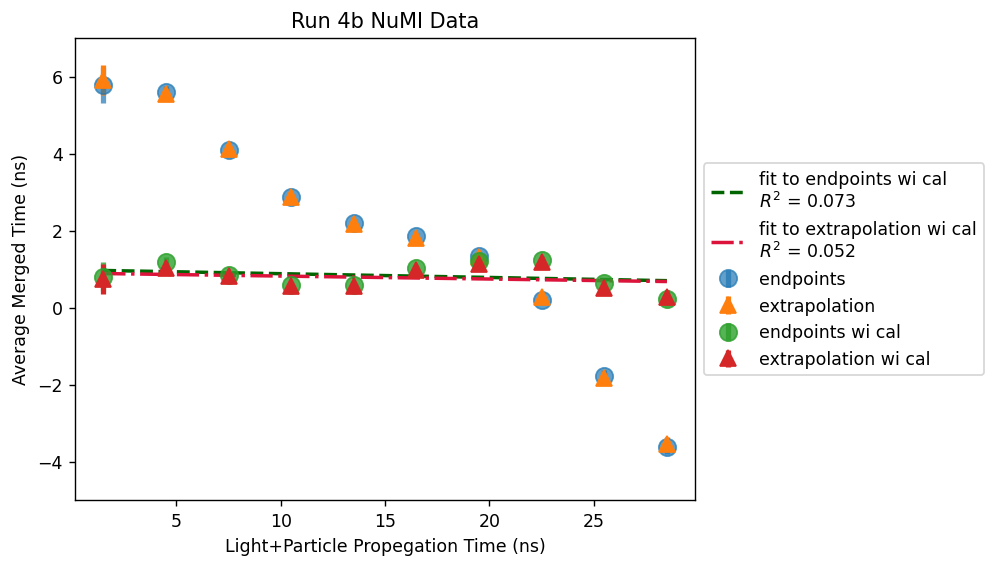

data nominal linear fit: m = -0.027   b = 0.7451
9.006645760813917 0.317
data no cor linear fit: m = -0.0219   b = 1.1971
0.5118702626832156 0.894
data wi cor linear fit: m = -0.0022   b = 0.0827
-54.270435361004445 0.003
data linear no cor linear fit: m = -0.0218   b = 1.1532
1.0886175126772406 0.889
data linear wi cor linear fit: m = -0.0023   b = 0.0466
110.83719495226997 0.003
data spacepoints wi cor linear fit: m = -0.0016   b = 0.008
1840.8403347878725 0.001


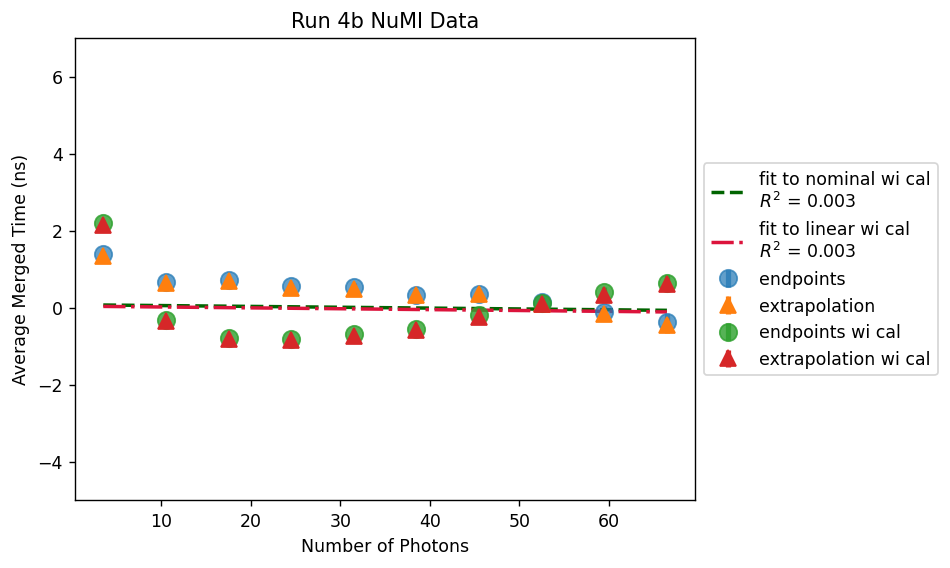

data nominal linear fit: m = -0.0017   b = 1.4529
0.7714507129294969 0.263
data no cor linear fit: m = -0.0212   b = 5.5404
-16.8747448613232 0.951
data wi cor linear fit: m = -0.0002   b = 0.9164
0.8331658355624852 0.003
data linear wi cor linear fit: m = -0.0219   b = 5.6583
-5.543012257858269 0.951
data linear wi cor linear fit: m = -0.0002   b = 0.8605
0.8555554001318803 0.006
data spacepoints wi cor linear fit: m = -0.0005   b = 0.9045
0.7661224815272284 0.032


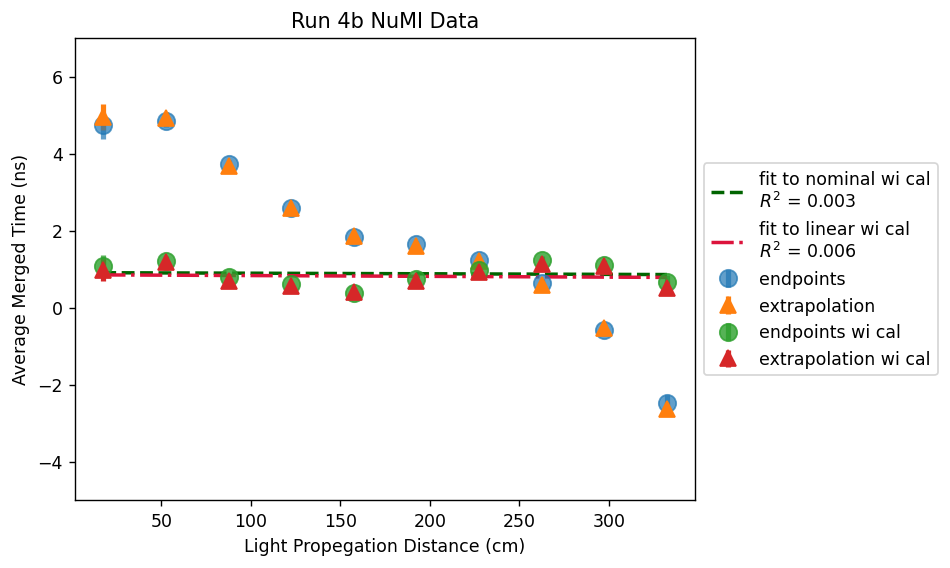

data nominal linear fit: m = -0.0049   b = 0.7031
-4.135378203376091 0.561
data no cor linear fit: m = -0.0211   b = 1.6835
8.1692279548207 0.927
data wi cor linear fit: m = -0.0038   b = 0.5321
-5.0449884540148595 0.474
data linear no cor linear fit: m = -0.0204   b = 1.2244
-4.687120874523109 0.905
data linear wi cor linear fit: m = -0.0017   b = 0.0343
-128.40557431393736 0.101
data spacepoints wi cor linear fit: m = -0.002   b = 0.0341
-76.22498197732594 0.139


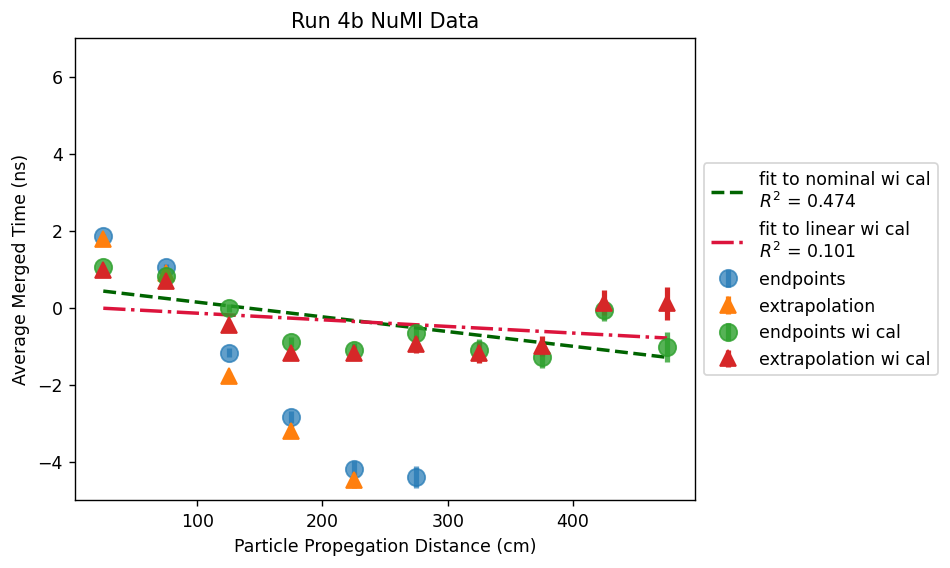

data nominal linear fit: m = -0.0023   b = 1.584
3.7494261755553615 0.558
data no cor linear fit: m = -0.0008   b = 1.0017
6.956974791989863 0.166
data wi cor linear fit: m = 0.0006   b = 0.6155
0.5040120136392758 0.363
data linear no cor linear fit: m = -0.0004   b = 0.8243
6.658508516227878 0.044
data linear wi cor linear fit: m = 0.0007   b = 0.5405
0.6388891971188653 0.389
data spacepoints wi cor linear fit: m = 0.0006   b = 0.5335
0.4780239693183145 0.404


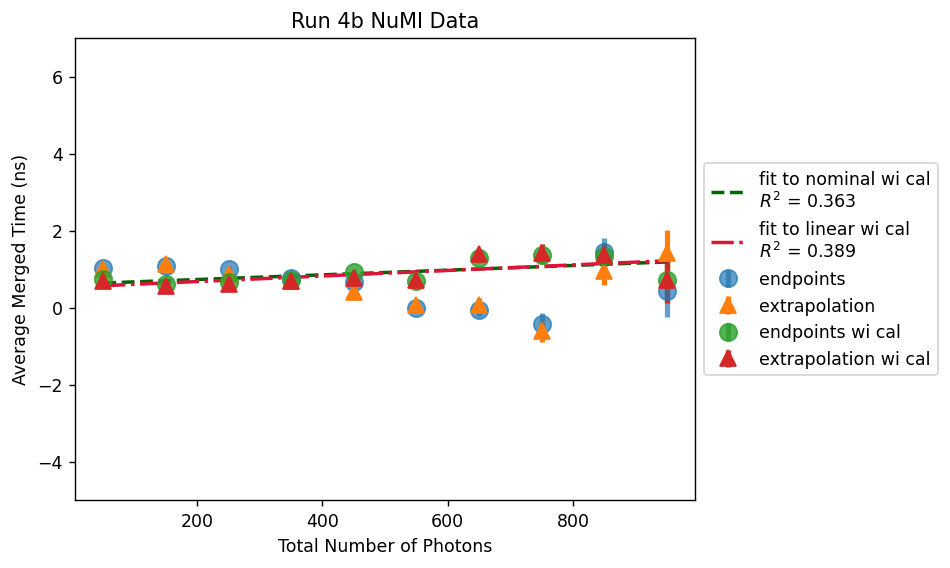

data nominal linear fit: m = -0.0052   b = 1.5395
0.3947435205283887 0.846
data no cor linear fit: m = -0.0075   b = 1.779
3.736866882406377 0.896
data wi cor linear fit: m = 0.0001   b = 0.7097
0.3521008162228018 0.003
data linear no cor linear fit: m = -0.0074   b = 1.7271
-0.5907333036829349 0.923
data linear wi cor linear fit: m = 0.0002   b = 0.6483
0.32372038249439616 0.014
data spacepoints wi cor linear fit: m = 0.0   b = 0.6374
0.36994921376720896 0.0


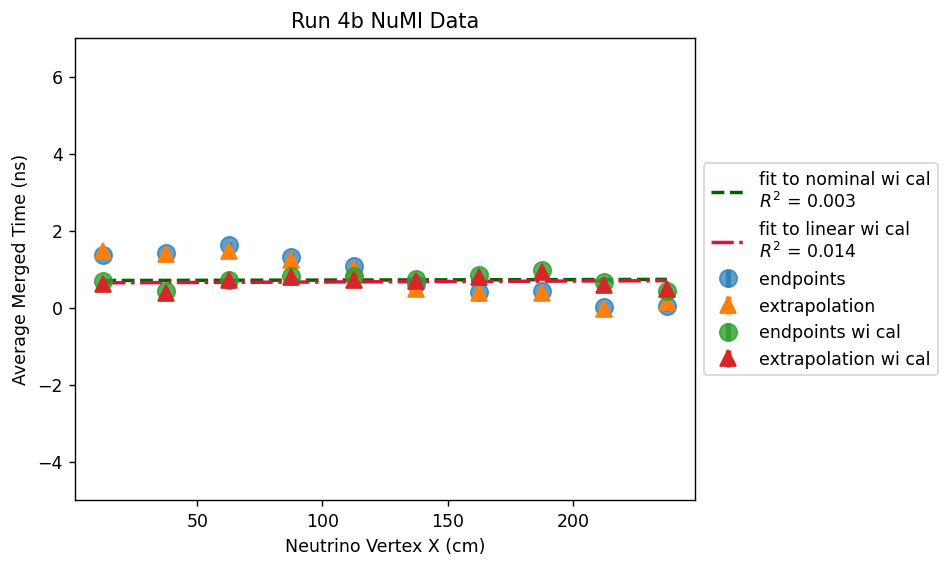

data nominal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779
data no cal: Triple Gaussian      mean: -0.1217   std: 3.2197   C: 276.113
38.01962704650277


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/2034618705.py:1640: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times"] = merge_times
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/2034618705.py:1641: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp_df["merge_times_nocor"] = merge_times_nocor
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/2034618705.py:1641: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

data no cal: Triple Gaussian      mean: -0.3816   std: 2.9687   C: 248.5309
29.73670899527902
data linear vp no cal: Triple Gaussian      mean: -0.2238   std: 3.1028   C: 278.4874
42.53111804135742
data linear vp wi cal: Triple Gaussian      mean: -0.4651   std: 2.8954   C: 251.0981
25.56873745045425
data spacepoints vp wi cal: Triple Gaussian      mean: -0.4599   std: 2.9888   C: 246.9392
28.230761656160066


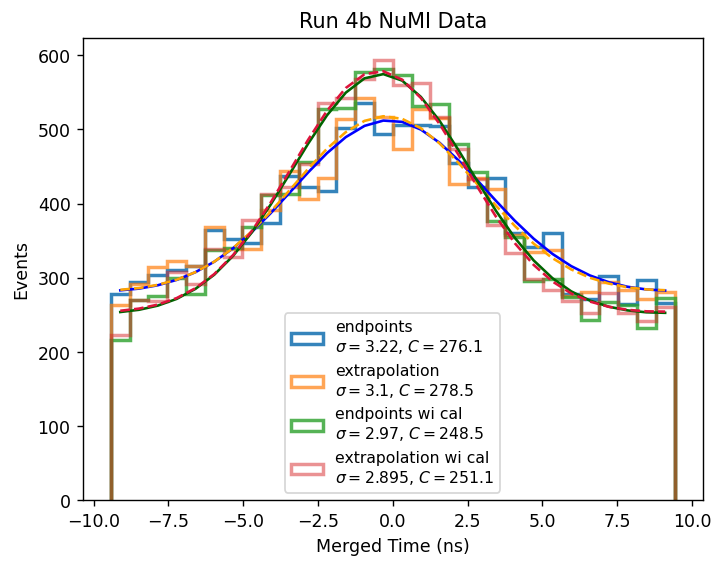

data nominal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data no cal: Triple Gaussian      mean: -0.1685   std: 3.5262   C: 93.3192
31.199254124247094
data wi cal: Triple Gaussian      mean: -0.0967   std: 2.8838   C: 87.1333
29.62297227360537
data linear vp no cal: Triple Gaussian      mean: -0.2806   std: 3.4042   C: 93.9276
24.377572952966172
data linear vp wi cal: Triple Gaussian      mean: -0.1689   std: 2.8208   C: 88.3342
24.391081981547128
data spacepoints vp wi cal: Triple Gaussian      mean: -0.1588   std: 2.8795   C: 87.2121
20.72884621413097


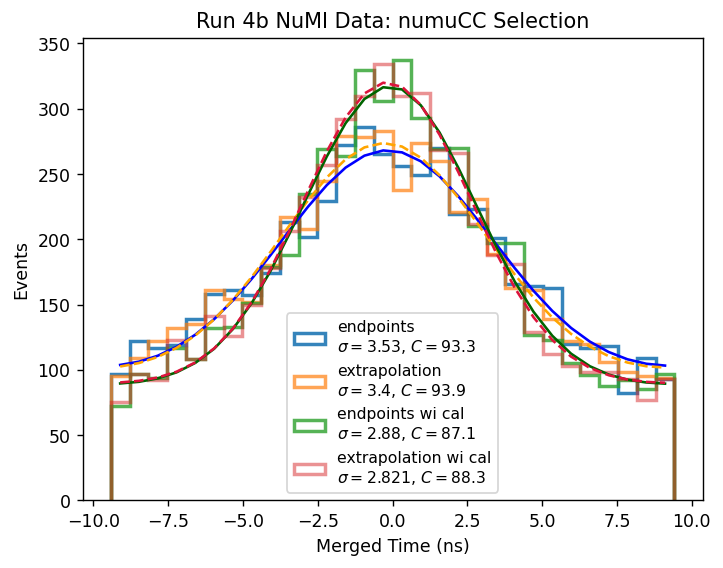

In [91]:

same_y = True
use_overflow=False

const_propt = []
const_propt_full = []
const_propt_ssmsp = []
const_Np = []
const_Np_full = []
const_Np_ssmsp = []
const_xvtx = []
const_xvtx_full = []
const_xvtx_ssmsp = []

m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_DL_i_ssmsp = 0
b_DL_i_ssmsp = 0
global_cor_ssmsp = 0
const_propt_ssmsp.append(m_propt_i_ssmsp)
const_Np_ssmsp.append(m_Np_i_ssmsp)
const_xvtx_ssmsp.append(m_xvtx_i_ssmsp)
#it 1
m_propt_i_ssmsp = -0.3199
b_propt_i_ssmsp = 6.0556
m_Np_i_ssmsp = -0.0191
b_Np_i_ssmsp = 0.5295
m_xvtx_i_ssmsp = -0.0084
b_xvtx_i_ssmsp = 1.2429
global_cor_ssmsp = 1.1
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 2
m_propt_i_ssmsp += -0.1147
b_propt_i_ssmsp += 2.7269
m_Np_i_ssmsp += -0.0434
b_Np_i_ssmsp += 0.9085
m_xvtx_i_ssmsp += -0.0041
b_xvtx_i_ssmsp += 1.0417
global_cor_ssmsp = 2.5
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 3
m_propt_i_ssmsp += -0.0699
b_propt_i_ssmsp += 1.9546
m_Np_i_ssmsp += -0.0221
b_Np_i_ssmsp += 0.4549
m_xvtx_i_ssmsp += -0.0024 
b_xvtx_i_ssmsp += 0.8808
global_cor_ssmsp = 3.9
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 4
m_propt_i_ssmsp += -0.0327 
b_propt_i_ssmsp += 1.305
m_Np_i_ssmsp += -0.0124
b_Np_i_ssmsp += 0.2517
m_xvtx_i_ssmsp += -0.0007
b_xvtx_i_ssmsp += 0.702
global_cor_ssmsp = 5.3
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 5
m_propt_i_ssmsp += -0.0236
b_propt_i_ssmsp += 1.1805
m_Np_i_ssmsp += -0.0067
b_Np_i_ssmsp += 0.1525
m_xvtx_i_ssmsp += -0.0002
b_xvtx_i_ssmsp += 0.6841
global_cor_ssmsp = 6.8
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 6
m_propt_i_ssmsp += -0.0111
b_propt_i_ssmsp += 0.9675
m_Np_i_ssmsp += -0.0043
b_Np_i_ssmsp += 0.1055
m_xvtx_i_ssmsp += 0.0003
b_xvtx_i_ssmsp += 0.6437
global_cor_ssmsp = 8.2
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)

m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_DL_i_fullDp = 0
b_DL_i_fullDp = 0
global_cor_fullDp = 0
const_propt_full.append(m_propt_i_fullDp)
const_Np_full.append(m_Np_i_fullDp)
const_xvtx_full.append(m_xvtx_i_fullDp)
#it 1
m_propt_i_fullDp = -0.323
b_propt_i_fullDp = 6.1711
m_Np_i_fullDp = -0.0196
b_Np_i_fullDp = 0.599
m_xvtx_i_fullDp = -0.0085
b_xvtx_i_fullDp = 1.317
global_cor_fullDp = 1.1
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 2
m_propt_i_fullDp += -0.1113
b_propt_i_fullDp += 2.6173
m_Np_i_fullDp += -0.0441
b_Np_i_fullDp += 0.89
m_xvtx_i_fullDp += -0.004
b_xvtx_i_fullDp += 0.9982
global_cor_fullDp = 2.5
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 3
m_propt_i_fullDp += -0.0727
b_propt_i_fullDp += 2.0216
m_Np_i_fullDp += -0.0206
b_Np_i_fullDp += 0.4422
m_xvtx_i_fullDp += -0.0024
b_xvtx_i_fullDp += 0.8967
global_cor_fullDp = 3.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 4
m_propt_i_fullDp += -0.0344
b_propt_i_fullDp += 1.3615
m_Np_i_fullDp += -0.0131
b_Np_i_fullDp += 0.2915
m_xvtx_i_fullDp += -0.0008
b_xvtx_i_fullDp += 0.7476
global_cor_fullDp = 5.4
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 5
m_propt_i_fullDp += -0.0245
b_propt_i_fullDp += 1.2028
m_Np_i_fullDp += -0.0071
b_Np_i_fullDp += 0.1642
m_xvtx_i_fullDp += -0.0003
b_xvtx_i_fullDp += 0.6968
global_cor_fullDp = 6.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 6
m_propt_i_fullDp += -0.0119
b_propt_i_fullDp += 1.0088
m_Np_i_fullDp += -0.0041
b_Np_i_fullDp += 0.1209
m_xvtx_i_fullDp += 0.0001
b_xvtx_i_fullDp += 0.6956
global_cor_fullDp = 8.4
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)

m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DLi = 0   
b_DL_i = 0
global_cor = -2.2

#it1
m_propt_i = -0.3227
b_propt_i = 6.1476
m_Np_i = -0.0203
b_Np_i = 0.6463
m_xvtx_i = -0.0081
b_xvtx_i = 1.3101
global_cor = 1.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it2
m_propt_i += -0.114
b_propt_i += 2.6835
m_Np_i += -0.0439
b_Np_i += 0.9104
m_xvtx_i += -0.004
b_xvtx_i += 1.0218
global_cor = 2.5
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it 3
m_propt_i += -0.0767 
b_propt_i += 2.065
m_Np_i += -0.0203
b_Np_i += 0.423
m_xvtx_i += -0.0024
b_xvtx_i += 0.8883
global_cor = 3.9
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it4
m_propt_i += -0.0333
b_propt_i += 1.3345
m_Np_i +=-0.0133 
b_Np_i += 0.2852
m_xvtx_i += -0.0009
b_xvtx_i += 0.7674
global_cor = 5.5 
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it5
m_propt_i += -0.0211
b_propt_i += 1.1939
m_Np_i +=  -0.0076
b_Np_i += 0.2226
m_xvtx_i += -0.0001
b_xvtx_i += 0.739
global_cor = 7.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it6
m_propt_i += -0.015
b_propt_i += 1.0668
m_Np_i += -0.0043
b_Np_i += 0.1219
m_xvtx_i += 0.0001
b_xvtx_i += 0.7046
global_cor = 8.7
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)

n_pmt_propt_bins = 10
n_pmt_propt_min = 0
n_pmt_propt_max = 30

n_pmt_Nphoton_bins = 10
n_pmt_Nphoton_min = 0
n_pmt_Nphoton_max = 70

n_pmt_DL_bins = 10
n_pmt_DL_min = 0
n_pmt_DL_max = 350

n_pmt_DP_bins = 10
n_pmt_DP_min = 0
n_pmt_DP_max = 500

n_pmt_PhT_bins = 10
n_pmt_PhT_min = 0
n_pmt_PhT_max = 1000

n_pmt_xvtx_bins = 10
n_pmt_xvtx_min = 0
n_pmt_xvtx_max = 250

print("Query the df")
temp_df = df.query("evtTimeNS>0")

reco_nuvtxX_list =  temp_df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  temp_df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = temp_df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = temp_df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = temp_df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = temp_df["PMT_Amp"].to_numpy()

TT3_array_list = temp_df["TT3_array"].to_numpy()
TT3_array_nocor_list = temp_df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = temp_df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = temp_df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = temp_df["DLh_all"].to_numpy()
DP_all = temp_df["DPh_all"].to_numpy()
DP_full_all = temp_df["DPh_full_all"].to_numpy()
DL_full_all = temp_df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = temp_df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = temp_df["DPh_ssmsp_all"].to_numpy()

PhT_all = temp_df["Ph_Tot"].to_numpy()

file = temp_df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_fullDp = []
TT3_array_fullDp_list = []
merge_times_fullDp = []
merge_match_TT3_array_fullDp = []

ns_time_nocor = []
merge_times_nocor = []
merge_match_TT3_array_nocor = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
            
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i)  +global_cor)
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) +global_cor_fullDp)
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) +global_cor_ssmsp)

    ns_time.append(np.median(TT3_array))
    ns_time_nocor.append(np.median(TT3_array_nocor))
    #TT3_array_nocor_list.append(TT3_array_nocor)
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp.append(np.median(TT3_array_fullDp_nocor))
    TT3_array_fullDp_list.append(TT3_array_fullDp_nocor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_fullDp = ns_time_fullDp[event]-Shift+gap*0.5-0.8
    TT_merged_fullDp=-9999
    
    if TThelp_fullDp>=0:
        TT_merged_fullDp=(TThelp_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        
    merge_times_fullDp.append(TT_merged_fullDp)
    merge_match_TT3_array_fullDp.append([])

    TThelp_nocor = ns_time_nocor[event]-Shift+gap*0.5-0.8
    TT_merged_nocor=-9999
    
    if TThelp_nocor>=0:
        TT_merged_nocor=(TThelp_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        
    merge_times_nocor.append(TT_merged_nocor)
    merge_match_TT3_array_nocor.append([])
    
    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)

        TThelp_array_fullDp = TT3_array_fullDp_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp=-9999
        #shift according to the events time
        if TThelp_fullDp>=0:
            TT_array_merged_match_fullDp=(TThelp_array_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp[event].append(TT_array_merged_match_fullDp)

        TThelp_array_nocor = TT3_array_nocor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_nocor=-9999
        #shift according to the events time
        if TThelp_nocor>=0:
            TT_array_merged_match_nocor=(TThelp_array_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_nocor[event].append(TT_array_merged_match_nocor)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
    

#######################

print("Setting Bins")
#Propegation time bins
pmt_propt_bins = np.linspace(n_pmt_propt_min,n_pmt_propt_max,n_pmt_propt_bins+1)
pmt_propt_all_times = []
pmt_propt_avg_times = []
pmt_propt_avg_times_errors = []
pmt_propt_all_times_fullDp = []
pmt_propt_avg_times_fullDp = []
pmt_propt_avg_times_fullDp_errors = []
pmt_propt_all_times_nocor = []
pmt_propt_avg_times_nocor = []
pmt_propt_avg_times_nocor_errors = []
pmt_propt_all_times_recor = []
pmt_propt_avg_times_recor = []
pmt_propt_avg_times_recor_errors = []
pmt_propt_all_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor_errors = []
pmt_propt_all_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_propt_bins): 
    pmt_propt_all_times.append([])
    pmt_propt_avg_times.append(0)
    pmt_propt_avg_times_errors.append(0)
    pmt_propt_all_times_fullDp.append([])
    pmt_propt_avg_times_fullDp.append(0)
    pmt_propt_avg_times_fullDp_errors.append(0)
    pmt_propt_all_times_nocor.append([])
    pmt_propt_avg_times_nocor.append(0)
    pmt_propt_avg_times_nocor_errors.append(0)
    pmt_propt_all_times_recor.append([])
    pmt_propt_avg_times_recor.append(0)
    pmt_propt_avg_times_recor_errors.append(0)
    pmt_propt_all_times_fullDp_recor.append([])
    pmt_propt_avg_times_fullDp_recor.append(0)
    pmt_propt_avg_times_fullDp_recor_errors.append(0)
    pmt_propt_all_times_ssmsp_recor.append([])
    pmt_propt_avg_times_ssmsp_recor.append(0)
    pmt_propt_avg_times_ssmsp_recor_errors.append(0)
    
#Number of photon bins
pmt_Nphoton_bins = np.linspace(n_pmt_Nphoton_min,n_pmt_Nphoton_max,n_pmt_Nphoton_bins+1)
pmt_Nphoton_all_times = []
pmt_Nphoton_avg_times = []
pmt_Nphoton_avg_times_errors = []
pmt_Nphoton_all_times_nocor = []
pmt_Nphoton_avg_times_nocor = []
pmt_Nphoton_avg_times_nocor_errors = []
pmt_Nphoton_all_times_recor = []
pmt_Nphoton_avg_times_recor = []
pmt_Nphoton_avg_times_recor_errors = []
pmt_Nphoton_all_times_fullDp = []
pmt_Nphoton_avg_times_fullDp = []
pmt_Nphoton_avg_times_fullDp_errors = []
pmt_Nphoton_all_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor_errors = []
pmt_Nphoton_all_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_all_times.append([])
    pmt_Nphoton_avg_times.append(0)
    pmt_Nphoton_avg_times_errors.append(0)
    pmt_Nphoton_all_times_nocor.append([])
    pmt_Nphoton_avg_times_nocor.append(0)
    pmt_Nphoton_avg_times_nocor_errors.append(0)
    pmt_Nphoton_all_times_recor.append([])
    pmt_Nphoton_avg_times_recor.append(0)
    pmt_Nphoton_avg_times_recor_errors.append(0)
    pmt_Nphoton_all_times_fullDp.append([])
    pmt_Nphoton_avg_times_fullDp.append(0)
    pmt_Nphoton_avg_times_fullDp_errors.append(0)
    pmt_Nphoton_all_times_fullDp_recor.append([])
    pmt_Nphoton_avg_times_fullDp_recor.append(0)
    pmt_Nphoton_avg_times_fullDp_recor_errors.append(0)
    pmt_Nphoton_all_times_ssmsp_recor.append([])
    pmt_Nphoton_avg_times_ssmsp_recor.append(0)
    pmt_Nphoton_avg_times_ssmsp_recor_errors.append(0)
    
#Light propegation distance bins
pmt_DL_bins = np.linspace(n_pmt_DL_min,n_pmt_DL_max,n_pmt_DL_bins+1)
pmt_DL_all_times = []
pmt_DL_avg_times = []
pmt_DL_avg_times_errors = []
pmt_DL_all_times_nocor = []
pmt_DL_avg_times_nocor = []
pmt_DL_avg_times_nocor_errors = []
pmt_DL_all_times_recor = []
pmt_DL_avg_times_recor = []
pmt_DL_avg_times_recor_errors = []
pmt_DL_all_times_fullDp = []
pmt_DL_avg_times_fullDp = []
pmt_DL_avg_times_fullDp_errors = []
pmt_DL_all_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor_errors = []
pmt_DL_all_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DL_bins): 
    pmt_DL_all_times.append([])
    pmt_DL_avg_times.append(0)
    pmt_DL_avg_times_errors.append(0)
    pmt_DL_all_times_nocor.append([])
    pmt_DL_avg_times_nocor.append(0)
    pmt_DL_avg_times_nocor_errors.append(0)
    pmt_DL_all_times_recor.append([])
    pmt_DL_avg_times_recor.append(0)
    pmt_DL_avg_times_recor_errors.append(0)
    pmt_DL_all_times_fullDp.append([])
    pmt_DL_avg_times_fullDp.append(0)
    pmt_DL_avg_times_fullDp_errors.append(0)
    pmt_DL_all_times_fullDp_recor.append([])
    pmt_DL_avg_times_fullDp_recor.append(0)
    pmt_DL_avg_times_fullDp_recor_errors.append(0) 
    pmt_DL_all_times_ssmsp_recor.append([])
    pmt_DL_avg_times_ssmsp_recor.append(0)
    pmt_DL_avg_times_ssmsp_recor_errors.append(0) 
    
#Particle propegation bins
pmt_DP_bins = np.linspace(n_pmt_DP_min,n_pmt_DP_max,n_pmt_DP_bins+1)
pmt_DP_all_times= []
pmt_DP_avg_times = []
pmt_DP_avg_times_errors = []
pmt_DP_all_times_nocor = []
pmt_DP_avg_times_nocor = []
pmt_DP_avg_times_nocor_errors = []
pmt_DP_all_times_recor = []
pmt_DP_avg_times_recor = []
pmt_DP_avg_times_recor_errors = []
pmt_DP_all_times_fullDp = []
pmt_DP_avg_times_fullDp = []
pmt_DP_avg_times_fullDp_errors = []
pmt_DP_all_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor_errors = []
pmt_DP_all_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DP_bins): 
    pmt_DP_all_times.append([])
    pmt_DP_avg_times.append(0)
    pmt_DP_avg_times_errors.append(0)
    pmt_DP_all_times_nocor.append([])
    pmt_DP_avg_times_nocor.append(0)
    pmt_DP_avg_times_nocor_errors.append(0)
    pmt_DP_all_times_recor.append([])
    pmt_DP_avg_times_recor.append(0)
    pmt_DP_avg_times_recor_errors.append(0)
    pmt_DP_all_times_fullDp.append([])
    pmt_DP_avg_times_fullDp.append(0)
    pmt_DP_avg_times_fullDp_errors.append(0) 
    pmt_DP_all_times_fullDp_recor.append([])
    pmt_DP_avg_times_fullDp_recor.append(0)
    pmt_DP_avg_times_fullDp_recor_errors.append(0) 
    pmt_DP_all_times_ssmsp_recor.append([])
    pmt_DP_avg_times_ssmsp_recor.append(0)
    pmt_DP_avg_times_ssmsp_recor_errors.append(0)
    
#Total Photon bins
pmt_PhT_bins = np.linspace(n_pmt_PhT_min,n_pmt_PhT_max,n_pmt_PhT_bins+1)
pmt_PhT_all_times = []
pmt_PhT_avg_times = []
pmt_PhT_avg_times_errors = []
pmt_PhT_all_times_nocor = []
pmt_PhT_avg_times_nocor = []
pmt_PhT_avg_times_nocor_errors = []
pmt_PhT_all_times_recor = []
pmt_PhT_avg_times_recor = []
pmt_PhT_avg_times_recor_errors = []
pmt_PhT_all_times_fullDp = []
pmt_PhT_avg_times_fullDp = []
pmt_PhT_avg_times_fullDp_errors = []
pmt_PhT_all_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor_errors = []
pmt_PhT_all_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_all_times.append([])
    pmt_PhT_avg_times.append(0)
    pmt_PhT_avg_times_errors.append(0)
    pmt_PhT_all_times_nocor.append([])
    pmt_PhT_avg_times_nocor.append(0)
    pmt_PhT_avg_times_nocor_errors.append(0)
    pmt_PhT_all_times_recor.append([])
    pmt_PhT_avg_times_recor.append(0)
    pmt_PhT_avg_times_recor_errors.append(0)
    pmt_PhT_all_times_fullDp.append([])
    pmt_PhT_avg_times_fullDp.append(0)
    pmt_PhT_avg_times_fullDp_errors.append(0) 
    pmt_PhT_all_times_fullDp_recor.append([])
    pmt_PhT_avg_times_fullDp_recor.append(0)
    pmt_PhT_avg_times_fullDp_recor_errors.append(0) 
    pmt_PhT_all_times_ssmsp_recor.append([])
    pmt_PhT_avg_times_ssmsp_recor.append(0)
    pmt_PhT_avg_times_ssmsp_recor_errors.append(0) 
    
#X vertex bins
pmt_xvtx_bins = np.linspace(n_pmt_xvtx_min,n_pmt_xvtx_max,n_pmt_xvtx_bins+1)
pmt_xvtx_all_times = []
pmt_xvtx_avg_times = []
pmt_xvtx_avg_times_errors = []
pmt_xvtx_all_times_nocor = []
pmt_xvtx_avg_times_nocor = []
pmt_xvtx_avg_times_nocor_errors = []
pmt_xvtx_all_times_recor = []
pmt_xvtx_avg_times_recor = []
pmt_xvtx_avg_times_recor_errors = []
pmt_xvtx_all_times_fullDp = []
pmt_xvtx_avg_times_fullDp = []
pmt_xvtx_avg_times_fullDp_errors = []
pmt_xvtx_all_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor_errors = []
pmt_xvtx_all_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_all_times.append([])
    pmt_xvtx_avg_times.append(0)
    pmt_xvtx_avg_times_errors.append(0)
    pmt_xvtx_all_times_nocor.append([])
    pmt_xvtx_avg_times_nocor.append(0)
    pmt_xvtx_avg_times_nocor_errors.append(0)
    pmt_xvtx_all_times_recor.append([])
    pmt_xvtx_avg_times_recor.append(0)
    pmt_xvtx_avg_times_recor_errors.append(0)
    pmt_xvtx_all_times_fullDp.append([])
    pmt_xvtx_avg_times_fullDp.append(0)
    pmt_xvtx_avg_times_fullDp_errors.append(0) 
    pmt_xvtx_all_times_fullDp_recor.append([])
    pmt_xvtx_avg_times_fullDp_recor.append(0)
    pmt_xvtx_avg_times_fullDp_recor_errors.append(0) 
    pmt_xvtx_all_times_ssmsp_recor.append([])
    pmt_xvtx_avg_times_ssmsp_recor.append(0)
    pmt_xvtx_avg_times_ssmsp_recor_errors.append(0) 

print("Filling nominal with corrections histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_propt_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_Nphoton_all_times[ibin].append(merge_match_TT3_array[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DL_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DP_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_PhT_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_xvtx_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break 

print("Setting nominal with corrections averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times[i] = statistics.mean(pmt_propt_all_times[i])     
    pmt_propt_avg_times_errors[i] = (statistics.stdev(pmt_propt_all_times[i])/np.sqrt(len(pmt_propt_all_times[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times[i] = statistics.mean(pmt_Nphoton_all_times[i])     
    pmt_Nphoton_avg_times_errors[i] = (statistics.stdev(pmt_Nphoton_all_times[i])/np.sqrt(len(pmt_Nphoton_all_times[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times[i] = statistics.mean(pmt_DL_all_times[i])     
    pmt_DL_avg_times_errors[i] = (statistics.stdev(pmt_DL_all_times[i])/np.sqrt(len(pmt_DL_all_times[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times[i] = statistics.mean(pmt_DP_all_times[i])     
    pmt_DP_avg_times_errors[i] = (statistics.stdev(pmt_DP_all_times[i])/np.sqrt(len(pmt_DP_all_times[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times[i] = statistics.mean(pmt_PhT_all_times[i])     
    pmt_PhT_avg_times_errors[i] = (statistics.stdev(pmt_PhT_all_times[i])/np.sqrt(len(pmt_PhT_all_times[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times[i] = statistics.mean(pmt_xvtx_all_times[i])     
    pmt_xvtx_avg_times_errors[i] = (statistics.stdev(pmt_xvtx_all_times[i])/np.sqrt(len(pmt_xvtx_all_times[i])))

print("Filling nocor nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_propt_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_Nphoton_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DL_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DP_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_PhT_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_xvtx_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break 

print("Setting nocor nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_nocor[i] = statistics.mean(pmt_propt_all_times_nocor[i])     
    pmt_propt_avg_times_nocor_errors[i] = (statistics.stdev(pmt_propt_all_times_nocor[i])/np.sqrt(len(pmt_propt_all_times_nocor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_nocor[i] = statistics.mean(pmt_Nphoton_all_times_nocor[i])     
    pmt_Nphoton_avg_times_nocor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_nocor[i])/np.sqrt(len(pmt_Nphoton_all_times_nocor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_nocor[i] = statistics.mean(pmt_DL_all_times_nocor[i])     
    pmt_DL_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DL_all_times_nocor[i])/np.sqrt(len(pmt_DL_all_times_nocor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_nocor[i] = statistics.mean(pmt_DP_all_times_nocor[i])     
    pmt_DP_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DP_all_times_nocor[i])/np.sqrt(len(pmt_DP_all_times_nocor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_nocor[i] = statistics.mean(pmt_PhT_all_times_nocor[i])     
    pmt_PhT_avg_times_nocor_errors[i] = (statistics.stdev(pmt_PhT_all_times_nocor[i])/np.sqrt(len(pmt_PhT_all_times_nocor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_nocor[i] = statistics.mean(pmt_xvtx_all_times_nocor[i])     
    pmt_xvtx_avg_times_nocor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_nocor[i])/np.sqrt(len(pmt_xvtx_all_times_nocor[i])))




print("Filling nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_propt_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_Nphoton_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DL_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DP_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_PhT_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_xvtx_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break 

print("Setting nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_recor[i] = statistics.mean(pmt_propt_all_times_recor[i])     
    pmt_propt_avg_times_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_recor[i])/np.sqrt(len(pmt_propt_all_times_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_recor[i] = statistics.mean(pmt_Nphoton_all_times_recor[i])     
    pmt_Nphoton_avg_times_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_recor[i] = statistics.mean(pmt_DL_all_times_recor[i])     
    pmt_DL_avg_times_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_recor[i])/np.sqrt(len(pmt_DL_all_times_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_recor[i] = statistics.mean(pmt_DP_all_times_recor[i])     
    pmt_DP_avg_times_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_recor[i])/np.sqrt(len(pmt_DP_all_times_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_recor[i] = statistics.mean(pmt_PhT_all_times_recor[i])     
    pmt_PhT_avg_times_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_recor[i])/np.sqrt(len(pmt_PhT_all_times_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_recor[i] = statistics.mean(pmt_xvtx_all_times_recor[i])     
    pmt_xvtx_avg_times_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_recor[i])/np.sqrt(len(pmt_xvtx_all_times_recor[i])))




print("Filling nocor linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_propt_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_Nphoton_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DL_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DP_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_PhT_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_xvtx_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break

print("Setting nocor linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp[i] = statistics.mean(pmt_propt_all_times_fullDp[i])     
    pmt_propt_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp[i])/np.sqrt(len(pmt_propt_all_times_fullDp[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp[i] = statistics.mean(pmt_Nphoton_all_times_fullDp[i])     
    pmt_Nphoton_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp[i] = statistics.mean(pmt_DL_all_times_fullDp[i])     
    pmt_DL_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp[i])/np.sqrt(len(pmt_DL_all_times_fullDp[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp[i] = statistics.mean(pmt_DP_all_times_fullDp[i])     
    pmt_DP_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp[i])/np.sqrt(len(pmt_DP_all_times_fullDp[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp[i] = statistics.mean(pmt_PhT_all_times_fullDp[i])     
    pmt_PhT_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp[i])/np.sqrt(len(pmt_PhT_all_times_fullDp[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp[i] = statistics.mean(pmt_xvtx_all_times_fullDp[i])     
    pmt_xvtx_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp[i])))



print("Filling linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_propt_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_Nphoton_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DL_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DP_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_PhT_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_xvtx_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break

print("Setting linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp_recor[i] = statistics.mean(pmt_propt_all_times_fullDp_recor[i])     
    pmt_propt_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp_recor[i])/np.sqrt(len(pmt_propt_all_times_fullDp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp_recor[i] = statistics.mean(pmt_Nphoton_all_times_fullDp_recor[i])     
    pmt_Nphoton_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp_recor[i] = statistics.mean(pmt_DL_all_times_fullDp_recor[i])     
    pmt_DL_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DL_all_times_fullDp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp_recor[i] = statistics.mean(pmt_DP_all_times_fullDp_recor[i])     
    pmt_DP_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DP_all_times_fullDp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp_recor[i] = statistics.mean(pmt_PhT_all_times_fullDp_recor[i])     
    pmt_PhT_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp_recor[i])/np.sqrt(len(pmt_PhT_all_times_fullDp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp_recor[i] = statistics.mean(pmt_xvtx_all_times_fullDp_recor[i])     
    pmt_xvtx_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp_recor[i])))


print("Filling sapcepoints histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_ssmsp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_ssmsp_all[event]
    DP = DP_ssmsp_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_ssmsp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_ssmsp_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_ssmsp_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_propt_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_Nphoton_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DL_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DP_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_PhT_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX_ssmsp>pmt_xvtx_bins[ibin] and reco_nuvtxX_ssmsp<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_xvtx_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break

print("Setting spacepoints averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_ssmsp_recor[i] = statistics.mean(pmt_propt_all_times_ssmsp_recor[i])     
    pmt_propt_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_propt_all_times_ssmsp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_ssmsp_recor[i] = statistics.mean(pmt_Nphoton_all_times_ssmsp_recor[i])     
    pmt_Nphoton_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DL_all_times_ssmsp_recor[i])     
    pmt_DL_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DL_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DP_all_times_ssmsp_recor[i])     
    pmt_DP_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DP_all_times_ssmsp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_ssmsp_recor[i] = statistics.mean(pmt_PhT_all_times_ssmsp_recor[i])     
    pmt_PhT_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_PhT_all_times_ssmsp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_ssmsp_recor[i] = statistics.mean(pmt_xvtx_all_times_ssmsp_recor[i])     
    pmt_xvtx_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_ssmsp_recor[i])))

############################################################################################



plot_title = "Run 4b NuMI Data"

popt,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_propt_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_propt_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_propt_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_propt_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_propt_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_propt_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor,yerr=pmt_propt_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor,yerr=pmt_propt_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to endpoints wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to extrapolation wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7) 
if same_y_tight: plt.ylim(-2,2) 
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light+Particle Propegation Time (ns)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_Nphoton_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_Nphoton_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_Nphoton_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_Nphoton_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_Nphoton_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_Nphoton_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor,yerr=pmt_Nphoton_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp,yerr=pmt_Nphoton_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor,yerr=pmt_Nphoton_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor,yerr=pmt_Nphoton_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DL_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DL_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DL_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp)
print("data linear wi cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DL_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)



popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DL_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DL_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor,yerr=pmt_DL_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp,yerr=pmt_DL_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor,yerr=pmt_DL_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor,yerr=pmt_DL_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DP_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DP_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DP_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DP_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DP_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DP_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor,yerr=pmt_DP_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp,yerr=pmt_DP_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor,yerr=pmt_DP_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor,yerr=pmt_DP_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Particle Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_PhT_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_PhT_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_PhT_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_PhT_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_PhT_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_PhT_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor,yerr=pmt_PhT_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp,yerr=pmt_PhT_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor,yerr=pmt_PhT_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor,yerr=pmt_PhT_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Total Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_xvtx_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_xvtx_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_xvtx_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_xvtx_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_xvtx_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_xvtx_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor,yerr=pmt_xvtx_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp,yerr=pmt_xvtx_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor,yerr=pmt_xvtx_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor,yerr=pmt_xvtx_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Neutrino Vertex X (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################
#######################
nbins = 30

temp_df["merge_times"] = merge_times
temp_df["merge_times_nocor"] = merge_times_nocor
temp_df["merge_times_recor"] = merge_times_recor
temp_df["merge_times_fullDp"] = merge_times_fullDp
temp_df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
temp_df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor


data = temp_df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)

data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()





data = temp_df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42").query("numu_score>0.8")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)


data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42").query("numu_score>0.8")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data wi cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)


data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42").query("numu_score>0.8")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)


data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42").query("numu_score>0.8")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()

# Iteration 7

Query the df
Setting recalibrated times


100%|███████████████████████████████████| 11703/11703 [00:02<00:00, 5534.53it/s]


Setting Bins
Filling nominal with corrections histograms
Setting nominal with corrections averages
Filling nocor nominal histograms
Setting nocor nominal averages
Filling nominal histograms
Setting nominal averages
Filling nocor linear histograms
Setting nocor linear averages
Filling linear histograms
Setting linear averages
Filling sapcepoints histograms
Setting spacepoints averages
data nominal linear fit: m = -0.0371   b = 1.6896
1.099394519622555 0.5
data no cor linear fit: m = -0.3244   b = 6.7252
0.9438480811190403 0.956
data wi cor linear fit: m = -0.0052   b = 0.9044
1.1229635472443507 0.022
data linear no cor linear fit: m = -0.3254   b = 6.756
0.5318248886000909 0.959
data linear wi cor linear fit: m = -0.0053   b = 0.8852
0.9877932930080889 0.027
data spacepoints wi cor linear fit: m = -0.0069   b = 0.8902
1.0070234056804914 0.044


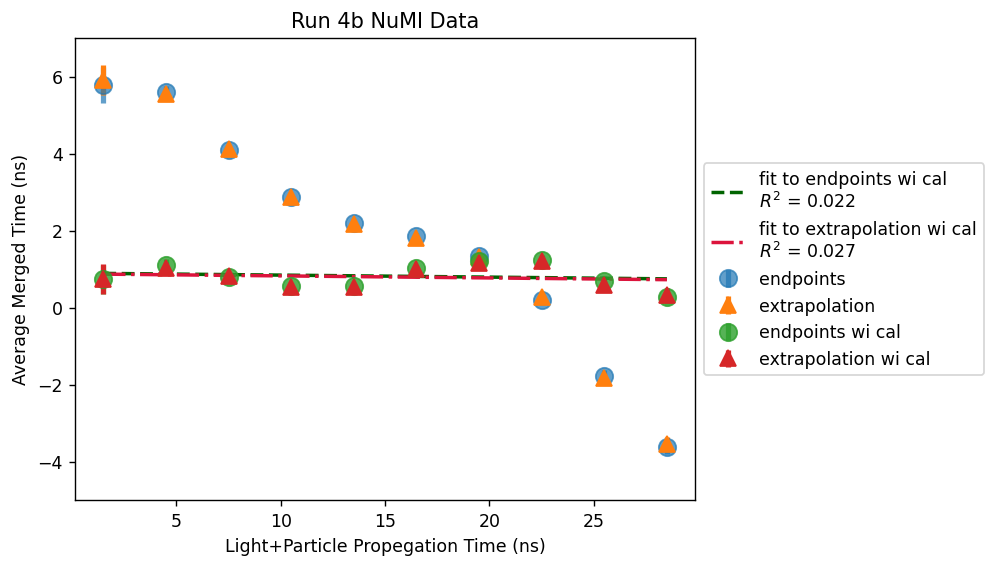

data nominal linear fit: m = -0.027   b = 0.7451
9.006645760813917 0.317
data no cor linear fit: m = -0.0219   b = 1.1971
0.5118702626832156 0.894
data wi cor linear fit: m = -0.0012   b = 0.0576
133.66322077506467 0.001
data linear no cor linear fit: m = -0.0218   b = 1.1532
1.0886175126772406 0.889
data linear wi cor linear fit: m = -0.0012   b = 0.0389
559.0476432572793 0.001
data spacepoints wi cor linear fit: m = -0.0013   b = 0.0169
182.53288454423148 0.001


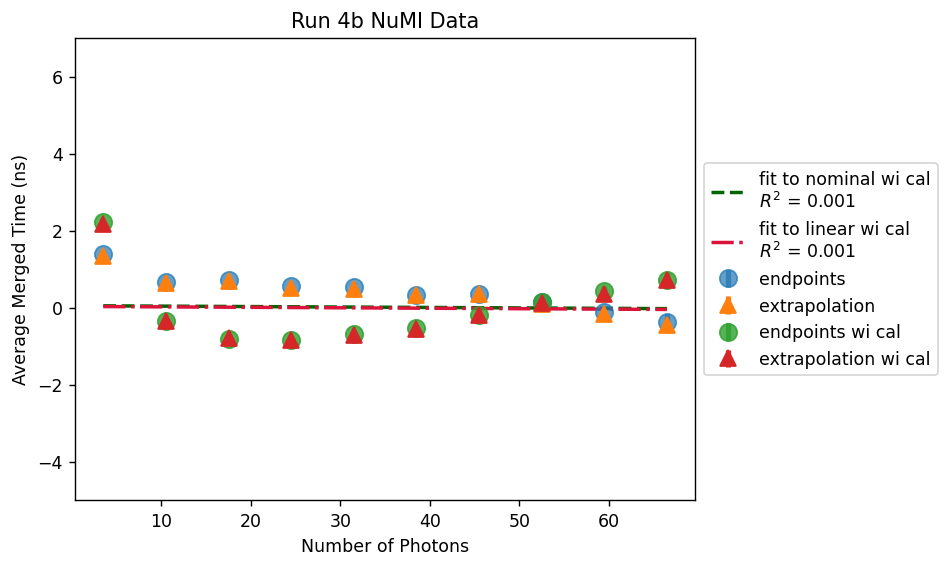

data nominal linear fit: m = -0.0017   b = 1.4529
0.7714507129294969 0.263
data no cor linear fit: m = -0.0212   b = 5.5404
-16.8747448613232 0.951
data wi cor linear fit: m = 0.0002   b = 0.8354
0.8341503949525243 0.006
data linear wi cor linear fit: m = -0.0219   b = 5.6583
-5.543012257858269 0.951
data linear wi cor linear fit: m = -0.0001   b = 0.8587
0.8650297091298451 0.001
data spacepoints wi cor linear fit: m = -0.0001   b = 0.8608
0.8057478156275184 0.003


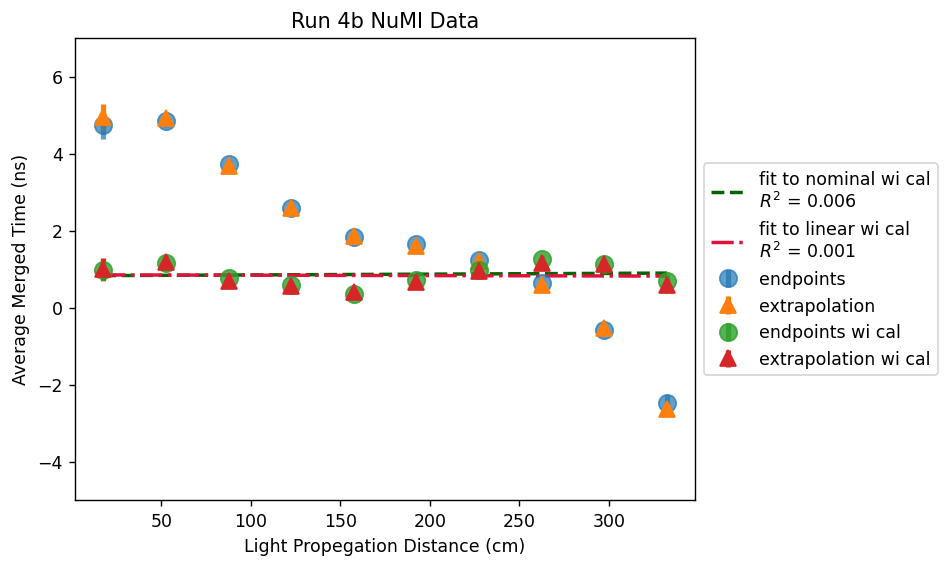

data nominal linear fit: m = -0.0049   b = 0.7031
-4.135378203376091 0.561
data no cor linear fit: m = -0.0211   b = 1.6835
8.1692279548207 0.927
data wi cor linear fit: m = -0.0038   b = 0.5645
-5.888299383212987 0.51
data linear no cor linear fit: m = -0.0204   b = 1.2244
-4.687120874523109 0.905
data linear wi cor linear fit: m = -0.0017   b = 0.077
6.094480293973338 0.103
data spacepoints wi cor linear fit: m = -0.0018   b = 0.0682
22.05239644548218 0.121


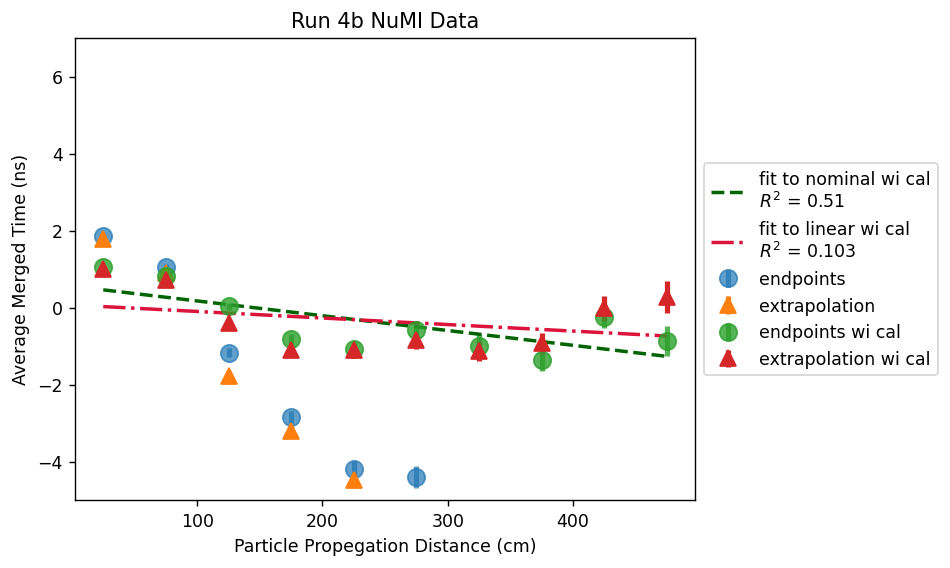

data nominal linear fit: m = -0.0023   b = 1.584
3.7494261755553615 0.558
data no cor linear fit: m = -0.0008   b = 1.0017
6.956974791989863 0.166
data wi cor linear fit: m = 0.0008   b = 0.5742
0.4910711238988318 0.481
data linear no cor linear fit: m = -0.0004   b = 0.8243
6.658508516227878 0.044
data linear wi cor linear fit: m = 0.0009   b = 0.5151
0.6282481177205957 0.486
data spacepoints wi cor linear fit: m = 0.0008   b = 0.5205
0.4849619795028748 0.499


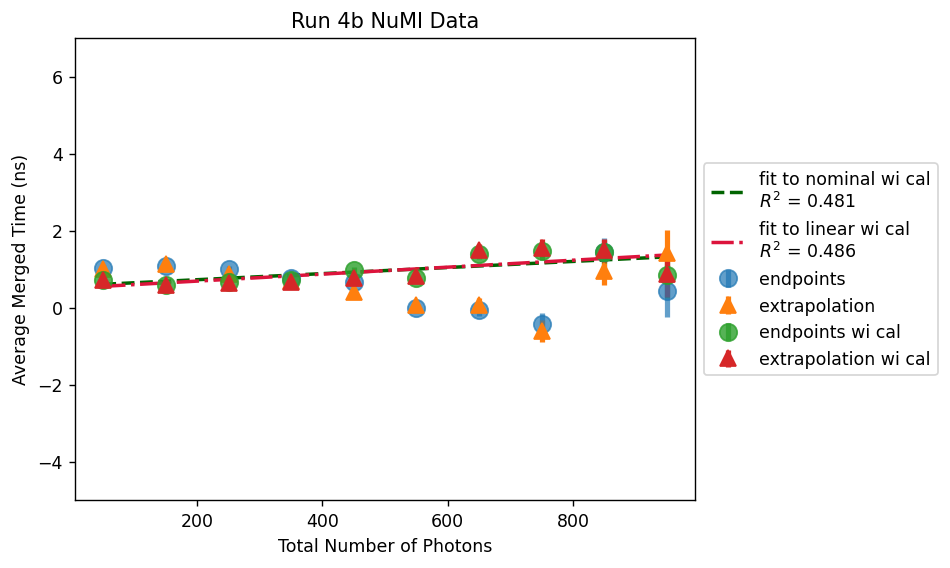

data nominal linear fit: m = -0.0052   b = 1.5395
0.3947435205283887 0.846
data no cor linear fit: m = -0.0075   b = 1.779
3.736866882406377 0.896
data wi cor linear fit: m = 0.0001   b = 0.7159
0.3523522495673821 0.002
data linear no cor linear fit: m = -0.0074   b = 1.7271
-0.5907333036829349 0.923
data linear wi cor linear fit: m = 0.0001   b = 0.6857
0.3067812393949163 0.003
data spacepoints wi cor linear fit: m = 0.0   b = 0.6657
0.3205867357850931 0.0


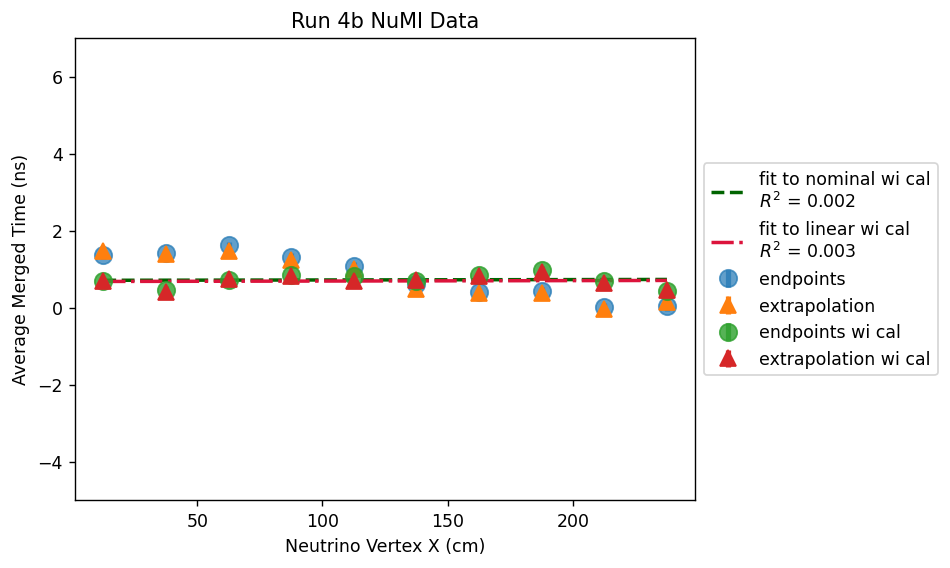

data nominal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/3338406223.py:1674: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times"] = merge_times
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/3338406223.py:1675: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp_df["merge_times_nocor"] = merge_times_nocor
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/3338406223.py:1675: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

data no cal: Triple Gaussian      mean: -0.1217   std: 3.2197   C: 276.113
38.01962704650277
data no cal: Triple Gaussian      mean: -0.3773   std: 2.9676   C: 248.959
29.245801609139125
data linear vp no cal: Triple Gaussian      mean: -0.2238   std: 3.1028   C: 278.4874
42.5311171311488
data linear vp wi cal: Triple Gaussian      mean: -0.4211   std: 2.9338   C: 249.9099
30.340397812180864
data spacepoints vp wi cal: Triple Gaussian      mean: -0.4277   std: 2.9972   C: 246.7779
37.12457194127271


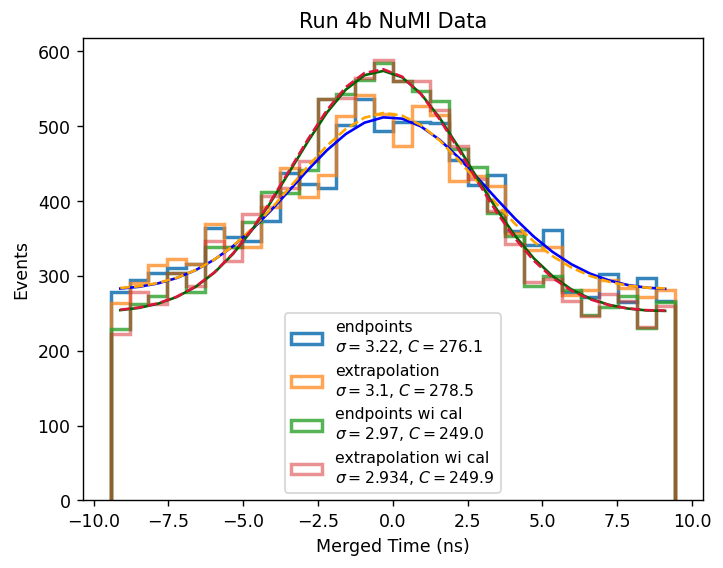

data nominal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data no cal: Triple Gaussian      mean: -0.1685   std: 3.5262   C: 93.3192
31.199254124247094
data wi cal: Triple Gaussian      mean: -0.0892   std: 2.8926   C: 87.1107
29.06420130742374
data linear vp no cal: Triple Gaussian      mean: -0.2806   std: 3.4042   C: 93.9276
24.377573244078494
data linear vp wi cal: Triple Gaussian      mean: -0.1244   std: 2.8402   C: 88.1109
23.284093650361264
data spacepoints vp wi cal: Triple Gaussian      mean: -0.1251   std: 2.8989   C: 86.9009
22.528937296829362


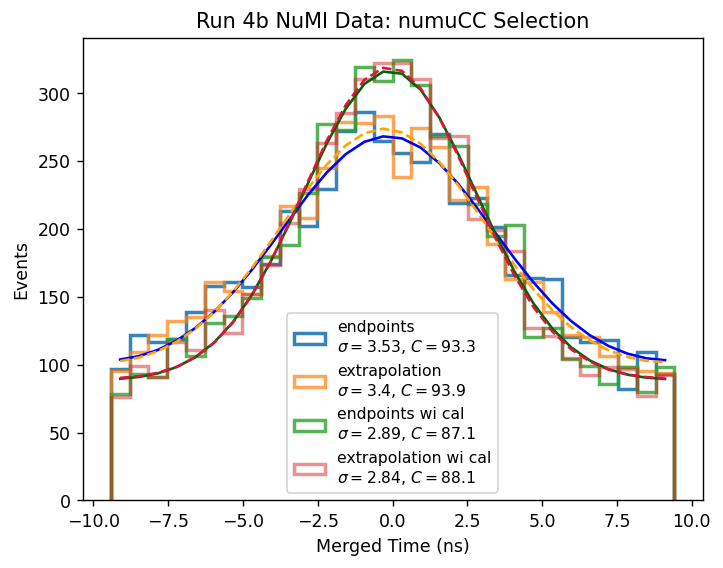

In [92]:

same_y = True
use_overflow=False

const_propt = []
const_propt_full = []
const_propt_ssmsp = []
const_Np = []
const_Np_full = []
const_Np_ssmsp = []
const_xvtx = []
const_xvtx_full = []
const_xvtx_ssmsp = []

m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_DL_i_ssmsp = 0
b_DL_i_ssmsp = 0
global_cor_ssmsp = 0
const_propt_ssmsp.append(m_propt_i_ssmsp)
const_Np_ssmsp.append(m_Np_i_ssmsp)
const_xvtx_ssmsp.append(m_xvtx_i_ssmsp)
#it 1
m_propt_i_ssmsp = -0.3199
b_propt_i_ssmsp = 6.0556
m_Np_i_ssmsp = -0.0191
b_Np_i_ssmsp = 0.5295
m_xvtx_i_ssmsp = -0.0084
b_xvtx_i_ssmsp = 1.2429
global_cor_ssmsp = 1.1
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 2
m_propt_i_ssmsp += -0.1147
b_propt_i_ssmsp += 2.7269
m_Np_i_ssmsp += -0.0434
b_Np_i_ssmsp += 0.9085
m_xvtx_i_ssmsp += -0.0041
b_xvtx_i_ssmsp += 1.0417
global_cor_ssmsp = 2.5
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 3
m_propt_i_ssmsp += -0.0699
b_propt_i_ssmsp += 1.9546
m_Np_i_ssmsp += -0.0221
b_Np_i_ssmsp += 0.4549
m_xvtx_i_ssmsp += -0.0024 
b_xvtx_i_ssmsp += 0.8808
global_cor_ssmsp = 3.9
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 4
m_propt_i_ssmsp += -0.0327 
b_propt_i_ssmsp += 1.305
m_Np_i_ssmsp += -0.0124
b_Np_i_ssmsp += 0.2517
m_xvtx_i_ssmsp += -0.0007
b_xvtx_i_ssmsp += 0.702
global_cor_ssmsp = 5.3
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 5
m_propt_i_ssmsp += -0.0236
b_propt_i_ssmsp += 1.1805
m_Np_i_ssmsp += -0.0067
b_Np_i_ssmsp += 0.1525
m_xvtx_i_ssmsp += -0.0002
b_xvtx_i_ssmsp += 0.6841
global_cor_ssmsp = 6.8
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 6
m_propt_i_ssmsp += -0.0111
b_propt_i_ssmsp += 0.9675
m_Np_i_ssmsp += -0.0043
b_Np_i_ssmsp += 0.1055
m_xvtx_i_ssmsp += 0.0003
b_xvtx_i_ssmsp += 0.6437
global_cor_ssmsp = 8.2
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 7
m_propt_i_ssmsp += -0.0107
b_propt_i_ssmsp += 0.9292
m_Np_i_ssmsp += -0.0016
b_Np_i_ssmsp += 0.0075
m_xvtx_i_ssmsp += 0
b_xvtx_i_ssmsp += 0.637
global_cor_ssmsp = 9.6
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)

m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_DL_i_fullDp = 0
b_DL_i_fullDp = 0
global_cor_fullDp = 0
const_propt_full.append(m_propt_i_fullDp)
const_Np_full.append(m_Np_i_fullDp)
const_xvtx_full.append(m_xvtx_i_fullDp)
#it 1
m_propt_i_fullDp = -0.323
b_propt_i_fullDp = 6.1711
m_Np_i_fullDp = -0.0196
b_Np_i_fullDp = 0.599
m_xvtx_i_fullDp = -0.0085
b_xvtx_i_fullDp = 1.317
global_cor_fullDp = 1.1
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 2
m_propt_i_fullDp += -0.1113
b_propt_i_fullDp += 2.6173
m_Np_i_fullDp += -0.0441
b_Np_i_fullDp += 0.89
m_xvtx_i_fullDp += -0.004
b_xvtx_i_fullDp += 0.9982
global_cor_fullDp = 2.5
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 3
m_propt_i_fullDp += -0.0727
b_propt_i_fullDp += 2.0216
m_Np_i_fullDp += -0.0206
b_Np_i_fullDp += 0.4422
m_xvtx_i_fullDp += -0.0024
b_xvtx_i_fullDp += 0.8967
global_cor_fullDp = 3.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 4
m_propt_i_fullDp += -0.0344
b_propt_i_fullDp += 1.3615
m_Np_i_fullDp += -0.0131
b_Np_i_fullDp += 0.2915
m_xvtx_i_fullDp += -0.0008
b_xvtx_i_fullDp += 0.7476
global_cor_fullDp = 5.4
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 5
m_propt_i_fullDp += -0.0245
b_propt_i_fullDp += 1.2028
m_Np_i_fullDp += -0.0071
b_Np_i_fullDp += 0.1642
m_xvtx_i_fullDp += -0.0003
b_xvtx_i_fullDp += 0.6968
global_cor_fullDp = 6.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 6
m_propt_i_fullDp += -0.0119
b_propt_i_fullDp += 1.0088
m_Np_i_fullDp += -0.0041
b_Np_i_fullDp += 0.1209
m_xvtx_i_fullDp += 0.0001
b_xvtx_i_fullDp += 0.6956
global_cor_fullDp = 8.4
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 7
m_propt_i_fullDp += -0.0077 
b_propt_i_fullDp += 0.904
m_Np_i_fullDp += -0.0023
b_Np_i_fullDp += 0.0466
m_xvtx_i_fullDp += 0.0002
b_xvtx_i_fullDp += 0.6483
global_cor_fullDp = 9.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)

m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DLi = 0   
b_DL_i = 0
global_cor = -2.2

#it1
m_propt_i = -0.3227
b_propt_i = 6.1476
m_Np_i = -0.0203
b_Np_i = 0.6463
m_xvtx_i = -0.0081
b_xvtx_i = 1.3101
global_cor = 1.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it2
m_propt_i += -0.114
b_propt_i += 2.6835
m_Np_i += -0.0439
b_Np_i += 0.9104
m_xvtx_i += -0.004
b_xvtx_i += 1.0218
global_cor = 2.5
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it 3
m_propt_i += -0.0767 
b_propt_i += 2.065
m_Np_i += -0.0203
b_Np_i += 0.423
m_xvtx_i += -0.0024
b_xvtx_i += 0.8883
global_cor = 3.9
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it4
m_propt_i += -0.0333
b_propt_i += 1.3345
m_Np_i +=-0.0133 
b_Np_i += 0.2852
m_xvtx_i += -0.0009
b_xvtx_i += 0.7674
global_cor = 5.5 
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it5
m_propt_i += -0.0211
b_propt_i += 1.1939
m_Np_i +=  -0.0076
b_Np_i += 0.2226
m_xvtx_i += -0.0001
b_xvtx_i += 0.739
global_cor = 7.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it6
m_propt_i += -0.015
b_propt_i += 1.0668
m_Np_i += -0.0043
b_Np_i += 0.1219
m_xvtx_i += 0.0001
b_xvtx_i += 0.7046
global_cor = 8.7
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it7
m_propt_i += -0.0098 
b_propt_i += 0.987
m_Np_i += -0.0022
b_Np_i += 0.0827
m_xvtx_i += 0.0001
b_xvtx_i += 0.7097
global_cor = 10.3
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)


n_pmt_propt_bins = 10
n_pmt_propt_min = 0
n_pmt_propt_max = 30

n_pmt_Nphoton_bins = 10
n_pmt_Nphoton_min = 0
n_pmt_Nphoton_max = 70

n_pmt_DL_bins = 10
n_pmt_DL_min = 0
n_pmt_DL_max = 350

n_pmt_DP_bins = 10
n_pmt_DP_min = 0
n_pmt_DP_max = 500

n_pmt_PhT_bins = 10
n_pmt_PhT_min = 0
n_pmt_PhT_max = 1000

n_pmt_xvtx_bins = 10
n_pmt_xvtx_min = 0
n_pmt_xvtx_max = 250

print("Query the df")
temp_df = df.query("evtTimeNS>0")

reco_nuvtxX_list =  temp_df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  temp_df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = temp_df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = temp_df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = temp_df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = temp_df["PMT_Amp"].to_numpy()

TT3_array_list = temp_df["TT3_array"].to_numpy()
TT3_array_nocor_list = temp_df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = temp_df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = temp_df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = temp_df["DLh_all"].to_numpy()
DP_all = temp_df["DPh_all"].to_numpy()
DP_full_all = temp_df["DPh_full_all"].to_numpy()
DL_full_all = temp_df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = temp_df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = temp_df["DPh_ssmsp_all"].to_numpy()

PhT_all = temp_df["Ph_Tot"].to_numpy()

file = temp_df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_fullDp = []
TT3_array_fullDp_list = []
merge_times_fullDp = []
merge_match_TT3_array_fullDp = []

ns_time_nocor = []
merge_times_nocor = []
merge_match_TT3_array_nocor = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
            
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i)  +global_cor)
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) +global_cor_fullDp)
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) +global_cor_ssmsp)

    ns_time.append(np.median(TT3_array))
    ns_time_nocor.append(np.median(TT3_array_nocor))
    #TT3_array_nocor_list.append(TT3_array_nocor)
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp.append(np.median(TT3_array_fullDp_nocor))
    TT3_array_fullDp_list.append(TT3_array_fullDp_nocor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_fullDp = ns_time_fullDp[event]-Shift+gap*0.5-0.8
    TT_merged_fullDp=-9999
    
    if TThelp_fullDp>=0:
        TT_merged_fullDp=(TThelp_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        
    merge_times_fullDp.append(TT_merged_fullDp)
    merge_match_TT3_array_fullDp.append([])

    TThelp_nocor = ns_time_nocor[event]-Shift+gap*0.5-0.8
    TT_merged_nocor=-9999
    
    if TThelp_nocor>=0:
        TT_merged_nocor=(TThelp_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        
    merge_times_nocor.append(TT_merged_nocor)
    merge_match_TT3_array_nocor.append([])
    
    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)

        TThelp_array_fullDp = TT3_array_fullDp_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp=-9999
        #shift according to the events time
        if TThelp_fullDp>=0:
            TT_array_merged_match_fullDp=(TThelp_array_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp[event].append(TT_array_merged_match_fullDp)

        TThelp_array_nocor = TT3_array_nocor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_nocor=-9999
        #shift according to the events time
        if TThelp_nocor>=0:
            TT_array_merged_match_nocor=(TThelp_array_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_nocor[event].append(TT_array_merged_match_nocor)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
    

#######################

print("Setting Bins")
#Propegation time bins
pmt_propt_bins = np.linspace(n_pmt_propt_min,n_pmt_propt_max,n_pmt_propt_bins+1)
pmt_propt_all_times = []
pmt_propt_avg_times = []
pmt_propt_avg_times_errors = []
pmt_propt_all_times_fullDp = []
pmt_propt_avg_times_fullDp = []
pmt_propt_avg_times_fullDp_errors = []
pmt_propt_all_times_nocor = []
pmt_propt_avg_times_nocor = []
pmt_propt_avg_times_nocor_errors = []
pmt_propt_all_times_recor = []
pmt_propt_avg_times_recor = []
pmt_propt_avg_times_recor_errors = []
pmt_propt_all_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor_errors = []
pmt_propt_all_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_propt_bins): 
    pmt_propt_all_times.append([])
    pmt_propt_avg_times.append(0)
    pmt_propt_avg_times_errors.append(0)
    pmt_propt_all_times_fullDp.append([])
    pmt_propt_avg_times_fullDp.append(0)
    pmt_propt_avg_times_fullDp_errors.append(0)
    pmt_propt_all_times_nocor.append([])
    pmt_propt_avg_times_nocor.append(0)
    pmt_propt_avg_times_nocor_errors.append(0)
    pmt_propt_all_times_recor.append([])
    pmt_propt_avg_times_recor.append(0)
    pmt_propt_avg_times_recor_errors.append(0)
    pmt_propt_all_times_fullDp_recor.append([])
    pmt_propt_avg_times_fullDp_recor.append(0)
    pmt_propt_avg_times_fullDp_recor_errors.append(0)
    pmt_propt_all_times_ssmsp_recor.append([])
    pmt_propt_avg_times_ssmsp_recor.append(0)
    pmt_propt_avg_times_ssmsp_recor_errors.append(0)
    
#Number of photon bins
pmt_Nphoton_bins = np.linspace(n_pmt_Nphoton_min,n_pmt_Nphoton_max,n_pmt_Nphoton_bins+1)
pmt_Nphoton_all_times = []
pmt_Nphoton_avg_times = []
pmt_Nphoton_avg_times_errors = []
pmt_Nphoton_all_times_nocor = []
pmt_Nphoton_avg_times_nocor = []
pmt_Nphoton_avg_times_nocor_errors = []
pmt_Nphoton_all_times_recor = []
pmt_Nphoton_avg_times_recor = []
pmt_Nphoton_avg_times_recor_errors = []
pmt_Nphoton_all_times_fullDp = []
pmt_Nphoton_avg_times_fullDp = []
pmt_Nphoton_avg_times_fullDp_errors = []
pmt_Nphoton_all_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor_errors = []
pmt_Nphoton_all_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_all_times.append([])
    pmt_Nphoton_avg_times.append(0)
    pmt_Nphoton_avg_times_errors.append(0)
    pmt_Nphoton_all_times_nocor.append([])
    pmt_Nphoton_avg_times_nocor.append(0)
    pmt_Nphoton_avg_times_nocor_errors.append(0)
    pmt_Nphoton_all_times_recor.append([])
    pmt_Nphoton_avg_times_recor.append(0)
    pmt_Nphoton_avg_times_recor_errors.append(0)
    pmt_Nphoton_all_times_fullDp.append([])
    pmt_Nphoton_avg_times_fullDp.append(0)
    pmt_Nphoton_avg_times_fullDp_errors.append(0)
    pmt_Nphoton_all_times_fullDp_recor.append([])
    pmt_Nphoton_avg_times_fullDp_recor.append(0)
    pmt_Nphoton_avg_times_fullDp_recor_errors.append(0)
    pmt_Nphoton_all_times_ssmsp_recor.append([])
    pmt_Nphoton_avg_times_ssmsp_recor.append(0)
    pmt_Nphoton_avg_times_ssmsp_recor_errors.append(0)
    
#Light propegation distance bins
pmt_DL_bins = np.linspace(n_pmt_DL_min,n_pmt_DL_max,n_pmt_DL_bins+1)
pmt_DL_all_times = []
pmt_DL_avg_times = []
pmt_DL_avg_times_errors = []
pmt_DL_all_times_nocor = []
pmt_DL_avg_times_nocor = []
pmt_DL_avg_times_nocor_errors = []
pmt_DL_all_times_recor = []
pmt_DL_avg_times_recor = []
pmt_DL_avg_times_recor_errors = []
pmt_DL_all_times_fullDp = []
pmt_DL_avg_times_fullDp = []
pmt_DL_avg_times_fullDp_errors = []
pmt_DL_all_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor_errors = []
pmt_DL_all_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DL_bins): 
    pmt_DL_all_times.append([])
    pmt_DL_avg_times.append(0)
    pmt_DL_avg_times_errors.append(0)
    pmt_DL_all_times_nocor.append([])
    pmt_DL_avg_times_nocor.append(0)
    pmt_DL_avg_times_nocor_errors.append(0)
    pmt_DL_all_times_recor.append([])
    pmt_DL_avg_times_recor.append(0)
    pmt_DL_avg_times_recor_errors.append(0)
    pmt_DL_all_times_fullDp.append([])
    pmt_DL_avg_times_fullDp.append(0)
    pmt_DL_avg_times_fullDp_errors.append(0)
    pmt_DL_all_times_fullDp_recor.append([])
    pmt_DL_avg_times_fullDp_recor.append(0)
    pmt_DL_avg_times_fullDp_recor_errors.append(0) 
    pmt_DL_all_times_ssmsp_recor.append([])
    pmt_DL_avg_times_ssmsp_recor.append(0)
    pmt_DL_avg_times_ssmsp_recor_errors.append(0) 
    
#Particle propegation bins
pmt_DP_bins = np.linspace(n_pmt_DP_min,n_pmt_DP_max,n_pmt_DP_bins+1)
pmt_DP_all_times= []
pmt_DP_avg_times = []
pmt_DP_avg_times_errors = []
pmt_DP_all_times_nocor = []
pmt_DP_avg_times_nocor = []
pmt_DP_avg_times_nocor_errors = []
pmt_DP_all_times_recor = []
pmt_DP_avg_times_recor = []
pmt_DP_avg_times_recor_errors = []
pmt_DP_all_times_fullDp = []
pmt_DP_avg_times_fullDp = []
pmt_DP_avg_times_fullDp_errors = []
pmt_DP_all_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor_errors = []
pmt_DP_all_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DP_bins): 
    pmt_DP_all_times.append([])
    pmt_DP_avg_times.append(0)
    pmt_DP_avg_times_errors.append(0)
    pmt_DP_all_times_nocor.append([])
    pmt_DP_avg_times_nocor.append(0)
    pmt_DP_avg_times_nocor_errors.append(0)
    pmt_DP_all_times_recor.append([])
    pmt_DP_avg_times_recor.append(0)
    pmt_DP_avg_times_recor_errors.append(0)
    pmt_DP_all_times_fullDp.append([])
    pmt_DP_avg_times_fullDp.append(0)
    pmt_DP_avg_times_fullDp_errors.append(0) 
    pmt_DP_all_times_fullDp_recor.append([])
    pmt_DP_avg_times_fullDp_recor.append(0)
    pmt_DP_avg_times_fullDp_recor_errors.append(0) 
    pmt_DP_all_times_ssmsp_recor.append([])
    pmt_DP_avg_times_ssmsp_recor.append(0)
    pmt_DP_avg_times_ssmsp_recor_errors.append(0)
    
#Total Photon bins
pmt_PhT_bins = np.linspace(n_pmt_PhT_min,n_pmt_PhT_max,n_pmt_PhT_bins+1)
pmt_PhT_all_times = []
pmt_PhT_avg_times = []
pmt_PhT_avg_times_errors = []
pmt_PhT_all_times_nocor = []
pmt_PhT_avg_times_nocor = []
pmt_PhT_avg_times_nocor_errors = []
pmt_PhT_all_times_recor = []
pmt_PhT_avg_times_recor = []
pmt_PhT_avg_times_recor_errors = []
pmt_PhT_all_times_fullDp = []
pmt_PhT_avg_times_fullDp = []
pmt_PhT_avg_times_fullDp_errors = []
pmt_PhT_all_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor_errors = []
pmt_PhT_all_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_all_times.append([])
    pmt_PhT_avg_times.append(0)
    pmt_PhT_avg_times_errors.append(0)
    pmt_PhT_all_times_nocor.append([])
    pmt_PhT_avg_times_nocor.append(0)
    pmt_PhT_avg_times_nocor_errors.append(0)
    pmt_PhT_all_times_recor.append([])
    pmt_PhT_avg_times_recor.append(0)
    pmt_PhT_avg_times_recor_errors.append(0)
    pmt_PhT_all_times_fullDp.append([])
    pmt_PhT_avg_times_fullDp.append(0)
    pmt_PhT_avg_times_fullDp_errors.append(0) 
    pmt_PhT_all_times_fullDp_recor.append([])
    pmt_PhT_avg_times_fullDp_recor.append(0)
    pmt_PhT_avg_times_fullDp_recor_errors.append(0) 
    pmt_PhT_all_times_ssmsp_recor.append([])
    pmt_PhT_avg_times_ssmsp_recor.append(0)
    pmt_PhT_avg_times_ssmsp_recor_errors.append(0) 
    
#X vertex bins
pmt_xvtx_bins = np.linspace(n_pmt_xvtx_min,n_pmt_xvtx_max,n_pmt_xvtx_bins+1)
pmt_xvtx_all_times = []
pmt_xvtx_avg_times = []
pmt_xvtx_avg_times_errors = []
pmt_xvtx_all_times_nocor = []
pmt_xvtx_avg_times_nocor = []
pmt_xvtx_avg_times_nocor_errors = []
pmt_xvtx_all_times_recor = []
pmt_xvtx_avg_times_recor = []
pmt_xvtx_avg_times_recor_errors = []
pmt_xvtx_all_times_fullDp = []
pmt_xvtx_avg_times_fullDp = []
pmt_xvtx_avg_times_fullDp_errors = []
pmt_xvtx_all_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor_errors = []
pmt_xvtx_all_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_all_times.append([])
    pmt_xvtx_avg_times.append(0)
    pmt_xvtx_avg_times_errors.append(0)
    pmt_xvtx_all_times_nocor.append([])
    pmt_xvtx_avg_times_nocor.append(0)
    pmt_xvtx_avg_times_nocor_errors.append(0)
    pmt_xvtx_all_times_recor.append([])
    pmt_xvtx_avg_times_recor.append(0)
    pmt_xvtx_avg_times_recor_errors.append(0)
    pmt_xvtx_all_times_fullDp.append([])
    pmt_xvtx_avg_times_fullDp.append(0)
    pmt_xvtx_avg_times_fullDp_errors.append(0) 
    pmt_xvtx_all_times_fullDp_recor.append([])
    pmt_xvtx_avg_times_fullDp_recor.append(0)
    pmt_xvtx_avg_times_fullDp_recor_errors.append(0) 
    pmt_xvtx_all_times_ssmsp_recor.append([])
    pmt_xvtx_avg_times_ssmsp_recor.append(0)
    pmt_xvtx_avg_times_ssmsp_recor_errors.append(0) 

print("Filling nominal with corrections histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_propt_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_Nphoton_all_times[ibin].append(merge_match_TT3_array[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DL_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DP_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_PhT_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_xvtx_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break 

print("Setting nominal with corrections averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times[i] = statistics.mean(pmt_propt_all_times[i])     
    pmt_propt_avg_times_errors[i] = (statistics.stdev(pmt_propt_all_times[i])/np.sqrt(len(pmt_propt_all_times[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times[i] = statistics.mean(pmt_Nphoton_all_times[i])     
    pmt_Nphoton_avg_times_errors[i] = (statistics.stdev(pmt_Nphoton_all_times[i])/np.sqrt(len(pmt_Nphoton_all_times[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times[i] = statistics.mean(pmt_DL_all_times[i])     
    pmt_DL_avg_times_errors[i] = (statistics.stdev(pmt_DL_all_times[i])/np.sqrt(len(pmt_DL_all_times[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times[i] = statistics.mean(pmt_DP_all_times[i])     
    pmt_DP_avg_times_errors[i] = (statistics.stdev(pmt_DP_all_times[i])/np.sqrt(len(pmt_DP_all_times[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times[i] = statistics.mean(pmt_PhT_all_times[i])     
    pmt_PhT_avg_times_errors[i] = (statistics.stdev(pmt_PhT_all_times[i])/np.sqrt(len(pmt_PhT_all_times[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times[i] = statistics.mean(pmt_xvtx_all_times[i])     
    pmt_xvtx_avg_times_errors[i] = (statistics.stdev(pmt_xvtx_all_times[i])/np.sqrt(len(pmt_xvtx_all_times[i])))

print("Filling nocor nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_propt_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_Nphoton_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DL_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DP_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_PhT_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_xvtx_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break 

print("Setting nocor nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_nocor[i] = statistics.mean(pmt_propt_all_times_nocor[i])     
    pmt_propt_avg_times_nocor_errors[i] = (statistics.stdev(pmt_propt_all_times_nocor[i])/np.sqrt(len(pmt_propt_all_times_nocor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_nocor[i] = statistics.mean(pmt_Nphoton_all_times_nocor[i])     
    pmt_Nphoton_avg_times_nocor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_nocor[i])/np.sqrt(len(pmt_Nphoton_all_times_nocor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_nocor[i] = statistics.mean(pmt_DL_all_times_nocor[i])     
    pmt_DL_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DL_all_times_nocor[i])/np.sqrt(len(pmt_DL_all_times_nocor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_nocor[i] = statistics.mean(pmt_DP_all_times_nocor[i])     
    pmt_DP_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DP_all_times_nocor[i])/np.sqrt(len(pmt_DP_all_times_nocor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_nocor[i] = statistics.mean(pmt_PhT_all_times_nocor[i])     
    pmt_PhT_avg_times_nocor_errors[i] = (statistics.stdev(pmt_PhT_all_times_nocor[i])/np.sqrt(len(pmt_PhT_all_times_nocor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_nocor[i] = statistics.mean(pmt_xvtx_all_times_nocor[i])     
    pmt_xvtx_avg_times_nocor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_nocor[i])/np.sqrt(len(pmt_xvtx_all_times_nocor[i])))




print("Filling nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_propt_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_Nphoton_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DL_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DP_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_PhT_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_xvtx_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break 

print("Setting nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_recor[i] = statistics.mean(pmt_propt_all_times_recor[i])     
    pmt_propt_avg_times_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_recor[i])/np.sqrt(len(pmt_propt_all_times_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_recor[i] = statistics.mean(pmt_Nphoton_all_times_recor[i])     
    pmt_Nphoton_avg_times_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_recor[i] = statistics.mean(pmt_DL_all_times_recor[i])     
    pmt_DL_avg_times_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_recor[i])/np.sqrt(len(pmt_DL_all_times_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_recor[i] = statistics.mean(pmt_DP_all_times_recor[i])     
    pmt_DP_avg_times_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_recor[i])/np.sqrt(len(pmt_DP_all_times_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_recor[i] = statistics.mean(pmt_PhT_all_times_recor[i])     
    pmt_PhT_avg_times_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_recor[i])/np.sqrt(len(pmt_PhT_all_times_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_recor[i] = statistics.mean(pmt_xvtx_all_times_recor[i])     
    pmt_xvtx_avg_times_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_recor[i])/np.sqrt(len(pmt_xvtx_all_times_recor[i])))




print("Filling nocor linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_propt_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_Nphoton_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DL_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DP_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_PhT_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_xvtx_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break

print("Setting nocor linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp[i] = statistics.mean(pmt_propt_all_times_fullDp[i])     
    pmt_propt_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp[i])/np.sqrt(len(pmt_propt_all_times_fullDp[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp[i] = statistics.mean(pmt_Nphoton_all_times_fullDp[i])     
    pmt_Nphoton_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp[i] = statistics.mean(pmt_DL_all_times_fullDp[i])     
    pmt_DL_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp[i])/np.sqrt(len(pmt_DL_all_times_fullDp[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp[i] = statistics.mean(pmt_DP_all_times_fullDp[i])     
    pmt_DP_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp[i])/np.sqrt(len(pmt_DP_all_times_fullDp[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp[i] = statistics.mean(pmt_PhT_all_times_fullDp[i])     
    pmt_PhT_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp[i])/np.sqrt(len(pmt_PhT_all_times_fullDp[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp[i] = statistics.mean(pmt_xvtx_all_times_fullDp[i])     
    pmt_xvtx_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp[i])))



print("Filling linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_propt_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_Nphoton_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DL_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DP_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_PhT_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_xvtx_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break

print("Setting linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp_recor[i] = statistics.mean(pmt_propt_all_times_fullDp_recor[i])     
    pmt_propt_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp_recor[i])/np.sqrt(len(pmt_propt_all_times_fullDp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp_recor[i] = statistics.mean(pmt_Nphoton_all_times_fullDp_recor[i])     
    pmt_Nphoton_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp_recor[i] = statistics.mean(pmt_DL_all_times_fullDp_recor[i])     
    pmt_DL_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DL_all_times_fullDp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp_recor[i] = statistics.mean(pmt_DP_all_times_fullDp_recor[i])     
    pmt_DP_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DP_all_times_fullDp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp_recor[i] = statistics.mean(pmt_PhT_all_times_fullDp_recor[i])     
    pmt_PhT_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp_recor[i])/np.sqrt(len(pmt_PhT_all_times_fullDp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp_recor[i] = statistics.mean(pmt_xvtx_all_times_fullDp_recor[i])     
    pmt_xvtx_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp_recor[i])))


print("Filling sapcepoints histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_ssmsp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_ssmsp_all[event]
    DP = DP_ssmsp_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_ssmsp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_ssmsp_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_ssmsp_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_propt_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_Nphoton_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DL_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DP_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_PhT_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX_ssmsp>pmt_xvtx_bins[ibin] and reco_nuvtxX_ssmsp<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_xvtx_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break

print("Setting spacepoints averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_ssmsp_recor[i] = statistics.mean(pmt_propt_all_times_ssmsp_recor[i])     
    pmt_propt_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_propt_all_times_ssmsp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_ssmsp_recor[i] = statistics.mean(pmt_Nphoton_all_times_ssmsp_recor[i])     
    pmt_Nphoton_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DL_all_times_ssmsp_recor[i])     
    pmt_DL_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DL_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DP_all_times_ssmsp_recor[i])     
    pmt_DP_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DP_all_times_ssmsp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_ssmsp_recor[i] = statistics.mean(pmt_PhT_all_times_ssmsp_recor[i])     
    pmt_PhT_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_PhT_all_times_ssmsp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_ssmsp_recor[i] = statistics.mean(pmt_xvtx_all_times_ssmsp_recor[i])     
    pmt_xvtx_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_ssmsp_recor[i])))

############################################################################################



plot_title = "Run 4b NuMI Data"

popt,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_propt_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_propt_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_propt_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_propt_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_propt_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_propt_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor,yerr=pmt_propt_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor,yerr=pmt_propt_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to endpoints wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to extrapolation wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7) 
if same_y_tight: plt.ylim(-2,2) 
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light+Particle Propegation Time (ns)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_Nphoton_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_Nphoton_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_Nphoton_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_Nphoton_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_Nphoton_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_Nphoton_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor,yerr=pmt_Nphoton_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp,yerr=pmt_Nphoton_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor,yerr=pmt_Nphoton_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor,yerr=pmt_Nphoton_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DL_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DL_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DL_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp)
print("data linear wi cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DL_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)



popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DL_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DL_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor,yerr=pmt_DL_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp,yerr=pmt_DL_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor,yerr=pmt_DL_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor,yerr=pmt_DL_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DP_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DP_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DP_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DP_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DP_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DP_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor,yerr=pmt_DP_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp,yerr=pmt_DP_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor,yerr=pmt_DP_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor,yerr=pmt_DP_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Particle Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_PhT_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_PhT_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_PhT_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_PhT_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_PhT_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_PhT_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor,yerr=pmt_PhT_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp,yerr=pmt_PhT_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor,yerr=pmt_PhT_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor,yerr=pmt_PhT_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Total Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_xvtx_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_xvtx_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_xvtx_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_xvtx_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_xvtx_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_xvtx_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor,yerr=pmt_xvtx_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp,yerr=pmt_xvtx_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor,yerr=pmt_xvtx_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor,yerr=pmt_xvtx_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Neutrino Vertex X (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################
#######################
nbins = 30

temp_df["merge_times"] = merge_times
temp_df["merge_times_nocor"] = merge_times_nocor
temp_df["merge_times_recor"] = merge_times_recor
temp_df["merge_times_fullDp"] = merge_times_fullDp
temp_df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
temp_df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor


data = temp_df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)

data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()





data = temp_df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42").query("numu_score>0.8")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)


data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42").query("numu_score>0.8")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data wi cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)


data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42").query("numu_score>0.8")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)


data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42").query("numu_score>0.8")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()

# Iteration 8

Query the df
Setting recalibrated times


100%|███████████████████████████████████| 11703/11703 [00:02<00:00, 4834.03it/s]


Setting Bins
Filling nominal with corrections histograms
Setting nominal with corrections averages
Filling nocor nominal histograms
Setting nocor nominal averages
Filling nominal histograms
Setting nominal averages
Filling nocor linear histograms
Setting nocor linear averages
Filling linear histograms
Setting linear averages
Filling sapcepoints histograms
Setting spacepoints averages
data nominal linear fit: m = -0.0371   b = 1.6896
1.099394519622555 0.5
data no cor linear fit: m = -0.3244   b = 6.7252
0.9438480811190403 0.956
data wi cor linear fit: m = -0.0028   b = 0.8196
1.1491278743054325 0.006
data linear no cor linear fit: m = -0.3254   b = 6.756
0.5318248886000909 0.959
data linear wi cor linear fit: m = -0.0027   b = 0.9175
1.0174585007696368 0.006
data spacepoints wi cor linear fit: m = -0.0005   b = 0.8089
1.006521708016999 0.0


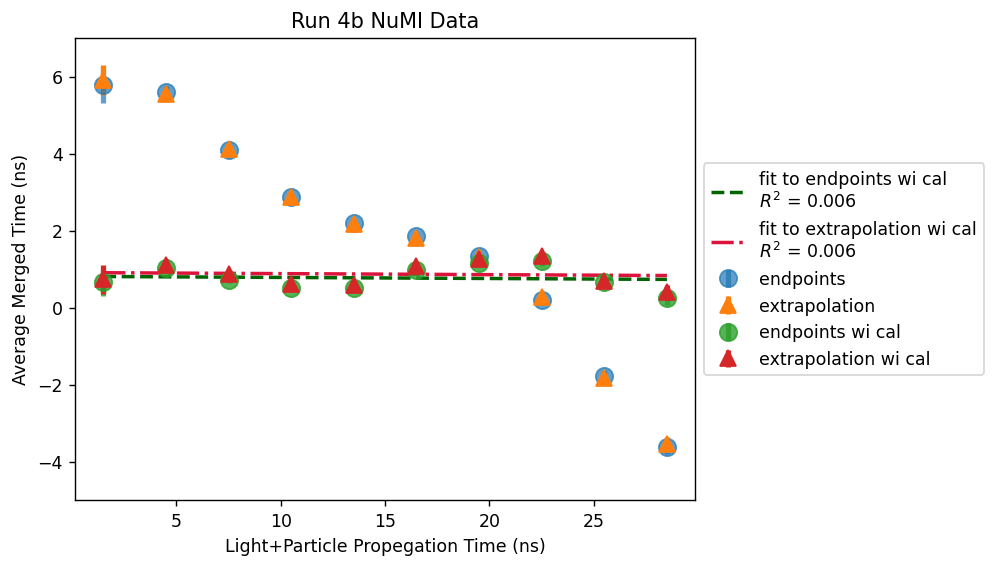

data nominal linear fit: m = -0.027   b = 0.7451
9.006645760813917 0.317
data no cor linear fit: m = -0.0219   b = 1.1971
0.5118702626832156 0.894
data wi cor linear fit: m = -0.0011   b = 0.0082
964.6034774671876 0.001
data linear no cor linear fit: m = -0.0218   b = 1.1532
1.0886175126772406 0.889
data linear wi cor linear fit: m = -0.0007   b = 0.1078
84.16007606271891 0.0
data spacepoints wi cor linear fit: m = -0.0014   b = 0.0509
106.49639528533005 0.001


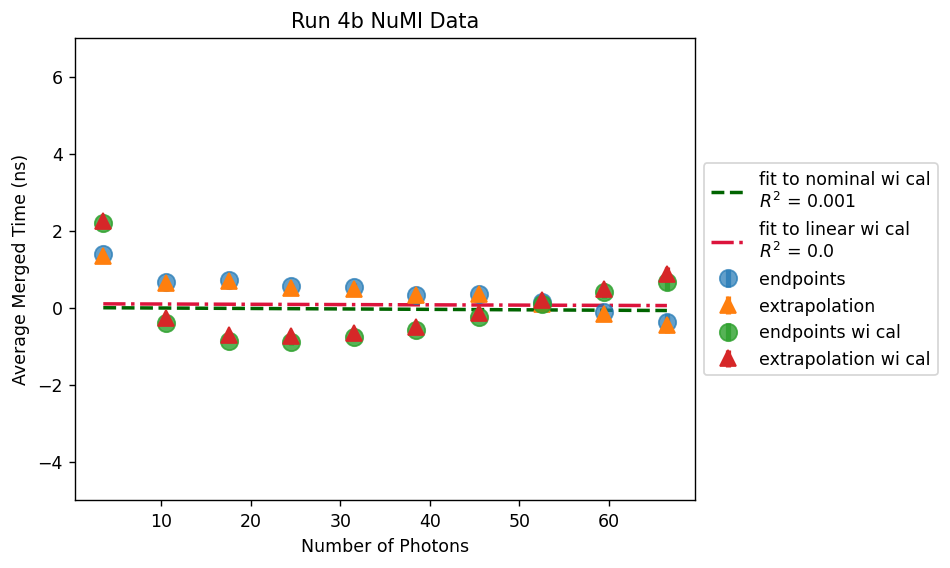

data nominal linear fit: m = -0.0017   b = 1.4529
0.7714507129294969 0.263
data no cor linear fit: m = -0.0212   b = 5.5404
-16.8747448613232 0.951
data wi cor linear fit: m = 0.0004   b = 0.7475
0.8371828353297115 0.027
data linear wi cor linear fit: m = -0.0219   b = 5.6583
-5.543012257858269 0.951
data linear wi cor linear fit: m = 0.0003   b = 0.8516
0.8156828648569856 0.015
data spacepoints wi cor linear fit: m = 0.0005   b = 0.7726
0.727670205844462 0.033


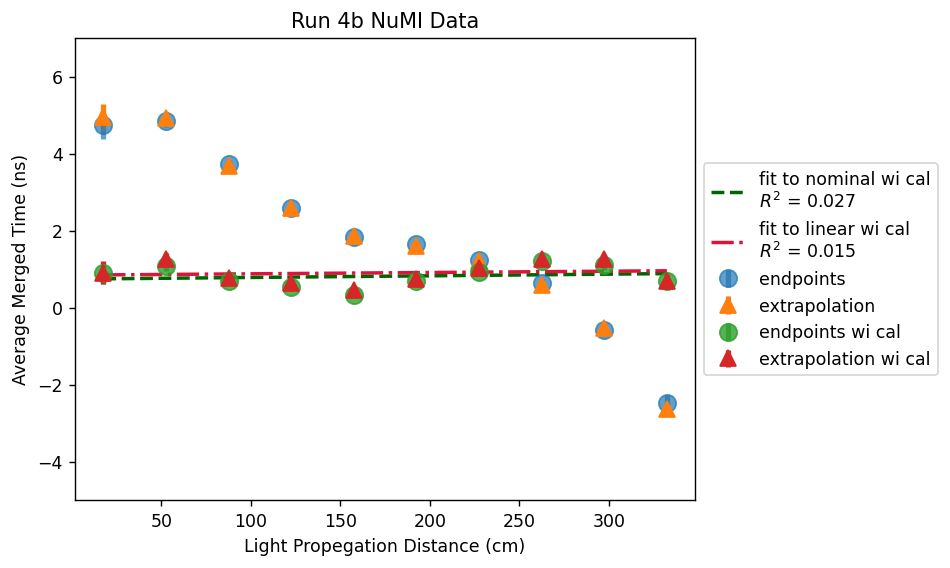

data nominal linear fit: m = -0.0049   b = 0.7031
-4.135378203376091 0.561
data no cor linear fit: m = -0.0211   b = 1.6835
8.1692279548207 0.927
data wi cor linear fit: m = -0.0037   b = 0.5207
-4.160429331835303 0.505
data linear no cor linear fit: m = -0.0204   b = 1.2244
-4.687120874523109 0.905
data linear wi cor linear fit: m = -0.0018   b = 0.1926
-0.9472650339032446 0.112
data spacepoints wi cor linear fit: m = -0.0019   b = 0.155
34.170776063996904 0.148


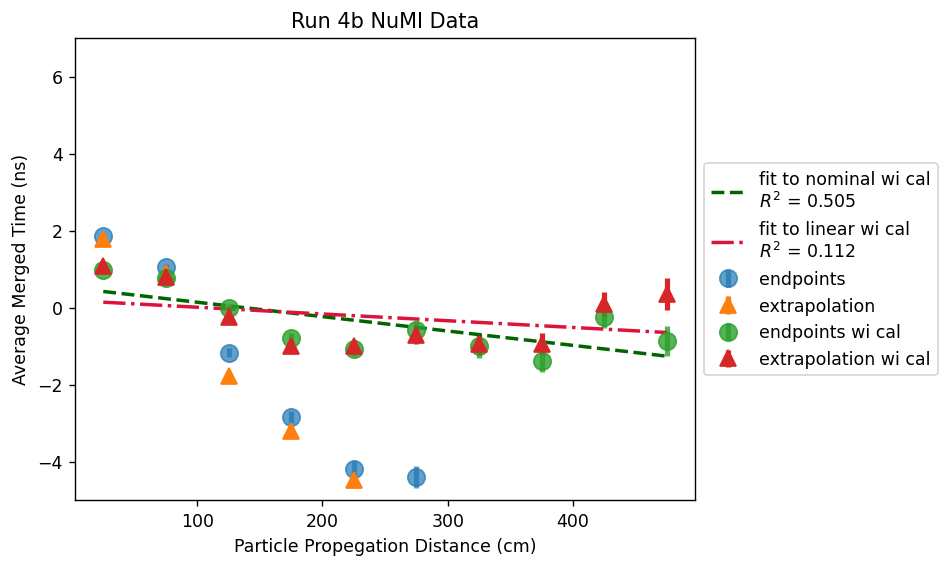

data nominal linear fit: m = -0.0023   b = 1.584
3.7494261755553615 0.558
data no cor linear fit: m = -0.0008   b = 1.0017
6.956974791989863 0.166
data wi cor linear fit: m = 0.0008   b = 0.5281
0.4996841533398282 0.496
data linear no cor linear fit: m = -0.0004   b = 0.8243
6.658508516227878 0.044
data linear wi cor linear fit: m = 0.0011   b = 0.546
0.6033315960339465 0.58
data spacepoints wi cor linear fit: m = 0.0009   b = 0.5249
0.4963168338253616 0.567


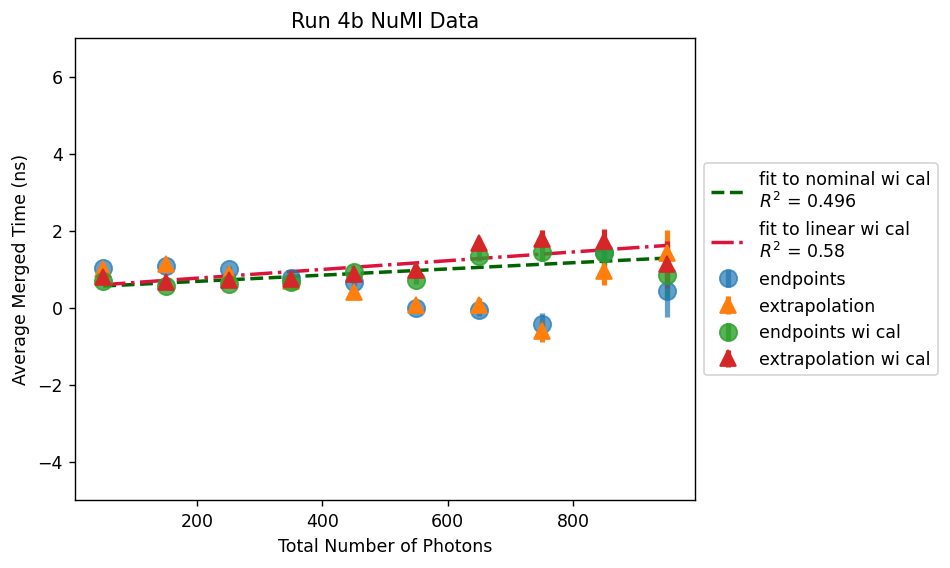

data nominal linear fit: m = -0.0052   b = 1.5395
0.3947435205283887 0.846
data no cor linear fit: m = -0.0075   b = 1.779
3.736866882406377 0.896
data wi cor linear fit: m = 0.0002   b = 0.663
0.4180472123598629 0.005
data linear no cor linear fit: m = -0.0074   b = 1.7271
-0.5907333036829349 0.923
data linear wi cor linear fit: m = 0.0005   b = 0.7201
0.27188819779689744 0.066
data spacepoints wi cor linear fit: m = 0.0004   b = 0.6622
0.30641050248481333 0.033


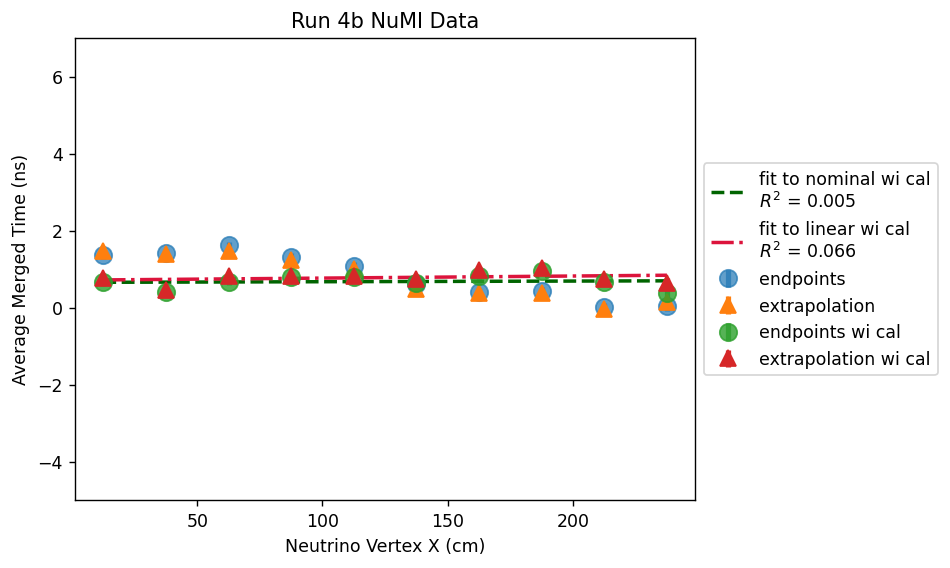

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1946024843.py:1709: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df["merge_times"] = merge_times
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1946024843.py:1710: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  temp_df["merge_times_nocor"] = merge_times_nocor
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/1946024843.py:1710: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

data nominal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779
data no cal: Triple Gaussian      mean: -0.1217   std: 3.2197   C: 276.113
38.01962704650277
data no cal: Triple Gaussian      mean: -0.4556   std: 2.9565   C: 249.6868
25.350434218071577
data linear vp no cal: Triple Gaussian      mean: -0.2238   std: 3.1028   C: 278.4874
42.531117346746996
data linear vp wi cal: Triple Gaussian      mean: -0.2129   std: 2.9176   C: 250.6629
39.62228901209407
data spacepoints vp wi cal: Triple Gaussian      mean: -0.3584   std: 3.001   C: 246.5452
38.122315769658584


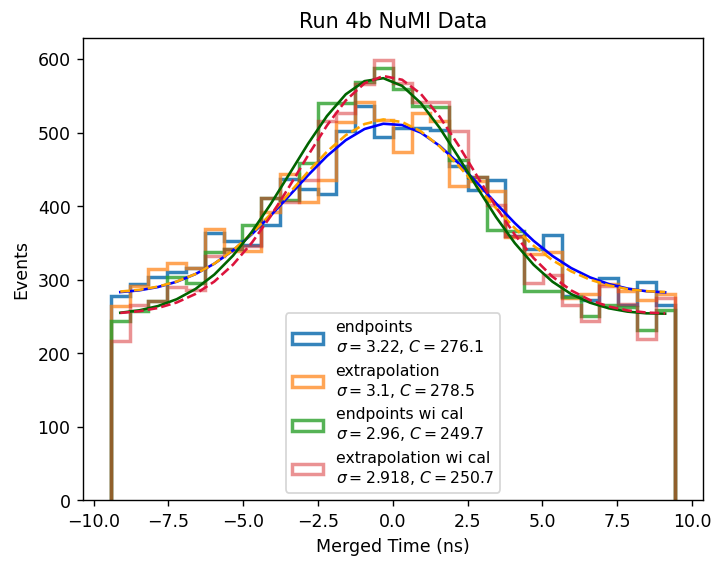

data nominal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data no cal: Triple Gaussian      mean: -0.1685   std: 3.5262   C: 93.3192
31.199254124247094
data wi cal: Triple Gaussian      mean: -0.1709   std: 2.8886   C: 87.4257
20.220334867602894
data linear vp no cal: Triple Gaussian      mean: -0.2806   std: 3.4042   C: 93.9276
24.3775725183457
data linear vp wi cal: Triple Gaussian      mean: 0.0834   std: 2.8303   C: 88.481
26.107717527152044
data spacepoints vp wi cal: Triple Gaussian      mean: -0.0565   std: 2.895   C: 87.1617
30.05956606597852


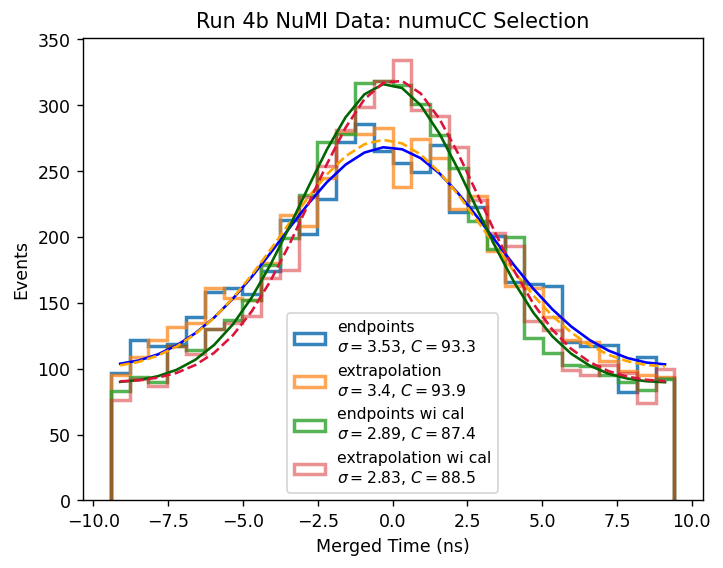

In [93]:

same_y = True
use_overflow=False

const_propt = []
const_propt_full = []
const_propt_ssmsp = []
const_Np = []
const_Np_full = []
const_Np_ssmsp = []
const_xvtx = []
const_xvtx_full = []
const_xvtx_ssmsp = []

m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_DL_i_ssmsp = 0
b_DL_i_ssmsp = 0
global_cor_ssmsp = 0
const_propt_ssmsp.append(m_propt_i_ssmsp)
const_Np_ssmsp.append(m_Np_i_ssmsp)
const_xvtx_ssmsp.append(m_xvtx_i_ssmsp)
#it 1
m_propt_i_ssmsp = -0.3199
b_propt_i_ssmsp = 6.0556
m_Np_i_ssmsp = -0.0191
b_Np_i_ssmsp = 0.5295
m_xvtx_i_ssmsp = -0.0084
b_xvtx_i_ssmsp = 1.2429
global_cor_ssmsp = 1.1
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 2
m_propt_i_ssmsp += -0.1147
b_propt_i_ssmsp += 2.7269
m_Np_i_ssmsp += -0.0434
b_Np_i_ssmsp += 0.9085
m_xvtx_i_ssmsp += -0.0041
b_xvtx_i_ssmsp += 1.0417
global_cor_ssmsp = 2.5
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 3
m_propt_i_ssmsp += -0.0699
b_propt_i_ssmsp += 1.9546
m_Np_i_ssmsp += -0.0221
b_Np_i_ssmsp += 0.4549
m_xvtx_i_ssmsp += -0.0024 
b_xvtx_i_ssmsp += 0.8808
global_cor_ssmsp = 3.9
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 4
m_propt_i_ssmsp += -0.0327 
b_propt_i_ssmsp += 1.305
m_Np_i_ssmsp += -0.0124
b_Np_i_ssmsp += 0.2517
m_xvtx_i_ssmsp += -0.0007
b_xvtx_i_ssmsp += 0.702
global_cor_ssmsp = 5.3
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 5
m_propt_i_ssmsp += -0.0236
b_propt_i_ssmsp += 1.1805
m_Np_i_ssmsp += -0.0067
b_Np_i_ssmsp += 0.1525
m_xvtx_i_ssmsp += -0.0002
b_xvtx_i_ssmsp += 0.6841
global_cor_ssmsp = 6.8
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 6
m_propt_i_ssmsp += -0.0111
b_propt_i_ssmsp += 0.9675
m_Np_i_ssmsp += -0.0043
b_Np_i_ssmsp += 0.1055
m_xvtx_i_ssmsp += 0.0003
b_xvtx_i_ssmsp += 0.6437
global_cor_ssmsp = 8.2
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 7
m_propt_i_ssmsp += -0.0107
b_propt_i_ssmsp += 0.9292
m_Np_i_ssmsp += -0.0016
b_Np_i_ssmsp += 0.0075
m_xvtx_i_ssmsp += 0
b_xvtx_i_ssmsp += 0.637
global_cor_ssmsp = 9.6
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)
#it 8
m_propt_i_ssmsp += -0.0069
b_propt_i_ssmsp += 0.8887
m_Np_i_ssmsp += -0.0013
b_Np_i_ssmsp += 0.0164
m_xvtx_i_ssmsp += 0
b_xvtx_i_ssmsp += 0.6653
global_cor_ssmsp = 11.1
const_propt_ssmsp.append(-m_propt_i_ssmsp)
const_Np_ssmsp.append(-m_Np_i_ssmsp)
const_xvtx_ssmsp.append(-m_xvtx_i_ssmsp)


m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_DL_i_fullDp = 0
b_DL_i_fullDp = 0
global_cor_fullDp = 0
const_propt_full.append(m_propt_i_fullDp)
const_Np_full.append(m_Np_i_fullDp)
const_xvtx_full.append(m_xvtx_i_fullDp)
#it 1
m_propt_i_fullDp = -0.323
b_propt_i_fullDp = 6.1711
m_Np_i_fullDp = -0.0196
b_Np_i_fullDp = 0.599
m_xvtx_i_fullDp = -0.0085
b_xvtx_i_fullDp = 1.317
global_cor_fullDp = 1.1
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 2
m_propt_i_fullDp += -0.1113
b_propt_i_fullDp += 2.6173
m_Np_i_fullDp += -0.0441
b_Np_i_fullDp += 0.89
m_xvtx_i_fullDp += -0.004
b_xvtx_i_fullDp += 0.9982
global_cor_fullDp = 2.5
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 3
m_propt_i_fullDp += -0.0727
b_propt_i_fullDp += 2.0216
m_Np_i_fullDp += -0.0206
b_Np_i_fullDp += 0.4422
m_xvtx_i_fullDp += -0.0024
b_xvtx_i_fullDp += 0.8967
global_cor_fullDp = 3.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 4
m_propt_i_fullDp += -0.0344
b_propt_i_fullDp += 1.3615
m_Np_i_fullDp += -0.0131
b_Np_i_fullDp += 0.2915
m_xvtx_i_fullDp += -0.0008
b_xvtx_i_fullDp += 0.7476
global_cor_fullDp = 5.4
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 5
m_propt_i_fullDp += -0.0245
b_propt_i_fullDp += 1.2028
m_Np_i_fullDp += -0.0071
b_Np_i_fullDp += 0.1642
m_xvtx_i_fullDp += -0.0003
b_xvtx_i_fullDp += 0.6968
global_cor_fullDp = 6.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 6
m_propt_i_fullDp += -0.0119
b_propt_i_fullDp += 1.0088
m_Np_i_fullDp += -0.0041
b_Np_i_fullDp += 0.1209
m_xvtx_i_fullDp += 0.0001
b_xvtx_i_fullDp += 0.6956
global_cor_fullDp = 8.4
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 7
m_propt_i_fullDp += -0.0077 
b_propt_i_fullDp += 0.904
m_Np_i_fullDp += -0.0023
b_Np_i_fullDp += 0.0466
m_xvtx_i_fullDp += 0.0002
b_xvtx_i_fullDp += 0.6483
global_cor_fullDp = 9.9
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)
#it 8
m_propt_i_fullDp += -0.0053 
b_propt_i_fullDp += 0.8852
m_Np_i_fullDp += -0.0012
b_Np_i_fullDp += 0.0389
m_xvtx_i_fullDp += 0.0001
b_xvtx_i_fullDp += 0.6857
global_cor_fullDp = 11.6
const_propt_full.append(-m_propt_i_fullDp)
const_Np_full.append(-m_Np_i_fullDp)
const_xvtx_full.append(-m_xvtx_i_fullDp)


m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DLi = 0   
b_DL_i = 0
global_cor = -2.2

#it1
m_propt_i = -0.3227
b_propt_i = 6.1476
m_Np_i = -0.0203
b_Np_i = 0.6463
m_xvtx_i = -0.0081
b_xvtx_i = 1.3101
global_cor = 1.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it2
m_propt_i += -0.114
b_propt_i += 2.6835
m_Np_i += -0.0439
b_Np_i += 0.9104
m_xvtx_i += -0.004
b_xvtx_i += 1.0218
global_cor = 2.5
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it 3
m_propt_i += -0.0767 
b_propt_i += 2.065
m_Np_i += -0.0203
b_Np_i += 0.423
m_xvtx_i += -0.0024
b_xvtx_i += 0.8883
global_cor = 3.9
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it4
m_propt_i += -0.0333
b_propt_i += 1.3345
m_Np_i +=-0.0133 
b_Np_i += 0.2852
m_xvtx_i += -0.0009
b_xvtx_i += 0.7674
global_cor = 5.5 
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it5
m_propt_i += -0.0211
b_propt_i += 1.1939
m_Np_i +=  -0.0076
b_Np_i += 0.2226
m_xvtx_i += -0.0001
b_xvtx_i += 0.739
global_cor = 7.1
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it6
m_propt_i += -0.015
b_propt_i += 1.0668
m_Np_i += -0.0043
b_Np_i += 0.1219
m_xvtx_i += 0.0001
b_xvtx_i += 0.7046
global_cor = 8.7
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it7
m_propt_i += -0.0098 
b_propt_i += 0.987
m_Np_i += -0.0022
b_Np_i += 0.0827
m_xvtx_i += 0.0001
b_xvtx_i += 0.7097
global_cor = 10.3
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)
#it8
m_propt_i += -0.0052
b_propt_i += 0.9044
m_Np_i += -0.0012
b_Np_i += 0.0576
m_xvtx_i += 0.0001 
b_xvtx_i += 0.7159
global_cor = 11.8
const_propt.append(-m_propt_i)
const_Np.append(-m_Np_i)
const_xvtx.append(-m_xvtx_i)


n_pmt_propt_bins = 10
n_pmt_propt_min = 0
n_pmt_propt_max = 30

n_pmt_Nphoton_bins = 10
n_pmt_Nphoton_min = 0
n_pmt_Nphoton_max = 70

n_pmt_DL_bins = 10
n_pmt_DL_min = 0
n_pmt_DL_max = 350

n_pmt_DP_bins = 10
n_pmt_DP_min = 0
n_pmt_DP_max = 500

n_pmt_PhT_bins = 10
n_pmt_PhT_min = 0
n_pmt_PhT_max = 1000

n_pmt_xvtx_bins = 10
n_pmt_xvtx_min = 0
n_pmt_xvtx_max = 250

print("Query the df")
temp_df = df.query("evtTimeNS>0")

reco_nuvtxX_list =  temp_df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  temp_df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = temp_df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = temp_df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = temp_df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = temp_df["PMT_Amp"].to_numpy()

TT3_array_list = temp_df["TT3_array"].to_numpy()
TT3_array_nocor_list = temp_df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = temp_df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = temp_df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = temp_df["DLh_all"].to_numpy()
DP_all = temp_df["DPh_all"].to_numpy()
DP_full_all = temp_df["DPh_full_all"].to_numpy()
DL_full_all = temp_df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = temp_df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = temp_df["DPh_ssmsp_all"].to_numpy()

PhT_all = temp_df["Ph_Tot"].to_numpy()

file = temp_df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_fullDp = []
TT3_array_fullDp_list = []
merge_times_fullDp = []
merge_match_TT3_array_fullDp = []

ns_time_nocor = []
merge_times_nocor = []
merge_match_TT3_array_nocor = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
            
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i)  +global_cor)
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) +global_cor_fullDp)
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) +global_cor_ssmsp)

    ns_time.append(np.median(TT3_array))
    ns_time_nocor.append(np.median(TT3_array_nocor))
    #TT3_array_nocor_list.append(TT3_array_nocor)
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp.append(np.median(TT3_array_fullDp_nocor))
    TT3_array_fullDp_list.append(TT3_array_fullDp_nocor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_fullDp = ns_time_fullDp[event]-Shift+gap*0.5-0.8
    TT_merged_fullDp=-9999
    
    if TThelp_fullDp>=0:
        TT_merged_fullDp=(TThelp_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        
    merge_times_fullDp.append(TT_merged_fullDp)
    merge_match_TT3_array_fullDp.append([])

    TThelp_nocor = ns_time_nocor[event]-Shift+gap*0.5-0.8
    TT_merged_nocor=-9999
    
    if TThelp_nocor>=0:
        TT_merged_nocor=(TThelp_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        
    merge_times_nocor.append(TT_merged_nocor)
    merge_match_TT3_array_nocor.append([])
    
    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)

        TThelp_array_fullDp = TT3_array_fullDp_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp=-9999
        #shift according to the events time
        if TThelp_fullDp>=0:
            TT_array_merged_match_fullDp=(TThelp_array_fullDp-(int((TThelp_fullDp)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp[event].append(TT_array_merged_match_fullDp)

        TThelp_array_nocor = TT3_array_nocor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_nocor=-9999
        #shift according to the events time
        if TThelp_nocor>=0:
            TT_array_merged_match_nocor=(TThelp_array_nocor-(int((TThelp_nocor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_nocor[event].append(TT_array_merged_match_nocor)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
    

#######################

print("Setting Bins")
#Propegation time bins
pmt_propt_bins = np.linspace(n_pmt_propt_min,n_pmt_propt_max,n_pmt_propt_bins+1)
pmt_propt_all_times = []
pmt_propt_avg_times = []
pmt_propt_avg_times_errors = []
pmt_propt_all_times_fullDp = []
pmt_propt_avg_times_fullDp = []
pmt_propt_avg_times_fullDp_errors = []
pmt_propt_all_times_nocor = []
pmt_propt_avg_times_nocor = []
pmt_propt_avg_times_nocor_errors = []
pmt_propt_all_times_recor = []
pmt_propt_avg_times_recor = []
pmt_propt_avg_times_recor_errors = []
pmt_propt_all_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor = []
pmt_propt_avg_times_fullDp_recor_errors = []
pmt_propt_all_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor = []
pmt_propt_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_propt_bins): 
    pmt_propt_all_times.append([])
    pmt_propt_avg_times.append(0)
    pmt_propt_avg_times_errors.append(0)
    pmt_propt_all_times_fullDp.append([])
    pmt_propt_avg_times_fullDp.append(0)
    pmt_propt_avg_times_fullDp_errors.append(0)
    pmt_propt_all_times_nocor.append([])
    pmt_propt_avg_times_nocor.append(0)
    pmt_propt_avg_times_nocor_errors.append(0)
    pmt_propt_all_times_recor.append([])
    pmt_propt_avg_times_recor.append(0)
    pmt_propt_avg_times_recor_errors.append(0)
    pmt_propt_all_times_fullDp_recor.append([])
    pmt_propt_avg_times_fullDp_recor.append(0)
    pmt_propt_avg_times_fullDp_recor_errors.append(0)
    pmt_propt_all_times_ssmsp_recor.append([])
    pmt_propt_avg_times_ssmsp_recor.append(0)
    pmt_propt_avg_times_ssmsp_recor_errors.append(0)
    
#Number of photon bins
pmt_Nphoton_bins = np.linspace(n_pmt_Nphoton_min,n_pmt_Nphoton_max,n_pmt_Nphoton_bins+1)
pmt_Nphoton_all_times = []
pmt_Nphoton_avg_times = []
pmt_Nphoton_avg_times_errors = []
pmt_Nphoton_all_times_nocor = []
pmt_Nphoton_avg_times_nocor = []
pmt_Nphoton_avg_times_nocor_errors = []
pmt_Nphoton_all_times_recor = []
pmt_Nphoton_avg_times_recor = []
pmt_Nphoton_avg_times_recor_errors = []
pmt_Nphoton_all_times_fullDp = []
pmt_Nphoton_avg_times_fullDp = []
pmt_Nphoton_avg_times_fullDp_errors = []
pmt_Nphoton_all_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor = []
pmt_Nphoton_avg_times_fullDp_recor_errors = []
pmt_Nphoton_all_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor = []
pmt_Nphoton_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_all_times.append([])
    pmt_Nphoton_avg_times.append(0)
    pmt_Nphoton_avg_times_errors.append(0)
    pmt_Nphoton_all_times_nocor.append([])
    pmt_Nphoton_avg_times_nocor.append(0)
    pmt_Nphoton_avg_times_nocor_errors.append(0)
    pmt_Nphoton_all_times_recor.append([])
    pmt_Nphoton_avg_times_recor.append(0)
    pmt_Nphoton_avg_times_recor_errors.append(0)
    pmt_Nphoton_all_times_fullDp.append([])
    pmt_Nphoton_avg_times_fullDp.append(0)
    pmt_Nphoton_avg_times_fullDp_errors.append(0)
    pmt_Nphoton_all_times_fullDp_recor.append([])
    pmt_Nphoton_avg_times_fullDp_recor.append(0)
    pmt_Nphoton_avg_times_fullDp_recor_errors.append(0)
    pmt_Nphoton_all_times_ssmsp_recor.append([])
    pmt_Nphoton_avg_times_ssmsp_recor.append(0)
    pmt_Nphoton_avg_times_ssmsp_recor_errors.append(0)
    
#Light propegation distance bins
pmt_DL_bins = np.linspace(n_pmt_DL_min,n_pmt_DL_max,n_pmt_DL_bins+1)
pmt_DL_all_times = []
pmt_DL_avg_times = []
pmt_DL_avg_times_errors = []
pmt_DL_all_times_nocor = []
pmt_DL_avg_times_nocor = []
pmt_DL_avg_times_nocor_errors = []
pmt_DL_all_times_recor = []
pmt_DL_avg_times_recor = []
pmt_DL_avg_times_recor_errors = []
pmt_DL_all_times_fullDp = []
pmt_DL_avg_times_fullDp = []
pmt_DL_avg_times_fullDp_errors = []
pmt_DL_all_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor = []
pmt_DL_avg_times_fullDp_recor_errors = []
pmt_DL_all_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor = []
pmt_DL_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DL_bins): 
    pmt_DL_all_times.append([])
    pmt_DL_avg_times.append(0)
    pmt_DL_avg_times_errors.append(0)
    pmt_DL_all_times_nocor.append([])
    pmt_DL_avg_times_nocor.append(0)
    pmt_DL_avg_times_nocor_errors.append(0)
    pmt_DL_all_times_recor.append([])
    pmt_DL_avg_times_recor.append(0)
    pmt_DL_avg_times_recor_errors.append(0)
    pmt_DL_all_times_fullDp.append([])
    pmt_DL_avg_times_fullDp.append(0)
    pmt_DL_avg_times_fullDp_errors.append(0)
    pmt_DL_all_times_fullDp_recor.append([])
    pmt_DL_avg_times_fullDp_recor.append(0)
    pmt_DL_avg_times_fullDp_recor_errors.append(0) 
    pmt_DL_all_times_ssmsp_recor.append([])
    pmt_DL_avg_times_ssmsp_recor.append(0)
    pmt_DL_avg_times_ssmsp_recor_errors.append(0) 
    
#Particle propegation bins
pmt_DP_bins = np.linspace(n_pmt_DP_min,n_pmt_DP_max,n_pmt_DP_bins+1)
pmt_DP_all_times= []
pmt_DP_avg_times = []
pmt_DP_avg_times_errors = []
pmt_DP_all_times_nocor = []
pmt_DP_avg_times_nocor = []
pmt_DP_avg_times_nocor_errors = []
pmt_DP_all_times_recor = []
pmt_DP_avg_times_recor = []
pmt_DP_avg_times_recor_errors = []
pmt_DP_all_times_fullDp = []
pmt_DP_avg_times_fullDp = []
pmt_DP_avg_times_fullDp_errors = []
pmt_DP_all_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor = []
pmt_DP_avg_times_fullDp_recor_errors = []
pmt_DP_all_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor = []
pmt_DP_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_DP_bins): 
    pmt_DP_all_times.append([])
    pmt_DP_avg_times.append(0)
    pmt_DP_avg_times_errors.append(0)
    pmt_DP_all_times_nocor.append([])
    pmt_DP_avg_times_nocor.append(0)
    pmt_DP_avg_times_nocor_errors.append(0)
    pmt_DP_all_times_recor.append([])
    pmt_DP_avg_times_recor.append(0)
    pmt_DP_avg_times_recor_errors.append(0)
    pmt_DP_all_times_fullDp.append([])
    pmt_DP_avg_times_fullDp.append(0)
    pmt_DP_avg_times_fullDp_errors.append(0) 
    pmt_DP_all_times_fullDp_recor.append([])
    pmt_DP_avg_times_fullDp_recor.append(0)
    pmt_DP_avg_times_fullDp_recor_errors.append(0) 
    pmt_DP_all_times_ssmsp_recor.append([])
    pmt_DP_avg_times_ssmsp_recor.append(0)
    pmt_DP_avg_times_ssmsp_recor_errors.append(0)
    
#Total Photon bins
pmt_PhT_bins = np.linspace(n_pmt_PhT_min,n_pmt_PhT_max,n_pmt_PhT_bins+1)
pmt_PhT_all_times = []
pmt_PhT_avg_times = []
pmt_PhT_avg_times_errors = []
pmt_PhT_all_times_nocor = []
pmt_PhT_avg_times_nocor = []
pmt_PhT_avg_times_nocor_errors = []
pmt_PhT_all_times_recor = []
pmt_PhT_avg_times_recor = []
pmt_PhT_avg_times_recor_errors = []
pmt_PhT_all_times_fullDp = []
pmt_PhT_avg_times_fullDp = []
pmt_PhT_avg_times_fullDp_errors = []
pmt_PhT_all_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor = []
pmt_PhT_avg_times_fullDp_recor_errors = []
pmt_PhT_all_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor = []
pmt_PhT_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_all_times.append([])
    pmt_PhT_avg_times.append(0)
    pmt_PhT_avg_times_errors.append(0)
    pmt_PhT_all_times_nocor.append([])
    pmt_PhT_avg_times_nocor.append(0)
    pmt_PhT_avg_times_nocor_errors.append(0)
    pmt_PhT_all_times_recor.append([])
    pmt_PhT_avg_times_recor.append(0)
    pmt_PhT_avg_times_recor_errors.append(0)
    pmt_PhT_all_times_fullDp.append([])
    pmt_PhT_avg_times_fullDp.append(0)
    pmt_PhT_avg_times_fullDp_errors.append(0) 
    pmt_PhT_all_times_fullDp_recor.append([])
    pmt_PhT_avg_times_fullDp_recor.append(0)
    pmt_PhT_avg_times_fullDp_recor_errors.append(0) 
    pmt_PhT_all_times_ssmsp_recor.append([])
    pmt_PhT_avg_times_ssmsp_recor.append(0)
    pmt_PhT_avg_times_ssmsp_recor_errors.append(0) 
    
#X vertex bins
pmt_xvtx_bins = np.linspace(n_pmt_xvtx_min,n_pmt_xvtx_max,n_pmt_xvtx_bins+1)
pmt_xvtx_all_times = []
pmt_xvtx_avg_times = []
pmt_xvtx_avg_times_errors = []
pmt_xvtx_all_times_nocor = []
pmt_xvtx_avg_times_nocor = []
pmt_xvtx_avg_times_nocor_errors = []
pmt_xvtx_all_times_recor = []
pmt_xvtx_avg_times_recor = []
pmt_xvtx_avg_times_recor_errors = []
pmt_xvtx_all_times_fullDp = []
pmt_xvtx_avg_times_fullDp = []
pmt_xvtx_avg_times_fullDp_errors = []
pmt_xvtx_all_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor = []
pmt_xvtx_avg_times_fullDp_recor_errors = []
pmt_xvtx_all_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor = []
pmt_xvtx_avg_times_ssmsp_recor_errors = []
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_all_times.append([])
    pmt_xvtx_avg_times.append(0)
    pmt_xvtx_avg_times_errors.append(0)
    pmt_xvtx_all_times_nocor.append([])
    pmt_xvtx_avg_times_nocor.append(0)
    pmt_xvtx_avg_times_nocor_errors.append(0)
    pmt_xvtx_all_times_recor.append([])
    pmt_xvtx_avg_times_recor.append(0)
    pmt_xvtx_avg_times_recor_errors.append(0)
    pmt_xvtx_all_times_fullDp.append([])
    pmt_xvtx_avg_times_fullDp.append(0)
    pmt_xvtx_avg_times_fullDp_errors.append(0) 
    pmt_xvtx_all_times_fullDp_recor.append([])
    pmt_xvtx_avg_times_fullDp_recor.append(0)
    pmt_xvtx_avg_times_fullDp_recor_errors.append(0) 
    pmt_xvtx_all_times_ssmsp_recor.append([])
    pmt_xvtx_avg_times_ssmsp_recor.append(0)
    pmt_xvtx_avg_times_ssmsp_recor_errors.append(0) 

print("Filling nominal with corrections histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_propt_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_Nphoton_all_times[ibin].append(merge_match_TT3_array[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DL_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_DP_all_times[ibin].append(merge_match_TT3_array[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_PhT_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array[event][pmt]>-100 and merge_match_TT3_array[event][pmt]<100): pmt_xvtx_all_times[ibin].append(merge_match_TT3_array[event][pmt])
            break 

print("Setting nominal with corrections averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times[i] = statistics.mean(pmt_propt_all_times[i])     
    pmt_propt_avg_times_errors[i] = (statistics.stdev(pmt_propt_all_times[i])/np.sqrt(len(pmt_propt_all_times[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times[i] = statistics.mean(pmt_Nphoton_all_times[i])     
    pmt_Nphoton_avg_times_errors[i] = (statistics.stdev(pmt_Nphoton_all_times[i])/np.sqrt(len(pmt_Nphoton_all_times[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times[i] = statistics.mean(pmt_DL_all_times[i])     
    pmt_DL_avg_times_errors[i] = (statistics.stdev(pmt_DL_all_times[i])/np.sqrt(len(pmt_DL_all_times[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times[i] = statistics.mean(pmt_DP_all_times[i])     
    pmt_DP_avg_times_errors[i] = (statistics.stdev(pmt_DP_all_times[i])/np.sqrt(len(pmt_DP_all_times[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times[i] = statistics.mean(pmt_PhT_all_times[i])     
    pmt_PhT_avg_times_errors[i] = (statistics.stdev(pmt_PhT_all_times[i])/np.sqrt(len(pmt_PhT_all_times[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times[i] = statistics.mean(pmt_xvtx_all_times[i])     
    pmt_xvtx_avg_times_errors[i] = (statistics.stdev(pmt_xvtx_all_times[i])/np.sqrt(len(pmt_xvtx_all_times[i])))

print("Filling nocor nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_propt_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_Nphoton_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DL_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_DP_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_PhT_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_nocor[event][pmt]>-100 and merge_match_TT3_array_nocor[event][pmt]<100): pmt_xvtx_all_times_nocor[ibin].append(merge_match_TT3_array_nocor[event][pmt])
            break 

print("Setting nocor nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_nocor[i] = statistics.mean(pmt_propt_all_times_nocor[i])     
    pmt_propt_avg_times_nocor_errors[i] = (statistics.stdev(pmt_propt_all_times_nocor[i])/np.sqrt(len(pmt_propt_all_times_nocor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_nocor[i] = statistics.mean(pmt_Nphoton_all_times_nocor[i])     
    pmt_Nphoton_avg_times_nocor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_nocor[i])/np.sqrt(len(pmt_Nphoton_all_times_nocor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_nocor[i] = statistics.mean(pmt_DL_all_times_nocor[i])     
    pmt_DL_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DL_all_times_nocor[i])/np.sqrt(len(pmt_DL_all_times_nocor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_nocor[i] = statistics.mean(pmt_DP_all_times_nocor[i])     
    pmt_DP_avg_times_nocor_errors[i] = (statistics.stdev(pmt_DP_all_times_nocor[i])/np.sqrt(len(pmt_DP_all_times_nocor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_nocor[i] = statistics.mean(pmt_PhT_all_times_nocor[i])     
    pmt_PhT_avg_times_nocor_errors[i] = (statistics.stdev(pmt_PhT_all_times_nocor[i])/np.sqrt(len(pmt_PhT_all_times_nocor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_nocor[i] = statistics.mean(pmt_xvtx_all_times_nocor[i])     
    pmt_xvtx_avg_times_nocor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_nocor[i])/np.sqrt(len(pmt_xvtx_all_times_nocor[i])))




print("Filling nominal histograms")    
for event in range(len(PMT_TimeProp_list)):
    PMT_TimeProp = PMT_TimeProp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_all[event]
    DP = DP_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp = np.clip(PMT_TimeProp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_propt_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_Nphoton_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DL_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_DP_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_PhT_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp)):
                if(merge_match_TT3_array_recor[event][pmt]>-100 and merge_match_TT3_array_recor[event][pmt]<100): pmt_xvtx_all_times_recor[ibin].append(merge_match_TT3_array_recor[event][pmt])
            break 

print("Setting nominal averages")            
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_recor[i] = statistics.mean(pmt_propt_all_times_recor[i])     
    pmt_propt_avg_times_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_recor[i])/np.sqrt(len(pmt_propt_all_times_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_recor[i] = statistics.mean(pmt_Nphoton_all_times_recor[i])     
    pmt_Nphoton_avg_times_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_recor[i] = statistics.mean(pmt_DL_all_times_recor[i])     
    pmt_DL_avg_times_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_recor[i])/np.sqrt(len(pmt_DL_all_times_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_recor[i] = statistics.mean(pmt_DP_all_times_recor[i])     
    pmt_DP_avg_times_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_recor[i])/np.sqrt(len(pmt_DP_all_times_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_recor[i] = statistics.mean(pmt_PhT_all_times_recor[i])     
    pmt_PhT_avg_times_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_recor[i])/np.sqrt(len(pmt_PhT_all_times_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_recor[i] = statistics.mean(pmt_xvtx_all_times_recor[i])     
    pmt_xvtx_avg_times_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_recor[i])/np.sqrt(len(pmt_xvtx_all_times_recor[i])))




print("Filling nocor linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_propt_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_Nphoton_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DL_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_DP_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_PhT_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp[event][pmt]>-100 and merge_match_TT3_array_fullDp[event][pmt]<100): pmt_xvtx_all_times_fullDp[ibin].append(merge_match_TT3_array_fullDp[event][pmt])
            break

print("Setting nocor linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp[i] = statistics.mean(pmt_propt_all_times_fullDp[i])     
    pmt_propt_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp[i])/np.sqrt(len(pmt_propt_all_times_fullDp[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp[i] = statistics.mean(pmt_Nphoton_all_times_fullDp[i])     
    pmt_Nphoton_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp[i] = statistics.mean(pmt_DL_all_times_fullDp[i])     
    pmt_DL_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp[i])/np.sqrt(len(pmt_DL_all_times_fullDp[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp[i] = statistics.mean(pmt_DP_all_times_fullDp[i])     
    pmt_DP_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp[i])/np.sqrt(len(pmt_DP_all_times_fullDp[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp[i] = statistics.mean(pmt_PhT_all_times_fullDp[i])     
    pmt_PhT_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp[i])/np.sqrt(len(pmt_PhT_all_times_fullDp[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp[i] = statistics.mean(pmt_xvtx_all_times_fullDp[i])     
    pmt_xvtx_avg_times_fullDp_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp[i])))



print("Filling linear histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_full_all[event]
    DP = DP_full_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_full_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_full_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_full_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX = reco_nuvtxX_list[event]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_propt_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_Nphoton_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DL_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_DP_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_PhT_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX>pmt_xvtx_bins[ibin] and reco_nuvtxX<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_fullDp_recor[event][pmt]>-100 and merge_match_TT3_array_fullDp_recor[event][pmt]<100): pmt_xvtx_all_times_fullDp_recor[ibin].append(merge_match_TT3_array_fullDp_recor[event][pmt])
            break

print("Setting linear averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_fullDp_recor[i] = statistics.mean(pmt_propt_all_times_fullDp_recor[i])     
    pmt_propt_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_fullDp_recor[i])/np.sqrt(len(pmt_propt_all_times_fullDp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_fullDp_recor[i] = statistics.mean(pmt_Nphoton_all_times_fullDp_recor[i])     
    pmt_Nphoton_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_fullDp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_fullDp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_fullDp_recor[i] = statistics.mean(pmt_DL_all_times_fullDp_recor[i])     
    pmt_DL_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DL_all_times_fullDp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_fullDp_recor[i] = statistics.mean(pmt_DP_all_times_fullDp_recor[i])     
    pmt_DP_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_fullDp_recor[i])/np.sqrt(len(pmt_DP_all_times_fullDp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_fullDp_recor[i] = statistics.mean(pmt_PhT_all_times_fullDp_recor[i])     
    pmt_PhT_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_fullDp_recor[i])/np.sqrt(len(pmt_PhT_all_times_fullDp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_fullDp_recor[i] = statistics.mean(pmt_xvtx_all_times_fullDp_recor[i])     
    pmt_xvtx_avg_times_fullDp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_fullDp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_fullDp_recor[i])))


print("Filling sapcepoints histograms")
for event in range(len(PMT_TimeProp_full_list)):
    PMT_TimeProp_full = PMT_TimeProp_ssmsp_list[event]
    PMT_Amp = PMT_Amp_list[event]
    DL = DL_ssmsp_all[event]
    DP = DP_ssmsp_all[event]
    PhT = PhT_all[event] 
    if use_overflow:
        PMT_TimeProp_full = np.clip(PMT_TimeProp_ssmsp_list[event],-999,n_pmt_propt_max)
        PMT_Amp = np.clip(PMT_Amp_list[event],-999,n_pmt_Nphoton_max)
        DL = np.clip(DL_ssmsp_all[event],-999,n_pmt_DL_max)
        DP = np.clip(DP_ssmsp_all[event],-999,n_pmt_DP_max)
        PhT = np.clip(PhT_all[event],-999,n_pmt_PhT_max) 
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]
    for pmt in range(len(PMT_TimeProp_full)):
        for ibin in range(n_pmt_propt_bins):
            if PMT_TimeProp_full[pmt]>pmt_propt_bins[ibin] and PMT_TimeProp_full[pmt]<=pmt_propt_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_propt_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_Nphoton_bins):
            if(PMT_Amp[pmt]>pmt_Nphoton_bins[ibin] and PMT_Amp[pmt]<=pmt_Nphoton_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_Nphoton_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt] )
                break
        for ibin in range(n_pmt_DL_bins):
            if DL[pmt]>pmt_DL_bins[ibin] and DL[pmt]<=pmt_DL_bins[ibin+1]: 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DL_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
        for ibin in range(n_pmt_DP_bins):
            if(DP[pmt]>pmt_DP_bins[ibin] and DP[pmt]<=pmt_DP_bins[ibin+1]): 
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_DP_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
                break
    for ibin in range(n_pmt_PhT_bins):
        if PhT>pmt_PhT_bins[ibin] and PhT<=pmt_PhT_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_PhT_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break       
    for ibin in range(n_pmt_xvtx_bins):
        if reco_nuvtxX_ssmsp>pmt_xvtx_bins[ibin] and reco_nuvtxX_ssmsp<=pmt_xvtx_bins[ibin+1]: 
            for pmt in range(len(PMT_TimeProp_full)):
                if(merge_match_TT3_array_ssmsp_recor[event][pmt]>-100 and merge_match_TT3_array_ssmsp_recor[event][pmt]<100): pmt_xvtx_all_times_ssmsp_recor[ibin].append(merge_match_TT3_array_ssmsp_recor[event][pmt])
            break

print("Setting spacepoints averages")
for i in range(n_pmt_propt_bins): 
    pmt_propt_avg_times_ssmsp_recor[i] = statistics.mean(pmt_propt_all_times_ssmsp_recor[i])     
    pmt_propt_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_propt_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_propt_all_times_ssmsp_recor[i])))
for i in range(n_pmt_Nphoton_bins): 
    pmt_Nphoton_avg_times_ssmsp_recor[i] = statistics.mean(pmt_Nphoton_all_times_ssmsp_recor[i])     
    pmt_Nphoton_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_Nphoton_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_Nphoton_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DL_bins): 
    pmt_DL_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DL_all_times_ssmsp_recor[i])     
    pmt_DL_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DL_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DL_all_times_ssmsp_recor[i])))
for i in range(n_pmt_DP_bins): 
    pmt_DP_avg_times_ssmsp_recor[i] = statistics.mean(pmt_DP_all_times_ssmsp_recor[i])     
    pmt_DP_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_DP_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_DP_all_times_ssmsp_recor[i])))
for i in range(n_pmt_PhT_bins): 
    pmt_PhT_avg_times_ssmsp_recor[i] = statistics.mean(pmt_PhT_all_times_ssmsp_recor[i])     
    pmt_PhT_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_PhT_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_PhT_all_times_ssmsp_recor[i])))
for i in range(n_pmt_xvtx_bins): 
    pmt_xvtx_avg_times_ssmsp_recor[i] = statistics.mean(pmt_xvtx_all_times_ssmsp_recor[i])     
    pmt_xvtx_avg_times_ssmsp_recor_errors[i] = (statistics.stdev(pmt_xvtx_all_times_ssmsp_recor[i])/np.sqrt(len(pmt_xvtx_all_times_ssmsp_recor[i])))

############################################################################################



plot_title = "Run 4b NuMI Data"

popt,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_propt_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_propt_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_propt_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_propt_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_propt_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_propt_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_propt_bins):
    chi2 += (pmt_propt_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_propt_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_nocor,yerr=pmt_propt_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_recor,yerr=pmt_propt_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_propt_bins),pmt_propt_avg_times_fullDp_recor,yerr=pmt_propt_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to endpoints wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to extrapolation wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7) 
if same_y_tight: plt.ylim(-2,2) 
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light+Particle Propegation Time (ns)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_Nphoton_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_Nphoton_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_Nphoton_avg_times_recor, pred),3)
print(chi2,R2_recor)


popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_Nphoton_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_Nphoton_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_Nphoton_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_Nphoton_bins):
    chi2 += (pmt_Nphoton_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_Nphoton_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_nocor,yerr=pmt_Nphoton_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp,yerr=pmt_Nphoton_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_recor,yerr=pmt_Nphoton_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_Nphoton_bins),pmt_Nphoton_avg_times_fullDp_recor,yerr=pmt_Nphoton_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DL_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DL_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DL_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp)
print("data linear wi cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DL_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)



popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DL_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DL_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DL_bins):
    chi2 += (pmt_DL_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DL_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_nocor,yerr=pmt_DL_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp,yerr=pmt_DL_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_recor,yerr=pmt_DL_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DL_bins),pmt_DL_avg_times_fullDp_recor,yerr=pmt_DL_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Light Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_DP_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_DP_avg_times_nocor, pred),3)
print(chi2,R2_nocor)


popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_DP_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_DP_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)

popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_DP_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_DP_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_DP_bins):
    chi2 += (pmt_DP_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_DP_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_nocor,yerr=pmt_DP_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp,yerr=pmt_DP_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_recor,yerr=pmt_DP_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_DP_bins),pmt_DP_avg_times_fullDp_recor,yerr=pmt_DP_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Particle Propegation Distance (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_PhT_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_PhT_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_PhT_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_PhT_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_PhT_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_PhT_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_PhT_bins):
    chi2 += (pmt_PhT_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_PhT_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_nocor,yerr=pmt_PhT_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp,yerr=pmt_PhT_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_recor,yerr=pmt_PhT_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_PhT_bins),pmt_PhT_avg_times_fullDp_recor,yerr=pmt_PhT_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Total Number of Photons")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################

popt,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times)
print("data nominal linear fit: m =",round(popt[0],4),"  b =",round(popt[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times[i]-pred[i])**2/pred[i]
R2 = round(r2_score(pmt_xvtx_avg_times, pred),3)
print(chi2,R2)

popt_nocor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor)
print("data no cor linear fit: m =",round(popt_nocor[0],4),"  b =",round(popt_nocor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_nocor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_nocor[i]-pred[i])**2/pred[i]
R2_nocor = round(r2_score(pmt_xvtx_avg_times_nocor, pred),3)
print(chi2,R2_nocor)

popt_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor)
print("data wi cor linear fit: m =",round(popt_recor[0],4),"  b =",round(popt_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_recor[i]-pred[i])**2/pred[i]
R2_recor = round(r2_score(pmt_xvtx_avg_times_recor, pred),3)
print(chi2,R2_recor)

popt_fullDp,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp)
print("data linear no cor linear fit: m =",round(popt_fullDp[0],4),"  b =",round(popt_fullDp[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp[i]-pred[i])**2/pred[i]
R2_fullDp = round(r2_score(pmt_xvtx_avg_times_fullDp, pred),3)
print(chi2,R2_fullDp)


popt_fullDp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor)
print("data linear wi cor linear fit: m =",round(popt_fullDp_recor[0],4),"  b =",round(popt_fullDp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_fullDp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_fullDp_recor[i]-pred[i])**2/pred[i]
R2_fullDp_recor = round(r2_score(pmt_xvtx_avg_times_fullDp_recor, pred),3)
print(chi2,R2_fullDp_recor)


popt_ssmsp_recor,pcov = curve_fit(line,get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_ssmsp_recor)
print("data spacepoints wi cor linear fit: m =",round(popt_ssmsp_recor[0],4),"  b =",round(popt_ssmsp_recor[1],4))

chi2=0
x = np.array(get_bin_centers(pmt_xvtx_bins))
pred = line(x,*popt_ssmsp_recor)
for i in range(n_pmt_xvtx_bins):
    chi2 += (pmt_xvtx_avg_times_ssmsp_recor[i]-pred[i])**2/pred[i]
R2_ssmsp_recor = round(r2_score(pmt_xvtx_avg_times_ssmsp_recor, pred),3)
print(chi2,R2_ssmsp_recor)

plt.figure(dpi=125)
plt.title(plot_title)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_nocor,yerr=pmt_xvtx_avg_times_nocor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints",alpha=0.7)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp,yerr=pmt_xvtx_avg_times_fullDp_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation")
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_recor,yerr=pmt_xvtx_avg_times_recor_errors,lw=0,ms=10,marker="o",elinewidth=3,label="endpoints wi cal",alpha=0.8)
plt.errorbar(get_bin_centers(pmt_xvtx_bins),pmt_xvtx_avg_times_fullDp_recor,yerr=pmt_xvtx_avg_times_fullDp_recor_errors,lw=0,ms=9,marker="^",elinewidth=3,label="extrapolation wi cal")
plt.plot(x,line(x,*popt_recor),color='darkgreen',label='fit to nominal wi cal'+'\n'+f'$R^2$ = '+f'{R2_recor}',ls='--',lw=2)
plt.plot(x,line(x,*popt_fullDp_recor),color='crimson',label='fit to linear wi cal'+'\n'+f'$R^2$ = '+f'{R2_fullDp_recor}',ls='-.',lw=2)
if same_y: plt.ylim(-5,7)
plt.ylabel("Average Merged Time (ns)")
plt.xlabel("Neutrino Vertex X (cm)")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

#######################
#######################
nbins = 30

temp_df["merge_times"] = merge_times
temp_df["merge_times_nocor"] = merge_times_nocor
temp_df["merge_times_recor"] = merge_times_recor
temp_df["merge_times_fullDp"] = merge_times_fullDp
temp_df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
temp_df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor


data = temp_df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)

data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()





data = temp_df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data nominal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_nocor = temp_df.query("merge_times_nocor>-9.42 and merge_times_nocor<9.42").query("numu_score>0.8")["merge_times_nocor"].to_numpy()
y_nocor,xbins = np.histogram(data_nocor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_nocor,pcov = curve_fit(gaus,x,y_nocor,[0,0,2, 150])
guess = [popt_nocor[0],0,2, 150]
slope = slope_numi
popt_nocor,pcov = curve_fit(triple_gaus,x,y_nocor,guess)
print("data no cal: Triple Gaussian      mean:",round(popt_nocor[1],4),"  std:",round(popt_nocor[2],4),"  C:",round(popt_nocor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_nocor)[i]
    chi2 += (y_nocor[i]-pred)**2/pred
print(chi2)


data_recor = temp_df.query("merge_times_recor>-9.42 and merge_times_recor<9.42").query("numu_score>0.8")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data wi cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)


data_fullDp = temp_df.query("merge_times_fullDp>-9.42 and merge_times_fullDp<9.42").query("numu_score>0.8")["merge_times_fullDp"].to_numpy()
y_fullDp,xbins = np.histogram(data_fullDp,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp,pcov = curve_fit(gaus,x,y_fullDp,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp,pcov = curve_fit(triple_gaus,x,y_fullDp,guess)
print("data linear vp no cal: Triple Gaussian      mean:",round(popt_fullDp[1],4),"  std:",round(popt_fullDp[2],4),"  C:",round(popt_fullDp[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp)[i]
    chi2 += (y_fullDp[i]-pred)**2/pred
print(chi2)


data_fullDp_recor = temp_df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42").query("numu_score>0.8")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp wi cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_fullDp_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = temp_df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp wi cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_ssmsp_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data_nocor,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='endpoints'+'\n'+f'$\sigma=${round(popt_nocor[2],2)}, $C=${round(popt_nocor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="extrapolation"+'\n'+f'$\sigma=${round(popt_fullDp[2],2)}, $C=${round(popt_fullDp[3],1)}',histtype='step',lw=2)
plt.hist(data_recor,bins=nbins,alpha=0.8, density=False,range=(-9.42, 9.42),label="endpoints wi cal"+'\n'+f'$\sigma=${round(popt_recor[2],2)}, $C=${round(popt_recor[3],1)}',histtype='step',lw=2)
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="extrapolation wi cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step',lw=2)
plt.plot(x,triple_gaus(x,*popt_nocor),color='blue')
plt.plot(x,triple_gaus(x,*popt_fullDp),color='orange',ls='--')
plt.plot(x,triple_gaus(x,*popt_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='crimson',ls='--')
plt.ylabel("Events")
plt.xlabel("Merged Time (ns)")
plt.legend(fontsize=9)
plt.show()

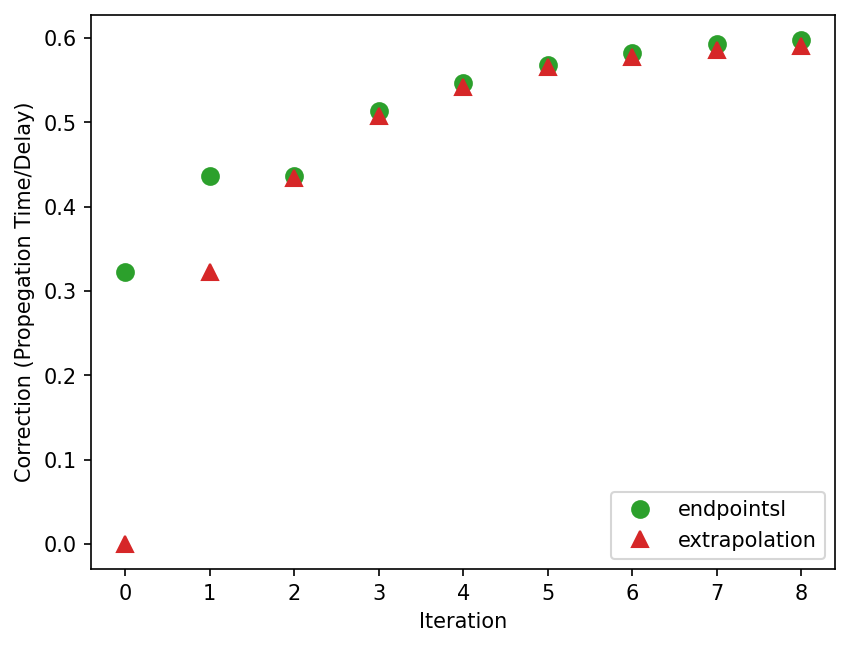

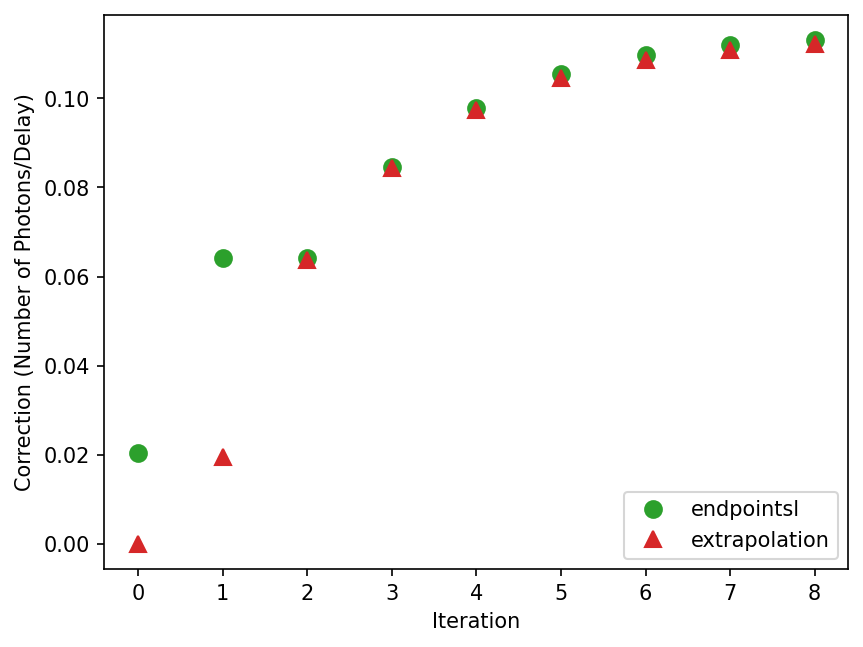

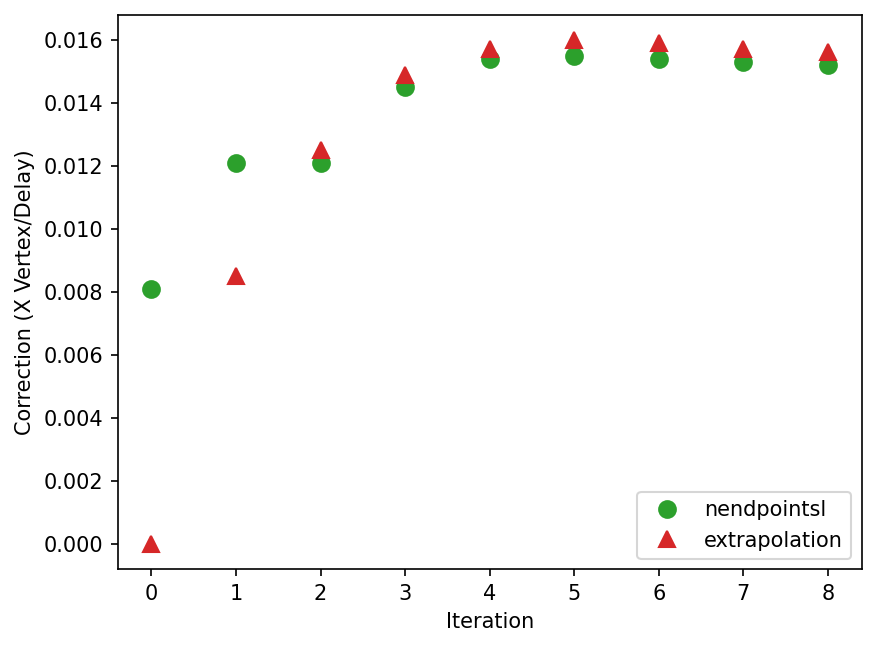

In [48]:
plt.figure(dpi=150)
#plt.axhline(y=f_ccnd1_a,color='blue',alpha=0.6,label="nominal",ls='--')
plt.plot([],[])
plt.plot([],[])
plt.plot(np.linspace(0,len(const_propt)-1,len(const_propt)),const_propt,lw=0,ms=8,marker="o",label="endpointsl")
plt.plot(np.linspace(0,len(const_propt_full)-1,len(const_propt_full)),const_propt_full,lw=0,ms=8,marker="^",label="extrapolation")
#plt.plot(np.linspace(0,len(const_propt_ssmsp)-1,len(const_propt_ssmsp)),const_propt_ssmsp,lw=0,ms=8,marker="x",label="spacepoints re cal")
plt.ylabel("Correction (Propegation Time/Delay)")
plt.xlabel("Iteration")
plt.legend(loc='lower right')
plt.show()

plt.figure(dpi=150)
#plt.axhline(y=f_ccnd2_a,color='blue',alpha=0.6,label="nominal",ls='--')
plt.plot([],[])
plt.plot([],[])
plt.plot(np.linspace(0,len(const_Np)-1,len(const_Np)),const_Np,lw=0,ms=8,marker="o",label="endpointsl")
plt.plot(np.linspace(0,len(const_Np_full)-1,len(const_Np_full)),const_Np_full,lw=0,ms=8,marker="^",label="extrapolation")
#plt.plot(np.linspace(0,len(const_Np_ssmsp)-1,len(const_Np_ssmsp)),const_Np_ssmsp,lw=0,ms=8,marker="x",label="spacepoints re cal")
plt.ylabel("Correction (Number of Photons/Delay)")
plt.xlabel("Iteration")
plt.legend(loc='lower right')
plt.show()

plt.figure(dpi=150)
#plt.axhline(y=0,color='blue',alpha=0.6,label="nominal",ls='--')
plt.plot([],[])
plt.plot([],[])
plt.plot(np.linspace(0,len(const_xvtx)-1,len(const_xvtx)),const_xvtx,lw=0,ms=8,marker="o",label="nendpointsl")
plt.plot(np.linspace(0,len(const_xvtx_full)-1,len(const_xvtx_full)),const_xvtx_full,lw=0,ms=8,marker="^",label="extrapolation")
#plt.plot(np.linspace(0,len(const_xvtx_ssmsp)-1,len(const_xvtx_ssmsp)),const_xvtx_ssmsp,lw=0,ms=8,marker="x",label="spacepoints re cal")
plt.ylabel("Correction (X Vertex/Delay)")
plt.xlabel("Iteration")
plt.legend(loc='lower right')
plt.show()

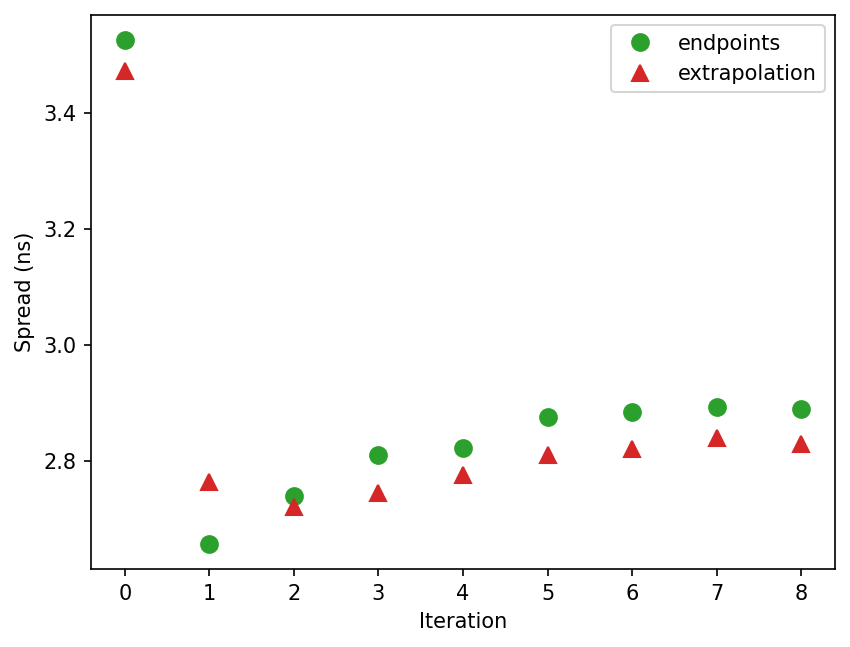

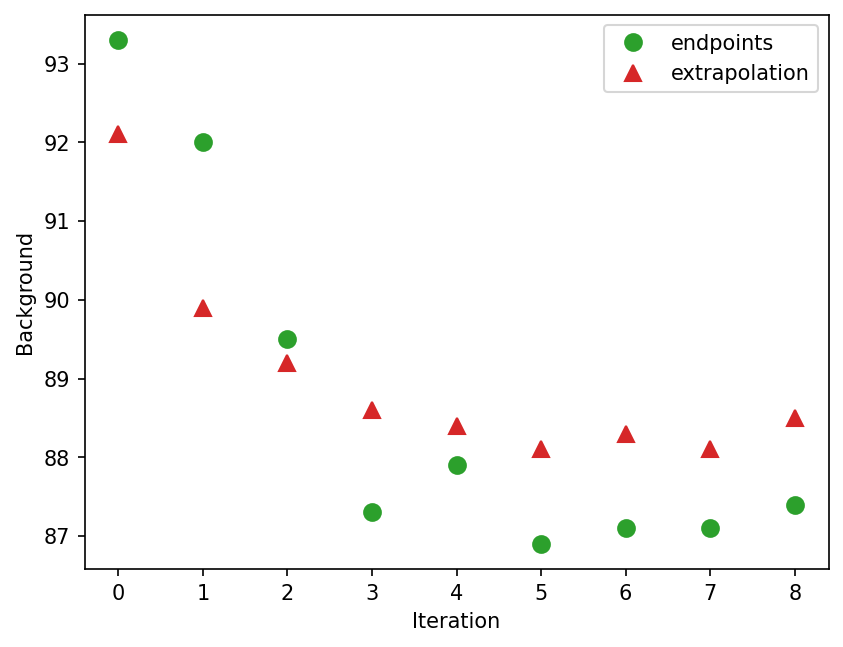

In [49]:
spread_nominal = 2.761
spread = [3.526, 2.657, 2.739, 2.81, 2.823, 2.876, 2.884, 2.893, 2.889]
spread_fullDp = [3.472, 2.763, 2.72, 2.745, 2.775, 2.811, 2.821, 2.84, 2.83]
spread_ssmsp = [3.533, 2.832, 2.809, 2.774, 2.856, 2.889, 2.88, 2.898, 2.893]

C_nominal = 87.9
C = [93.3, 92.0, 89.5, 87.3, 87.9, 86.9, 87.1, 87.1, 87.4]
C_fullDp = [92.1, 89.9, 89.2, 88.6, 88.4, 88.1, 88.3, 88.1, 88.5]
C_ssmsp = [93.0, 89.8, 87.6, 88.8, 87.0, 86.7, 87.2, 86.9, 87.2]


plt.figure(dpi=150)
#plt.axhline(y=spread_nominal,color='blue',alpha=0.6,label="nominal",ls='--')
plt.plot([],[])
plt.plot([],[])
plt.plot(np.linspace(0,len(spread)-1,len(spread)),spread,lw=0,ms=8,marker="o",label="endpoints")
plt.plot(np.linspace(0,len(spread_fullDp)-1,len(spread_fullDp)),spread_fullDp,lw=0,ms=8,marker="^",label="extrapolation")
#plt.plot(np.linspace(0,len(spread_ssmsp)-1,len(spread_ssmsp)),spread_ssmsp,lw=0,ms=8,marker="x",label="spacepoints re cal")
plt.ylabel("Spread (ns)")
plt.xlabel("Iteration")
plt.legend()
plt.show()

plt.figure(dpi=150)
#plt.axhline(y=C_nominal,color='blue',alpha=0.6,label="nominal",ls='--')
plt.plot([],[])
plt.plot([],[])
plt.plot(np.linspace(0,len(C)-1,len(C)),C,lw=0,ms=8,marker="o",label="endpoints")
plt.plot(np.linspace(0,len(C_fullDp)-1,len(spread_fullDp)),C_fullDp,lw=0,ms=8,marker="^",label="extrapolation")
#plt.plot(np.linspace(0,len(C_ssmsp)-1,len(C_ssmsp)),C_ssmsp,lw=0,ms=8,marker="x",label="spacepoints re cal")
plt.ylabel("Background")
plt.xlabel("Iteration")
plt.legend()
plt.show()

# Evaluate variable dependance

In [50]:
m_propt_i_ssmsp = 0
b_propt_i_ssmsp = 0
m_Np_i_ssmsp = 0
b_Np_i_ssmsp = 0
c_Np_i_ssmsp = 0
m_PhT_i_ssmsp = 0  
b_PhT_i_ssmsp = 0
m_xvtx_i_ssmsp = 0 
b_xvtx_i_ssmsp = 0
m_Dp_i_ssmsp = 0
b_Dp_i_ssmsp = 0
m_propt_i_fullDp = 0
b_propt_i_fullDp = 0
m_Np_i_fullDp = 0
b_Np_i_fullDp = 0
c_Np_i_fullDp = 0
m_PhT_i_fullDp = 0  
b_PhT_i_fullDp = 0
m_xvtx_i_fullDp = 0 
b_xvtx_i_fullDp = 0
m_Dp_i_fullDp = 0
b_Dp_i_fullDp = 0
m_propt_i = 0
b_propt_i = 0
m_Np_i = 0
b_Np_i = 0
c_Np_i = 0
m_PhT_i = 0   
b_PhT_i = 0
m_xvtx_i = 0 
b_xvtx_i = 0
m_Dp_i = 0   
b_Dp_i = 0
m_DL_i = 0   
b_DL_i = 0

#it2
m_propt_i_ssmsp =-0.4346 
b_propt_i_ssmsp =8.7825-2.5
m_Np_i_ssmsp =-0.0625 
b_Np_i_ssmsp =1.438
m_xvtx_i_ssmsp =-0.0125 
b_xvtx_i_ssmsp =2.2846

m_propt_i_fullDp =-0.4343 
b_propt_i_fullDp =8.7884-2.5
m_Np_i_fullDp =-0.0637 
b_Np_i_fullDp =1.4889999999999999
m_xvtx_i_fullDp =-0.0125 
b_xvtx_i_fullDp =2.3152

m_propt_i =-0.4367 
b_propt_i =8.8311-2.5
m_Np_i =-0.06420000000000001 
b_Np_i =1.5567
m_xvtx_i =-0.0121 
b_xvtx_i =2.3319

global_cor = 0

'''
#it2 wi overflow
m_propt_i_ssmsp =-0.5952000000000001 
b_propt_i_ssmsp =11.6997-3.6
m_Np_i_ssmsp =-0.1122
b_Np_i_ssmsp =2.5103
m_xvtx_i_ssmsp =-0.0159 
b_xvtx_i_ssmsp =3.3566000000000003

m_propt_i_fullDp =-0.5882000000000001  
b_propt_i_fullDp =11.6233-3.6
m_Np_i_fullDp =-0.11330000000000001 
b_Np_i_fullDp =2.5819
m_xvtx_i_fullDp =-0.015700000000000002 
b_xvtx_i_fullDp = 3.396

m_propt_i =-0.5837 
b_propt_i =11.828199999999999-3.7
m_Np_i =-0.1071 
b_Np_i =2.4453
m_xvtx_i =-0.0161 
b_xvtx_i =3.3535000000000004
'''

'''
#it8
m_propt_i_ssmsp =-0.5894999999999999 
b_propt_i_ssmsp =16.008-11.1
m_Np_i_ssmsp =-0.1109 
b_Np_i_ssmsp =2.4265
m_xvtx_i_ssmsp =-0.015499999999999998 
b_xvtx_i_ssmsp =6.4975000000000005

m_propt_i_fullDp =-0.5908 
b_propt_i_fullDp =16.1723-11.6
m_Np_i_fullDp =-0.11210000000000002 
b_Np_i_fullDp =2.5932999999999997
m_xvtx_i_fullDp =-0.015600000000000003 
b_xvtx_i_fullDp =6.685899999999999


m_propt_i =-0.5978 
b_propt_i =16.3827-11.8
m_Np_i =-0.11309999999999999 
b_Np_i =2.7497
m_xvtx_i=-0.0152 
b_xvtx_i =6.8568
'''

'\n#it8\nm_propt_i_ssmsp =-0.5894999999999999 \nb_propt_i_ssmsp =16.008-11.1\nm_Np_i_ssmsp =-0.1109 \nb_Np_i_ssmsp =2.4265\nm_xvtx_i_ssmsp =-0.015499999999999998 \nb_xvtx_i_ssmsp =6.4975000000000005\n\nm_propt_i_fullDp =-0.5908 \nb_propt_i_fullDp =16.1723-11.6\nm_Np_i_fullDp =-0.11210000000000002 \nb_Np_i_fullDp =2.5932999999999997\nm_xvtx_i_fullDp =-0.015600000000000003 \nb_xvtx_i_fullDp =6.685899999999999\n\n\nm_propt_i =-0.5978 \nb_propt_i =16.3827-11.8\nm_Np_i =-0.11309999999999999 \nb_Np_i =2.7497\nm_xvtx_i=-0.0152 \nb_xvtx_i =6.8568\n'

In [51]:

reco_nuvtxX_list =  df["reco_nuvtxX"].to_numpy()
reco_nuvtxX_ssmsp_list =  df["ssmsp_x"].to_numpy()

PMT_TimeProp_list = df["timeProp_all"].to_numpy()
PMT_TimeProp_full_list = df["timeProp_full_all"].to_numpy()
PMT_TimeProp_ssmsp_list = df["timeProp_ssmsp_all"].to_numpy()

PMT_Amp_list = df["PMT_Amp"].to_numpy()

TT3_array_list = df["TT3_array"].to_numpy()
TT3_array_nocor_list = df["TT3_array_nocor"].to_numpy()
TT3_array_fullDp_nocor_list = df["TT3_array_fullDp_nocor"].to_numpy()
TT3_array_ssmsp_nocor_list = df["TT3_array_ssmsp_nocor"].to_numpy()

DL_all = df["DLh_all"].to_numpy()
DP_all = df["DPh_all"].to_numpy()
DP_full_all = df["DPh_full_all"].to_numpy()
DL_full_all = df["DLh_full_all"].to_numpy() 
DL_ssmsp_all = df["DLh_ssmsp_all"].to_numpy()
DP_ssmsp_all = df["DPh_ssmsp_all"].to_numpy()

PhT_all = df["Ph_Tot"].to_numpy()

file = df["WC_file"].to_numpy()

ns_time= []
merge_times = []
merge_match_TT3_array = []

ns_time_recor = []
TT3_array_recor_list = []
merge_times_recor = []
merge_match_TT3_array_recor = []

ns_time_fullDp_recor = []
TT3_array_fullDp_recor_list = []
merge_times_fullDp_recor = []
merge_match_TT3_array_fullDp_recor = []

ns_time_ssmsp_recor = []
TT3_array_ssmsp_recor_list = []
merge_times_ssmsp_recor = []
merge_match_TT3_array_ssmsp_recor = []

print("Setting recalibrated times")
for event in tqdm(range(len(TT3_array_fullDp_nocor_list))):
    
    TT3_array = TT3_array_list[event]
    
    TT3_array_nocor = TT3_array_nocor_list[event]
    PMT_TimeProp = PMT_TimeProp_list[event]
    
    TT3_array_fullDp_nocor = TT3_array_fullDp_nocor_list[event]
    PMT_TimeProp_full = PMT_TimeProp_full_list[event]

    TT3_array_ssmsp_nocor = TT3_array_ssmsp_nocor_list[event]
    PMT_TimeProp_ssmsp = PMT_TimeProp_ssmsp_list[event]
    
    PMT_Amp = PMT_Amp_list[event]
    
    PhT = PhT_all[event]
    
    Dp = DP_all[event]
    DL = DL_all[event]
    Dp_full = DP_full_all[event]
    DL_full = DP_full_all[event]
    Dp_ssmsp = DP_ssmsp_all[event]
    DL_ssmsp = DL_ssmsp_all[event]
    
    reco_nuvtxX = reco_nuvtxX_list[event]
    reco_nuvtxX_ssmsp = reco_nuvtxX_list[event]
    reco_sps_x = reco_nuvtxX_ssmsp_list[event]
    if len(reco_sps_x)>0:
        reco_nuvtxX_ssmsp = reco_sps_x[0]  

    TT3_array_recor = []
    TT3_array_fullDp_recor = []
    TT3_array_ssmsp_recor = []
    
    Shift = Shift5+global_cor
    if file[event]=='numi_run4b': 
        Shift = Shift4b
        
    for pmt in range(len(TT3_array_nocor)):
        TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i))
        TT3_array_fullDp_recor.append( TT3_array_fullDp_nocor[pmt] - (m_propt_i_fullDp*PMT_TimeProp_full[pmt]+b_propt_i_fullDp) - (m_Np_i_fullDp*PMT_Amp[pmt]+b_Np_i_fullDp) - (PhT*m_PhT_i_fullDp+b_PhT_i_fullDp) - (m_xvtx_i_fullDp*reco_nuvtxX+b_xvtx_i_fullDp) - (m_Dp_i_fullDp*Dp_full[pmt]+b_Dp_i_fullDp) )
        TT3_array_ssmsp_recor.append( TT3_array_ssmsp_nocor[pmt] - (m_propt_i_ssmsp*PMT_TimeProp_ssmsp[pmt]+b_propt_i_ssmsp) - (m_Np_i_ssmsp*PMT_Amp[pmt]+b_Np_i_ssmsp) - (PhT*m_PhT_i_ssmsp+b_PhT_i_ssmsp) - (m_xvtx_i_ssmsp*reco_nuvtxX_ssmsp+b_xvtx_i_ssmsp) - (m_Dp_i_ssmsp*Dp_ssmsp[pmt]+b_Dp_i_ssmsp) )

    ns_time.append(np.median(TT3_array))
    ns_time_recor.append(np.median(TT3_array_recor))
    TT3_array_recor_list.append(TT3_array_recor)
    ns_time_fullDp_recor.append(np.median(TT3_array_fullDp_recor))
    TT3_array_fullDp_recor_list.append(TT3_array_fullDp_recor)
    ns_time_ssmsp_recor.append(np.median(TT3_array_ssmsp_recor))
    TT3_array_ssmsp_recor_list.append(TT3_array_ssmsp_recor)

    TThelp = ns_time[event]-Shift+gap*0.5-0.2
    TT_merged=-9999
    
    if TThelp>=0:
        TT_merged=(TThelp-(int((TThelp)/gap))*gap)-gap*0.5
        
    merge_times.append(TT_merged)
    merge_match_TT3_array.append([])

    TThelp_recor = ns_time_recor[event]-Shift+gap*0.5
    TT_merged_recor=-9999
    
    if TThelp_recor>=0:
        TT_merged_recor=(TThelp_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        
    merge_times_recor.append(TT_merged_recor)
    merge_match_TT3_array_recor.append([])
    
    TThelp_fullDp_recor = ns_time_fullDp_recor[event]-Shift+gap*0.5
    TT_merged_fullDp_recor=-9999
    
    if TThelp_fullDp_recor>=0:
        TT_merged_fullDp_recor=(TThelp_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        
    merge_times_fullDp_recor.append(TT_merged_fullDp_recor)
    merge_match_TT3_array_fullDp_recor.append([])

    TThelp_ssmsp_recor = ns_time_ssmsp_recor[event]-Shift+gap*0.5
    TT_merged_ssmsp_recor=-9999
    
    if TThelp_ssmsp_recor>=0:
        TT_merged_ssmsp_recor=(TThelp_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        
    merge_times_ssmsp_recor.append(TT_merged_ssmsp_recor)
    merge_match_TT3_array_ssmsp_recor.append([])
    
    for pmt in range(len(TT3_array_fullDp_recor_list[event])):
        TThelp_array = TT3_array_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match=-9999
        #shift according to the events time
        if TThelp>=0:
            TT_array_merged_match=(TThelp_array-(int((TThelp)/gap))*gap)-gap*0.5
        merge_match_TT3_array[event].append(TT_array_merged_match)
        
        TThelp_array_recor = TT3_array_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_recor=-9999
        #shift according to the events time
        if TThelp_recor>=0:
            TT_array_merged_match_recor=(TThelp_array_recor-(int((TThelp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_recor[event].append(TT_array_merged_match_recor)

        TThelp_array_fullDp_recor = TT3_array_fullDp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_fullDp_recor=-9999
        #shift according to the events time
        if TThelp_fullDp_recor>=0:
            TT_array_merged_match_fullDp_recor=(TThelp_array_fullDp_recor-(int((TThelp_fullDp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_fullDp_recor[event].append(TT_array_merged_match_fullDp_recor)

        TThelp_array_ssmsp_recor = TT3_array_ssmsp_recor_list[event][pmt]-Shift+gap*0.5
        TT_array_merged_match_ssmsp_recor=-9999
        #shift according to the events time
        if TThelp_ssmsp_recor>=0:
            TT_array_merged_match_ssmsp_recor=(TThelp_array_ssmsp_recor-(int((TThelp_ssmsp_recor)/gap))*gap)-gap*0.5
        merge_match_TT3_array_ssmsp_recor[event].append(TT_array_merged_match_ssmsp_recor)
        
df["merge_times"] = merge_times
df["merge_times_recor"] = merge_times_recor
df["merge_times_fullDp_recor"] = merge_times_fullDp_recor
df["merge_times_ssmsp_recor"] = merge_times_ssmsp_recor 

Setting recalibrated times


  0%|                                                 | 0/12602 [00:00<?, ?it/s]/Users/bbogart/Library/Python/3.9/lib/python/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/bbogart/Library/Python/3.9/lib/python/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
 16%|█████▉                              | 2074/12602 [00:00<00:01, 6941.54it/s]/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/158568424.py:85: RuntimeWarning: invalid value encountered in scalar multiply
  TT3_array_recor.append( TT3_array_nocor[pmt] - (m_propt_i*PMT_TimeProp[pmt]+b_propt_i) - (m_Np_i*PMT_Amp[pmt]+b_Np_i) - (PhT*m_PhT_i+b_PhT_i) - (m_xvtx_i*reco_nuvtxX+b_xvtx_i) - (m_Dp_i*Dp[pmt]+b_Dp_i))
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/158568424.py:86: RuntimeWarning: invalid value encountered in sca

data re cal: Triple Gaussian      mean: -0.3077   std: 2.748   C: 255.8722
29.12084712901779
data re cal: Triple Gaussian      mean: -0.4019   std: 2.8526   C: 251.3927
26.291419125880378
data linear vp re cal: Triple Gaussian      mean: -0.3358   std: 2.8203   C: 251.7986
31.733048798027077
data spacepoints vp re cal: Triple Gaussian      mean: -0.3749   std: 2.8796   C: 250.0282
31.454136358711022


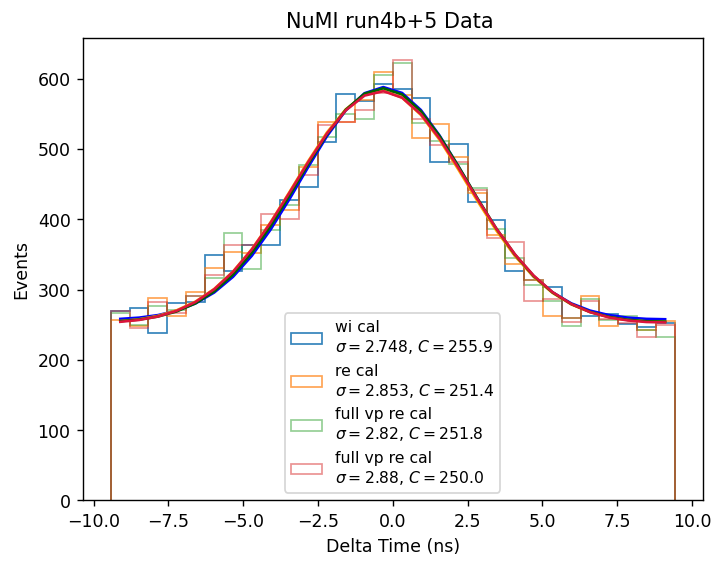

data re cal: Triple Gaussian      mean: -0.1203   std: 2.7613   C: 87.8829
28.567346457461998
data re cal: Triple Gaussian      mean: -0.1837   std: 2.7385   C: 89.5246
31.99045666519178
data linear vp re cal: Triple Gaussian      mean: -0.1217   std: 2.7197   C: 89.1763
34.78939611998863
data spacepoints vp re cal: Triple Gaussian      mean: -0.1484   std: 2.8103   C: 87.6181
41.27804861409672


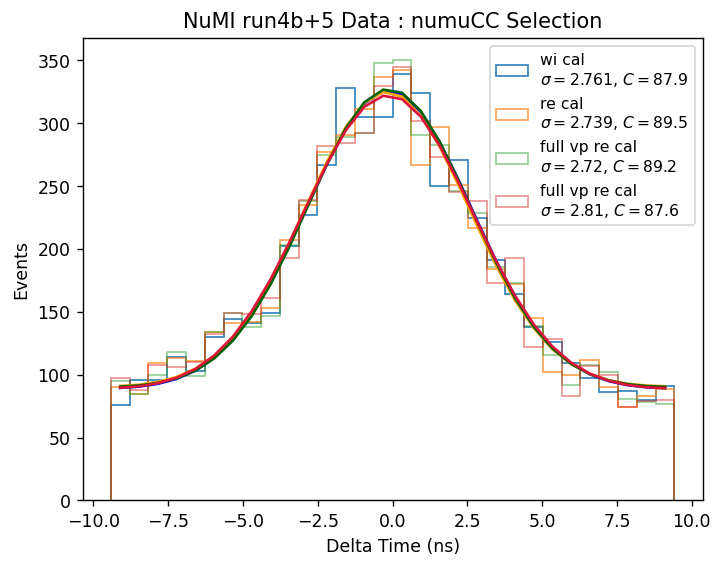

In [52]:
nbins=30
plot_title = "NuMI run4b+5 Data "

data = df.query("merge_times>-9.42 and merge_times<9.42")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data re cal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_recor = df.query("merge_times_recor>-9.42 and merge_times_recor<9.42")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data re cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp re cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp re cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title)
plt.hist(data,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='wi cal'+'\n'+f'$\sigma=${round(popt[2],3)}, $C=${round(popt[3],1)}',histtype='step')
plt.hist(data_recor,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="re cal"+'\n'+f'$\sigma=${round(popt_recor[2],3)}, $C=${round(popt_recor[3],1)}',histtype='step')
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="full vp re cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step')
plt.hist(data_ssmsp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="full vp re cal"+'\n'+f'$\sigma=${round(popt_ssmsp_recor[2],3)}, $C=${round(popt_ssmsp_recor[3],1)}',histtype='step')
plt.plot(x,triple_gaus(x,*popt),color='blue')
plt.plot(x,triple_gaus(x,*popt_recor),color='orange')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_ssmsp_recor),color='crimson')
plt.ylabel("Events")
plt.xlabel("Delta Time (ns)")
plt.legend(fontsize=9)
plt.show()

data = df.query("merge_times>-9.42 and merge_times<9.42").query("numu_score>0.8")["merge_times"].to_numpy()
y,xbins = np.histogram(data,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt,pcov = curve_fit(gaus,x,y,[0,0,2, 150])
guess = [popt[0],0,2, 150]
slope = slope_numi
popt,pcov = curve_fit(triple_gaus,x,y,guess)
print("data re cal: Triple Gaussian      mean:",round(popt[1],4),"  std:",round(popt[2],4),"  C:",round(popt[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt)[i]
    chi2 += (y[i]-pred)**2/pred
print(chi2)

data_recor = df.query("merge_times_recor>-9.42 and merge_times_recor<9.42").query("numu_score>0.8")["merge_times_recor"].to_numpy()
y_recor,xbins = np.histogram(data_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_recor,pcov = curve_fit(gaus,x,y_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_recor,pcov = curve_fit(triple_gaus,x,y_recor,guess)
print("data re cal: Triple Gaussian      mean:",round(popt_recor[1],4),"  std:",round(popt_recor[2],4),"  C:",round(popt_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_recor[i]-pred)**2/pred
print(chi2)

data_fullDp_recor = df.query("merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42").query("numu_score>0.8")["merge_times_fullDp_recor"].to_numpy()
y_fullDp_recor,xbins = np.histogram(data_fullDp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_fullDp_recor,pcov = curve_fit(gaus,x,y_fullDp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_fullDp_recor,pcov = curve_fit(triple_gaus,x,y_fullDp_recor,guess)
print("data linear vp re cal: Triple Gaussian      mean:",round(popt_fullDp_recor[1],4),"  std:",round(popt_fullDp_recor[2],4),"  C:",round(popt_fullDp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_fullDp_recor[i]-pred)**2/pred
print(chi2)

data_ssmsp_recor = df.query("merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42").query("numu_score>0.8")["merge_times_ssmsp_recor"].to_numpy()
y_ssmsp_recor,xbins = np.histogram(data_ssmsp_recor,bins=nbins,range=(-9.42, 9.42))
x = get_bin_centers(xbins)
popt_ssmsp_recor,pcov = curve_fit(gaus,x,y_ssmsp_recor,[0,0,2, 150])
guess = [popt_recor[0],0,2, 150]
slope = slope_numi
popt_ssmsp_recor,pcov = curve_fit(triple_gaus,x,y_ssmsp_recor,guess)
print("data spacepoints vp re cal: Triple Gaussian      mean:",round(popt_ssmsp_recor[1],4),"  std:",round(popt_ssmsp_recor[2],4),"  C:",round(popt_ssmsp_recor[3],4))
chi2=0
for i in range(len(x)):
    pred = gaus(x,*popt_recor)[i]
    chi2 += (y_ssmsp_recor[i]-pred)**2/pred
print(chi2)


plt.figure(dpi=125)
plt.title(plot_title+": numuCC Selection")
plt.hist(data,bins=nbins,alpha=0.9, density=False,range=(-9.42, 9.42),label='wi cal'+'\n'+f'$\sigma=${round(popt[2],3)}, $C=${round(popt[3],1)}',histtype='step')
plt.hist(data_recor,bins=nbins,alpha=0.7, density=False,range=(-9.42, 9.42),label="re cal"+'\n'+f'$\sigma=${round(popt_recor[2],3)}, $C=${round(popt_recor[3],1)}',histtype='step')
plt.hist(data_fullDp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="full vp re cal"+'\n'+f'$\sigma=${round(popt_fullDp_recor[2],3)}, $C=${round(popt_fullDp_recor[3],1)}',histtype='step')
plt.hist(data_ssmsp_recor,bins=nbins,alpha=0.5, density=False,range=(-9.42, 9.42),label="full vp re cal"+'\n'+f'$\sigma=${round(popt_ssmsp_recor[2],3)}, $C=${round(popt_ssmsp_recor[3],1)}',histtype='step')
plt.plot(x,triple_gaus(x,*popt),color='blue')
plt.plot(x,triple_gaus(x,*popt_recor),color='orange')
plt.plot(x,triple_gaus(x,*popt_fullDp_recor),color='darkgreen')
plt.plot(x,triple_gaus(x,*popt_ssmsp_recor),color='crimson')
plt.ylabel("Events")
plt.xlabel("Delta Time (ns)")
plt.legend(fontsize=9)
plt.show()

In [53]:
#add saving track pdgs
reco_muonMoms0 = df["reco_muonMomentum[0]"].to_numpy()
reco_muonMoms1 = df["reco_muonMomentum[1]"].to_numpy()
reco_muonMoms2 = df["reco_muonMomentum[2]"].to_numpy()
reco_muonMoms3 = df["reco_muonMomentum[3]"].to_numpy()

reco_hadMoms0 = []
reco_hadMoms1 = []
reco_hadMoms2 = []
reco_hadMoms3 = []

reco_hadMoms_prim0 = []
reco_hadMoms_prim1 = []
reco_hadMoms_prim2 = []
reco_hadMoms_prim3 = []

reco_hadMoms_con0 = []
reco_hadMoms_con1 = []
reco_hadMoms_con2 = []
reco_hadMoms_con3 = []

reco_hadMoms_allcon0 = []
reco_hadMoms_allcon1 = []
reco_hadMoms_allcon2 = []
reco_hadMoms_allcon3 = []

reco_nuMoms0 = []
reco_nuMoms1 = []
reco_nuMoms2 = []
reco_nuMoms3 = []

reco_nuMoms_prim0 = []
reco_nuMoms_prim1 = []
reco_nuMoms_prim2 = []
reco_nuMoms_prim3 = []

reco_nuMoms_con0 = []
reco_nuMoms_con1 = []
reco_nuMoms_con2 = []
reco_nuMoms_con3 = []

reco_nuMoms_allcon0 = []
reco_nuMoms_allcon1 = []
reco_nuMoms_allcon2 = []
reco_nuMoms_allcon3 = []

track_1_KEs = []
track_2_KEs = []
prim_track_1_KEs = []
prim_track_2_KEs = []
con_track_1_KEs = []
con_track_2_KEs = []
allcon_track_1_KEs = []
allcon_track_2_KEs = []

e_1_KEs = []
e_2_KEs = []
prim_e_1_KEs = []
prim_e_2_KEs = []
con_e_1_KEs = []
con_e_2_KEs = []
allcon_e_1_KEs = []
allcon_e_2_KEs = []


g_1_KEs = []
g_2_KEs = []
prim_g_1_KEs = []
prim_g_2_KEs = []
con_g_1_KEs = []
con_g_2_KEs = []
allcon_g_1_KEs = []
allcon_g_2_KEs = []

nu_thetas = []
nu_phis = []
cos_nu_thetas = []
cos_nu_phis = []

nu_prim_thetas = []
nu_prim_phis = []
cos_nu_prim_thetas = []
cos_nu_prim_phis = []

nu_con_thetas = []
nu_con_phis = []
cos_nu_con_thetas = []
cos_nu_con_phis = []

nu_allcon_thetas = []
nu_allcon_phis = []
cos_nu_allcon_thetas = []
cos_nu_allcon_phis = []

nu_numi_thetas = []
nu_numi_phis = []
cos_nu_numi_thetas = []
cos_nu_numi_phis = []

nu_prim_numi_thetas = []
nu_prim_numi_phis = []
cos_nu_prim_numi_thetas = []
cos_nu_prim_numi_phis = []

nu_con_numi_thetas = []
nu_con_numi_phis = []
cos_nu_con_numi_thetas = []
cos_nu_con_numi_phis = []

nu_allcon_numi_thetas = []
nu_allcon_numi_phis = []
cos_nu_allcon_numi_thetas = []
cos_nu_allcon_numi_phis = []

track_thetas = []
track_phis = []
cos_track_thetas = []
cos_track_phis = []

track_prim_thetas = []
track_prim_phis = []
cos_track_prim_thetas = []
cos_track_prim_phis = []

track_con_thetas = []
track_con_phis = []
cos_track_con_thetas = []
cos_track_con_phis = []

track_allcon_thetas = []
track_allcon_phis = []
cos_track_allcon_thetas = []
cos_track_allcon_phis = []

track_numi_thetas = []
track_numi_phis = []
cos_track_numi_thetas = []
cos_track_numi_phis = []

track_prim_numi_thetas = []
track_prim_numi_phis = []
cos_track_prim_numi_thetas = []
cos_track_prim_numi_phis = []

track_con_numi_thetas = []
track_con_numi_phis = []
cos_track_con_numi_thetas = []
cos_track_con_numi_phis = []

track_allcon_numi_thetas = []
track_allcon_numi_phis = []
cos_track_allcon_numi_thetas = []
cos_track_allcon_numi_phis = []

muon_1_Es = []
muon_2_Es = []
prim_muon_1_Es = []
prim_muon_2_Es = []
con_muon_1_Es = []
con_muon_2_Es = []
allcon_muon_1_Es = []
allcon_muon_2_Es = []

p_1_Es = []
p_2_Es = []
prim_p_1_Es = []
prim_p_2_Es = []
con_p_1_Es = []
con_p_2_Es = []
allcon_p_1_Es = []
allcon_p_2_Es = []

reco_startMomentums = df["reco_startMomentum"].to_numpy()
reco_endMomentums = df["reco_endMomentum"].to_numpy()
reco_startPos = df["reco_startXYZT"].to_numpy()
reco_endPos = df["reco_endXYZT"].to_numpy()
mothers = df["reco_mother"].to_numpy()
pdgs = df["reco_pdg"].to_numpy()
ids = df["reco_id"].to_numpy()


for i in tqdm(range(df.shape[0])):
    
    reco_muonMom0 = reco_muonMoms0[i]
    reco_muonMom1 = reco_muonMoms1[i]
    reco_muonMom2 = reco_muonMoms2[i]
    reco_muonMom3 = reco_muonMoms3[i]

    reco_hadMom0 = 0
    reco_hadMom1 = 0
    reco_hadMom2 = 0
    reco_hadMom3 = 0   
    
    reco_hadMom_prim0 = 0
    reco_hadMom_prim1 = 0
    reco_hadMom_prim2 = 0
    reco_hadMom_prim3 = 0 
    
    reco_hadMom_con0 = 0
    reco_hadMom_con1 = 0
    reco_hadMom_con2 = 0
    reco_hadMom_con3 = 0 

    reco_hadMom_allcon0 = 0
    reco_hadMom_allcon1 = 0
    reco_hadMom_allcon2 = 0
    reco_hadMom_allcon3 = 0 
    
    track_1_KE = -1000
    track_2_KE = -1000
    prim_track_1_KE = -1000
    prim_track_2_KE = -1000
    con_track_1_KE = -1000
    con_track_2_KE = -1000
    allcon_track_1_KE = -1000
    allcon_track_2_KE = -1000
    track_1 = [0,0,0,0]
    track_2 = [0,0,0,0]
    prim_track_1 = [0,0,0,0]
    prim_track_2 = [0,0,0,0]
    con_track_1 = [0,0,0,0]
    con_track_2 = [0,0,0,0]
    allcon_track_1 = [0,0,0,0]
    allcon_track_2 = [0,0,0,0]
    
    e_1_KE = -1000
    e_2_KE = -1000
    prim_e_1_KE = -1000
    prim_e_2_KE = -1000
    con_e_1_KE = -1000
    con_e_2_KE = -1000
    allcon_e_1_KE = -1000
    allcon_e_2_KE = -1000

    g_1_KE = -1000
    g_2_KE = -1000
    prim_g_1_KE = -1000
    prim_g_2_KE = -1000
    con_g_1_KE = -1000
    con_g_2_KE = -1000
    allcon_g_1_KE = -1000
    allcon_g_2_KE = -1000
    
    muon_1_E = -1000
    muon_2_E = -1000
    prim_muon_1_E = -1000
    prim_muon_2_E = -1000
    con_muon_1_E = -1000
    con_muon_2_E = -1000
    allcon_muon_1_E = -1000
    allcon_muon_2_E = -1000

    p_1_E = -1000
    p_2_E = -1000
    prim_p_1_E = -1000
    prim_p_2_E = -1000
    con_p_1_E = -1000
    con_p_2_E = -1000
    allcon_p_1_E = -1000
    allcon_p_2_E = -1000
    
    mother_list = mothers[i]
    connected_lst = []
    pdg_list = pdgs[i]
    id_lst = ids[i]
    #Ntrack = Ntracks[i]
    reco_startMomentum_list = reco_startMomentums[i]
    reco_endMomentum_list = reco_endMomentums[i]
    
    reco_startPos_list = reco_startPos[i]
    reco_endPos_list = reco_endPos[i]
    

    for j in range(len(mother_list)):
        flag_connected = True
        flag_all_connected = True
        mass = 0
        
        
        if (abs(pdg_list[j])<10000 and (abs(pdg_list[j])<3000 or abs(pdg_list[j])>4000) 
        and reco_startMomentum_list[j][0]!=1 and reco_startMomentum_list[j][1]!=1 and reco_startMomentum_list[j][2]!=1
        and reco_startMomentum_list[j][3]>=0 and reco_endMomentum_list[j][3]>=0):
            
            
            reco_hadMom0 +=reco_startMomentum_list[j][0]
            reco_hadMom1 +=reco_startMomentum_list[j][1]
            reco_hadMom2 +=reco_startMomentum_list[j][2]
            reco_hadMom3 +=reco_startMomentum_list[j][3]-reco_endMomentum_list[j][3]
            if mother_list[j] == 0: 
                reco_hadMom_prim0 +=reco_startMomentum_list[j][0]
                reco_hadMom_prim1 +=reco_startMomentum_list[j][1]
                reco_hadMom_prim2 +=reco_startMomentum_list[j][2]
                reco_hadMom_prim3 +=reco_startMomentum_list[j][3]-reco_endMomentum_list[j][3]
                
                reco_hadMom_con0 +=reco_startMomentum_list[j][0]
                reco_hadMom_con1 +=reco_startMomentum_list[j][1]
                reco_hadMom_con2 +=reco_startMomentum_list[j][2]
                reco_hadMom_con3 +=reco_startMomentum_list[j][3]-reco_endMomentum_list[j][3]
                connected_lst.append(flag_connected)
                
            else:
                #flag_connected = True
                #flag_all_connected = True
                
                mother_ID = mother_list[j]
                mother_index = -1000
                daughter_index = j
                count = 0
                while mother_ID!=0:
                    
                    dist = 100000000000
                    
                    for mother in range(len(mother_list)):
                        if id_lst[mother] == mother_ID:
                            mother_index = mother
                            break

                    if mother_index>0:

                        temp_dist_x = reco_endPos_list[daughter_index][0] - reco_endPos_list[mother_index][0]
                        temp_dist_y = reco_endPos_list[daughter_index][1] - reco_endPos_list[mother_index][1]
                        temp_dist_z = reco_endPos_list[daughter_index][2] - reco_endPos_list[mother_index][2]
                        temp_dist = np.sqrt( temp_dist_x**2 + temp_dist_y**2 + temp_dist_z**2)
                        if temp_dist>dist: dist = temp_dist
                        temp_dist_x = reco_startPos_list[daughter_index][0] - reco_endPos_list[mother_index][0]
                        temp_dist_y = reco_startPos_list[daughter_index][1] - reco_endPos_list[mother_index][1]
                        temp_dist_z = reco_startPos_list[daughter_index][2] - reco_endPos_list[mother_index][2]
                        temp_dist = np.sqrt( temp_dist_x**2 + temp_dist_y**2 + temp_dist_z**2)
                        if temp_dist>dist: dist = temp_dist
                        temp_dist_x = reco_endPos_list[daughter_index][0] - reco_startPos_list[mother_index][0]
                        temp_dist_y = reco_endPos_list[daughter_index][1] - reco_startPos_list[mother_index][1]
                        temp_dist_z = reco_endPos_list[daughter_index][2] - reco_startPos_list[mother_index][2]
                        temp_dist = np.sqrt( temp_dist_x**2 + temp_dist_y**2 + temp_dist_z**2)
                        if temp_dist>dist: dist = temp_dist
                        temp_dist_x = reco_startPos_list[daughter_index][0] - reco_startPos_list[mother_index][0]
                        temp_dist_y = reco_startPos_list[daughter_index][1] - reco_startPos_list[mother_index][1]
                        temp_dist_z = reco_startPos_list[daughter_index][2] - reco_startPos_list[mother_index][2]
                        temp_dist = np.sqrt( temp_dist_x**2 + temp_dist_y**2 + temp_dist_z**2)
                        if temp_dist<dist: dist = temp_dist

                    if dist>5 and mother_ID == mother_list[j]: flag_connected=False #just the imediate mother
                    if dist>5: 
                        flag_all_connected = False
                        break
                    mother_ID = mother_list[mother_index] #set up to check the next mother
                    daughter_index = mother_index
                    #mother_index = daughter_index
                    count+=1
                    if count>30: 
                        flag_all_connected = False
                        break
                    
                if flag_connected:
                    reco_hadMom_con0 +=reco_startMomentum_list[j][0]
                    reco_hadMom_con1 +=reco_startMomentum_list[j][1]
                    reco_hadMom_con2 +=reco_startMomentum_list[j][2]
                    reco_hadMom_con3 +=reco_startMomentum_list[j][3]-reco_endMomentum_list[j][3]
                connected_lst.append(flag_connected)
                
                if flag_all_connected:
                    reco_hadMom_allcon0 +=reco_startMomentum_list[j][0]
                    reco_hadMom_allcon1 +=reco_startMomentum_list[j][1]
                    reco_hadMom_allcon2 +=reco_startMomentum_list[j][2]
                    reco_hadMom_allcon3 +=reco_startMomentum_list[j][3]-reco_endMomentum_list[j][3]

              
        if abs(pdg_list[j])==13 or abs(pdg_list[j])==2212 or abs(pdg_list[j])==211:
            if abs(pdg_list[j])==13: 
                mass = 0.1056
                if muon_1_E<reco_startMomentum_list[j][3]:
                    muon_2_KE = muon_1_E
                    muon_1_E = reco_startMomentum_list[j][3]
                elif muon_2_E<reco_startMomentum_list[j][3]:
                    muon_2_E = reco_startMomentum_list[j][3]
            if abs(pdg_list[j])==2212: 
                mass = 0.938
                if p_1_E<reco_startMomentum_list[j][3]:
                    p_2_KE = p_1_E
                    p_1_E = reco_startMomentum_list[j][3]
                elif p_2_E<reco_startMomentum_list[j][3]:
                    p_2_E = reco_startMomentum_list[j][3]
            if abs(pdg_list[j])==211: 
                mass = 0.139
                
            if track_1_KE<reco_startMomentum_list[j][3]-mass:
                track_2_KE = track_1_KE
                track_2 = track_1
                track_1_KE = reco_startMomentum_list[j][3]-mass
                track_1 = [reco_startMomentum_list[j][0],reco_startMomentum_list[j][1],reco_startMomentum_list[j][2],reco_startMomentum_list[j][3]]
            elif track_2_KE<reco_startMomentum_list[j][3]-mass:
                track_2_KE = reco_startMomentum_list[j][3]-mass
                track_2 = [reco_startMomentum_list[j][0],reco_startMomentum_list[j][1],reco_startMomentum_list[j][2],reco_startMomentum_list[j][3]]
                
            if mother_list[j] == 0:
                if prim_track_1_KE<reco_startMomentum_list[j][3]-mass:
                    prim_track_2_KE = prim_track_1_KE
                    prim_track_2 = prim_track_1
                    prim_track_1_KE = reco_startMomentum_list[j][3]-mass
                    prim_track_1 = [reco_startMomentum_list[j][0],reco_startMomentum_list[j][1],reco_startMomentum_list[j][2],reco_startMomentum_list[j][3]]
                elif prim_track_2_KE<reco_startMomentum_list[j][3]-mass:
                    prim_track_2_KE = reco_startMomentum_list[j][3]-mass  
                    prim_track_2 = [reco_startMomentum_list[j][0],reco_startMomentum_list[j][1],reco_startMomentum_list[j][2],reco_startMomentum_list[j][3]]                    
                if abs(pdg_list[j])==13: 
                    if prim_muon_1_E<reco_startMomentum_list[j][3]:
                        prim_muon_2_KE = prim_muon_1_E
                        prim_muon_1_E = reco_startMomentum_list[j][3]
                    elif prim_muon_2_E<reco_startMomentum_list[j][3]:
                        prim_muon_2_E = reco_startMomentum_list[j][3]
                if abs(pdg_list[j])==2212: 
                    if prim_p_1_E<reco_startMomentum_list[j][3]:
                        prim_p_2_KE = prim_p_1_E
                        prim_p_1_E = reco_startMomentum_list[j][3]
                    elif prim_p_2_E<reco_startMomentum_list[j][3]:
                        prim_p_2_E = reco_startMomentum_list[j][3]
                        
        if abs(pdg_list[j])==11:
            mass = 0.0005
            if e_1_KE<reco_startMomentum_list[j][3]-mass:
                e_2_KE = e_1_KE
                e_1_KE = reco_startMomentum_list[j][3]-mass
            elif e_2_KE<reco_startMomentum_list[j][3]-mass:
                e_2_KE = reco_startMomentum_list[j][3]-mass
            
            if mother_list[j] == 0:
                if prim_e_1_KE<reco_startMomentum_list[j][3]-mass:
                    prim_e_2_KE = prim_e_1_KE
                    prim_e_1_KE = reco_startMomentum_list[j][3]-mass
                elif prim_e_2_KE<reco_startMomentum_list[j][3]-mass:
                    prim_e_2_KE = reco_startMomentum_list[j][3]-mass
                    
        if abs(pdg_list[j])==22:
            mass = 0
            if g_1_KE<reco_startMomentum_list[j][3]-mass:
                g_2_KE = g_1_KE
                g_1_KE = reco_startMomentum_list[j][3]-mass
            elif g_2_KE<reco_startMomentum_list[j][3]-mass:
                g_2_KE = reco_startMomentum_list[j][3]-mass
            
            if mother_list[j] == 0:
                if prim_g_1_KE<reco_startMomentum_list[j][3]-mass:
                    prim_g_2_KE = prim_g_1_KE
                    prim_g_1_KE = reco_startMomentum_list[j][3]-mass
                elif prim_g_2_KE<reco_startMomentum_list[j][3]-mass:
                    prim_g_2_KE = reco_startMomentum_list[j][3]-mass
        
        if flag_connected:
            if abs(pdg_list[j])==13 or abs(pdg_list[j])==2212 or abs(pdg_list[j])==211:
                if con_track_1_KE<reco_startMomentum_list[j][3]-mass:
                    con_track_2_KE = con_track_1_KE
                    con_track_2 = con_track_1
                    con_track_1_KE = reco_startMomentum_list[j][3]-mass
                    con_track_1 = [reco_startMomentum_list[j][0],reco_startMomentum_list[j][1],reco_startMomentum_list[j][2],reco_startMomentum_list[j][3]]
                elif con_track_2_KE<reco_startMomentum_list[j][3]-mass:
                    con_track_2_KE = reco_startMomentum_list[j][3]-mass  
                    con_track_2 = [reco_startMomentum_list[j][0],reco_startMomentum_list[j][1],reco_startMomentum_list[j][2],reco_startMomentum_list[j][3]]                    
            if abs(pdg_list[j])==13: 
                if con_muon_1_E<reco_startMomentum_list[j][3]:
                    con_muon_2_KE = con_muon_1_E
                    con_muon_1_E = reco_startMomentum_list[j][3]
                elif con_muon_2_E<reco_startMomentum_list[j][3]:
                    con_muon_2_E = reco_startMomentum_list[j][3]
            if abs(pdg_list[j])==2212: 
                if con_p_1_E<reco_startMomentum_list[j][3]:
                    con_p_2_KE = con_p_1_E
                    con_p_1_E = reco_startMomentum_list[j][3]
                elif con_p_2_E<reco_startMomentum_list[j][3]:
                    con_p_2_E = reco_startMomentum_list[j][3]

            if abs(pdg_list[j])==11:
                if con_e_1_KE<reco_startMomentum_list[j][3]-mass:
                    con_e_2_KE = con_e_1_KE
                    con_e_1_KE = reco_startMomentum_list[j][3]-mass
                elif con_e_2_KE<reco_startMomentum_list[j][3]-mass:
                    con_e_2_KE = reco_startMomentum_list[j][3]-mass

            if abs(pdg_list[j])==22:
                if con_g_1_KE<reco_startMomentum_list[j][3]-mass:
                    con_g_2_KE = con_g_1_KE
                    con_g_1_KE = reco_startMomentum_list[j][3]-mass
                elif con_g_2_KE<reco_startMomentum_list[j][3]-mass:
                    con_g_2_KE = reco_startMomentum_list[j][3]-mass

                    
        if flag_all_connected:
            if abs(pdg_list[j])==13 or abs(pdg_list[j])==2212 or abs(pdg_list[j])==211:
                if allcon_track_1_KE<reco_startMomentum_list[j][3]-mass:
                    allcon_track_2_KE = allcon_track_1_KE
                    allcon_track_2 = allcon_track_1
                    allcon_track_1_KE = reco_startMomentum_list[j][3]-mass
                    allcon_track_1 = [reco_startMomentum_list[j][0],reco_startMomentum_list[j][1],reco_startMomentum_list[j][2],reco_startMomentum_list[j][3]]
                elif allcon_track_2_KE<reco_startMomentum_list[j][3]-mass:
                    allcon_track_2_KE = reco_startMomentum_list[j][3]-mass  
                    allcon_track_2 = [reco_startMomentum_list[j][0],reco_startMomentum_list[j][1],reco_startMomentum_list[j][2],reco_startMomentum_list[j][3]]                    
            if abs(pdg_list[j])==13: 
                if allcon_muon_1_E<reco_startMomentum_list[j][3]:
                    allcon_muon_2_KE = allcon_muon_1_E
                    allcon_muon_1_E = reco_startMomentum_list[j][3]
                elif allcon_muon_2_E<reco_startMomentum_list[j][3]:
                    allcon_muon_2_E = reco_startMomentum_list[j][3]
            if abs(pdg_list[j])==2212: 
                if allcon_p_1_E<reco_startMomentum_list[j][3]:
                    allcon_p_2_KE = allcon_p_1_E
                    allcon_p_1_E = reco_startMomentum_list[j][3]
                elif allcon_p_2_E<reco_startMomentum_list[j][3]:
                    allcon_p_2_E = reco_startMomentum_list[j][3]

            if abs(pdg_list[j])==11:
                if allcon_e_1_KE<reco_startMomentum_list[j][3]-mass:
                    allcon_e_2_KE = allcon_e_1_KE
                    allcon_e_1_KE = reco_startMomentum_list[j][3]-mass
                elif allcon_e_2_KE<reco_startMomentum_list[j][3]-mass:
                    allcon_e_2_KE = reco_startMomentum_list[j][3]-mass

            if abs(pdg_list[j])==22:
                if allcon_g_1_KE<reco_startMomentum_list[j][3]-mass:
                    allcon_g_2_KE = allcon_g_1_KE
                    allcon_g_1_KE = reco_startMomentum_list[j][3]-mass
                elif allcon_g_2_KE<reco_startMomentum_list[j][3]-mass:
                    allcon_g_2_KE = reco_startMomentum_list[j][3]-mass



        



    if reco_muonMom3>0:
        reco_hadMoms0.append((reco_hadMom0-reco_muonMom0)*1000)
        reco_hadMoms1.append((reco_hadMom1-reco_muonMom1)*1000)
        reco_hadMoms2.append((reco_hadMom2-reco_muonMom2)*1000)
        reco_hadMoms3.append((reco_hadMom3-reco_muonMom3)*1000)
        
        reco_hadMoms_prim0.append((reco_hadMom_prim0-reco_muonMom0)*1000)
        reco_hadMoms_prim1.append((reco_hadMom_prim1-reco_muonMom1)*1000)
        reco_hadMoms_prim2.append((reco_hadMom_prim2-reco_muonMom2)*1000)
        reco_hadMoms_prim3.append((reco_hadMom_prim3-reco_muonMom3)*1000)
        
        reco_hadMoms_con0.append((reco_hadMom_con0-reco_muonMom0)*1000)
        reco_hadMoms_con1.append((reco_hadMom_con1-reco_muonMom1)*1000)
        reco_hadMoms_con2.append((reco_hadMom_con2-reco_muonMom2)*1000)
        reco_hadMoms_con3.append((reco_hadMom_con3-reco_muonMom3)*1000)
        
        reco_hadMoms_allcon0.append((reco_hadMom_allcon0-reco_muonMom0)*1000)
        reco_hadMoms_allcon1.append((reco_hadMom_allcon1-reco_muonMom1)*1000)
        reco_hadMoms_allcon2.append((reco_hadMom_allcon2-reco_muonMom2)*1000)
        reco_hadMoms_allcon3.append((reco_hadMom_allcon3-reco_muonMom3)*1000)

    else:
        reco_hadMoms0.append((reco_hadMom0)*1000)
        reco_hadMoms1.append((reco_hadMom1)*1000)
        reco_hadMoms2.append((reco_hadMom2)*1000)
        reco_hadMoms3.append((reco_hadMom3)*1000)
        
        reco_hadMoms_prim0.append((reco_hadMom_prim0)*1000)
        reco_hadMoms_prim1.append((reco_hadMom_prim1)*1000)
        reco_hadMoms_prim2.append((reco_hadMom_prim2)*1000)
        reco_hadMoms_prim3.append((reco_hadMom_prim3)*1000)
        
        reco_hadMoms_con0.append((reco_hadMom_con0)*1000)
        reco_hadMoms_con1.append((reco_hadMom_con1)*1000)
        reco_hadMoms_con2.append((reco_hadMom_con2)*1000)
        reco_hadMoms_con3.append((reco_hadMom_con3)*1000)
        
        reco_hadMoms_allcon0.append((reco_hadMom_allcon0)*1000)
        reco_hadMoms_allcon1.append((reco_hadMom_allcon1)*1000)
        reco_hadMoms_allcon2.append((reco_hadMom_allcon2)*1000)
        reco_hadMoms_allcon3.append((reco_hadMom_allcon3)*1000)
        
    reco_nuMoms0.append((reco_hadMom0)*1000)
    reco_nuMoms1.append((reco_hadMom1)*1000)
    reco_nuMoms2.append((reco_hadMom2)*1000)
    reco_nuMoms3.append((reco_hadMom3)*1000)
    
    if reco_hadMom3>0:
    #if 1:
        nu_theta ,nu_phi = get_angle(reco_hadMom0,reco_hadMom1,reco_hadMom2)

        nu_thetas.append(nu_theta)
        nu_phis.append(nu_phi)
        cos_nu_thetas.append(np.cos(nu_theta))
        cos_nu_phis.append(np.cos(nu_phi))
        
        nu_numi_theta ,nu_numi_phi = get_angle(reco_hadMom0,reco_hadMom1,reco_hadMom2,to_numi=True)

        nu_numi_thetas.append(nu_numi_theta)
        nu_numi_phis.append(nu_numi_phi)
        cos_nu_numi_thetas.append(np.cos(nu_numi_theta))
        cos_nu_numi_phis.append(np.cos(nu_numi_phi))
    else:
        nu_thetas.append(-1000)
        nu_phis.append(-1000)
        cos_nu_thetas.append(-1000)
        cos_nu_phis.append(-1000)
        
        nu_numi_thetas.append(-1000)
        nu_numi_phis.append(-1000)
        cos_nu_numi_thetas.append(-1000)
        cos_nu_numi_phis.append(-1000)
        
    reco_nuMoms_prim0.append((reco_hadMom_prim0)*1000)
    reco_nuMoms_prim1.append((reco_hadMom_prim1)*1000)
    reco_nuMoms_prim2.append((reco_hadMom_prim2)*1000)
    reco_nuMoms_prim3.append((reco_hadMom_prim3)*1000)
    
    #FIX
    if reco_hadMom_prim3>0:        
        nu_theta ,nu_phi = get_angle(reco_hadMom_prim0,reco_hadMom_prim1,reco_hadMom_prim2)

        nu_prim_thetas.append(nu_theta)
        nu_prim_phis.append(nu_phi)
        cos_nu_prim_thetas.append(np.cos(nu_theta))
        cos_nu_prim_phis.append(np.cos(nu_phi))
        
        nu_numi_theta ,nu_numi_phi = get_angle(reco_hadMom_prim0,reco_hadMom_prim1,reco_hadMom_prim2,to_numi=True)

        nu_prim_numi_thetas.append(nu_numi_theta)
        nu_prim_numi_phis.append(nu_numi_phi)
        cos_nu_prim_numi_thetas.append(np.cos(nu_numi_theta))
        cos_nu_prim_numi_phis.append(np.cos(nu_numi_phi))
        
    else:
        nu_prim_thetas.append(-1000)
        nu_prim_phis.append(-1000)
        cos_nu_prim_thetas.append(-1000)
        cos_nu_prim_phis.append(-1000)
        
        nu_prim_numi_thetas.append(-1000)
        nu_prim_numi_phis.append(-1000)
        cos_nu_prim_numi_thetas.append(-1000)
        cos_nu_prim_numi_phis.append(-1000)
                
    if reco_hadMom_con3>0:        
        nu_theta ,nu_phi = get_angle(reco_hadMom_con0,reco_hadMom_con1,reco_hadMom_con2)

        nu_con_thetas.append(nu_theta)
        nu_con_phis.append(nu_phi)
        cos_nu_con_thetas.append(np.cos(nu_theta))
        cos_nu_con_phis.append(np.cos(nu_phi))
        
        nu_numi_theta ,nu_numi_phi = get_angle(reco_hadMom_con0,reco_hadMom_con1,reco_hadMom_con2,to_numi=True)

        nu_con_numi_thetas.append(nu_numi_theta)
        nu_con_numi_phis.append(nu_numi_phi)
        cos_nu_con_numi_thetas.append(np.cos(nu_numi_theta))
        cos_nu_con_numi_phis.append(np.cos(nu_numi_phi))
        
    else:
        nu_con_thetas.append(-1000)
        nu_con_phis.append(-1000)
        cos_nu_con_thetas.append(-1000)
        cos_nu_con_phis.append(-1000)
        
        nu_con_numi_thetas.append(-1000)
        nu_con_numi_phis.append(-1000)
        cos_nu_con_numi_thetas.append(-1000)
        cos_nu_con_numi_phis.append(-1000)
        
        
    if reco_hadMom_allcon3>0:        
        nu_theta ,nu_phi = get_angle(reco_hadMom_allcon0,reco_hadMom_allcon1,reco_hadMom_allcon2)

        nu_allcon_thetas.append(nu_theta)
        nu_allcon_phis.append(nu_phi)
        cos_nu_allcon_thetas.append(np.cos(nu_theta))
        cos_nu_allcon_phis.append(np.cos(nu_phi))
        
        nu_numi_theta ,nu_numi_phi = get_angle(reco_hadMom_allcon0,reco_hadMom_allcon1,reco_hadMom_allcon2,to_numi=True)

        nu_allcon_numi_thetas.append(nu_numi_theta)
        nu_allcon_numi_phis.append(nu_numi_phi)
        cos_nu_allcon_numi_thetas.append(np.cos(nu_numi_theta))
        cos_nu_allcon_numi_phis.append(np.cos(nu_numi_phi))
        
    else:
        nu_allcon_thetas.append(-1000)
        nu_allcon_phis.append(-1000)
        cos_nu_allcon_thetas.append(-1000)
        cos_nu_allcon_phis.append(-1000)
        
        nu_allcon_numi_thetas.append(-1000)
        nu_allcon_numi_phis.append(-1000)
        cos_nu_allcon_numi_thetas.append(-1000)
        cos_nu_allcon_numi_phis.append(-1000)
        
        
    if track_2_KE>0:
    #if 1:
        track_theta ,track_phi = get_angle(track_1[0]+track_2[0],track_1[1]+track_2[1],track_1[2]+track_2[2])

        track_thetas.append(track_theta)
        track_phis.append(track_phi)
        cos_track_thetas.append(np.cos(track_theta))
        cos_track_phis.append(np.cos(track_phi))
        
        track_numi_theta ,track_numi_phi = get_angle(track_1[0]+track_2[0],track_1[1]+track_2[1],track_1[2]+track_2[2],to_numi=True)

        track_numi_thetas.append(track_numi_theta)
        track_numi_phis.append(track_numi_phi)
        cos_track_numi_thetas.append(np.cos(track_numi_theta))
        cos_track_numi_phis.append(np.cos(track_numi_phi))
    else:
        track_thetas.append(-1000)
        track_phis.append(-1000)
        cos_track_thetas.append(-1000)
        cos_track_phis.append(-1000)
        
        track_numi_thetas.append(-1000)
        track_numi_phis.append(-1000)
        cos_track_numi_thetas.append(-1000)
        cos_track_numi_phis.append(-1000)
    
    
    if prim_track_2_KE>0:        
        prim_track_theta ,prim_track_phi = get_angle(prim_track_1[0]+prim_track_2[0],prim_track_1[1]+prim_track_2[1],prim_track_1[2]+prim_track_2[2])

        track_prim_thetas.append(prim_track_theta)
        track_prim_phis.append(prim_track_phi)
        cos_track_prim_thetas.append(np.cos(prim_track_theta))
        cos_track_prim_phis.append(np.cos(prim_track_phi))
        
        prim_track_numi_theta ,prim_track_numi_phi = get_angle(prim_track_1[0]+prim_track_2[0],prim_track_1[1]+prim_track_2[1],prim_track_1[2]+prim_track_2[2],to_numi=True)

        track_prim_numi_thetas.append(prim_track_numi_theta)
        track_prim_numi_phis.append(prim_track_numi_phi)
        cos_track_prim_numi_thetas.append(np.cos(prim_track_numi_theta))
        cos_track_prim_numi_phis.append(np.cos(prim_track_numi_phi))
        
    else:
        track_prim_thetas.append(-1000)
        track_prim_phis.append(-1000)
        cos_track_prim_thetas.append(-1000)
        cos_track_prim_phis.append(-1000)
        
        track_prim_numi_thetas.append(-1000)
        track_prim_numi_phis.append(-1000)
        cos_track_prim_numi_thetas.append(-1000)
        cos_track_prim_numi_phis.append(-1000)        
        
    if con_track_2_KE>0:        
        con_track_theta ,con_track_phi = get_angle(con_track_1[0]+con_track_2[0],con_track_1[1]+con_track_2[1],con_track_1[2]+con_track_2[2])

        track_con_thetas.append(con_track_theta)
        track_con_phis.append(con_track_phi)
        cos_track_con_thetas.append(np.cos(con_track_theta))
        cos_track_con_phis.append(np.cos(con_track_phi))
        
        con_track_numi_theta ,con_track_numi_phi = get_angle(con_track_1[0]+con_track_2[0],con_track_1[1]+con_track_2[1],con_track_1[2]+con_track_2[2],to_numi=True)

        track_con_numi_thetas.append(con_track_numi_theta)
        track_con_numi_phis.append(con_track_numi_phi)
        cos_track_con_numi_thetas.append(np.cos(con_track_numi_theta))
        cos_track_con_numi_phis.append(np.cos(con_track_numi_phi))
        
    else:
        track_con_thetas.append(-1000)
        track_con_phis.append(-1000)
        cos_track_con_thetas.append(-1000)
        cos_track_con_phis.append(-1000)
        
        track_con_numi_thetas.append(-1000)
        track_con_numi_phis.append(-1000)
        cos_track_con_numi_thetas.append(-1000)
        cos_track_con_numi_phis.append(-1000) 
        
    if allcon_track_2_KE>0:        
        allcon_track_theta ,allcon_track_phi = get_angle(allcon_track_1[0]+allcon_track_2[0],allcon_track_1[1]+allcon_track_2[1],allcon_track_1[2]+allcon_track_2[2])

        track_allcon_thetas.append(allcon_track_theta)
        track_allcon_phis.append(allcon_track_phi)
        cos_track_allcon_thetas.append(np.cos(allcon_track_theta))
        cos_track_allcon_phis.append(np.cos(allcon_track_phi))
        
        allcon_track_numi_theta ,allcon_track_numi_phi = get_angle(allcon_track_1[0]+allcon_track_2[0],allcon_track_1[1]+allcon_track_2[1],allcon_track_1[2]+allcon_track_2[2],to_numi=True)

        track_allcon_numi_thetas.append(allcon_track_numi_theta)
        track_allcon_numi_phis.append(allcon_track_numi_phi)
        cos_track_allcon_numi_thetas.append(np.cos(allcon_track_numi_theta))
        cos_track_allcon_numi_phis.append(np.cos(allcon_track_numi_phi))
        
    else:
        track_allcon_thetas.append(-1000)
        track_allcon_phis.append(-1000)
        cos_track_allcon_thetas.append(-1000)
        cos_track_allcon_phis.append(-1000)
        
        track_allcon_numi_thetas.append(-1000)
        track_allcon_numi_phis.append(-1000)
        cos_track_allcon_numi_thetas.append(-1000)
        cos_track_allcon_numi_phis.append(-1000) 
        
    track_1_KEs.append(track_1_KE)
    track_2_KEs.append(track_2_KE)
    prim_track_1_KEs.append(prim_track_1_KE)
    prim_track_2_KEs.append(prim_track_2_KE)
    con_track_1_KEs.append(con_track_1_KE)
    con_track_2_KEs.append(con_track_2_KE)
    allcon_track_1_KEs.append(allcon_track_1_KE)
    allcon_track_2_KEs.append(allcon_track_2_KE)

    e_1_KEs.append(e_1_KE)
    e_2_KEs.append(e_2_KE)
    prim_e_1_KEs.append(prim_e_1_KE)
    prim_e_2_KEs.append(prim_e_2_KE)
    con_e_1_KEs.append(con_e_1_KE)
    con_e_2_KEs.append(con_e_2_KE)
    allcon_e_1_KEs.append(allcon_e_1_KE)
    allcon_e_2_KEs.append(allcon_e_2_KE)
    
    muon_1_Es.append(muon_1_E)
    muon_2_Es.append(muon_2_E)
    prim_muon_1_Es.append(prim_muon_1_E)
    prim_muon_2_Es.append(prim_muon_2_E)
    con_muon_1_Es.append(con_muon_1_E)
    con_muon_2_Es.append(con_muon_2_E)
    allcon_muon_1_Es.append(allcon_muon_1_E)
    allcon_muon_2_Es.append(allcon_muon_2_E)

    p_1_Es.append(p_1_E)
    p_2_Es.append(p_2_E)
    prim_p_1_Es.append(prim_p_1_E)
    prim_p_2_Es.append(prim_p_2_E)
    con_p_1_Es.append(con_p_1_E)
    con_p_2_Es.append(con_p_2_E)
    allcon_p_1_Es.append(allcon_p_1_E)
    allcon_p_2_Es.append(allcon_p_2_E)
    
    g_1_KEs.append(g_1_KE)
    g_2_KEs.append(g_2_KE)
    prim_g_1_KEs.append(prim_g_1_KE)
    prim_g_2_KEs.append(prim_g_2_KE)
    con_g_1_KEs.append(con_g_1_KE)
    con_g_2_KEs.append(con_g_2_KE)
    allcon_g_1_KEs.append(allcon_g_1_KE)
    allcon_g_2_KEs.append(allcon_g_2_KE)
    
    
df["reco_hadMom0"] = reco_hadMoms0
df["reco_hadMom1"] = reco_hadMoms1
df["reco_hadMom2"] = reco_hadMoms2
df["reco_hadMom3"] = reco_hadMoms3

df["reco_hadMom_prim0"] = reco_hadMoms_prim0
df["reco_hadMom_prim1"] = reco_hadMoms_prim1
df["reco_hadMom_prim2"] = reco_hadMoms_prim2
df["reco_hadMom_prim3"] = reco_hadMoms_prim3

df["reco_hadMom_con0"] = reco_hadMoms_con0
df["reco_hadMom_con1"] = reco_hadMoms_con1
df["reco_hadMom_con2"] = reco_hadMoms_con2
df["reco_hadMom_con3"] = reco_hadMoms_con3

df["reco_hadMom_allcon0"] = reco_hadMoms_allcon0
df["reco_hadMom_allcon1"] = reco_hadMoms_allcon1
df["reco_hadMom_allcon2"] = reco_hadMoms_allcon2
df["reco_hadMom_allcon3"] = reco_hadMoms_allcon3

df["reco_nuMom0"] = reco_nuMoms0
df["reco_nuMom1"] = reco_nuMoms1
df["reco_nuMom2"] = reco_nuMoms2
df["reco_nuMom3"] = reco_nuMoms3

df["reco_nuMom_prim0"] = reco_nuMoms_prim0
df["reco_nuMom_prim1"] = reco_nuMoms_prim1
df["reco_nuMom_prim2"] = reco_nuMoms_prim2
df["reco_nuMom_prim3"] = reco_nuMoms_prim3

df["reco_nu_theta"] = nu_thetas
df["reco_nu_phi"] = nu_phis
df["reco_cos_nu_theta"] = cos_nu_thetas
df["reco_cos_nu_phi"] = cos_nu_phis

df["reco_nu_prim_theta"] = nu_prim_thetas
df["reco_nu_prim_phi"] = nu_prim_phis
df["reco_cos_nu_prim_theta"] = cos_nu_prim_thetas
df["reco_cos_nu_prim_phi"] = cos_nu_prim_phis

df["reco_nu_con_theta"] = nu_con_thetas
df["reco_nu_con_phi"] = nu_con_phis
df["reco_cos_nu_con_theta"] = cos_nu_con_thetas
df["reco_cos_nu_con_phi"] = cos_nu_con_phis

df["reco_nu_allcon_theta"] = nu_allcon_thetas
df["reco_nu_allcon_phi"] = nu_allcon_phis
df["reco_cos_nu_allcon_theta"] = cos_nu_allcon_thetas
df["reco_cos_nu_allcon_phi"] = cos_nu_allcon_phis

df["reco_nu_numi_theta"] = nu_numi_thetas
df["reco_nu_numi_phi"] = nu_numi_phis
df["reco_cos_nu_numi_theta"] = cos_nu_numi_thetas
df["reco_cos_nu_numi_phi"] = cos_nu_numi_phis

df["reco_nu_prim_numi_theta"] = nu_prim_numi_thetas
df["reco_nu_prim_numi_phi"] = nu_prim_numi_phis
df["reco_cos_nu_prim_numi_theta"] = cos_nu_prim_numi_thetas
df["reco_cos_nu_prim_numi_phi"] = cos_nu_prim_numi_phis

df["reco_nu_con_numi_theta"] = nu_con_numi_thetas
df["reco_nu_con_numi_phi"] = nu_con_numi_phis
df["reco_cos_nu_con_numi_theta"] = cos_nu_con_numi_thetas
df["reco_cos_nu_con_numi_phi"] = cos_nu_con_numi_phis

df["reco_nu_allcon_numi_theta"] = nu_allcon_numi_thetas
df["reco_nu_allcon_numi_phi"] = nu_allcon_numi_phis
df["reco_cos_nu_allcon_numi_theta"] = cos_nu_allcon_numi_thetas
df["reco_cos_nu_allcon_numi_phi"] = cos_nu_allcon_numi_phis

df["reco_track_theta"] = track_thetas
df["reco_track_phi"] = track_phis
df["reco_cos_track_theta"] = cos_track_thetas
df["reco_cos_track_phi"] = cos_track_phis

df["reco_track_prim_theta"] = track_prim_thetas
df["reco_track_prim_phi"] = track_prim_phis
df["reco_cos_track_prim_theta"] = cos_track_prim_thetas
df["reco_cos_track_prim_phi"] = cos_track_prim_phis

df["reco_track_con_theta"] = track_con_thetas
df["reco_track_con_phi"] = track_con_phis
df["reco_cos_track_con_theta"] = cos_track_con_thetas
df["reco_cos_track_con_phi"] = cos_track_con_phis

df["reco_track_allcon_theta"] = track_allcon_thetas
df["reco_track_allcon_phi"] = track_allcon_phis
df["reco_cos_track_allcon_theta"] = cos_track_allcon_thetas
df["reco_cos_track_allcon_phi"] = cos_track_allcon_phis

df["reco_track_numi_theta"] = track_numi_thetas
df["reco_track_numi_phi"] = track_numi_phis
df["reco_cos_track_numi_theta"] = cos_track_numi_thetas
df["reco_cos_track_numi_phi"] = cos_track_numi_phis

df["reco_track_prim_numi_theta"] = track_prim_numi_thetas
df["reco_track_prim_numi_phi"] = track_prim_numi_phis
df["reco_cos_track_prim_numi_theta"] = cos_track_prim_numi_thetas
df["reco_cos_track_prim_numi_phi"] = cos_track_prim_numi_phis

df["reco_track_con_numi_theta"] = track_con_numi_thetas
df["reco_track_con_numi_phi"] = track_con_numi_phis
df["reco_cos_track_con_numi_theta"] = cos_track_con_numi_thetas
df["reco_cos_track_con_numi_phi"] = cos_track_con_numi_phis

df["reco_track_allcon_numi_theta"] = track_allcon_numi_thetas
df["reco_track_allcon_numi_phi"] = track_allcon_numi_phis
df["reco_cos_track_allcon_numi_theta"] = cos_track_allcon_numi_thetas
df["reco_cos_track_allcon_numi_phi"] = cos_track_allcon_numi_phis

df["track_1_KE"] = track_1_KEs
df["track_2_KE"] = track_2_KEs
df["prim_track_1_KE"] = prim_track_1_KEs
df["prim_track_2_KE"] = prim_track_2_KEs
df["con_track_1_KE"] = con_track_1_KEs
df["con_track_2_KE"] = con_track_2_KEs
df["allcon_track_1_KE"] = allcon_track_1_KEs
df["allcon_track_2_KE"] = allcon_track_2_KEs

df["e_1_KE"] = e_1_KEs
df["e_2_KE"] = e_2_KEs
df["prim_e_1_KE"] = prim_e_1_KEs
df["prim_e_2_KE"] = prim_e_2_KEs
df["con_e_1_KE"] = con_e_1_KEs
df["con_e_2_KE"] = con_e_2_KEs
df["allcon_e_1_KE"] = allcon_e_1_KEs
df["allcon_e_2_KE"] = allcon_e_2_KEs

df["pf_muon_1_E"] = muon_1_Es
df["pf_muon_2_E"] = muon_2_Es
df["pf_prim_muon_1_E"] = prim_muon_1_Es
df["pf_prim_muon_2_E"] = prim_muon_2_Es
df["pf_con_muon_1_E"] = con_muon_1_Es
df["pf_con_muon_2_E"] = con_muon_2_Es
df["pf_allcon_muon_1_E"] = allcon_muon_1_Es
df["pf_allcon_muon_2_E"] = allcon_muon_2_Es

df["pf_p_1_E"] = p_1_Es
df["pf_p_2_E"] = p_2_Es
df["pf_prim_p_1_E"] = prim_p_1_Es
df["pf_prim_p_2_E"] = prim_p_2_Es
df["pf_con_p_1_E"] = con_p_1_Es
df["pf_con_p_2_E"] = con_p_2_Es
df["pf_allcon_p_1_E"] = allcon_p_1_Es
df["pf_allcon_p_2_E"] = allcon_p_2_Es

df["g_1_KE"] = g_1_KEs
df["g_2_KE"] = g_2_KEs
df["prim_g_1_KE"] = prim_g_1_KEs
df["prim_g_2_KE"] = prim_g_2_KEs
df["con_g_1_KE"] = con_g_1_KEs
df["con_g_2_KE"] = con_g_2_KEs
df["allcon_g_1_KE"] = allcon_g_1_KEs
df["allcon_g_2_KE"] = allcon_g_2_KEs


100%|███████████████████████████████████| 12602/12602 [00:07<00:00, 1664.64it/s]
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/726001162.py:917: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["reco_track_con_theta"] = track_con_thetas
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/726001162.py:918: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["reco_track_con_phi"] = track_con_phis
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/726001162.py:919: PerformanceWarning: Data

In [54]:
df["Emuon"] = df["reco_muonMomentum[3]"]
df["PmuonX"] = df["reco_muonMomentum[0]"]
df["PmuonY"] = df["reco_muonMomentum[1]"]
df["PmuonZ"] = df["reco_muonMomentum[2]"]
df["muonXangle"] = df["reco_muonMomentum[0]"].to_numpy()/np.sqrt(df["reco_muonMomentum[0]"].to_numpy()**2 + df["reco_muonMomentum[1]"].to_numpy()**2 + df["reco_muonMomentum[2]"].to_numpy()**2)
df["muonYangle"] = df["reco_muonMomentum[1]"].to_numpy()/np.sqrt(df["reco_muonMomentum[0]"].to_numpy()**2 + df["reco_muonMomentum[1]"].to_numpy()**2 + df["reco_muonMomentum[2]"].to_numpy()**2)
df["muonZangle"] = df["reco_muonMomentum[2]"].to_numpy()/np.sqrt(df["reco_muonMomentum[0]"].to_numpy()**2 + df["reco_muonMomentum[1]"].to_numpy()**2 + df["reco_muonMomentum[2]"].to_numpy()**2)


/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/4157559625.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["Emuon"] = df["reco_muonMomentum[3]"]
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/4157559625.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["PmuonX"] = df["reco_muonMomentum[0]"]
/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_13975/4157559625.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many ti

In [55]:
bins = [0,0.1,0.2,0.3,0.4,0.6,0.8,1.,1.4,2.2,3.14]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nu_numi_theta>{lo} and reco_nu_numi_theta<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nu_numi_theta>{lo} and reco_nu_numi_theta<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nu_numi_theta>{lo} and reco_nu_numi_theta<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nu_numi_theta>{lo} and reco_nu_numi_theta<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

reco_nu_numi_theta>0 and reco_nu_numi_theta<0.1 127
reco_nu_numi_theta>0.1 and reco_nu_numi_theta<0.2 331
reco_nu_numi_theta>0.2 and reco_nu_numi_theta<0.3 485
reco_nu_numi_theta>0.3 and reco_nu_numi_theta<0.4 522
reco_nu_numi_theta>0.4 and reco_nu_numi_theta<0.6 981
reco_nu_numi_theta>0.6 and reco_nu_numi_theta<0.8 885
reco_nu_numi_theta>0.8 and reco_nu_numi_theta<1.0 692
reco_nu_numi_theta>1.0 and reco_nu_numi_theta<1.4 1120
reco_nu_numi_theta>1.4 and reco_nu_numi_theta<2.2 1393
reco_nu_numi_theta>2.2 and reco_nu_numi_theta<3.14 417


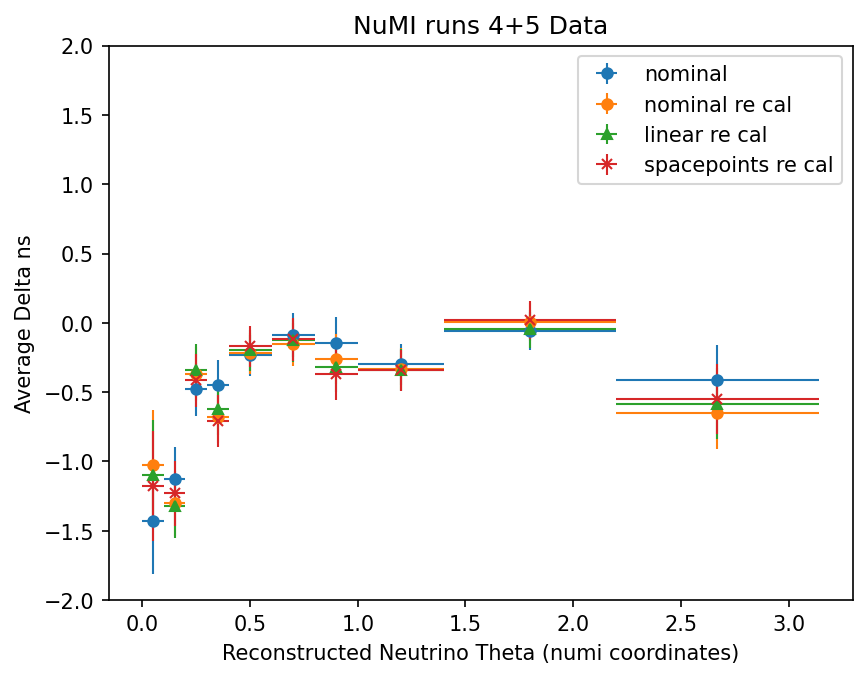

In [56]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Reconstructed Neutrino Theta (numi coordinates)")
plt.ylabel("Average Delta ns")
plt.ylim(-2,2)
plt.legend()
plt.show()



In [57]:
bins = [0,0.1,0.2,0.3,0.4,0.6,0.8,1.,1.4,2.2,3.14]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nu_numi_phi>{lo} and reco_nu_numi_phi<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nu_numi_phi>{lo} and reco_nu_numi_phi<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nu_numi_phi>{lo} and reco_nu_numi_phi<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nu_numi_phi>{lo} and reco_nu_numi_phi<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

reco_nu_numi_phi>0 and reco_nu_numi_phi<0.1 107
reco_nu_numi_phi>0.1 and reco_nu_numi_phi<0.2 99
reco_nu_numi_phi>0.2 and reco_nu_numi_phi<0.3 110
reco_nu_numi_phi>0.3 and reco_nu_numi_phi<0.4 92
reco_nu_numi_phi>0.4 and reco_nu_numi_phi<0.6 233
reco_nu_numi_phi>0.6 and reco_nu_numi_phi<0.8 239
reco_nu_numi_phi>0.8 and reco_nu_numi_phi<1.0 251
reco_nu_numi_phi>1.0 and reco_nu_numi_phi<1.4 573
reco_nu_numi_phi>1.4 and reco_nu_numi_phi<2.2 1132
reco_nu_numi_phi>2.2 and reco_nu_numi_phi<3.14 995


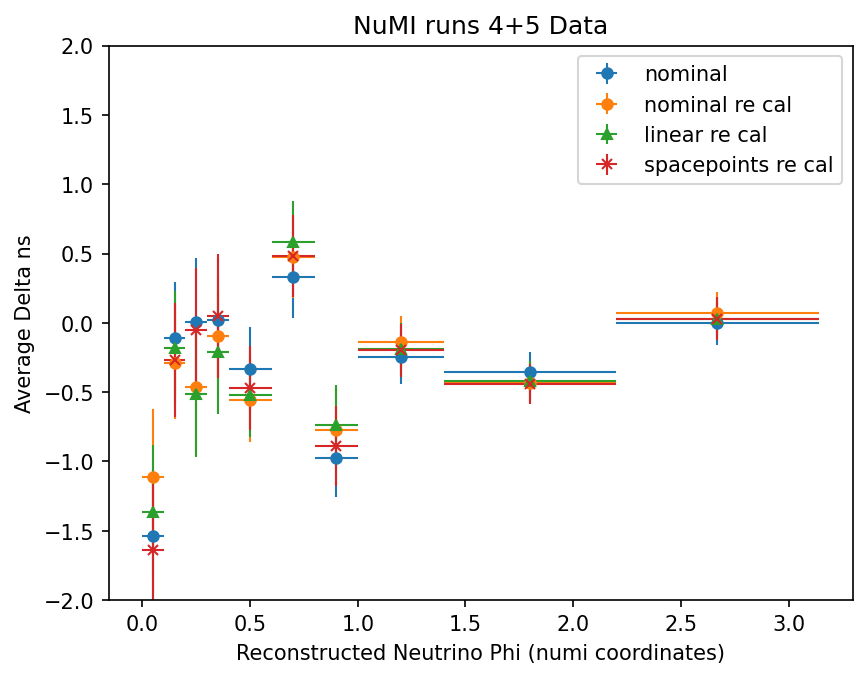

In [58]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Reconstructed Neutrino Phi (numi coordinates)")
plt.ylabel("Average Delta ns")
plt.ylim(-2,2)
plt.legend()
plt.show()



In [59]:
bins = [0,250,400,500,600,700,800,900,1000,1100,1200,1300,1500,2000,5000]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000
    else: hi = bins[i+1]
    query = f"kine_reco_Enu>{lo} and kine_reco_Enu<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000
    else: hi = bins[i+1]
    query = f"kine_reco_Enu>{lo} and kine_reco_Enu<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000
    else: hi = bins[i+1]
    query = f"kine_reco_Enu>{lo} and kine_reco_Enu<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000
    else: hi = bins[i+1]
    query = f"kine_reco_Enu>{lo} and kine_reco_Enu<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

kine_reco_Enu>0 and kine_reco_Enu<250 2216
kine_reco_Enu>250 and kine_reco_Enu<400 1804
kine_reco_Enu>400 and kine_reco_Enu<500 1129
kine_reco_Enu>500 and kine_reco_Enu<600 1107
kine_reco_Enu>600 and kine_reco_Enu<700 902
kine_reco_Enu>700 and kine_reco_Enu<800 745
kine_reco_Enu>800 and kine_reco_Enu<900 676
kine_reco_Enu>900 and kine_reco_Enu<1000 475
kine_reco_Enu>1000 and kine_reco_Enu<1100 375
kine_reco_Enu>1100 and kine_reco_Enu<1200 329
kine_reco_Enu>1200 and kine_reco_Enu<1300 277
kine_reco_Enu>1300 and kine_reco_Enu<1500 369
kine_reco_Enu>1500 and kine_reco_Enu<2000 507
kine_reco_Enu>2000 and kine_reco_Enu<1000000 409


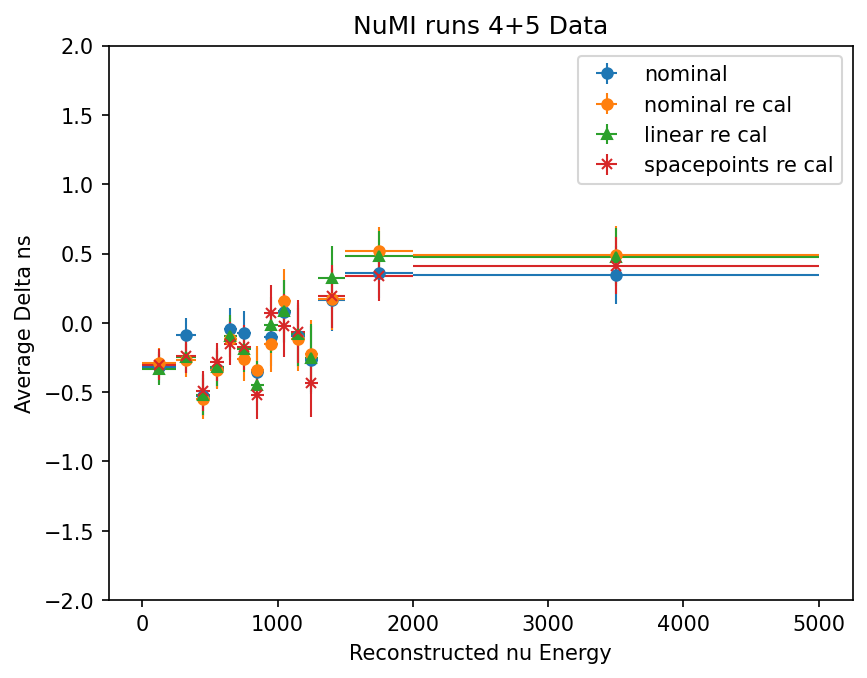

In [60]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Reconstructed nu Energy")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()


In [61]:
bins = [0,30,60,90,120,150,180,210,250]
means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxX>{lo} and reco_nuvtxX<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxX>{lo} and reco_nuvtxX<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    y,xbins = np.histogram(data,bins=30,range=(-9.42, 9.42),density=True)
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxX>{lo} and reco_nuvtxX<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxX>{lo} and reco_nuvtxX<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

reco_nuvtxX>0 and reco_nuvtxX<30 1398
reco_nuvtxX>30 and reco_nuvtxX<60 1388
reco_nuvtxX>60 and reco_nuvtxX<90 1386
reco_nuvtxX>90 and reco_nuvtxX<120 1381
reco_nuvtxX>120 and reco_nuvtxX<150 1391
reco_nuvtxX>150 and reco_nuvtxX<180 1347
reco_nuvtxX>180 and reco_nuvtxX<210 1337
reco_nuvtxX>210 and reco_nuvtxX<250 1494


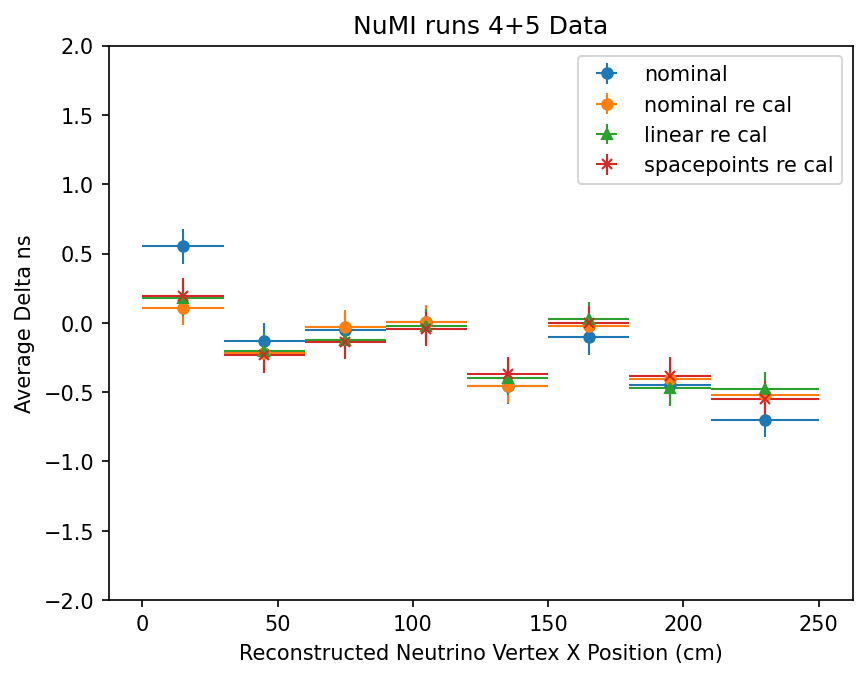

In [62]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Reconstructed Neutrino Vertex X Position (cm)")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()


In [63]:
bins = [-125,-100,-75,-50,0,25,50,75,100,125]
means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxY>{lo} and reco_nuvtxY<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxY>{lo} and reco_nuvtxY<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxY>{lo} and reco_nuvtxY<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxY>{lo} and reco_nuvtxY<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

reco_nuvtxY>-125 and reco_nuvtxY<-100 553
reco_nuvtxY>-100 and reco_nuvtxY<-75 1142
reco_nuvtxY>-75 and reco_nuvtxY<-50 1171
reco_nuvtxY>-50 and reco_nuvtxY<0 2334
reco_nuvtxY>0 and reco_nuvtxY<25 1193
reco_nuvtxY>25 and reco_nuvtxY<50 1199
reco_nuvtxY>50 and reco_nuvtxY<75 1262
reco_nuvtxY>75 and reco_nuvtxY<100 1438
reco_nuvtxY>100 and reco_nuvtxY<125 1023


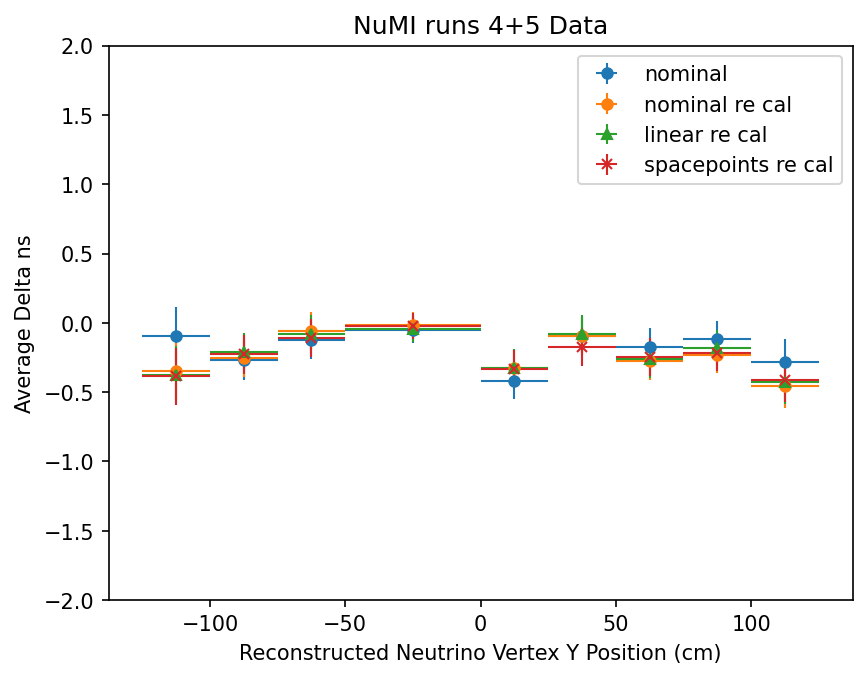

In [64]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Reconstructed Neutrino Vertex Y Position (cm)")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()


In [65]:
bins = [0,100,200,300,400,500,600,700,800,900,1100]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxZ>{lo} and reco_nuvtxZ<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxZ>{lo} and reco_nuvtxZ<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxZ>{lo} and reco_nuvtxZ<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"reco_nuvtxZ>{lo} and reco_nuvtxZ<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

reco_nuvtxZ>0 and reco_nuvtxZ<100 1260
reco_nuvtxZ>100 and reco_nuvtxZ<200 1088
reco_nuvtxZ>200 and reco_nuvtxZ<300 1090
reco_nuvtxZ>300 and reco_nuvtxZ<400 1053
reco_nuvtxZ>400 and reco_nuvtxZ<500 1085
reco_nuvtxZ>500 and reco_nuvtxZ<600 1036
reco_nuvtxZ>600 and reco_nuvtxZ<700 1131
reco_nuvtxZ>700 and reco_nuvtxZ<800 1159
reco_nuvtxZ>800 and reco_nuvtxZ<900 1079
reco_nuvtxZ>900 and reco_nuvtxZ<1100 1336


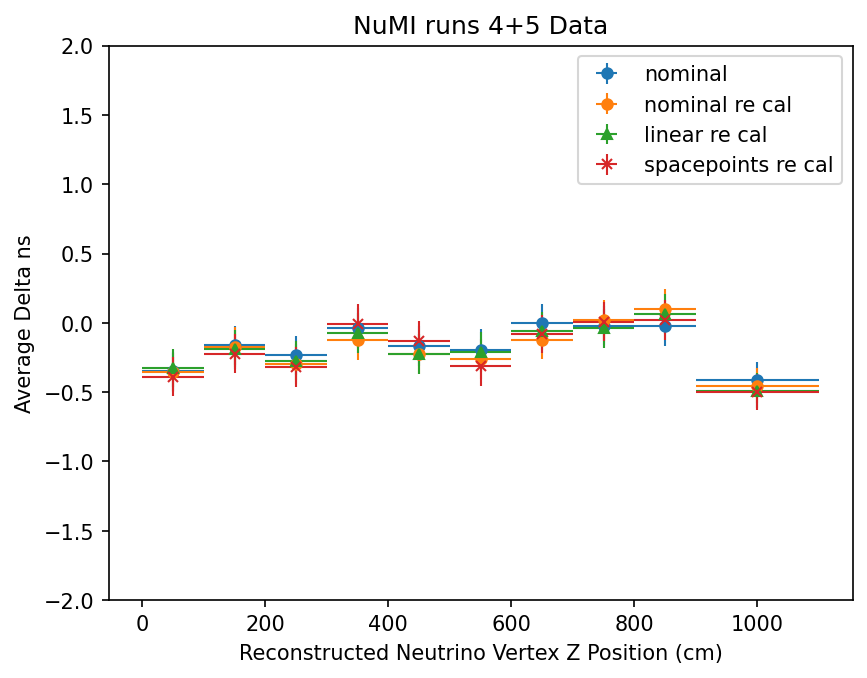

In [66]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Reconstructed Neutrino Vertex Z Position (cm)")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()


In [67]:
bins = [-1,-0.7,-0.4,-0.1,0.1,0.4,0.7,1]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonXangle>{lo} and muonXangle<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonXangle>{lo} and muonXangle<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonXangle>{lo} and muonXangle<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonXangle>{lo} and muonXangle<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

muonXangle>-1 and muonXangle<-0.7 437
muonXangle>-0.7 and muonXangle<-0.4 5129
muonXangle>-0.4 and muonXangle<-0.1 931
muonXangle>-0.1 and muonXangle<0.1 863
muonXangle>0.1 and muonXangle<0.4 1481
muonXangle>0.4 and muonXangle<0.7 1548
muonXangle>0.7 and muonXangle<1 931


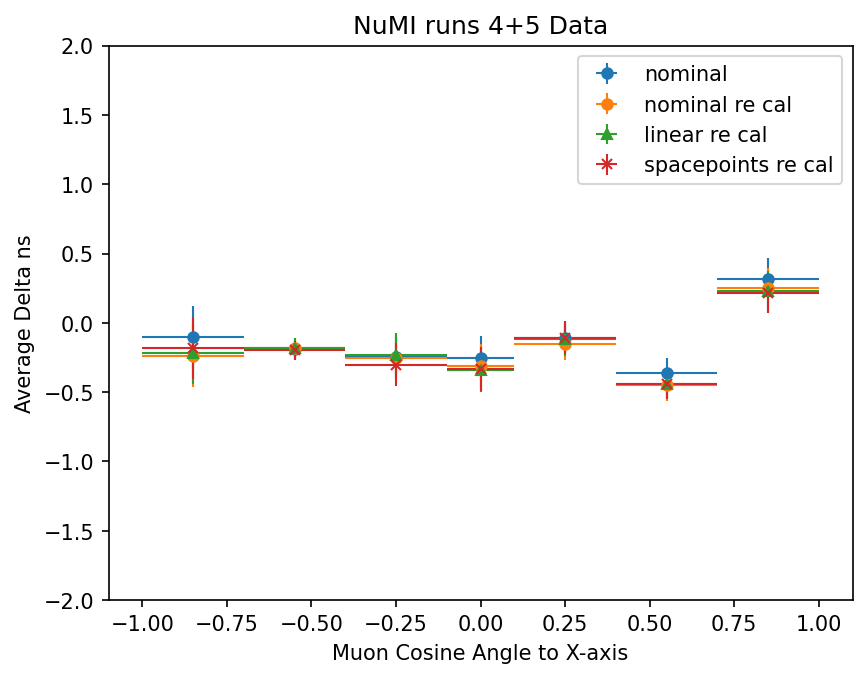

In [68]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Muon Cosine Angle to X-axis")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()


In [69]:
bins = [-1,-0.7,-0.4,-0.1,0.1,0.4,0.7,1]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonYangle>{lo} and muonYangle<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonYangle>{lo} and muonYangle<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonYangle>{lo} and muonYangle<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonYangle>{lo} and muonYangle<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

muonYangle>-1 and muonYangle<-0.7 740
muonYangle>-0.7 and muonYangle<-0.4 5417
muonYangle>-0.4 and muonYangle<-0.1 1083
muonYangle>-0.1 and muonYangle<0.1 885
muonYangle>0.1 and muonYangle<0.4 1242
muonYangle>0.4 and muonYangle<0.7 1030
muonYangle>0.7 and muonYangle<1 923


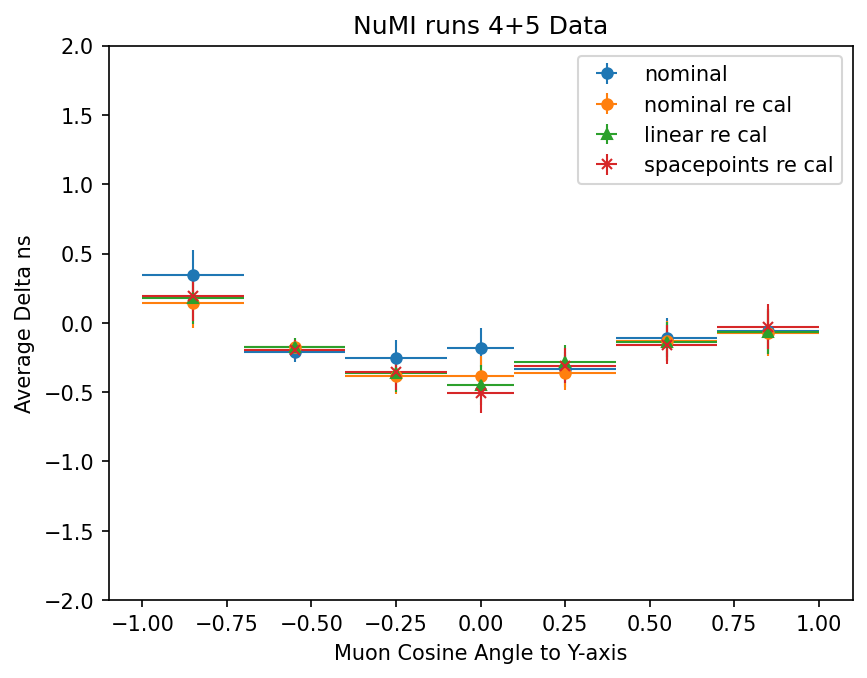

In [70]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Muon Cosine Angle to Y-axis")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()


In [71]:
bins = [-1,-0.5,0.1,0.5,0.7,0.8,0.9,1]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonZangle>{lo} and muonZangle<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonZangle>{lo} and muonZangle<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonZangle>{lo} and muonZangle<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = bins[i+1]
    query = f"muonZangle>{lo} and muonZangle<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

muonZangle>-1 and muonZangle<-0.5 4977
muonZangle>-0.5 and muonZangle<0.1 1119
muonZangle>0.1 and muonZangle<0.5 1315
muonZangle>0.5 and muonZangle<0.7 1012
muonZangle>0.7 and muonZangle<0.8 811
muonZangle>0.8 and muonZangle<0.9 1019
muonZangle>0.9 and muonZangle<1 1067


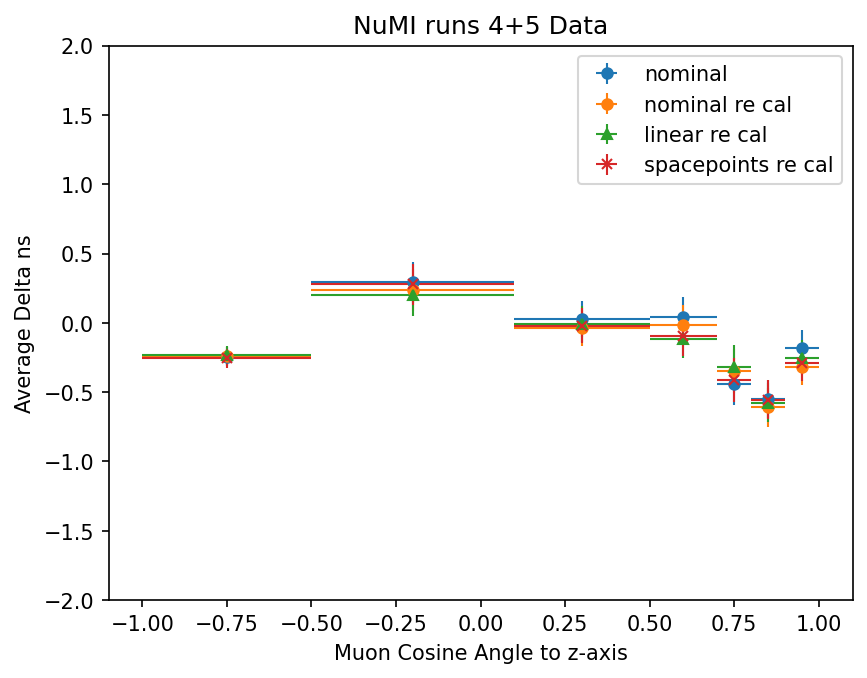

In [72]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Muon Cosine Angle to z-axis")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()


In [73]:
bins = [0.1,0.15,0.2,0.25,0.28,0.31,0.35,0.4,0.45,0.5,0.6,0.7,0.8,1,1.5]
bins = [0.1,0.15,0.2,0.25,0.28,0.31,0.35,0.4,0.45,0.5,0.6,0.8,1,1.5]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000
    else: hi = bins[i+1]
    query = f"Emuon>{lo} and Emuon<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000
    else: hi = bins[i+1]
    query = f"Emuon>{lo} and Emuon<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000
    else: hi = bins[i+1]
    query = f"Emuon>{lo} and Emuon<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000
    else: hi = bins[i+1]
    query = f"Emuon>{lo} and Emuon<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

Emuon>0.1 and Emuon<0.15 765
Emuon>0.15 and Emuon<0.2 688
Emuon>0.2 and Emuon<0.25 879
Emuon>0.25 and Emuon<0.28 487
Emuon>0.28 and Emuon<0.31 449
Emuon>0.31 and Emuon<0.35 522
Emuon>0.35 and Emuon<0.4 590
Emuon>0.4 and Emuon<0.45 437
Emuon>0.45 and Emuon<0.5 360
Emuon>0.5 and Emuon<0.6 584
Emuon>0.6 and Emuon<0.8 621
Emuon>0.8 and Emuon<1 248
Emuon>1 and Emuon<1000000 179


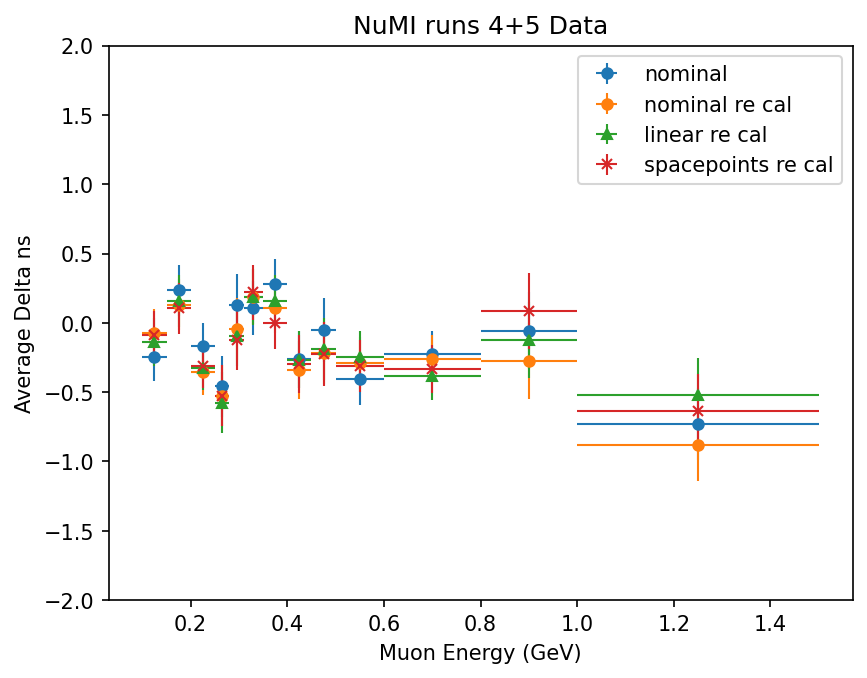

In [74]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Muon Energy (GeV)")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()


In [75]:
bins = [0,2000000,4000000,6000000,8000000,10000000,15000000,20000000,25000000,30000000,40000000]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"match_chargeU>{lo} and match_chargeU<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=10000000000
    else: hi = bins[i+1]
    query = f"match_chargeU>{lo} and match_chargeU<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=10000000000
    else: hi = bins[i+1]
    query = f"match_chargeU>{lo} and match_chargeU<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=10000000000
    else: hi = bins[i+1]
    query = f"match_chargeU>{lo} and match_chargeU<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

match_chargeU>0 and match_chargeU<2000000 1319
match_chargeU>2000000 and match_chargeU<4000000 1637
match_chargeU>4000000 and match_chargeU<6000000 1495
match_chargeU>6000000 and match_chargeU<8000000 1259
match_chargeU>8000000 and match_chargeU<10000000 1006
match_chargeU>10000000 and match_chargeU<15000000 1779
match_chargeU>15000000 and match_chargeU<20000000 987
match_chargeU>20000000 and match_chargeU<25000000 632
match_chargeU>25000000 and match_chargeU<30000000 382
match_chargeU>30000000 and match_chargeU<1000000000 824


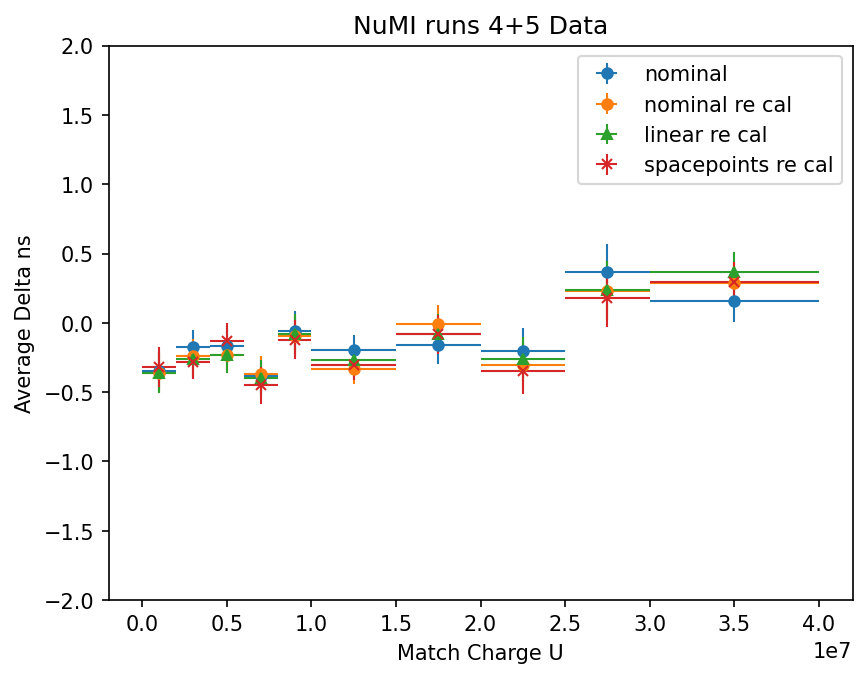

In [76]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Match Charge U")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()


In [77]:
bins = [0,2000000,4000000,6000000,8000000,10000000,15000000,20000000,25000000,30000000,40000000]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"match_chargeY>{lo} and match_chargeY<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"match_chargeY>{lo} and match_chargeY<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    y,xbins = np.histogram(data,bins=30,range=(-9.42, 9.42),density=True)
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"match_chargeY>{lo} and match_chargeY<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"match_chargeY>{lo} and match_chargeY<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

match_chargeY>0 and match_chargeY<2000000 1341
match_chargeY>2000000 and match_chargeY<4000000 1678
match_chargeY>4000000 and match_chargeY<6000000 1500
match_chargeY>6000000 and match_chargeY<8000000 1271
match_chargeY>8000000 and match_chargeY<10000000 1037
match_chargeY>10000000 and match_chargeY<15000000 1808
match_chargeY>15000000 and match_chargeY<20000000 980
match_chargeY>20000000 and match_chargeY<25000000 604
match_chargeY>25000000 and match_chargeY<30000000 369
match_chargeY>30000000 and match_chargeY<1000000000 731


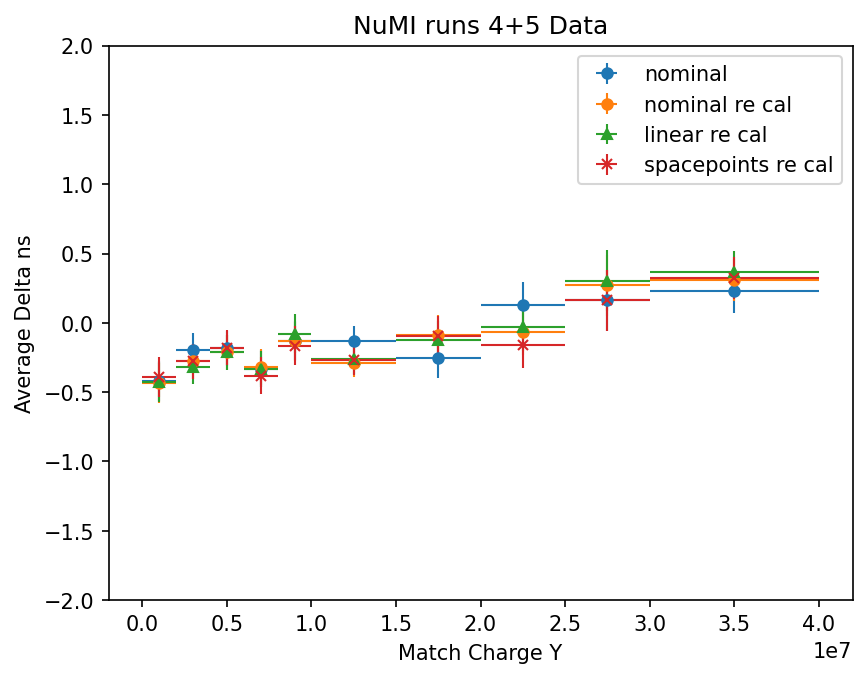

In [78]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Match Charge Y")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()

In [79]:
bins = [0,2000000,4000000,6000000,8000000,10000000,15000000,20000000,25000000,30000000,40000000]

means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"match_chargeV>{lo} and match_chargeV<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"match_chargeV>{lo} and match_chargeV<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"match_chargeV>{lo} and match_chargeV<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"match_chargeV>{lo} and match_chargeV<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

match_chargeV>0 and match_chargeV<2000000 1287
match_chargeV>2000000 and match_chargeV<4000000 1671
match_chargeV>4000000 and match_chargeV<6000000 1544
match_chargeV>6000000 and match_chargeV<8000000 1212
match_chargeV>8000000 and match_chargeV<10000000 989
match_chargeV>10000000 and match_chargeV<15000000 1783
match_chargeV>15000000 and match_chargeV<20000000 975
match_chargeV>20000000 and match_chargeV<25000000 615
match_chargeV>25000000 and match_chargeV<30000000 401
match_chargeV>30000000 and match_chargeV<1000000000 843


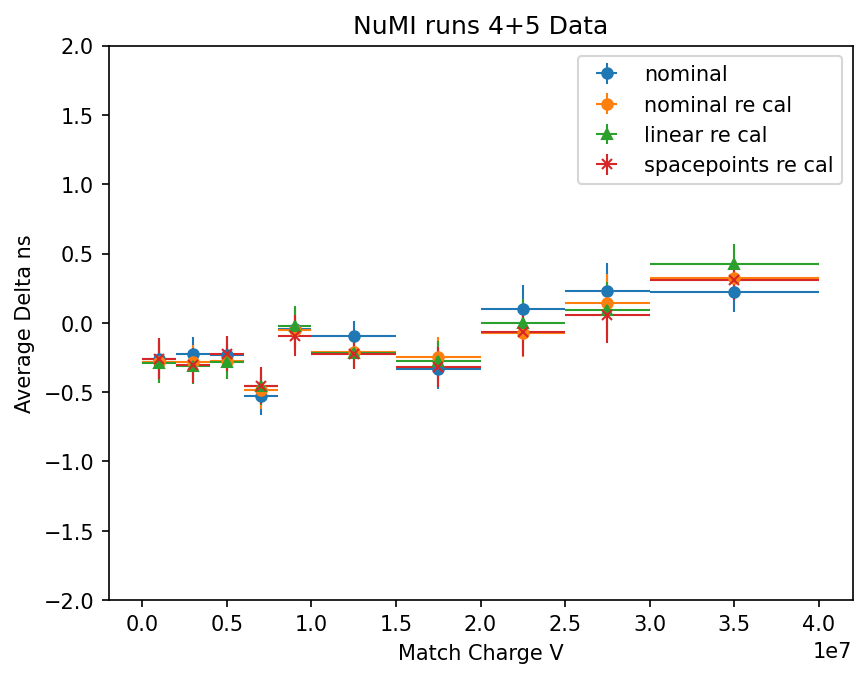

In [80]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("Match Charge V")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()

In [81]:
bins = [0,300,400,500,600,1000,1500,2000,2500,3000,4000,5000,7500,10000]
means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"flash_measPe>{lo} and flash_measPe<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"flash_measPe>{lo} and flash_measPe<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"flash_measPe>{lo} and flash_measPe<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"flash_measPe>{lo} and flash_measPe<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

flash_measPe>0 and flash_measPe<300 3674
flash_measPe>300 and flash_measPe<400 832
flash_measPe>400 and flash_measPe<500 722
flash_measPe>500 and flash_measPe<600 584
flash_measPe>600 and flash_measPe<1000 1555
flash_measPe>1000 and flash_measPe<1500 1151
flash_measPe>1500 and flash_measPe<2000 710
flash_measPe>2000 and flash_measPe<2500 479
flash_measPe>2500 and flash_measPe<3000 371
flash_measPe>3000 and flash_measPe<4000 437
flash_measPe>4000 and flash_measPe<5000 249
flash_measPe>5000 and flash_measPe<7500 313
flash_measPe>7500 and flash_measPe<1000000000 243


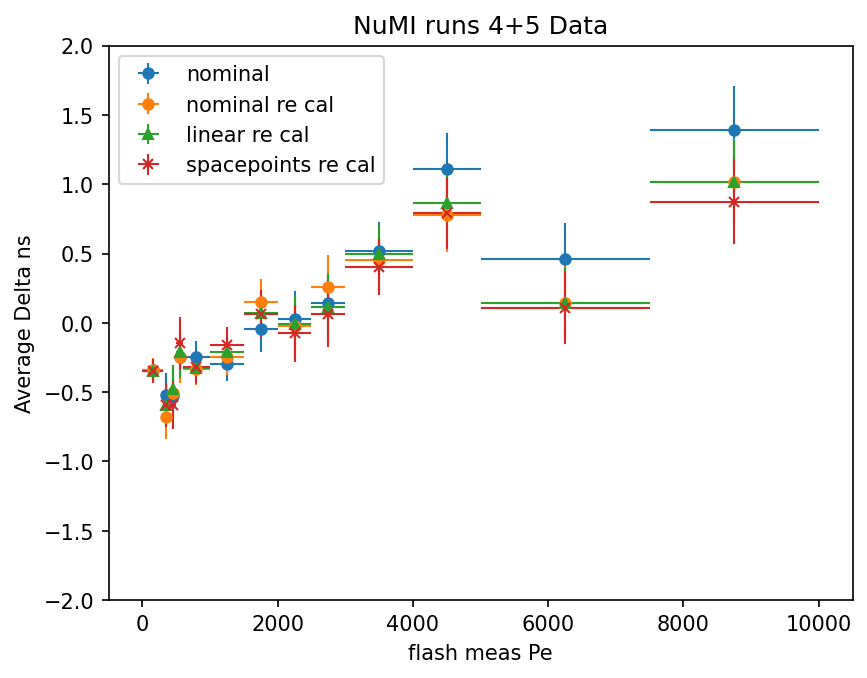

In [82]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("flash meas Pe")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()

In [83]:
bins = [0,300,400,500,600,1000,1500,2000,2500,3000,4000,5000,7500,10000]
means = []
mean_errors = []
stds = []
std_errors = []
global_query = "merge_times>-9.42 and merge_times<9.42 and match_isFC==1"
global_query = "merge_times>-9.42 and merge_times<9.42"

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"flash_predPe>{lo} and flash_predPe<{hi}"
    data = df.query(query).query(global_query)["merge_times"].to_numpy()
    print(query,len(data))
    means.append(statistics.mean(data))
    stds.append(abs(statistics.stdev(data)))
    mean_errors.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42 and match_isFC==1"
global_query = "merge_times_recor>-9.42 and merge_times_recor<9.42"
means_recor = []
mean_errors_recor = []
stds_recor = []
std_errors_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"flash_predPe>{lo} and flash_predPe<{hi}"
    data = df.query(query).query(global_query)["merge_times_recor"].to_numpy()
    means_recor.append(statistics.mean(data))
    stds_recor.append(abs(statistics.stdev(data)))
    mean_errors_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42 and match_isFC==1"
global_query = "merge_times_fullDp_recor>-9.42 and merge_times_fullDp_recor<9.42"
means_fullDp_recor = []
mean_errors_fullDp_recor = []
stds_fullDp_recor = []
std_errors_fullDp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"flash_predPe>{lo} and flash_predPe<{hi}"
    data = df.query(query).query(global_query)["merge_times_fullDp_recor"].to_numpy()
    means_fullDp_recor.append(statistics.mean(data))
    stds_fullDp_recor.append(abs(statistics.stdev(data)))
    mean_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_fullDp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42 and match_isFC==1"
global_query = "merge_times_ssmsp_recor>-9.42 and merge_times_ssmsp_recor<9.42"
means_ssmsp_recor = []
mean_errors_ssmsp_recor = []
stds_ssmsp_recor = []
std_errors_ssmsp_recor = []

for i in range(len(bins)-1):
    lo = bins[i]
    hi = 0
    if i==len(bins)-2: hi=1000000000
    else: hi = bins[i+1]
    query = f"flash_predPe>{lo} and flash_predPe<{hi}"
    data = df.query(query).query(global_query)["merge_times_ssmsp_recor"].to_numpy()
    means_ssmsp_recor.append(statistics.mean(data))
    stds_ssmsp_recor.append(abs(statistics.stdev(data)))
    mean_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(len(data)))
    std_errors_ssmsp_recor.append(statistics.stdev(data)/np.sqrt(2*(len(data)-1)))

flash_predPe>0 and flash_predPe<300 4034
flash_predPe>300 and flash_predPe<400 928
flash_predPe>400 and flash_predPe<500 701
flash_predPe>500 and flash_predPe<600 595
flash_predPe>600 and flash_predPe<1000 1570
flash_predPe>1000 and flash_predPe<1500 1189
flash_predPe>1500 and flash_predPe<2000 744
flash_predPe>2000 and flash_predPe<2500 438
flash_predPe>2500 and flash_predPe<3000 309
flash_predPe>3000 and flash_predPe<4000 357
flash_predPe>4000 and flash_predPe<5000 175
flash_predPe>5000 and flash_predPe<7500 185
flash_predPe>7500 and flash_predPe<1000000000 95


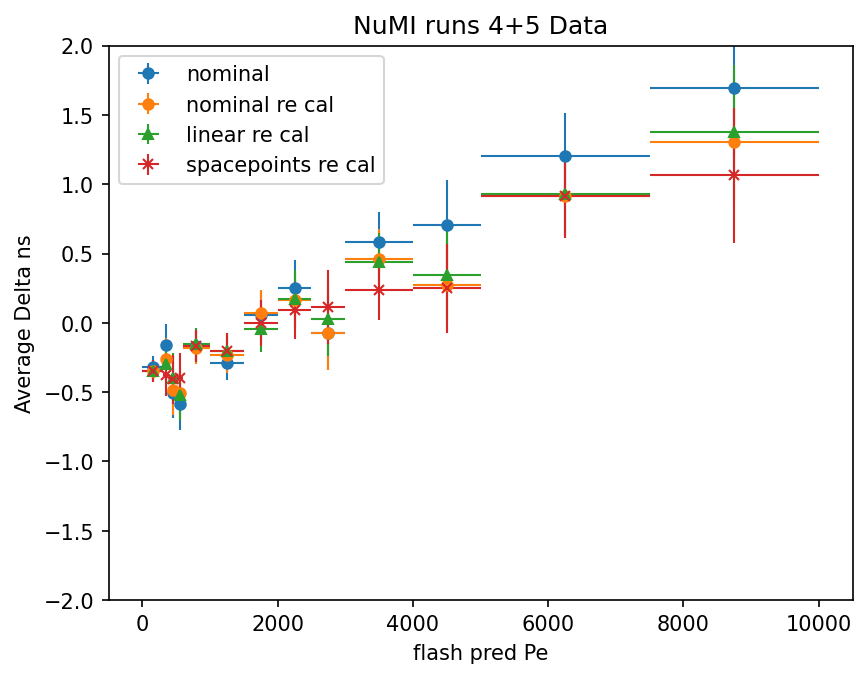

In [84]:
bin_centers = get_bin_centers(bins)
plt.figure(dpi=150)
plt.title("NuMI runs 4+5 Data")
plt.errorbar(bin_centers,means,yerr=mean_errors,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal")
plt.errorbar(bin_centers,means_recor,yerr=mean_errors_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="o",elinewidth=1,label="nominal re cal")
plt.errorbar(bin_centers,means_fullDp_recor,yerr=mean_errors_fullDp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="^",elinewidth=1,label="linear re cal")
plt.errorbar(bin_centers,means_ssmsp_recor,yerr=mean_errors_ssmsp_recor,xerr=get_x_err_Enu(bin_centers,bins),lw=0,ms=5,marker="x",elinewidth=1,label="spacepoints re cal")
plt.xlabel("flash pred Pe")
plt.ylim(-2,2)
plt.ylabel("Average Delta ns")
plt.legend()
plt.show()